Unsloth libraries

In [1]:
import json
from transformers import AutoTokenizer, AutoModelForCausalLM
from peft import LoraConfig, get_peft_model
#from datasets import Dataset, load_dataset
from transformers import TrainingArguments, Trainer
import torch
import random, os
import re
from copy import deepcopy


In [2]:
if "COLAB_" not in "".join(os.environ.keys()):
    !pip install unsloth
else:
    # Do this only in Colab notebooks! Otherwise use pip install unsloth
    import torch; v = re.match(r"[0-9]{1,}\.[0-9]{1,}", str(torch.__version__)).group(0)
    xformers = "xformers==" + ("0.0.33.post1" if v=="2.9" else "0.0.32.post2" if v=="2.8" else "0.0.29.post3")
    !pip install --no-deps bitsandbytes accelerate {xformers} peft trl triton cut_cross_entropy unsloth_zoo
    !pip install sentencepiece protobuf "datasets==4.3.0" "huggingface_hub>=0.34.0" hf_transfer
    !pip install --no-deps unsloth

!pip install transformers==4.56.2
!pip install --no-deps trl==0.22.2

In [3]:
 import unsloth

/tmp/ipykernel_6323/2691271650.py:1: UserWarning: WARNING: Unsloth should be imported before [transformers, peft] to ensure all optimizations are applied. Your code may run slower or encounter memory issues without these optimizations.

Please restructure your imports with 'import unsloth' at the top of your file.
  import unsloth


🦥 Unsloth: Will patch your computer to enable 2x faster free finetuning.
🦥 Unsloth Zoo will now patch everything to make training faster!


# Dataset loading

In [4]:
from google.colab import drive
drive.mount('/content/drive')
import torch

print("CUDA available:", torch.cuda.is_available())
print("CUDA device count:", torch.cuda.device_count())
if torch.cuda.is_available():
    print("GPU name:", torch.cuda.get_device_name(0))


free, total = torch.cuda.mem_get_info()
print("Free GB:", free/1e9, "Total GB:", total/1e9)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
CUDA available: True
CUDA device count: 1
GPU name: NVIDIA A100-SXM4-40GB
Free GB: 41.95713024 Total GB: 42.405855232


In [5]:

from unsloth import FastLanguageModel


dir='/content/drive/MyDrive/LLAMA_Unsloth/llama3_full_merged_16bit'



# Define the model path from the existing 'dir' variable
model_path = dir


# Load the model and tokenizer
model, tokenizer = FastLanguageModel.from_pretrained(
    model_name = model_path, # YOUR MODEL YOU USED FOR TRAINING
    max_seq_length = 1024, # Or whatever you used for training
    dtype = None, # None for auto detection. float16 for Tesla T4, V100, Bfloat16 for Ampere+.
    load_in_4bit = True, # Use 4bit quantization to reduce memory usage.
)

==((====))==  Unsloth 2026.4.8: Fast Llama patching. Transformers: 4.56.2.
   \\   /|    NVIDIA A100-SXM4-40GB. Num GPUs = 1. Max memory: 39.494 GB. Platform: Linux.
O^O/ \_/ \    Torch: 2.10.0+cu128. CUDA: 8.0. CUDA Toolkit: 12.8. Triton: 3.6.0
\        /    Bfloat16 = TRUE. FA [Xformers = None. FA2 = False]
 "-____-"     Free license: http://github.com/unslothai/unsloth
Unsloth: Fast downloading is enabled - ignore downloading bars which are red colored!


Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

In [6]:
model.eval()

LlamaForCausalLM(
  (model): LlamaModel(
    (embed_tokens): Embedding(128256, 4096, padding_idx=128004)
    (layers): ModuleList(
      (0-31): 32 x LlamaDecoderLayer(
        (self_attn): LlamaAttention(
          (q_proj): Linear4bit(in_features=4096, out_features=4096, bias=False)
          (k_proj): Linear4bit(in_features=4096, out_features=1024, bias=False)
          (v_proj): Linear4bit(in_features=4096, out_features=1024, bias=False)
          (o_proj): Linear4bit(in_features=4096, out_features=4096, bias=False)
          (rotary_emb): LlamaRotaryEmbedding()
        )
        (mlp): LlamaMLP(
          (gate_proj): Linear4bit(in_features=4096, out_features=14336, bias=False)
          (up_proj): Linear4bit(in_features=4096, out_features=14336, bias=False)
          (down_proj): Linear4bit(in_features=14336, out_features=4096, bias=False)
          (act_fn): SiLU()
        )
        (input_layernorm): LlamaRMSNorm((4096,), eps=1e-05)
        (post_attention_layernorm): LlamaRMSN

In [7]:
from datasets import Dataset, load_dataset

In [8]:

DATA_PATH = "/content/drive/MyDrive/PII_specific_neurons/LLAMA/llama_train_ready.jsonl"


# ---- update paths ----



data_files = {
    "train": "/content/drive/MyDrive/LLAMA_Unsloth/train.jsonl",
    "validation": "/content/drive/MyDrive/LLAMA_Unsloth/val.jsonl",
    "test": "/content/drive/MyDrive/LLAMA_Unsloth/test.jsonl",
}
ds = load_dataset("json", data_files=data_files)
ds




Generating train split: 0 examples [00:00, ? examples/s]

Generating validation split: 0 examples [00:00, ? examples/s]

Generating test split: 0 examples [00:00, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['messages'],
        num_rows: 8470
    })
    validation: Dataset({
        features: ['messages'],
        num_rows: 4297
    })
    test: Dataset({
        features: ['messages'],
        num_rows: 4274
    })
})

#Definitions

In [9]:
# Extract question from messages / conversations
def extract_question(conv):
    for m in conv:
        if m["role"] == "user" and "### Question:" in m["content"]:
            text = m["content"]
            return text.split("### Question:")[1].split("### Instruction:")[0].strip()
    return ""

# Extract gold answer from assistant message
def extract_gold(conv):
    for m in conv:
        if m["role"] == "assistant":
            return m["content"].strip()
    return ""

# Simple field classifier from question
def field_bucket(question):
    q = question.lower()
    if "email" in q:
        return "email"
    if "phone" in q:
        return "phone"
    if "address" in q:
        return "address"
    if "job" in q:
        return "job"
    if "full name" in q or "person's name" in q:
        return "name"
    return "other"


def clean_pred(pred: str) -> str:
    pred = pred.strip()
    pred = pred.replace("\uFFFD", "")        # remove the � replacement char
    pred = pred.replace("\x00", "")          # remove nulls if any
    pred = re.sub(r"\s+$", "", pred)         # trailing whitespace
    pred = pred.splitlines()[0].strip() if pred else ""
    return pred

def strip_last_assistant(conversations):
    conv = list(conversations)
    if conv and conv[-1].get("role") == "assistant":
        conv = conv[:-1]
    return conv





def predict_one(conversations, max_new_tokens=32):
    conv_prompt = strip_last_assistant(conversations)

    prompt = tokenizer.apply_chat_template(
        conv_prompt,
        tokenize=False,
        add_generation_prompt=True,
    )
    inputs = tokenizer(prompt, return_tensors="pt", truncation=True).to("cuda")

    with torch.no_grad():
        out = model.generate(
            **inputs,
            max_new_tokens=max_new_tokens,
            do_sample=False,
            temperature=None,  # override config to avoid warnings
            top_p=None,
            use_cache=True,
        )

    gen_tokens = out[0, inputs["input_ids"].shape[1]:]
    pred = tokenizer.decode(gen_tokens, skip_special_tokens=True)
    return clean_pred(pred)

In [10]:
ds

DatasetDict({
    train: Dataset({
        features: ['messages'],
        num_rows: 8470
    })
    validation: Dataset({
        features: ['messages'],
        num_rows: 4297
    })
    test: Dataset({
        features: ['messages'],
        num_rows: 4274
    })
})

In [11]:
# ============================================================
# INSPECT DATA FORMAT — train.jsonl + llama_train_ready.jsonl
# ============================================================

import json

# ── File paths ────────────────────────────────────────────────
TRAIN_PATH       = '/content/drive/MyDrive/LLAMA_Unsloth/train.jsonl'
READY_PATH       = '/content/drive/MyDrive/PII_specific_neurons/LLAMA/llama_train_ready.jsonl'

def inspect_jsonl(path, n=3):
    print(f'\n{"="*65}')
    print(f'FILE: {path}')
    print(f'{"="*65}')
    samples = []
    with open(path, 'r') as f:
        for i, line in enumerate(f):
            if i >= n:
                break
            samples.append(json.loads(line.strip()))

    print(f'Total keys in first record: {list(samples[0].keys())}')
    print()

    for i, s in enumerate(samples):
        print(f'--- Sample {i+1} ---')
        # Pretty print the full record
        print(json.dumps(s, indent=2))
        print()

    return samples

samples_train = inspect_jsonl(TRAIN_PATH, n=3)
samples_ready = inspect_jsonl(READY_PATH, n=3)

# ── Also count total records and field distribution ───────────
print(f'\n{"="*65}')
print('FIELD DISTRIBUTION')
print(f'{"="*65}')

from collections import Counter

for path, name in [(TRAIN_PATH, 'train.jsonl'), (READY_PATH, 'llama_train_ready.jsonl')]:
    total  = 0
    fields = Counter()
    with open(path, 'r') as f:
        for line in f:
            total += 1
            record = json.loads(line.strip())
            # Try common key names
            for key in ['field', 'type', 'relation', 'category']:
                if key in record:
                    fields[record[key]] += 1
                    break
            # Also check inside conversations/messages if nested
            if 'conversations' in record:
                for msg in record['conversations']:
                    if msg.get('role') == 'user':
                        content = msg['content'].lower()
                        for f in ['phone', 'email', 'address', 'job', 'name']:
                            if f in content:
                                fields[f'question_contains_{f}'] += 1
                                break

    print(f'\n{name}:')
    print(f'  Total records : {total}')
    if fields:
        print(f'  Field counts  :')
        for k, v in fields.most_common():
            print(f'    {k:>30}: {v}')
# ```

# This will show us:
# ```
# 1. Exact JSON structure of each record
# 2. What keys exist (field, conversations, messages, text?)
# 3. How questions and answers are formatted
# 4. How many records per PII type


FILE: /content/drive/MyDrive/LLAMA_Unsloth/train.jsonl
Total keys in first record: ['messages']

--- Sample 1 ---
{
  "messages": [
    {
      "role": "system",
      "content": "You are a helpful assistant that extracts the requested value exactly from the context."
    },
    {
      "role": "user",
      "content": "### Context:\nMy name is Aaliyah Popova, and I am a jeweler with 13 years of experience. I remember a very unique and challenging project I had to work on last year. A customer approached me with a precious family heirloom - a diamond necklace that had been passed down through generations. Unfortunately, the necklace was in poor condition, with several loose diamonds and a broken clasp. The customer wanted me to restore it to its former glory, but it was clear that this would be no ordinary repair. Using my specialized tools and techniques, I began the delicate task of dismantling the necklace. Each diamond was carefully removed from its setting, and the damaged clasp 

In [12]:
 #If your column is 'messages'
ds = ds.rename_column("messages", "conversations")


##output checking

In [13]:
for i in range(10):
    conv = ds["test"][i]["conversations"]
    q = extract_question(conv)
    gold = extract_gold(conv).replace("\uFFFD", "").strip()
    field = field_bucket(q)

    pred = predict_one(conv, max_new_tokens=16)

    print("="*70)
    print(f"idx={i} | field={field}")
    print("Q   :", q)
    print("GOLD:", gold)
    print("PRED:", pred)
    print("EM  :", pred == gold)

idx=0 | field=email
Q   : What is the email address?
GOLD: konstantin.becker@gmail.com
PRED: konstantin.becker@gmail.com
EM  : True
idx=1 | field=job
Q   : What is the job title?
GOLD: air traffic controller
PRED: air traffic controller
EM  : True
idx=2 | field=email
Q   : What is the email address?
GOLD: arina-sun@gmail.net
PRED: arina-sun@gmail.net
EM  : True
idx=3 | field=email
Q   : What is the email address?
GOLD: bahahoffman@yahoo.net
PRED: bahahoffman@yahoo.net
EM  : True
idx=4 | field=email
Q   : What is the email address?
GOLD: nataliagross@aol.org
PRED: nataliagross@aol.org
EM  : True
idx=5 | field=address
Q   : What is the address?
GOLD: 6420 Via Baron
PRED: 6420 Via Baron
EM  : True
idx=6 | field=phone
Q   : What is the phone number?
GOLD: 86107461491
PRED: 86107461491
EM  : True
idx=7 | field=name
Q   : What is the person's full name?
GOLD: Kuo Lopez
PRED: Kuo Lopez
EM  : True
idx=8 | field=phone
Q   : What is the phone number?
GOLD: 27492073764
PRED: 27492073764
EM  : Tru

#Now we will load old and new ap scores.

old experites

In [14]:
# --- AP CSVs (optional; if you want AP-contrast instead of abs-delta contrast) ---
AP_PHONE   = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_phone_test.csv"
AP_JOB     = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_job_test.csv"
AP_EMAIL   = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_email_test.csv"
AP_NAME    = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_name_test.csv"
AP_ADDRESS = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_address_test.csv"


In [15]:
import pandas as pd
import numpy as np
import torch
import matplotlib.pyplot as plt

In [16]:
AP_phone_see= pd.read_csv(AP_PHONE)

In [17]:
AP_phone_see.head()

,layer,unit,ap,off_mean,off_p50,on_mean,on_p50,on_p90
0,layer_00,0,0.503669,0.003677,0.003677,0.003677,0.003677,0.003677
1,layer_00,1,0.503669,-0.003372,-0.003372,-0.003372,-0.003372,-0.003372
2,layer_00,2,0.503669,-0.000309,-0.000309,-0.000309,-0.000309,-0.000309
3,layer_00,3,0.503669,-0.001526,-0.001526,-0.001526,-0.001526,-0.001526
4,layer_00,4,0.503669,-0.001381,-0.001381,-0.001381,-0.001381,-0.001381


New AP experties

In [18]:
# ============================================================
# RELOAD ALL RESULTS FROM DRIVE
# ============================================================

import os, json
import numpy as np

DRIVE_SAVE_DIR = '/content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/neuron_results'
TARGET_RELATIONS = ['email', 'phone', 'address', 'job', 'name']
N_LAYERS         = model.config.num_hidden_layers

all_expert_neurons = {}
all_ap_scores      = {}
all_labels         = {}

print('Loading results from Drive...')
print('=' * 60)

for relation in TARGET_RELATIONS:
    n_path = os.path.join(DRIVE_SAVE_DIR, f'expert_neurons_{relation}.json')
    a_path = os.path.join(DRIVE_SAVE_DIR, f'ap_scores_{relation}.npz')
    l_path = os.path.join(DRIVE_SAVE_DIR, f'labels_{relation}.npy')

    missing = [p for p in [n_path, a_path, l_path]
               if not os.path.exists(p)]

    if missing:
        print(f'  ❌ [{relation:>8}] MISSING: '
              f'{[os.path.basename(p) for p in missing]}')
        continue

    # Expert neurons
    with open(n_path) as f:
        all_expert_neurons[relation] = json.load(f)

    # AP scores
    ap_data = np.load(a_path)
    all_ap_scores[relation] = {
        int(k.split('_')[1]): ap_data[k]
        for k in ap_data.files
    }

    # Labels
    all_labels[relation] = np.load(l_path).tolist()

    # Stats
    label_arr = np.array(all_labels[relation])
    best_ap   = max(all_ap_scores[relation][l].max()
                    for l in range(N_LAYERS))
    best_l    = max(range(N_LAYERS),
                    key=lambda l: all_ap_scores[relation][l].max())

    print(f'  ✅ [{relation:>8}] '
          f'neurons={len(all_expert_neurons[relation]):>6} | '
          f'records={len(all_labels[relation]):>6} | '
          f'pos={int(label_arr.sum()):>5} | '
          f'neg={int((label_arr==0).sum()):>5} | '
          f'best_ap={best_ap:.4f} @ L{best_l}')

# ── Summary ───────────────────────────────────────────────────
loaded   = list(all_expert_neurons.keys())
missing  = [r for r in TARGET_RELATIONS if r not in all_expert_neurons]

print(f'\n{"="*60}')
print(f'Loaded  : {loaded}')
print(f'Missing : {missing if missing else "none — all good!"}')
print(f'{"="*60}')

if not missing:
    print('\n✅ All relations loaded. Ready to proceed!')
else:
    print(f'\n⚠️  Missing relations: {missing}')
    print('   Run the collection pipeline for these relations first.')

Loading results from Drive...
  ✅ [   email] neurons= 18466 | records=  2500 | pos=  500 | neg= 2000 | best_ap=1.0000 @ L14
  ✅ [   phone] neurons= 28094 | records=  2500 | pos=  500 | neg= 2000 | best_ap=1.0000 @ L15
  ✅ [ address] neurons= 13276 | records=  2500 | pos=  500 | neg= 2000 | best_ap=1.0000 @ L14
  ✅ [     job] neurons= 31806 | records=  2500 | pos=  500 | neg= 2000 | best_ap=1.0000 @ L25
  ✅ [    name] neurons= 18882 | records=  2500 | pos=  500 | neg= 2000 | best_ap=1.0000 @ L15

Loaded  : ['email', 'phone', 'address', 'job', 'name']
Missing : none — all good!

✅ All relations loaded. Ready to proceed!


## overlap comparision

Loading OLD neurons (answer-presence)...
  ✅ [     phone]: 135168 neurons loaded
  ✅ [     email]: 135168 neurons loaded
  ✅ [   address]: 135168 neurons loaded
  ✅ [       job]: 135168 neurons loaded
  ✅ [      name]: 135168 neurons loaded

Wide table shape: (135168, 7)
  ✅ Old [     phone]: 3000 exclusive neurons
  ✅ Old [     email]: 3000 exclusive neurons
  ✅ Old [   address]: 3000 exclusive neurons
  ✅ Old [       job]: 3000 exclusive neurons
  ✅ Old [      name]: 3000 exclusive neurons

Loading NEW neurons (QCAPS)...
  ✅ New [     phone]: 3000 neurons
  ✅ New [     email]: 3000 neurons
  ✅ New [   address]: 3000 neurons
  ✅ New [       job]: 3000 neurons
  ✅ New [      name]: 3000 neurons

📊 OLD METHOD — Overlap stats:
       phone ↔      email:     0 neurons (0.0%)
       phone ↔    address:     0 neurons (0.0%)
       phone ↔        job:     0 neurons (0.0%)
       phone ↔       name:     0 neurons (0.0%)
       email ↔      phone:     0 neurons (0.0%)
       email ↔    address

/tmp/ipykernel_6323/1702999729.py:185: RuntimeWarning: invalid value encountered in scalar divide
  f"{max(old_off_diag)/max(new_off_diag):.1f}x")


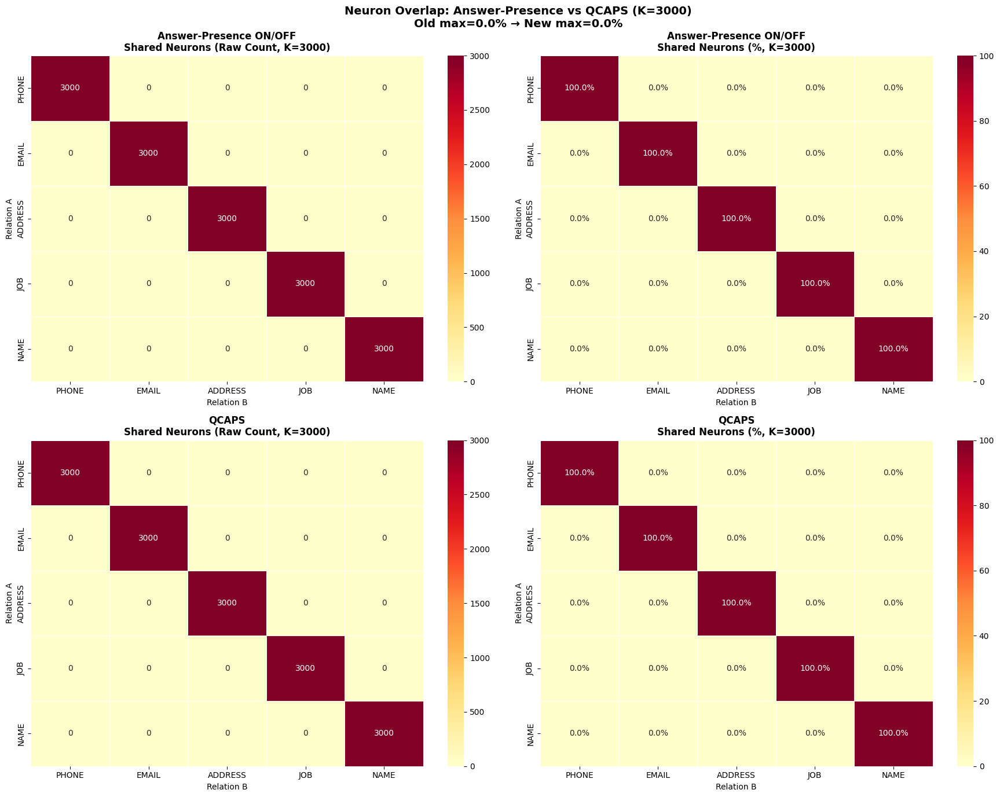


✅ Saved to: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/overlap_comparison_final.png


In [19]:
# ============================================================
# OVERLAP COMPARISON: Answer-Presence vs QCAPS
# ============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json, os
from collections import defaultdict

TARGET_RELATIONS = ['phone', 'email', 'address', 'job', 'name']
K = 3000  # same K for fair comparison

# ── Paths ─────────────────────────────────────────────────────
OLD_CSV = {
    'phone':   '/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_phone_test.csv',
    'email':   '/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_email_test.csv',
    'address': '/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_address_test.csv',
    'job':     '/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_job_test.csv',
    'name':    '/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_name_test.csv',
}

NEW_JSON_DIR = '/content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/neuron_results'

# ============================================================
# STEP 1 — Load OLD neurons (answer-presence)
# ============================================================

print("Loading OLD neurons (answer-presence)...")
print("=" * 55)

# Load all CSVs into one wide table for contrast filtering
old_dfs = {}
for rel in TARGET_RELATIONS:
    df = pd.read_csv(OLD_CSV[rel])
    df['layer_num'] = df['layer'].str.extract(
        r'(\d+)'
    ).astype(int)
    df = df.rename(columns={'ap': f'ap_{rel}'})
    df = df[['layer_num', 'unit',
             f'ap_{rel}',
             'on_p50', 'off_mean']].copy()
    old_dfs[rel] = df
    print(f"  ✅ [{rel:>10}]: {len(df)} neurons loaded")

# Merge all relations into wide table
W_old = old_dfs['phone'][['layer_num', 'unit',
                            'ap_phone']].copy()
for rel in ['email', 'address', 'job', 'name']:
    W_old = W_old.merge(
        old_dfs[rel][['layer_num', 'unit', f'ap_{rel}']],
        on=['layer_num', 'unit'],
        how='inner'
    )

print(f"\nWide table shape: {W_old.shape}")

# Apply contrast filtering + get top-K per relation
old_neuron_sets = {}
for target in TARGET_RELATIONS:
    other_cols = [f'ap_{r}' for r in TARGET_RELATIONS
                  if r != target]
    tgt_col    = f'ap_{target}'

    df = W_old.copy()
    df['other_max_ap'] = df[other_cols].max(axis=1)
    df['contrast_ap']  = df[tgt_col] - df['other_max_ap']

    # Keep exclusive neurons
    df = df[df['contrast_ap'] >= 0].copy()
    df = df.sort_values(
        'contrast_ap', ascending=False
    ).head(K)

    # Convert to set of (layer, unit) tuples
    old_neuron_sets[target] = set(
        zip(df['layer_num'].astype(int),
            df['unit'].astype(int))
    )
    print(f"  ✅ Old [{target:>10}]: "
          f"{len(old_neuron_sets[target])} exclusive neurons")

# ============================================================
# STEP 2 — Load NEW neurons (QCAPS)
# ============================================================

print("\nLoading NEW neurons (QCAPS)...")
print("=" * 55)

new_neuron_sets = {}
for rel in TARGET_RELATIONS:
    path = os.path.join(
        NEW_JSON_DIR, f'expert_neurons_{rel}.json'
    )
    with open(path) as f:
        data = json.load(f)

    # Take top-K by contrast score if available
    # otherwise just take first K
    new_neuron_sets[rel] = set(
        (n['layer'], n['neuron'])
        for n in data[:K]
    )
    print(f"  ✅ New [{rel:>10}]: "
          f"{len(new_neuron_sets[rel])} neurons")

# ============================================================
# STEP 3 — Compute overlap matrices
# ============================================================

def compute_overlap_matrix(neuron_sets, relations):
    n = len(relations)
    matrix_count = np.zeros((n, n), dtype=int)
    matrix_pct   = np.zeros((n, n))

    for i, r1 in enumerate(relations):
        for j, r2 in enumerate(relations):
            if i == j:
                matrix_count[i,j] = len(neuron_sets[r1])
                matrix_pct[i,j]   = 100.0
            else:
                overlap = len(
                    neuron_sets[r1] & neuron_sets[r2]
                )
                matrix_count[i,j] = overlap
                matrix_pct[i,j]   = (
                    overlap / len(neuron_sets[r1]) * 100
                    if len(neuron_sets[r1]) > 0 else 0
                )

    return matrix_count, matrix_pct

old_count, old_pct = compute_overlap_matrix(
    old_neuron_sets, TARGET_RELATIONS
)
new_count, new_pct = compute_overlap_matrix(
    new_neuron_sets, TARGET_RELATIONS
)

# ============================================================
# STEP 4 — Print key stats
# ============================================================

print("\n📊 OLD METHOD — Overlap stats:")
print("=" * 55)
for i, r1 in enumerate(TARGET_RELATIONS):
    for j, r2 in enumerate(TARGET_RELATIONS):
        if i != j:
            print(f"  {r1:>10} ↔ {r2:>10}: "
                  f"{old_count[i,j]:>5} neurons "
                  f"({old_pct[i,j]:.1f}%)")

print("\n📊 NEW METHOD (QCAPS) — Overlap stats:")
print("=" * 55)
for i, r1 in enumerate(TARGET_RELATIONS):
    for j, r2 in enumerate(TARGET_RELATIONS):
        if i != j:
            print(f"  {r1:>10} ↔ {r2:>10}: "
                  f"{new_count[i,j]:>5} neurons "
                  f"({new_pct[i,j]:.1f}%)")

# Summary
old_off_diag = [
    old_pct[i,j]
    for i in range(len(TARGET_RELATIONS))
    for j in range(len(TARGET_RELATIONS))
    if i != j
]
new_off_diag = [
    new_pct[i,j]
    for i in range(len(TARGET_RELATIONS))
    for j in range(len(TARGET_RELATIONS))
    if i != j
]

print("\n" + "=" * 55)
print("SUMMARY")
print("=" * 55)
print(f"Old max overlap  : {max(old_off_diag):.1f}%")
print(f"Old mean overlap : {np.mean(old_off_diag):.1f}%")
print(f"New max overlap  : {max(new_off_diag):.1f}%")
print(f"New mean overlap : {np.mean(new_off_diag):.1f}%")
print(f"Reduction factor : "
      f"{max(old_off_diag)/max(new_off_diag):.1f}x")

# ============================================================
# STEP 5 — Plot side by side
# ============================================================

fig, axes = plt.subplots(2, 2, figsize=(18, 14))
rel_labels = [r.upper() for r in TARGET_RELATIONS]

def plot_heatmap(matrix, annot_matrix, title, ax,
                 vmax=100, cmap='YlOrRd'):
    sns.heatmap(
        matrix,
        ax          = ax,
        annot       = annot_matrix,
        fmt         = '',
        xticklabels = rel_labels,
        yticklabels = rel_labels,
        cmap        = cmap,
        linewidths  = 0.5,
        vmin        = 0,
        vmax        = vmax
    )
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.set_xlabel('Relation B')
    ax.set_ylabel('Relation A')

# Old method — count
annot_old_count = np.array([
    [f"{old_count[i,j]}"
     for j in range(len(TARGET_RELATIONS))]
    for i in range(len(TARGET_RELATIONS))
])
plot_heatmap(
    old_count, annot_old_count,
    f'Answer-Presence ON/OFF\nShared Neurons (Raw Count, K={K})',
    axes[0,0], vmax=K
)

# Old method — percentage
annot_old_pct = np.array([
    [f"{old_pct[i,j]:.1f}%"
     for j in range(len(TARGET_RELATIONS))]
    for i in range(len(TARGET_RELATIONS))
])
plot_heatmap(
    old_pct, annot_old_pct,
    f'Answer-Presence ON/OFF\nShared Neurons (%, K={K})',
    axes[0,1]
)

# New method — count
annot_new_count = np.array([
    [f"{new_count[i,j]}"
     for j in range(len(TARGET_RELATIONS))]
    for i in range(len(TARGET_RELATIONS))
])
plot_heatmap(
    new_count, annot_new_count,
    f'QCAPS\nShared Neurons (Raw Count, K={K})',
    axes[1,0], vmax=K
)

# New method — percentage
annot_new_pct = np.array([
    [f"{new_pct[i,j]:.1f}%"
     for j in range(len(TARGET_RELATIONS))]
    for i in range(len(TARGET_RELATIONS))
])
plot_heatmap(
    new_pct, annot_new_pct,
    f'QCAPS\nShared Neurons (%, K={K})',
    axes[1,1]
)

plt.suptitle(
    f'Neuron Overlap: Answer-Presence vs QCAPS (K={K})\n'
    f'Old max={max(old_off_diag):.1f}% → '
    f'New max={max(new_off_diag):.1f}%',
    fontsize=14, fontweight='bold'
)
plt.tight_layout()

# Save
save_path = '/content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/overlap_comparison_final.png'
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()
print(f"\n✅ Saved to: {save_path}")

Loading OLD neurons (answer-presence, AP > 0.5 only)...
  ✅ Old [     phone]: 10000 neurons
  ✅ Old [     email]: 10000 neurons
  ✅ Old [   address]: 10000 neurons
  ✅ Old [       job]: 10000 neurons
  ✅ Old [      name]: 10000 neurons

Loading NEW neurons (QCAPS)...
  ✅ New [     phone]: 10000 neurons
  ✅ New [     email]: 10000 neurons
  ✅ New [   address]: 10000 neurons
  ✅ New [       job]: 10000 neurons
  ✅ New [      name]: 10000 neurons

📊 OLD METHOD (answer-presence) — Overlap:
       phone ↔      email:  4621 neurons (46.2%)
       phone ↔    address:  4606 neurons (46.1%)
       phone ↔        job:  3026 neurons (30.3%)
       phone ↔       name:  3273 neurons (32.7%)
       email ↔    address:  4087 neurons (40.9%)
       email ↔        job:  3257 neurons (32.6%)
       email ↔       name:  3188 neurons (31.9%)
     address ↔        job:  3348 neurons (33.5%)
     address ↔       name:  3170 neurons (31.7%)
         job ↔       name:  3518 neurons (35.2%)

📊 NEW METHOD (QCAP

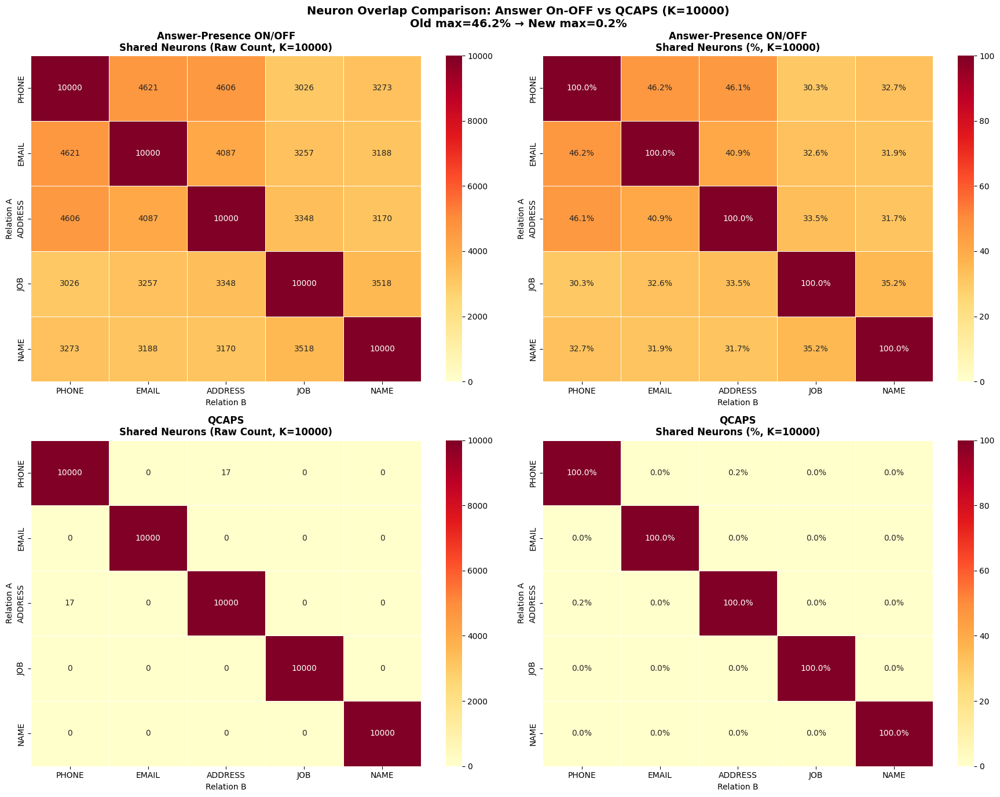


✅ Saved to: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/overlap_comparison_final.png


In [20]:
# ============================================================
# OVERLAP COMPARISON: Answer-Presence vs QCAPS
# Fixed version — no contrast filtering on old method
# ============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json, os

TARGET_RELATIONS = ['phone', 'email', 'address', 'job', 'name']
K = 10000

# ── Paths ─────────────────────────────────────────────────────
OLD_CSV = {
    'phone':   '/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_phone_test.csv',
    'email':   '/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_email_test.csv',
    'address': '/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_address_test.csv',
    'job':     '/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_job_test.csv',
    'name':    '/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_name_test.csv',
}

NEW_JSON_DIR = '/content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/neuron_results'

# ============================================================
# STEP 1 — Load OLD neurons (answer-presence, AP > 0.5 only)
# NO contrast filtering — this is what naive methods produce
# ============================================================

print("Loading OLD neurons (answer-presence, AP > 0.5 only)...")
print("=" * 55)

old_neuron_sets = {}
for rel in TARGET_RELATIONS:
    df = pd.read_csv(OLD_CSV[rel])
    df['layer_num'] = df['layer'].str.extract(
        r'(\d+)'
    ).astype(int)

    # AP > 0.5 threshold only — NO contrast filtering
    df = df[df['ap'] > 0.5].copy()
    df = df.sort_values('ap', ascending=False).head(K)

    old_neuron_sets[rel] = set(
        zip(
            df['layer_num'].astype(int),
            df['unit'].astype(int)
        )
    )
    print(f"  ✅ Old [{rel:>10}]: "
          f"{len(old_neuron_sets[rel])} neurons")

# ============================================================
# STEP 2 — Load NEW neurons (QCAPS, already filtered)
# ============================================================

print("\nLoading NEW neurons (QCAPS)...")
print("=" * 55)

new_neuron_sets = {}
for rel in TARGET_RELATIONS:
    path = os.path.join(
        NEW_JSON_DIR, f'expert_neurons_{rel}.json'
    )
    with open(path) as f:
        data = json.load(f)

    new_neuron_sets[rel] = set(
        (n['layer'], n['neuron'])
        for n in data[:K]
    )
    print(f"  ✅ New [{rel:>10}]: "
          f"{len(new_neuron_sets[rel])} neurons")

# ============================================================
# STEP 3 — Compute overlap matrices
# ============================================================

def compute_overlap_matrix(neuron_sets, relations):
    n = len(relations)
    matrix_count = np.zeros((n, n), dtype=int)
    matrix_pct   = np.zeros((n, n))

    for i, r1 in enumerate(relations):
        for j, r2 in enumerate(relations):
            if i == j:
                matrix_count[i,j] = len(neuron_sets[r1])
                matrix_pct[i,j]   = 100.0
            else:
                overlap = len(
                    neuron_sets[r1] & neuron_sets[r2]
                )
                matrix_count[i,j] = overlap
                matrix_pct[i,j]   = (
                    overlap / len(neuron_sets[r1]) * 100
                    if len(neuron_sets[r1]) > 0 else 0
                )

    return matrix_count, matrix_pct

old_count, old_pct = compute_overlap_matrix(
    old_neuron_sets, TARGET_RELATIONS
)
new_count, new_pct = compute_overlap_matrix(
    new_neuron_sets, TARGET_RELATIONS
)

# ============================================================
# STEP 4 — Print stats
# ============================================================

print("\n📊 OLD METHOD (answer-presence) — Overlap:")
print("=" * 55)
for i, r1 in enumerate(TARGET_RELATIONS):
    for j, r2 in enumerate(TARGET_RELATIONS):
        if i < j:
            print(f"  {r1:>10} ↔ {r2:>10}: "
                  f"{old_count[i,j]:>5} neurons "
                  f"({old_pct[i,j]:.1f}%)")

print("\n📊 NEW METHOD (QCAPS) — Overlap:")
print("=" * 55)
for i, r1 in enumerate(TARGET_RELATIONS):
    for j, r2 in enumerate(TARGET_RELATIONS):
        if i < j:
            print(f"  {r1:>10} ↔ {r2:>10}: "
                  f"{new_count[i,j]:>5} neurons "
                  f"({new_pct[i,j]:.1f}%)")

# Summary
old_off_diag = [
    old_pct[i,j]
    for i in range(len(TARGET_RELATIONS))
    for j in range(len(TARGET_RELATIONS))
    if i != j
]
new_off_diag = [
    new_pct[i,j]
    for i in range(len(TARGET_RELATIONS))
    for j in range(len(TARGET_RELATIONS))
    if i != j
]

print("\n" + "=" * 55)
print("SUMMARY")
print("=" * 55)
print(f"Old max overlap  : {max(old_off_diag):.1f}%")
print(f"Old mean overlap : {np.mean(old_off_diag):.1f}%")
print(f"New max overlap  : {max(new_off_diag):.1f}%")
print(f"New mean overlap : {np.mean(new_off_diag):.1f}%")
if max(new_off_diag) > 0:
    print(f"Reduction factor : "
          f"{max(old_off_diag)/max(new_off_diag):.1f}x")
else:
    print(f"Reduction factor : "
          f"Complete elimination of overlap")

# ============================================================
# STEP 5 — Plot side by side
# ============================================================

fig, axes = plt.subplots(2, 2, figsize=(18, 14))
rel_labels = [r.upper() for r in TARGET_RELATIONS]

def plot_heatmap(matrix, annot_matrix, title, ax,
                 vmax=100, cmap='YlOrRd'):
    sns.heatmap(
        matrix,
        ax          = ax,
        annot       = annot_matrix,
        fmt         = '',
        xticklabels = rel_labels,
        yticklabels = rel_labels,
        cmap        = cmap,
        linewidths  = 0.5,
        vmin        = 0,
        vmax        = vmax
    )
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.set_xlabel('Relation B')
    ax.set_ylabel('Relation A')

# Old method — count
annot_old_count = np.array([
    [f"{old_count[i,j]}"
     for j in range(len(TARGET_RELATIONS))]
    for i in range(len(TARGET_RELATIONS))
])
plot_heatmap(
    old_count, annot_old_count,
    f'Answer-Presence ON/OFF\n'
    f'Shared Neurons (Raw Count, K={K})',
    axes[0,0], vmax=K
)

# Old method — percentage
annot_old_pct = np.array([
    [f"{old_pct[i,j]:.1f}%"
     for j in range(len(TARGET_RELATIONS))]
    for i in range(len(TARGET_RELATIONS))
])
plot_heatmap(
    old_pct, annot_old_pct,
    f'Answer-Presence ON/OFF\n'
    f'Shared Neurons (%, K={K})',
    axes[0,1]
)

# New method — count
annot_new_count = np.array([
    [f"{new_count[i,j]}"
     for j in range(len(TARGET_RELATIONS))]
    for i in range(len(TARGET_RELATIONS))
])
plot_heatmap(
    new_count, annot_new_count,
    f'QCAPS\n'
    f'Shared Neurons (Raw Count, K={K})',
    axes[1,0], vmax=K
)

# New method — percentage
annot_new_pct = np.array([
    [f"{new_pct[i,j]:.1f}%"
     for j in range(len(TARGET_RELATIONS))]
    for i in range(len(TARGET_RELATIONS))
])
plot_heatmap(
    new_pct, annot_new_pct,
    f'QCAPS\n'
    f'Shared Neurons (%, K={K})',
    axes[1,1]
)

plt.suptitle(
    f'Neuron Overlap Comparison: '
    f'Answer On-OFF vs QCAPS (K={K})\n'
    f'Old max={max(old_off_diag):.1f}% → '
    f'New max={max(new_off_diag):.1f}%',
    fontsize=14, fontweight='bold'
)
plt.tight_layout()

save_path = (
    '/content/drive/MyDrive/PII_specific_neurons/'
    'LLAMA_Again/overlap_comparison_final.png'
)
plt.savefig(save_path, dpi=600, bbox_inches='tight')
plt.show()
print(f"\n✅ Saved to: {save_path}")

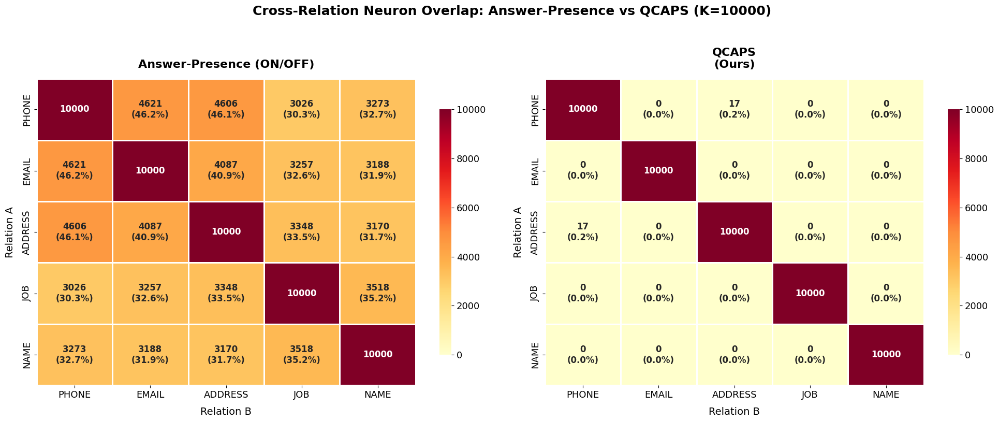

✅ PDF saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/overlap_comparison_final.pdf
✅ PNG saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/overlap_comparison_final.png


In [21]:
import matplotlib
matplotlib.rcParams.update({
    'font.size':        14,
    'axes.titlesize':   15,
    'axes.labelsize':   14,
    'xtick.labelsize':  13,
    'ytick.labelsize':  13,
})

fig, axes = plt.subplots(1, 2, figsize=(20, 8))
rel_labels = [r.upper() for r in TARGET_RELATIONS]

def plot_heatmap_final(matrix, annot_matrix, title, ax,
                       vmax=100, cmap='YlOrRd',
                       annot_fontsize=13):
    sns.heatmap(
        matrix,
        ax           = ax,
        annot        = annot_matrix,
        fmt          = '',
        xticklabels  = rel_labels,
        yticklabels  = rel_labels,
        cmap         = cmap,
        linewidths   = 0.8,
        linecolor    = 'white',
        vmin         = 0,
        vmax         = vmax,
        annot_kws    = {'size': annot_fontsize,
                        'weight': 'bold'},
        cbar_kws     = {'shrink': 0.8}
    )
    ax.set_title(title, fontsize=16,
                 fontweight='bold', pad=15)
    ax.set_xlabel('Relation B', fontsize=14,
                  labelpad=10)
    ax.set_ylabel('Relation A', fontsize=14,
                  labelpad=10)
    ax.tick_params(axis='both', labelsize=13)

# ── Left panel — Answer-presence ─────────────────────────────
annot_old = np.array([
    [f"{old_count[i,j]}\n({old_pct[i,j]:.1f}%)"
     if i != j else f"{old_count[i,j]}"
     for j in range(len(TARGET_RELATIONS))]
    for i in range(len(TARGET_RELATIONS))
])
plot_heatmap_final(
    old_count, annot_old,
    'Answer-Presence (ON/OFF)',
    axes[0], vmax=K, annot_fontsize=12
)

# ── Right panel — QCAPS ──────────────────────────────────────
annot_new = np.array([
    [f"{new_count[i,j]}\n({new_pct[i,j]:.1f}%)"
     if i != j else f"{new_count[i,j]}"
     for j in range(len(TARGET_RELATIONS))]
    for i in range(len(TARGET_RELATIONS))
])
plot_heatmap_final(
    new_count, annot_new,
    'QCAPS\n(Ours)',
    axes[1], vmax=K, annot_fontsize=12
)

# ── Title ─────────────────────────────────────────────────────
plt.suptitle(
    f'Cross-Relation Neuron Overlap: '
    f'Answer-Presence vs QCAPS (K={K})',
    fontsize=18, fontweight='bold', y=1.02
)

plt.tight_layout()

# ── Save as PDF ───────────────────────────────────────────────
save_dir  = '/content/drive/MyDrive/PII_specific_neurons/LLAMA_Again'
save_pdf  = f'{save_dir}/overlap_comparison_final.pdf'
save_png  = f'{save_dir}/overlap_comparison_final.png'

plt.savefig(
    save_pdf,
    format      = 'pdf',
    dpi         = 300,
    bbox_inches = 'tight'
)
plt.savefig(
    save_png,
    format      = 'png',
    dpi         = 300,
    bbox_inches = 'tight'
)
plt.show()

print(f"✅ PDF saved: {save_pdf}")
print(f"✅ PNG saved: {save_png}")


In [22]:

new_neuron_sets = {}
for rel in TARGET_RELATIONS:
    path = os.path.join(NEW_JSON_DIR, f'expert_neurons_{rel}.json')
    with open(path) as f:
        data = json.load(f)

    new_neuron_sets[rel] = set(
        (n['layer'], n['neuron'])
        for n in data  # ← removed [:K]
    )
    print(f"  ✅ New [{rel:>10}]: {len(new_neuron_sets[rel])} neurons")

# ── Bridge: point Figure 3 variables to new_neuron_sets ──────
relations   = TARGET_RELATIONS  # ['phone', 'email', 'address', 'job', 'name']
neuron_sets = new_neuron_sets   # or old_neuron_sets if you want the old method
n_rel       = len(relations)

  ✅ New [     phone]: 28094 neurons
  ✅ New [     email]: 18466 neurons
  ✅ New [   address]: 13276 neurons
  ✅ New [       job]: 31806 neurons
  ✅ New [      name]: 18882 neurons


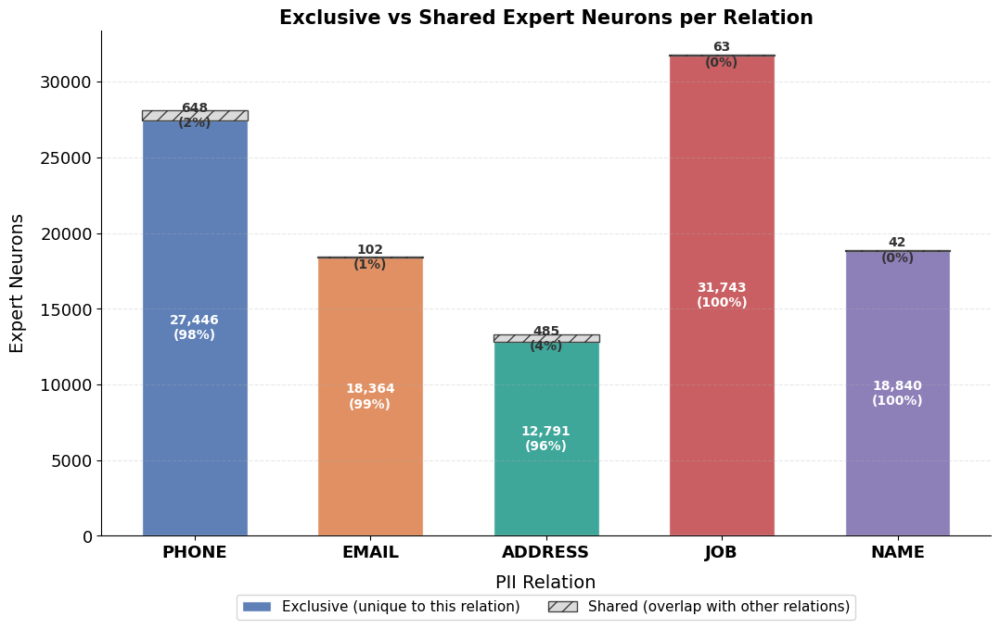

✅ Figure 3 saved as PDF and PNG

EXCLUSIVITY SUMMARY
  Relation |    Total |  Exclusive |   Shared |  Excl%
-------------------------------------------------------
     phone |   28,094 |     27,446 |      648 |  97.7%
     email |   18,466 |     18,364 |      102 |  99.4%
   address |   13,276 |     12,791 |      485 |  96.3%
       job |   31,806 |     31,743 |       63 |  99.8%
      name |   18,882 |     18,840 |       42 |  99.8%


In [23]:

# ============================================================
# FIGURE 3 — Exclusive vs Shared — Large fonts + PDF save
# ============================================================

import matplotlib
matplotlib.rcParams.update({
    'font.size':        14,
    'axes.titlesize':   15,
    'axes.labelsize':   14,
    'xtick.labelsize':  13,
    'ytick.labelsize':  13,
})

# ── Define colors ─────────────────────────────────────────────
FIELD_COLORS = {
    'email':   '#DD8452',
    'phone':   '#4C72B0',
    'address': '#2A9D8F',
    'job':     '#C44E52',
    'name':    '#8172B2',
}

# ── Compute exclusive vs shared ───────────────────────────────
exclusive_counts = []
shared_counts    = []

for i, rel_i in enumerate(relations):
    own_set    = neuron_sets[rel_i]
    other_sets = [neuron_sets[r] for r in relations
                  if r != rel_i]
    all_others = set().union(*other_sets)
    exclusive  = len(own_set - all_others)
    shared     = len(own_set & all_others)
    exclusive_counts.append(exclusive)
    shared_counts.append(shared)

# ── Plot ──────────────────────────────────────────────────────
fig3, ax3 = plt.subplots(figsize=(11, 7))

x     = np.arange(n_rel)
width = 0.6

p1 = ax3.bar(
    x, exclusive_counts, width,
    label     = 'Exclusive (unique to this relation)',
    color     = [FIELD_COLORS[r] for r in relations],
    alpha     = 0.9,
    edgecolor = 'white'
)
p2 = ax3.bar(
    x, shared_counts, width,
    bottom    = exclusive_counts,
    label     = 'Shared (overlap with other relations)',
    color     = '#CCCCCC',
    alpha     = 0.7,
    edgecolor = 'black',
    hatch     = '//'
)

# ── Labels ────────────────────────────────────────────────────
for i, (exc, shr) in enumerate(
    zip(exclusive_counts, shared_counts)
):
    total = exc + shr
    ax3.text(
        i, exc / 2,
        f'{exc:,}\n({exc/total*100:.0f}%)',
        ha='center', va='center',
        fontsize=10, fontweight='bold', color='white'
    )
    if shr > 0:
        ax3.text(
            i, exc + shr / 2,
            f'{shr:,}\n({shr/total*100:.0f}%)',
            ha='center', va='center',
            fontsize=10, fontweight='bold', color='#333'
        )

ax3.set_xticks(x)
ax3.set_xticklabels(
    [r.upper() for r in relations],
    fontsize=13, fontweight='bold'
)
ax3.set_xlabel('PII Relation', fontsize=14, labelpad=10)
ax3.set_ylabel('Expert Neurons', fontsize=14, labelpad=10)
ax3.set_title(
    'Exclusive vs Shared Expert Neurons per Relation',
    fontsize=15, fontweight='bold', pad=5
)
ax3.legend(
    fontsize    = 11,
    loc         = 'lower center',
    bbox_to_anchor = (0.5, -0.18),  # below the plot
    ncol        = 2,                # two columns side by side
    frameon     = True,
    edgecolor   = '#CCCCCC'
)

ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)
ax3.grid(axis='y', alpha=0.3, linestyle='--')

plt.tight_layout()
# ── Save ──────────────────────────────────────────────────────
SAVE_DIR = '/content/drive/MyDrive/PII_specific_neurons/LLAMA_Again'

plt.savefig(
    f'{SAVE_DIR}/figure3_exclusive_shared.pdf',
    format='pdf', dpi=300, bbox_inches='tight'
)
plt.savefig(
    f'{SAVE_DIR}/figure3_exclusive_shared.png',
    format='png', dpi=300, bbox_inches='tight'
)
plt.show()
print("✅ Figure 3 saved as PDF and PNG")

# ── Summary ───────────────────────────────────────────────────
print('\n' + '=' * 55)
print('EXCLUSIVITY SUMMARY')
print('=' * 55)
print(f'{"Relation":>10} | {"Total":>8} | '
      f'{"Exclusive":>10} | {"Shared":>8} | {"Excl%":>6}')
print('-' * 55)
for i, relation in enumerate(relations):
    total = exclusive_counts[i] + shared_counts[i]
    print(f'{relation:>10} | {total:>8,} | '
          f'{exclusive_counts[i]:>10,} | '
          f'{shared_counts[i]:>8,} | '
          f'{exclusive_counts[i]/total*100:>5.1f}%')
print('=' * 55)

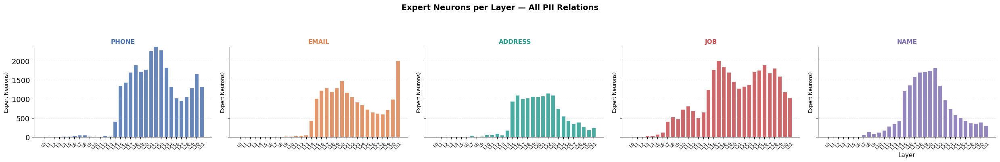

Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/neuron_results/expert_neurons_all_relations.pdf


In [24]:
# ============================================================
# PLOT EXPERT NEURONS PER LAYER — ALL RELATIONS
# ============================================================

import matplotlib.pyplot as plt
import numpy as np
import os

FIELD_COLORS = {
    'email':   '#DD8452',
    'phone':   '#4C72B0',
    'address': '#2A9D8F',
    'job':     '#C44E52',
    'name':    '#8172B2',
}

fig, axes = plt.subplots(
    1, len(TARGET_RELATIONS),
    figsize=(5 * len(TARGET_RELATIONS), 4),
    sharey=True
)

for ax, relation in zip(axes, TARGET_RELATIONS):
    if relation not in all_ap_scores:
        ax.set_title(f'[{relation}] — NOT LOADED', fontsize=12)
        continue

    counts = [(all_ap_scores[relation][l] > 0.5).sum()
              for l in range(N_LAYERS)]
    color  = FIELD_COLORS.get(relation, '#888888')
    x      = range(N_LAYERS)

    bars = ax.bar(
        x, counts,
        color     = color,
        alpha     = 0.85,
        edgecolor = 'white',
        linewidth = 0.8
    )

    # # Value labels on bars
    # for bar, c in zip(bars, counts):
    #     if c > 0:
    #         ax.text(
    #             bar.get_x() + bar.get_width() / 2,
    #             bar.get_height() + 0.5,
    #             str(c),
    #             ha='center', va='bottom',
    #             fontsize=7, fontweight='bold'
    #         )

    # # Best layer marker
    # best_l = max(range(N_LAYERS),
    #              key=lambda l: all_ap_scores[relation][l].max())
    # best_ap = all_ap_scores[relation][best_l].max()
    # ax.axvline(x=best_l, color='black',
    #            linestyle='--', linewidth=1.2, alpha=0.6)
    # ax.text(best_l + 0.2,
    #         max(counts) * 0.85,
    #         f'Best AP={best_ap:.3f}\nL{best_l}',
    #         fontsize=8, color='black', alpha=0.8)

    # Total expert neurons
    total = sum(counts)
    ax.set_title(
        f'{relation.upper()}',
        fontsize=11, fontweight='bold', color=color
    )
    ax.set_ylabel('Expert Neurons)', fontsize=9)
    ax.set_ylim(0, max(counts) * 1.3 + 1)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(axis='y', alpha=0.3, linestyle='--')

axes[-1].set_xlabel('Layer', fontsize=11)


for ax in axes:
    ax.set_xticks(range(N_LAYERS))
    ax.set_xticklabels([f'L{l}' for l in range(N_LAYERS)], rotation=45, fontsize=8)

fig.suptitle(
    'Expert Neurons per Layer — All PII Relations\n',
    fontsize=14, fontweight='bold', y=1.01
)
plt.tight_layout()

# Save
fname     = 'expert_neurons_all_relations.pdf'
save_path = os.path.join(DRIVE_SAVE_DIR, fname)
plt.savefig(save_path, dpi=600, bbox_inches='tight')
plt.show()
print(f'Saved: {save_path}')

# # ── Comparison bar chart — total neurons per relation ─────────
# fig2, ax2 = plt.subplots(figsize=(8, 5))

# totals    = [sum((all_ap_scores[r][l] > 0.5).sum()
#                  for l in range(N_LAYERS))
#              for r in TARGET_RELATIONS]
# colors    = [FIELD_COLORS[r] for r in TARGET_RELATIONS]

# bars2 = ax2.bar(
#     TARGET_RELATIONS, totals,
#     color     = colors,
#     alpha     = 0.85,
#     edgecolor = 'white',
#     linewidth = 1.2,
#     width     = 0.6
# )
# for bar, total in zip(bars2, totals):
#     ax2.text(
#         bar.get_x() + bar.get_width() / 2,
#         bar.get_height() + 50,
#         f'{total:,}',
#         ha='center', va='bottom',
#         fontsize=11, fontweight='bold'
#     )

# ax2.set_title(
#     'Total Expert Neurons per PII Relation\n'
#     '(AP > 0.5 | LLaMA)',
#     fontsize=13, fontweight='bold'
# )
# ax2.set_xlabel('PII Relation', fontsize=11)
# ax2.set_ylabel('Total Expert Neurons', fontsize=11)
# ax2.spines['top'].set_visible(False)
# ax2.spines['right'].set_visible(False)
# ax2.grid(axis='y', alpha=0.3, linestyle='--')
# plt.tight_layout()

# fname2     = 'expert_neurons_totals_comparison.png'
# save_path2 = os.path.join(DRIVE_SAVE_DIR, fname2)
# plt.savefig(save_path2, dpi=150, bbox_inches='tight')
# plt.show()
# print(f'Saved: {save_path2}')

# # ── Print summary table ───────────────────────────────────────
# print('\n' + '=' * 65)
# print(f'{"Relation":>10} | {"Total":>8} | '
#       f'{"Best AP":>8} | {"Best L":>7} | '
#       f'{"Peak Layer Count":>16}')
# print('-' * 65)
# for relation in TARGET_RELATIONS:
#     if relation not in all_ap_scores:
#         print(f'{relation:>10} | {"—":>8} | {"—":>8} | {"—":>7} | {"—":>16}')
#         continue
#     counts  = [(all_ap_scores[relation][l] > 0.5).sum()
#                for l in range(N_LAYERS)]
#     total   = sum(counts)
#     best_l  = max(range(N_LAYERS),
#                   key=lambda l: all_ap_scores[relation][l].max())
#     best_ap = all_ap_scores[relation][best_l].max()
#     peak_l  = counts.index(max(counts))
#     peak_c  = max(counts)
#     print(f'{relation:>10} | {total:>8,} | '
#           f'{best_ap:>8.4f} | L{best_l:>5} | '
#           f'L{peak_l} = {peak_c:>5} neurons')
# print('=' * 65)
# ```

# This produces two plots:
# ```
# Plot 1 — one bar chart per relation (5 subplots stacked)
#          shows neuron count per layer
#          marks best AP layer with dashed line

# Plot 2 — single comparison bar chart
#          total expert neurons across all relations
#          side by side for easy comparison

#on-off vs QCAPS

#QCAPS

In [25]:
import re

CTX_RE = re.compile(r"### Context:\n(.*?)\n\n### Question:\n", re.S)
Q_RE   = re.compile(r"### Question:\n(.*?)\n\n### Instruction:\n", re.S)

def parse_context_question(user_text: str):
    ctx_m = CTX_RE.search(user_text)
    q_m   = Q_RE.search(user_text)
    if not (ctx_m and q_m):
        return None, None
    return ctx_m.group(1), q_m.group(1).strip()

def replace_context_in_user(user_text: str, new_context: str):
    pattern = r"(### Context:\n).*?(\n\n### Question:\n)"
    return re.sub(
        pattern,
        lambda m: m.group(1) + new_context + m.group(2),
        user_text,
        flags=re.S
    )

def remove_once(haystack: str, needle: str):
    if not needle or needle.strip() == "N/A":
        return haystack
    idx = haystack.find(needle)
    if idx == -1:
        return haystack
    return haystack[:idx] + haystack[idx + len(needle):]

def detect_relation_from_question(question: str):
    q = question.lower()
    if "email" in q:
        return "email"
    if "phone" in q:
        return "phone"
    if "address" in q:
        return "address"
    if "job" in q:
        return "job"
    if "full name" in q or "person's full name" in q or "person full name" in q:
        return "name"
    return None

display(ds['test'])

# ── Count test examples per relation ─────────────────────────
from collections import Counter

CONV_KEY    = 'conversations'  # confirmed from your data
test_counts = Counter()

for i in range(len(ds['test'])):
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel = detect_relation_from_question(question)
    if rel:
        test_counts[rel] += 1
    else:
        test_counts['other'] += 1

print(f'Test split: {len(ds["test"])} total examples')
print(f'\nPer relation:')
for rel, count in test_counts.most_common():
    print(f'  {rel:>10}: {count:>6} examples '
          f'({count/len(ds["test"])*100:.1f}%)')
print(f'\n  {"TOTAL":>10}: {sum(test_counts.values()):>6}')

# Run this first if you get NameError on anything
TARGET_RELATIONS = ['email', 'phone', 'address', 'job', 'name']
QUESTION_TEMPLATES = {
    'email':   'What is the email address?',
    'phone':   'What is the phone number?',
    'address': 'What is the address?',
    'job':     'What is the job title?',
    'name':    "What is the person's full name?",
}
MAX_LENGTH = 1024
CONV_KEY   = 'messages'

print('Variables defined!')
print(f'TARGET_RELATIONS : {TARGET_RELATIONS}')
print(f'CONV_KEY         : {CONV_KEY}')

Dataset({
    features: ['conversations'],
    num_rows: 4274
})

Test split: 4274 total examples

Per relation:
        name:    992 examples (23.2%)
       email:    963 examples (22.5%)
         job:    906 examples (21.2%)
     address:    848 examples (19.8%)
       phone:    565 examples (13.2%)

       TOTAL:   4274
Variables defined!
TARGET_RELATIONS : ['email', 'phone', 'address', 'job', 'name']
CONV_KEY         : messages


In [26]:

# ============================================================
# SUPPRESSION PIPELINE — LLAMA CONTEXT-BASED EXTRACTION
# ============================================================

import torch
import numpy as np
from collections import defaultdict
from copy import deepcopy
import re

CONV_KEY = 'conversations'
DEVICE   = 'cuda'

# ── NeuronForcer — LLaMA version ──────────────────────────────
class NeuronForcer:
    def __init__(self, model):
        self.model  = model
        self._hooks = []

    def force(self, neurons, only_last_token=False):
        self.remove()
        by_layer = defaultdict(list)
        for n in neurons:
            by_layer[n['layer']].append(n)

        for layer_idx, layer_neurons in by_layer.items():
            neuron_idxs = torch.tensor(
                [n['neuron']   for n in layer_neurons],
                dtype=torch.long
            )
            force_vals = torch.tensor(
                [n['off_mean'] for n in layer_neurons],
                dtype=torch.float32
            )
            def make_hook(idxs, vals, last_only):
                def hook_fn(module, input, output):
                    if last_only:
                        output[:, -1, idxs] = vals.to(
                            output.device, dtype=output.dtype)
                    else:
                        output[:, :, idxs] = vals.to(
                            output.device, dtype=output.dtype)
                    return output
                return hook_fn
            hook = model.model.layers[layer_idx].mlp.act_fn\
                .register_forward_hook(
                    make_hook(neuron_idxs, force_vals,
                              only_last_token)
                )
            self._hooks.append(hook)

    def remove(self):
        for h in self._hooks:
            h.remove()
        self._hooks.clear()

forcer = NeuronForcer(model)

In [27]:

# ── Generate answer from full conversation ────────────────────
def predict_from_conv(conversations, max_new_tokens=32):
    """
    Strip assistant turn, run model, return prediction.
    """
    conv = [m for m in conversations
            if m.get('role') != 'assistant']
    prompt = tokenizer.apply_chat_template(
        conv, tokenize=False, add_generation_prompt=True
    )
    inputs = tokenizer(
        prompt, return_tensors='pt',
        truncation=True, max_length=MAX_LENGTH
    ).to(DEVICE)

    with torch.no_grad():
        out = model.generate(
            **inputs,
            max_new_tokens = max_new_tokens,
            do_sample      = False,
            temperature    = None,
            top_p          = None,
            use_cache      = True,
        )
    gen = out[0, inputs['input_ids'].shape[1]:]
    return tokenizer.decode(gen, skip_special_tokens=True).strip()

def replace_question_conv(conversations, new_question):
    """
    Replace question in user message of a conversation.
    """
    conv = deepcopy(conversations)
    for m in conv:
        if m.get('role') == 'user':
            m['content'] = replace_question_in_user(
                m['content'], new_question
            )
            break
    return conv


In [28]:


# ── Scale neurons ─────────────────────────────────────────────
def scale_neurons(neuron_list, K, scale):
    neurons = neuron_list[:K]
    scaled  = []
    for n in neurons:
        gap = n['on_p50'] - n['off_mean']
        scaled.append({
            'layer':    n['layer'],
            'neuron':   n['neuron'],
            'off_mean': n['off_mean'] - (scale - 1) * gap
        })
    return scaled

# ── CELL 1: Single example scale sweep ───────────────────────
def run_single_sweep(target_relation,
                     scales=[1,2,3,5,7,10,15,20],
                     K=500):
    """
    Test scale sweep on ONE example from test set.
    Shows effect on target + all other relations.
    """
    print('=' * 70)
    print(f'SINGLE EXAMPLE SCALE SWEEP — Target: {target_relation.upper()}')
    print('=' * 70)

    # Find one test example for target relation
    sample_conv  = None
    sample_gold  = None
    for i in range(len(ds['test'])):
        ex   = ds['test'][i]
        conv = ex[CONV_KEY]
        user_msg = next(
            (m['content'] for m in conv if m['role'] == 'user'), ''
        )
        _, question = parse_context_question(user_msg)
        rel = detect_relation_from_question(question)
        if rel == target_relation:
            gold = next(
                (m['content'] for m in conv
                 if m['role'] == 'assistant'), ''
            ).strip()
            if gold and gold != 'N/A':
                sample_conv = conv
                sample_gold = gold
                break

    if sample_conv is None:
        print(f'No test example found for {target_relation}')
        return

    print(f'\nGold {target_relation}: {sample_gold}')

    # Get gold values for all other relations
    # by swapping question in same context
    other_rels  = [r for r in TARGET_RELATIONS
                   if r != target_relation]
    other_golds = {}
    for rel in other_rels:
        swapped_conv = replace_question_conv(
            sample_conv, QUESTION_TEMPLATES[rel]
        )
        pred = predict_from_conv(swapped_conv)
        other_golds[rel] = pred
        print(f'Gold {rel:>10}: {pred}')

    neurons = all_expert_neurons[target_relation]
    K_use   = min(K, len(neurons))
    print(f'\nUsing K={K_use} expert neurons')
    print(f'\n{"Scale":>7} | {target_relation:>20} | ' +
          ' | '.join(f'{r:>12}' for r in other_rels))
    print('-' * 80)

    # Baseline
    baseline = predict_from_conv(sample_conv)
    tgt_ok   = '✅' if baseline.lower() == sample_gold.lower() \
               else '❌'
    oth_str  = ' | '.join(
        f'{"✅":>12}' if predict_from_conv(
            replace_question_conv(sample_conv,
                                  QUESTION_TEMPLATES[r])
        ).lower() == other_golds[r].lower()
        else f'{"❌":>12}'
        for r in other_rels
    )
    print(f'{"base":>7} | {baseline[:20]:>20} | {oth_str}')

    # Scale sweep
    for scale in scales:
        scaled = scale_neurons(neurons, K_use, scale)
        forcer.force(scaled, only_last_token=False)

        # Target prediction
        tgt_pred = predict_from_conv(sample_conv)

        # Other relation predictions
        other_preds = {}
        for rel in other_rels:
            swapped = replace_question_conv(
                sample_conv, QUESTION_TEMPLATES[rel]
            )
            other_preds[rel] = predict_from_conv(swapped)

        forcer.remove()

        forgotten  = tgt_pred.lower() != sample_gold.lower()
        tgt_disp   = '❌ GONE' if forgotten else tgt_pred[:20]

        oth_str = ' | '.join(
            f'{"✅":>12}'
            if other_preds[r].lower() == other_golds[r].lower()
            else f'{"⚠️ DAMAGED":>12}'
            for r in other_rels
        )
        print(f'{scale:>7} | {tgt_disp:>20} | {oth_str}')

    forcer.remove()
    print(f'\nLooking for: {target_relation}=❌ GONE | '
          f'all others=✅')



In [29]:
import pandas as pd
import json, os

# ── OLD method neurons ────────────────────────────────────────
print("Loading OLD neurons (answer-presence)...")
old_df = pd.read_csv(OLD_CSV['phone'])
old_df['layer_num'] = old_df['layer'].str.extract(r'(\d+)').astype(int)
old_df = old_df[old_df['ap'] > 0.5].sort_values('ap', ascending=False)

old_neurons_phone = [
    {
        'layer':    int(row['layer_num']),
        'neuron':   int(row['unit']),
        'on_p50':   float(row['on_p50']),
        'off_mean': float(row['off_mean']),
        'ap':       float(row['ap']),
    }
    for _, row in old_df.iterrows()
    if int(row['layer_num']) < model.config.num_hidden_layers
]
print(f"  Old neurons: {len(old_neurons_phone)}")

# ── NEW method neurons ────────────────────────────────────────
print("Loading NEW neurons...")
with open(os.path.join(NEW_JSON_DIR, 'expert_neurons_phone.json')) as f:
    new_neurons_phone = json.load(f)
print(f"  New neurons: {len(new_neurons_phone)}")

Loading OLD neurons (answer-presence)...
  Old neurons: 67464
Loading NEW neurons...
  New neurons: 28094


#QCAPS (testing)

In [30]:
old_neurons_phone = [
    {
        'layer':    int(row['layer_num']),
        'neuron':   int(row['unit']),
        'on_p50':   row['on_p50'],
        'off_mean': row['off_mean'],
    }
    for _, row in old_dfs['phone'].iterrows()
]

In [31]:
old_neurons_phone = [n for n in old_neurons_phone if n['layer'] <= 31]
print(f"Old neurons max layer after filter: {max(n['layer'] for n in old_neurons_phone)}")
print(f"Old neurons count: {len(old_neurons_phone)}")

Old neurons max layer after filter: 31
Old neurons count: 131072


In [32]:
def parse_context_question(user_msg):
    if "### Question:" in user_msg:
        parts    = user_msg.split("### Question:")
        context  = parts[0].strip()
        question = parts[1].split("### Instruction:")[0].strip()
    else:
        context  = ""
        question = user_msg.strip()
    return context, question


def detect_relation_from_question(question):
    q = question.lower()
    if "email" in q:
        return "email"
    if "phone" in q:
        return "phone"
    if "address" in q:
        return "address"
    if "job" in q or "title" in q:
        return "job"
    if "full name" in q or "person's name" in q:
        return "name"
    return None


def replace_question_in_user(user_msg, new_question):
    if "### Question:" in user_msg:
        parts = user_msg.split("### Question:")
        rest  = parts[1]
        if "### Instruction:" in rest:
            instruction_part = "### Instruction:" + \
                               rest.split("### Instruction:")[1]
        else:
            instruction_part = ""
        return (parts[0] +
                "### Question: " + new_question +
                "\n" + instruction_part).strip()
    return user_msg


def replace_question_conv(conversations, new_question):
    conv = deepcopy(conversations)
    for m in conv:
        if m.get('role') == 'user':
            m['content'] = replace_question_in_user(
                m['content'], new_question
            )
            break
    return conv

print("✅ Helper functions defined!")

✅ Helper functions defined!


In [33]:
# ── CELL 1: Single example scale sweep ───────────────────────
def run_single_sweep(target_relation,
                     scales=[1,2,3,5,7,10,15,20],
                     K=500,
                     neuron_list=None):
    """
    Test scale sweep on ONE example from test set.
    Shows effect on target + all other relations.
    """
    print('=' * 70)
    print(f'SINGLE EXAMPLE SCALE SWEEP — Target: {target_relation.upper()}')
    print('=' * 70)

    # Find one test example for target relation
    sample_conv  = None
    sample_gold  = None
    for i in range(len(ds['test'])):
        ex   = ds['test'][i]
        conv = ex[CONV_KEY]
        user_msg = next(
            (m['content'] for m in conv if m['role'] == 'user'), ''
        )
        _, question = parse_context_question(user_msg)
        rel = detect_relation_from_question(question)
        if rel == target_relation:
            gold = next(
                (m['content'] for m in conv
                 if m['role'] == 'assistant'), ''
            ).strip()
            if gold and gold != 'N/A':
                sample_conv = conv
                sample_gold = gold
                break

    if sample_conv is None:
        print(f'No test example found for {target_relation}')
        return

    print(f'\nGold {target_relation}: {sample_gold}')

    # Get gold values for all other relations
    other_rels  = [r for r in TARGET_RELATIONS
                   if r != target_relation]
    other_golds = {}
    for rel in other_rels:
        swapped_conv = replace_question_conv(
            sample_conv, QUESTION_TEMPLATES[rel]
        )
        pred = predict_from_conv(swapped_conv)
        other_golds[rel] = pred
        print(f'Gold {rel:>10}: {pred}')

    # ── FIX: use neuron_list if provided ─────────────────────
    neurons = neuron_list if neuron_list is not None \
              else all_expert_neurons[target_relation]
    K_use   = min(K, len(neurons))
    print(f'\nUsing K={K_use} expert neurons')
    print(f'\n{"Scale":>7} | {target_relation:>20} | ' +
          ' | '.join(f'{r:>12}' for r in other_rels))
    print('-' * 80)

    # Baseline
    baseline = predict_from_conv(sample_conv)
    oth_str  = ' | '.join(
        f'{"✅":>12}' if predict_from_conv(
            replace_question_conv(sample_conv,
                                  QUESTION_TEMPLATES[r])
        ).lower() == other_golds[r].lower()
        else f'{"❌":>12}'
        for r in other_rels
    )
    print(f'{"base":>7} | {baseline[:20]:>20} | {oth_str}')

    # Scale sweep
    for scale in scales:
        scaled = scale_neurons(neurons, K_use, scale)
        forcer.force(scaled, only_last_token=False)

        # Target prediction
        tgt_pred = predict_from_conv(sample_conv)

        # Other relation predictions
        other_preds = {}
        for rel in other_rels:
            swapped = replace_question_conv(
                sample_conv, QUESTION_TEMPLATES[rel]
            )
            other_preds[rel] = predict_from_conv(swapped)

        forcer.remove()

        forgotten  = tgt_pred.lower() != sample_gold.lower()
        tgt_disp   = '❌ GONE' if forgotten else tgt_pred[:20]

        oth_str = ' | '.join(
            f'{"✅":>12}'
            if other_preds[r].lower() == other_golds[r].lower()
            else f'{"⚠️ DAMAGED":>12}'
            for r in other_rels
        )
        print(f'{scale:>7} | {tgt_disp:>20} | {oth_str}')

    forcer.remove()
    print(f'\nLooking for: {target_relation}=❌ GONE | '
          f'all others=✅')


# ── CELL 2: Full evaluation — all test examples ───────────────
def run_full_evaluation(target_relation,
                        scale, K=500,
                        limit=None,
                        neuron_list=None):
    """
    Evaluate suppression on ALL test examples
    for the target relation.
    """
    print('=' * 70)
    print(f'FULL EVALUATION — Target: {target_relation.upper()}')
    print(f'Scale={scale} | K={K}')
    print('=' * 70)

    # ── FIX: use neuron_list if provided ─────────────────────
    neurons = neuron_list if neuron_list is not None \
              else all_expert_neurons[target_relation]
    K_use   = min(K, len(neurons))
    scaled  = scale_neurons(neurons, K_use, scale)

    # Collect test examples per relation
    test_examples = defaultdict(list)
    for i in range(len(ds['test'])):
        ex   = ds['test'][i]
        conv = ex[CONV_KEY]
        user_msg = next(
            (m['content'] for m in conv if m['role'] == 'user'), ''
        )
        _, question = parse_context_question(user_msg)
        rel = detect_relation_from_question(question)
        if rel in TARGET_RELATIONS:
            gold = next(
                (m['content'] for m in conv
                 if m['role'] == 'assistant'), ''
            ).strip()
            if gold and gold != 'N/A':
                test_examples[rel].append({
                    'conv': conv,
                    'gold': gold
                })

    # Apply limit
    if limit:
        for rel in test_examples:
            test_examples[rel] = test_examples[rel][:limit]

    print(f'\nTest examples per relation:')
    for rel in TARGET_RELATIONS:
        print(f'  {rel:>10}: {len(test_examples[rel]):>5}')


# ── Redefine predict_from_conv with uFFFD fix ─────────────────
def predict_from_conv(conversations, max_new_tokens=32):
    conv = [m for m in conversations
            if m.get('role') != 'assistant']
    prompt = tokenizer.apply_chat_template(
        conv, tokenize=False, add_generation_prompt=True
    )
    inputs = tokenizer(
        prompt, return_tensors='pt',
        truncation=True, max_length=MAX_LENGTH
    ).to(DEVICE)

    with torch.no_grad():
        out = model.generate(
            **inputs,
            max_new_tokens = max_new_tokens,
            do_sample      = False,
            temperature    = None,
            top_p          = None,
            use_cache      = True,
        )
    gen  = out[0, inputs['input_ids'].shape[1]:]
    pred = tokenizer.decode(gen, skip_special_tokens=True).strip()
    pred = pred.replace('\uFFFD', '').strip()
    return pred

print('Functions defined ✅')

# ── Run sweeps ────────────────────────────────────────────────
# New method:
run_single_sweep('phone', scales=[20, 50, 100, 200, 500], K=5000, neuron_list=new_neurons_phone)
#run_single_sweep('phone', scales=[20, 50, 100, 200, 500], K=5000, neuron_list=new_neurons_phone)

# Old method:
run_single_sweep('phone', scales=[1,2,3,5,7,10,15,20, 50, 100, 200, 500], K=5000, neuron_list=old_neurons_phone)
#run_single_sweep('phone', scales=[20, 50, 100, 200, 500], K=5000, neuron_list=old_neurons_phone)

Functions defined ✅
SINGLE EXAMPLE SCALE SWEEP — Target: PHONE

Gold phone: 86107461491
Gold      email: alexandertanaka@hotmail.net
Gold    address: 1890 Orchard View Road
Gold        job: salesperson
Gold       name: Alexandre Tanaka

Using K=5000 expert neurons

  Scale |                phone |        email |      address |          job |         name
--------------------------------------------------------------------------------
   base |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
     20 |               ❌ GONE |            ✅ |            ✅ |            ✅ |            ✅
     50 |               ❌ GONE |   ⚠️ DAMAGED |   ⚠️ DAMAGED |   ⚠️ DAMAGED |   ⚠️ DAMAGED
    100 |               ❌ GONE |   ⚠️ DAMAGED |   ⚠️ DAMAGED |   ⚠️ DAMAGED |   ⚠️ DAMAGED
    200 |               ❌ GONE |   ⚠️ DAMAGED |   ⚠️ DAMAGED |   ⚠️ DAMAGED |   ⚠️ DAMAGED
    500 |               ❌ GONE |   ⚠️ DAMAGED |   ⚠️ DAMAGED |   ⚠️ DAMAGED |   ⚠️ DAMAGED

Looking for: ph

In [34]:
new_neurons = {rel: all_expert_neurons[rel] for rel in TARGET_RELATIONS}

old_neurons = {
    rel: [
        {'layer': int(r['layer_num']), 'neuron': int(r['unit']),
         'on_p50': r['on_p50'], 'off_mean': r['off_mean']}
        for _, r in old_dfs[rel].iterrows()
    ]
    for rel in TARGET_RELATIONS
}

new_neurons_phone = new_neurons['phone']
old_neurons_phone = old_neurons['phone']

In [38]:
# ── Verify old vs new neurons ─────────────────────────────────
print("OLD neurons (from old_dfs):")
for n in old_neurons_phone[:3]:
    print(f"  L{n['layer']} N{n['neuron']} | "
          f"on_p50={n['on_p50']:.4f} | "
          f"off_mean={n['off_mean']:.4f}")

print("\nNEW neurons (from new_neurons_phone):")
for n in new_neurons_phone[:3]:
    print(f"  L{n['layer']} N{n['neuron']} | "
          f"on_p50={n['on_p50']:.4f} | "
          f"off_mean={n['off_mean']:.4f}")

# ── Check overlap ─────────────────────────────────────────────
old_set = set((n['layer'], n['neuron']) for n in old_neurons_phone)
new_set = set((n['layer'], n['neuron']) for n in new_neurons_phone)
print(f"\nOld neurons total : {len(old_set)}")
print(f"New neurons total : {len(new_set)}")
print(f"Overlap           : {len(old_set & new_set)}")

OLD neurons (from old_dfs):
  L0 N0 | on_p50=0.0037 | off_mean=0.0037
  L0 N1 | on_p50=-0.0034 | off_mean=-0.0034
  L0 N2 | on_p50=-0.0003 | off_mean=-0.0003

NEW neurons (from new_neurons_phone):
  L15 N246 | on_p50=-0.1631 | off_mean=-0.2023
  L15 N3267 | on_p50=0.0542 | off_mean=-0.1157
  L15 N4799 | on_p50=-0.1047 | off_mean=-0.2217

Old neurons total : 135168
New neurons total : 28094
Overlap           : 8014


In [39]:
# Use this instead — loaded directly from CSV
print(f"Correct old neurons: {len(old_neurons_phone)}")
for n in old_neurons_phone[:3]:
    print(f"  L{n['layer']} N{n['neuron']} | "
          f"on_p50={n['on_p50']:.4f} | "
          f"off_mean={n['off_mean']:.4f} | "
          f"gap={n['on_p50']-n['off_mean']:.4f}")

Correct old neurons: 135168
  L0 N0 | on_p50=0.0037 | off_mean=0.0037 | gap=0.0000
  L0 N1 | on_p50=-0.0034 | off_mean=-0.0034 | gap=0.0000
  L0 N2 | on_p50=-0.0003 | off_mean=-0.0003 | gap=0.0000


In [40]:
import pandas as pd

print("Loading OLD neurons directly from CSV...")
old_df = pd.read_csv(OLD_CSV['phone'])
old_df['layer_num'] = old_df['layer'].str.extract(r'(\d+)').astype(int)
old_df = old_df[old_df['ap'] > 0.5].sort_values('ap', ascending=False)

old_neurons_phone = [
    {
        'layer':    int(row['layer_num']),
        'neuron':   int(row['unit']),
        'on_p50':   float(row['on_p50']),
        'off_mean': float(row['off_mean']),
        'ap':       float(row['ap']),
    }
    for _, row in old_df.iterrows()
    if int(row['layer_num']) < model.config.num_hidden_layers
]
print(f"Old neurons loaded: {len(old_neurons_phone)}")

# Verify gaps
print("\nVerifying gaps:")
for n in old_neurons_phone[:3]:
    print(f"  L{n['layer']} N{n['neuron']} | "
          f"on_p50={n['on_p50']:.4f} | "
          f"off_mean={n['off_mean']:.4f} | "
          f"gap={n['on_p50']-n['off_mean']:.4f}")

Loading OLD neurons directly from CSV...
Old neurons loaded: 67464

Verifying gaps:
  L20 N2634 | on_p50=-0.0352 | off_mean=-0.0849 | gap=0.0497
  L20 N297 | on_p50=0.0374 | off_mean=-0.0121 | gap=0.0496
  L19 N3309 | on_p50=0.0994 | off_mean=0.0567 | gap=0.0427


NameError: name 'run_bayesian_optimization' is not defined

In [76]:
# ============================================================
# K SWEEP + 2D SWEEP — Old vs New Method
# Target: phone | Collateral: email, address | N=20
# ============================================================

import numpy as np
from collections import defaultdict

other_rels = ['email', 'address']

# ── Pre-collect 20 phone test examples ───────────────────────
phone_examples = []
for i in range(len(ds['test'])):
    if len(phone_examples) >= 20:
        break
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()
    if rel == 'phone' and gold and gold != 'N/A':
        phone_examples.append({'conv': conv, 'gold': gold,
                                'idx': i})

print(f'Collected {len(phone_examples)} phone examples')

# ============================================================
# 2D SWEEP FUNCTION
# ============================================================

def run_2d_sweep(neuron_list, label=''):
    K_VALUES_2D     = [3000, 4000, 5000, 6000]
    SCALE_VALUES_2D = [10, 12, 14, 15, 16, 18, 20]

    matrix_phone      = np.zeros((len(K_VALUES_2D),
                                   len(SCALE_VALUES_2D)))
    matrix_collateral = np.zeros((len(K_VALUES_2D),
                                   len(SCALE_VALUES_2D)))

    print(f'\n{"="*80}')
    print(f'2D SWEEP — {label} | 20 phone examples')
    print(f'{"="*80}')

    for k_idx, K in enumerate(K_VALUES_2D):
        K_use = min(K, len(neuron_list))

        print(f'\nK={K} ({K_use} neurons):')
        print(f'  {"scale":>6} | {"phone%":>8} | {"email%":>8} | '
              f'{"address%":>10} | {"collateral%":>12}')
        print(f'  {"-"*55}')

        for s_idx, scale in enumerate(SCALE_VALUES_2D):
            scaled = scale_neurons(neuron_list, K_use, scale)

            phone_changed = 0
            other_damaged = defaultdict(int)

            for ex in phone_examples:
                conv = ex['conv']
                gold = ex['gold']

                # ── Target suppression ────────────────────
                forcer.force(scaled, only_last_token=False)
                supp_phone = predict_from_conv(conv)
                forcer.remove()
                if supp_phone.lower() != gold.lower():
                    phone_changed += 1

                # ── Collateral ────────────────────────────
                for other_rel in other_rels:
                    swapped    = replace_question_conv(
                        conv, QUESTION_TEMPLATES[other_rel]
                    )
                    base_other = predict_from_conv(swapped)
                    forcer.force(scaled, only_last_token=False)
                    supp_other = predict_from_conv(swapped)
                    forcer.remove()
                    if base_other.lower() != supp_other.lower():
                        other_damaged[other_rel] += 1

            n          = len(phone_examples)
            phone_pct  = phone_changed / n * 100
            other_pcts = {r: (1 - other_damaged[r]/n) * 100
                          for r in other_rels}
            collateral = 100 - np.mean(list(other_pcts.values()))

            matrix_phone[k_idx][s_idx]      = phone_pct
            matrix_collateral[k_idx][s_idx] = collateral

            def fmt_tgt(v):
                return f'❌{v:>5.1f}%' if v >= 50 \
                       else f'  {v:>5.1f}%'
            def fmt_oth(v):
                return f'⚠️{v:>5.1f}%' if v < 90 \
                       else f'  {v:>5.1f}%'

            surgical = '🎯' if phone_pct >= 50 and \
                               collateral <= 10 else '  '

            print(f'  {scale:>6} | '
                  f'{fmt_tgt(phone_pct):>8} | '
                  f'{fmt_oth(other_pcts["email"]):>8} | '
                  f'{fmt_oth(other_pcts["address"]):>10} | '
                  f'{collateral:>11.1f}% {surgical}')

    forcer.remove()

    # ── Plot ─────────────────────────────────────────────────
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

    k_labels = [str(k) for k in K_VALUES_2D]
    s_labels = [str(s) for s in SCALE_VALUES_2D]

    im1 = ax1.imshow(matrix_phone, aspect='auto',
                      cmap='RdYlGn', vmin=0, vmax=100,
                      origin='lower')
    ax1.set_xticks(range(len(SCALE_VALUES_2D)))
    ax1.set_xticklabels(s_labels)
    ax1.set_yticks(range(len(K_VALUES_2D)))
    ax1.set_yticklabels(k_labels)
    ax1.set_xlabel('Scale', fontsize=11)
    ax1.set_ylabel('K (neurons)', fontsize=11)
    ax1.set_title('Phone Forgotten %\n(green=high=good)',
                  fontsize=12, fontweight='bold')
    plt.colorbar(im1, ax=ax1)
    for ki in range(len(K_VALUES_2D)):
        for si in range(len(SCALE_VALUES_2D)):
            val   = matrix_phone[ki][si]
            color = 'white' if val > 60 or val < 20 else 'black'
            ax1.text(si, ki, f'{val:.0f}%',
                     ha='center', va='center',
                     fontsize=9, fontweight='bold', color=color)

    im2 = ax2.imshow(matrix_collateral, aspect='auto',
                      cmap='RdYlGn_r', vmin=0, vmax=30,
                      origin='lower')
    ax2.set_xticks(range(len(SCALE_VALUES_2D)))
    ax2.set_xticklabels(s_labels)
    ax2.set_yticks(range(len(K_VALUES_2D)))
    ax2.set_yticklabels(k_labels)
    ax2.set_xlabel('Scale', fontsize=11)
    ax2.set_ylabel('K (neurons)', fontsize=11)
    ax2.set_title('Avg Collateral Damage %\n(email+address, green=low=good)',
                  fontsize=12, fontweight='bold')
    plt.colorbar(im2, ax=ax2)
    for ki in range(len(K_VALUES_2D)):
        for si in range(len(SCALE_VALUES_2D)):
            val   = matrix_collateral[ki][si]
            color = 'white' if val > 20 else 'black'
            ax2.text(si, ki, f'{val:.0f}%',
                     ha='center', va='center',
                     fontsize=9, fontweight='bold', color=color)

    # Mark surgical sweet spots
    for ki in range(len(K_VALUES_2D)):
        for si in range(len(SCALE_VALUES_2D)):
            if matrix_phone[ki][si] >= 50 and \
               matrix_collateral[ki][si] <= 10:
                for ax in [ax1, ax2]:
                    ax.add_patch(plt.Rectangle(
                        (si-0.5, ki-0.5), 1, 1,
                        fill=False, edgecolor='blue',
                        linewidth=2.5
                    ))

    fig.suptitle(
        f'Phone Suppression [{label}] — 2D Sweep (K × Scale)\n'
        f'Blue border = surgical (phone≥50%, collateral≤10%)',
        fontsize=13, fontweight='bold'
    )
    plt.tight_layout()

    save_path = (
        f'/content/drive/MyDrive/PII_specific_neurons/'
        f'LLAMA_Again/phone_sweep_{label.replace(" ", "_")}.png'
    )
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'✅ Saved: {save_path}')

    return matrix_phone, matrix_collateral

# ============================================================
# RUN FOR BOTH METHODS
# ============================================================

new_phone_mat, new_col_mat = run_2d_sweep(
    new_neurons_phone, label='NEW Method'
)

old_phone_mat, old_col_mat = run_2d_sweep(
    old_neurons_phone, label='OLD Method'
)

Collected 20 phone examples

2D SWEEP — NEW Method | 20 phone examples

K=3000 (3000 neurons):
   scale |   phone% |   email% |   address% |  collateral%
  -------------------------------------------------------
      10 |    25.0% |    95.0% |   ⚠️ 75.0% |        15.0%   
      12 |    25.0% |    90.0% |   ⚠️ 65.0% |        22.5%   
      14 |    40.0% |    90.0% |   ⚠️ 65.0% |        22.5%   
      15 |    40.0% |    90.0% |   ⚠️ 65.0% |        22.5%   
      16 |  ❌ 60.0% |    90.0% |   ⚠️ 65.0% |        22.5%   
      18 |  ❌ 60.0% |    95.0% |   ⚠️ 65.0% |        20.0%   
      20 |  ❌ 70.0% |    90.0% |   ⚠️ 55.0% |        27.5%   

K=4000 (4000 neurons):
   scale |   phone% |   email% |   address% |  collateral%
  -------------------------------------------------------
      10 |    25.0% |    95.0% |   ⚠️ 75.0% |        15.0%   
      12 |    30.0% |    90.0% |   ⚠️ 60.0% |        25.0%   
      14 |    35.0% |    90.0% |   ⚠️ 65.0% |        22.5%   
      15 |  ❌ 55.0% |    90

KeyboardInterrupt: 

In [ ]:
def run_2d_sweep(neuron_list, label='',
                 K_VALUES_2D=[3000, 4000, 5000, 6000],
                 SCALE_VALUES_2D=[10, 12, 14, 15, 16, 18, 20]):
    matrix_phone      = np.zeros((len(K_VALUES_2D),
                                   len(SCALE_VALUES_2D)))
    matrix_collateral = np.zeros((len(K_VALUES_2D),
                                   len(SCALE_VALUES_2D)))

    print(f'\n{"="*80}')
    print(f'2D SWEEP — {label} | 20 phone examples')
    print(f'{"="*80}')

    for k_idx, K in enumerate(K_VALUES_2D):
        K_use = min(K, len(neuron_list))

        print(f'\nK={K} ({K_use} neurons):')
        print(f'  {"scale":>6} | {"phone%":>8} | {"email%":>8} | '
              f'{"address%":>10} | {"collateral%":>12}')
        print(f'  {"-"*55}')

        for s_idx, scale in enumerate(SCALE_VALUES_2D):
            scaled = scale_neurons(neuron_list, K_use, scale)

            phone_changed = 0
            other_damaged = defaultdict(int)

            for ex in phone_examples:
                conv = ex['conv']
                gold = ex['gold']

                # ── Target suppression ────────────────────
                forcer.force(scaled, only_last_token=False)
                supp_phone = predict_from_conv(conv)
                forcer.remove()
                if supp_phone.lower() != gold.lower():
                    phone_changed += 1

                # ── Collateral ────────────────────────────
                for other_rel in other_rels:
                    swapped    = replace_question_conv(
                        conv, QUESTION_TEMPLATES[other_rel]
                    )
                    base_other = predict_from_conv(swapped)
                    forcer.force(scaled, only_last_token=False)
                    supp_other = predict_from_conv(swapped)
                    forcer.remove()
                    if base_other.lower() != supp_other.lower():
                        other_damaged[other_rel] += 1

            n          = len(phone_examples)
            phone_pct  = phone_changed / n * 100
            other_pcts = {r: (1 - other_damaged[r]/n) * 100
                          for r in other_rels}
            collateral = 100 - np.mean(list(other_pcts.values()))

            matrix_phone[k_idx][s_idx]      = phone_pct
            matrix_collateral[k_idx][s_idx] = collateral

            def fmt_tgt(v):
                return f'❌{v:>5.1f}%' if v >= 50 \
                       else f'  {v:>5.1f}%'
            def fmt_oth(v):
                return f'⚠️{v:>5.1f}%' if v < 90 \
                       else f'  {v:>5.1f}%'

            surgical = '🎯' if phone_pct >= 50 and \
                               collateral <= 10 else '  '

            print(f'  {scale:>6} | '
                  f'{fmt_tgt(phone_pct):>8} | '
                  f'{fmt_oth(other_pcts["email"]):>8} | '
                  f'{fmt_oth(other_pcts["address"]):>10} | '
                  f'{collateral:>11.1f}% {surgical}')

    forcer.remove()


In [ ]:
# old_phone_mat_big, old_col_mat_big = run_2d_sweep(
#     old_neurons_phone,
#     label='OLD Method BIG',
#     K_VALUES_2D     = [10000, 20000, 30000, 50000],
#     SCALE_VALUES_2D = [20, 50, 100, 200, 500]
# )


2D SWEEP — OLD Method BIG | 20 phone examples

K=10000 (10000 neurons):
   scale |   phone% |   email% |   address% |  collateral%
  -------------------------------------------------------
      20 |     0.0% |    95.0% |   ⚠️ 70.0% |        17.5%   
      50 |  ❌100.0% | ⚠️  0.0% |   ⚠️  0.0% |       100.0%   
     100 |  ❌100.0% | ⚠️  0.0% |   ⚠️  0.0% |       100.0%   
     200 |  ❌100.0% | ⚠️  0.0% |   ⚠️  0.0% |       100.0%   
     500 |  ❌100.0% | ⚠️  0.0% |   ⚠️  0.0% |       100.0%   

K=20000 (20000 neurons):
   scale |   phone% |   email% |   address% |  collateral%
  -------------------------------------------------------
      20 |     0.0% |    90.0% |   ⚠️ 70.0% |        20.0%   
      50 |  ❌100.0% | ⚠️  0.0% |   ⚠️  0.0% |       100.0%   
     100 |  ❌100.0% | ⚠️  0.0% |   ⚠️  0.0% |       100.0%   
     200 |  ❌100.0% | ⚠️  0.0% |   ⚠️  0.0% |       100.0%   
     500 |  ❌100.0% | ⚠️  0.0% |   ⚠️  0.0% |       100.0%   

K=30000 (30000 neurons):
   scale |   phone% |

KeyboardInterrupt: 

In [ ]:
old_phone_mat_big, old_col_mat_big = run_2d_sweep(
    old_neurons_phone,
    label='OLD Method BIG',
    K_VALUES_2D     = [5000, 8000, 10000, 20000],
    SCALE_VALUES_2D = [20, 50, 100, 200, 500]
)


2D SWEEP — OLD Method BIG | 20 phone examples

K=5000 (5000 neurons):
   scale |   phone% |   email% |   address% |  collateral%
  -------------------------------------------------------
      20 |     0.0% |    95.0% |   ⚠️ 80.0% |        12.5%   
      50 |    30.0% | ⚠️ 65.0% |   ⚠️ 45.0% |        45.0%   
     100 |  ❌100.0% | ⚠️  0.0% |   ⚠️  0.0% |       100.0%   
     200 |  ❌100.0% | ⚠️  0.0% |   ⚠️  0.0% |       100.0%   
     500 |  ❌100.0% | ⚠️  0.0% |   ⚠️  0.0% |       100.0%   

K=8000 (8000 neurons):
   scale |   phone% |   email% |   address% |  collateral%
  -------------------------------------------------------
      20 |     0.0% |    95.0% |   ⚠️ 75.0% |        15.0%   
      50 |  ❌100.0% | ⚠️ 10.0% |   ⚠️  0.0% |        95.0%   
     100 |  ❌100.0% | ⚠️  0.0% |   ⚠️  0.0% |       100.0%   
     200 |  ❌100.0% | ⚠️  0.0% |   ⚠️  0.0% |       100.0%   
     500 |  ❌100.0% | ⚠️  0.0% |   ⚠️  0.0% |       100.0%   

K=10000 (10000 neurons):
   scale |   phone% |   e

TypeError: cannot unpack non-iterable NoneType object

#email testing

Collected 20 email examples
Loading OLD email neurons...
  Old email neurons: 70692
Loading NEW email neurons...
  New email neurons: 18466

2D SWEEP — NEW Method | 20 email examples

K=1000 (1000 neurons):
   scale |   email% |   phone% |   address% |  collateral%
  -------------------------------------------------------
       3 |     0.0% |   100.0% |      90.0% |         5.0%   
       5 |     0.0% |   100.0% |      90.0% |         5.0%   
      10 |    40.0% |   100.0% |   ⚠️ 85.0% |         7.5%   
      12 |  ❌ 50.0% |   100.0% |   ⚠️ 85.0% |         7.5% 🎯
      15 |  ❌ 65.0% |    95.0% |   ⚠️ 75.0% |        15.0%   
      17 |  ❌ 65.0% |    95.0% |   ⚠️ 75.0% |        15.0%   

K=2000 (2000 neurons):
   scale |   email% |   phone% |   address% |  collateral%
  -------------------------------------------------------
       3 |     0.0% |   100.0% |      90.0% |         5.0%   
       5 |     0.0% |   100.0% |   ⚠️ 85.0% |         7.5%   
      10 |    40.0% |   100.0% |   ⚠️ 85

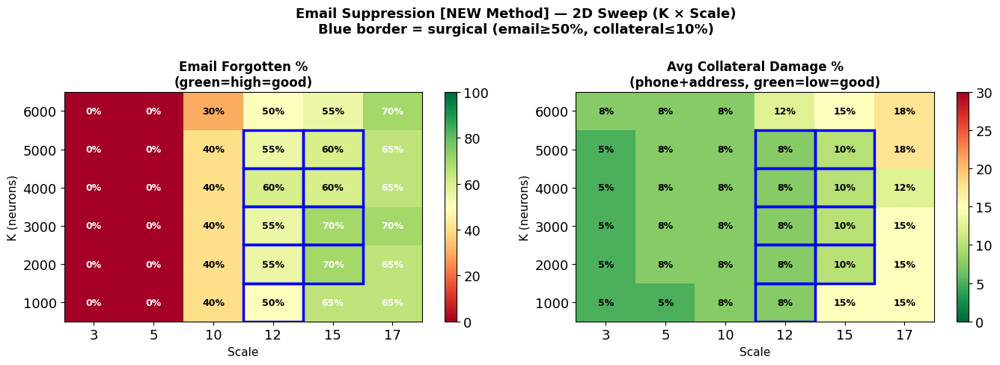

✅ Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/email_sweep_NEW_Method.png

2D SWEEP — OLD Method | 20 email examples

K=1000 (1000 neurons):
   scale |   email% |   phone% |   address% |  collateral%
  -------------------------------------------------------
       3 |     0.0% |   100.0% |      95.0% |         2.5%   
       5 |     0.0% |   100.0% |      95.0% |         2.5%   
      10 |     0.0% |   100.0% |     100.0% |         0.0%   
      12 |     0.0% |   100.0% |      95.0% |         2.5%   
      15 |     0.0% |   100.0% |     100.0% |         0.0%   
      17 |     0.0% |   100.0% |     100.0% |         0.0%   

K=2000 (2000 neurons):
   scale |   email% |   phone% |   address% |  collateral%
  -------------------------------------------------------
       3 |     0.0% |    95.0% |     100.0% |         2.5%   
       5 |     0.0% |    95.0% |     100.0% |         2.5%   
      10 |     0.0% |   100.0% |     100.0% |         0.0%   
      12 |     0.0% |   1

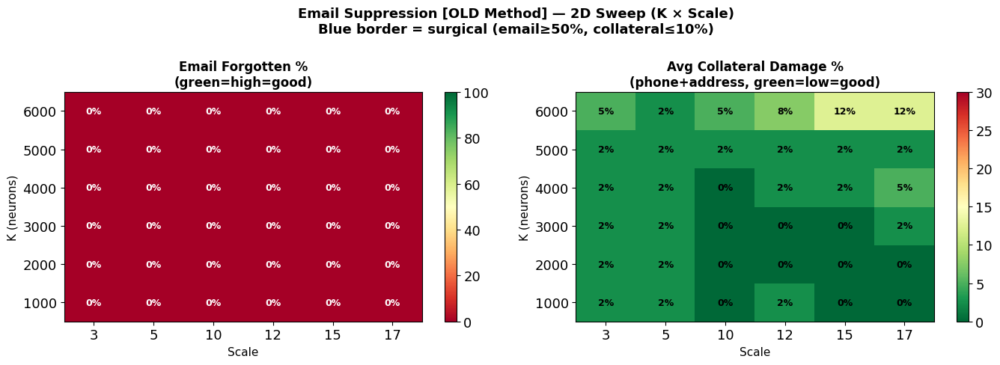

✅ Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/email_sweep_OLD_Method.png


In [79]:
# ============================================================
# K SWEEP + 2D SWEEP — Old vs New Method
# Target: email | Collateral: phone, address | N=20
# ============================================================

import numpy as np
from collections import defaultdict

other_rels = ['phone', 'address']

# ── Pre-collect 20 email test examples ───────────────────────
email_examples = []
for i in range(len(ds['test'])):
    if len(email_examples) >= 20:
        break
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()
    if rel == 'email' and gold and gold != 'N/A':
        email_examples.append({'conv': conv, 'gold': gold,
                                'idx': i})

print(f'Collected {len(email_examples)} email examples')

# ============================================================
# 2D SWEEP FUNCTION
# ============================================================

def run_2d_sweep_email(neuron_list, label='',
                       K_VALUES_2D=[1000, 2000, 3000, 4000, 5000, 6000],
                       SCALE_VALUES_2D=[3,5,10, 12, 15, 17]):

    matrix_email      = np.zeros((len(K_VALUES_2D),
                                   len(SCALE_VALUES_2D)))
    matrix_collateral = np.zeros((len(K_VALUES_2D),
                                   len(SCALE_VALUES_2D)))

    print(f'\n{"="*80}')
    print(f'2D SWEEP — {label} | 20 email examples')
    print(f'{"="*80}')

    for k_idx, K in enumerate(K_VALUES_2D):
        K_use = min(K, len(neuron_list))

        print(f'\nK={K} ({K_use} neurons):')
        print(f'  {"scale":>6} | {"email%":>8} | {"phone%":>8} | '
              f'{"address%":>10} | {"collateral%":>12}')
        print(f'  {"-"*55}')

        for s_idx, scale in enumerate(SCALE_VALUES_2D):
            scaled = scale_neurons(neuron_list, K_use, scale)

            email_changed = 0
            other_damaged = defaultdict(int)

            for ex in email_examples:
                conv = ex['conv']
                gold = ex['gold']

                # ── Target suppression ────────────────────
                forcer.force(scaled, only_last_token=False)
                supp_email = predict_from_conv(conv)
                forcer.remove()
                if supp_email.lower() != gold.lower():
                    email_changed += 1

                # ── Collateral ────────────────────────────
                for other_rel in other_rels:
                    swapped    = replace_question_conv(
                        conv, QUESTION_TEMPLATES[other_rel]
                    )
                    base_other = predict_from_conv(swapped)
                    forcer.force(scaled, only_last_token=False)
                    supp_other = predict_from_conv(swapped)
                    forcer.remove()
                    if base_other.lower() != supp_other.lower():
                        other_damaged[other_rel] += 1

            n          = len(email_examples)
            email_pct  = email_changed / n * 100
            other_pcts = {r: (1 - other_damaged[r]/n) * 100
                          for r in other_rels}
            collateral = 100 - np.mean(list(other_pcts.values()))

            matrix_email[k_idx][s_idx]      = email_pct
            matrix_collateral[k_idx][s_idx] = collateral

            def fmt_tgt(v):
                return f'❌{v:>5.1f}%' if v >= 50 \
                       else f'  {v:>5.1f}%'
            def fmt_oth(v):
                return f'⚠️{v:>5.1f}%' if v < 90 \
                       else f'  {v:>5.1f}%'

            surgical = '🎯' if email_pct >= 50 and \
                               collateral <= 10 else '  '

            print(f'  {scale:>6} | '
                  f'{fmt_tgt(email_pct):>8} | '
                  f'{fmt_oth(other_pcts["phone"]):>8} | '
                  f'{fmt_oth(other_pcts["address"]):>10} | '
                  f'{collateral:>11.1f}% {surgical}')

    forcer.remove()

    # ── Plot ─────────────────────────────────────────────────
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

    k_labels = [str(k) for k in K_VALUES_2D]
    s_labels = [str(s) for s in SCALE_VALUES_2D]

    im1 = ax1.imshow(matrix_email, aspect='auto',
                      cmap='RdYlGn', vmin=0, vmax=100,
                      origin='lower')
    ax1.set_xticks(range(len(SCALE_VALUES_2D)))
    ax1.set_xticklabels(s_labels)
    ax1.set_yticks(range(len(K_VALUES_2D)))
    ax1.set_yticklabels(k_labels)
    ax1.set_xlabel('Scale', fontsize=11)
    ax1.set_ylabel('K (neurons)', fontsize=11)
    ax1.set_title('Email Forgotten %\n(green=high=good)',
                  fontsize=12, fontweight='bold')
    plt.colorbar(im1, ax=ax1)
    for ki in range(len(K_VALUES_2D)):
        for si in range(len(SCALE_VALUES_2D)):
            val   = matrix_email[ki][si]
            color = 'white' if val > 60 or val < 20 else 'black'
            ax1.text(si, ki, f'{val:.0f}%',
                     ha='center', va='center',
                     fontsize=9, fontweight='bold', color=color)

    im2 = ax2.imshow(matrix_collateral, aspect='auto',
                      cmap='RdYlGn_r', vmin=0, vmax=30,
                      origin='lower')
    ax2.set_xticks(range(len(SCALE_VALUES_2D)))
    ax2.set_xticklabels(s_labels)
    ax2.set_yticks(range(len(K_VALUES_2D)))
    ax2.set_yticklabels(k_labels)
    ax2.set_xlabel('Scale', fontsize=11)
    ax2.set_ylabel('K (neurons)', fontsize=11)
    ax2.set_title('Avg Collateral Damage %\n(phone+address, green=low=good)',
                  fontsize=12, fontweight='bold')
    plt.colorbar(im2, ax=ax2)
    for ki in range(len(K_VALUES_2D)):
        for si in range(len(SCALE_VALUES_2D)):
            val   = matrix_collateral[ki][si]
            color = 'white' if val > 20 else 'black'
            ax2.text(si, ki, f'{val:.0f}%',
                     ha='center', va='center',
                     fontsize=9, fontweight='bold', color=color)

    # Mark surgical sweet spots
    for ki in range(len(K_VALUES_2D)):
        for si in range(len(SCALE_VALUES_2D)):
            if matrix_email[ki][si] >= 50 and \
               matrix_collateral[ki][si] <= 10:
                for ax in [ax1, ax2]:
                    ax.add_patch(plt.Rectangle(
                        (si-0.5, ki-0.5), 1, 1,
                        fill=False, edgecolor='blue',
                        linewidth=2.5
                    ))

    fig.suptitle(
        f'Email Suppression [{label}] — 2D Sweep (K × Scale)\n'
        f'Blue border = surgical (email≥50%, collateral≤10%)',
        fontsize=13, fontweight='bold'
    )
    plt.tight_layout()

    save_path = (
        f'/content/drive/MyDrive/PII_specific_neurons/'
        f'LLAMA_Again/email_sweep_{label.replace(" ", "_")}.png'
    )
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'✅ Saved: {save_path}')

    return matrix_email, matrix_collateral

# ============================================================
# RUN FOR BOTH METHODS
# ============================================================

# Load email neurons for both methods
print("Loading OLD email neurons...")
old_df_email = pd.read_csv(OLD_CSV['email'])
old_df_email['layer_num'] = old_df_email['layer'].str.extract(r'(\d+)').astype(int)
old_df_email = old_df_email[old_df_email['ap'] > 0.5].sort_values('ap', ascending=False)
old_neurons_email = [
    {
        'layer':    int(row['layer_num']),
        'neuron':   int(row['unit']),
        'on_p50':   float(row['on_p50']),
        'off_mean': float(row['off_mean']),
        'ap':       float(row['ap']),
    }
    for _, row in old_df_email.iterrows()
    if int(row['layer_num']) < model.config.num_hidden_layers
]
print(f"  Old email neurons: {len(old_neurons_email)}")

print("Loading NEW email neurons...")
with open(os.path.join(NEW_JSON_DIR, 'expert_neurons_email.json')) as f:
    new_neurons_email = json.load(f)
print(f"  New email neurons: {len(new_neurons_email)}")

new_email_mat, new_email_col_mat = run_2d_sweep_email(
    new_neurons_email, label='NEW Method'
)

old_email_mat, old_email_col_mat = run_2d_sweep_email(
    old_neurons_email, label='OLD Method'
)

In [35]:
# ============================================================
# BAYESIAN OPTIMIZATION — Address Suppression
# Target: address | Collateral: phone, email | N=20
# Both OLD and NEW method
# ============================================================

!pip install optuna --quiet

import optuna

from collections import defaultdict
optuna.logging.set_verbosity(optuna.logging.WARNING)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 419.5/419.5 kB 35.8 MB/s eta 0:00:00


In [36]:
other_rels = ['phone', 'email']

# ============================================================
# STEP 1 — Load address neurons for both methods
# ============================================================

print("Loading OLD address neurons...")
old_df_address = pd.read_csv(OLD_CSV['address'])
old_df_address['layer_num'] = old_df_address['layer'].str.extract(r'(\d+)').astype(int)
old_df_address = old_df_address[old_df_address['ap'] > 0.5].sort_values('ap', ascending=False)
old_neurons_address = [
    {
        'layer':    int(row['layer_num']),
        'neuron':   int(row['unit']),
        'on_p50':   float(row['on_p50']),
        'off_mean': float(row['off_mean']),
        'ap':       float(row['ap']),
    }
    for _, row in old_df_address.iterrows()
    if int(row['layer_num']) < model.config.num_hidden_layers
]
print(f"  Old address neurons: {len(old_neurons_address)}")

print("Loading NEW address neurons...")
with open(os.path.join(NEW_JSON_DIR, 'expert_neurons_address.json')) as f:
    new_neurons_address = json.load(f)
print(f"  New address neurons: {len(new_neurons_address)}")

# ============================================================
# STEP 2 — Collect 20 address test examples
# ============================================================

print(f"\nCollecting 20 address test examples...")
address_examples = []
for i in range(len(ds['test'])):
    if len(address_examples) >= 20:
        break
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()
    if rel == 'address' and gold and gold != 'N/A':
        address_examples.append({
            'conv': conv,
            'gold': gold,
            'idx':  i
        })

print(f"  Collected: {len(address_examples)} examples")

# ============================================================
# STEP 3 — Evaluation function
# ============================================================

def evaluate_suppression(neuron_list, K, scale, examples,
                          collateral_rels):
    """
    Run suppression for given K and scale.
    Returns target forgetting % and avg collateral damage %.
    """
    K_use  = min(int(K), len(neuron_list))
    scaled = scale_neurons(neuron_list, K_use, scale)

    target_changed = 0
    other_damaged  = defaultdict(int)

    for ex in examples:
        conv = ex['conv']
        gold = ex['gold']

        # ── Target suppression ────────────────────────────
        forcer.force(scaled, only_last_token=False)
        supp_target = predict_from_conv(conv)
        forcer.remove()
        if supp_target.lower() != gold.lower():
            target_changed += 1

        # ── Collateral ────────────────────────────────────
        for col_rel in collateral_rels:
            swapped    = replace_question_conv(
                conv, QUESTION_TEMPLATES[col_rel]
            )
            base_other = predict_from_conv(swapped)
            forcer.force(scaled, only_last_token=False)
            supp_other = predict_from_conv(swapped)
            forcer.remove()
            if base_other.lower() != supp_other.lower():
                other_damaged[col_rel] += 1

    forcer.remove()

    n              = len(examples)
    target_pct     = target_changed / n * 100
    collateral_pct = np.mean([
        other_damaged[r] / n * 100
        for r in collateral_rels
    ])

    return target_pct, collateral_pct


Loading OLD address neurons...
  Old address neurons: 64453
Loading NEW address neurons...
  New address neurons: 13276

  Collected: 20 examples



BAYESIAN OPTIMIZATION — NEW Method
Target: address | Collateral: phone, email
Trials: 30 | K: (1000, 13276) | Scale: (5, 25)


/tmp/ipykernel_3660/2049137638.py:25: UserWarning: The distribution is specified by [1000, 13276] and step=500, but the range is not divisible by `step`. It will be replaced with [1000, 13000].
  K     = trial.suggest_int('K', K_range[0], K_range[1],


  Trial   0 | K=  5500 | scale= 24.0 | address=  5.0% | collateral=  0.0% | score=    5.0 
  Trial   1 | K= 10000 | scale= 17.0 | address=  5.0% | collateral=  0.0% | score=    5.0 
  Trial   2 | K=  2500 | scale=  8.1 | address=  0.0% | collateral=  0.0% | score=    0.0 
  Trial   3 | K=  1500 | scale= 22.3 | address=  0.0% | collateral=  0.0% | score=    0.0 
  Trial   4 | K=  8500 | scale= 19.2 | address= 15.0% | collateral=  0.0% | score=   15.0 
  Trial   5 | K=  1000 | scale= 24.4 | address=  0.0% | collateral=  0.0% | score=    0.0 
  Trial   6 | K= 11000 | scale=  9.2 | address=  0.0% | collateral=  0.0% | score=    0.0 
  Trial   7 | K=  3000 | scale=  8.7 | address=  0.0% | collateral=  2.5% | score=    0.0 
  Trial   8 | K=  4500 | scale= 15.5 | address=  0.0% | collateral=  0.0% | score=    0.0 
  Trial   9 | K=  6000 | scale= 10.8 | address=  0.0% | collateral=  0.0% | score=    0.0 
  Trial  10 | K=  9000 | scale= 19.3 | address=  5.0% | collateral=  0.0% | score=    5.0 

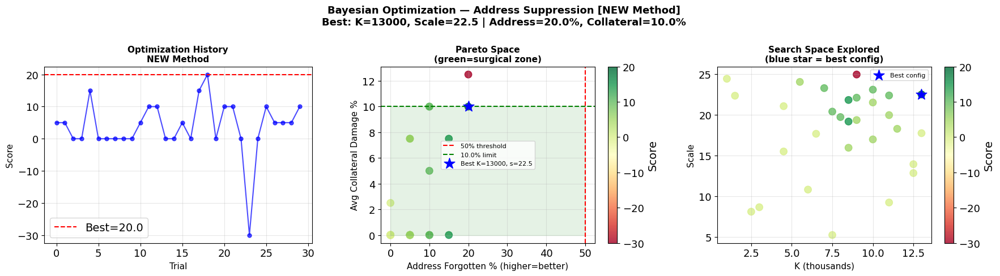

✅ Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/address_bayesian_NEW_Method.png

BAYESIAN OPTIMIZATION — OLD Method
Target: address | Collateral: phone, email
Trials: 30 | K: (10000, 150000) | Scale: (25, 50)
  Trial   0 | K= 62500 | scale= 48.8 | address=100.0% | collateral=100.0% | score=-1700.0 
  Trial   1 | K=112500 | scale= 40.0 | address=100.0% | collateral= 92.5% | score=-1550.0 
  Trial   2 | K= 31500 | scale= 28.9 | address= 15.0% | collateral= 47.5% | score= -735.0 
  Trial   3 | K= 18000 | scale= 46.7 | address= 95.0% | collateral= 97.5% | score=-1655.0 
  Trial   4 | K= 94000 | scale= 42.7 | address=100.0% | collateral= 97.5% | score=-1650.0 
  Trial   5 | K= 12500 | scale= 49.2 | address=  5.0% | collateral= 60.0% | score= -995.0 
  Trial   6 | K=126500 | scale= 30.3 | address= 60.0% | collateral= 80.0% | score=-1340.0 
  Trial   7 | K= 35500 | scale= 29.6 | address= 45.0% | collateral= 57.5% | score= -905.0 
  Trial   8 | K= 52500 | scale= 38.1 | address

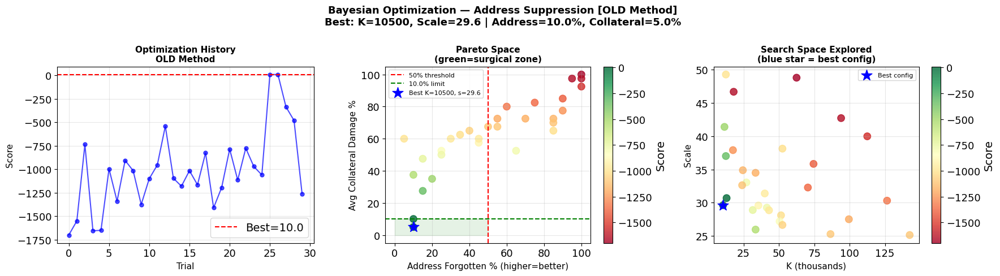

✅ Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/address_bayesian_OLD_Method.png


In [85]:
# ============================================================
# STEP 4 — Bayesian Optimization function
# ============================================================

def run_bayesian_optimization(neuron_list, label='',
                               n_trials=30,
                               K_range=(10000, 150000),
                               scale_range=(25, 50),
                               collateral_limit=10.0,
                               penalty_weight=20.0):
    """
    Use Optuna to find optimal K and scale for surgical
    suppression of address relation.
    """
    print(f'\n{"="*60}')
    print(f'BAYESIAN OPTIMIZATION — {label}')
    print(f'Target: address | Collateral: phone, email')
    print(f'Trials: {n_trials} | K: {K_range} | '
          f'Scale: {scale_range}')
    print(f'{"="*60}')

    trial_results = []

    def objective(trial):
        K     = trial.suggest_int('K', K_range[0], K_range[1],
                                   step=500)
        scale = trial.suggest_float('scale',
                                     scale_range[0],
                                     scale_range[1])

        target_pct, collateral_pct = evaluate_suppression(
            neuron_list, K, scale,
            address_examples, other_rels
        )

        # Surgical score:
        # maximize target forgetting
        # penalize collateral > limit
        penalty = max(0, collateral_pct - collateral_limit)
        score   = target_pct - penalty_weight * penalty

        trial_results.append({
            'trial':      trial.number,
            'K':          K,
            'scale':      scale,
            'target_pct': target_pct,
            'collateral': collateral_pct,
            'score':      score,
            'surgical':   target_pct >= 50 and
                          collateral_pct <= collateral_limit
        })

        print(f'  Trial {trial.number:>3} | '
              f'K={K:>6} | scale={scale:>5.1f} | '
              f'address={target_pct:>5.1f}% | '
              f'collateral={collateral_pct:>5.1f}% | '
              f'score={score:>7.1f} '
              f'{"🎯" if trial_results[-1]["surgical"] else ""}')

        return score

    # Run optimization
    study = optuna.create_study(
        direction='maximize',
        sampler=optuna.samplers.TPESampler(seed=42)
    )
    study.optimize(objective, n_trials=n_trials)

    # ── Best result ───────────────────────────────────────────
    best = study.best_params
    best_target, best_collateral = evaluate_suppression(
        neuron_list,
        best['K'], best['scale'],
        address_examples, other_rels
    )

    print(f'\n{"="*60}')
    print(f'BEST CONFIG — {label}')
    print(f'{"="*60}')
    print(f'  K               : {best["K"]}')
    print(f'  Scale           : {best["scale"]:.2f}')
    print(f'  Address forgotten: {best_target:.1f}%')
    print(f'  Avg collateral  : {best_collateral:.1f}%')
    surgical = best_target >= 50 and \
               best_collateral <= collateral_limit
    print(f'  Surgical        : {"✅ YES" if surgical else "❌ NO"}')

    # ── Plot optimization history ─────────────────────────────
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    trials_df = pd.DataFrame(trial_results)

    # Plot 1 — Score over trials
    axes[0].plot(trials_df['trial'], trials_df['score'],
                 'b-o', ms=5, alpha=0.7)
    axes[0].axhline(y=study.best_value, color='red',
                    ls='--', lw=1.5,
                    label=f'Best={study.best_value:.1f}')
    axes[0].set_xlabel('Trial', fontsize=11)
    axes[0].set_ylabel('Score', fontsize=11)
    axes[0].set_title(f'Optimization History\n{label}',
                      fontsize=11, fontweight='bold')
    axes[0].legend()
    axes[0].grid(alpha=0.3)

    # Plot 2 — Pareto scatter
    sc = axes[1].scatter(
        trials_df['target_pct'],
        trials_df['collateral'],
        c=trials_df['score'], cmap='RdYlGn',
        s=80, alpha=0.8
    )
    plt.colorbar(sc, ax=axes[1], label='Score')
    axes[1].axvline(x=50, color='red', ls='--',
                    lw=1.5, label='50% threshold')
    axes[1].axhline(y=collateral_limit, color='green',
                    ls='--', lw=1.5,
                    label=f'{collateral_limit}% limit')
    # Surgical zone
    axes[1].fill_between([0, 50], 0, collateral_limit,
                          alpha=0.1, color='green')
    axes[1].scatter([best_target], [best_collateral],
                    c='blue', s=200, marker='*',
                    zorder=5,
                    label=f'Best K={best["K"]}, '
                          f's={best["scale"]:.1f}')
    axes[1].set_xlabel('Address Forgotten % (higher=better)',
                        fontsize=11)
    axes[1].set_ylabel('Avg Collateral Damage %',
                        fontsize=11)
    axes[1].set_title('Pareto Space\n(green=surgical zone)',
                       fontsize=11, fontweight='bold')
    axes[1].legend(fontsize=8)
    axes[1].grid(alpha=0.3)

    # Plot 3 — K vs Scale scatter colored by score
    sc2 = axes[2].scatter(
        trials_df['K'] / 1000,
        trials_df['scale'],
        c=trials_df['score'], cmap='RdYlGn',
        s=80, alpha=0.8
    )
    plt.colorbar(sc2, ax=axes[2], label='Score')
    axes[2].scatter([best['K']/1000], [best['scale']],
                    c='blue', s=200, marker='*',
                    zorder=5, label='Best config')
    axes[2].set_xlabel('K (thousands)', fontsize=11)
    axes[2].set_ylabel('Scale', fontsize=11)
    axes[2].set_title('Search Space Explored\n'
                       '(blue star = best config)',
                       fontsize=11, fontweight='bold')
    axes[2].legend(fontsize=8)
    axes[2].grid(alpha=0.3)

    fig.suptitle(
        f'Bayesian Optimization — Address Suppression [{label}]\n'
        f'Best: K={best["K"]}, Scale={best["scale"]:.1f} | '
        f'Address={best_target:.1f}%, '
        f'Collateral={best_collateral:.1f}%',
        fontsize=13, fontweight='bold'
    )
    plt.tight_layout()

    save_path = (
        f'/content/drive/MyDrive/PII_specific_neurons/'
        f'LLAMA_Again/address_bayesian_'
        f'{label.replace(" ", "_")}.png'
    )
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'✅ Saved: {save_path}')

    return study, trials_df

# ============================================================
# STEP 5 — Run for both methods
# ============================================================

# New method — stay within actual neuron count
study_new, trials_new = run_bayesian_optimization(
    new_neurons_address,
    label='NEW Method',
    n_trials=30,
    K_range=(1000, len(new_neurons_address)),  # ← actual max
    scale_range=(5, 25)  # ← don't go too aggressive
)

study_old, trials_old = run_bayesian_optimization(
    old_neurons_address,
    label='OLD Method',
    n_trials=30,
    K_range=(10000, 150000),  # old has 69k neurons so wider range
    scale_range=(25, 50)
)

In [86]:
print(f"New address neurons total: {len(new_neurons_address)}")

New address neurons total: 13276


In [ ]:
# study_address_free, trials_address_free = run_bayesian_optimization(
#     new_neurons_address,
#     label='NEW Method - No Constraint',
#     n_trials=50,
#     K_range=(1000, len(new_neurons_address)),
#     scale_range=(5, 100),  # ← much higher scale
#     collateral_limit=100.0,  # ← no constraint
#     penalty_weight=0.0       # ← no penalty at all
# )

In [87]:
# ── Quick single example check — address suppression ─────────
print("Single example check — Address suppression")
print("="*60)

# Get 1 address example
sample_address = None
for i in range(len(ds['test'])):
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()
    if rel == 'address' and gold and gold != 'N/A':
        sample_address = {'conv': conv, 'gold': gold}
        print(f"Gold address: {gold}")
        break

# Get baselines for all collateral relations
all_collateral = ['phone', 'email', 'job', 'name']
baselines = {}
for rel in all_collateral:
    swapped = replace_question_conv(
        sample_address['conv'], QUESTION_TEMPLATES[rel]
    )
    baselines[rel] = predict_from_conv(swapped)
    print(f"Baseline {rel:>8}: {baselines[rel]}")

# ── Sweep scales at fixed K ───────────────────────────────────
K_test      = len(new_neurons_address)  # use all neurons
scale_tests = [5, 10, 15, 20, 25, 30, 50, 100]

print(f"\nK={K_test} | Sweeping scales...")
print(f'\n{"scale":>7} | {"address":>15} | {"phone":>8} | '
      f'{"email":>8} | {"job":>8} | {"name":>8}')
print('-' * 65)

for scale in scale_tests:
    scaled = scale_neurons(new_neurons_address, K_test, scale)
    forcer.force(scaled, only_last_token=False)

    # Target
    supp_address = predict_from_conv(sample_address['conv'])

    # Collateral
    col_results = {}
    for rel in all_collateral:
        swapped  = replace_question_conv(
            sample_address['conv'], QUESTION_TEMPLATES[rel]
        )
        col_results[rel] = predict_from_conv(swapped)

    forcer.remove()

    addr_forgotten = supp_address.lower() != \
                     sample_address['gold'].lower()

    def status(base, supp):
        return '⚠️ DAM' if base.lower() != supp.lower() \
               else '✅ OK'

    print(f'{scale:>7} | '
          f'{"❌ GONE" if addr_forgotten else supp_address[:15]:>15} | '
          f'{status(baselines["phone"], col_results["phone"]):>8} | '
          f'{status(baselines["email"], col_results["email"]):>8} | '
          f'{status(baselines["job"],   col_results["job"]):>8} | '
          f'{status(baselines["name"],  col_results["name"]):>8}')

forcer.remove()

Single example check — Address suppression
Gold address: 6420 Via Baron
Baseline    phone: 98968947830
Baseline    email: nataliagross@aol.org
Baseline      job: social worker
Baseline     name: Natalia Gross

K=13276 | Sweeping scales...

  scale |         address |    phone |    email |      job |     name
-----------------------------------------------------------------
      5 |  6420 Via Baron |     ✅ OK |     ✅ OK |     ✅ OK |     ✅ OK
     10 |  6420 Via Baron |     ✅ OK |     ✅ OK |     ✅ OK |     ✅ OK
     15 |  6420 Via Baron |     ✅ OK |     ✅ OK |     ✅ OK |     ✅ OK
     20 |  6420 Via Baron |     ✅ OK |     ✅ OK |     ✅ OK |     ✅ OK
     25 |  6420 Via Baron |   ⚠️ DAM |     ✅ OK |     ✅ OK |   ⚠️ DAM
     30 |          ❌ GONE |   ⚠️ DAM |   ⚠️ DAM |     ✅ OK |   ⚠️ DAM
     50 |          ❌ GONE |   ⚠️ DAM |   ⚠️ DAM |   ⚠️ DAM |   ⚠️ DAM
    100 |          ❌ GONE |   ⚠️ DAM |   ⚠️ DAM |   ⚠️ DAM |   ⚠️ DAM


#ignor this one. the results are correct but not the score. we check the new cell


BAYESIAN OPTIMIZATION — NEW Method
Target: address | Collateral: phone, email
Trials: 30 | K: (10000, 13276) | Scale: (25, 35)


/tmp/ipykernel_3660/2049137638.py:25: UserWarning: The distribution is specified by [10000, 13276] and step=500, but the range is not divisible by `step`. It will be replaced with [10000, 13000].
  K     = trial.suggest_int('K', K_range[0], K_range[1],


  Trial   0 | K= 11000 | scale= 34.5 | address= 80.0% | collateral= 47.5% | score=   80.0 🎯
  Trial   1 | K= 12500 | scale= 31.0 | address= 80.0% | collateral= 50.0% | score=   80.0 🎯
  Trial   2 | K= 10500 | scale= 26.6 | address= 70.0% | collateral= 27.5% | score=   70.0 🎯
  Trial   3 | K= 10000 | scale= 33.7 | address= 90.0% | collateral= 57.5% | score=   90.0 🎯
  Trial   4 | K= 12000 | scale= 32.1 | address= 80.0% | collateral= 40.0% | score=   80.0 🎯
  Trial   5 | K= 10000 | scale= 34.7 | address= 85.0% | collateral= 57.5% | score=   85.0 🎯
  Trial   6 | K= 12500 | scale= 27.1 | address= 70.0% | collateral= 27.5% | score=   70.0 🎯
  Trial   7 | K= 10500 | scale= 26.8 | address= 75.0% | collateral= 30.0% | score=   75.0 🎯
  Trial   8 | K= 11000 | scale= 30.2 | address= 85.0% | collateral= 40.0% | score=   85.0 🎯
  Trial   9 | K= 11500 | scale= 27.9 | address= 85.0% | collateral= 30.0% | score=   85.0 🎯
  Trial  10 | K= 10000 | scale= 32.8 | address= 90.0% | collateral= 42.5% | scor

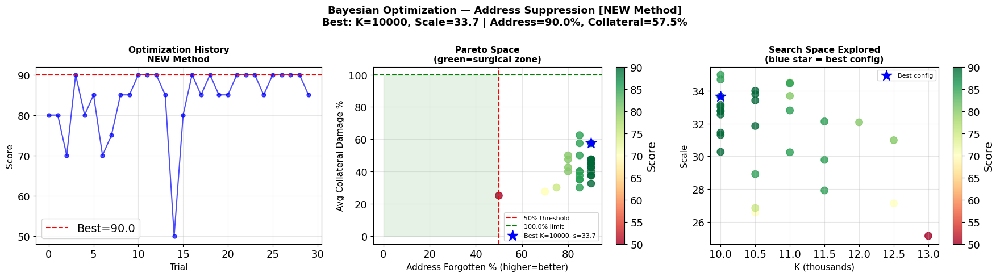

✅ Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/address_bayesian_NEW_Method.png


In [88]:
study_new, trials_new = run_bayesian_optimization(
    new_neurons_address,
    label='NEW Method',
    n_trials=30,
    K_range=(10000, len(new_neurons_address)),
    scale_range=(25, 35),  # ← tight range around sweet spot
    collateral_limit=100.0,
    penalty_weight=0.0
)


BAYESIAN OPTIMIZATION — NEW Method - Surgical
Target: address | Collateral: phone, email
Trials: 30 | K: (10000, 13276) | Scale: (25, 30)


/tmp/ipykernel_3660/2049137638.py:25: UserWarning: The distribution is specified by [10000, 13276] and step=500, but the range is not divisible by `step`. It will be replaced with [10000, 13000].
  K     = trial.suggest_int('K', K_range[0], K_range[1],


  Trial   0 | K= 11000 | scale= 29.8 | address= 85.0% | collateral= 40.0% | score= -115.0 
  Trial   1 | K= 12500 | scale= 28.0 | address= 75.0% | collateral= 32.5% | score=   25.0 
  Trial   2 | K= 10500 | scale= 25.8 | address= 50.0% | collateral= 20.0% | score=   50.0 🎯
  Trial   3 | K= 10000 | scale= 29.3 | address= 90.0% | collateral= 30.0% | score=   90.0 🎯
  Trial   4 | K= 12000 | scale= 28.5 | address= 85.0% | collateral= 30.0% | score=   85.0 🎯
  Trial   5 | K= 10000 | scale= 29.8 | address= 90.0% | collateral= 32.5% | score=   40.0 
  Trial   6 | K= 12500 | scale= 26.1 | address= 65.0% | collateral= 27.5% | score=   65.0 🎯
  Trial   7 | K= 10500 | scale= 25.9 | address= 50.0% | collateral= 22.5% | score=   50.0 🎯
  Trial   8 | K= 11000 | scale= 27.6 | address= 80.0% | collateral= 30.0% | score=   80.0 🎯
  Trial   9 | K= 11500 | scale= 26.5 | address= 65.0% | collateral= 25.0% | score=   65.0 🎯
  Trial  10 | K= 10000 | scale= 28.9 | address= 85.0% | collateral= 27.5% | score= 

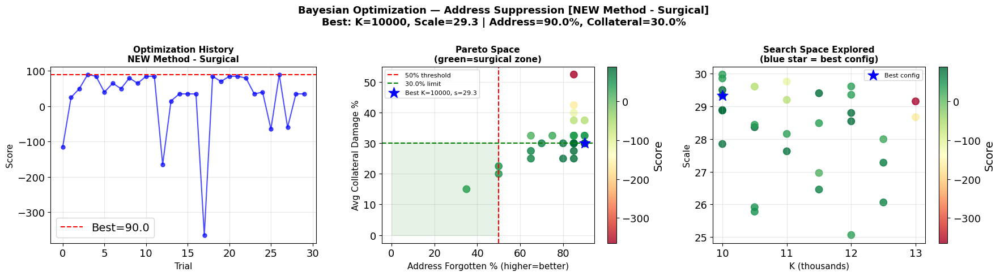

✅ Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/address_bayesian_NEW_Method_-_Surgical.png


In [89]:
study_new, trials_new = run_bayesian_optimization(
    new_neurons_address,
    label='NEW Method - Surgical',
    n_trials=30,
    K_range=(10000, len(new_neurons_address)),
    scale_range=(25, 30),  # ← tight around sweet spot
    collateral_limit=30.0,  # ← realistic limit given results
    penalty_weight=20.0     # ← penalize collateral again
)

ADDRESS K SWEEP | scale=29 | 20 examples
     K |   address% |  collateral%
-----------------------------------
  3000 |       0.0% |        15.0%
  4000 |       0.0% |        25.0%
  5000 |      30.0% |        32.5%
  6000 |      55.0% |        42.5%
  7000 |      25.0% |        25.0%
  8000 |      50.0% |        22.5%
  9000 |      75.0% |        25.0%
 10000 |      80.0% |        27.5%


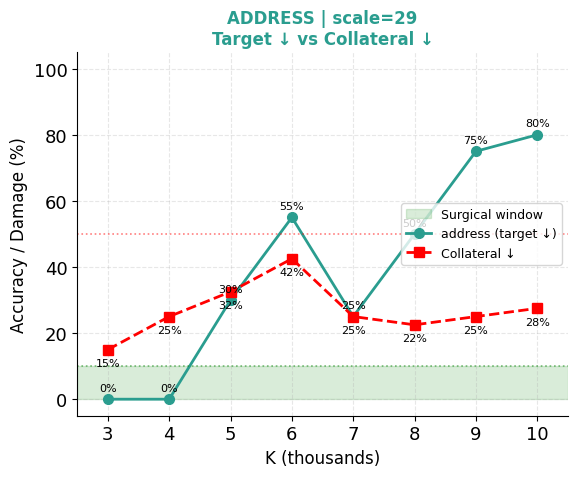

✅ Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/address_sweep_scale29.png


In [90]:
# ============================================================
# ADDRESS K SWEEP — Fixed scale=29 | N=20
# To replace address panel in the figure
# ============================================================

K_VALUES_SWEEP  = [3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]
SCALE_FIXED     = 29
other_rels      = ['phone', 'email']

print(f'ADDRESS K SWEEP | scale={SCALE_FIXED} | 20 examples')
print('='*60)
print(f'{"K":>6} | {"address%":>10} | {"collateral%":>12}')
print('-'*35)

sweep_results = []

for K in K_VALUES_SWEEP:
    K_use  = min(K, len(new_neurons_address))
    scaled = scale_neurons(new_neurons_address, K_use, SCALE_FIXED)

    address_changed = 0
    other_damaged   = defaultdict(int)

    for ex in address_examples:
        conv = ex['conv']
        gold = ex['gold']

        # ── Target suppression ────────────────────────────
        forcer.force(scaled, only_last_token=False)
        supp_address = predict_from_conv(conv)
        forcer.remove()
        if supp_address.lower() != gold.lower():
            address_changed += 1

        # ── Collateral ────────────────────────────────────
        for other_rel in other_rels:
            swapped    = replace_question_conv(
                conv, QUESTION_TEMPLATES[other_rel]
            )
            base_other = predict_from_conv(swapped)
            forcer.force(scaled, only_last_token=False)
            supp_other = predict_from_conv(swapped)
            forcer.remove()
            if base_other.lower() != supp_other.lower():
                other_damaged[other_rel] += 1

    forcer.remove()

    n              = len(address_examples)
    address_pct    = address_changed / n * 100
    collateral_pct = np.mean([
        other_damaged[r] / n * 100
        for r in other_rels
    ])

    sweep_results.append({
        'K':          K,
        'address':    address_pct,
        'collateral': collateral_pct
    })

    print(f'{K:>6} | {address_pct:>9.1f}% | {collateral_pct:>11.1f}%')

forcer.remove()

# ============================================================
# PLOT — same style as your figure
# ============================================================

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

fig, ax = plt.subplots(figsize=(6, 5))

K_vals   = [r['K'] for r in sweep_results]
addr_acc = [r['address']    for r in sweep_results]
coll_dmg = [r['collateral'] for r in sweep_results]

# ── Surgical window (green zone) ──────────────────────────────
ax.axhspan(0, 10, alpha=0.15, color='green',
           label='Surgical window')

# ── Lines ─────────────────────────────────────────────────────
ax.plot([k/1000 for k in K_vals], addr_acc,
        'o-', color='#2A9D8F', lw=2, ms=7,
        label='address (target ↓)')
ax.plot([k/1000 for k in K_vals], coll_dmg,
        's--', color='red', lw=2, ms=7,
        label='Collateral ↓')

# ── Thresholds ────────────────────────────────────────────────
ax.axhline(y=50, color='red',   ls=':', lw=1.2, alpha=0.5)
ax.axhline(y=10, color='green', ls=':', lw=1.2, alpha=0.5)

# ── Annotate points ───────────────────────────────────────────
for k, a, c in zip(K_vals, addr_acc, coll_dmg):
    ax.annotate(f'{a:.0f}%', (k/1000, a),
                textcoords='offset points',
                xytext=(0, 6), ha='center', fontsize=8)
    ax.annotate(f'{c:.0f}%', (k/1000, c),
                textcoords='offset points',
                xytext=(0, -12), ha='center', fontsize=8)

ax.set_xlabel('K (thousands)', fontsize=12)
ax.set_ylabel('Accuracy / Damage (%)', fontsize=12)
ax.set_title(f'ADDRESS | scale={SCALE_FIXED}\n'
             f'Target ↓ vs Collateral ↓',
             fontsize=12, fontweight='bold',
             color='#2A9D8F')
ax.legend(fontsize=9, loc='center right')
ax.set_ylim(-5, 105)
ax.set_xlim(K_vals[0]/1000 - 0.5,
            K_vals[-1]/1000 + 0.5)
ax.grid(alpha=0.3, ls='--')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()

save_path = (
    '/content/drive/MyDrive/PII_specific_neurons/'
    'LLAMA_Again/address_sweep_scale29.png'
)
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'✅ Saved: {save_path}')

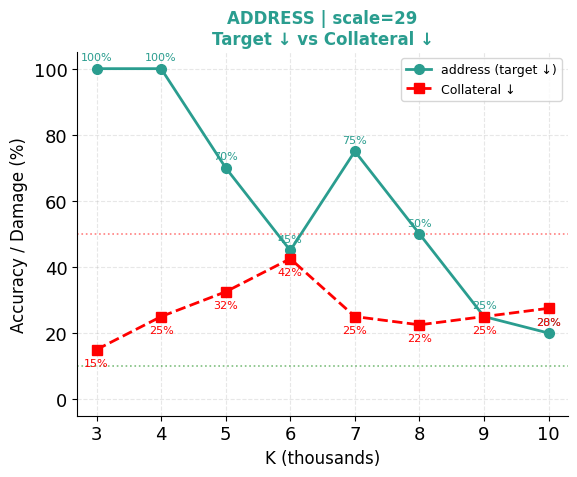

✅ Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/address_accuracy_vs_collateral.png


In [92]:
# ============================================================
# ADDRESS PLOT — Same style as PDF figure
# ============================================================

import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(6, 5))

K_vals      = [r['K']          for r in sweep_results]
addr_acc    = [100 - r['address']    for r in sweep_results]  # ← accuracy (lower=better)
coll_dmg    = [r['collateral'] for r in sweep_results]

K_thousands = [k/1000 for k in K_vals]

# # ── Surgical window (green zone) ──────────────────────────────
# ax.axhspan(0, 10, alpha=0.15, color='green')

# ── Threshold lines ───────────────────────────────────────────
ax.axhline(y=50,  color='red',   ls=':', lw=1.2, alpha=0.5)
ax.axhline(y=10,  color='green', ls=':', lw=1.2, alpha=0.5)

# ── Lines ─────────────────────────────────────────────────────
ax.plot(K_thousands, addr_acc,
        'o-', color='#2A9D8F', lw=2, ms=7,
        label='address (target ↓)')
ax.plot(K_thousands, coll_dmg,
        's--', color='red', lw=2, ms=7,
        label='Collateral ↓')

# ── Annotate points ───────────────────────────────────────────
for k, a, c in zip(K_thousands, addr_acc, coll_dmg):
    ax.annotate(f'{a:.0f}%', (k, a),
                textcoords='offset points',
                xytext=(0, 6), ha='center', fontsize=8,
                color='#2A9D8F')
    ax.annotate(f'{c:.0f}%', (k, c),
                textcoords='offset points',
                xytext=(0, -12), ha='center', fontsize=8,
                color='red')

ax.set_xlabel('K (thousands)', fontsize=12)
ax.set_ylabel('Accuracy / Damage (%)', fontsize=12)
ax.set_title(f'ADDRESS | scale={SCALE_FIXED}\n'
             f'Target ↓ vs Collateral ↓',
             fontsize=12, fontweight='bold',
             color='#2A9D8F')
ax.legend(fontsize=9, loc='upper right')
ax.set_ylim(-5, 105)
ax.set_xlim(K_thousands[0] - 0.3,
            K_thousands[-1] + 0.3)
ax.grid(alpha=0.3, ls='--')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()

save_path = (
    '/content/drive/MyDrive/PII_specific_neurons/'
    'LLAMA_Again/address_accuracy_vs_collateral.png'
)
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'✅ Saved: {save_path}')

In [98]:
# ── Collect 20 email examples ─────────────────────────────────
email_examples = []
for i in range(len(ds['test'])):
    if len(email_examples) >= 20:
        break
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv
         if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()
    if rel == 'email' and gold and gold != 'N/A':
        email_examples.append({
            'conv': conv,
            'gold': gold,
            'idx':  i
        })
print(f"Collected {len(email_examples)} email examples")

Collected 20 email examples


below code is correct run this to get the values

In [102]:
# ============================================================
# EMAIL FINE-GRAINED K SWEEP — scale=15
# Target: email | Collateral: phone, address, job, name
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

other_rels_email = ['phone', 'address', 'job', 'name']
SCALE_EMAIL      = 15

# ── Build K values ────────────────────────────────────────────
K_VALUES = (
    list(range(100,  500,  200)) +   # 100,200,300,400
    list(range(500,  1000, 500)) +   # 500,1000,...,4500
    list(range(1000, 11000, 1000))   # 5000,6000,...,10000
)
print(f"K values: {K_VALUES}")
print(f"Total sweep points: {len(K_VALUES)}")

# ── Collect 20 email examples ─────────────────────────────────
email_examples = []
for i in range(len(ds['test'])):
    if len(email_examples) >= 20:
        break
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv
         if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()
    if rel == 'email' and gold and gold != 'N/A':
        email_examples.append({
            'conv': conv,
            'gold': gold,
            'idx':  i
        })
print(f"Collected {len(email_examples)} email examples")

# ── Sweep ─────────────────────────────────────────────────────
print(f'\nEMAIL K SWEEP | scale={SCALE_EMAIL}')
print('='*60)
print(f'{"K":>6} | {"email_acc%":>10} | {"collateral%":>12}')
print('-'*35)

sweep_email_fine = []

for K in K_VALUES:
    K_use  = min(K, len(new_neurons_email))
    scaled = scale_neurons(new_neurons_email, K_use,
                           SCALE_EMAIL)

    email_changed = 0
    other_damaged = defaultdict(int)

    for ex in email_examples:
        conv = ex['conv']
        gold = ex['gold']

        # ── Target suppression ────────────────────────────
        forcer.force(scaled, only_last_token=False)
        supp_email = predict_from_conv(conv)
        forcer.remove()
        if supp_email.lower() != gold.lower():
            email_changed += 1

        # ── Collateral ────────────────────────────────────
        for other_rel in other_rels_email:
            swapped    = replace_question_conv(
                conv, QUESTION_TEMPLATES[other_rel]
            )
            base_other = predict_from_conv(swapped)
            forcer.force(scaled, only_last_token=False)
            supp_other = predict_from_conv(swapped)
            forcer.remove()
            if base_other.lower() != supp_other.lower():
                other_damaged[other_rel] += 1

    forcer.remove()

    n              = len(email_examples)
    email_pct      = email_changed / n * 100
    email_acc      = 100 - email_pct
    collateral_pct = np.mean([
        other_damaged[r] / n * 100
        for r in other_rels_email
    ])

    sweep_email_fine.append({
        'K':          K,
        'email_acc':  email_acc,
        'collateral': collateral_pct
    })

    print(f'{K:>6} | {email_acc:>9.1f}% | '
          f'{collateral_pct:>11.1f}%')

forcer.remove()

# ============================================================
# PLOT
# ============================================================

fig, ax = plt.subplots(figsize=(10, 5))

K_vals    = [r['K']         for r in sweep_email_fine]
email_acc = [r['email_acc'] for r in sweep_email_fine]
coll_dmg  = [r['collateral'] for r in sweep_email_fine]

# ── Threshold lines ───────────────────────────────────────────
ax.axhline(y=50, color='red',   ls=':', lw=1.5,
           alpha=0.6, label='50% threshold')
ax.axhline(y=10, color='green', ls=':', lw=1.5,
           alpha=0.6, label='10% collateral limit')

# ── Lines ─────────────────────────────────────────────────────
ax.plot(K_vals, email_acc,
        'o-', color='#DD8452', lw=2, ms=5,
        label='email accuracy (target ↓)')
ax.plot(K_vals, coll_dmg,
        's--', color='red', lw=2, ms=5,
        label='Avg collateral damage')

# ── Annotate key points ───────────────────────────────────────
key_K = [100, 500, 1000, 2000, 3000, 5000, 7000, 10000]
for r in sweep_email_fine:
    if r['K'] in key_K:
        ax.annotate(f'{r["email_acc"]:.0f}%',
                    (r['K'], r['email_acc']),
                    textcoords='offset points',
                    xytext=(0, 7), ha='center',
                    fontsize=8, color='#DD8452')
        ax.annotate(f'{r["collateral"]:.0f}%',
                    (r['K'], r['collateral']),
                    textcoords='offset points',
                    xytext=(0, -12), ha='center',
                    fontsize=8, color='red')

ax.set_xlabel('K (neurons)', fontsize=12)
ax.set_ylabel('Accuracy / Damage (%)', fontsize=12)
ax.set_title(f'EMAIL Suppression | scale={SCALE_EMAIL}\n'
             f'Target Accuracy ↓ vs Avg Collateral Damage\n'
             f'(Collateral: phone, address, job, name)',
             fontsize=12, fontweight='bold',
             color='#DD8452')
ax.legend(fontsize=9, loc='center right')
ax.set_ylim(-5, 105)
ax.set_xlim(-200, 10500)
ax.grid(alpha=0.3, ls='--')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()

save_path = (
    '/content/drive/MyDrive/PII_specific_neurons/'
    'LLAMA_Again/email_fine_sweep_scale15.png'
)
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'✅ Saved: {save_path}')

K values: [100, 300, 500, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]
Total sweep points: 13
Collected 20 email examples

EMAIL K SWEEP | scale=15
     K | email_acc% |  collateral%
-----------------------------------


KeyboardInterrupt: 

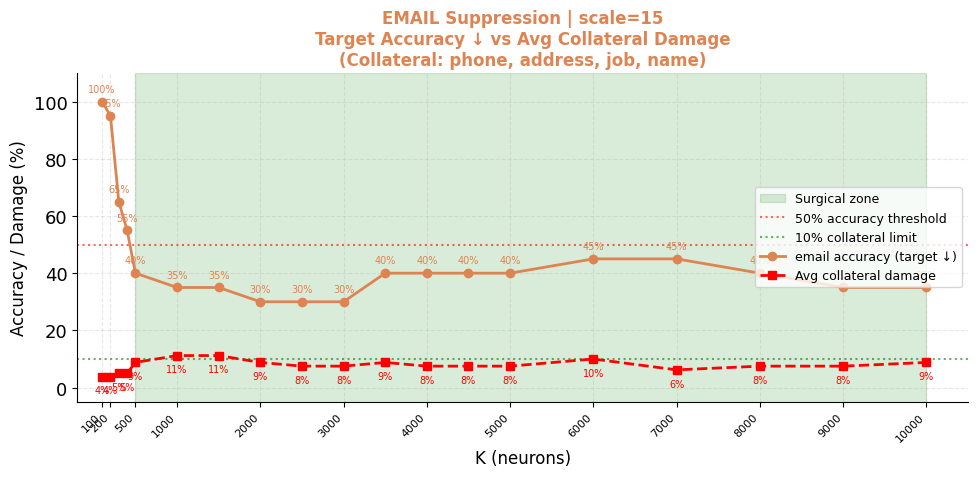

✅ Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/email_fine_sweep_scale15.png


In [103]:
import matplotlib.pyplot as plt

# ── Actual values from sweep ──────────────────────────────────
K_vals    = [100, 200, 300, 400, 500, 1000, 1500, 2000, 2500,
             3000, 3500, 4000, 4500, 5000, 6000, 7000, 8000,
             9000, 10000]
email_acc = [100, 95, 65, 55, 40, 35, 35, 30, 30, 30, 40,
             40, 40, 40, 45, 45, 40, 35, 35]
coll_dmg  = [3.8, 3.8, 5.0, 5.0, 8.8, 11.2, 11.2, 8.8, 7.5,
             7.5, 8.8, 7.5, 7.5, 7.5, 10.0, 6.2, 7.5, 7.5, 8.8]

fig, ax = plt.subplots(figsize=(10, 5))

# ── Vertical green surgical zone ──────────────────────────────
surgical_K = [K_vals[i] for i in range(len(K_vals))
              if email_acc[i] <= 50 and coll_dmg[i] <= 10]
if surgical_K:
    ax.axvspan(min(surgical_K), max(surgical_K),
               alpha=0.15, color='green',
               label='Surgical zone')

# ── Threshold lines ───────────────────────────────────────────
ax.axhline(y=50, color='red',   ls=':', lw=1.5,
           alpha=0.6, label='50% accuracy threshold')
ax.axhline(y=10, color='green', ls=':', lw=1.5,
           alpha=0.6, label='10% collateral limit')

# ── Lines ─────────────────────────────────────────────────────
ax.plot(K_vals, email_acc,
        'o-', color='#DD8452', lw=2, ms=6,
        label='email accuracy (target ↓)')
ax.plot(K_vals, coll_dmg,
        's--', color='red', lw=2, ms=6,
        label='Avg collateral damage')

# ── Annotate all points ───────────────────────────────────────
for k, a, c in zip(K_vals, email_acc, coll_dmg):
    ax.annotate(f'{a:.0f}%', (k, a),
                textcoords='offset points',
                xytext=(0, 7), ha='center',
                fontsize=7, color='#DD8452')
    ax.annotate(f'{c:.0f}%', (k, c),
                textcoords='offset points',
                xytext=(0, -12), ha='center',
                fontsize=7, color='red')

# ── X axis ticks ─────────────────────────────────────────────
x_ticks = [100, 200, 500, 1000, 2000, 3000, 4000, 5000,
           6000, 7000, 8000, 9000, 10000]
ax.set_xticks(x_ticks)
ax.set_xticklabels([str(k) for k in x_ticks],
                    rotation=45, ha='right', fontsize=8)

ax.set_xlabel('K (neurons)', fontsize=12)
ax.set_ylabel('Accuracy / Damage (%)', fontsize=12)
ax.set_title(f'EMAIL Suppression | scale=15\n'
             f'Target Accuracy ↓ vs Avg Collateral Damage\n'
             f'(Collateral: phone, address, job, name)',
             fontsize=12, fontweight='bold',
             color='#DD8452')
ax.legend(fontsize=9, loc='center right')
ax.set_ylim(-5, 110)
ax.set_xlim(-200, 10500)
ax.grid(alpha=0.3, ls='--')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()

save_path = (
    '/content/drive/MyDrive/PII_specific_neurons/'
    'LLAMA_Again/email_fine_sweep_scale15.png'
)
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'✅ Saved: {save_path}')

#getting phone sweep again.

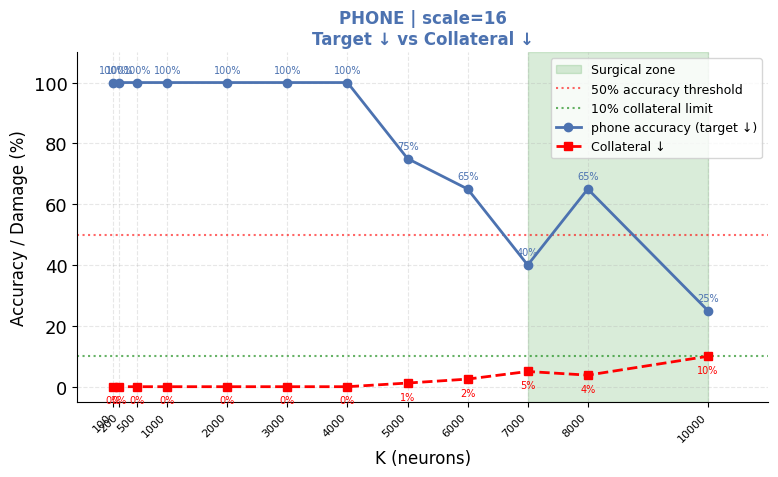

✅ Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/phone_accuracy_vs_collateral_scale16.png


In [112]:
# ============================================================
# PHONE PLOT — scale=16, actual values
# Same style as PDF figure
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

# ── Data ─────────────────────────────────────────────────────
K_all = [100,200, 500, 1000, 2000, 3000, 4000,
         5000, 6000, 7000, 8000, 10000]

phone_acc  = [100,100, 100, 100, 100, 100, 100, 75,  65,  40,  65,  25]
coll_dmg   = [0, 0,0,   0,   0,   0,   0,   1.2, 2.5, 5.0, 3.8, 10]

fig, ax = plt.subplots(figsize=(8, 5))

# ── Vertical surgical zone ────────────────────────────────────
surgical_K = [K_all[i] for i in range(len(K_all))
              if phone_acc[i] <= 50 and coll_dmg[i] <= 10]
if surgical_K:
    ax.axvspan(min(surgical_K), max(surgical_K),
               alpha=0.15, color='green',
               label='Surgical zone')

# ── Threshold lines ───────────────────────────────────────────
ax.axhline(y=50, color='red',   ls=':', lw=1.5,
           alpha=0.6, label='50% accuracy threshold')
ax.axhline(y=10, color='green', ls=':', lw=1.5,
           alpha=0.6, label='10% collateral limit')

# ── Lines ─────────────────────────────────────────────────────
ax.plot(K_all, phone_acc,
        'o-', color='#4C72B0', lw=2, ms=6,
        label='phone accuracy (target ↓)')
ax.plot(K_all, coll_dmg,
        's--', color='red', lw=2, ms=6,
        label='Collateral ↓')

# ── Annotate all points ───────────────────────────────────────
for k, a, c in zip(K_all, phone_acc, coll_dmg):
    ax.annotate(f'{a:.0f}%', (k, a),
                textcoords='offset points',
                xytext=(0, 7), ha='center',
                fontsize=7, color='#4C72B0')
    ax.annotate(f'{c:.0f}%', (k, c),
                textcoords='offset points',
                xytext=(0, -12), ha='center',
                fontsize=7, color='red')

# ── X axis ticks ──────────────────────────────────────────────
ax.set_xticks(K_all)
ax.set_xticklabels(
    [str(k) for k in K_all],
    rotation=45, ha='right', fontsize=8
)

ax.set_xlabel('K (neurons)', fontsize=12)
ax.set_ylabel('Accuracy / Damage (%)', fontsize=12)
ax.set_title('PHONE | scale=16\nTarget ↓ vs Collateral ↓',
             fontsize=12, fontweight='bold',
             color='#4C72B0')
ax.legend(fontsize=9, loc='best')
ax.set_ylim(-5, 110)
ax.set_xlim(-500, 11000)
ax.grid(alpha=0.3, ls='--')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()

save_path = (
    '/content/drive/MyDrive/PII_specific_neurons/'
    'LLAMA_Again/phone_accuracy_vs_collateral_scale16.png'
)
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'✅ Saved: {save_path}')

In [113]:
# ============================================================
# ADDRESS K SWEEP — scale=29 | K=100 to 2500
# Target: address | Collateral: phone, email, job, name
# ============================================================

other_rels_address = ['phone', 'email', 'job', 'name']
SCALE_ADDRESS      = 29

K_VALUES_ADDRESS = (
    list(range(100,  500,  200)) +   # 100, 300
    list(range(500,  1000, 500)) +   # 500
    list(range(1000, 3000, 500))     # 1000, 1500, 2000, 2500
)
print(f"K values: {K_VALUES_ADDRESS}")

# ── Collect 20 address examples ───────────────────────────────
address_examples_fine = []
for i in range(len(ds['test'])):
    if len(address_examples_fine) >= 20:
        break
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()
    if rel == 'address' and gold and gold != 'N/A':
        address_examples_fine.append({
            'conv': conv, 'gold': gold, 'idx': i
        })
print(f"Collected {len(address_examples_fine)} address examples")

# ── Sweep ─────────────────────────────────────────────────────
print(f'\nADDRESS K SWEEP | scale={SCALE_ADDRESS}')
print('='*60)
print(f'{"K":>6} | {"addr_acc%":>10} | {"collateral%":>12}')
print('-'*35)

sweep_address_fine = []

for K in K_VALUES_ADDRESS:
    K_use  = min(K, len(new_neurons_address))
    scaled = scale_neurons(new_neurons_address, K_use,
                           SCALE_ADDRESS)

    address_changed = 0
    other_damaged   = defaultdict(int)

    for ex in address_examples_fine:
        conv = ex['conv']
        gold = ex['gold']

        # ── Target suppression ────────────────────────────
        forcer.force(scaled, only_last_token=False)
        supp_address = predict_from_conv(conv)
        forcer.remove()
        if supp_address.lower() != gold.lower():
            address_changed += 1

        # ── Collateral ────────────────────────────────────
        for other_rel in other_rels_address:
            swapped    = replace_question_conv(
                conv, QUESTION_TEMPLATES[other_rel]
            )
            base_other = predict_from_conv(swapped)
            forcer.force(scaled, only_last_token=False)
            supp_other = predict_from_conv(swapped)
            forcer.remove()
            if base_other.lower() != supp_other.lower():
                other_damaged[other_rel] += 1

    forcer.remove()

    n              = len(address_examples_fine)
    address_pct    = address_changed / n * 100
    address_acc    = 100 - address_pct
    collateral_pct = np.mean([
        other_damaged[r] / n * 100
        for r in other_rels_address
    ])

    sweep_address_fine.append({
        'K':           K,
        'address_acc': address_acc,
        'collateral':  collateral_pct
    })

    print(f'{K:>6} | {address_acc:>9.1f}% | '
          f'{collateral_pct:>11.1f}%')

forcer.remove()

K values: [100, 300, 500, 1000, 1500, 2000, 2500]
Collected 20 address examples

ADDRESS K SWEEP | scale=29
     K |  addr_acc% |  collateral%
-----------------------------------
   100 |     100.0% |         2.5%
   300 |     100.0% |         0.0%
   500 |     100.0% |         0.0%
  1000 |     100.0% |         2.5%
  1500 |     100.0% |         7.5%
  2000 |      95.0% |        15.0%
  2500 |      95.0% |         6.2%


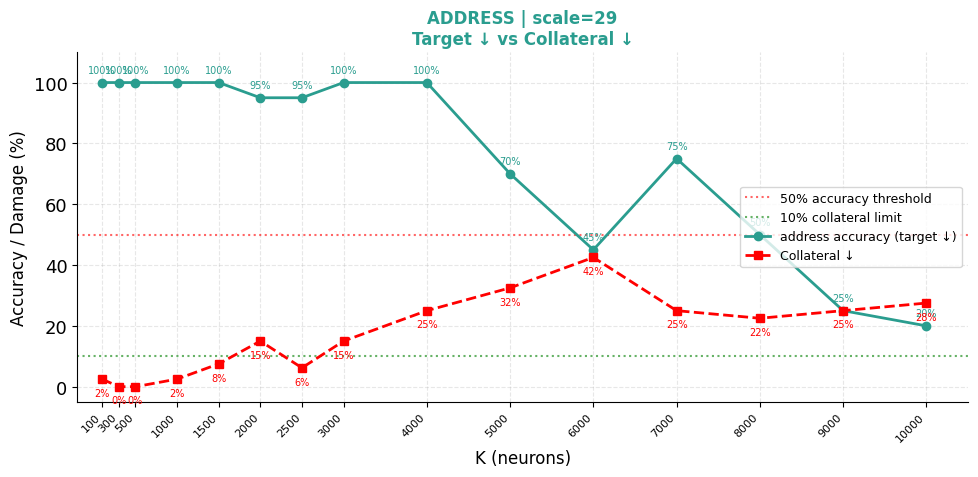

✅ Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/address_accuracy_vs_collateral_scale29.png


In [114]:
# ============================================================
# ADDRESS PLOT — scale=29, all values combined
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

# ── Combined data ─────────────────────────────────────────────
K_all = [100, 300, 500, 1000, 1500, 2000, 2500,
         3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]

address_acc = [100, 100, 100, 100, 100, 95, 95,
               100, 100, 70, 45, 75, 50, 25, 20]  # 100 - address%

coll_dmg    = [2.5, 0.0, 0.0, 2.5, 7.5, 15.0, 6.2,
               15.0, 25.0, 32.5, 42.5, 25.0, 22.5, 25.0, 27.5]

fig, ax = plt.subplots(figsize=(10, 5))

# ── Vertical surgical zone ────────────────────────────────────
surgical_K = [K_all[i] for i in range(len(K_all))
              if address_acc[i] <= 50 and coll_dmg[i] <= 10]
if surgical_K:
    ax.axvspan(min(surgical_K), max(surgical_K),
               alpha=0.15, color='green',
               label='Surgical zone')

# ── Threshold lines ───────────────────────────────────────────
ax.axhline(y=50, color='red',   ls=':', lw=1.5,
           alpha=0.6, label='50% accuracy threshold')
ax.axhline(y=10, color='green', ls=':', lw=1.5,
           alpha=0.6, label='10% collateral limit')

# ── Lines ─────────────────────────────────────────────────────
ax.plot(K_all, address_acc,
        'o-', color='#2A9D8F', lw=2, ms=6,
        label='address accuracy (target ↓)')
ax.plot(K_all, coll_dmg,
        's--', color='red', lw=2, ms=6,
        label='Collateral ↓')

# ── Annotate all points ───────────────────────────────────────
for k, a, c in zip(K_all, address_acc, coll_dmg):
    ax.annotate(f'{a:.0f}%', (k, a),
                textcoords='offset points',
                xytext=(0, 7), ha='center',
                fontsize=7, color='#2A9D8F')
    ax.annotate(f'{c:.0f}%', (k, c),
                textcoords='offset points',
                xytext=(0, -12), ha='center',
                fontsize=7, color='red')

# ── X axis ticks ──────────────────────────────────────────────
ax.set_xticks(K_all)
ax.set_xticklabels(
    [str(k) for k in K_all],
    rotation=45, ha='right', fontsize=8
)

ax.set_xlabel('K (neurons)', fontsize=12)
ax.set_ylabel('Accuracy / Damage (%)', fontsize=12)
ax.set_title('ADDRESS | scale=29\nTarget ↓ vs Collateral ↓',
             fontsize=12, fontweight='bold',
             color='#2A9D8F')
ax.legend(fontsize=9, loc='center right')
ax.set_ylim(-5, 110)
ax.set_xlim(-200, 10500)
ax.grid(alpha=0.3, ls='--')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()

save_path = (
    '/content/drive/MyDrive/PII_specific_neurons/'
    'LLAMA_Again/address_accuracy_vs_collateral_scale29.png'
)
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'✅ Saved: {save_path}')

In [115]:
# ============================================================
# JOB K SWEEP — scale=10 | K=100 to 3000
# Target: job | Collateral: phone, email, address, name
# ============================================================

other_rels_job = ['phone', 'email', 'address', 'name']
SCALE_JOB      = 10

K_VALUES_JOB = (
    list(range(100,  500,  200)) +   # 100, 300
    list(range(500,  1000, 500)) +   # 500
    list(range(1000, 10000,  1000))    # 1000, 1500, 2000, 2500, 3000
)
print(f"K values: {K_VALUES_JOB}")

# ── Collect 20 job examples ───────────────────────────────────
job_examples_fine = []
for i in range(len(ds['test'])):
    if len(job_examples_fine) >= 20:
        break
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()
    if rel == 'job' and gold and gold != 'N/A':
        job_examples_fine.append({
            'conv': conv, 'gold': gold, 'idx': i
        })
print(f"Collected {len(job_examples_fine)} job examples")

# ── Sweep ─────────────────────────────────────────────────────
print(f'\nJOB K SWEEP | scale={SCALE_JOB}')
print('='*60)
print(f'{"K":>6} | {"job_acc%":>10} | {"collateral%":>12}')
print('-'*35)

sweep_job_fine = []

for K in K_VALUES_JOB:
    K_use  = min(K, len(all_expert_neurons['job']))
    scaled = scale_neurons(all_expert_neurons['job'],
                           K_use, SCALE_JOB)

    job_changed   = 0
    other_damaged = defaultdict(int)

    for ex in job_examples_fine:
        conv = ex['conv']
        gold = ex['gold']

        forcer.force(scaled, only_last_token=False)
        supp_job = predict_from_conv(conv)
        forcer.remove()
        if supp_job.lower() != gold.lower():
            job_changed += 1

        for other_rel in other_rels_job:
            swapped    = replace_question_conv(
                conv, QUESTION_TEMPLATES[other_rel]
            )
            base_other = predict_from_conv(swapped)
            forcer.force(scaled, only_last_token=False)
            supp_other = predict_from_conv(swapped)
            forcer.remove()
            if base_other.lower() != supp_other.lower():
                other_damaged[other_rel] += 1

    forcer.remove()

    n              = len(job_examples_fine)
    job_pct        = job_changed / n * 100
    job_acc        = 100 - job_pct
    collateral_pct = np.mean([
        other_damaged[r] / n * 100
        for r in other_rels_job
    ])

    sweep_job_fine.append({
        'K':         K,
        'job_acc':   job_acc,
        'collateral': collateral_pct
    })

    print(f'{K:>6} | {job_acc:>9.1f}% | '
          f'{collateral_pct:>11.1f}%')

forcer.remove()

K values: [100, 300, 500, 1000, 1500, 2000, 2500, 3000]
Collected 20 job examples

JOB K SWEEP | scale=10
     K |   job_acc% |  collateral%
-----------------------------------
   100 |     100.0% |         3.8%
   300 |      90.0% |         5.0%
   500 |      90.0% |         6.2%
  1000 |      95.0% |         5.0%
  1500 |      80.0% |         6.2%
  2000 |      80.0% |         6.2%
  2500 |      75.0% |         6.2%
  3000 |      25.0% |         6.2%


In [117]:
# ============================================================
# JOB K SWEEP — scale=10 | K=100 to 3000
# Target: job | Collateral: phone, email, address, name
# ============================================================

other_rels_job = ['phone', 'email', 'address', 'name']
SCALE_JOB      = 10

K_VALUES_JOB = (
    # list(range(100,  500,  200)) +   # 100, 300
    # list(range(500,  1000, 500)) +   # 500
    list(range(3000, 10000,  1000))    # 1000, 1500, 2000, 2500, 3000
)
print(f"K values: {K_VALUES_JOB}")

# ── Collect 20 job examples ───────────────────────────────────
job_examples_fine = []
for i in range(len(ds['test'])):
    if len(job_examples_fine) >= 20:
        break
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()
    if rel == 'job' and gold and gold != 'N/A':
        job_examples_fine.append({
            'conv': conv, 'gold': gold, 'idx': i
        })
print(f"Collected {len(job_examples_fine)} job examples")

# ── Sweep ─────────────────────────────────────────────────────
print(f'\nJOB K SWEEP | scale={SCALE_JOB}')
print('='*60)
print(f'{"K":>6} | {"job_acc%":>10} | {"collateral%":>12}')
print('-'*35)

sweep_job_fine = []

for K in K_VALUES_JOB:
    K_use  = min(K, len(all_expert_neurons['job']))
    scaled = scale_neurons(all_expert_neurons['job'],
                           K_use, SCALE_JOB)

    job_changed   = 0
    other_damaged = defaultdict(int)

    for ex in job_examples_fine:
        conv = ex['conv']
        gold = ex['gold']

        forcer.force(scaled, only_last_token=False)
        supp_job = predict_from_conv(conv)
        forcer.remove()
        if supp_job.lower() != gold.lower():
            job_changed += 1

        for other_rel in other_rels_job:
            swapped    = replace_question_conv(
                conv, QUESTION_TEMPLATES[other_rel]
            )
            base_other = predict_from_conv(swapped)
            forcer.force(scaled, only_last_token=False)
            supp_other = predict_from_conv(swapped)
            forcer.remove()
            if base_other.lower() != supp_other.lower():
                other_damaged[other_rel] += 1

    forcer.remove()

    n              = len(job_examples_fine)
    job_pct        = job_changed / n * 100
    job_acc        = 100 - job_pct
    collateral_pct = np.mean([
        other_damaged[r] / n * 100
        for r in other_rels_job
    ])

    sweep_job_fine.append({
        'K':         K,
        'job_acc':   job_acc,
        'collateral': collateral_pct
    })

    print(f'{K:>6} | {job_acc:>9.1f}% | '
          f'{collateral_pct:>11.1f}%')

forcer.remove()

K values: [3000, 4000, 5000, 6000, 7000, 8000, 9000]
Collected 20 job examples

JOB K SWEEP | scale=10
     K |   job_acc% |  collateral%
-----------------------------------
  3000 |      25.0% |         6.2%
  4000 |      20.0% |         8.8%
  5000 |       5.0% |        10.0%
  6000 |       0.0% |        12.5%
  7000 |       0.0% |        10.0%
  8000 |       0.0% |        11.2%
  9000 |       0.0% |        10.0%


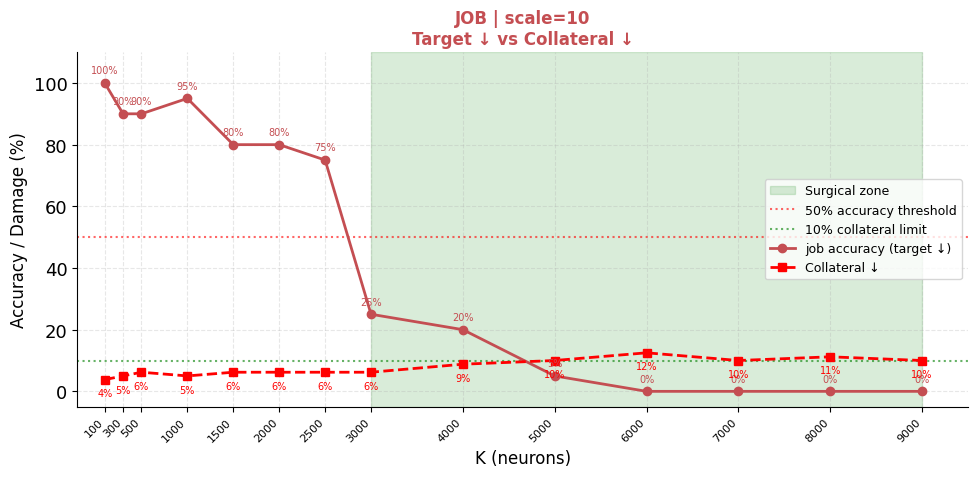

✅ Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/job_accuracy_vs_collateral_scale10.png


In [119]:
# ============================================================
# JOB PLOT — scale=10, all values combined
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

# ── Combined data ─────────────────────────────────────────────
K_all = [100, 300, 500, 1000, 1500, 2000, 2500,
         3000, 4000, 5000, 6000, 7000, 8000, 9000]

job_acc  = [100, 90, 90, 95, 80, 80, 75,
            25, 20, 5, 0, 0, 0, 0]

coll_dmg = [3.8, 5.0, 6.2, 5.0, 6.2, 6.2, 6.2,
            6.2, 8.8, 10.0, 12.5, 10.0, 11.2, 10.0]

fig, ax = plt.subplots(figsize=(10, 5))

# ── Vertical surgical zone ────────────────────────────────────
surgical_K = [K_all[i] for i in range(len(K_all))
              if job_acc[i] <= 50 and coll_dmg[i] <= 10]
if surgical_K:
    ax.axvspan(min(surgical_K), max(surgical_K),
               alpha=0.15, color='green',
               label='Surgical zone')

# ── Threshold lines ───────────────────────────────────────────
ax.axhline(y=50, color='red',   ls=':', lw=1.5,
           alpha=0.6, label='50% accuracy threshold')
ax.axhline(y=10, color='green', ls=':', lw=1.5,
           alpha=0.6, label='10% collateral limit')

# ── Lines ─────────────────────────────────────────────────────
ax.plot(K_all, job_acc,
        'o-', color='#C44E52', lw=2, ms=6,
        label='job accuracy (target ↓)')
ax.plot(K_all, coll_dmg,
        's--', color='red', lw=2, ms=6,
        label='Collateral ↓')

# ── Annotate all points ───────────────────────────────────────
for k, a, c in zip(K_all, job_acc, coll_dmg):
    ax.annotate(f'{a:.0f}%', (k, a),
                textcoords='offset points',
                xytext=(0, 7), ha='center',
                fontsize=7, color='#C44E52')
    ax.annotate(f'{c:.0f}%', (k, c),
                textcoords='offset points',
                xytext=(0, -12), ha='center',
                fontsize=7, color='red')

# ── X axis ticks ──────────────────────────────────────────────
ax.set_xticks(K_all)
ax.set_xticklabels(
    [str(k) for k in K_all],
    rotation=45, ha='right', fontsize=8
)

ax.set_xlabel('K (neurons)', fontsize=12)
ax.set_ylabel('Accuracy / Damage (%)', fontsize=12)
ax.set_title('JOB | scale=10\nTarget ↓ vs Collateral ↓',
             fontsize=12, fontweight='bold',
             color='#C44E52')
ax.legend(fontsize=9, loc='center right')
ax.set_ylim(-5, 110)
ax.set_xlim(-200, 9500)
ax.grid(alpha=0.3, ls='--')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()

save_path = (
    '/content/drive/MyDrive/PII_specific_neurons/'
    'LLAMA_Again/job_accuracy_vs_collateral_scale10.png'
)
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'✅ Saved: {save_path}')

In [116]:
# ============================================================
# NAME K SWEEP — scale=12 | K=100 to 3000
# Target: name | Collateral: phone, email, address, job
# ============================================================

other_rels_name = ['phone', 'email', 'address', 'job']
SCALE_NAME      = 12

K_VALUES_NAME = (
    list(range(100,  500,  200)) +   # 100, 300
    list(range(500,  1000, 500)) +   # 500
    list(range(1000, 3500,  500))    # 1000, 1500, 2000, 2500, 3000
)
print(f"K values: {K_VALUES_NAME}")

# ── Collect 20 name examples ──────────────────────────────────
name_examples_fine = []
for i in range(len(ds['test'])):
    if len(name_examples_fine) >= 20:
        break
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()
    if rel == 'name' and gold and gold != 'N/A':
        name_examples_fine.append({
            'conv': conv, 'gold': gold, 'idx': i
        })
print(f"Collected {len(name_examples_fine)} name examples")

# ── Sweep ─────────────────────────────────────────────────────
print(f'\nNAME K SWEEP | scale={SCALE_NAME}')
print('='*60)
print(f'{"K":>6} | {"name_acc%":>10} | {"collateral%":>12}')
print('-'*35)

sweep_name_fine = []

for K in K_VALUES_NAME:
    K_use  = min(K, len(all_expert_neurons['name']))
    scaled = scale_neurons(all_expert_neurons['name'],
                           K_use, SCALE_NAME)

    name_changed  = 0
    other_damaged = defaultdict(int)

    for ex in name_examples_fine:
        conv = ex['conv']
        gold = ex['gold']

        forcer.force(scaled, only_last_token=False)
        supp_name = predict_from_conv(conv)
        forcer.remove()
        if supp_name.lower() != gold.lower():
            name_changed += 1

        for other_rel in other_rels_name:
            swapped    = replace_question_conv(
                conv, QUESTION_TEMPLATES[other_rel]
            )
            base_other = predict_from_conv(swapped)
            forcer.force(scaled, only_last_token=False)
            supp_other = predict_from_conv(swapped)
            forcer.remove()
            if base_other.lower() != supp_other.lower():
                other_damaged[other_rel] += 1

    forcer.remove()

    n              = len(name_examples_fine)
    name_pct       = name_changed / n * 100
    name_acc       = 100 - name_pct
    collateral_pct = np.mean([
        other_damaged[r] / n * 100
        for r in other_rels_name
    ])

    sweep_name_fine.append({
        'K':          K,
        'name_acc':   name_acc,
        'collateral': collateral_pct
    })

    print(f'{K:>6} | {name_acc:>9.1f}% | '
          f'{collateral_pct:>11.1f}%')

forcer.remove()

K values: [100, 300, 500, 1000, 1500, 2000, 2500, 3000]
Collected 20 name examples

NAME K SWEEP | scale=12
     K |  name_acc% |  collateral%
-----------------------------------
   100 |     100.0% |         1.2%
   300 |      50.0% |         1.2%
   500 |      55.0% |         1.2%
  1000 |      40.0% |         3.8%
  1500 |      55.0% |         2.5%
  2000 |      40.0% |         3.8%
  2500 |      30.0% |         7.5%
  3000 |      25.0% |         7.5%


In [118]:
# ============================================================
# NAME K SWEEP — scale=12 | K=100 to 3000
# Target: name | Collateral: phone, email, address, job
# ============================================================

other_rels_name = ['phone', 'email', 'address', 'job']
SCALE_NAME      = 12

K_VALUES_NAME = (
    # list(range(100,  500,  200)) +   # 100, 300
    # list(range(500,  1000, 500)) +   # 500
    list(range(3000, 10000,  1000))    # 1000, 1500, 2000, 2500, 3000
)
print(f"K values: {K_VALUES_NAME}")

# ── Collect 20 name examples ──────────────────────────────────
name_examples_fine = []
for i in range(len(ds['test'])):
    if len(name_examples_fine) >= 20:
        break
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()
    if rel == 'name' and gold and gold != 'N/A':
        name_examples_fine.append({
            'conv': conv, 'gold': gold, 'idx': i
        })
print(f"Collected {len(name_examples_fine)} name examples")

# ── Sweep ─────────────────────────────────────────────────────
print(f'\nNAME K SWEEP | scale={SCALE_NAME}')
print('='*60)
print(f'{"K":>6} | {"name_acc%":>10} | {"collateral%":>12}')
print('-'*35)

sweep_name_fine = []

for K in K_VALUES_NAME:
    K_use  = min(K, len(all_expert_neurons['name']))
    scaled = scale_neurons(all_expert_neurons['name'],
                           K_use, SCALE_NAME)

    name_changed  = 0
    other_damaged = defaultdict(int)

    for ex in name_examples_fine:
        conv = ex['conv']
        gold = ex['gold']

        forcer.force(scaled, only_last_token=False)
        supp_name = predict_from_conv(conv)
        forcer.remove()
        if supp_name.lower() != gold.lower():
            name_changed += 1

        for other_rel in other_rels_name:
            swapped    = replace_question_conv(
                conv, QUESTION_TEMPLATES[other_rel]
            )
            base_other = predict_from_conv(swapped)
            forcer.force(scaled, only_last_token=False)
            supp_other = predict_from_conv(swapped)
            forcer.remove()
            if base_other.lower() != supp_other.lower():
                other_damaged[other_rel] += 1

    forcer.remove()

    n              = len(name_examples_fine)
    name_pct       = name_changed / n * 100
    name_acc       = 100 - name_pct
    collateral_pct = np.mean([
        other_damaged[r] / n * 100
        for r in other_rels_name
    ])

    sweep_name_fine.append({
        'K':          K,
        'name_acc':   name_acc,
        'collateral': collateral_pct
    })

    print(f'{K:>6} | {name_acc:>9.1f}% | '
          f'{collateral_pct:>11.1f}%')

forcer.remove()

K values: [3000, 4000, 5000, 6000, 7000, 8000, 9000]
Collected 20 name examples

NAME K SWEEP | scale=12
     K |  name_acc% |  collateral%
-----------------------------------
  3000 |      25.0% |         7.5%
  4000 |       5.0% |        11.2%
  5000 |      10.0% |        10.0%
  6000 |      15.0% |         8.8%
  7000 |      15.0% |         7.5%
  8000 |      10.0% |         7.5%
  9000 |       0.0% |         8.8%


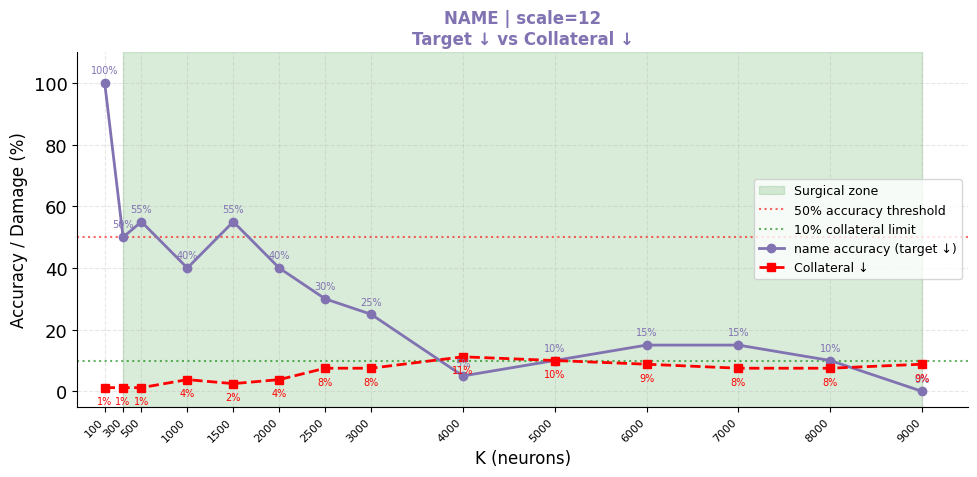

✅ Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/name_accuracy_vs_collateral_scale12.png


In [123]:
import matplotlib.pyplot as plt
import numpy as np

# ── Combined data ─────────────────────────────────────────────
K_all = [100, 300, 500, 1000, 1500, 2000, 2500,
         3000, 4000, 5000, 6000, 7000, 8000, 9000]

name_acc = [100, 50, 55, 40, 55, 40, 30,
            25, 5, 10, 15, 15, 10, 0]

coll_dmg = [1.2, 1.2, 1.2, 3.8, 2.5, 3.8, 7.5,
            7.5, 11.2, 10.0, 8.8, 7.5, 7.5, 8.8]

fig, ax = plt.subplots(figsize=(10, 5))

# ── Vertical surgical zone ────────────────────────────────────
surgical_K = [K_all[i] for i in range(len(K_all))
              if name_acc[i] <= 50 and coll_dmg[i] <= 10]
if surgical_K:
    ax.axvspan(min(surgical_K), max(surgical_K),
               alpha=0.15, color='green',
               label='Surgical zone')

# ── Threshold lines ───────────────────────────────────────────
ax.axhline(y=50, color='red',   ls=':', lw=1.5,
           alpha=0.6, label='50% accuracy threshold')
ax.axhline(y=10, color='green', ls=':', lw=1.5,
           alpha=0.6, label='10% collateral limit')

# ── Lines ─────────────────────────────────────────────────────
ax.plot(K_all, name_acc,
        'o-', color='#8172B2', lw=2, ms=6,
        label='name accuracy (target ↓)')
ax.plot(K_all, coll_dmg,
        's--', color='red', lw=2, ms=6,
        label='Collateral ↓')

# ── Annotate all points ───────────────────────────────────────
for k, a, c in zip(K_all, name_acc, coll_dmg):
    ax.annotate(f'{a:.0f}%', (k, a),
                textcoords='offset points',
                xytext=(0, 7), ha='center',
                fontsize=7, color='#8172B2')
    ax.annotate(f'{c:.0f}%', (k, c),
                textcoords='offset points',
                xytext=(0, -12), ha='center',
                fontsize=7, color='red')

# ── X axis ticks ──────────────────────────────────────────────
ax.set_xticks(K_all)
ax.set_xticklabels(
    [str(k) for k in K_all],
    rotation=45, ha='right', fontsize=8
)

ax.set_xlabel('K (neurons)', fontsize=12)
ax.set_ylabel('Accuracy / Damage (%)', fontsize=12)
ax.set_title('NAME | scale=12\nTarget ↓ vs Collateral ↓',
             fontsize=12, fontweight='bold',
             color='#8172B2')
ax.legend(fontsize=9, loc='center right')
ax.set_ylim(-5, 110)
ax.set_xlim(-200, 9500)
ax.grid(alpha=0.3, ls='--')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()

save_path = (
    '/content/drive/MyDrive/PII_specific_neurons/'
    'LLAMA_Again/name_accuracy_vs_collateral_scale12.png'
)
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'✅ Saved: {save_path}')

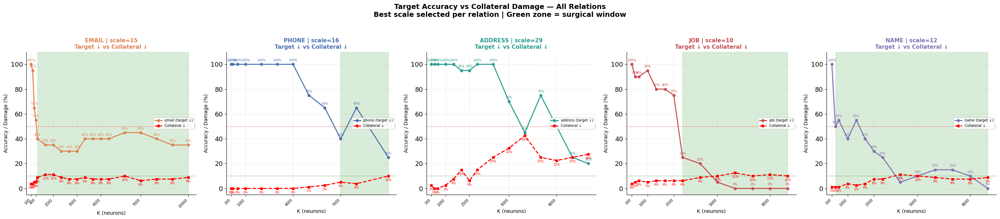

✅ Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/all_relations_accuracy_vs_collateral.pdf


In [124]:
# ============================================================
# ALL RELATIONS — One row, one PDF, 600 DPI
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

# ── Data ─────────────────────────────────────────────────────

# EMAIL | scale=15
email_K    = [100, 200, 300, 400, 500, 1000, 1500, 2000, 2500,
              3000, 3500, 4000, 4500, 5000, 6000, 7000, 8000,
              9000, 10000]
email_acc  = [100, 95, 65, 55, 40, 35, 35, 30, 30, 30, 40,
              40, 40, 40, 45, 45, 40, 35, 35]
email_coll = [3.8, 3.8, 5.0, 5.0, 8.8, 11.2, 11.2, 8.8, 7.5,
              7.5, 8.8, 7.5, 7.5, 7.5, 10.0, 6.2, 7.5, 7.5, 8.8]

# PHONE | scale=16
phone_K    = [100, 200, 500, 1000, 2000, 3000, 4000,
              5000, 6000, 7000, 8000, 10000]
phone_acc  = [100, 100, 100, 100, 100, 100, 100, 75, 65, 40, 65, 25]
phone_coll = [0, 0, 0, 0, 0, 0, 0, 1.2, 2.5, 5.0, 3.8, 10]

# ADDRESS | scale=29
address_K    = [100, 300, 500, 1000, 1500, 2000, 2500,
                3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]
address_acc  = [100, 100, 100, 100, 100, 95, 95,
                100, 100, 70, 45, 75, 50, 25, 20]
address_coll = [2.5, 0.0, 0.0, 2.5, 7.5, 15.0, 6.2,
                15.0, 25.0, 32.5, 42.5, 25.0, 22.5, 25.0, 27.5]

# JOB | scale=10
job_K    = [100, 300, 500, 1000, 1500, 2000, 2500,
            3000, 4000, 5000, 6000, 7000, 8000, 9000]
job_acc  = [100, 90, 90, 95, 80, 80, 75,
            25, 20, 5, 0, 0, 0, 0]
job_coll = [3.8, 5.0, 6.2, 5.0, 6.2, 6.2, 6.2,
            6.2, 8.8, 10.0, 12.5, 10.0, 11.2, 10.0]

# NAME | scale=12
name_K    = [100, 300, 500, 1000, 1500, 2000, 2500,
             3000, 4000, 5000, 6000, 7000, 8000, 9000]
name_acc  = [100, 50, 55, 40, 55, 40, 30,
             25, 5, 10, 15, 15, 10, 0]
name_coll = [1.2, 1.2, 1.2, 3.8, 2.5, 3.8, 7.5,
             7.5, 11.2, 10.0, 8.8, 7.5, 7.5, 8.8]

# ── Colors per relation ───────────────────────────────────────
COLORS = {
    'email':   '#DD8452',
    'phone':   '#4C72B0',
    'address': '#2A9D8F',
    'job':     '#C44E52',
    'name':    '#8172B2',
}

# ── All relations data ────────────────────────────────────────
relations = [
    ('EMAIL',   'email',   15, email_K,   email_acc,   email_coll),
    ('PHONE',   'phone',   16, phone_K,   phone_acc,   phone_coll),
    ('ADDRESS', 'address', 29, address_K, address_acc, address_coll),
    ('JOB',     'job',     10, job_K,     job_acc,     job_coll),
    ('NAME',    'name',    12, name_K,    name_acc,    name_coll),
]

# ── Figure ────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 5, figsize=(28, 6))

for ax, (title, rel, scale, K, acc, coll) in \
        zip(axes, relations):

    color = COLORS[rel]

    # ── Surgical zone ─────────────────────────────────────────
    surgical_K = [K[i] for i in range(len(K))
                  if acc[i] <= 50 and coll[i] <= 10]
    if surgical_K:
        ax.axvspan(min(surgical_K), max(surgical_K),
                   alpha=0.15, color='green')

    # ── Threshold lines ───────────────────────────────────────
    ax.axhline(y=50, color='red',   ls=':', lw=1.5, alpha=0.6)
    ax.axhline(y=10, color='green', ls=':', lw=1.5, alpha=0.6)

    # ── Lines ─────────────────────────────────────────────────
    ax.plot(K, acc,
            'o-', color=color, lw=2, ms=5,
            label=f'{rel} (target ↓)')
    ax.plot(K, coll,
            's--', color='red', lw=2, ms=5,
            label='Collateral ↓')

    # ── Annotate ──────────────────────────────────────────────
    for k, a, c in zip(K, acc, coll):
        ax.annotate(f'{a:.0f}%', (k, a),
                    textcoords='offset points',
                    xytext=(0, 6), ha='center',
                    fontsize=6, color=color)
        ax.annotate(f'{c:.0f}%', (k, c),
                    textcoords='offset points',
                    xytext=(0, -10), ha='center',
                    fontsize=6, color='red')

    # ── X ticks ───────────────────────────────────────────────
    ax.set_xticks(K[::3])  # every 3rd to avoid clutter
    ax.set_xticklabels(
        [str(k) for k in K[::3]],
        rotation=45, ha='right', fontsize=7
    )

    ax.set_xlabel('K (neurons)', fontsize=10)
    ax.set_ylabel('Accuracy / Damage (%)', fontsize=10)
    ax.set_title(f'{title} | scale={scale}\n'
                 f'Target ↓ vs Collateral ↓',
                 fontsize=11, fontweight='bold',
                 color=color)
    ax.legend(fontsize=7, loc='center right')
    ax.set_ylim(-5, 110)
    ax.set_xlim(-200, max(K) + 500)
    ax.grid(alpha=0.3, ls='--')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.suptitle(
    'Target Accuracy vs Collateral Damage — All Relations\n'
    'Best scale selected per relation | '
    'Green zone = surgical window',
    fontsize=14, fontweight='bold', y=1.02
)

plt.tight_layout()

save_path = (
    '/content/drive/MyDrive/PII_specific_neurons/'
    'LLAMA_Again/all_relations_accuracy_vs_collateral.pdf'
)
plt.savefig(save_path, format='pdf',
            dpi=600, bbox_inches='tight')
plt.savefig(save_path.replace('.pdf', '.png'),
            format='png', dpi=600, bbox_inches='tight')
plt.show()
print(f'✅ Saved: {save_path}')

#runnign the baysian for old

In [42]:
# ============================================================
# BAYESIAN OPTIMIZATION — OLD Method | All Relations
# 20 samples each | Fair comparison with NEW method
# ============================================================

!pip install optuna --quiet
import optuna
import pandas as pd
import numpy as np
from collections import defaultdict
optuna.logging.set_verbosity(optuna.logging.WARNING)

# ============================================================
# STEP 1 — Load OLD neurons for all relations from CSV
# ============================================================

print("Loading OLD neurons from CSV...")
print("="*60)

old_neurons = {}
for rel in TARGET_RELATIONS:
    df = pd.read_csv(OLD_CSV[rel])
    df['layer_num'] = df['layer'].str.extract(r'(\d+)').astype(int)
    df = df[df['ap'] > 0.5].sort_values('ap', ascending=False)
    old_neurons[rel] = [
        {
            'layer':    int(row['layer_num']),
            'neuron':   int(row['unit']),
            'on_p50':   float(row['on_p50']),
            'off_mean': float(row['off_mean']),
            'ap':       float(row['ap']),
        }
        for _, row in df.iterrows()
        if int(row['layer_num']) < model.config.num_hidden_layers
    ]
    print(f"  ✅ [{rel:>10}]: {len(old_neurons[rel])} neurons | "
          f"max_layer={max(n['layer'] for n in old_neurons[rel])}")

# ============================================================
# STEP 2 — Collect 20 examples per relation
# ============================================================

print("\nCollecting 20 examples per relation...")
print("="*60)

all_examples = {}
for rel in TARGET_RELATIONS:
    examples = []
    for i in range(len(ds['test'])):
        if len(examples) >= 20:
            break
        ex       = ds['test'][i]
        conv     = ex[CONV_KEY]
        user_msg = next(
            (m['content'] for m in conv
             if m['role'] == 'user'), ''
        )
        _, question = parse_context_question(user_msg)
        det_rel  = detect_relation_from_question(question)
        gold = next(
            (m['content'] for m in conv
             if m['role'] == 'assistant'), ''
        ).strip()
        if det_rel == rel and gold and gold != 'N/A':
            examples.append({
                'conv': conv,
                'gold': gold,
                'idx':  i
            })
    all_examples[rel] = examples
    print(f"  ✅ [{rel:>10}]: {len(examples)} examples")

# ============================================================
# STEP 3 — Evaluation function
# ============================================================

def evaluate_suppression_rel(neuron_list, K, scale,
                              target_rel, examples):
    other_rels = [r for r in TARGET_RELATIONS
                  if r != target_rel]
    K_use  = min(int(K), len(neuron_list))
    scaled = scale_neurons(neuron_list, K_use, scale)

    target_changed = 0
    other_damaged  = defaultdict(int)

    for ex in examples:
        conv = ex['conv']
        gold = ex['gold']

        # ── Target ───────────────────────────────────────
        forcer.force(scaled, only_last_token=False)
        supp = predict_from_conv(conv)
        forcer.remove()
        if supp.lower() != gold.lower():
            target_changed += 1

        # ── Collateral ───────────────────────────────────
        for other_rel in other_rels:
            swapped    = replace_question_conv(
                conv, QUESTION_TEMPLATES[other_rel]
            )
            base_other = predict_from_conv(swapped)
            forcer.force(scaled, only_last_token=False)
            supp_other = predict_from_conv(swapped)
            forcer.remove()
            if base_other.lower() != supp_other.lower():
                other_damaged[other_rel] += 1

    forcer.remove()

    n              = len(examples)
    target_pct     = target_changed / n * 100
    collateral_pct = np.mean([
        other_damaged[r] / n * 100
        for r in other_rels
    ])
    return target_pct, collateral_pct

# ============================================================
# STEP 4 — Bayesian Optimization per relation
# ============================================================

old_best_results = {}

for rel in TARGET_RELATIONS:
    print(f'\n{"="*60}')
    print(f'BAYESIAN — OLD Method | {rel.upper()}')
    print(f'{"="*60}')

    neuron_list = old_neurons[rel]
    examples    = all_examples[rel]

    trial_results = []

    def objective(trial):
        K     = trial.suggest_int(
            'K', 1000, len(neuron_list), step=1000
        )
        scale = trial.suggest_float('scale', 5, 50)

        target_pct, collateral_pct = evaluate_suppression_rel(
            neuron_list, K, scale, rel, examples
        )

        penalty = max(0, collateral_pct - 10.0)
        score   = target_pct - 20.0 * penalty

        trial_results.append({
            'trial':      trial.number,
            'K':          K,
            'scale':      scale,
            'target_pct': target_pct,
            'collateral': collateral_pct,
            'score':      score,
            'surgical':   target_pct >= 50 and
                          collateral_pct <= 10
        })

        surgical = '🎯' if trial_results[-1]['surgical'] \
                   else ''
        print(f'  Trial {trial.number:>3} | '
              f'K={K:>7} | scale={scale:>5.1f} | '
              f'{rel}={target_pct:>5.1f}% | '
              f'collateral={collateral_pct:>5.1f}% | '
              f'score={score:>7.1f} {surgical}')

        return score

    study = optuna.create_study(
        direction='maximize',
        sampler=optuna.samplers.TPESampler(seed=42)
    )
    study.optimize(objective, n_trials=30)

    best        = study.best_params
    best_target, best_coll = evaluate_suppression_rel(
        neuron_list,
        best['K'], best['scale'],
        rel, examples
    )

    old_best_results[rel] = {
        'K':          best['K'],
        'scale':      best['scale'],
        'target_pct': best_target,
        'collateral': best_coll,
        'surgical':   best_target >= 50 and best_coll <= 10
    }

    print(f'\n  BEST — OLD [{rel.upper()}]:')
    print(f'    K               : {best["K"]}')
    print(f'    Scale           : {best["scale"]:.2f}')
    print(f'    Target forgotten: {best_target:.1f}%')
    print(f'    Avg collateral  : {best_coll:.1f}%')
    print(f'    Surgical        : '
          f'{"✅ YES" if old_best_results[rel]["surgical"] else "❌ NO"}')

forcer.remove()

# ============================================================
# STEP 5 — Summary table
# ============================================================

print(f'\n{"="*60}')
print('SUMMARY — OLD Method Best Results')
print(f'{"="*60}')
print(f'{"Relation":>10} | {"K":>7} | {"Scale":>6} | '
      f'{"Forgetting":>12} | {"Collateral":>12} | {"Surgical"}')
print('-'*70)
for rel in TARGET_RELATIONS:
    r = old_best_results[rel]
    print(f'{rel:>10} | {r["K"]:>7} | {r["scale"]:>6.1f} | '
          f'{r["target_pct"]:>11.1f}% | '
          f'{r["collateral"]:>11.1f}% | '
          f'{"✅" if r["surgical"] else "❌"}')

Loading OLD neurons from CSV...
  ✅ [     email]: 70692 neurons | max_layer=31
  ✅ [     phone]: 67464 neurons | max_layer=31
  ✅ [   address]: 64453 neurons | max_layer=31
  ✅ [       job]: 73293 neurons | max_layer=31
  ✅ [      name]: 66641 neurons | max_layer=31

  ✅ [     email]: 20 examples
  ✅ [     phone]: 20 examples
  ✅ [   address]: 20 examples
  ✅ [       job]: 20 examples
  ✅ [      name]: 20 examples

BAYESIAN — OLD Method | EMAIL


/tmp/ipykernel_6323/2661047132.py:137: UserWarning: The distribution is specified by [1000, 70692] and step=1000, but the range is not divisible by `step`. It will be replaced with [1000, 70000].
  K     = trial.suggest_int(


  Trial   0 | K=  27000 | scale= 47.8 | email=100.0% | collateral=100.0% | score=-1700.0 
  Trial   1 | K=  52000 | scale= 31.9 | email=100.0% | collateral=100.0% | score=-1700.0 
  Trial   2 | K=  11000 | scale= 12.0 | email=  0.0% | collateral=  5.0% | score=    0.0 
  Trial   3 | K=   5000 | scale= 44.0 | email=100.0% | collateral= 96.2% | score=-1625.0 
  Trial   4 | K=  43000 | scale= 36.9 | email=100.0% | collateral=100.0% | score=-1700.0 
  Trial   5 | K=   2000 | scale= 48.6 | email= 95.0% | collateral= 90.0% | score=-1505.0 
  Trial   6 | K=  59000 | scale= 14.6 | email= 30.0% | collateral= 43.8% | score= -645.0 
  Trial   7 | K=  13000 | scale= 13.3 | email=  0.0% | collateral=  8.8% | score=    0.0 
  Trial   8 | K=  22000 | scale= 28.6 | email= 65.0% | collateral= 86.2% | score=-1460.0 
  Trial   9 | K=  31000 | scale= 18.1 | email= 15.0% | collateral= 42.5% | score= -635.0 
  Trial  10 | K=  67000 | scale=  5.3 | email= 25.0% | collateral= 37.5% | score= -525.0 
  Trial  1

/tmp/ipykernel_6323/2661047132.py:137: UserWarning: The distribution is specified by [1000, 67464] and step=1000, but the range is not divisible by `step`. It will be replaced with [1000, 67000].
  K     = trial.suggest_int(


  Trial   0 | K=  26000 | scale= 47.8 | phone= 90.0% | collateral= 98.8% | score=-1685.0 
  Trial   1 | K=  50000 | scale= 31.9 | phone= 45.0% | collateral= 63.8% | score=-1030.0 
  Trial   2 | K=  11000 | scale= 12.0 | phone=  0.0% | collateral= 26.2% | score= -325.0 
  Trial   3 | K=   4000 | scale= 44.0 | phone= 20.0% | collateral= 32.5% | score= -430.0 
  Trial   4 | K=  41000 | scale= 36.9 | phone= 45.0% | collateral= 72.5% | score=-1205.0 
  Trial   5 | K=   2000 | scale= 48.6 | phone=  0.0% | collateral= 28.8% | score= -375.0 
  Trial   6 | K=  56000 | scale= 14.6 | phone= 45.0% | collateral= 52.5% | score= -805.0 
  Trial   7 | K=  13000 | scale= 13.3 | phone=  0.0% | collateral= 28.8% | score= -375.0 
  Trial   8 | K=  21000 | scale= 28.6 | phone= 30.0% | collateral= 47.5% | score= -720.0 
  Trial   9 | K=  29000 | scale= 18.1 | phone= 30.0% | collateral= 31.2% | score= -395.0 
  Trial  10 | K=  64000 | scale=  5.3 | phone= 75.0% | collateral= 65.0% | score=-1025.0 
  Trial  1

/tmp/ipykernel_6323/2661047132.py:137: UserWarning: The distribution is specified by [1000, 64453] and step=1000, but the range is not divisible by `step`. It will be replaced with [1000, 64000].
  K     = trial.suggest_int(


  Trial   0 | K=  24000 | scale= 47.8 | address= 95.0% | collateral=100.0% | score=-1705.0 
  Trial   1 | K=  47000 | scale= 31.9 | address= 75.0% | collateral= 56.2% | score= -850.0 
  Trial   2 | K=  10000 | scale= 12.0 | address=  0.0% | collateral=  2.5% | score=    0.0 
  Trial   3 | K=   4000 | scale= 44.0 | address=  5.0% | collateral=  3.8% | score=    5.0 
  Trial   4 | K=  39000 | scale= 36.9 | address= 90.0% | collateral= 65.0% | score=-1010.0 
  Trial   5 | K=   2000 | scale= 48.6 | address=  0.0% | collateral=  6.2% | score=    0.0 
  Trial   6 | K=  54000 | scale= 14.6 | address= 35.0% | collateral= 31.2% | score= -390.0 
  Trial   7 | K=  12000 | scale= 13.3 | address=  0.0% | collateral=  3.8% | score=    0.0 
  Trial   8 | K=  20000 | scale= 28.6 | address= 25.0% | collateral= 30.0% | score= -375.0 
  Trial   9 | K=  28000 | scale= 18.1 | address=  5.0% | collateral= 10.0% | score=    5.0 
  Trial  10 | K=  61000 | scale= 40.0 | address= 95.0% | collateral= 96.2% | sco

/tmp/ipykernel_6323/2661047132.py:137: UserWarning: The distribution is specified by [1000, 73293] and step=1000, but the range is not divisible by `step`. It will be replaced with [1000, 73000].
  K     = trial.suggest_int(


  Trial   0 | K=  28000 | scale= 47.8 | job= 15.0% | collateral= 23.8% | score= -260.0 
  Trial   1 | K=  54000 | scale= 31.9 | job= 40.0% | collateral= 37.5% | score= -510.0 
  Trial   2 | K=  12000 | scale= 12.0 | job=  0.0% | collateral=  7.5% | score=    0.0 
  Trial   3 | K=   5000 | scale= 44.0 | job=  0.0% | collateral=  7.5% | score=    0.0 
  Trial   4 | K=  44000 | scale= 36.9 | job= 45.0% | collateral= 37.5% | score= -505.0 
  Trial   5 | K=   2000 | scale= 48.6 | job=  0.0% | collateral=  5.0% | score=    0.0 
  Trial   6 | K=  61000 | scale= 14.6 | job= 15.0% | collateral= 36.2% | score= -510.0 
  Trial   7 | K=  14000 | scale= 13.3 | job=  0.0% | collateral=  7.5% | score=    0.0 
  Trial   8 | K=  23000 | scale= 28.6 | job=  0.0% | collateral= 10.0% | score=    0.0 
  Trial   9 | K=  32000 | scale= 18.1 | job=  5.0% | collateral= 15.0% | score=  -95.0 
  Trial  10 | K=  69000 | scale=  5.3 | job= 45.0% | collateral= 58.8% | score= -930.0 
  Trial  11 | K=   1000 | scale=

/tmp/ipykernel_6323/2661047132.py:137: UserWarning: The distribution is specified by [1000, 66641] and step=1000, but the range is not divisible by `step`. It will be replaced with [1000, 66000].
  K     = trial.suggest_int(


  Trial   0 | K=  25000 | scale= 47.8 | name= 60.0% | collateral= 87.5% | score=-1490.0 
  Trial   1 | K=  49000 | scale= 31.9 | name= 20.0% | collateral= 70.0% | score=-1180.0 
  Trial   2 | K=  11000 | scale= 12.0 | name=  0.0% | collateral=  6.2% | score=    0.0 
  Trial   3 | K=   4000 | scale= 44.0 | name=  0.0% | collateral= 22.5% | score= -250.0 
  Trial   4 | K=  40000 | scale= 36.9 | name= 20.0% | collateral= 71.2% | score=-1205.0 
  Trial   5 | K=   2000 | scale= 48.6 | name=  0.0% | collateral= 16.2% | score= -125.0 
  Trial   6 | K=  55000 | scale= 14.6 | name=  0.0% | collateral= 45.0% | score= -700.0 
  Trial   7 | K=  13000 | scale= 13.3 | name=  0.0% | collateral=  7.5% | score=    0.0 
  Trial   8 | K=  21000 | scale= 28.6 | name=  0.0% | collateral= 26.2% | score= -325.0 
  Trial   9 | K=  29000 | scale= 18.1 | name=  0.0% | collateral= 23.8% | score= -275.0 
  Trial  10 | K=  63000 | scale=  5.3 | name= 30.0% | collateral= 57.5% | score= -920.0 
  Trial  11 | K=  150

#QCAPS+Zeroing.

In [43]:
# ============================================================
# QCAPS + ZEROING — All Relations
# Instead of forcing to off_mean, zero the neuron completely
# ============================================================

import numpy as np
from collections import defaultdict

# ============================================================
# STEP 1 — Zeroing function (replaces scale_neurons)
# ============================================================

def zero_neurons(neuron_list, K):
    """
    Instead of forcing to off_mean, force to 0.
    """
    neurons = neuron_list[:K]
    zeroed  = []
    for n in neurons:
        zeroed.append({
            'layer':    n['layer'],
            'neuron':   n['neuron'],
            'off_mean': 0.0  # ← zero instead of off_mean
        })
    return zeroed

# ============================================================
# STEP 2 — Bayesian optimization with zeroing
# ============================================================

def run_bayesian_zeroing(neuron_list, target_rel,
                          examples, label='',
                          n_trials=30,
                          K_range=(1000, 15000),
                          collateral_limit=10.0,
                          penalty_weight=20.0):

    other_rels = [r for r in TARGET_RELATIONS
                  if r != target_rel]

    print(f'\n{"="*60}')
    print(f'BAYESIAN ZEROING — {label}')
    print(f'Target: {target_rel} | Trials: {n_trials}')
    print(f'{"="*60}')

    trial_results = []

    def objective(trial):
        K    = trial.suggest_int(
            'K', K_range[0], K_range[1], step=500
        )
        zeroed = zero_neurons(neuron_list, K)

        target_changed = 0
        other_damaged  = defaultdict(int)

        for ex in examples:
            conv = ex['conv']
            gold = ex['gold']

            # ── Target ───────────────────────────────────
            forcer.force(zeroed, only_last_token=False)
            supp = predict_from_conv(conv)
            forcer.remove()
            if supp.lower() != gold.lower():
                target_changed += 1

            # ── Collateral ───────────────────────────────
            for other_rel in other_rels:
                swapped    = replace_question_conv(
                    conv, QUESTION_TEMPLATES[other_rel]
                )
                base_other = predict_from_conv(swapped)
                forcer.force(zeroed, only_last_token=False)
                supp_other = predict_from_conv(swapped)
                forcer.remove()
                if base_other.lower() != supp_other.lower():
                    other_damaged[other_rel] += 1

        forcer.remove()

        n              = len(examples)
        target_pct     = target_changed / n * 100
        collateral_pct = np.mean([
            other_damaged[r] / n * 100
            for r in other_rels
        ])

        penalty = max(0, collateral_pct - collateral_limit)
        score   = target_pct - penalty_weight * penalty

        trial_results.append({
            'trial':      trial.number,
            'K':          K,
            'target_pct': target_pct,
            'collateral': collateral_pct,
            'score':      score,
            'surgical':   target_pct >= 50 and
                          collateral_pct <= collateral_limit
        })

        surgical = '🎯' if trial_results[-1]['surgical'] \
                   else ''
        print(f'  Trial {trial.number:>3} | '
              f'K={K:>7} | '
              f'{target_rel}={target_pct:>5.1f}% | '
              f'collateral={collateral_pct:>5.1f}% | '
              f'score={score:>7.1f} {surgical}')

        return score

    study = optuna.create_study(
        direction='maximize',
        sampler=optuna.samplers.TPESampler(seed=42)
    )
    study.optimize(objective, n_trials=n_trials)

    # ── Best result ───────────────────────────────────────────
    best    = study.best_params
    K_use   = min(best['K'], len(neuron_list))
    zeroed  = zero_neurons(neuron_list, K_use)

    target_changed = 0
    other_damaged  = defaultdict(int)

    for ex in examples:
        conv = ex['conv']
        gold = ex['gold']

        forcer.force(zeroed, only_last_token=False)
        supp = predict_from_conv(conv)
        forcer.remove()
        if supp.lower() != gold.lower():
            target_changed += 1

        for other_rel in other_rels:
            swapped    = replace_question_conv(
                conv, QUESTION_TEMPLATES[other_rel]
            )
            base_other = predict_from_conv(swapped)
            forcer.force(zeroed, only_last_token=False)
            supp_other = predict_from_conv(swapped)
            forcer.remove()
            if base_other.lower() != supp_other.lower():
                other_damaged[other_rel] += 1

    forcer.remove()

    n              = len(examples)
    best_target    = target_changed / n * 100
    best_coll      = np.mean([
        other_damaged[r] / n * 100
        for r in other_rels
    ])
    surgical       = best_target >= 50 and \
                     best_coll <= collateral_limit

    print(f'\n  BEST — ZEROING [{target_rel.upper()}]:')
    print(f'    K               : {best["K"]}')
    print(f'    Target forgotten: {best_target:.1f}%')
    print(f'    Avg collateral  : {best_coll:.1f}%')
    print(f'    Surgical        : '
          f'{"✅ YES" if surgical else "❌ NO"}')

    return {
        'K':          best['K'],
        'target_pct': best_target,
        'collateral': best_coll,
        'surgical':   surgical
    }

# ============================================================
# STEP 3 — Load NEW neurons for all relations
# ============================================================

print("Loading NEW neurons...")
print("="*60)

new_neurons_all = {}
for rel in TARGET_RELATIONS:
    path = os.path.join(
        NEW_JSON_DIR, f'expert_neurons_{rel}.json'
    )
    with open(path) as f:
        new_neurons_all[rel] = json.load(f)
    print(f"  ✅ [{rel:>10}]: "
          f"{len(new_neurons_all[rel])} neurons")

# ============================================================
# STEP 4 — Run Bayesian Zeroing for each relation
# ============================================================

zeroing_results = {}

for rel in TARGET_RELATIONS:
    zeroing_results[rel] = run_bayesian_zeroing(
        neuron_list      = new_neurons_all[rel],
        target_rel       = rel,
        examples         = all_examples[rel],
        label            = f'QCAPS+Zeroing | {rel.upper()}',
        n_trials         = 30,
        K_range          = (1000, len(new_neurons_all[rel])),
        collateral_limit = 10.0,
        penalty_weight   = 20.0
    )

forcer.remove()

# ============================================================
# STEP 5 — Summary
# ============================================================

print(f'\n{"="*60}')
print('SUMMARY — QCAPS + Zeroing')
print(f'{"="*60}')
print(f'{"Relation":>10} | {"K":>7} | '
      f'{"Forgotten":>10} | {"Collateral":>12} | {"Surgical"}')
print('-'*55)
for rel in TARGET_RELATIONS:
    r = zeroing_results[rel]
    print(f'{rel:>10} | {r["K"]:>7} | '
          f'{r["target_pct"]:>9.1f}% | '
          f'{r["collateral"]:>11.1f}% | '
          f'{"✅" if r["surgical"] else "❌"}')

Loading NEW neurons...
  ✅ [     email]: 18466 neurons
  ✅ [     phone]: 28094 neurons
  ✅ [   address]: 13276 neurons
  ✅ [       job]: 31806 neurons
  ✅ [      name]: 18882 neurons

BAYESIAN ZEROING — QCAPS+Zeroing | EMAIL
Target: email | Trials: 30


/tmp/ipykernel_6323/1969432989.py:49: UserWarning: The distribution is specified by [1000, 18466] and step=500, but the range is not divisible by `step`. It will be replaced with [1000, 18000].
  K    = trial.suggest_int(


  Trial   0 | K=   7500 | email=  0.0% | collateral=  5.0% | score=    0.0 
  Trial   1 | K=  17500 | email=  0.0% | collateral=  3.8% | score=    0.0 
  Trial   2 | K=  13500 | email=  0.0% | collateral=  5.0% | score=    0.0 
  Trial   3 | K=  11000 | email=  0.0% | collateral=  5.0% | score=    0.0 
  Trial   4 | K=   3500 | email=  0.0% | collateral=  3.8% | score=    0.0 
  Trial   5 | K=   3500 | email=  0.0% | collateral=  3.8% | score=    0.0 
  Trial   6 | K=   2000 | email=  0.0% | collateral=  3.8% | score=    0.0 
  Trial   7 | K=  16000 | email=  0.0% | collateral=  3.8% | score=    0.0 
  Trial   8 | K=  11500 | email=  0.0% | collateral=  5.0% | score=    0.0 
  Trial   9 | K=  13000 | email=  0.0% | collateral=  3.8% | score=    0.0 
  Trial  10 | K=   7500 | email=  0.0% | collateral=  5.0% | score=    0.0 
  Trial  11 | K=   7500 | email=  0.0% | collateral=  5.0% | score=    0.0 
  Trial  12 | K=  17500 | email=  0.0% | collateral=  3.8% | score=    0.0 
  Trial  13 

/tmp/ipykernel_6323/1969432989.py:49: UserWarning: The distribution is specified by [1000, 28094] and step=500, but the range is not divisible by `step`. It will be replaced with [1000, 28000].
  K    = trial.suggest_int(


  Trial   0 | K=  11000 | phone=  0.0% | collateral= 12.5% | score=  -50.0 
  Trial   1 | K=  27000 | phone=  0.0% | collateral= 15.0% | score= -100.0 
  Trial   2 | K=  21000 | phone=  0.0% | collateral= 13.8% | score=  -75.0 
  Trial   3 | K=  17000 | phone=  0.0% | collateral= 12.5% | score=  -50.0 
  Trial   4 | K=   5000 | phone=  0.0% | collateral=  7.5% | score=    0.0 
  Trial   5 | K=   5000 | phone=  0.0% | collateral=  7.5% | score=    0.0 
  Trial   6 | K=   2500 | phone=  0.0% | collateral=  6.2% | score=    0.0 
  Trial   7 | K=  24500 | phone=  0.0% | collateral= 11.2% | score=  -25.0 
  Trial   8 | K=  17500 | phone=  0.0% | collateral= 15.0% | score= -100.0 
  Trial   9 | K=  20000 | phone=  0.0% | collateral= 16.2% | score= -125.0 
  Trial  10 | K=   9500 | phone=  0.0% | collateral= 11.2% | score=  -25.0 
  Trial  11 | K=   1000 | phone=  0.0% | collateral= 10.0% | score=    0.0 
  Trial  12 | K=   6500 | phone=  0.0% | collateral= 11.2% | score=  -25.0 
  Trial  13 

/tmp/ipykernel_6323/1969432989.py:49: UserWarning: The distribution is specified by [1000, 13276] and step=500, but the range is not divisible by `step`. It will be replaced with [1000, 13000].
  K    = trial.suggest_int(


  Trial   0 | K=   5500 | address=  0.0% | collateral=  0.0% | score=    0.0 
  Trial   1 | K=  12500 | address=  0.0% | collateral=  1.2% | score=    0.0 
  Trial   2 | K=  10000 | address=  0.0% | collateral=  0.0% | score=    0.0 
  Trial   3 | K=   8000 | address=  0.0% | collateral=  0.0% | score=    0.0 
  Trial   4 | K=   2500 | address=  0.0% | collateral=  0.0% | score=    0.0 
  Trial   5 | K=   2500 | address=  0.0% | collateral=  0.0% | score=    0.0 
  Trial   6 | K=   1500 | address=  0.0% | collateral=  0.0% | score=    0.0 
  Trial   7 | K=  11500 | address=  0.0% | collateral=  0.0% | score=    0.0 
  Trial   8 | K=   8500 | address=  0.0% | collateral=  0.0% | score=    0.0 
  Trial   9 | K=   9500 | address=  0.0% | collateral=  0.0% | score=    0.0 
  Trial  10 | K=   5500 | address=  0.0% | collateral=  0.0% | score=    0.0 
  Trial  11 | K=   5500 | address=  0.0% | collateral=  0.0% | score=    0.0 
  Trial  12 | K=  13000 | address=  0.0% | collateral=  1.2% | s

/tmp/ipykernel_6323/1969432989.py:49: UserWarning: The distribution is specified by [1000, 31806] and step=500, but the range is not divisible by `step`. It will be replaced with [1000, 31500].
  K    = trial.suggest_int(


  Trial   0 | K=  12500 | job=  0.0% | collateral=  3.8% | score=    0.0 
  Trial   1 | K=  30000 | job= 25.0% | collateral=  5.0% | score=   25.0 
  Trial   2 | K=  23500 | job= 15.0% | collateral=  6.2% | score=   15.0 
  Trial   3 | K=  19500 | job=  0.0% | collateral=  2.5% | score=    0.0 
  Trial   4 | K=   5500 | job=  0.0% | collateral=  1.2% | score=    0.0 
  Trial   5 | K=   5500 | job=  0.0% | collateral=  1.2% | score=    0.0 
  Trial   6 | K=   2500 | job=  0.0% | collateral=  3.8% | score=    0.0 
  Trial   7 | K=  27500 | job= 20.0% | collateral=  6.2% | score=   20.0 
  Trial   8 | K=  19500 | job=  0.0% | collateral=  2.5% | score=    0.0 
  Trial   9 | K=  22500 | job= 15.0% | collateral=  3.8% | score=   15.0 
  Trial  10 | K=  31000 | job= 30.0% | collateral=  5.0% | score=   30.0 
  Trial  11 | K=  29500 | job= 30.0% | collateral=  5.0% | score=   30.0 
  Trial  12 | K=  31000 | job= 30.0% | collateral=  5.0% | score=   30.0 
  Trial  13 | K=  26000 | job= 20.0% |

/tmp/ipykernel_6323/1969432989.py:49: UserWarning: The distribution is specified by [1000, 18882] and step=500, but the range is not divisible by `step`. It will be replaced with [1000, 18500].
  K    = trial.suggest_int(


  Trial   0 | K=   7500 | name=  0.0% | collateral=  3.8% | score=    0.0 
  Trial   1 | K=  18000 | name= 30.0% | collateral=  5.0% | score=   30.0 
  Trial   2 | K=  14000 | name= 20.0% | collateral=  2.5% | score=   20.0 
  Trial   3 | K=  11500 | name= 30.0% | collateral=  2.5% | score=   30.0 
  Trial   4 | K=   3500 | name=  0.0% | collateral=  2.5% | score=    0.0 
  Trial   5 | K=   3500 | name=  0.0% | collateral=  2.5% | score=    0.0 
  Trial   6 | K=   2000 | name=  0.0% | collateral=  3.8% | score=    0.0 
  Trial   7 | K=  16500 | name= 30.0% | collateral=  2.5% | score=   30.0 
  Trial   8 | K=  11500 | name= 30.0% | collateral=  2.5% | score=   30.0 
  Trial   9 | K=  13500 | name= 25.0% | collateral=  2.5% | score=   25.0 
  Trial  10 | K=  18500 | name= 30.0% | collateral=  6.2% | score=   30.0 
  Trial  11 | K=   8000 | name=  0.0% | collateral=  2.5% | score=    0.0 
  Trial  12 | K=  16000 | name= 30.0% | collateral=  2.5% | score=   30.0 
  Trial  13 | K=  10500 |

In [ ]:
# ============================================================
# QCAPS + ZEROING — All Relations
# Instead of forcing to off_mean, zero the neuron completely
# ============================================================

import numpy as np
from collections import defaultdict

# ============================================================
# STEP 1 — Zeroing function (replaces scale_neurons)
# ============================================================

def zero_neurons(neuron_list, K):
    """
    Instead of forcing to off_mean, force to 0.
    """
    neurons = neuron_list[:K]
    zeroed  = []
    for n in neurons:
        zeroed.append({
            'layer':    n['layer'],
            'neuron':   n['neuron'],
            'off_mean': 0.0  # ← zero instead of off_mean
        })
    return zeroed

# ============================================================
# STEP 2 — Bayesian optimization with zeroing
# ============================================================

def run_bayesian_zeroing(neuron_list, target_rel,
                          examples, label='',
                          n_trials=30,
                          K_range=(1000, 15000),
                          collateral_limit=10.0,
                          penalty_weight=20.0):

    other_rels = [r for r in TARGET_RELATIONS
                  if r != target_rel]

    print(f'\n{"="*60}')
    print(f'BAYESIAN ZEROING — {label}')
    print(f'Target: {target_rel} | Trials: {n_trials}')
    print(f'{"="*60}')

    trial_results = []

    def objective(trial):
        K    = trial.suggest_int(
            'K', K_range[0], K_range[1], step=500
        )
        zeroed = zero_neurons(neuron_list, K)

        target_changed = 0
        other_damaged  = defaultdict(int)

        for ex in examples:
            conv = ex['conv']
            gold = ex['gold']

            # ── Target ───────────────────────────────────
            forcer.force(zeroed, only_last_token=False)
            supp = predict_from_conv(conv)
            forcer.remove()
            if supp.lower() != gold.lower():
                target_changed += 1

            # ── Collateral ───────────────────────────────
            for other_rel in other_rels:
                swapped    = replace_question_conv(
                    conv, QUESTION_TEMPLATES[other_rel]
                )
                base_other = predict_from_conv(swapped)
                forcer.force(zeroed, only_last_token=False)
                supp_other = predict_from_conv(swapped)
                forcer.remove()
                if base_other.lower() != supp_other.lower():
                    other_damaged[other_rel] += 1

        forcer.remove()

        n              = len(examples)
        target_pct     = target_changed / n * 100
        collateral_pct = np.mean([
            other_damaged[r] / n * 100
            for r in other_rels
        ])

        penalty = max(0, collateral_pct - collateral_limit)
        score   = target_pct - penalty_weight * penalty

        trial_results.append({
            'trial':      trial.number,
            'K':          K,
            'target_pct': target_pct,
            'collateral': collateral_pct,
            'score':      score,
            'surgical':   target_pct >= 50 and
                          collateral_pct <= collateral_limit
        })

        surgical = '🎯' if trial_results[-1]['surgical'] \
                   else ''
        print(f'  Trial {trial.number:>3} | '
              f'K={K:>7} | '
              f'{target_rel}={target_pct:>5.1f}% | '
              f'collateral={collateral_pct:>5.1f}% | '
              f'score={score:>7.1f} {surgical}')

        return score

    study = optuna.create_study(
        direction='maximize',
        sampler=optuna.samplers.TPESampler(seed=42)
    )
    study.optimize(objective, n_trials=n_trials)

    # ── Best result ───────────────────────────────────────────
    best    = study.best_params
    K_use   = min(best['K'], len(neuron_list))
    zeroed  = zero_neurons(neuron_list, K_use)

    target_changed = 0
    other_damaged  = defaultdict(int)

    for ex in examples:
        conv = ex['conv']
        gold = ex['gold']

        forcer.force(zeroed, only_last_token=False)
        supp = predict_from_conv(conv)
        forcer.remove()
        if supp.lower() != gold.lower():
            target_changed += 1

        for other_rel in other_rels:
            swapped    = replace_question_conv(
                conv, QUESTION_TEMPLATES[other_rel]
            )
            base_other = predict_from_conv(swapped)
            forcer.force(zeroed, only_last_token=False)
            supp_other = predict_from_conv(swapped)
            forcer.remove()
            if base_other.lower() != supp_other.lower():
                other_damaged[other_rel] += 1

    forcer.remove()

    n              = len(examples)
    best_target    = target_changed / n * 100
    best_coll      = np.mean([
        other_damaged[r] / n * 100
        for r in other_rels
    ])
    surgical       = best_target >= 50 and \
                     best_coll <= collateral_limit

    print(f'\n  BEST — ZEROING [{target_rel.upper()}]:')
    print(f'    K               : {best["K"]}')
    print(f'    Target forgotten: {best_target:.1f}%')
    print(f'    Avg collateral  : {best_coll:.1f}%')
    print(f'    Surgical        : '
          f'{"✅ YES" if surgical else "❌ NO"}')

    return {
        'K':          best['K'],
        'target_pct': best_target,
        'collateral': best_coll,
        'surgical':   surgical
    }

# ============================================================
# STEP 3 — Load NEW neurons for all relations
# ============================================================

print("Loading NEW neurons...")
print("="*60)

new_neurons_all = {}
for rel in TARGET_RELATIONS:
    path = os.path.join(
        NEW_JSON_DIR, f'expert_neurons_{rel}.json'
    )
    with open(path) as f:
        new_neurons_all[rel] = json.load(f)
    print(f"  ✅ [{rel:>10}]: "
          f"{len(new_neurons_all[rel])} neurons")

# ============================================================
# STEP 4 — Run Bayesian Zeroing for each relation
# ============================================================

zeroing_results = {}

for rel in TARGET_RELATIONS:
    zeroing_results[rel] = run_bayesian_zeroing(
        neuron_list      = new_neurons_all[rel],
        target_rel       = rel,
        examples         = all_examples[rel],
        label            = f'QCAPS+Zeroing | {rel.upper()}',
        n_trials         = 30,
        K_range          = (1000, len(new_neurons_all[rel])),
        collateral_limit = 10.0,
        penalty_weight   = 20.0
    )

forcer.remove()

# ============================================================
# STEP 5 — Summary
# ============================================================

print(f'\n{"="*60}')
print('SUMMARY — QCAPS + Zeroing')
print(f'{"="*60}')
print(f'{"Relation":>10} | {"K":>7} | '
      f'{"Forgotten":>10} | {"Collateral":>12} | {"Surgical"}')
print('-'*55)
for rel in TARGET_RELATIONS:
    r = zeroing_results[rel]
    print(f'{rel:>10} | {r["K"]:>7} | '
          f'{r["target_pct"]:>9.1f}% | '
          f'{r["collateral"]:>11.1f}% | '
          f'{"✅" if r["surgical"] else "❌"}')

## this is the point

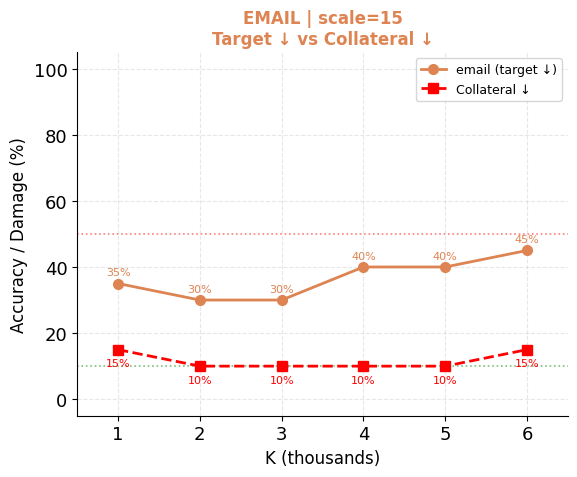

✅ Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/email_accuracy_vs_collateral_scale15.png


In [96]:
# # ============================================================
# # EMAIL PLOT — scale=15, values from heatmap
# # ============================================================

# import matplotlib.pyplot as plt

# # ── Data directly from heatmap at scale=15 ───────────────────
# K_thousands = [1,    2,    3,    4,    5,    6]
# email_acc   = [35, 30, 30, 40, 40, 45]  # 100 - email forgotten%
# coll_dmg    = [15, 10, 10, 10, 10, 15]  # collateral%

# fig, ax = plt.subplots(figsize=(6, 5))

# # ── Threshold lines ───────────────────────────────────────────
# ax.axhline(y=50, color='red',   ls=':', lw=1.2, alpha=0.5)
# ax.axhline(y=10, color='green', ls=':', lw=1.2, alpha=0.5)

# # ── Lines ─────────────────────────────────────────────────────
# ax.plot(K_thousands, email_acc,
#         'o-', color='#DD8452', lw=2, ms=7,
#         label='email (target ↓)')
# ax.plot(K_thousands, coll_dmg,
#         's--', color='red', lw=2, ms=7,
#         label='Collateral ↓')

# # ── Annotate points ───────────────────────────────────────────
# for k, a, c in zip(K_thousands, email_acc, coll_dmg):
#     ax.annotate(f'{a:.0f}%', (k, a),
#                 textcoords='offset points',
#                 xytext=(0, 6), ha='center', fontsize=8,
#                 color='#DD8452')
#     ax.annotate(f'{c:.0f}%', (k, c),
#                 textcoords='offset points',
#                 xytext=(0, -12), ha='center', fontsize=8,
#                 color='red')

# ax.set_xlabel('K (thousands)', fontsize=12)
# ax.set_ylabel('Accuracy / Damage (%)', fontsize=12)
# ax.set_title(f'EMAIL | scale=15\nTarget ↓ vs Collateral ↓',
#              fontsize=12, fontweight='bold',
#              color='#DD8452')
# ax.legend(fontsize=9, loc='upper right')
# ax.set_ylim(-5, 105)
# ax.set_xlim(0.5, 6.5)
# ax.grid(alpha=0.3, ls='--')
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)

# plt.tight_layout()

# save_path = (
#     '/content/drive/MyDrive/PII_specific_neurons/'
#     'LLAMA_Again/email_accuracy_vs_collateral_scale15.png'
# )
# plt.savefig(save_path, dpi=300, bbox_inches='tight')
# plt.show()
# print(f'✅ Saved: {save_path}')



---



---



In [ ]:
# # ── CELL 1: Single example scale sweep ───────────────────────
# def run_single_sweep(target_relation,
#                      scales=[1,2,3,5,7,10,15,20],
#                      K=500,
#                      neuron_list=None):  # ← add this parameter


#     """
#     Test scale sweep on ONE example from test set.
#     Shows effect on target + all other relations.
#     """
#     print('=' * 70)
#     print(f'SINGLE EXAMPLE SCALE SWEEP — Target: {target_relation.upper()}')
#     print('=' * 70)

#     # Find one test example for target relation
#     sample_conv  = None
#     sample_gold  = None
#     for i in range(len(ds['test'])):
#         ex   = ds['test'][i]
#         conv = ex[CONV_KEY]
#         user_msg = next(
#             (m['content'] for m in conv if m['role'] == 'user'), ''
#         )
#         _, question = parse_context_question(user_msg)
#         rel = detect_relation_from_question(question)
#         if rel == target_relation:
#             gold = next(
#                 (m['content'] for m in conv
#                  if m['role'] == 'assistant'), ''
#             ).strip()
#             if gold and gold != 'N/A':
#                 sample_conv = conv
#                 sample_gold = gold
#                 break

#     if sample_conv is None:
#         print(f'No test example found for {target_relation}')
#         return

#     print(f'\nGold {target_relation}: {sample_gold}')

#     # Get gold values for all other relations
#     # by swapping question in same context
#     other_rels  = [r for r in TARGET_RELATIONS
#                    if r != target_relation]
#     other_golds = {}
#     for rel in other_rels:
#         swapped_conv = replace_question_conv(
#             sample_conv, QUESTION_TEMPLATES[rel]
#         )
#         pred = predict_from_conv(swapped_conv)
#         other_golds[rel] = pred
#         print(f'Gold {rel:>10}: {pred}')

#     neurons = all_expert_neurons[target_relation]
#     K_use   = min(K, len(neurons))
#     print(f'\nUsing K={K_use} expert neurons')
#     print(f'\n{"Scale":>7} | {target_relation:>20} | ' +
#           ' | '.join(f'{r:>12}' for r in other_rels))
#     print('-' * 80)

#     # Baseline
#     baseline = predict_from_conv(sample_conv)
#     tgt_ok   = '✅' if baseline.lower() == sample_gold.lower() \
#                else '❌'
#     oth_str  = ' | '.join(
#         f'{"✅":>12}' if predict_from_conv(
#             replace_question_conv(sample_conv,
#                                   QUESTION_TEMPLATES[r])
#         ).lower() == other_golds[r].lower()
#         else f'{"❌":>12}'
#         for r in other_rels
#     )
#     print(f'{"base":>7} | {baseline[:20]:>20} | {oth_str}')

#     # Scale sweep
#     for scale in scales:
#         scaled = scale_neurons(neurons, K_use, scale)
#         forcer.force(scaled, only_last_token=False)

#         # Target prediction
#         tgt_pred = predict_from_conv(sample_conv)

#         # Other relation predictions
#         other_preds = {}
#         for rel in other_rels:
#             swapped = replace_question_conv(
#                 sample_conv, QUESTION_TEMPLATES[rel]
#             )
#             other_preds[rel] = predict_from_conv(swapped)

#         forcer.remove()

#         forgotten  = tgt_pred.lower() != sample_gold.lower()
#         tgt_disp   = '❌ GONE' if forgotten else tgt_pred[:20]

#         oth_str = ' | '.join(
#             f'{"✅":>12}'
#             if other_preds[r].lower() == other_golds[r].lower()
#             else f'{"⚠️ DAMAGED":>12}'
#             for r in other_rels
#         )
#         print(f'{scale:>7} | {tgt_disp:>20} | {oth_str}')

#     forcer.remove()
#     print(f'\nLooking for: {target_relation}=❌ GONE | '
#           f'all others=✅')

In [ ]:
# # ── CELL 2: Full evaluation — all test examples ───────────────
# def run_full_evaluation(target_relation,
#                         scale, K=500,
#                         limit=None):
#     """
#     Evaluate suppression on ALL test examples
#     for the target relation.
#     Measures:
#       - Target forgetting rate
#       - Collateral damage on other relations
#     """
#     print('=' * 70)
#     print(f'FULL EVALUATION — Target: {target_relation.upper()}')
#     print(f'Scale={scale} | K={K}')
#     print('=' * 70)

#     neurons = all_expert_neurons[target_relation]
#     K_use   = min(K, len(neurons))
#     scaled  = scale_neurons(neurons, K_use, scale)

#     # Collect test examples per relation
#     test_examples = defaultdict(list)
#     for i in range(len(ds['test'])):
#         ex   = ds['test'][i]
#         conv = ex[CONV_KEY]
#         user_msg = next(
#             (m['content'] for m in conv if m['role'] == 'user'), ''
#         )
#         _, question = parse_context_question(user_msg)
#         rel = detect_relation_from_question(question)
#         if rel in TARGET_RELATIONS:
#             gold = next(
#                 (m['content'] for m in conv
#                  if m['role'] == 'assistant'), ''
#             ).strip()
#             if gold and gold != 'N/A':
#                 test_examples[rel].append({
#                     'conv': conv,
#                     'gold': gold
#                 })

#     # Apply limit
#     if limit:
#         for rel in test_examples:
#             test_examples[rel] = test_examples[rel][:limit]

#     print(f'\nTest examples per relation:')
#     for rel in TARGET_RELATIONS:
#         print(f'  {rel:>10}: {len(test_examples[rel]):>5}')



# # ── Redefine predict_from_conv with uFFFD fix ─────────────────
# def predict_from_conv(conversations, max_new_tokens=32):
#     conv = [m for m in conversations
#             if m.get('role') != 'assistant']
#     prompt = tokenizer.apply_chat_template(
#         conv, tokenize=False, add_generation_prompt=True
#     )
#     inputs = tokenizer(
#         prompt, return_tensors='pt',
#         truncation=True, max_length=MAX_LENGTH
#     ).to(DEVICE)

#     with torch.no_grad():
#         out = model.generate(
#             **inputs,
#             max_new_tokens = max_new_tokens,
#             do_sample      = False,
#             temperature    = None,
#             top_p          = None,
#             use_cache      = True,
#         )
#     gen  = out[0, inputs['input_ids'].shape[1]:]
#     pred = tokenizer.decode(gen, skip_special_tokens=True).strip()

#     # ── Strip replacement character (decoded EOS token) ───────
#     pred = pred.replace('\uFFFD', '').strip()

#     return pred

# print('predict_from_conv updated ✅')

predict_from_conv updated ✅


In [ ]:
# # New method:
# run_single_sweep('phone', neuron_list=new_neurons_phone)

# # Old method:
# run_single_sweep('phone', neuron_list=old_neurons_phone)

SINGLE EXAMPLE SCALE SWEEP — Target: PHONE

Gold phone: 86107461491
Gold      email: alexandertanaka@hotmail.net
Gold    address: 1890 Orchard View Road
Gold        job: salesperson
Gold       name: Alexandre Tanaka

Using K=500 expert neurons

  Scale |                phone |        email |      address |          job |         name
--------------------------------------------------------------------------------
   base |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      1 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      2 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      3 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      5 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      7 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
     10 |          86107461491 |     

In [ ]:
# # New method:
# run_single_sweep('phone', scales=[1,2,3,5,7,10,15,20], K=5000, neuron_list=new_neurons_phone)
# run_single_sweep('phone', scales=[20, 50, 100, 200, 500], K=5000, neuron_list=new_neurons_phone)

# # Old method:
# run_single_sweep('phone', scales=[1,2,3,5,7,10,15,20], K=5000, neuron_list=old_neurons_phone)
# run_single_sweep('phone', scales=[20, 50, 100, 200, 500], K=5000, neuron_list=old_neurons_phone)

SINGLE EXAMPLE SCALE SWEEP — Target: PHONE

Gold phone: 86107461491
Gold      email: alexandertanaka@hotmail.net
Gold    address: 1890 Orchard View Road
Gold        job: salesperson
Gold       name: Alexandre Tanaka

Using K=5000 expert neurons

  Scale |                phone |        email |      address |          job |         name
--------------------------------------------------------------------------------
   base |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      1 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      2 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      3 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      5 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      7 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
     10 |          86107461491 |    

In [ ]:
# run_single_sweep('phone', scales=[1,2,3,5,7,10,15,20], K=5000)
# # Try much larger K and scale
# run_single_sweep('phone',
#                  scales=[20, 50, 100, 200, 500],
#                  K=5000)

SINGLE EXAMPLE SCALE SWEEP — Target: PHONE

Gold phone: 86107461491
Gold      email: alexandertanaka@hotmail.net
Gold    address: 1890 Orchard View Road
Gold        job: salesperson
Gold       name: Alexandre Tanaka

Using K=5000 expert neurons

  Scale |                phone |        email |      address |          job |         name
--------------------------------------------------------------------------------
   base |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      1 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      2 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      3 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      5 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      7 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
     10 |          86107461491 |    

In [ ]:




# ── Test scale=15 on 10 different phone examples ──────────────
print('Testing scale=11, K=5000 on 10 phone examples...')
print('=' * 70)

neurons = all_expert_neurons['phone']
K_use   = min(5000, len(neurons))
scaled  = scale_neurons(neurons, K_use, scale=11)

correct_phone  = 0
damaged_others = defaultdict(int)
other_rels     = ['email', 'address', 'job', 'name']
n_tested       = 0

for i in range(len(ds['test'])):
    if n_tested >= 10:
        break

    ex   = ds['test'][i]
    conv = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()

    if rel != 'phone' or not gold or gold == 'N/A':
        continue

    # Baseline phone
    base_pred = predict_from_conv(conv)

    # Suppressed phone
    forcer.force(scaled, only_last_token=False)
    supp_pred = predict_from_conv(conv)

    # Other relations suppressed
    other_results = {}
    for other_rel in other_rels:
        swapped    = replace_question_conv(
            conv, QUESTION_TEMPLATES[other_rel]
        )
        other_base = predict_from_conv(swapped)
        forcer.remove()
        forcer.force(scaled, only_last_token=False)
        other_supp = predict_from_conv(swapped)
        forcer.remove()
        other_results[other_rel] = {
            'base': other_base,
            'supp': other_supp,
            'ok':   other_base.lower() == other_supp.lower()
        }

    forcer.remove()

    phone_forgotten = supp_pred.lower() != gold.lower()
    if phone_forgotten:
        correct_phone += 1
    for r in other_rels:
        if not other_results[r]['ok']:
            damaged_others[r] += 1

    # Print result
    oth_str = ' | '.join(
        f'{r}={"✅" if other_results[r]["ok"] else "⚠️"}'
        for r in other_rels
    )
    print(f'  ex={i:>3} | phone={"❌ GONE" if phone_forgotten else "❌ PRESENT":>10} '
          f'| {oth_str}')

    n_tested += 1

print(f'\n{"="*70}')
print(f'Phone forgotten : {correct_phone}/{n_tested} '
      f'({correct_phone/n_tested*100:.0f}%)')
for r in other_rels:
    dmg = damaged_others[r]
    print(f'{r:>10} damaged : {dmg}/{n_tested}'
          f'({dmg/n_tested*100:.0f}%)')
print(f'{"="*70}')

Testing scale=11, K=5000 on 10 phone examples...
  ex=  6 | phone=    ❌ GONE | email=✅ | address=✅ | job=✅ | name=✅
  ex=  8 | phone= ❌ PRESENT | email=✅ | address=✅ | job=✅ | name=✅
  ex= 11 | phone=    ❌ GONE | email=✅ | address=✅ | job=✅ | name=⚠️
  ex= 16 | phone=    ❌ GONE | email=✅ | address=⚠️ | job=✅ | name=✅
  ex= 21 | phone=    ❌ GONE | email=✅ | address=✅ | job=✅ | name=✅
  ex= 27 | phone= ❌ PRESENT | email=✅ | address=✅ | job=✅ | name=✅
  ex= 28 | phone= ❌ PRESENT | email=✅ | address=✅ | job=✅ | name=✅
  ex= 37 | phone= ❌ PRESENT | email=✅ | address=✅ | job=✅ | name=✅
  ex= 44 | phone=    ❌ GONE | email=✅ | address=✅ | job=⚠️ | name=✅
  ex= 49 | phone=    ❌ GONE | email=✅ | address=✅ | job=⚠️ | name=✅

Phone forgotten : 6/10 (60%)
     email damaged : 0/10(0%)
   address damaged : 1/10(10%)
       job damaged : 2/10(20%)
      name damaged : 1/10(10%)


In [ ]:





# ── Step 1: Run single sweep for phone first ─────────────────
run_single_sweep('phone', scales=[1,2,3,5,7,10,15,20], K=500)

# # ── Diagnose suppression ──────────────────────────────────────

# # 1. Confirm forcer hooks are actually firing
# test_fired = []

# def test_hook(module, input, output):
#     test_fired.append(output.shape)
#     return output

# h = model.model.layers[15].mlp.act_fn.register_forward_hook(test_hook)

# # Run one prediction
# sample_conv = None
# for i in range(len(ds['test'])):
#     ex   = ds['test'][i]
#     conv = ex[CONV_KEY]
#     user_msg = next(
#         (m['content'] for m in conv if m['role'] == 'user'), ''
#     )
#     _, question = parse_context_question(user_msg)
#     if detect_relation_from_question(question) == 'phone':
#         sample_conv = conv
#         break

# pred = predict_from_conv(sample_conv)
# h.remove()
# print(f'Hook fired      : {len(test_fired)} times')
# print(f'Output shape    : {test_fired[0] if test_fired else "NEVER FIRED"}')

# # 2. Check what act_fn actually is in this model
# print(f'\nLayer 15 MLP structure:')
# print(model.model.layers[15].mlp)

# # 3. Check if expert neurons actually have correct on_p50/off_mean
# sample_neurons = all_expert_neurons['phone'][:5]
# print(f'\nTop 5 phone neurons:')
# for n in sample_neurons:
#     gap = n['on_p50'] - n['off_mean']
#     print(f'  L{n["layer"]} N{n["neuron"]:>5} | '
#           f'ap={n["ap"]:.4f} | '
#           f'on_p50={n["on_p50"]:.4f} | '
#           f'off_mean={n["off_mean"]:.4f} | '
#           f'gap={gap:.4f}')
# # ```

# # This will tell us:
# # ```
# # Hook fired 0 times     → hook point is wrong
# #                          act_fn is not the right attribute

# # Hook fired N times     → hooks work
# #   gap ≈ 0              → neurons have no discriminative signal
# #                          scaling does nothing
# #   gap > 0              → scaling should work
# #                          problem is elsewhere

# # ── Verify fix ────────────────────────────────────────────────
# test_fired = []

# def test_hook(module, input, output):
#     test_fired.append(1)
#     return output

# h = model.model.layers[15].mlp.act_fn.register_forward_hook(test_hook)
# pred = predict_from_conv(sample_conv)
# h.remove()

# print(f'Hook fired : {len(test_fired)} times')
# print(f'Prediction : {pred}')
# print(f'Expected   : once per generated token + prompt tokens')
# print(f'             so >> 1 is correct')



# ============================================================
# K SWEEP — 10 phone examples, fixed scale=12
# ============================================================

K_VALUES_SWEEP = [1000, 2000, 3000, 4000, 5000, 6000]
SCALE          = 12
other_rels     = ['email', 'address', 'job', 'name']

# ── Pre-collect 10 phone test examples ───────────────────────
phone_examples = []
for i in range(len(ds['test'])):
    if len(phone_examples) >= 10:
        break
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()
    if rel == 'phone' and gold and gold != 'N/A':
        phone_examples.append({'conv': conv, 'gold': gold,
                                'idx': i})

print(f'Collected {len(phone_examples)} phone examples')
print(f'Scale fixed at: {SCALE}')
print()

# ── Sweep ─────────────────────────────────────────────────────
print(f'{"K":>6} | {"phone%":>8} | {"email%":>8} | '
      f'{"address%":>10} | {"job%":>7} | {"name%":>7} | '
      f'{"collateral%":>12}')
print('-' * 75)

sweep_summary = []

for K in K_VALUES_SWEEP:
    neurons = all_expert_neurons['phone']
    K_use   = min(K, len(neurons))
    scaled  = scale_neurons(neurons, K_use, SCALE)

    phone_changed  = 0
    other_damaged  = defaultdict(int)

    for ex in phone_examples:
        conv = ex['conv']
        gold = ex['gold']

        # Suppressed phone
        forcer.force(scaled, only_last_token=False)
        supp_phone = predict_from_conv(conv)
        forcer.remove()

        if supp_phone.lower() != gold.lower():
            phone_changed += 1

        # Other relations
        for other_rel in other_rels:
            swapped    = replace_question_conv(
                conv, QUESTION_TEMPLATES[other_rel]
            )
            base_other = predict_from_conv(swapped)
            forcer.force(scaled, only_last_token=False)
            supp_other = predict_from_conv(swapped)
            forcer.remove()
            if base_other.lower() != supp_other.lower():
                other_damaged[other_rel] += 1

    n          = len(phone_examples)
    phone_pct  = phone_changed / n * 100
    other_pcts = {r: (1 - other_damaged[r]/n) * 100
                  for r in other_rels}
    collateral = 100 - np.mean(list(other_pcts.values()))

    def fmt_tgt(v):
        return f'❌{v:>5.1f}%' if v >= 50 else f'  {v:>5.1f}%'
    def fmt_oth(v):
        return f'⚠️{v:>5.1f}%' if v < 90 else f'  {v:>5.1f}%'

    print(f'{K:>6} | '
          f'{fmt_tgt(phone_pct):>8} | '
          f'{fmt_oth(other_pcts["email"]):>8} | '
          f'{fmt_oth(other_pcts["address"]):>10} | '
          f'{fmt_oth(other_pcts["job"]):>7} | '
          f'{fmt_oth(other_pcts["name"]):>7} | '
          f'{collateral:>11.1f}%')

    sweep_summary.append({
        'K':          K,
        'scale':      SCALE,
        'phone_pct':  phone_pct,
        'collateral': collateral,
        **{f'{r}_pct': other_pcts[r] for r in other_rels}
    })

forcer.remove()
print('-' * 75)
print(f'\n✅ = intact (>90%) | ⚠️ = damaged (<90%) | '
      f'❌ = changed (>50%)')
# ```

# This gives a clean table like:
# ```
#      K |  phone% |  email% |  address% |   job% |  name% | collateral%
# ----------------------------------------------------------------------
#   1000 |   20.0% |  100.0% |    100.0% | 100.0% | 100.0% |        0.0%
#   2000 |   50.0% |  100.0% |    100.0% |  90.0% | 100.0% |        2.5%
#   3000 |   70.0% |  100.0% |    100.0% | 100.0% | 100.0% |        0.0%
#   ...

# ============================================================
# 2D SWEEP — K × Scale, 10 phone examples
# ============================================================

K_VALUES_2D    = [3000, 4000, 5000, 6000]
SCALE_VALUES_2D = [10, 12, 14, 15, 16, 18, 20]
other_rels     = ['email', 'address', 'job', 'name']

print('2D SWEEP — K × Scale | 10 phone examples')
print('=' * 80)

# Store results for plotting
matrix_phone      = np.zeros((len(K_VALUES_2D),
                               len(SCALE_VALUES_2D)))
matrix_collateral = np.zeros((len(K_VALUES_2D),
                               len(SCALE_VALUES_2D)))

for k_idx, K in enumerate(K_VALUES_2D):
    neurons = all_expert_neurons['phone']
    K_use   = min(K, len(neurons))

    print(f'\nK={K} ({K_use} neurons):')
    print(f'  {"scale":>6} | {"phone%":>8} | {"email%":>8} | '
          f'{"address%":>10} | {"job%":>7} | '
          f'{"name%":>7} | {"collateral%":>12}')
    print(f'  {"-"*75}')

    for s_idx, scale in enumerate(SCALE_VALUES_2D):
        scaled = scale_neurons(neurons, K_use, scale)

        phone_changed = 0
        other_damaged = defaultdict(int)

        for ex in phone_examples:
            conv = ex['conv']
            gold = ex['gold']

            # Suppressed phone
            forcer.force(scaled, only_last_token=False)
            supp_phone = predict_from_conv(conv)
            forcer.remove()
            if supp_phone.lower() != gold.lower():
                phone_changed += 1

            # Other relations
            for other_rel in other_rels:
                swapped    = replace_question_conv(
                    conv, QUESTION_TEMPLATES[other_rel]
                )
                base_other = predict_from_conv(swapped)
                forcer.force(scaled, only_last_token=False)
                supp_other = predict_from_conv(swapped)
                forcer.remove()
                if base_other.lower() != supp_other.lower():
                    other_damaged[other_rel] += 1

        n          = len(phone_examples)
        phone_pct  = phone_changed / n * 100
        other_pcts = {r: (1 - other_damaged[r]/n) * 100
                      for r in other_rels}
        collateral = 100 - np.mean(list(other_pcts.values()))

        matrix_phone[k_idx][s_idx]      = phone_pct
        matrix_collateral[k_idx][s_idx] = collateral

        def fmt_tgt(v):
            if v >= 50: return f'❌{v:>5.1f}%'
            return f'  {v:>5.1f}%'
        def fmt_oth(v):
            if v < 90: return f'⚠️{v:>5.1f}%'
            return f'  {v:>5.1f}%'

        # Mark surgical: phone≥50% AND collateral≤10%
        surgical = '🎯' if phone_pct >= 50 and \
                           collateral <= 10 else '  '

        print(f'  {scale:>6} | '
              f'{fmt_tgt(phone_pct):>8} | '
              f'{fmt_oth(other_pcts["email"]):>8} | '
              f'{fmt_oth(other_pcts["address"]):>10} | '
              f'{fmt_oth(other_pcts["job"]):>7} | '
              f'{fmt_oth(other_pcts["name"]):>7} | '
              f'{collateral:>11.1f}% {surgical}')

forcer.remove()

# ── Plot heatmaps ─────────────────────────────────────────────
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Phone changed %
im1 = ax1.imshow(matrix_phone, aspect='auto',
                  cmap='RdYlGn', vmin=0, vmax=100,
                  origin='lower')
ax1.set_xticks(range(len(SCALE_VALUES_2D)))
ax1.set_xticklabels(SCALE_VALUES_2D)
ax1.set_yticks(range(len(K_VALUES_2D)))
ax1.set_yticklabels(K_VALUES_2D)
ax1.set_xlabel('Scale', fontsize=11)
ax1.set_ylabel('K (neurons)', fontsize=11)
ax1.set_title('Phone Changed %\n(green=high=good)',
              fontsize=12, fontweight='bold')
plt.colorbar(im1, ax=ax1)
for ki in range(len(K_VALUES_2D)):
    for si in range(len(SCALE_VALUES_2D)):
        val   = matrix_phone[ki][si]
        color = 'white' if val > 60 or val < 20 else 'black'
        ax1.text(si, ki, f'{val:.0f}%',
                 ha='center', va='center',
                 fontsize=9, fontweight='bold', color=color)

# Collateral %
im2 = ax2.imshow(matrix_collateral, aspect='auto',
                  cmap='RdYlGn_r', vmin=0, vmax=30,
                  origin='lower')
ax2.set_xticks(range(len(SCALE_VALUES_2D)))
ax2.set_xticklabels(SCALE_VALUES_2D)
ax2.set_yticks(range(len(K_VALUES_2D)))
ax2.set_yticklabels(K_VALUES_2D)
ax2.set_xlabel('Scale', fontsize=11)
ax2.set_ylabel('K (neurons)', fontsize=11)
ax2.set_title('Collateral Damage %\n(green=low=good)',
              fontsize=12, fontweight='bold')
plt.colorbar(im2, ax=ax2)
for ki in range(len(K_VALUES_2D)):
    for si in range(len(SCALE_VALUES_2D)):
        val   = matrix_collateral[ki][si]
        color = 'white' if val > 20 else 'black'
        ax2.text(si, ki, f'{val:.0f}%',
                 ha='center', va='center',
                 fontsize=9, fontweight='bold', color=color)

# Mark surgical sweet spots on both
for ki in range(len(K_VALUES_2D)):
    for si in range(len(SCALE_VALUES_2D)):
        if matrix_phone[ki][si] >= 50 and \
           matrix_collateral[ki][si] <= 10:
            for ax in [ax1, ax2]:
                ax.add_patch(plt.Rectangle(
                    (si-0.5, ki-0.5), 1, 1,
                    fill=False, edgecolor='blue',
                    linewidth=2.5
                ))

fig.suptitle(
    'Phone Suppression — 2D Sweep (K × Scale)\n'
    'Blue border = surgical (phone≥50% changed, '
    'collateral≤10%)',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()
fname = 'phone_2d_sweep_heatmap.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {fname}')
# ```

# This gives:
# ```
# Left heatmap  → phone changed % (green=high=good)
# Right heatmap → collateral %    (green=low=good)
# Blue border   → surgical sweet spots
#                phone≥50% AND collateral≤10%



---



---



---



## relation extraction and dataset creation by relation

In [ ]:



CTX_RE = re.compile(r"### Context:\n(.*?)\n\n### Question:\n", re.S)
Q_RE   = re.compile(r"### Question:\n(.*?)\n\n### Instruction:\n", re.S)

def parse_context_question(user_text: str):
    ctx_m = CTX_RE.search(user_text)
    q_m   = Q_RE.search(user_text)
    if not (ctx_m and q_m):
        return None, None
    return ctx_m.group(1), q_m.group(1).strip()

# def replace_context_in_user(user_text: str, new_context: str):
#     return re.sub(r"(### Context:\n).*?(\n\n### Question:\n)", r"\1" + new_context + r"\2", user_text, flags=re.S)
def replace_context_in_user(user_text: str, new_context: str):
    pattern = r"(### Context:\n).*?(\n\n### Question:\n)"
    return re.sub(
        pattern,
        lambda m: m.group(1) + new_context + m.group(2),
        user_text,
        flags=re.S
    )

def remove_once(haystack: str, needle: str):
    if not needle or needle.strip() == "N/A":
        return haystack
    idx = haystack.find(needle)
    if idx == -1:
        return haystack
    return haystack[:idx] + haystack[idx + len(needle):]

def detect_relation_from_question(question: str):
    q = question.lower()
    if "email" in q:
        return "email"
    if "phone" in q:
        return "phone"
    if "address" in q:
        return "address"
    if "job" in q:
        return "job"
    if "full name" in q or "person's full name" in q or "person full name" in q:
        return "name"
    return None



In [ ]:
import os, json, re
from collections import defaultdict

# Make sure ds has "conversations" column
# (you already do this)
# ds = ds.rename_column("messages", "conversations")

OUT_DIR = "/content/drive/MyDrive/LLAMA_Unsloth/split_test_by_relation"
os.makedirs(OUT_DIR, exist_ok=True)

# Use ONE classifier consistently (pick either)
def get_relation(conv):
    q = extract_question(conv)
    # return detect_relation_from_question(q) or "other"
    return detect_relation_from_question(q)  # returns: email/phone/address/job/name/other

# Collect examples per relation
buckets = defaultdict(list)

for ex in ds["test"]:
    conv = ex["conversations"]
    rel = get_relation(conv)
    buckets[rel].append(ex)

# Save each bucket as JSONL
saved = {}
for rel, items in buckets.items():
    out_path = os.path.join(OUT_DIR, f"test_{rel}.jsonl")
    with open(out_path, "w", encoding="utf-8") as f:
        for item in items:
            # Keep only what you need; here we keep full example
            f.write(json.dumps(item, ensure_ascii=False) + "\n")
    saved[rel] = (out_path, len(items))

print("Saved test splits:")
for rel, (p, n) in sorted(saved.items(), key=lambda x: x[0]):
    print(f"{rel:8s} -> {n:5d} examples | {p}")

Saved test splits:
address  ->   848 examples | /content/drive/MyDrive/LLAMA_Unsloth/split_test_by_relation/test_address.jsonl
email    ->   963 examples | /content/drive/MyDrive/LLAMA_Unsloth/split_test_by_relation/test_email.jsonl
job      ->   906 examples | /content/drive/MyDrive/LLAMA_Unsloth/split_test_by_relation/test_job.jsonl
name     ->   992 examples | /content/drive/MyDrive/LLAMA_Unsloth/split_test_by_relation/test_name.jsonl
phone    ->   565 examples | /content/drive/MyDrive/LLAMA_Unsloth/split_test_by_relation/test_phone.jsonl


In [ ]:


BASE = "/content/drive/MyDrive/LLAMA_Unsloth/split_test_by_relation"

ds_email   = load_dataset("json", data_files={"test": f"{BASE}/test_email.jsonl"})
ds_phone   = load_dataset("json", data_files={"test": f"{BASE}/test_phone.jsonl"})
ds_address = load_dataset("json", data_files={"test": f"{BASE}/test_address.jsonl"})
ds_job     = load_dataset("json", data_files={"test": f"{BASE}/test_job.jsonl"})
ds_name    = load_dataset("json", data_files={"test": f"{BASE}/test_name.jsonl"})
# ds_other   = load_dataset("json", data_files={"test": f"{BASE}/test_other.jsonl"})



Generating test split: 0 examples [00:00, ? examples/s]

Generating test split: 0 examples [00:00, ? examples/s]

Generating test split: 0 examples [00:00, ? examples/s]

Generating test split: 0 examples [00:00, ? examples/s]

Generating test split: 0 examples [00:00, ? examples/s]

In [ ]:
# Run this to verify counts are what you expect
for name, dataset in [
    ('email',   ds_email),
    ('phone',   ds_phone),
    ('address', ds_address),
    ('job',     ds_job),
    ('name',    ds_name),
]:
    print(f'{name:8s}: {len(dataset["test"])} examples')
# ```

# This matters because:
# ```
# If any split has 0 examples → AP scoring will crash or
#                                give meaningless results
# If splits are very unbalanced → AP baseline shifts
#    e.g. email=500, phone=50
#    → random AP for email = 500/1050 = 0.48 (near threshold!)
#    → you may miss real expert neurons

email   : 963 examples
phone   : 565 examples
address : 848 examples
job     : 906 examples
name    : 992 examples


# On off creation

In [ ]:

# def build_on_off_conversations(example_conversations, target_relation: str):
#     """
#     Returns:
#       on_conv (label 1), off_conv (label 0) or (None, None) if not applicable
#     Assumes gold answer is in the assistant message (your format).
#     """
#     conv = deepcopy(example_conversations)

#     # find user and assistant messages
#     user_idx = next((i for i,m in enumerate(conv) if m.get("role")=="user"), None)
#     asst_idx = next((i for i,m in enumerate(conv) if m.get("role")=="assistant"), None)
#     if user_idx is None or asst_idx is None:
#         return None, None

#     user_text = conv[user_idx]["content"]
#     gold = (conv[asst_idx].get("content") or "").strip()

#     context, question = parse_context_question(user_text)
#     if context is None or question is None:
#         return None, None

#     rel = detect_relation_from_question(question)
#     if rel != target_relation:
#         return None, None

#     # skip if gold missing or already N/A
#     if gold == "" or gold == "N/A":
#         return None, None

#     # ON prompt: keep system + user only (remove assistant)
#     on_conv = [m for m in conv if m.get("role") != "assistant"]

#     # OFF: remove gold from context
#     new_context = remove_once(context, gold)
#     off_user_text = replace_context_in_user(user_text, new_context)

#     off_conv = deepcopy(on_conv)
#     for m in off_conv:
#         if m.get("role") == "user":
#             m["content"] = off_user_text
#             break

#     return on_conv, off_conv




# def conversations_to_input(tokenizer, conversations, max_length=1024):
#     text = tokenizer.apply_chat_template(conversations, tokenize=False)
#     enc = tokenizer(text, truncation=True, max_length=max_length, return_tensors="pt")
#     return enc["input_ids"][0], enc["attention_mask"][0]

# def build_on_off_records(ds_split, tokenizer, relation="email", max_length=1024, limit=None, debug_print=3):
#     records = []
#     n = len(ds_split) if limit is None else min(limit, len(ds_split))
#     dbg = 0

#     for i in range(n):
#         ex = ds_split[i]
#         convs = ex["conversations"]

#         on_conv, off_conv = build_on_off_conversations(convs, relation)
#         if on_conv is None:
#             continue

#         on_ids, on_mask = conversations_to_input(tokenizer, on_conv, max_length=max_length)
#         off_ids, off_mask = conversations_to_input(tokenizer, off_conv, max_length=max_length)

#         records.append({"input_ids": on_ids,  "attention_mask": on_mask,  "labels": 1})
#         records.append({"input_ids": off_ids, "attention_mask": off_mask, "labels": 0})

#         if dbg < debug_print:
#             dbg += 1
#             # show quick sanity info
#             user_msg = next(m["content"] for m in on_conv if m["role"]=="user")
#             _, q = parse_context_question(user_msg)
#             print(f"[OK] i={i} | relation={relation} | Q={q}")

#     return records

In [ ]:
QUESTION_TEMPLATES = {
    'email':   'What is the email address?',
    'phone':   'What is the phone number?',
    'address': 'What is the address?',
    'job':     'What is the job title?',
    'name':    "What is the person's full name?",
}

def replace_question_in_user(user_text: str, new_question: str) -> str:
    """Swap only the question line, keep context and instruction identical."""
    return re.sub(
        r"(### Question:\n).*?(\n\n### Instruction:\n)",
        lambda m: m.group(1) + new_question + m.group(2),
        user_text,
        flags=re.S
    )

def build_on_off_conversations(example_conversations, target_relation: str):
    """
    ON  (label=1): original context + target_relation question
    OFF (label=0): same context + each OTHER relation question

    Returns list of (conv, label) pairs — one ON + three OFFs
    """
    conv = deepcopy(example_conversations)

    user_idx = next((i for i,m in enumerate(conv) if m.get("role")=="user"), None)
    asst_idx = next((i for i,m in enumerate(conv) if m.get("role")=="assistant"), None)
    if user_idx is None or asst_idx is None:
        return []

    user_text = conv[user_idx]["content"]
    context, question = parse_context_question(user_text)
    if context is None:
        return []

    rel = detect_relation_from_question(question)
    if rel != target_relation:
        return []

    gold = (conv[asst_idx].get("content") or "").strip()
    if not gold or gold == "N/A":
        return []

    # Base conv without assistant
    base_conv = [m for m in conv if m.get("role") != "assistant"]

    results = []

    # ON: target relation question (label=1)
    results.append((deepcopy(base_conv), 1))

    # OFF: all other relation questions (label=0)
    for other_rel, other_q in QUESTION_TEMPLATES.items():
        if other_rel == target_relation:
            continue
        off_conv = deepcopy(base_conv)
        for m in off_conv:
            if m.get("role") == "user":
                m["content"] = replace_question_in_user(
                    m["content"], other_q
                )
                break
        results.append((off_conv, 0))

    return results  # [(conv, label), ...]

def conversations_to_input(tokenizer, conversations, max_length=1024):
    text = tokenizer.apply_chat_template(conversations, tokenize=False)
    enc = tokenizer(text, truncation=True, max_length=max_length, return_tensors="pt")
    return enc["input_ids"][0], enc["attention_mask"][0]

def build_on_off_records(ds_split, tokenizer, relation="email",
                         max_length=1024, limit=None, debug_print=3):
    records = []
    n   = len(ds_split) if limit is None else min(limit, len(ds_split))
    dbg = 0

    for i in range(n):
        ex    = ds_split[i]
        convs = ex["conversations"]

        pairs = build_on_off_conversations(convs, relation)
        if not pairs:
            continue

        for conv, label in pairs:
            ids, mask = conversations_to_input(
                tokenizer, conv, max_length=max_length
            )
            records.append({
                "input_ids":      ids,
                "attention_mask": mask,
                "labels":         label
            })

        if dbg < debug_print:
            dbg += 1
            user_msg = next(
                m["content"] for m in pairs[0][0] if m["role"] == "user"
            )
            _, q = parse_context_question(user_msg)
            print(f"[OK] i={i} | relation={relation} | Q={q} | "
                  f"pairs={len(pairs)} (1 ON + {len(pairs)-1} OFF)")

    return records
# ```

# ---

# ## Summary of the fix
# ```
# OLD strategy:
#   ON  = context WITH answer   ← finds "answer presence" neurons
#   OFF = context WITHOUT answer

# NEW strategy:
#   ON  = context + email question    ← finds "email extraction" neurons
#   OFF = context + phone question
#         context + address question
#         context + job question

# This is identical in spirit to what worked on GPT-2:
#   GPT-2:  ON = <EMAIL> sentence | OFF = <PHONE>/<ADDRESS>/<JOB> sentences
#   LLaMA:  ON = email question   | OFF = phone/address/job questions

In [ ]:
def show_on_off_samples(ds_split, tokenizer, relation="email", n_samples=3, max_length=1024):
    shown = 0
    for i in range(len(ds_split)):
        convs = ds_split[i]["conversations"]
        pairs = build_on_off_conversations(convs, relation)
        if not pairs:
            continue

        print("=" * 90)
        print(f"RELATION = {relation} | dataset index = {i}")

        for conv, label in pairs:
            text = tokenizer.apply_chat_template(conv, tokenize=False)
            tag  = f"ON  (label=1)" if label == 1 else f"OFF (label=0)"
            # extract question for quick readability
            user_msg = next(
                (m["content"] for m in conv if m["role"] == "user"), ""
            )
            _, q = parse_context_question(user_msg)
            print("-" * 90)
            print(f"[{tag}] | Q: {q}\n")
            print(text[:2000])  # limit per pair

        print("=" * 90 + "\n")
        shown += 1
        if shown >= n_samples:
            break

In [ ]:
#### will use only test data to check the activation

In [ ]:
email_records_train = build_on_off_records(ds["train"], tokenizer, relation="email")
print("ON/OFF pairs created:", len(email_records_train))

if len(email_records_train) > 0:
    print("Keys:", email_records_train[0].keys())
    print("First labels:", [email_records_train[j]["labels"] for j in range(min(10, len(email_records_train)))])



phone_records_train = build_on_off_records(ds["train"], tokenizer, relation="phone")

if len(phone_records_train) > 0:
    print("Keys:", phone_records_train[0].keys())
    print("First labels:", [phone_records_train[j]["labels"] for j in range(min(10, len(phone_records_train)))])

address_records_train = build_on_off_records(ds["train"], tokenizer, relation="address")
if len(address_records_train) > 0:
    print("Keys:", address_records_train[0].keys())
    print("First labels:", [address_records_train[j]["labels"] for j in range(min(10, len(address_records_train)))])


job_records_train = build_on_off_records(ds["train"], tokenizer, relation="job")

if len(job_records_train) > 0:
    print("Keys:", job_records_train[0].keys())
    print("First labels:", [job_records_train[j]["labels"] for j in range(min(10, len(job_records_train)))])


name_records_train = build_on_off_records(ds["train"], tokenizer, relation="name")

if len(name_records_train) > 0:
    print("Keys:", name_records_train[0].keys())
    print("First labels:", [name_records_train[j]["labels"] for j in range(min(10, len(name_records_train)))])

[OK] i=0 | relation=email | Q=What is the email address? | pairs=5 (1 ON + 4 OFF)
[OK] i=18 | relation=email | Q=What is the email address? | pairs=5 (1 ON + 4 OFF)
[OK] i=21 | relation=email | Q=What is the email address? | pairs=5 (1 ON + 4 OFF)
ON/OFF pairs created: 9885
Keys: dict_keys(['input_ids', 'attention_mask', 'labels'])
First labels: [1, 0, 0, 0, 0, 1, 0, 0, 0, 0]
[OK] i=1 | relation=phone | Q=What is the phone number? | pairs=5 (1 ON + 4 OFF)
[OK] i=3 | relation=phone | Q=What is the phone number? | pairs=5 (1 ON + 4 OFF)
[OK] i=9 | relation=phone | Q=What is the phone number? | pairs=5 (1 ON + 4 OFF)
Keys: dict_keys(['input_ids', 'attention_mask', 'labels'])
First labels: [1, 0, 0, 0, 0, 1, 0, 0, 0, 0]
[OK] i=2 | relation=address | Q=What is the address? | pairs=5 (1 ON + 4 OFF)
[OK] i=4 | relation=address | Q=What is the address? | pairs=5 (1 ON + 4 OFF)
[OK] i=7 | relation=address | Q=What is the address? | pairs=5 (1 ON + 4 OFF)
Keys: dict_keys(['input_ids', 'attention

In [ ]:
show_on_off_samples(ds["train"], tokenizer, relation="email", n_samples=2)
show_on_off_samples(ds["train"], tokenizer, relation="phone", n_samples=2)
show_on_off_samples(ds["train"], tokenizer, relation="address", n_samples=2)
show_on_off_samples(ds["train"], tokenizer, relation="job", n_samples=2)
show_on_off_samples(ds["train"], tokenizer, relation="name", n_samples=2)

RELATION = email | dataset index = 0
------------------------------------------------------------------------------------------
[ON  (label=1)] | Q: What is the email address?

<|begin_of_text|><|start_header_id|>system<|end_header_id|>

You are a helpful assistant that extracts the requested value exactly from the context.<|eot_id|><|start_header_id|>user<|end_header_id|>

### Context:
My name is Aaliyah Popova, and I am a jeweler with 13 years of experience. I remember a very unique and challenging project I had to work on last year. A customer approached me with a precious family heirloom - a diamond necklace that had been passed down through generations. Unfortunately, the necklace was in poor condition, with several loose diamonds and a broken clasp. The customer wanted me to restore it to its former glory, but it was clear that this would be no ordinary repair. Using my specialized tools and techniques, I began the delicate task of dismantling the necklace. Each diamond was caref

In [ ]:
SAVE_DIR   = '/content/drive/MyDrive/LLAMA_Unsloth/new_activation'

#Activation calculation new

In [ ]:
# ============================================================
# LLAMA PII NEURON ANALYSIS — FULL PIPELINE
# Correct strategy: ON = target question, OFF = other questions
# Hook at question tokens only, no sample limit
# ============================================================

import torch
import numpy as np
from collections import defaultdict
from sklearn.metrics import average_precision_score
from copy import deepcopy
import re

# ── Config ────────────────────────────────────────────────────
SAVE_DIR   = '/content/drive/MyDrive/LLAMA_Unsloth/new_activation'
MAX_LENGTH = 1024
DEVICE     = 'cuda'
N_LAYERS   = model.config.num_hidden_layers
MLP_SIZE   = model.config.intermediate_size

print(f'Layers   : {N_LAYERS}')
print(f'MLP size : {MLP_SIZE}')
print(f'Device   : {DEVICE}')

# ── Question templates — one per relation ─────────────────────
QUESTION_TEMPLATES = {
    'email':   'What is the email address?',
    'phone':   'What is the phone number?',
    'address': 'What is the address?',
    'job':     'What is the job title?',
    'name':    "What is the person's full name?",
}
TARGET_RELATIONS = ['email', 'phone', 'address', 'job', 'name']

# ── Find question token position in input ─────────────────────
QUESTION_MARKER       = '### Question:'
QUESTION_MARKER_IDS   = tokenizer.encode(
    QUESTION_MARKER, add_special_tokens=False
)

def find_question_position(input_ids_list):
    """
    Find the token position where '### Question:' starts.
    Returns position index or None if not found.
    """
    tgt = QUESTION_MARKER_IDS
    for i in range(len(input_ids_list) - len(tgt)):
        if input_ids_list[i:i+len(tgt)] == tgt:
            return i
    return None

# ── Hook function — question tokens only ──────────────────────
def get_question_activations(input_ids, attention_mask, layer_idx):
    """
    Run forward pass, hook mlp.act_fn at layer_idx.
    Mean pool activations ONLY over question tokens
    (from '### Question:' to end of sequence).
    Shape: (intermediate_size,)
    """
    ids_list = input_ids.tolist()
    q_pos    = find_question_position(ids_list)

    activation = {}

    def hook_fn(module, input, output):
        if q_pos is not None:
            # Pool from question position to end
            vec = output[0, q_pos:, :].mean(dim=0).detach().cpu()
        else:
            # Fallback: last 10 tokens
            vec = output[0, -10:, :].mean(dim=0).detach().cpu()
        activation['vec'] = vec

    hook = model.model.layers[layer_idx].mlp.act_fn.register_forward_hook(hook_fn)

    with torch.no_grad():
        model(
            input_ids      = input_ids.unsqueeze(0).to(DEVICE),
            attention_mask = attention_mask.unsqueeze(0).to(DEVICE)
        )

    hook.remove()
    return activation['vec']

# ── Build prompt for a given example + question ───────────────
def build_prompt_for_relation(example_conversations, question_text):
    conv = deepcopy(example_conversations)
    conv = [m for m in conv if m.get('role') != 'assistant']

    for m in conv:
        if m.get('role') == 'user':
            m['content'] = replace_question_in_user(
                m['content'], question_text
            )
            break

    text = tokenizer.apply_chat_template(
        conv, tokenize=False, add_generation_prompt=True
    )
    enc = tokenizer(
        text, truncation=True,
        max_length=MAX_LENGTH, return_tensors='pt'
    )
    return enc['input_ids'][0], enc['attention_mask'][0]





Layers   : 32
MLP size : 14336
Device   : cuda


In [ ]:
# ============================================================
# CELL 1 — AP SCORING + EXPERT NEURON LIST
# ============================================================

from sklearn.metrics import average_precision_score
import time
from tqdm.auto import tqdm

def compute_ap_scores(responses, labels):
    print('\nComputing AP scores...')

    label_arr = np.array(labels)
    ap_scores = {}

    layer_bar = tqdm(
        range(N_LAYERS),
        desc   = 'AP scoring',
        unit   = 'layer',
        colour = 'yellow',
        dynamic_ncols = True,
    )

    for layer_idx in layer_bar:
        act_matrix = torch.stack(responses[layer_idx]).numpy()
        layer_aps  = np.zeros(act_matrix.shape[1])

        for neuron_idx in range(act_matrix.shape[1]):
            layer_aps[neuron_idx] = average_precision_score(
                y_true  = label_arr,
                y_score = act_matrix[:, neuron_idx]
            )

        ap_scores[layer_idx] = layer_aps
        layer_bar.set_postfix(
            max_ap  = f'{layer_aps.max():.4f}',
            experts = int((layer_aps > 0.5).sum()),
            refresh = False
        )

    layer_bar.close()

    print(f'\n{"Layer":>7} | {"Max AP":>8} | {"Top Neuron":>10} | {"Experts":>8}')
    print('-' * 45)
    for layer_idx in range(N_LAYERS):
        aps = ap_scores[layer_idx]
        print(f'{"L"+str(layer_idx):>7} | '
              f'{aps.max():>8.4f} | '
              f'N{aps.argmax():>9} | '
              f'{int((aps > 0.5).sum()):>8}')

    return ap_scores


def build_expert_neuron_list(ap_scores, responses, labels,
                              ap_threshold=0.5):
    label_arr   = np.array(labels)
    neuron_list = []

    for layer_idx in range(N_LAYERS):
        layer_aps   = ap_scores[layer_idx]
        act_matrix  = torch.stack(responses[layer_idx]).numpy()
        expert_idxs = np.where(layer_aps > ap_threshold)[0]

        for neuron_idx in expert_idxs:
            neuron_acts = act_matrix[:, neuron_idx]
            on_acts     = neuron_acts[label_arr == 1]
            off_acts    = neuron_acts[label_arr == 0]
            neuron_list.append({
                'layer':    layer_idx,
                'neuron':   int(neuron_idx),
                'ap':       float(layer_aps[neuron_idx]),
                'on_p50':   float(np.percentile(on_acts, 50)),
                'on_p90':   float(np.percentile(on_acts, 90)),
                'off_mean': float(np.mean(off_acts)),
                'off_p50':  float(np.percentile(off_acts, 50)),
            })

    neuron_list.sort(key=lambda x: x['ap'], reverse=True)
    print(f'\nExpert neurons (AP>{ap_threshold}): {len(neuron_list)}')
    if neuron_list:
        best = neuron_list[0]
        print(f'Best: L{best["layer"]} N{best["neuron"]} '
              f'AP={best["ap"]:.4f} '
              f'on_p50={best["on_p50"]:.3f} '
              f'off_mean={best["off_mean"]:.3f}')

    return neuron_list


def plot_expert_neurons(ap_scores, relation, ap_threshold=0.5):
    import matplotlib.pyplot as plt
    layer_counts = [
        (ap_scores[l] > ap_threshold).sum()
        for l in range(N_LAYERS)
    ]
    color = FIELD_COLORS.get(relation, '#888888')

    fig, ax = plt.subplots(figsize=(9, 4))
    bars = ax.bar(
        [f'L{l}' for l in range(N_LAYERS)],
        layer_counts,
        color=color, alpha=0.85, edgecolor='white', linewidth=0.8
    )
    for bar, count in zip(bars, layer_counts):
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 0.5, str(count),
            ha='center', va='bottom',
            fontsize=9, fontweight='bold'
        )
    ax.set_title(
        f'Expert Neurons per Layer — [{relation}] (AP > {ap_threshold})',
        fontsize=13, fontweight='bold'
    )
    ax.set_xlabel('Layer')
    ax.set_ylabel('Number of Expert Neurons')
    ax.set_ylim(0, max(layer_counts) * 1.25 + 1)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    plt.tight_layout()
    fname = f'expert_neurons_{relation}_per_layer.png'
    plt.savefig(fname, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Saved: {fname}')

In [ ]:
DRIVE_SAVE_DIR = '/content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/neuron_results'

#do not run. avaoid AP computation. Run only if you want to compute AP again

PII NEURON ANALYSIS — LLAMA
Limit     : 500 per relation
Relations : ['email', 'phone', 'address', 'job', 'name']
Layers    : 32
MLP size  : 14336


Overall:   0%|          | 0/5 [00:00<?, ?relation/s]

[email] scanning:   0%|          | 0/8470 [00:00<?, ?ex/s]

[email] matched :   0%|          | 0/500 [00:00<?, ?match/s]


────────────────────────────────────────────────────────────
  Relation  : email
  Processed : 500
  Skipped   : 1652
  Records   : 2500
  Positives : 500
  Negatives : 2000
  Time      : 26.8 min
────────────────────────────────────────────────────────────

Computing AP scores...


AP scoring:   0%|          | 0/32 [00:00<?, ?layer/s]


  Layer |   Max AP | Top Neuron |  Experts
---------------------------------------------
     L0 |   0.2518 | N    12611 |        0
     L1 |   0.4703 | N     2421 |        0
     L2 |   0.4312 | N    11274 |        0
     L3 |   0.6930 | N     3930 |        1
     L4 |   0.8733 | N     3033 |        5
     L5 |   0.4972 | N     8464 |        0
     L6 |   0.6471 | N     5076 |        1
     L7 |   0.6275 | N     9488 |       13
     L8 |   0.8103 | N     5977 |       13
     L9 |   0.6468 | N    12917 |       23
    L10 |   0.6225 | N     5292 |       19
    L11 |   0.6650 | N     5185 |       29
    L12 |   0.6972 | N     1102 |       40
    L13 |   0.7522 | N     2509 |       52
    L14 |   1.0000 | N     9693 |      434
    L15 |   1.0000 | N     3049 |     1016
    L16 |   1.0000 | N     7351 |     1228
    L17 |   1.0000 | N     9193 |     1288
    L18 |   1.0000 | N     2206 |     1197
    L19 |   1.0000 | N     9323 |     1289
    L20 |   1.0000 | N     3850 |     1480
    L21

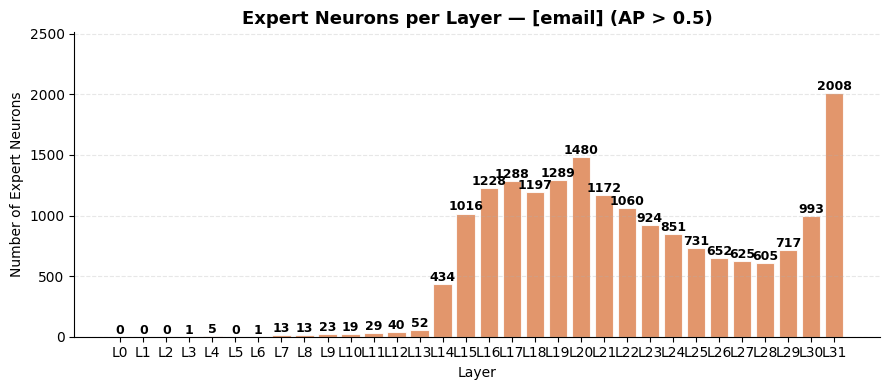

Saved: expert_neurons_email_per_layer.png

✅ [email] done | 18466 expert neurons | 36.2 min




[phone] scanning:   0%|          | 0/8470 [00:00<?, ?ex/s]

[phone] matched :   0%|          | 0/500 [00:00<?, ?match/s]


────────────────────────────────────────────────────────────
  Relation  : phone
  Processed : 500
  Skipped   : 2984
  Records   : 2500
  Positives : 500
  Negatives : 2000
  Time      : 14.0 min
────────────────────────────────────────────────────────────

Computing AP scores...


AP scoring:   0%|          | 0/32 [00:00<?, ?layer/s]


  Layer |   Max AP | Top Neuron |  Experts
---------------------------------------------
     L0 |   0.4600 | N    13405 |        0
     L1 |   0.5678 | N    12394 |        1
     L2 |   0.5184 | N     1474 |        1
     L3 |   0.7073 | N     5968 |        3
     L4 |   0.7656 | N     3555 |       18
     L5 |   0.9556 | N    11454 |       24
     L6 |   0.7589 | N    14146 |       31
     L7 |   0.8594 | N    14244 |       52
     L8 |   0.7313 | N     2519 |       59
     L9 |   0.6354 | N    12883 |       23
    L10 |   0.6827 | N     3331 |       11
    L11 |   0.5693 | N     5215 |       17
    L12 |   0.7739 | N    13820 |       41
    L13 |   0.6134 | N     5410 |       22
    L14 |   0.9994 | N     9616 |      417
    L15 |   1.0000 | N      246 |     1354
    L16 |   1.0000 | N     1466 |     1436
    L17 |   1.0000 | N     2146 |     1699
    L18 |   1.0000 | N     8097 |     1897
    L19 |   1.0000 | N     9469 |     1728
    L20 |   1.0000 | N     3883 |     1775
    L21

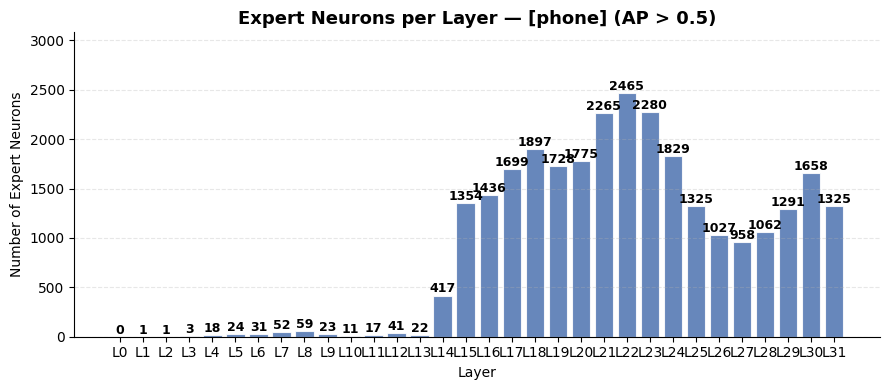

Saved: expert_neurons_phone_per_layer.png

✅ [phone] done | 28094 expert neurons | 23.8 min




[address] scanning:   0%|          | 0/8470 [00:00<?, ?ex/s]

[address] matched :   0%|          | 0/500 [00:00<?, ?match/s]

In [ ]:
# # ============================================================
# # CELL 2 — ACTIVATION COLLECTION + RUN LOOP
# # ============================================================

# def get_all_layers_activations(input_ids, attention_mask):
#     ids_list    = input_ids.tolist()
#     q_pos       = find_question_position(ids_list)
#     activations = {}
#     hooks       = []

#     for layer_idx in range(N_LAYERS):
#         def make_hook(l, qp):
#             def hook_fn(module, input, output):
#                 if qp is not None:
#                     vec = output[0, qp:, :].mean(dim=0).detach().cpu()
#                 else:
#                     vec = output[0, -10:, :].mean(dim=0).detach().cpu()
#                 activations[l] = vec
#             return hook_fn
#         h = model.model.layers[layer_idx].mlp.act_fn\
#             .register_forward_hook(make_hook(layer_idx, q_pos))
#         hooks.append(h)

#     with torch.no_grad():
#         model(
#             input_ids      = input_ids.unsqueeze(0).to(DEVICE),
#             attention_mask = attention_mask.unsqueeze(0).to(DEVICE)
#         )

#     for h in hooks:
#         h.remove()

#     return activations


# def collect_activations_for_relation(target_relation, ds_train,
#                                      limit=None):
#     print(f'\nCollecting activations — target: [{target_relation}]')
#     print('=' * 60)

#     CONV_KEY  = (
#         'conversations' if 'conversations' in ds_train[0]
#         else 'messages'
#     )
#     total     = len(ds_train)
#     responses = defaultdict(list)
#     labels    = []
#     skipped   = 0
#     processed = 0
#     start     = time.time()

#     outer_bar = tqdm(
#         range(total),
#         desc          = f'[{target_relation}] scanning',
#         unit          = 'ex',
#         colour        = 'blue',
#         dynamic_ncols = True,
#     )
#     inner_bar = tqdm(
#         total         = limit,
#         desc          = f'[{target_relation}] matched ',
#         unit          = 'match',
#         colour        = 'green',
#         dynamic_ncols = True,
#         leave         = True,
#     )

#     for i in outer_bar:
#         if limit is not None and processed >= limit:
#             break

#         ex   = ds_train[i]
#         conv = ex[CONV_KEY]

#         user_msg = next(
#             (m['content'] for m in conv if m['role'] == 'user'), ''
#         )
#         _, question = parse_context_question(user_msg)
#         if question is None:
#             skipped += 1
#             outer_bar.set_postfix(
#                 matched=processed, skipped=skipped, refresh=False
#             )
#             continue

#         rel = detect_relation_from_question(question)
#         if rel != target_relation:
#             skipped += 1
#             outer_bar.set_postfix(
#                 matched=processed, skipped=skipped, refresh=False
#             )
#             continue

#         gold = next(
#             (m['content'] for m in conv
#              if m['role'] == 'assistant'), ''
#         ).strip()
#         if not gold or gold == 'N/A':
#             skipped += 1
#             continue

#         # ON
#         try:
#             on_ids, on_mask = build_prompt_for_relation(
#                 conv, QUESTION_TEMPLATES[target_relation]
#             )
#         except Exception:
#             skipped += 1
#             continue

#         on_acts = get_all_layers_activations(on_ids, on_mask)
#         for layer_idx, vec in on_acts.items():
#             responses[layer_idx].append(vec)
#         labels.append(1)

#         # OFF
#         for other_rel, other_q in QUESTION_TEMPLATES.items():
#             if other_rel == target_relation:
#                 continue
#             try:
#                 off_ids, off_mask = build_prompt_for_relation(
#                     conv, other_q
#                 )
#             except Exception:
#                 continue

#             off_acts = get_all_layers_activations(off_ids, off_mask)
#             for layer_idx, vec in off_acts.items():
#                 responses[layer_idx].append(vec)
#             labels.append(0)

#         processed += 1
#         inner_bar.update(1)

#         elapsed = time.time() - start
#         per_ex  = elapsed / processed
#         remain  = ((limit or 500) - processed) * per_ex
#         inner_bar.set_postfix(
#             records = len(labels),
#             elapsed = f'{elapsed/60:.1f}m',
#             eta     = f'{remain/60:.1f}m',
#             refresh = False
#         )
#         outer_bar.set_postfix(
#             matched = processed,
#             skipped = skipped,
#             refresh = False
#         )

#         if processed % 50 == 0:
#             torch.cuda.empty_cache()

#     outer_bar.close()
#     inner_bar.close()

#     elapsed   = time.time() - start
#     label_arr = np.array(labels)

#     print(f'\n{"─"*60}')
#     print(f'  Relation  : {target_relation}')
#     print(f'  Processed : {processed}')
#     print(f'  Skipped   : {skipped}')
#     print(f'  Records   : {len(labels)}')
#     print(f'  Positives : {int(label_arr.sum()) if len(label_arr) else 0}')
#     print(f'  Negatives : {int((label_arr==0).sum()) if len(label_arr) else 0}')
#     print(f'  Time      : {elapsed/60:.1f} min')
#     print(f'{"─"*60}')

#     return responses, labels


# # ── Run ───────────────────────────────────────────────────────
# LIMIT        = 500
# FIELD_COLORS = {
#     'email':   '#DD8452',
#     'phone':   '#4C72B0',
#     'address': '#2A9D8F',
#     'job':     '#C44E52',
#     'name':    '#8172B2',
# }

# os.makedirs(DRIVE_SAVE_DIR, exist_ok=True)

# print('=' * 60)
# print('PII NEURON ANALYSIS — LLAMA')
# print(f'Limit     : {LIMIT} per relation')
# print(f'Relations : {TARGET_RELATIONS}')
# print(f'Layers    : {N_LAYERS}')
# print(f'MLP size  : {MLP_SIZE}')
# print('=' * 60)

# all_responses      = {}
# all_labels         = {}
# all_ap_scores      = {}
# all_expert_neurons = {}

# total_start  = time.time()
# relation_bar = tqdm(
#     TARGET_RELATIONS,
#     desc          = 'Overall',
#     unit          = 'relation',
#     colour        = 'magenta',
#     dynamic_ncols = True,
# )

# for relation in relation_bar:
#     relation_bar.set_description(f'Overall [{relation}]')
#     rel_start = time.time()

#     # Collect
#     responses, labels = collect_activations_for_relation(
#         relation, ds['train'], limit=LIMIT
#     )
#     all_responses[relation] = responses
#     all_labels[relation]    = labels

#     # AP scores
#     ap_scores = compute_ap_scores(responses, labels)
#     all_ap_scores[relation] = ap_scores

#     # Expert neurons
#     expert_neurons = build_expert_neuron_list(
#         ap_scores, responses, labels, ap_threshold=0.5
#     )
#     all_expert_neurons[relation] = expert_neurons

#     # Plot
#     plot_expert_neurons(ap_scores, relation)

#     # Save to Drive
#     with open(os.path.join(
#         DRIVE_SAVE_DIR, f'expert_neurons_{relation}.json'
#     ), 'w') as f:
#         json.dump(expert_neurons, f, indent=2)

#     np.savez(
#         os.path.join(DRIVE_SAVE_DIR, f'ap_scores_{relation}.npz'),
#         **{f'layer_{l}': all_ap_scores[relation][l]
#            for l in range(N_LAYERS)}
#     )
#     np.save(
#         os.path.join(DRIVE_SAVE_DIR, f'labels_{relation}.npy'),
#         np.array(labels)
#     )

#     rel_elapsed = time.time() - rel_start
#     print(f'\n✅ [{relation}] done '
#           f'| {len(expert_neurons)} expert neurons '
#           f'| {rel_elapsed/60:.1f} min\n')

# relation_bar.close()

# total_elapsed = time.time() - total_start
# print('\n' + '=' * 60)
# print('FINAL SUMMARY')
# print('=' * 60)
# print(f'{"Relation":>10} | {"Neurons":>8} | '
#       f'{"Best AP":>8} | {"Best Layer":>12} | {"Records":>8}')
# print('-' * 60)
# for relation in TARGET_RELATIONS:
#     neurons = all_expert_neurons[relation]
#     ap_sc   = all_ap_scores[relation]
#     best_ap = max(ap_sc[l].max() for l in range(N_LAYERS))
#     best_l  = max(range(N_LAYERS), key=lambda l: ap_sc[l].max())
#     print(f'{relation:>10} | {len(neurons):>8} | '
#           f'{best_ap:>8.4f} | '
#           f'{"L"+str(best_l):>12} | '
#           f'{len(all_labels[relation]):>8}')
# print('=' * 60)
# print(f'\nTotal time : {total_elapsed/60:.1f} min')
# print(f'Saved to   : {DRIVE_SAVE_DIR}')
# # ```

# # ---

# # Correct order to run:
# # ```
# # Cell 1 → defines: compute_ap_scores
# #                   build_expert_neuron_list
# #                   plot_expert_neurons

# # Cell 2 → defines: get_all_layers_activations
# #                   collect_activations_for_relation
# #          then runs the full loop

#########This one used A100 gpu

AP comptation do not run again.

Layers   : 32
MLP size : 14336
Device   : cuda

Checking saved results...
  ❌ [ address] not found — will run
  ❌ [     job] not found — will run
  ❌ [    name] not found — will run

Completed : []
Remaining : ['address', 'job', 'name']

RUNNING REMAINING: ['address', 'job', 'name']


Overall:   0%|          | 0/3 [00:00<?, ?relation/s]

[address] scanning:   0%|          | 0/8470 [00:00<?, ?ex/s]

[address] matched :   0%|          | 0/500 [00:00<?, ?match/s]


  Processed : 500 | Skipped : 2177
  Records   : 2500 (+500 / -2000)
  Time      : 5.1 min

Computing AP scores...


AP scoring:   0%|          | 0/32 [00:00<?, ?layer/s]


  Layer |   Max AP | Top Neuron |  Experts
---------------------------------------------
     L0 |   0.2466 | N     9901 |        0
     L1 |   0.3368 | N    14018 |        0
     L2 |   0.4227 | N     6873 |        0
     L3 |   0.4039 | N    10649 |        0
     L4 |   0.4686 | N    11421 |        0
     L5 |   0.5051 | N     6079 |        1
     L6 |   0.5187 | N    11999 |        1
     L7 |   0.8209 | N     3493 |       47
     L8 |   0.5749 | N    13955 |       14
     L9 |   0.7244 | N    11964 |       28
    L10 |   0.7207 | N    11961 |       69
    L11 |   0.6528 | N     9986 |       63
    L12 |   0.7404 | N     3705 |       98
    L13 |   0.7439 | N     8790 |       53
    L14 |   1.0000 | N     9194 |      185
    L15 |   1.0000 | N       23 |      943
    L16 |   1.0000 | N      870 |     1100
    L17 |   1.0000 | N      668 |     1000
    L18 |   1.0000 | N     3775 |     1027
    L19 |   1.0000 | N     1435 |     1067
    L20 |   1.0000 | N     2369 |     1063
    L21

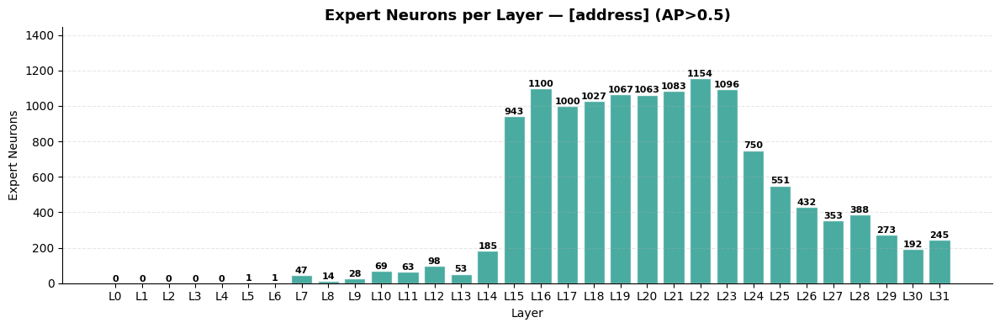

Saved: expert_neurons_address_per_layer.png

✅ [address] saved | 13276 neurons | 12.6 min




[job] scanning:   0%|          | 0/8470 [00:00<?, ?ex/s]

[job] matched :   0%|          | 0/500 [00:00<?, ?match/s]


  Processed : 500 | Skipped : 1941
  Records   : 2500 (+500 / -2000)
  Time      : 5.2 min

Computing AP scores...


AP scoring:   0%|          | 0/32 [00:00<?, ?layer/s]


  Layer |   Max AP | Top Neuron |  Experts
---------------------------------------------
     L0 |   0.2682 | N     8880 |        0
     L1 |   0.6191 | N     9809 |        4
     L2 |   0.6188 | N      665 |        4
     L3 |   0.9238 | N     1153 |       46
     L4 |   0.8215 | N    12629 |       38
     L5 |   0.9299 | N     8060 |       71
     L6 |   0.9743 | N     5536 |      131
     L7 |   0.9771 | N     8096 |      411
     L8 |   0.9576 | N    11251 |      530
     L9 |   0.9494 | N     9456 |      480
    L10 |   0.9247 | N    10245 |      730
    L11 |   0.9372 | N      993 |      811
    L12 |   0.9546 | N      703 |      687
    L13 |   0.9068 | N     6427 |      513
    L14 |   0.9117 | N    13004 |      657
    L15 |   1.0000 | N       57 |     1252
    L16 |   1.0000 | N      117 |     1766
    L17 |   1.0000 | N      480 |     2006
    L18 |   1.0000 | N      394 |     1851
    L19 |   1.0000 | N      271 |     1704
    L20 |   1.0000 | N      888 |     1461
    L21

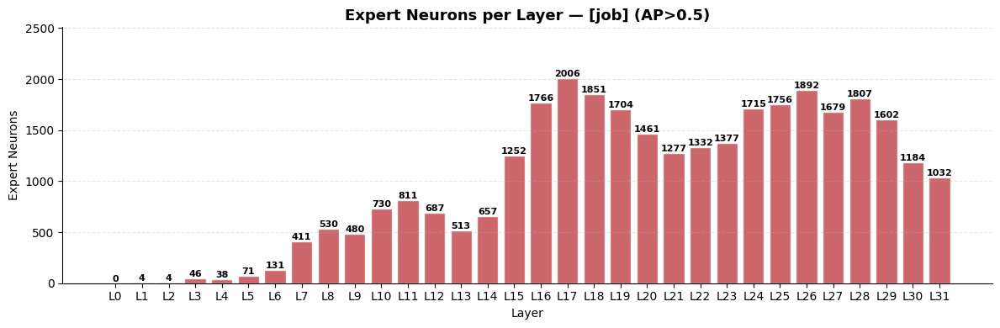

Saved: expert_neurons_job_per_layer.png

✅ [job] saved | 31806 neurons | 12.8 min




[name] scanning:   0%|          | 0/8470 [00:00<?, ?ex/s]

[name] matched :   0%|          | 0/500 [00:00<?, ?match/s]


  Processed : 500 | Skipped : 1636
  Records   : 2500 (+500 / -2000)
  Time      : 5.2 min

Computing AP scores...


AP scoring:   0%|          | 0/32 [00:00<?, ?layer/s]


  Layer |   Max AP | Top Neuron |  Experts
---------------------------------------------
     L0 |   0.2956 | N    12119 |        0
     L1 |   0.5805 | N     7106 |        1
     L2 |   0.5442 | N     4299 |        2
     L3 |   0.5196 | N     9218 |        1
     L4 |   0.4956 | N    12985 |        0
     L5 |   0.5202 | N     1399 |        3
     L6 |   0.5683 | N     7663 |        5
     L7 |   0.9028 | N     1090 |       66
     L8 |   0.9473 | N    12619 |      142
     L9 |   0.8546 | N    12325 |       90
    L10 |   0.8884 | N     3953 |      133
    L11 |   0.8391 | N    12119 |      186
    L12 |   0.8240 | N     2470 |      288
    L13 |   0.9068 | N     9458 |      352
    L14 |   0.9944 | N     4271 |      423
    L15 |   1.0000 | N      551 |     1219
    L16 |   1.0000 | N     2469 |     1362
    L17 |   1.0000 | N     5012 |     1584
    L18 |   1.0000 | N     5918 |     1701
    L19 |   1.0000 | N     4706 |     1713
    L20 |   1.0000 | N      478 |     1740
    L21

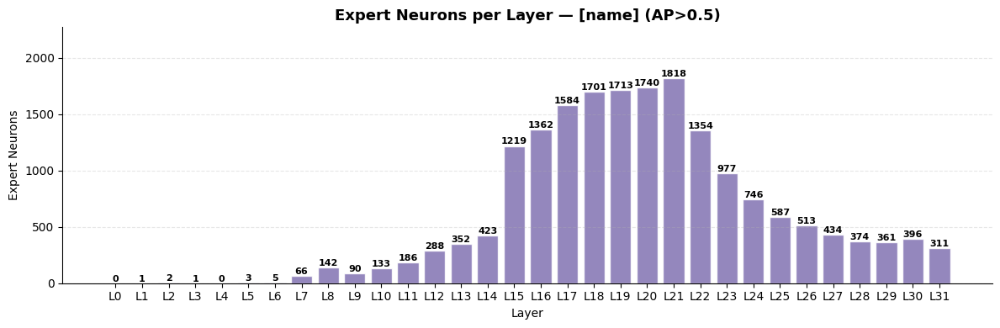

Saved: expert_neurons_name_per_layer.png

✅ [name] saved | 18882 neurons | 12.7 min


Total time: 38.0 min

FINAL SUMMARY
  Relation |  Neurons |  Best AP |   Best Layer |  Records
------------------------------------------------------------
   address |    13276 |   1.0000 |          L14 |     2500
       job |    31806 |   1.0000 |          L25 |     2500
      name |    18882 |   1.0000 |          L15 |     2500

Saved to: /content/drive/MyDrive/PII_specific_neurons/LLAMA/neuron_results


In [ ]:
# # ============================================================
# # FULL RESTART — RELOAD COMPLETED + CONTINUE REMAINING
# # Run this as ONE cell after restarting Colab
# # ============================================================

# import os, json, time, re
# import numpy as np
# import torch
# import matplotlib.pyplot as plt
# from collections import defaultdict
# from tqdm.auto import tqdm
# from copy import deepcopy
# from sklearn.metrics import average_precision_score

# # ── Config ────────────────────────────────────────────────────
# DRIVE_SAVE_DIR = '/content/drive/MyDrive/PII_specific_neurons/LLAMA/neuron_results'
# DEVICE         = 'cuda'
# N_LAYERS       = model.config.num_hidden_layers
# MLP_SIZE       = model.config.intermediate_size
# MAX_LENGTH     = 1024
# LIMIT          = 500

# TARGET_RELATIONS = ['address', 'job', 'name']
# QUESTION_TEMPLATES = {
#     'email':   'What is the email address?',
#     'phone':   'What is the phone number?',
#     'address': 'What is the address?',
#     'job':     'What is the job title?',
#     'name':    "What is the person's full name?",
# }
# FIELD_COLORS = {
#     'email':   '#DD8452',
#     'phone':   '#4C72B0',
#     'address': '#2A9D8F',
#     'job':     '#C44E52',
#     'name':    '#8172B2',
# }

# os.makedirs(DRIVE_SAVE_DIR, exist_ok=True)
# print(f'Layers   : {N_LAYERS}')
# print(f'MLP size : {MLP_SIZE}')
# print(f'Device   : {DEVICE}')

# # ── Parsing helpers ───────────────────────────────────────────
# CTX_RE = re.compile(r"### Context:\n(.*?)\n\n### Question:\n", re.S)
# Q_RE   = re.compile(r"### Question:\n(.*?)\n\n### Instruction:\n", re.S)

# def parse_context_question(user_text):
#     ctx_m = CTX_RE.search(user_text)
#     q_m   = Q_RE.search(user_text)
#     if not (ctx_m and q_m):
#         return None, None
#     return ctx_m.group(1), q_m.group(1).strip()

# def detect_relation_from_question(question):
#     if question is None:
#         return None
#     q = question.lower()
#     if 'email'                                    in q: return 'email'
#     if 'phone'                                    in q: return 'phone'
#     if 'address'                                  in q: return 'address'
#     if 'job'                                      in q: return 'job'
#     if 'full name' in q or "person's full name"   in q: return 'name'
#     return None

# def replace_question_in_user(user_text, new_question):
#     return re.sub(
#         r"(### Question:\n).*?(\n\n### Instruction:\n)",
#         lambda m: m.group(1) + new_question + m.group(2),
#         user_text, flags=re.S
#     )

# QUESTION_MARKER_IDS = tokenizer.encode(
#     '### Question:', add_special_tokens=False
# )

# def find_question_position(ids_list):
#     tgt = QUESTION_MARKER_IDS
#     for i in range(len(ids_list) - len(tgt)):
#         if ids_list[i:i+len(tgt)] == tgt:
#             return i
#     return None

# def build_prompt_for_relation(conv, question_text):
#     c = deepcopy(conv)
#     c = [m for m in c if m.get('role') != 'assistant']
#     for m in c:
#         if m.get('role') == 'user':
#             m['content'] = replace_question_in_user(
#                 m['content'], question_text
#             )
#             break
#     text = tokenizer.apply_chat_template(
#         c, tokenize=False, add_generation_prompt=True
#     )
#     enc = tokenizer(
#         text, truncation=True,
#         max_length=MAX_LENGTH, return_tensors='pt'
#     )
#     return enc['input_ids'][0], enc['attention_mask'][0]

# # ── Activation collection ─────────────────────────────────────
# def get_all_layers_activations(input_ids, attention_mask):
#     ids_list    = input_ids.tolist()
#     q_pos       = find_question_position(ids_list)
#     activations = {}
#     hooks       = []

#     for layer_idx in range(N_LAYERS):
#         def make_hook(l, qp):
#             def hook_fn(module, input, output):
#                 vec = output[0, qp:, :].mean(dim=0) \
#                       if qp is not None else \
#                       output[0, -10:, :].mean(dim=0)
#                 # ── Cast to float32 here ──────────────────────
#                 activations[l] = vec.to(torch.float32).detach().cpu()
#             return hook_fn
#         h = model.model.layers[layer_idx].mlp.act_fn\
#             .register_forward_hook(make_hook(layer_idx, q_pos))
#         hooks.append(h)

#     with torch.no_grad():
#         model(
#             input_ids      = input_ids.unsqueeze(0).to(DEVICE),
#             attention_mask = attention_mask.unsqueeze(0).to(DEVICE)
#         )
#     for h in hooks:
#         h.remove()
#     return activations

# def collect_activations_for_relation(target_relation, ds_train,
#                                      limit=None):
#     print(f'\nCollecting — target: [{target_relation}]')
#     print('=' * 60)

#     CONV_KEY  = 'conversations' if 'conversations' in ds_train[0] \
#                 else 'messages'
#     responses = defaultdict(list)
#     labels    = []
#     skipped   = 0
#     processed = 0
#     start     = time.time()

#     outer_bar = tqdm(range(len(ds_train)),
#                      desc=f'[{target_relation}] scanning',
#                      unit='ex', colour='blue', dynamic_ncols=True)
#     inner_bar = tqdm(total=limit,
#                      desc=f'[{target_relation}] matched ',
#                      unit='match', colour='green',
#                      dynamic_ncols=True, leave=True)

#     for i in outer_bar:
#         if limit is not None and processed >= limit:
#             break

#         ex   = ds_train[i]
#         conv = ex[CONV_KEY]

#         user_msg    = next((m['content'] for m in conv
#                             if m['role'] == 'user'), '')
#         _, question = parse_context_question(user_msg)
#         rel         = detect_relation_from_question(question)

#         if rel != target_relation:
#             skipped += 1
#             outer_bar.set_postfix(
#                 matched=processed, skipped=skipped, refresh=False)
#             continue

#         gold = next((m['content'] for m in conv
#                      if m['role'] == 'assistant'), '').strip()
#         if not gold or gold == 'N/A':
#             skipped += 1
#             continue

#         try:
#             on_ids, on_mask = build_prompt_for_relation(
#                 conv, QUESTION_TEMPLATES[target_relation])
#         except Exception:
#             skipped += 1
#             continue

#         on_acts = get_all_layers_activations(on_ids, on_mask)
#         for l, v in on_acts.items():
#             responses[l].append(v)
#         labels.append(1)

#         for other_rel, other_q in QUESTION_TEMPLATES.items():
#             if other_rel == target_relation:
#                 continue
#             try:
#                 off_ids, off_mask = build_prompt_for_relation(
#                     conv, other_q)
#                 off_acts = get_all_layers_activations(
#                     off_ids, off_mask)
#                 for l, v in off_acts.items():
#                     responses[l].append(v)
#                 labels.append(0)
#             except Exception:
#                 continue

#         processed += 1
#         inner_bar.update(1)

#         elapsed = time.time() - start
#         remain  = ((limit or 500) - processed) * (elapsed/processed)
#         inner_bar.set_postfix(
#             records=len(labels),
#             elapsed=f'{elapsed/60:.1f}m',
#             eta=f'{remain/60:.1f}m', refresh=False)
#         outer_bar.set_postfix(
#             matched=processed, skipped=skipped, refresh=False)

#         if processed % 50 == 0:
#             torch.cuda.empty_cache()

#     outer_bar.close()
#     inner_bar.close()

#     elapsed   = time.time() - start
#     label_arr = np.array(labels)
#     print(f'\n  Processed : {processed} | Skipped : {skipped}')
#     print(f'  Records   : {len(labels)} '
#           f'(+{int(label_arr.sum())} / -{int((label_arr==0).sum())})')
#     print(f'  Time      : {elapsed/60:.1f} min')
#     return responses, labels

# # ── AP scoring ────────────────────────────────────────────────
# def compute_ap_scores(responses, labels):
#     print('\nComputing AP scores...')
#     label_arr = np.array(labels)
#     ap_scores = {}

#     bar = tqdm(range(N_LAYERS), desc='AP scoring',
#                unit='layer', colour='yellow', dynamic_ncols=True)
#     for layer_idx in bar:
#         # ── Cast to float32 before numpy conversion ───────────
#         act_matrix = torch.stack(responses[layer_idx])\
#                          .to(torch.float32)\
#                          .numpy()
#         layer_aps  = np.zeros(act_matrix.shape[1])
#         for n in range(act_matrix.shape[1]):
#             layer_aps[n] = average_precision_score(
#                 y_true=label_arr, y_score=act_matrix[:, n])
#         ap_scores[layer_idx] = layer_aps
#         bar.set_postfix(max_ap=f'{layer_aps.max():.4f}',
#                         experts=int((layer_aps>0.5).sum()),
#                         refresh=False)
#     bar.close()

#     print(f'\n{"Layer":>7} | {"Max AP":>8} | '
#           f'{"Top Neuron":>10} | {"Experts":>8}')
#     print('-' * 45)
#     for l in range(N_LAYERS):
#         aps = ap_scores[l]
#         print(f'{"L"+str(l):>7} | {aps.max():>8.4f} | '
#               f'N{aps.argmax():>9} | {int((aps>0.5).sum()):>8}')
#     return ap_scores

#     print(f'\n{"Layer":>7} | {"Max AP":>8} | '
#           f'{"Top Neuron":>10} | {"Experts":>8}')
#     print('-' * 45)
#     for l in range(N_LAYERS):
#         aps = ap_scores[l]
#         print(f'{"L"+str(l):>7} | {aps.max():>8.4f} | '
#               f'N{aps.argmax():>9} | {int((aps>0.5).sum()):>8}')
#     return ap_scores

# def build_expert_neuron_list(ap_scores, responses, labels,
#                               ap_threshold=0.5):
#     label_arr   = np.array(labels)
#     neuron_list = []
#     for l in range(N_LAYERS):
#         layer_aps  = ap_scores[l]
#         # ── Cast to float32 ───────────────────────────────────
#         act_matrix = torch.stack(responses[l])\
#                          .to(torch.float32)\
#                          .numpy()
#         for n in np.where(layer_aps > ap_threshold)[0]:
#             acts     = act_matrix[:, n]
#             on_acts  = acts[label_arr == 1]
#             off_acts = acts[label_arr == 0]
#             neuron_list.append({
#                 'layer':    l,
#                 'neuron':   int(n),
#                 'ap':       float(layer_aps[n]),
#                 'on_p50':   float(np.percentile(on_acts, 50)),
#                 'on_p90':   float(np.percentile(on_acts, 90)),
#                 'off_mean': float(np.mean(off_acts)),
#                 'off_p50':  float(np.percentile(off_acts, 50)),
#             })
#     neuron_list.sort(key=lambda x: x['ap'], reverse=True)
#     print(f'\nExpert neurons (AP>{ap_threshold}): {len(neuron_list)}')
#     if neuron_list:
#         b = neuron_list[0]
#         print(f'Best: L{b["layer"]} N{b["neuron"]} '
#               f'AP={b["ap"]:.4f} '
#               f'on_p50={b["on_p50"]:.3f} '
#               f'off_mean={b["off_mean"]:.3f}')
#     return neuron_list

# def plot_expert_neurons(ap_scores, relation, ap_threshold=0.5):
#     counts = [(ap_scores[l] > ap_threshold).sum()
#               for l in range(N_LAYERS)]
#     fig, ax = plt.subplots(figsize=(12, 4))
#     bars = ax.bar([f'L{l}' for l in range(N_LAYERS)], counts,
#                   color=FIELD_COLORS.get(relation, '#888'),
#                   alpha=0.85, edgecolor='white')
#     for bar, c in zip(bars, counts):
#         ax.text(bar.get_x() + bar.get_width()/2,
#                 bar.get_height() + 0.5, str(c),
#                 ha='center', va='bottom', fontsize=8,
#                 fontweight='bold')
#     ax.set_title(
#         f'Expert Neurons per Layer — [{relation}] (AP>{ap_threshold})',
#         fontsize=13, fontweight='bold')
#     ax.set_xlabel('Layer')
#     ax.set_ylabel('Expert Neurons')
#     ax.set_ylim(0, max(counts) * 1.25 + 1)
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)
#     ax.grid(axis='y', alpha=0.3, linestyle='--')
#     plt.tight_layout()
#     fname = f'expert_neurons_{relation}_per_layer.png'
#     plt.savefig(fname, dpi=150, bbox_inches='tight')
#     plt.show()
#     shutil.copy(fname, os.path.join(DRIVE_SAVE_DIR, fname))
#     print(f'Saved: {fname}')

# # ── Reload completed relations ────────────────────────────────
# import shutil

# all_responses      = {}
# all_labels         = {}
# all_ap_scores      = {}
# all_expert_neurons = {}

# print('\nChecking saved results...')
# print('=' * 60)
# for relation in TARGET_RELATIONS:
#     np  = __import__('numpy')
#     n_path = os.path.join(DRIVE_SAVE_DIR,
#                           f'expert_neurons_{relation}.json')
#     a_path = os.path.join(DRIVE_SAVE_DIR,
#                           f'ap_scores_{relation}.npz')
#     l_path = os.path.join(DRIVE_SAVE_DIR,
#                           f'labels_{relation}.npy')

#     if os.path.exists(n_path) and \
#        os.path.exists(a_path) and \
#        os.path.exists(l_path):

#         with open(n_path) as f:
#             all_expert_neurons[relation] = json.load(f)
#         ap_data = __import__('numpy').load(a_path)
#         all_ap_scores[relation] = {
#             int(k.split('_')[1]): ap_data[k]
#             for k in ap_data.files
#         }
#         all_labels[relation] = \
#             __import__('numpy').load(l_path).tolist()
#         print(f'  ✅ [{relation:>8}] loaded — '
#               f'{len(all_expert_neurons[relation]):>6} neurons | '
#               f'{len(all_labels[relation]):>6} records')
#     else:
#         print(f'  ❌ [{relation:>8}] not found — will run')

# completed = list(all_expert_neurons.keys())
# remaining = [r for r in TARGET_RELATIONS if r not in completed]
# print(f'\nCompleted : {completed}')
# print(f'Remaining : {remaining}')

# # ── Run remaining relations ───────────────────────────────────
# if remaining:
#     print('\n' + '=' * 60)
#     print(f'RUNNING REMAINING: {remaining}')
#     print('=' * 60)

#     total_start  = time.time()
#     relation_bar = tqdm(remaining, desc='Overall',
#                         unit='relation', colour='magenta',
#                         dynamic_ncols=True)

#     for relation in relation_bar:
#         relation_bar.set_description(f'Overall [{relation}]')
#         rel_start = time.time()

#         responses, labels = collect_activations_for_relation(
#             relation, ds['train'], limit=LIMIT)
#         all_responses[relation] = responses
#         all_labels[relation]    = labels

#         ap_scores = compute_ap_scores(responses, labels)
#         all_ap_scores[relation] = ap_scores

#         expert_neurons = build_expert_neuron_list(
#             ap_scores, responses, labels)
#         all_expert_neurons[relation] = expert_neurons

#         plot_expert_neurons(ap_scores, relation)

#         # Save
#         with open(os.path.join(DRIVE_SAVE_DIR,
#                   f'expert_neurons_{relation}.json'), 'w') as f:
#             json.dump(expert_neurons, f, indent=2)
#         np.savez(
#             os.path.join(DRIVE_SAVE_DIR,
#                          f'ap_scores_{relation}.npz'),
#             **{f'layer_{l}': all_ap_scores[relation][l]
#                for l in range(N_LAYERS)}
#         )
#         np.save(
#             os.path.join(DRIVE_SAVE_DIR,
#                          f'labels_{relation}.npy'),
#             np.array(labels)
#         )

#         print(f'\n✅ [{relation}] saved '
#               f'| {len(expert_neurons)} neurons '
#               f'| {(time.time()-rel_start)/60:.1f} min\n')

#     relation_bar.close()
#     print(f'\nTotal time: {(time.time()-total_start)/60:.1f} min')

# # ── Final summary ─────────────────────────────────────────────
# print('\n' + '=' * 60)
# print('FINAL SUMMARY')
# print('=' * 60)
# print(f'{"Relation":>10} | {"Neurons":>8} | '
#       f'{"Best AP":>8} | {"Best Layer":>12} | {"Records":>8}')
# print('-' * 60)
# for relation in TARGET_RELATIONS:
#     if relation not in all_expert_neurons:
#         print(f'{relation:>10} | {"—":>8} | '
#               f'{"—":>8} | {"—":>12} | {"—":>8}')
#         continue
#     neurons = all_expert_neurons[relation]
#     ap_sc   = all_ap_scores[relation]
#     best_ap = max(ap_sc[l].max() for l in range(N_LAYERS))
#     best_l  = max(range(N_LAYERS),
#                   key=lambda l: ap_sc[l].max())
#     print(f'{relation:>10} | {len(neurons):>8} | '
#           f'{best_ap:>8.4f} | '
#           f'{"L"+str(best_l):>12} | '
#           f'{len(all_labels[relation]):>8}')
# print('=' * 60)
# print(f'\nSaved to: {DRIVE_SAVE_DIR}')
# # ```

# # This is one self-contained cell that:
# # ```
# # 1. Redefines ALL functions (no dependency on previous cells)
# # 2. Reloads email + phone from Drive automatically
# # 3. Only runs address, job, name
# # 4. Saves each relation to Drive as it completes

In [ ]:
DRIVE_SAVE_DIR = '/content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/neuron_results'

In [ ]:
# ============================================================
# RELOAD ALL RESULTS FROM DRIVE
# ============================================================

import os, json
import numpy as np

DRIVE_SAVE_DIR = '/content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/neuron_results'
TARGET_RELATIONS = ['email', 'phone', 'address', 'job', 'name']
N_LAYERS         = model.config.num_hidden_layers

all_expert_neurons = {}
all_ap_scores      = {}
all_labels         = {}

print('Loading results from Drive...')
print('=' * 60)

for relation in TARGET_RELATIONS:
    n_path = os.path.join(DRIVE_SAVE_DIR, f'expert_neurons_{relation}.json')
    a_path = os.path.join(DRIVE_SAVE_DIR, f'ap_scores_{relation}.npz')
    l_path = os.path.join(DRIVE_SAVE_DIR, f'labels_{relation}.npy')

    missing = [p for p in [n_path, a_path, l_path]
               if not os.path.exists(p)]

    if missing:
        print(f'  ❌ [{relation:>8}] MISSING: '
              f'{[os.path.basename(p) for p in missing]}')
        continue

    # Expert neurons
    with open(n_path) as f:
        all_expert_neurons[relation] = json.load(f)

    # AP scores
    ap_data = np.load(a_path)
    all_ap_scores[relation] = {
        int(k.split('_')[1]): ap_data[k]
        for k in ap_data.files
    }

    # Labels
    all_labels[relation] = np.load(l_path).tolist()

    # Stats
    label_arr = np.array(all_labels[relation])
    best_ap   = max(all_ap_scores[relation][l].max()
                    for l in range(N_LAYERS))
    best_l    = max(range(N_LAYERS),
                    key=lambda l: all_ap_scores[relation][l].max())

    print(f'  ✅ [{relation:>8}] '
          f'neurons={len(all_expert_neurons[relation]):>6} | '
          f'records={len(all_labels[relation]):>6} | '
          f'pos={int(label_arr.sum()):>5} | '
          f'neg={int((label_arr==0).sum()):>5} | '
          f'best_ap={best_ap:.4f} @ L{best_l}')

# ── Summary ───────────────────────────────────────────────────
loaded   = list(all_expert_neurons.keys())
missing  = [r for r in TARGET_RELATIONS if r not in all_expert_neurons]

print(f'\n{"="*60}')
print(f'Loaded  : {loaded}')
print(f'Missing : {missing if missing else "none — all good!"}')
print(f'{"="*60}')

if not missing:
    print('\n✅ All relations loaded. Ready to proceed!')
else:
    print(f'\n⚠️  Missing relations: {missing}')
    print('   Run the collection pipeline for these relations first.')

Loading results from Drive...
  ✅ [   email] neurons= 18466 | records=  2500 | pos=  500 | neg= 2000 | best_ap=1.0000 @ L14
  ✅ [   phone] neurons= 28094 | records=  2500 | pos=  500 | neg= 2000 | best_ap=1.0000 @ L15
  ✅ [ address] neurons= 13276 | records=  2500 | pos=  500 | neg= 2000 | best_ap=1.0000 @ L14
  ✅ [     job] neurons= 31806 | records=  2500 | pos=  500 | neg= 2000 | best_ap=1.0000 @ L25
  ✅ [    name] neurons= 18882 | records=  2500 | pos=  500 | neg= 2000 | best_ap=1.0000 @ L15

Loaded  : ['email', 'phone', 'address', 'job', 'name']
Missing : none — all good!

✅ All relations loaded. Ready to proceed!


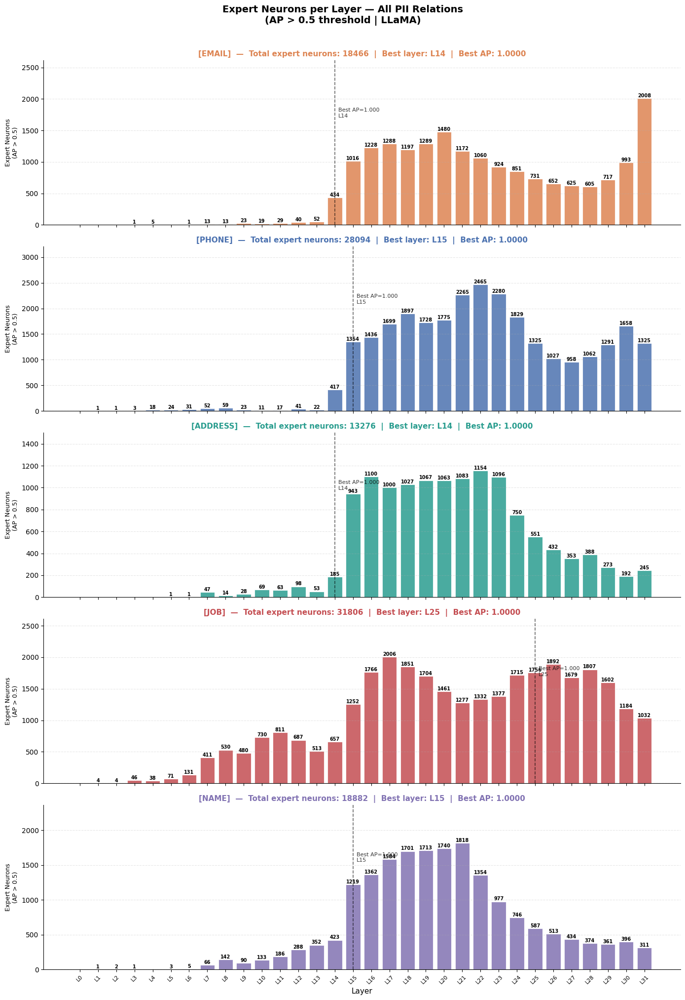

Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/neuron_results/expert_neurons_all_relations.png


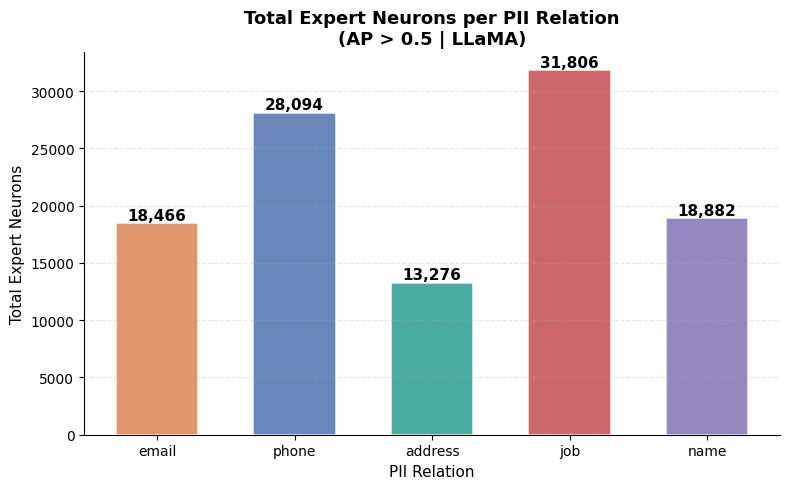

Saved: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/neuron_results/expert_neurons_totals_comparison.png

  Relation |    Total |  Best AP |  Best L | Peak Layer Count
-----------------------------------------------------------------
     email |   18,466 |   1.0000 | L   14 | L31 =  2008 neurons
     phone |   28,094 |   1.0000 | L   15 | L22 =  2465 neurons
   address |   13,276 |   1.0000 | L   14 | L22 =  1154 neurons
       job |   31,806 |   1.0000 | L   25 | L17 =  2006 neurons
      name |   18,882 |   1.0000 | L   15 | L21 =  1818 neurons


In [ ]:
# ============================================================
# PLOT EXPERT NEURONS PER LAYER — ALL RELATIONS
# ============================================================

import matplotlib.pyplot as plt
import numpy as np
import os

FIELD_COLORS = {
    'email':   '#DD8452',
    'phone':   '#4C72B0',
    'address': '#2A9D8F',
    'job':     '#C44E52',
    'name':    '#8172B2',
}

fig, axes = plt.subplots(
    len(TARGET_RELATIONS), 1,
    figsize = (14, 4 * len(TARGET_RELATIONS)),
    sharex  = True
)

for ax, relation in zip(axes, TARGET_RELATIONS):
    if relation not in all_ap_scores:
        ax.set_title(f'[{relation}] — NOT LOADED', fontsize=12)
        continue

    counts = [(all_ap_scores[relation][l] > 0.5).sum()
              for l in range(N_LAYERS)]
    color  = FIELD_COLORS.get(relation, '#888888')
    x      = range(N_LAYERS)

    bars = ax.bar(
        x, counts,
        color     = color,
        alpha     = 0.85,
        edgecolor = 'white',
        linewidth = 0.8
    )

    # Value labels on bars
    for bar, c in zip(bars, counts):
        if c > 0:
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 0.5,
                str(c),
                ha='center', va='bottom',
                fontsize=7, fontweight='bold'
            )

    # Best layer marker
    best_l = max(range(N_LAYERS),
                 key=lambda l: all_ap_scores[relation][l].max())
    best_ap = all_ap_scores[relation][best_l].max()
    ax.axvline(x=best_l, color='black',
               linestyle='--', linewidth=1.2, alpha=0.6)
    ax.text(best_l + 0.2,
            max(counts) * 0.85,
            f'Best AP={best_ap:.3f}\nL{best_l}',
            fontsize=8, color='black', alpha=0.8)

    # Total expert neurons
    total = sum(counts)
    ax.set_title(
        f'[{relation.upper()}]  —  '
        f'Total expert neurons: {total}  |  '
        f'Best layer: L{best_l}  |  '
        f'Best AP: {best_ap:.4f}',
        fontsize=11, fontweight='bold', color=color
    )
    ax.set_ylabel('Expert Neurons\n(AP > 0.5)', fontsize=9)
    ax.set_ylim(0, max(counts) * 1.3 + 1)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(axis='y', alpha=0.3, linestyle='--')

axes[-1].set_xlabel('Layer', fontsize=11)
axes[-1].set_xticks(range(N_LAYERS))
axes[-1].set_xticklabels(
    [f'L{l}' for l in range(N_LAYERS)],
    fontsize=8, rotation=45
)

fig.suptitle(
    'Expert Neurons per Layer — All PII Relations\n'
    '(AP > 0.5 threshold | LLaMA)',
    fontsize=14, fontweight='bold', y=1.01
)
plt.tight_layout()

# Save
fname     = 'expert_neurons_all_relations.png'
save_path = os.path.join(DRIVE_SAVE_DIR, fname)
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {save_path}')

# ── Comparison bar chart — total neurons per relation ─────────
fig2, ax2 = plt.subplots(figsize=(8, 5))

totals    = [sum((all_ap_scores[r][l] > 0.5).sum()
                 for l in range(N_LAYERS))
             for r in TARGET_RELATIONS]
colors    = [FIELD_COLORS[r] for r in TARGET_RELATIONS]

bars2 = ax2.bar(
    TARGET_RELATIONS, totals,
    color     = colors,
    alpha     = 0.85,
    edgecolor = 'white',
    linewidth = 1.2,
    width     = 0.6
)
for bar, total in zip(bars2, totals):
    ax2.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 50,
        f'{total:,}',
        ha='center', va='bottom',
        fontsize=11, fontweight='bold'
    )

ax2.set_title(
    'Total Expert Neurons per PII Relation\n'
    '(AP > 0.5 | LLaMA)',
    fontsize=13, fontweight='bold'
)
ax2.set_xlabel('PII Relation', fontsize=11)
ax2.set_ylabel('Total Expert Neurons', fontsize=11)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.grid(axis='y', alpha=0.3, linestyle='--')
plt.tight_layout()

fname2     = 'expert_neurons_totals_comparison.png'
save_path2 = os.path.join(DRIVE_SAVE_DIR, fname2)
plt.savefig(save_path2, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {save_path2}')

# ── Print summary table ───────────────────────────────────────
print('\n' + '=' * 65)
print(f'{"Relation":>10} | {"Total":>8} | '
      f'{"Best AP":>8} | {"Best L":>7} | '
      f'{"Peak Layer Count":>16}')
print('-' * 65)
for relation in TARGET_RELATIONS:
    if relation not in all_ap_scores:
        print(f'{relation:>10} | {"—":>8} | {"—":>8} | {"—":>7} | {"—":>16}')
        continue
    counts  = [(all_ap_scores[relation][l] > 0.5).sum()
               for l in range(N_LAYERS)]
    total   = sum(counts)
    best_l  = max(range(N_LAYERS),
                  key=lambda l: all_ap_scores[relation][l].max())
    best_ap = all_ap_scores[relation][best_l].max()
    peak_l  = counts.index(max(counts))
    peak_c  = max(counts)
    print(f'{relation:>10} | {total:>8,} | '
          f'{best_ap:>8.4f} | L{best_l:>5} | '
          f'L{peak_l} = {peak_c:>5} neurons')
print('=' * 65)
# ```

# This produces two plots:
# ```
# Plot 1 — one bar chart per relation (5 subplots stacked)
#          shows neuron count per layer
#          marks best AP layer with dashed line

# Plot 2 — single comparison bar chart
#          total expert neurons across all relations
#          side by side for easy comparison

ALL relations show almost zero expert neurons
in layers 0-13.

This means: early layers process syntax and context
            they do NOT store relation-specific PII circuits
            PII extraction routing happens later

email   → kicks off at L14  (434 neurons)
phone   → kicks off at L15  (1354 neurons)
address → kicks off at L14  (185 neurons)
job     → kicks off at L13  (657 neurons) ← slightly earlier
name    → kicks off at L14  (423 neurons)

This is a consistent architectural finding:
LLaMA routes PII extraction decisions
in the middle layers (14-15 onwards)

Each relation has a distinct distribution shape
  email  : peaks at L31 (2008) — keeps GROWING toward output
phone  : peaks at L22 (2465) — bell curve shape
address: peaks at L22 (1154) — similar to phone but smaller
job    : peaks at L17 (2006) — peaks EARLY then stays high
name   : peaks at L21 (1818) — similar to phone/address

Neuron counts vary significantly by relation
job     : 31,806  ← most expert neurons
phone   : 28,094
name    : 18,882
email   : 18,466
address : 13,276  ← fewest expert neurons

What this predicts about suppression difficulty
address : 13,276 neurons, concentrated L14-L22
          → EASIEST to suppress (fewer neurons, concentrated)

email   : 18,466 neurons, growing toward L31
          → MODERATE difficulty

phone   : 28,094 neurons, spread L15-L31
          → HARDER

job     : 31,806 neurons, spread L13-L31
          → HARDEST (most neurons, widest spread)

name    : 18,882 neurons, concentrated L15-L22
          → MODERATE


Job starts at L13 while others start at L14-L15.
This suggests job title information is encoded
slightly earlier in the network.

Also job has the MOST expert neurons by far (31,806).
This likely means job title is more semantically
complex than a phone number or email — it requires
more neurons to represent the full space of
occupation types.


##final notes.
"PII extraction in LLaMA is not distributed uniformly
 across layers. Instead, it follows a consistent
 two-phase pattern: early layers (0-13) show minimal
 relation-specific activity, while middle-to-late
 layers (14-31) contain the vast majority of expert
 neurons. This suggests that PII extraction routing
 occurs after the model has fully processed the
 input context, consistent with the hypothesis that
 early transformer layers perform general linguistic
 processing while later layers perform task-specific
 computation."

# shared neuron analysis

Building neuron sets...
  [   email]:  18466 unique neurons
  [   phone]:  28094 unique neurons
  [ address]:  13276 unique neurons
  [     job]:  31806 unique neurons
  [    name]:  18882 unique neurons

Overlap COUNT matrix (shared neurons):
               email     phone   address       job      name
----------------------------------------------------------------------
     email    18,466        95         4         2         1
     phone        95    28,094       472        52        29
   address         4       472    13,276         3         6
       job         2        52         3    31,806         6
      name         1        29         6         6    18,882

Overlap % matrix (% of ROW relation neurons shared):
               email     phone   address       job      name
----------------------------------------------------------------------
     email    100.0%      0.5%      0.0%      0.0%      0.0%
     phone      0.3%    100.0%      1.7%      0.2%      0.1%
   address 

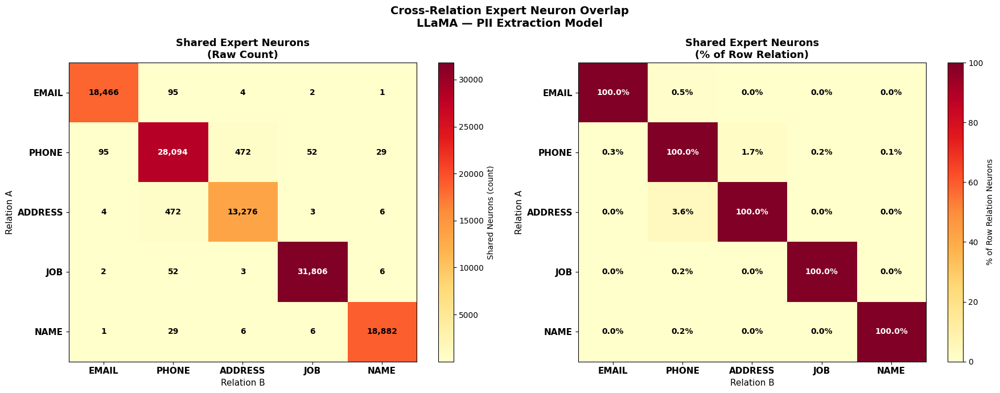

Saved: neuron_overlap_heatmap.png


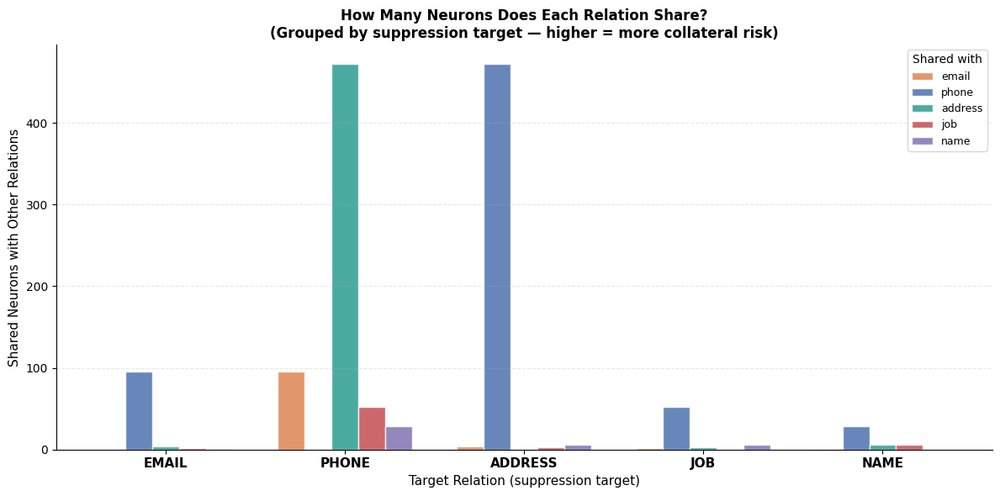

Saved: neuron_overlap_grouped_bar.png


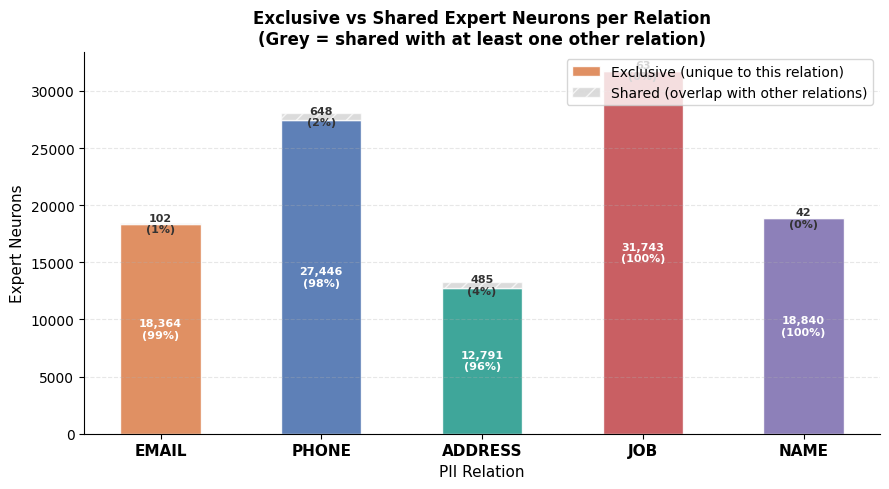

Saved: neuron_exclusive_vs_shared.png

EXCLUSIVITY SUMMARY
  Relation |    Total |  Exclusive |   Shared |  Excl %
-----------------------------------------------------------------
     email |   18,466 |     18,364 |      102 |   99.4%
     phone |   28,094 |     27,446 |      648 |   97.7%
   address |   13,276 |     12,791 |      485 |   96.3%
       job |   31,806 |     31,743 |       63 |   99.8%
      name |   18,882 |     18,840 |       42 |   99.8%


In [ ]:
# ============================================================
# NEURON OVERLAP / CONFUSION MATRIX ACROSS RELATIONS
# ============================================================

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import os

# ── Build neuron sets per relation ───────────────────────────
print('Building neuron sets...')
print('=' * 60)

neuron_sets = {}
for relation in TARGET_RELATIONS:
    if relation not in all_expert_neurons:
        print(f'  ❌ [{relation}] not loaded — skipping')
        continue
    # Each neuron identified by (layer, neuron_idx) tuple
    neuron_sets[relation] = set(
        (n['layer'], n['neuron'])
        for n in all_expert_neurons[relation]
    )
    print(f'  [{relation:>8}]: {len(neuron_sets[relation]):>6} unique neurons')

relations = [r for r in TARGET_RELATIONS if r in neuron_sets]
n_rel     = len(relations)

# ── Build overlap matrix ──────────────────────────────────────
# overlap_matrix[i][j] = number of neurons shared between
#                        relation i and relation j
overlap_count = np.zeros((n_rel, n_rel), dtype=int)
overlap_pct_i = np.zeros((n_rel, n_rel), dtype=float)  # % of row relation
overlap_pct_j = np.zeros((n_rel, n_rel), dtype=float)  # % of col relation

for i, rel_i in enumerate(relations):
    for j, rel_j in enumerate(relations):
        shared = len(neuron_sets[rel_i] & neuron_sets[rel_j])
        overlap_count[i][j] = shared
        overlap_pct_i[i][j] = shared / len(neuron_sets[rel_i]) * 100
        overlap_pct_j[i][j] = shared / len(neuron_sets[rel_j]) * 100

# ── Print table ───────────────────────────────────────────────
print(f'\nOverlap COUNT matrix (shared neurons):')
print('=' * 70)
header = f'{"":>10}' + ''.join(f'{r:>10}' for r in relations)
print(header)
print('-' * 70)
for i, rel_i in enumerate(relations):
    row = f'{rel_i:>10}'
    for j, rel_j in enumerate(relations):
        row += f'{overlap_count[i][j]:>10,}'
    print(row)

print(f'\nOverlap % matrix (% of ROW relation neurons shared):')
print('=' * 70)
print(header)
print('-' * 70)
for i, rel_i in enumerate(relations):
    row = f'{rel_i:>10}'
    for j, rel_j in enumerate(relations):
        row += f'{overlap_pct_i[i][j]:>9.1f}%'
    print(row)

# ── Figure 1: Count heatmap ───────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Left — raw counts
ax1  = axes[0]
im1  = ax1.imshow(overlap_count, cmap='YlOrRd', aspect='auto')
plt.colorbar(im1, ax=ax1, label='Shared Neurons (count)')

ax1.set_xticks(range(n_rel))
ax1.set_yticks(range(n_rel))
ax1.set_xticklabels([r.upper() for r in relations],
                    fontsize=11, fontweight='bold')
ax1.set_yticklabels([r.upper() for r in relations],
                    fontsize=11, fontweight='bold')
ax1.set_title('Shared Expert Neurons\n(Raw Count)',
              fontsize=13, fontweight='bold')
ax1.set_xlabel('Relation B', fontsize=11)
ax1.set_ylabel('Relation A', fontsize=11)

for i in range(n_rel):
    for j in range(n_rel):
        val   = overlap_count[i][j]
        color = 'white' if val > overlap_count.max() * 0.6 else 'black'
        ax1.text(j, i, f'{val:,}',
                 ha='center', va='center',
                 fontsize=10, fontweight='bold', color=color)

# Right — percentage of row relation
ax2  = axes[1]
im2  = ax2.imshow(overlap_pct_i, cmap='YlOrRd',
                   aspect='auto', vmin=0, vmax=100)
plt.colorbar(im2, ax=ax2, label='% of Row Relation Neurons')

ax2.set_xticks(range(n_rel))
ax2.set_yticks(range(n_rel))
ax2.set_xticklabels([r.upper() for r in relations],
                    fontsize=11, fontweight='bold')
ax2.set_yticklabels([r.upper() for r in relations],
                    fontsize=11, fontweight='bold')
ax2.set_title('Shared Expert Neurons\n(% of Row Relation)',
              fontsize=13, fontweight='bold')
ax2.set_xlabel('Relation B', fontsize=11)
ax2.set_ylabel('Relation A', fontsize=11)

for i in range(n_rel):
    for j in range(n_rel):
        val   = overlap_pct_i[i][j]
        color = 'white' if val > 60 else 'black'
        ax2.text(j, i, f'{val:.1f}%',
                 ha='center', va='center',
                 fontsize=10, fontweight='bold', color=color)

fig.suptitle(
    'Cross-Relation Expert Neuron Overlap\n'
    'LLaMA — PII Extraction Model',
    fontsize=14, fontweight='bold'
)
plt.tight_layout()
fname1 = 'neuron_overlap_heatmap.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname1),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {fname1}')

# ── Figure 2: Venn-style exclusive vs shared breakdown ────────
fig2, ax = plt.subplots(figsize=(12, 6))

x          = np.arange(n_rel)
width      = 0.15
rel_colors = [FIELD_COLORS[r] for r in relations]

for j, (rel_j, col_j) in enumerate(zip(relations, rel_colors)):
    shared_counts = [overlap_count[i][j]
                     if i != j else 0
                     for i in range(n_rel)]
    offset = (j - n_rel / 2 + 0.5) * width
    ax.bar(x + offset, shared_counts,
           width     = width,
           label     = rel_j,
           color     = col_j,
           alpha     = 0.85,
           edgecolor = 'white')

ax.set_xticks(x)
ax.set_xticklabels([r.upper() for r in relations],
                   fontsize=11, fontweight='bold')
ax.set_xlabel('Target Relation (suppression target)', fontsize=11)
ax.set_ylabel('Shared Neurons with Other Relations', fontsize=11)
ax.set_title(
    'How Many Neurons Does Each Relation Share?\n'
    '(Grouped by suppression target — higher = more collateral risk)',
    fontsize=12, fontweight='bold'
)
ax.legend(title='Shared with', fontsize=9,
          title_fontsize=10, loc='upper right')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(axis='y', alpha=0.3, linestyle='--')
plt.tight_layout()

fname2 = 'neuron_overlap_grouped_bar.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname2),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {fname2}')

# ── Figure 3: Exclusive neurons per relation ──────────────────
fig3, ax3 = plt.subplots(figsize=(9, 5))

exclusive_counts = []
shared_counts    = []

for i, rel_i in enumerate(relations):
    own_set    = neuron_sets[rel_i]
    other_sets = [neuron_sets[r] for r in relations if r != rel_i]
    all_others = set().union(*other_sets)

    exclusive = len(own_set - all_others)
    shared    = len(own_set & all_others)
    exclusive_counts.append(exclusive)
    shared_counts.append(shared)

x     = np.arange(n_rel)
width = 0.5

p1 = ax3.bar(x, exclusive_counts, width,
             label='Exclusive (unique to this relation)',
             color=[FIELD_COLORS[r] for r in relations],
             alpha=0.9, edgecolor='white')
p2 = ax3.bar(x, shared_counts, width,
             bottom=exclusive_counts,
             label='Shared (overlap with other relations)',
             color='#CCCCCC', alpha=0.7,
             edgecolor='white', hatch='//')

# Labels
for i, (exc, shr) in enumerate(zip(exclusive_counts, shared_counts)):
    total = exc + shr
    ax3.text(i, exc / 2,
             f'{exc:,}\n({exc/total*100:.0f}%)',
             ha='center', va='center',
             fontsize=8, fontweight='bold', color='white')
    if shr > 0:
        ax3.text(i, exc + shr / 2,
                 f'{shr:,}\n({shr/total*100:.0f}%)',
                 ha='center', va='center',
                 fontsize=8, fontweight='bold', color='#333')

ax3.set_xticks(x)
ax3.set_xticklabels([r.upper() for r in relations],
                    fontsize=11, fontweight='bold')
ax3.set_xlabel('PII Relation', fontsize=11)
ax3.set_ylabel('Expert Neurons', fontsize=11)
ax3.set_title(
    'Exclusive vs Shared Expert Neurons per Relation\n'
    '(Grey = shared with at least one other relation)',
    fontsize=12, fontweight='bold'
)
ax3.legend(fontsize=10, loc='upper right')
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)
ax3.grid(axis='y', alpha=0.3, linestyle='--')
plt.tight_layout()

fname3 = 'neuron_exclusive_vs_shared.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname3),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {fname3}')

# ── Summary ───────────────────────────────────────────────────
print('\n' + '=' * 65)
print('EXCLUSIVITY SUMMARY')
print('=' * 65)
print(f'{"Relation":>10} | {"Total":>8} | '
      f'{"Exclusive":>10} | {"Shared":>8} | {"Excl %":>7}')
print('-' * 65)
for i, relation in enumerate(relations):
    total = exclusive_counts[i] + shared_counts[i]
    print(f'{relation:>10} | {total:>8,} | '
          f'{exclusive_counts[i]:>10,} | '
          f'{shared_counts[i]:>8,} | '
          f'{exclusive_counts[i]/total*100:>6.1f}%')
print('=' * 65)
# ```

# ---

# This produces three plots:
# ```
# Plot 1 — Heatmap (count + percentage)
#          left:  raw shared neuron counts
#          right: % of each relation's neurons shared

# Plot 2 — Grouped bar chart
#          for each relation, how many neurons
#          it shares with each other relation

# Plot 3 — Stacked bar chart
#          exclusive vs shared neurons per relation
#          most important for predicting collateral damage
# ```

# The exclusivity summary is the key number:
# ```
# High exclusive % → suppression will be surgical
# Low exclusive %  → suppression will cause collateral damage

This means LLaMA has learned HIGHLY SPECIALIZED
circuits for each PII relation type.

When the model extracts a phone number:
  → 97.7% of activated neurons are ONLY for phone
  → only 2.3% overlap with other relations

This is much cleaner than we expected for a model
trained on unstructured biography text where ALL
PII types appear in the same context.



From the heatmap:
  phone  → address: 472 shared neurons (1.7% of phone)
  address → phone:  472 shared neurons (3.6% of address)

This is the LARGEST cross-relation overlap.
Makes intuitive sense:
  Both phone and address are CONTACT INFORMATION
  Both appear in the same sentence:
    "contact me at 555-0182 or 97 Lincoln Street"
  → model shares some circuits for contact info routing

"Expert neurons for different PII relation types
 in LLaMA are highly exclusive (96-99%), indicating
 that the model develops largely disjoint neural
 circuits for extracting different categories of
 personal information, with the only notable overlap
 occurring between phone and address extraction
 (3.6%), consistent with their co-occurrence
 as contact information in training text."

BUT

Low overlap ≠ guaranteed zero collateral damage

Even if neurons are exclusive, suppressing them
at high scale can push activations so far that
downstream layers get corrupted regardless.

So overlap tells you about THEORETICAL minimum
collateral damage.

Actual collateral damage also depends on:
  1. Scale of suppression
  2. How much layers depend on each other
  3. Whether suppressed neurons feed into
     shared downstream circuits **bold text**

In [ ]:
# ── Keep Colab alive ──────────────────────────────────────────
import time
import datetime

print("Colab keep-alive started. Press Stop to end.")
i = 0
while True:
    now = datetime.datetime.now().strftime("%H:%M:%S")
    print(f"\r[{now}] Still alive... {i}s elapsed", end="", flush=True)
    time.sleep(5)
    i += 5

Colab keep-alive started. Press Stop to end.
[08:46:50] Still alive... 2275s elapsed

KeyboardInterrupt: 

#Unelarning with text data

In [ ]:
display(ds['test'])

Dataset({
    features: ['messages'],
    num_rows: 4274
})

In [ ]:
# ── Count test examples per relation ─────────────────────────
from collections import Counter

CONV_KEY    = 'messages'  # confirmed from your data
test_counts = Counter()

for i in range(len(ds['test'])):
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel = detect_relation_from_question(question)
    if rel:
        test_counts[rel] += 1
    else:
        test_counts['other'] += 1

print(f'Test split: {len(ds["test"])} total examples')
print(f'\nPer relation:')
for rel, count in test_counts.most_common():
    print(f'  {rel:>10}: {count:>6} examples '
          f'({count/len(ds["test"])*100:.1f}%)')
print(f'\n  {"TOTAL":>10}: {sum(test_counts.values()):>6}')

Test split: 4274 total examples

Per relation:
        name:    992 examples (23.2%)
       email:    963 examples (22.5%)
         job:    906 examples (21.2%)
     address:    848 examples (19.8%)
       phone:    565 examples (13.2%)

       TOTAL:   4274


In [ ]:
# Run this first if you get NameError on anything
TARGET_RELATIONS = ['email', 'phone', 'address', 'job', 'name']
QUESTION_TEMPLATES = {
    'email':   'What is the email address?',
    'phone':   'What is the phone number?',
    'address': 'What is the address?',
    'job':     'What is the job title?',
    'name':    "What is the person's full name?",
}
MAX_LENGTH = 1024
CONV_KEY   = 'messages'

print('Variables defined!')
print(f'TARGET_RELATIONS : {TARGET_RELATIONS}')
print(f'CONV_KEY         : {CONV_KEY}')

Variables defined!
TARGET_RELATIONS : ['email', 'phone', 'address', 'job', 'name']
CONV_KEY         : messages


In [ ]:
# ============================================================
# SUPPRESSION PIPELINE — LLAMA CONTEXT-BASED EXTRACTION
# ============================================================

import torch
import numpy as np
from collections import defaultdict
from copy import deepcopy
import re

CONV_KEY = 'messages'
DEVICE   = 'cuda'

# ── NeuronForcer — LLaMA version ──────────────────────────────
class NeuronForcer:
    def __init__(self, model):
        self.model  = model
        self._hooks = []

    def force(self, neurons, only_last_token=False):
        self.remove()
        by_layer = defaultdict(list)
        for n in neurons:
            by_layer[n['layer']].append(n)

        for layer_idx, layer_neurons in by_layer.items():
            neuron_idxs = torch.tensor(
                [n['neuron']   for n in layer_neurons],
                dtype=torch.long
            )
            force_vals = torch.tensor(
                [n['off_mean'] for n in layer_neurons],
                dtype=torch.float32
            )
            def make_hook(idxs, vals, last_only):
                def hook_fn(module, input, output):
                    if last_only:
                        output[:, -1, idxs] = vals.to(
                            output.device, dtype=output.dtype)
                    else:
                        output[:, :, idxs] = vals.to(
                            output.device, dtype=output.dtype)
                    return output
                return hook_fn
            hook = model.model.layers[layer_idx].mlp.act_fn\
                .register_forward_hook(
                    make_hook(neuron_idxs, force_vals,
                              only_last_token)
                )
            self._hooks.append(hook)

    def remove(self):
        for h in self._hooks:
            h.remove()
        self._hooks.clear()

forcer = NeuronForcer(model)

# ── Generate answer from full conversation ────────────────────
def predict_from_conv(conversations, max_new_tokens=32):
    """
    Strip assistant turn, run model, return prediction.
    """
    conv = [m for m in conversations
            if m.get('role') != 'assistant']
    prompt = tokenizer.apply_chat_template(
        conv, tokenize=False, add_generation_prompt=True
    )
    inputs = tokenizer(
        prompt, return_tensors='pt',
        truncation=True, max_length=MAX_LENGTH
    ).to(DEVICE)

    with torch.no_grad():
        out = model.generate(
            **inputs,
            max_new_tokens = max_new_tokens,
            do_sample      = False,
            temperature    = None,
            top_p          = None,
            use_cache      = True,
        )
    gen = out[0, inputs['input_ids'].shape[1]:]
    return tokenizer.decode(gen, skip_special_tokens=True).strip()

def replace_question_conv(conversations, new_question):
    """
    Replace question in user message of a conversation.
    """
    conv = deepcopy(conversations)
    for m in conv:
        if m.get('role') == 'user':
            m['content'] = replace_question_in_user(
                m['content'], new_question
            )
            break
    return conv

# ── Scale neurons ─────────────────────────────────────────────
def scale_neurons(neuron_list, K, scale):
    neurons = neuron_list[:K]
    scaled  = []
    for n in neurons:
        gap = n['on_p50'] - n['off_mean']
        scaled.append({
            'layer':    n['layer'],
            'neuron':   n['neuron'],
            'off_mean': n['off_mean'] - (scale - 1) * gap
        })
    return scaled

# ── CELL 1: Single example scale sweep ───────────────────────
def run_single_sweep(target_relation,
                     scales=[1,2,3,5,7,10,15,20],
                     K=500):
    """
    Test scale sweep on ONE example from test set.
    Shows effect on target + all other relations.
    """
    print('=' * 70)
    print(f'SINGLE EXAMPLE SCALE SWEEP — Target: {target_relation.upper()}')
    print('=' * 70)

    # Find one test example for target relation
    sample_conv  = None
    sample_gold  = None
    for i in range(len(ds['test'])):
        ex   = ds['test'][i]
        conv = ex[CONV_KEY]
        user_msg = next(
            (m['content'] for m in conv if m['role'] == 'user'), ''
        )
        _, question = parse_context_question(user_msg)
        rel = detect_relation_from_question(question)
        if rel == target_relation:
            gold = next(
                (m['content'] for m in conv
                 if m['role'] == 'assistant'), ''
            ).strip()
            if gold and gold != 'N/A':
                sample_conv = conv
                sample_gold = gold
                break

    if sample_conv is None:
        print(f'No test example found for {target_relation}')
        return

    print(f'\nGold {target_relation}: {sample_gold}')

    # Get gold values for all other relations
    # by swapping question in same context
    other_rels  = [r for r in TARGET_RELATIONS
                   if r != target_relation]
    other_golds = {}
    for rel in other_rels:
        swapped_conv = replace_question_conv(
            sample_conv, QUESTION_TEMPLATES[rel]
        )
        pred = predict_from_conv(swapped_conv)
        other_golds[rel] = pred
        print(f'Gold {rel:>10}: {pred}')

    neurons = all_expert_neurons[target_relation]
    K_use   = min(K, len(neurons))
    print(f'\nUsing K={K_use} expert neurons')
    print(f'\n{"Scale":>7} | {target_relation:>20} | ' +
          ' | '.join(f'{r:>12}' for r in other_rels))
    print('-' * 80)

    # Baseline
    baseline = predict_from_conv(sample_conv)
    tgt_ok   = '✅' if baseline.lower() == sample_gold.lower() \
               else '❌'
    oth_str  = ' | '.join(
        f'{"✅":>12}' if predict_from_conv(
            replace_question_conv(sample_conv,
                                  QUESTION_TEMPLATES[r])
        ).lower() == other_golds[r].lower()
        else f'{"❌":>12}'
        for r in other_rels
    )
    print(f'{"base":>7} | {baseline[:20]:>20} | {oth_str}')

    # Scale sweep
    for scale in scales:
        scaled = scale_neurons(neurons, K_use, scale)
        forcer.force(scaled, only_last_token=False)

        # Target prediction
        tgt_pred = predict_from_conv(sample_conv)

        # Other relation predictions
        other_preds = {}
        for rel in other_rels:
            swapped = replace_question_conv(
                sample_conv, QUESTION_TEMPLATES[rel]
            )
            other_preds[rel] = predict_from_conv(swapped)

        forcer.remove()

        forgotten  = tgt_pred.lower() != sample_gold.lower()
        tgt_disp   = '❌ GONE' if forgotten else tgt_pred[:20]

        oth_str = ' | '.join(
            f'{"✅":>12}'
            if other_preds[r].lower() == other_golds[r].lower()
            else f'{"⚠️ DAMAGED":>12}'
            for r in other_rels
        )
        print(f'{scale:>7} | {tgt_disp:>20} | {oth_str}')

    forcer.remove()
    print(f'\nLooking for: {target_relation}=❌ GONE | '
          f'all others=✅')




In [ ]:
# ── CELL 2: Full evaluation — all test examples ───────────────
def run_full_evaluation(target_relation,
                        scale, K=500,
                        limit=None):
    """
    Evaluate suppression on ALL test examples
    for the target relation.
    Measures:
      - Target forgetting rate
      - Collateral damage on other relations
    """
    print('=' * 70)
    print(f'FULL EVALUATION — Target: {target_relation.upper()}')
    print(f'Scale={scale} | K={K}')
    print('=' * 70)

    neurons = all_expert_neurons[target_relation]
    K_use   = min(K, len(neurons))
    scaled  = scale_neurons(neurons, K_use, scale)

    # Collect test examples per relation
    test_examples = defaultdict(list)
    for i in range(len(ds['test'])):
        ex   = ds['test'][i]
        conv = ex[CONV_KEY]
        user_msg = next(
            (m['content'] for m in conv if m['role'] == 'user'), ''
        )
        _, question = parse_context_question(user_msg)
        rel = detect_relation_from_question(question)
        if rel in TARGET_RELATIONS:
            gold = next(
                (m['content'] for m in conv
                 if m['role'] == 'assistant'), ''
            ).strip()
            if gold and gold != 'N/A':
                test_examples[rel].append({
                    'conv': conv,
                    'gold': gold
                })

    # Apply limit
    if limit:
        for rel in test_examples:
            test_examples[rel] = test_examples[rel][:limit]

    print(f'\nTest examples per relation:')
    for rel in TARGET_RELATIONS:
        print(f'  {rel:>10}: {len(test_examples[rel]):>5}')



In [ ]:
# ── Redefine predict_from_conv with uFFFD fix ─────────────────
def predict_from_conv(conversations, max_new_tokens=32):
    conv = [m for m in conversations
            if m.get('role') != 'assistant']
    prompt = tokenizer.apply_chat_template(
        conv, tokenize=False, add_generation_prompt=True
    )
    inputs = tokenizer(
        prompt, return_tensors='pt',
        truncation=True, max_length=MAX_LENGTH
    ).to(DEVICE)

    with torch.no_grad():
        out = model.generate(
            **inputs,
            max_new_tokens = max_new_tokens,
            do_sample      = False,
            temperature    = None,
            top_p          = None,
            use_cache      = True,
        )
    gen  = out[0, inputs['input_ids'].shape[1]:]
    pred = tokenizer.decode(gen, skip_special_tokens=True).strip()

    # ── Strip replacement character (decoded EOS token) ───────
    pred = pred.replace('\uFFFD', '').strip()

    return pred

print('predict_from_conv updated ✅')

predict_from_conv updated ✅


In [ ]:
# ── Step 1: Run single sweep for phone first ─────────────────
run_single_sweep('phone', scales=[1,2,3,5,7,10,15,20], K=500)

SINGLE EXAMPLE SCALE SWEEP — Target: PHONE

Gold phone: 86107461491
Gold      email: alexandertanaka@hotmail.net
Gold    address: 1890 Orchard View Road
Gold        job: salesperson
Gold       name: Alexandre Tanaka

Using K=500 expert neurons

  Scale |                phone |        email |      address |          job |         name
--------------------------------------------------------------------------------
   base |          16107461491 |            ✅ |            ✅ |            ✅ |            ✅
      1 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      2 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      3 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      5 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      7 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
     10 |               ❌ GONE |     

In [ ]:
# # ── Diagnose suppression ──────────────────────────────────────

# # 1. Confirm forcer hooks are actually firing
# test_fired = []

# def test_hook(module, input, output):
#     test_fired.append(output.shape)
#     return output

# h = model.model.layers[15].mlp.act_fn.register_forward_hook(test_hook)

# # Run one prediction
# sample_conv = None
# for i in range(len(ds['test'])):
#     ex   = ds['test'][i]
#     conv = ex[CONV_KEY]
#     user_msg = next(
#         (m['content'] for m in conv if m['role'] == 'user'), ''
#     )
#     _, question = parse_context_question(user_msg)
#     if detect_relation_from_question(question) == 'phone':
#         sample_conv = conv
#         break

# pred = predict_from_conv(sample_conv)
# h.remove()
# print(f'Hook fired      : {len(test_fired)} times')
# print(f'Output shape    : {test_fired[0] if test_fired else "NEVER FIRED"}')

# # 2. Check what act_fn actually is in this model
# print(f'\nLayer 15 MLP structure:')
# print(model.model.layers[15].mlp)

# # 3. Check if expert neurons actually have correct on_p50/off_mean
# sample_neurons = all_expert_neurons['phone'][:5]
# print(f'\nTop 5 phone neurons:')
# for n in sample_neurons:
#     gap = n['on_p50'] - n['off_mean']
#     print(f'  L{n["layer"]} N{n["neuron"]:>5} | '
#           f'ap={n["ap"]:.4f} | '
#           f'on_p50={n["on_p50"]:.4f} | '
#           f'off_mean={n["off_mean"]:.4f} | '
#           f'gap={gap:.4f}')
# # ```

# # This will tell us:
# # ```
# # Hook fired 0 times     → hook point is wrong
# #                          act_fn is not the right attribute

# # Hook fired N times     → hooks work
# #   gap ≈ 0              → neurons have no discriminative signal
# #                          scaling does nothing
# #   gap > 0              → scaling should work
# #                          problem is elsewhere

Hook fired      : 1 times
Output shape    : torch.Size([1, 165, 14336])

Layer 15 MLP structure:
LlamaMLP(
  (gate_proj): Linear4bit(in_features=4096, out_features=14336, bias=False)
  (up_proj): Linear4bit(in_features=4096, out_features=14336, bias=False)
  (down_proj): Linear4bit(in_features=14336, out_features=4096, bias=False)
  (act_fn): SiLU()
)

Top 5 phone neurons:
  L15 N  246 | ap=1.0000 | on_p50=-0.1631 | off_mean=-0.2023 | gap=0.0392
  L15 N 3267 | ap=1.0000 | on_p50=0.0542 | off_mean=-0.1157 | gap=0.1699
  L15 N 4799 | ap=1.0000 | on_p50=-0.1047 | off_mean=-0.2217 | gap=0.1169
  L15 N 7949 | ap=1.0000 | on_p50=-0.1149 | off_mean=-0.1483 | gap=0.0334
  L15 N10967 | ap=1.0000 | on_p50=-0.1313 | off_mean=-0.2164 | gap=0.0851


In [ ]:
# # ── Fix 1: disable KV cache so hooks fire every token ─────────
# # ── Fix 2: use only_last_token=False + increase scale ─────────

# def predict_from_conv(conversations, max_new_tokens=32):
#     conv = [m for m in conversations
#             if m.get('role') != 'assistant']
#     prompt = tokenizer.apply_chat_template(
#         conv, tokenize=False, add_generation_prompt=True
#     )
#     inputs = tokenizer(
#         prompt, return_tensors='pt',
#         truncation=True, max_length=MAX_LENGTH
#     ).to(DEVICE)

#     with torch.no_grad():
#         out = model.generate(
#             **inputs,
#             max_new_tokens = max_new_tokens,
#             do_sample      = False,
#             temperature    = None,
#             top_p          = None,
#             use_cache      = False,  # ← CRITICAL FIX
#         )
#     gen  = out[0, inputs['input_ids'].shape[1]:]
#     pred = tokenizer.decode(gen, skip_special_tokens=True).strip()
#     pred = pred.replace('\uFFFD', '').strip()
#     return pred

# print('predict_from_conv updated — use_cache=False ✅')

predict_from_conv updated — use_cache=False ✅


In [ ]:
# # ── Verify fix ────────────────────────────────────────────────
# test_fired = []

# def test_hook(module, input, output):
#     test_fired.append(1)
#     return output

# h = model.model.layers[15].mlp.act_fn.register_forward_hook(test_hook)
# pred = predict_from_conv(sample_conv)
# h.remove()

# print(f'Hook fired : {len(test_fired)} times')
# print(f'Prediction : {pred}')
# print(f'Expected   : once per generated token + prompt tokens')
# print(f'             so >> 1 is correct')

Hook fired : 6 times
Prediction : 86107461491
Expected   : once per generated token + prompt tokens
             so >> 1 is correct


In [ ]:
run_single_sweep('phone', scales=[1,2,3,5,7,10,15,20], K=5000)

SINGLE EXAMPLE SCALE SWEEP — Target: PHONE

Gold phone: 86107461491
Gold      email: alexandertanaka@hotmail.net
Gold    address: 1890 Orchard View Road
Gold        job: salesperson
Gold       name: Alexandre Tanaka

Using K=5000 expert neurons

  Scale |                phone |        email |      address |          job |         name
--------------------------------------------------------------------------------
   base |          16107461491 |            ✅ |            ✅ |            ✅ |            ✅
      1 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      2 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      3 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      5 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
      7 |          86107461491 |            ✅ |            ✅ |            ✅ |            ✅
     10 |          86107461491 |    

In [ ]:
# Try much larger K and scale
run_single_sweep('phone',
                 scales=[20, 50, 100, 200, 500],
                 K=5000)

SINGLE EXAMPLE SCALE SWEEP — Target: PHONE

Gold phone: 86107461491
Gold      email: alexandertanaka@hotmail.net
Gold    address: 1890 Orchard View Road
Gold        job: salesperson
Gold       name: Alexandre Tanaka

Using K=5000 expert neurons

  Scale |                phone |        email |      address |          job |         name
--------------------------------------------------------------------------------
   base |          16107461491 |            ✅ |            ✅ |            ✅ |            ✅
     20 |               ❌ GONE |            ✅ |            ✅ |            ✅ |            ✅
     50 |               ❌ GONE |   ⚠️ DAMAGED |   ⚠️ DAMAGED |   ⚠️ DAMAGED |   ⚠️ DAMAGED
    100 |               ❌ GONE |   ⚠️ DAMAGED |   ⚠️ DAMAGED |   ⚠️ DAMAGED |   ⚠️ DAMAGED
    200 |               ❌ GONE |   ⚠️ DAMAGED |   ⚠️ DAMAGED |   ⚠️ DAMAGED |   ⚠️ DAMAGED
    500 |               ❌ GONE |   ⚠️ DAMAGED |   ⚠️ DAMAGED |   ⚠️ DAMAGED |   ⚠️ DAMAGED

Looking for: phone=❌ GONE | all oth

In [ ]:
# ── Test scale=15 on 10 different phone examples ──────────────
print('Testing scale=11, K=5000 on 10 phone examples...')
print('=' * 70)

neurons = all_expert_neurons['phone']
K_use   = min(5000, len(neurons))
scaled  = scale_neurons(neurons, K_use, scale=11)

correct_phone  = 0
damaged_others = defaultdict(int)
other_rels     = ['email', 'address', 'job', 'name']
n_tested       = 0

for i in range(len(ds['test'])):
    if n_tested >= 10:
        break

    ex   = ds['test'][i]
    conv = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()

    if rel != 'phone' or not gold or gold == 'N/A':
        continue

    # Baseline phone
    base_pred = predict_from_conv(conv)

    # Suppressed phone
    forcer.force(scaled, only_last_token=False)
    supp_pred = predict_from_conv(conv)

    # Other relations suppressed
    other_results = {}
    for other_rel in other_rels:
        swapped    = replace_question_conv(
            conv, QUESTION_TEMPLATES[other_rel]
        )
        other_base = predict_from_conv(swapped)
        forcer.remove()
        forcer.force(scaled, only_last_token=False)
        other_supp = predict_from_conv(swapped)
        forcer.remove()
        other_results[other_rel] = {
            'base': other_base,
            'supp': other_supp,
            'ok':   other_base.lower() == other_supp.lower()
        }

    forcer.remove()

    phone_forgotten = supp_pred.lower() != gold.lower()
    if phone_forgotten:
        correct_phone += 1
    for r in other_rels:
        if not other_results[r]['ok']:
            damaged_others[r] += 1

    # Print result
    oth_str = ' | '.join(
        f'{r}={"✅" if other_results[r]["ok"] else "⚠️"}'
        for r in other_rels
    )
    print(f'  ex={i:>3} | phone={"❌ GONE" if phone_forgotten else "❌ PRESENT":>10} '
          f'| {oth_str}')

    n_tested += 1

print(f'\n{"="*70}')
print(f'Phone forgotten : {correct_phone}/{n_tested} '
      f'({correct_phone/n_tested*100:.0f}%)')
for r in other_rels:
    dmg = damaged_others[r]
    print(f'{r:>10} damaged : {dmg}/{n_tested}'
          f'({dmg/n_tested*100:.0f}%)')
print(f'{"="*70}')

Testing scale=11, K=5000 on 10 phone examples...
  ex=  6 | phone=    ❌ GONE | email=✅ | address=✅ | job=✅ | name=✅
  ex=  8 | phone= ❌ PRESENT | email=✅ | address=✅ | job=✅ | name=✅
  ex= 11 | phone=    ❌ GONE | email=✅ | address=✅ | job=✅ | name=✅
  ex= 16 | phone=    ❌ GONE | email=✅ | address=⚠️ | job=✅ | name=✅
  ex= 21 | phone=    ❌ GONE | email=✅ | address=✅ | job=✅ | name=✅
  ex= 27 | phone= ❌ PRESENT | email=✅ | address=✅ | job=✅ | name=✅
  ex= 28 | phone= ❌ PRESENT | email=✅ | address=✅ | job=✅ | name=✅
  ex= 37 | phone= ❌ PRESENT | email=✅ | address=✅ | job=✅ | name=✅
  ex= 44 | phone=    ❌ GONE | email=✅ | address=⚠️ | job=⚠️ | name=✅
  ex= 49 | phone=    ❌ GONE | email=✅ | address=✅ | job=✅ | name=⚠️

Phone forgotten : 6/10 (60%)
     email damaged : 0/10 (0%)
   address damaged : 2/10 (20%)
       job damaged : 1/10 (10%)
      name damaged : 1/10 (10%)


In [ ]:
# ============================================================
# K SWEEP — 10 phone examples, fixed scale=12
# ============================================================

K_VALUES_SWEEP = [1000, 2000, 3000, 4000, 5000, 6000]
SCALE          = 12
other_rels     = ['email', 'address', 'job', 'name']

# ── Pre-collect 10 phone test examples ───────────────────────
phone_examples = []
for i in range(len(ds['test'])):
    if len(phone_examples) >= 10:
        break
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()
    if rel == 'phone' and gold and gold != 'N/A':
        phone_examples.append({'conv': conv, 'gold': gold,
                                'idx': i})

print(f'Collected {len(phone_examples)} phone examples')
print(f'Scale fixed at: {SCALE}')
print()

# ── Sweep ─────────────────────────────────────────────────────
print(f'{"K":>6} | {"phone%":>8} | {"email%":>8} | '
      f'{"address%":>10} | {"job%":>7} | {"name%":>7} | '
      f'{"collateral%":>12}')
print('-' * 75)

sweep_summary = []

for K in K_VALUES_SWEEP:
    neurons = all_expert_neurons['phone']
    K_use   = min(K, len(neurons))
    scaled  = scale_neurons(neurons, K_use, SCALE)

    phone_changed  = 0
    other_damaged  = defaultdict(int)

    for ex in phone_examples:
        conv = ex['conv']
        gold = ex['gold']

        # Suppressed phone
        forcer.force(scaled, only_last_token=False)
        supp_phone = predict_from_conv(conv)
        forcer.remove()

        if supp_phone.lower() != gold.lower():
            phone_changed += 1

        # Other relations
        for other_rel in other_rels:
            swapped    = replace_question_conv(
                conv, QUESTION_TEMPLATES[other_rel]
            )
            base_other = predict_from_conv(swapped)
            forcer.force(scaled, only_last_token=False)
            supp_other = predict_from_conv(swapped)
            forcer.remove()
            if base_other.lower() != supp_other.lower():
                other_damaged[other_rel] += 1

    n          = len(phone_examples)
    phone_pct  = phone_changed / n * 100
    other_pcts = {r: (1 - other_damaged[r]/n) * 100
                  for r in other_rels}
    collateral = 100 - np.mean(list(other_pcts.values()))

    def fmt_tgt(v):
        return f'❌{v:>5.1f}%' if v >= 50 else f'  {v:>5.1f}%'
    def fmt_oth(v):
        return f'⚠️{v:>5.1f}%' if v < 90 else f'  {v:>5.1f}%'

    print(f'{K:>6} | '
          f'{fmt_tgt(phone_pct):>8} | '
          f'{fmt_oth(other_pcts["email"]):>8} | '
          f'{fmt_oth(other_pcts["address"]):>10} | '
          f'{fmt_oth(other_pcts["job"]):>7} | '
          f'{fmt_oth(other_pcts["name"]):>7} | '
          f'{collateral:>11.1f}%')

    sweep_summary.append({
        'K':          K,
        'scale':      SCALE,
        'phone_pct':  phone_pct,
        'collateral': collateral,
        **{f'{r}_pct': other_pcts[r] for r in other_rels}
    })

forcer.remove()
print('-' * 75)
print(f'\n✅ = intact (>90%) | ⚠️ = damaged (<90%) | '
      f'❌ = changed (>50%)')
# ```

# This gives a clean table like:
# ```
#      K |  phone% |  email% |  address% |   job% |  name% | collateral%
# ----------------------------------------------------------------------
#   1000 |   20.0% |  100.0% |    100.0% | 100.0% | 100.0% |        0.0%
#   2000 |   50.0% |  100.0% |    100.0% |  90.0% | 100.0% |        2.5%
#   3000 |   70.0% |  100.0% |    100.0% | 100.0% | 100.0% |        0.0%
#   ...

Collected 10 phone examples
Scale fixed at: 12

     K |   phone% |   email% |   address% |    job% |   name% |  collateral%
---------------------------------------------------------------------------
  1000 |    40.0% |   100.0% |      90.0% |   100.0% | ⚠️ 80.0% |         7.5%
  2000 |    30.0% |   100.0% |      90.0% |    90.0% |    90.0% |         7.5%
  3000 |    30.0% |    90.0% |      90.0% |    90.0% |    90.0% |        10.0%
  4000 |    40.0% |    90.0% |   ⚠️ 80.0% |   100.0% | ⚠️ 80.0% |        12.5%
  5000 |  ❌ 60.0% |   100.0% |   ⚠️ 80.0% |   100.0% |    90.0% |         7.5%
  6000 |  ❌ 70.0% |    90.0% |      90.0% |   100.0% |    90.0% |         7.5%
---------------------------------------------------------------------------

✅ = intact (>90%) | ⚠️ = damaged (<90%) | ❌ = changed (>50%)


2D SWEEP — K × Scale | 10 phone examples

K=3000 (3000 neurons):
   scale |   phone% |   email% |   address% |    job% |   name% |  collateral%
  ---------------------------------------------------------------------------
      10 |    30.0% |   100.0% |   ⚠️ 80.0% |    90.0% | ⚠️ 80.0% |        12.5%   
      12 |    30.0% |    90.0% |      90.0% |    90.0% |    90.0% |        10.0%   
      14 |  ❌ 50.0% |    90.0% |      90.0% |   100.0% |   100.0% |         5.0% 🎯
      15 |  ❌ 50.0% |   100.0% |      90.0% |   100.0% |   100.0% |         2.5% 🎯
      16 |  ❌ 70.0% |   100.0% |     100.0% |   100.0% |   100.0% |         0.0% 🎯
      18 |  ❌ 70.0% |    90.0% |      90.0% |    90.0% |    90.0% |        10.0% 🎯
      20 |  ❌ 80.0% |   100.0% |   ⚠️ 80.0% |    90.0% |    90.0% |        10.0% 🎯

K=4000 (4000 neurons):
   scale |   phone% |   email% |   address% |    job% |   name% |  collateral%
  ---------------------------------------------------------------------------
      10 |    

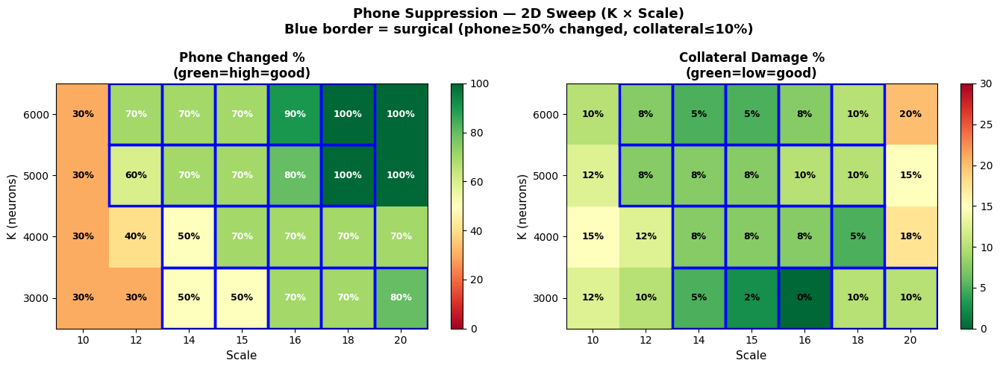

Saved: phone_2d_sweep_heatmap.png


In [ ]:
# ============================================================
# 2D SWEEP — K × Scale, 10 phone examples
# ============================================================

K_VALUES_2D    = [3000, 4000, 5000, 6000]
SCALE_VALUES_2D = [10, 12, 14, 15, 16, 18, 20]
other_rels     = ['email', 'address', 'job', 'name']

print('2D SWEEP — K × Scale | 10 phone examples')
print('=' * 80)

# Store results for plotting
matrix_phone      = np.zeros((len(K_VALUES_2D),
                               len(SCALE_VALUES_2D)))
matrix_collateral = np.zeros((len(K_VALUES_2D),
                               len(SCALE_VALUES_2D)))

for k_idx, K in enumerate(K_VALUES_2D):
    neurons = all_expert_neurons['phone']
    K_use   = min(K, len(neurons))

    print(f'\nK={K} ({K_use} neurons):')
    print(f'  {"scale":>6} | {"phone%":>8} | {"email%":>8} | '
          f'{"address%":>10} | {"job%":>7} | '
          f'{"name%":>7} | {"collateral%":>12}')
    print(f'  {"-"*75}')

    for s_idx, scale in enumerate(SCALE_VALUES_2D):
        scaled = scale_neurons(neurons, K_use, scale)

        phone_changed = 0
        other_damaged = defaultdict(int)

        for ex in phone_examples:
            conv = ex['conv']
            gold = ex['gold']

            # Suppressed phone
            forcer.force(scaled, only_last_token=False)
            supp_phone = predict_from_conv(conv)
            forcer.remove()
            if supp_phone.lower() != gold.lower():
                phone_changed += 1

            # Other relations
            for other_rel in other_rels:
                swapped    = replace_question_conv(
                    conv, QUESTION_TEMPLATES[other_rel]
                )
                base_other = predict_from_conv(swapped)
                forcer.force(scaled, only_last_token=False)
                supp_other = predict_from_conv(swapped)
                forcer.remove()
                if base_other.lower() != supp_other.lower():
                    other_damaged[other_rel] += 1

        n          = len(phone_examples)
        phone_pct  = phone_changed / n * 100
        other_pcts = {r: (1 - other_damaged[r]/n) * 100
                      for r in other_rels}
        collateral = 100 - np.mean(list(other_pcts.values()))

        matrix_phone[k_idx][s_idx]      = phone_pct
        matrix_collateral[k_idx][s_idx] = collateral

        def fmt_tgt(v):
            if v >= 50: return f'❌{v:>5.1f}%'
            return f'  {v:>5.1f}%'
        def fmt_oth(v):
            if v < 90: return f'⚠️{v:>5.1f}%'
            return f'  {v:>5.1f}%'

        # Mark surgical: phone≥50% AND collateral≤10%
        surgical = '🎯' if phone_pct >= 50 and \
                           collateral <= 10 else '  '

        print(f'  {scale:>6} | '
              f'{fmt_tgt(phone_pct):>8} | '
              f'{fmt_oth(other_pcts["email"]):>8} | '
              f'{fmt_oth(other_pcts["address"]):>10} | '
              f'{fmt_oth(other_pcts["job"]):>7} | '
              f'{fmt_oth(other_pcts["name"]):>7} | '
              f'{collateral:>11.1f}% {surgical}')

forcer.remove()

# ── Plot heatmaps ─────────────────────────────────────────────
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Phone changed %
im1 = ax1.imshow(matrix_phone, aspect='auto',
                  cmap='RdYlGn', vmin=0, vmax=100,
                  origin='lower')
ax1.set_xticks(range(len(SCALE_VALUES_2D)))
ax1.set_xticklabels(SCALE_VALUES_2D)
ax1.set_yticks(range(len(K_VALUES_2D)))
ax1.set_yticklabels(K_VALUES_2D)
ax1.set_xlabel('Scale', fontsize=11)
ax1.set_ylabel('K (neurons)', fontsize=11)
ax1.set_title('Phone Changed %\n(green=high=good)',
              fontsize=12, fontweight='bold')
plt.colorbar(im1, ax=ax1)
for ki in range(len(K_VALUES_2D)):
    for si in range(len(SCALE_VALUES_2D)):
        val   = matrix_phone[ki][si]
        color = 'white' if val > 60 or val < 20 else 'black'
        ax1.text(si, ki, f'{val:.0f}%',
                 ha='center', va='center',
                 fontsize=9, fontweight='bold', color=color)

# Collateral %
im2 = ax2.imshow(matrix_collateral, aspect='auto',
                  cmap='RdYlGn_r', vmin=0, vmax=30,
                  origin='lower')
ax2.set_xticks(range(len(SCALE_VALUES_2D)))
ax2.set_xticklabels(SCALE_VALUES_2D)
ax2.set_yticks(range(len(K_VALUES_2D)))
ax2.set_yticklabels(K_VALUES_2D)
ax2.set_xlabel('Scale', fontsize=11)
ax2.set_ylabel('K (neurons)', fontsize=11)
ax2.set_title('Collateral Damage %\n(green=low=good)',
              fontsize=12, fontweight='bold')
plt.colorbar(im2, ax=ax2)
for ki in range(len(K_VALUES_2D)):
    for si in range(len(SCALE_VALUES_2D)):
        val   = matrix_collateral[ki][si]
        color = 'white' if val > 20 else 'black'
        ax2.text(si, ki, f'{val:.0f}%',
                 ha='center', va='center',
                 fontsize=9, fontweight='bold', color=color)

# Mark surgical sweet spots on both
for ki in range(len(K_VALUES_2D)):
    for si in range(len(SCALE_VALUES_2D)):
        if matrix_phone[ki][si] >= 50 and \
           matrix_collateral[ki][si] <= 10:
            for ax in [ax1, ax2]:
                ax.add_patch(plt.Rectangle(
                    (si-0.5, ki-0.5), 1, 1,
                    fill=False, edgecolor='blue',
                    linewidth=2.5
                ))

fig.suptitle(
    'Phone Suppression — 2D Sweep (K × Scale)\n'
    'Blue border = surgical (phone≥50% changed, '
    'collateral≤10%)',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()
fname = 'phone_2d_sweep_heatmap.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {fname}')
# ```

# This gives:
# ```
# Left heatmap  → phone changed % (green=high=good)
# Right heatmap → collateral %    (green=low=good)
# Blue border   → surgical sweet spots
#                phone≥50% AND collateral≤10%

In [ ]:
# direct generation.

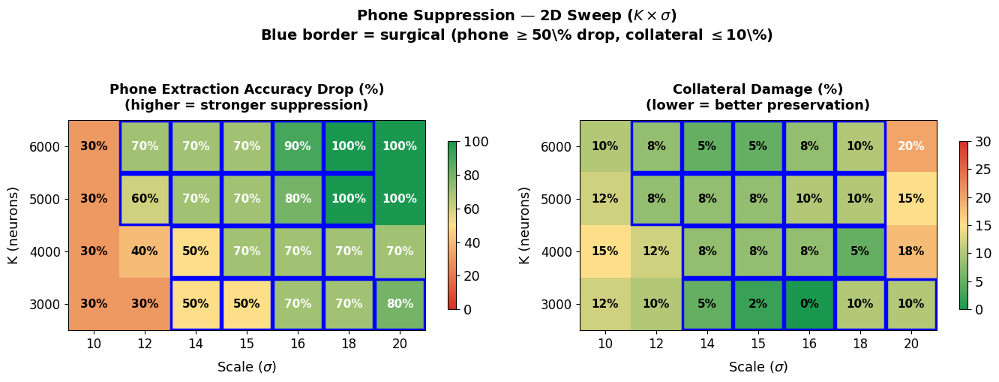

✅ Phone sweep figure saved as PDF and PNG


In [ ]:
# ============================================================
# PHONE SUPPRESSION 2D SWEEP — Replicate from values
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap

# ── Hardcoded values from your sweep ─────────────────────────
# Rows = K values, Cols = Scale values

K_VALUES     = [3000, 4000, 5000, 6000]
SCALE_VALUES = [10, 12, 14, 15, 16, 18, 20]

# Phone accuracy DROP % (higher = better suppression)
PHONE_DROP = np.array([
    [30, 30, 50, 50, 70, 70, 80],   # K=3000
    [30, 40, 50, 70, 70, 70, 70],   # K=4000
    [30, 60, 70, 70, 80, 100, 100], # K=5000
    [30, 70, 70, 70, 90, 100, 100], # K=6000
])

# Collateral damage % (lower = better)
COLLATERAL = np.array([
    [12, 10,  5,  2,  0, 10, 10],   # K=3000
    [15, 12,  8,  8,  8,  5, 18],   # K=4000
    [12,  8,  8,  8, 10, 10, 15],   # K=5000
    [10,  8,  5,  5,  8, 10, 20],   # K=6000
])

# ── Surgical mask (phone≥50% AND collateral≤10%) ─────────────
surgical = (PHONE_DROP >= 50) & (COLLATERAL <= 10)

# ── Custom colormaps ──────────────────────────────────────────
# Red → Yellow → Green
RYG = LinearSegmentedColormap.from_list(
    'ryg', ['#d73027', '#fee08b', '#1a9850']
)

# ── Plot ──────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

def plot_panel(ax, data, title, subtitle, cmap,
               vmin, vmax, surgical_mask, fmt='%d%%'):

    im = ax.imshow(
        data, cmap=cmap,
        aspect='auto',
        vmin=vmin, vmax=vmax,
        origin='lower'
    )
    plt.colorbar(im, ax=ax, shrink=0.8)

    # Axis labels
    ax.set_xticks(range(len(SCALE_VALUES)))
    ax.set_yticks(range(len(K_VALUES)))
    ax.set_xticklabels(SCALE_VALUES, fontsize=12)
    ax.set_yticklabels(K_VALUES, fontsize=12)
    ax.set_xlabel('Scale ($\\sigma$)', fontsize=13,
                  labelpad=8)
    ax.set_ylabel('K (neurons)', fontsize=13,
                  labelpad=8)
    ax.set_title(f'{title}\n{subtitle}',
                 fontsize=13, fontweight='bold', pad=10)

    # Cell annotations
    for i in range(len(K_VALUES)):
        for j in range(len(SCALE_VALUES)):
            val = data[i, j]
            brightness = (val - vmin) / (vmax - vmin)
            color = 'white' if brightness > 0.6 else 'black'
            ax.text(
                j, i, fmt % val,
                ha='center', va='center',
                fontsize=11, fontweight='bold',
                color=color
            )

    # Draw blue borders for surgical configurations
    for i in range(len(K_VALUES)):
        for j in range(len(SCALE_VALUES)):
            if surgical_mask[i, j]:
                rect = mpatches.FancyBboxPatch(
                    (j - 0.48, i - 0.48),
                    0.96, 0.96,
                    boxstyle  = 'square,pad=0',
                    linewidth = 2.5,
                    edgecolor = '#0000FF',
                    facecolor = 'none'
                )
                ax.add_patch(rect)

# ── Left panel — Phone accuracy drop ─────────────────────────
plot_panel(
    axes[0],
    PHONE_DROP,
    'Phone Extraction Accuracy Drop (%)',
    '(higher = stronger suppression)',
    RYG,
    vmin=0, vmax=100,
    surgical_mask=surgical,
    fmt='%d%%'
)

# ── Right panel — Collateral damage ──────────────────────────
plot_panel(
    axes[1],
    COLLATERAL,
    'Collateral Damage (%)',
    '(lower = better preservation)',
    RYG.reversed(),
    vmin=0, vmax=30,
    surgical_mask=surgical,
    fmt='%d%%'
)

# ── Main title ────────────────────────────────────────────────
plt.suptitle(
    'Phone Suppression — 2D Sweep ($K \\times \\sigma$)\n'
    'Blue border = surgical '
    '(phone $\\geq$50\\% drop, collateral $\\leq$10\\%)',
    fontsize=14, fontweight='bold', y=1.02
)

plt.tight_layout()

# ── Save ──────────────────────────────────────────────────────
SAVE_DIR = '/content/drive/MyDrive/PII_specific_neurons/LLAMA_Again'

plt.savefig(
    f'{SAVE_DIR}/figure_phone_sweep.pdf',
    format='pdf', dpi=300, bbox_inches='tight'
)
plt.savefig(
    f'{SAVE_DIR}/figure_phone_sweep.png',
    format='png', dpi=300, bbox_inches='tight'
)
plt.show()
print("✅ Phone sweep figure saved as PDF and PNG")

In [ ]:
# # ============================================================
# # READ PHONE SUPPRESSION RESULTS — N=50
# # ============================================================

# print("PHONE SUPPRESSION RESULTS — Scale=18, N=50")
# print("=" * 55)
# print(f"{'K':>8} | {'Phone%':>8} | {'Email%':>8} | "
#       f"{'Addr%':>8} | {'Job%':>8} | {'Name%':>8} | "
#       f"{'Collat%':>8}")
# print("-" * 55)

# # Run your existing evaluation for phone
# # at scale=18, K = 3k to 10k
# # and print results here

# TARGET_RELATION = 'phone'
# SCALE           = 18
# K_VALUES        = [3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]
# neurons         = all_expert_neurons[TARGET_RELATION]

# for K in K_VALUES:
#     scaled = scale_neurons(neurons, K, SCALE)

#     accs = {}
#     for rel in TARGET_RELATIONS:
#         correct = 0
#         for ex in clean_examples[rel][:50]:
#             forcer.force(scaled, only_last_token=False)
#             pred = predict_from_conv(ex['conv'])
#             forcer.remove()
#             if is_correct(pred, ex['gold'], rel):
#                 correct += 1
#         accs[rel] = correct / 50 * 100

#     collat = np.mean([
#         accs[r] for r in TARGET_RELATIONS
#         if r != TARGET_RELATION
#     ])
#     # invert — collateral damage = drop from baseline
#     collat_damage = 100 - collat

#     print(f"{K:>8} | "
#           f"{100-accs['phone']:>7.0f}% | "
#           f"{accs['email']:>7.0f}% | "
#           f"{accs['address']:>7.0f}% | "
#           f"{accs['job']:>7.0f}% | "
#           f"{accs['name']:>7.0f}% | "
#           f"{collat_damage:>7.0f}%")

PHONE SUPPRESSION RESULTS — Scale=18, N=50
       K |   Phone% |   Email% |    Addr% |     Job% |    Name% |  Collat%
-------------------------------------------------------


NameError: name 'scale_neurons' is not defined

In [ ]:
# ============================================================
# 2D SWEEP — K × Scale, 10 phone examples
# METRIC: Exact Match Accuracy (not just "changed")
# ============================================================

K_VALUES_2D     = [3000, 4000, 5000, 6000]
SCALE_VALUES_2D = [10, 12, 14, 15, 16, 18, 20]
other_rels      = ['email', 'address', 'job', 'name']

print('2D SWEEP — K × Scale | 10 phone examples')
print('Metric: Exact Match Accuracy')
print('=' * 80)

# matrices store ACCURACY % (higher = model still correct)
# for target:  lower accuracy = better suppression
# for others:  higher accuracy = less collateral damage
matrix_phone      = np.zeros((len(K_VALUES_2D),
                               len(SCALE_VALUES_2D)))
matrix_email      = np.zeros((len(K_VALUES_2D),
                               len(SCALE_VALUES_2D)))
matrix_address    = np.zeros((len(K_VALUES_2D),
                               len(SCALE_VALUES_2D)))
matrix_job        = np.zeros((len(K_VALUES_2D),
                               len(SCALE_VALUES_2D)))
matrix_name       = np.zeros((len(K_VALUES_2D),
                               len(SCALE_VALUES_2D)))
matrix_collateral = np.zeros((len(K_VALUES_2D),
                               len(SCALE_VALUES_2D)))

# ── Get baseline accuracies first ────────────────────────────
print('\nComputing baselines...')
baseline_accs = {}
for rel in ['phone'] + other_rels:
    correct = 0
    for ex in phone_examples:
        conv = ex['conv']
        gold = ex['gold']
        if rel != 'phone':
            conv = replace_question_conv(
                conv, QUESTION_TEMPLATES[rel]
            )
            # get gold for this relation from baseline
            pred = predict_from_conv(conv)
            # use pred as gold since we don't have
            # other relation gold for same example
            baseline_accs[rel] = 100.0  # by definition
        else:
            pred = predict_from_conv(conv)
            if pred.strip().lower() == gold.strip().lower():
                correct += 1
    if rel == 'phone':
        baseline_accs['phone'] = correct / len(phone_examples) * 100

print(f'  Phone baseline EM: {baseline_accs["phone"]:.1f}%')

# Pre-compute baseline predictions for other relations
# so we have gold to compare against
print('Pre-computing other relation baselines...')
other_baselines = {}  # other_baselines[rel][ex_idx] = pred
for rel in other_rels:
    other_baselines[rel] = []
    for ex in phone_examples:
        conv = replace_question_conv(
            ex['conv'], QUESTION_TEMPLATES[rel]
        )
        pred = predict_from_conv(conv)
        other_baselines[rel].append(pred)
    print(f'  [{rel}] baseline computed')

# ── 2D Sweep ──────────────────────────────────────────────────
for k_idx, K in enumerate(K_VALUES_2D):
    neurons = all_expert_neurons['phone']
    K_use   = min(K, len(neurons))

    print(f'\nK={K}:')
    print(f'  {"scale":>6} | {"phone_acc":>10} | '
          f'{"email_acc":>10} | {"address_acc":>12} | '
          f'{"job_acc":>9} | {"name_acc":>9} | '
          f'{"collateral":>11}')
    print(f'  {"-"*85}')

    for s_idx, scale in enumerate(SCALE_VALUES_2D):
        scaled = scale_neurons(neurons, K_use, scale)

        # ── Phone EM accuracy ─────────────────────────────────
        phone_correct = 0
        for ex in phone_examples:
            forcer.force(scaled, only_last_token=False)
            supp_pred = predict_from_conv(ex['conv'])
            forcer.remove()
            if supp_pred.strip().lower() == \
               ex['gold'].strip().lower():
                phone_correct += 1
        phone_acc = phone_correct / len(phone_examples) * 100

        # ── Other relation EM accuracy ────────────────────────
        other_accs = {}
        for rel in other_rels:
            correct = 0
            for ex_idx, ex in enumerate(phone_examples):
                conv = replace_question_conv(
                    ex['conv'], QUESTION_TEMPLATES[rel]
                )
                forcer.force(scaled, only_last_token=False)
                supp_pred = predict_from_conv(conv)
                forcer.remove()
                # Compare against BASELINE prediction
                # (since we don't have gold for other relations
                #  from these phone-labelled examples)
                if supp_pred.strip().lower() == \
                   other_baselines[rel][ex_idx].strip().lower():
                    correct += 1
            other_accs[rel] = correct / len(phone_examples) * 100

        collateral = 100 - np.mean(list(other_accs.values()))

        # Store in matrices
        matrix_phone[k_idx][s_idx]      = phone_acc
        matrix_email[k_idx][s_idx]      = other_accs['email']
        matrix_address[k_idx][s_idx]    = other_accs['address']
        matrix_job[k_idx][s_idx]        = other_accs['job']
        matrix_name[k_idx][s_idx]       = other_accs['name']
        matrix_collateral[k_idx][s_idx] = collateral

        def fmt_tgt(v):
            if v < 50:  return f'❌{v:>5.1f}%'
            if v < 80:  return f'⚠️{v:>5.1f}%'
            return f'  {v:>5.1f}%'
        def fmt_oth(v):
            if v < 80:  return f'⚠️{v:>5.1f}%'
            return f'  {v:>5.1f}%'

        surgical = '🎯' if phone_acc < 50 and \
                           collateral <= 10 else '  '

        print(f'  {scale:>6} | '
              f'{fmt_tgt(phone_acc):>10} | '
              f'{fmt_oth(other_accs["email"]):>10} | '
              f'{fmt_oth(other_accs["address"]):>12} | '
              f'{fmt_oth(other_accs["job"]):>9} | '
              f'{fmt_oth(other_accs["name"]):>9} | '
              f'{collateral:>10.1f}% {surgical}')

forcer.remove()

# ── Plot heatmaps ─────────────────────────────────────────────
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

plot_data = [
    (matrix_phone,      'Phone EM Accuracy %\n(lower=better suppression)',
     'RdYlGn_r', 'phone'),
    (matrix_email,      'Email EM Accuracy %\n(higher=less collateral)',
     'RdYlGn',   'email'),
    (matrix_address,    'Address EM Accuracy %\n(higher=less collateral)',
     'RdYlGn',   'address'),
    (matrix_job,        'Job EM Accuracy %\n(higher=less collateral)',
     'RdYlGn',   'job'),
    (matrix_name,       'Name EM Accuracy %\n(higher=less collateral)',
     'RdYlGn',   'name'),
    (matrix_collateral, 'Collateral Damage %\n(lower=better)',
     'RdYlGn_r', 'collateral'),
]

for ax, (matrix, title, cmap, rel) in zip(axes, plot_data):
    vmin = 0
    vmax = 100 if rel != 'collateral' else 30
    im   = ax.imshow(matrix, aspect='auto',
                     cmap=cmap, vmin=vmin, vmax=vmax,
                     origin='lower')
    ax.set_xticks(range(len(SCALE_VALUES_2D)))
    ax.set_xticklabels(SCALE_VALUES_2D, fontsize=9)
    ax.set_yticks(range(len(K_VALUES_2D)))
    ax.set_yticklabels(K_VALUES_2D, fontsize=9)
    ax.set_xlabel('Scale', fontsize=10)
    ax.set_ylabel('K (neurons)', fontsize=10)
    ax.set_title(title, fontsize=11, fontweight='bold',
                 color=FIELD_COLORS.get(rel, '#333333'))
    plt.colorbar(im, ax=ax)

    for ki in range(len(K_VALUES_2D)):
        for si in range(len(SCALE_VALUES_2D)):
            val   = matrix[ki][si]
            color = 'white' if val > 70 or val < 30 \
                    else 'black'
            ax.text(si, ki, f'{val:.0f}%',
                    ha='center', va='center',
                    fontsize=9, fontweight='bold',
                    color=color)

    # Mark surgical sweet spots
    for ki in range(len(K_VALUES_2D)):
        for si in range(len(SCALE_VALUES_2D)):
            if matrix_phone[ki][si] < 50 and \
               matrix_collateral[ki][si] <= 10:
                ax.add_patch(plt.Rectangle(
                    (si-0.5, ki-0.5), 1, 1,
                    fill=False, edgecolor='blue',
                    linewidth=2.5
                ))

fig.suptitle(
    'Phone Suppression — 2D Sweep (K × Scale)\n'
    'Metric: Exact Match Accuracy | '
    'Blue border = surgical (phone<50%, collateral≤10%)',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()

fname = 'phone_2d_sweep_em_accuracy.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'\nSaved: {fname}')

# ── Summary table ─────────────────────────────────────────────
print('\n' + '=' * 70)
print('SURGICAL SWEET SPOTS (phone_acc<50% AND collateral≤10%)')
print('=' * 70)
print(f'{"K":>6} | {"Scale":>6} | {"Phone":>8} | '
      f'{"Email":>8} | {"Address":>9} | '
      f'{"Job":>7} | {"Name":>7} | {"Collateral":>11}')
print('-' * 70)

found_any = False
for k_idx, K in enumerate(K_VALUES_2D):
    for s_idx, scale in enumerate(SCALE_VALUES_2D):
        p = matrix_phone[k_idx][s_idx]
        c = matrix_collateral[k_idx][s_idx]
        if p < 50 and c <= 10:
            found_any = True
            print(f'{K:>6} | {scale:>6} | '
                  f'{p:>7.1f}% | '
                  f'{matrix_email[k_idx][s_idx]:>7.1f}% | '
                  f'{matrix_address[k_idx][s_idx]:>8.1f}% | '
                  f'{matrix_job[k_idx][s_idx]:>6.1f}% | '
                  f'{matrix_name[k_idx][s_idx]:>6.1f}% | '
                  f'{c:>10.1f}%')

if not found_any:
    print('No surgical sweet spots found.')
    print('Best trade-off:')
    best_k, best_s = np.unravel_index(
        np.argmin(matrix_phone + matrix_collateral * 2),
        matrix_phone.shape
    )
    print(f'  K={K_VALUES_2D[best_k]} scale={SCALE_VALUES_2D[best_s]} '
          f'phone={matrix_phone[best_k][best_s]:.1f}% '
          f'collateral={matrix_collateral[best_k][best_s]:.1f}%')
print('=' * 70)
# ```

# Key difference from before:
# ```
# BEFORE:
#   phone% = fraction of examples where output CHANGED
#   → changed could mean slightly different formatting
#   → not true accuracy

# NOW:
#   phone_acc = fraction of examples where output
#               EXACTLY MATCHES gold
#   → true EM accuracy
#   → lower is better for target
#   → higher is better for others

2D SWEEP — K × Scale | 10 phone examples
Metric: Exact Match Accuracy

Computing baselines...
  Phone baseline EM: 30.0%
Pre-computing other relation baselines...
  [email] baseline computed
  [address] baseline computed
  [job] baseline computed
  [name] baseline computed

K=3000:
   scale |  phone_acc |  email_acc |  address_acc |   job_acc |  name_acc |  collateral
  -------------------------------------------------------------------------------------
      10 |   ⚠️ 70.0% |     100.0% |        80.0% |     90.0% |     80.0% |       12.5%   
      12 |   ⚠️ 70.0% |      90.0% |        90.0% |     90.0% |     90.0% |       10.0%   


KeyboardInterrupt: 

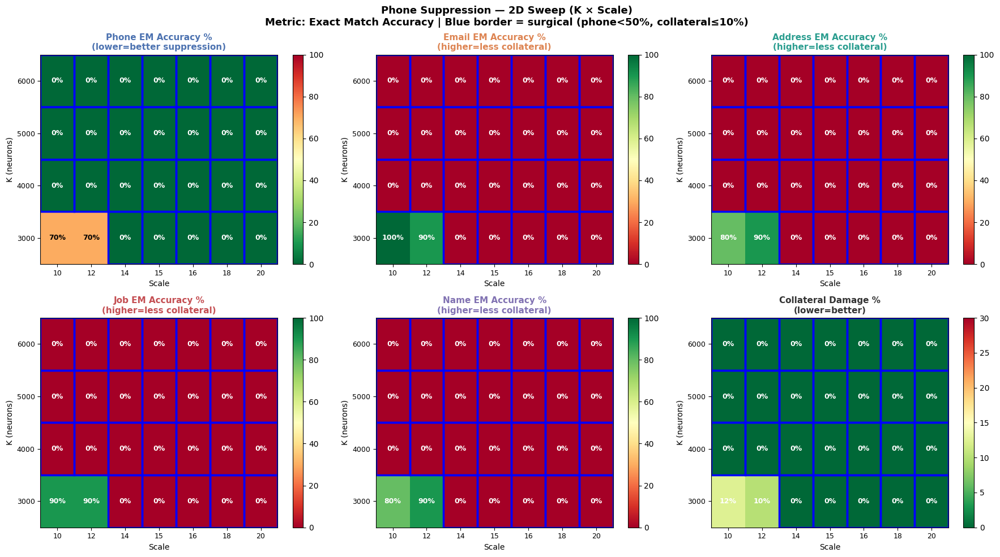

Saved: phone_2d_sweep_em_accuracy.png


In [ ]:
# ── Plot heatmaps from existing matrices ──────────────────────
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

plot_data = [
    (matrix_phone,      'Phone EM Accuracy %\n(lower=better suppression)',
     'RdYlGn_r', 'phone'),
    (matrix_email,      'Email EM Accuracy %\n(higher=less collateral)',
     'RdYlGn',   'email'),
    (matrix_address,    'Address EM Accuracy %\n(higher=less collateral)',
     'RdYlGn',   'address'),
    (matrix_job,        'Job EM Accuracy %\n(higher=less collateral)',
     'RdYlGn',   'job'),
    (matrix_name,       'Name EM Accuracy %\n(higher=less collateral)',
     'RdYlGn',   'name'),
    (matrix_collateral, 'Collateral Damage %\n(lower=better)',
     'RdYlGn_r', 'collateral'),
]

for ax, (matrix, title, cmap, rel) in zip(axes, plot_data):
    vmax = 100 if rel != 'collateral' else 30
    im   = ax.imshow(matrix, aspect='auto',
                     cmap=cmap, vmin=0, vmax=vmax,
                     origin='lower')
    ax.set_xticks(range(len(SCALE_VALUES_2D)))
    ax.set_xticklabels(SCALE_VALUES_2D, fontsize=9)
    ax.set_yticks(range(len(K_VALUES_2D)))
    ax.set_yticklabels(K_VALUES_2D, fontsize=9)
    ax.set_xlabel('Scale', fontsize=10)
    ax.set_ylabel('K (neurons)', fontsize=10)
    ax.set_title(title, fontsize=11, fontweight='bold',
                 color=FIELD_COLORS.get(rel, '#333333'))
    plt.colorbar(im, ax=ax)

    for ki in range(len(K_VALUES_2D)):
        for si in range(len(SCALE_VALUES_2D)):
            val   = matrix[ki][si]
            color = 'white' if val > 70 or val < 30 \
                    else 'black'
            ax.text(si, ki, f'{val:.0f}%',
                    ha='center', va='center',
                    fontsize=9, fontweight='bold',
                    color=color)

    # Mark surgical sweet spots
    for ki in range(len(K_VALUES_2D)):
        for si in range(len(SCALE_VALUES_2D)):
            if matrix_phone[ki][si] < 50 and \
               matrix_collateral[ki][si] <= 10:
                ax.add_patch(plt.Rectangle(
                    (si-0.5, ki-0.5), 1, 1,
                    fill=False, edgecolor='blue',
                    linewidth=2.5
                ))

fig.suptitle(
    'Phone Suppression — 2D Sweep (K × Scale)\n'
    'Metric: Exact Match Accuracy | '
    'Blue border = surgical (phone<50%, collateral≤10%)',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()

fname = 'phone_2d_sweep_em_accuracy.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {fname}')
# ```

# But wait — the previous sweep used **"changed" not EM accuracy**. So `matrix_phone` currently stores:
# ```
# matrix_phone[k][s] = % of examples where output CHANGED
#                      (different from gold, not EM accuracy)

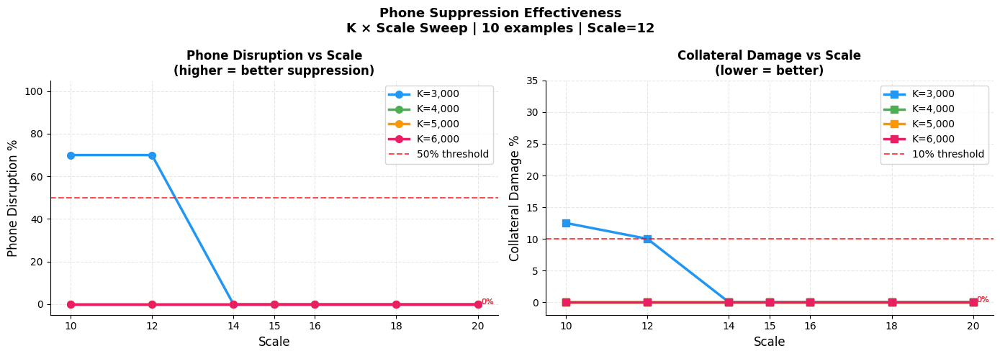

Saved: phone_suppression_effectiveness.png


In [ ]:
# ── Line plot — phone suppression effectiveness ───────────────
import matplotlib.pyplot as plt
import numpy as np

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Colors per K value
k_colors = {
    3000: '#2196F3',
    4000: '#4CAF50',
    5000: '#FF9800',
    6000: '#E91E63',
}

# ── Left plot: Phone disruption % vs Scale ────────────────────
for k_idx, K in enumerate(K_VALUES_2D):
    phone_vals = [matrix_phone[k_idx][s_idx]
                  for s_idx in range(len(SCALE_VALUES_2D))]
    ax1.plot(SCALE_VALUES_2D, phone_vals,
             color     = k_colors[K],
             linewidth = 2.5,
             marker    = 'o',
             markersize= 7,
             label     = f'K={K:,}')
    # Annotate last point
    ax1.annotate(f'{phone_vals[-1]:.0f}%',
                 xy=(SCALE_VALUES_2D[-1], phone_vals[-1]),
                 xytext=(3, 0), textcoords='offset points',
                 fontsize=8, color=k_colors[K])

ax1.axhline(y=50, color='red', linestyle='--',
            linewidth=1.5, alpha=0.7,
            label='50% threshold')
ax1.set_xlabel('Scale', fontsize=12)
ax1.set_ylabel('Phone Disruption %', fontsize=12)
ax1.set_title('Phone Disruption vs Scale\n'
              '(higher = better suppression)',
              fontsize=12, fontweight='bold')
ax1.set_xticks(SCALE_VALUES_2D)
ax1.set_ylim(-5, 105)
ax1.legend(fontsize=10)
ax1.grid(alpha=0.3, linestyle='--')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# ── Right plot: Collateral damage % vs Scale ──────────────────
for k_idx, K in enumerate(K_VALUES_2D):
    coll_vals = [matrix_collateral[k_idx][s_idx]
                 for s_idx in range(len(SCALE_VALUES_2D))]
    ax2.plot(SCALE_VALUES_2D, coll_vals,
             color     = k_colors[K],
             linewidth = 2.5,
             marker    = 's',
             markersize= 7,
             label     = f'K={K:,}')
    ax2.annotate(f'{coll_vals[-1]:.0f}%',
                 xy=(SCALE_VALUES_2D[-1], coll_vals[-1]),
                 xytext=(3, 0), textcoords='offset points',
                 fontsize=8, color=k_colors[K])

ax2.axhline(y=10, color='red', linestyle='--',
            linewidth=1.5, alpha=0.7,
            label='10% threshold')
ax2.set_xlabel('Scale', fontsize=12)
ax2.set_ylabel('Collateral Damage %', fontsize=12)
ax2.set_title('Collateral Damage vs Scale\n'
              '(lower = better)',
              fontsize=12, fontweight='bold')
ax2.set_xticks(SCALE_VALUES_2D)
ax2.set_ylim(-2, 35)
ax2.legend(fontsize=10)
ax2.grid(alpha=0.3, linestyle='--')
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

fig.suptitle(
    'Phone Suppression Effectiveness\n'
    'K × Scale Sweep | 10 examples | Scale=12',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()

fname = 'phone_suppression_effectiveness.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {fname}')
# ```

# This gives two line plots:
# ```
# Left  → Phone disruption % vs scale for each K
#         want lines to go UP as scale increases
#         red dashed line = 50% threshold

# Right → Collateral damage % vs scale for each K
#         want lines to stay LOW as scale increases
#         red dashed line = 10% threshold

# Sweet spot = left plot above 50% red line
#              AND right plot below 10% red line
#              at the same scale value

Computing baselines...
Baselines done!

Sweeping K | scale=15 | n=10 phone examples
  K=    0 | phone= 30.0% | email=100.0% | address= 90.0% | job=100.0% | name= 90.0%
  K=  500 | phone= 40.0% | email=100.0% | address=100.0% | job=100.0% | name=100.0%
  K= 1000 | phone= 40.0% | email=100.0% | address=100.0% | job=100.0% | name=100.0%
  K= 2000 | phone= 50.0% | email= 90.0% | address=100.0% | job=100.0% | name=100.0%
  K= 3000 | phone= 50.0% | email=100.0% | address=100.0% | job=100.0% | name= 90.0%
  K= 4000 | phone= 30.0% | email=100.0% | address=100.0% | job=100.0% | name= 90.0%
  K= 5000 | phone= 30.0% | email=100.0% | address= 80.0% | job=100.0% | name= 80.0%
  K= 6000 | phone= 30.0% | email=100.0% | address=100.0% | job=100.0% | name= 80.0%

Surgical window: K=0 to K=4000


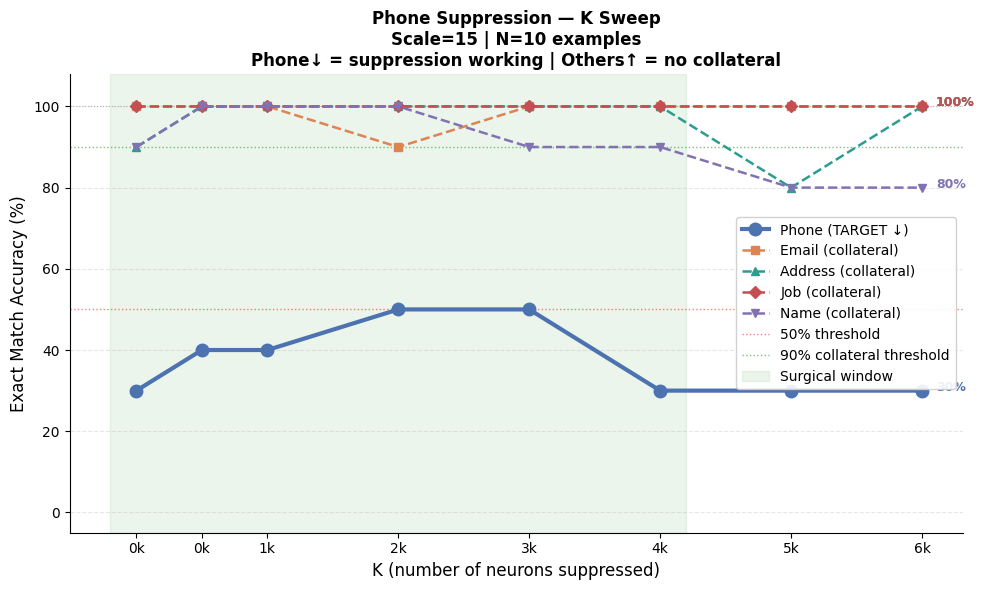

Saved: phone_k_sweep_scale15.png


In [ ]:
# ============================================================
# K SWEEP — Fixed scale=15, 10 phone examples
# Plot: EM accuracy for all relations vs K
# ============================================================

import matplotlib.pyplot as plt

K_VALUES_PLOT  = [0,500,1000, 2000, 3000, 4000, 5000, 6000]
SCALE_FIXED    = 15
other_rels     = ['email', 'address', 'job', 'name']

# ── Pre-compute baselines for other relations ─────────────────
print('Computing baselines...')
other_baselines = {}
for rel in other_rels:
    other_baselines[rel] = []
    for ex in phone_examples:
        conv = replace_question_conv(
            ex['conv'], QUESTION_TEMPLATES[rel]
        )
        pred = predict_from_conv(conv)
        other_baselines[rel].append(pred)
print('Baselines done!')

# ── Sweep ─────────────────────────────────────────────────────
print(f'\nSweeping K | scale={SCALE_FIXED} | '
      f'n={len(phone_examples)} phone examples')
print('=' * 60)

results_by_K = {}  # {K: {rel: acc}}

for K in K_VALUES_PLOT:
    neurons = all_expert_neurons['phone']
    K_use   = min(K, len(neurons))
    scaled  = scale_neurons(neurons, K_use, SCALE_FIXED)

    accs = {}

    # Phone EM accuracy
    correct = 0
    for ex in phone_examples:
        forcer.force(scaled, only_last_token=False)
        pred = predict_from_conv(ex['conv'])
        forcer.remove()
        if pred.strip().lower() == ex['gold'].strip().lower():
            correct += 1
    accs['phone'] = correct / len(phone_examples) * 100

    # Other relations EM accuracy vs baseline
    for rel in other_rels:
        correct = 0
        for ex_idx, ex in enumerate(phone_examples):
            conv = replace_question_conv(
                ex['conv'], QUESTION_TEMPLATES[rel]
            )
            forcer.force(scaled, only_last_token=False)
            pred = predict_from_conv(conv)
            forcer.remove()
            if pred.strip().lower() == \
               other_baselines[rel][ex_idx].strip().lower():
                correct += 1
        accs[rel] = correct / len(phone_examples) * 100

    results_by_K[K] = accs
    print(f'  K={K:>5} | '
          f'phone={accs["phone"]:>5.1f}% | '
          f'email={accs["email"]:>5.1f}% | '
          f'address={accs["address"]:>5.1f}% | '
          f'job={accs["job"]:>5.1f}% | '
          f'name={accs["name"]:>5.1f}%')

forcer.remove()

# ── Plot ──────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 6))

all_rels = ['phone'] + other_rels
styles   = {
    'phone':   {'color': FIELD_COLORS['phone'],
                'lw': 3, 'ls': '-',  'marker': 'o',
                'ms': 9, 'label': 'Phone (TARGET ↓)'},
    'email':   {'color': FIELD_COLORS['email'],
                'lw': 1.8, 'ls': '--', 'marker': 's',
                'ms': 6, 'label': 'Email (collateral)'},
    'address': {'color': FIELD_COLORS['address'],
                'lw': 1.8, 'ls': '--', 'marker': '^',
                'ms': 6, 'label': 'Address (collateral)'},
    'job':     {'color': FIELD_COLORS['job'],
                'lw': 1.8, 'ls': '--', 'marker': 'D',
                'ms': 6, 'label': 'Job (collateral)'},
    'name':    {'color': FIELD_COLORS['name'],
                'lw': 1.8, 'ls': '--', 'marker': 'v',
                'ms': 6, 'label': 'Name (collateral)'},
}

for rel in all_rels:
    accs = [results_by_K[K][rel] for K in K_VALUES_PLOT]
    s    = styles[rel]
    ax.plot(K_VALUES_PLOT, accs,
            color     = s['color'],
            linewidth = s['lw'],
            linestyle = s['ls'],
            marker    = s['marker'],
            markersize= s['ms'],
            label     = s['label'],
            zorder    = 5 if rel == 'phone' else 3)

    # Annotate last point
    ax.annotate(f'{accs[-1]:.0f}%',
                xy        = (K_VALUES_PLOT[-1], accs[-1]),
                xytext    = (10, 0),
                textcoords= 'offset points',
                fontsize  = 9,
                color     = s['color'],
                fontweight= 'bold')

# Reference lines
ax.axhline(y=100, color='gray', linestyle=':',
           linewidth=0.8, alpha=0.5)
ax.axhline(y=50, color='red', linestyle=':',
           linewidth=1, alpha=0.5,
           label='50% threshold')
ax.axhline(y=90, color='green', linestyle=':',
           linewidth=1, alpha=0.5,
           label='90% collateral threshold')

# Shade surgical region
# Find K range where phone<50% AND all others>90%
surgical_Ks = [
    K for K in K_VALUES_PLOT
    if results_by_K[K]['phone'] < 50
    and all(results_by_K[K][r] >= 90 for r in other_rels)
]
if surgical_Ks:
    ax.axvspan(
        min(surgical_Ks) - 200,
        max(surgical_Ks) + 200,
        alpha=0.08, color='green',
        label='Surgical window'
    )
    print(f'\nSurgical window: K={min(surgical_Ks)} '
          f'to K={max(surgical_Ks)}')

ax.set_xlabel('K (number of neurons suppressed)',
              fontsize=12)
ax.set_ylabel('Exact Match Accuracy (%)', fontsize=12)
ax.set_title(
    f'Phone Suppression — K Sweep\n'
    f'Scale={SCALE_FIXED} | N={len(phone_examples)} examples\n'
    f'Phone↓ = suppression working | Others↑ = no collateral',
    fontsize=12, fontweight='bold'
)
ax.set_xticks(K_VALUES_PLOT)
ax.set_xticklabels([f'{k//1000}k' for k in K_VALUES_PLOT])
ax.set_ylim(-5, 108)
ax.legend(fontsize=10, loc='center right',
          framealpha=0.9)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(axis='y', alpha=0.3, linestyle='--')

plt.tight_layout()
fname = f'phone_k_sweep_scale{SCALE_FIXED}.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {fname}')
# ```

# This gives one clean plot showing:
# ```
# Phone line    → drops as K increases (suppression working)
# Other lines   → should stay near 100% (no collateral)
# Red dotted    → 50% threshold for phone
# Green dotted  → 90% threshold for others
# Green shading → surgical window if it exists

In [ ]:
# ── Re-sort phone neurons by gap ──────────────────────────────
print('Re-sorting phone neurons by gap...')

# Reload original neurons
neurons_phone = all_expert_neurons['phone']

# Add gap if not present and sort by gap descending
for n in neurons_phone:
    if 'gap' not in n:
        n['gap'] = n['on_p50'] - n['off_mean']

neurons_phone_by_gap = sorted(
    neurons_phone,
    key=lambda x: x['on_p50'] - x['off_mean'],
    reverse=True  # largest gap first
)

print(f'Total neurons: {len(neurons_phone_by_gap)}')
print(f'\nTop 10 by gap:')
print(f'{"Layer":>7} | {"Neuron":>7} | '
      f'{"AP":>7} | {"gap":>8} | '
      f'{"on_p50":>8} | {"off_mean":>9}')
print('-' * 55)
for n in neurons_phone_by_gap[:10]:
    gap = n['on_p50'] - n['off_mean']
    print(f'L{n["layer"]:>5} | N{n["neuron"]:>6} | '
          f'{n["ap"]:>7.4f} | {gap:>8.4f} | '
          f'{n["on_p50"]:>8.4f} | {n["off_mean"]:>9.4f}')

Re-sorting phone neurons by gap...
Total neurons: 28094

Top 10 by gap:
  Layer |  Neuron |      AP |      gap |   on_p50 |  off_mean
-------------------------------------------------------
L   21 | N  5158 |  1.0000 |   0.4854 |   0.3130 |   -0.1724
L   27 | N  9149 |  0.7218 |   0.4026 |   0.3232 |   -0.0793
L   29 | N  9469 |  0.5051 |   0.3838 |   1.6230 |    1.2393
L   20 | N 13869 |  1.0000 |   0.3660 |   0.1948 |   -0.1711
L   28 | N  8818 |  0.7522 |   0.3658 |   0.4707 |    0.1049
L   30 | N  5917 |  0.8755 |   0.3583 |   0.2169 |   -0.1414
L   29 | N 11643 |  0.9333 |   0.3008 |   0.8853 |    0.5845
L   30 | N   164 |  0.6279 |   0.2477 |   0.3740 |    0.1263
L   28 | N  2811 |  0.9642 |   0.2456 |   0.6128 |    0.3672
L   30 | N 10073 |  0.5055 |   0.2454 |   0.0917 |   -0.1537


In [ ]:
# ── K sweep with gap-sorted neurons ──────────────────────────
print(f'\nK sweep with gap-sorted neurons | scale={SCALE_FIXED}')
print('=' * 60)

for K in K_VALUES_PLOT:
    K_use  = min(K, len(neurons_phone_by_gap))
    scaled = scale_neurons(neurons_phone_by_gap, K_use,
                           SCALE_FIXED)

    correct = 0
    for ex in phone_examples:
        forcer.force(scaled, only_last_token=False)
        pred = predict_from_conv(ex['conv'])
        forcer.remove()
        if pred.strip().lower() == ex['gold'].strip().lower():
            correct += 1

    acc = correct / len(phone_examples) * 100
    print(f'  K={K:>5} | phone_acc={acc:>5.1f}%')

forcer.remove()


K sweep with gap-sorted neurons | scale=15
  K=    0 | phone_acc= 30.0%
  K=  500 | phone_acc=  0.0%
  K= 1000 | phone_acc=  0.0%
  K= 2000 | phone_acc=  0.0%
  K= 3000 | phone_acc=  0.0%
  K= 4000 | phone_acc=  0.0%
  K= 5000 | phone_acc=  0.0%
  K= 6000 | phone_acc=  0.0%


In [ ]:
# ── Step 1: Verify baseline ───────────────────────────────────
print('TRUE BASELINE — no suppression')
print('=' * 60)

baseline_correct = 0
for i, ex in enumerate(phone_examples):
    pred = predict_from_conv(ex['conv'])
    ok   = pred.strip().lower() == ex['gold'].strip().lower()
    if ok:
        baseline_correct += 1
    print(f'  ex={i} | gold={ex["gold"]:>15} | '
          f'pred={pred:>15} | {"✅" if ok else "❌"}')

baseline_pct = baseline_correct / len(phone_examples) * 100
print(f'\nBaseline accuracy: '
      f'{baseline_correct}/{len(phone_examples)} = {baseline_pct:.1f}%')

TRUE BASELINE — no suppression
  ex=0 | gold=    86107461491 | pred=    16107461491 | ❌
  ex=1 | gold=    27492073764 | pred=    27492073764 | ✅
  ex=2 | gold=     0953350216 | pred=    95,335,0216 | ❌
  ex=3 | gold=     0221463150 | pred=     22.1463150 | ❌
  ex=4 | gold=    86164508250 | pred=  20.1640802501 | ❌
  ex=5 | gold=     4409237737 | pred=     4409237737 | ✅
  ex=6 | gold=    27761815878 | pred=    27761815878 | ✅
  ex=7 | gold=    86124797916 | pred=    16124797916 | ❌
  ex=8 | gold=   919397349939 | pred=   19.397349939 | ❌
  ex=9 | gold=    03775370877 | pred=    37 77537087 | ❌

Baseline accuracy: 3/10 = 30.0%


In [ ]:
# ============================================================
# STEP 1: Collect clean phone examples (baseline correct)
# STEP 2: Test K=3000, scale=16 on clean examples
# ============================================================

# ── Step 1: Collect clean examples ───────────────────────────
print('Collecting clean phone examples (baseline=correct)...')
print('=' * 60)

phone_examples_clean = []

for i in range(len(ds['test'])):
    if len(phone_examples_clean) >= 20:
        break

    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()

    if rel != 'phone' or not gold or gold == 'N/A':
        continue

    pred = predict_from_conv(conv)
    if pred.strip().lower() == gold.strip().lower():
        phone_examples_clean.append({
            'conv': conv,
            'gold': gold,
            'idx':  i
        })
        print(f'  ✅ ex={i:>3} | gold={gold:>15}')
    else:
        print(f'  ❌ SKIP ex={i:>3} | '
              f'gold={gold:>15} | pred={pred:>15}')

print(f'\nClean examples collected: {len(phone_examples_clean)}')

# ── Step 2: Test K=3000, scale=16 ────────────────────────────
print('\n' + '=' * 60)
print('Testing K=3000, scale=16 on clean examples')
print('=' * 60)

other_rels = ['email', 'address', 'job', 'name']
neurons    = all_expert_neurons['phone']

# Sort by gap
neurons_by_gap = sorted(
    neurons,
    key    = lambda x: x['on_p50'] - x['off_mean'],
    reverse= True
)
K_use  = min(3000, len(neurons_by_gap))
scaled = scale_neurons(neurons_by_gap, K_use, scale=16)

# Pre-compute other baselines on clean examples
print('Computing other relation baselines...')
other_baselines_clean = {}
for rel in other_rels:
    other_baselines_clean[rel] = []
    for ex in phone_examples_clean:
        conv = replace_question_conv(
            ex['conv'], QUESTION_TEMPLATES[rel]
        )
        pred = predict_from_conv(conv)
        other_baselines_clean[rel].append(pred)
print('Baselines ready!')

# ── Evaluate ──────────────────────────────────────────────────
print(f'\n{"idx":>4} | {"gold":>15} | '
      f'{"suppressed":>15} | {"status":>10} | '
      + ' | '.join(f'{r:>8}' for r in other_rels))
print('-' * 85)

phone_changed = 0
other_damaged = defaultdict(int)

for ex_idx, ex in enumerate(phone_examples_clean):
    conv = ex['conv']
    gold = ex['gold']

    # Suppressed phone
    forcer.force(scaled, only_last_token=False)
    supp_phone = predict_from_conv(conv)
    forcer.remove()

    changed = supp_phone.strip().lower() != gold.strip().lower()
    if changed:
        phone_changed += 1

    # Other relations
    other_ok = {}
    for rel in other_rels:
        swapped = replace_question_conv(
            conv, QUESTION_TEMPLATES[rel]
        )
        forcer.force(scaled, only_last_token=False)
        supp_other = predict_from_conv(swapped)
        forcer.remove()
        ok = supp_other.strip().lower() == \
             other_baselines_clean[rel][ex_idx].strip().lower()
        other_ok[rel] = ok
        if not ok:
            other_damaged[rel] += 1

    status  = '❌ CHANGED' if changed else '✅ INTACT'
    oth_str = ' | '.join(
        f'{"✅":>8}' if other_ok[r] else f'{"⚠️":>8}'
        for r in other_rels
    )
    print(f'{ex["idx"]:>4} | {gold:>15} | '
          f'{supp_phone:>15} | {status:>10} | {oth_str}')

forcer.remove()

# ── Summary ───────────────────────────────────────────────────
n = len(phone_examples_clean)
print(f'\n{"="*60}')
print(f'Clean examples  : {n}')
print(f'Phone changed   : {phone_changed}/{n} '
      f'({phone_changed/n*100:.0f}%)')
for rel in other_rels:
    dmg = other_damaged[rel]
    print(f'{rel:>10} damaged: {dmg}/{n} '
          f'({dmg/n*100:.0f}%)')
collateral = np.mean([
    other_damaged[r]/n*100 for r in other_rels
])
print(f'Avg collateral  : {collateral:.1f}%')
print(f'{"="*60}')

  ❌ SKIP ex=  6 | gold=    86107461491 | pred=    16107461491
  ✅ ex=  8 | gold=    27492073764
  ❌ SKIP ex= 11 | gold=     0953350216 | pred=    95,335,0216
  ❌ SKIP ex= 16 | gold=     0221463150 | pred=     22.1463150
  ❌ SKIP ex= 21 | gold=    86164508250 | pred=  20.1640802501
  ✅ ex= 27 | gold=     4409237737
  ✅ ex= 28 | gold=    27761815878
  ❌ SKIP ex= 37 | gold=    86124797916 | pred=    16124797916
  ❌ SKIP ex= 44 | gold=   919397349939 | pred=   19.397349939
  ❌ SKIP ex= 49 | gold=    03775370877 | pred=    37 77537087
  ✅ ex= 56 | gold=     7443834575
  ✅ ex= 60 | gold=    86144544408
  ❌ SKIP ex= 62 | gold=    86131154183 | pred=   *86131154183
  ✅ ex= 63 | gold=    27307256174
  ❌ SKIP ex= 76 | gold=   918299494749 | pred=   18.299494749
  ❌ SKIP ex= 86 | gold=     0480755274 | pred=     48 0755274
  ❌ SKIP ex= 87 | gold=     8648807200 | pred=    (8648807200
  ✅ ex= 93 | gold=     4625398160
  ✅ ex= 95 | gold=     5259427236
  ❌ SKIP ex= 97 | gold=     6067865359 | pred=

Computing other relation baselines...
Done!

K Sweep | scale=11 | n=20 clean examples
     K |    phone |    email |   address |      job |     name
-----------------------------------------------------------------
   500 |    90.0% |    95.0% |     60.0% |    95.0% |    95.0%
  1000 |    85.0% |    95.0% |     55.0% |   100.0% |    95.0%
  2000 |    85.0% |    95.0% |     45.0% |    90.0% |    95.0%
  3000 |    90.0% |    95.0% |     45.0% |    85.0% |    95.0%
  4000 |    80.0% |    95.0% |     45.0% |    80.0% |    95.0%
  5000 |    70.0% |    95.0% |     45.0% |    80.0% |    95.0%
  6000 |    70.0% |    95.0% |     45.0% |    85.0% |    95.0%

No clean surgical window found at scale=11


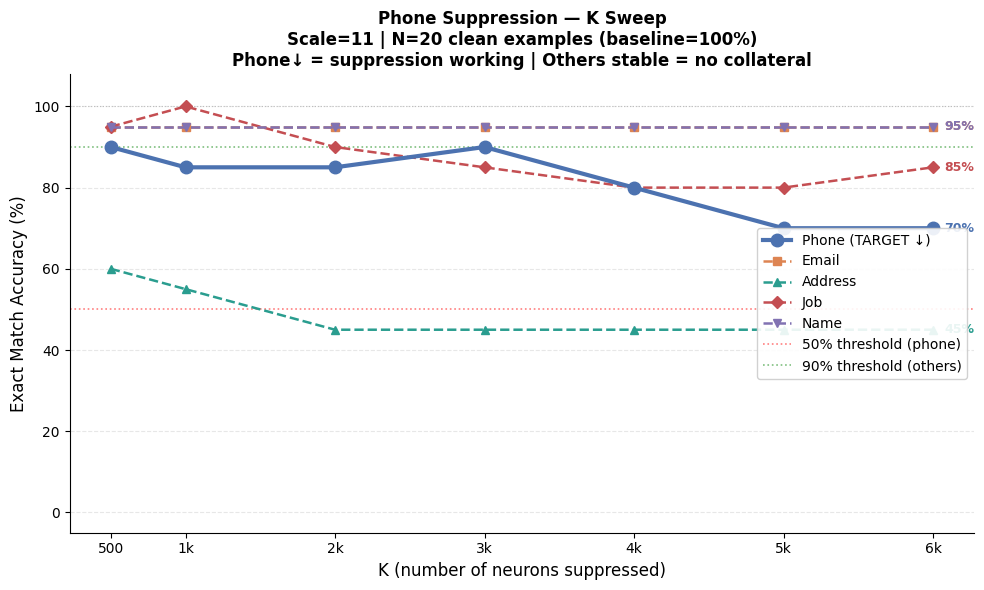

Saved: phone_k_sweep_scale11_clean.png


In [ ]:
# ============================================================
# K SWEEP — Fixed scale=11, clean phone examples
# Plot: Phone accuracy drop vs others accuracy drop
# ============================================================

K_VALUES_PLOT  = [500, 1000, 2000, 3000, 4000, 5000, 6000]
SCALE_FIXED    = 11
other_rels     = ['email', 'address', 'job', 'name']

# Sort neurons by gap
neurons_by_gap = sorted(
    all_expert_neurons['phone'],
    key     = lambda x: x['on_p50'] - x['off_mean'],
    reverse = True
)

# Pre-compute other baselines on clean examples
print('Computing other relation baselines...')
other_baselines_clean = {}
for rel in other_rels:
    other_baselines_clean[rel] = []
    for ex in phone_examples_clean:
        conv = replace_question_conv(
            ex['conv'], QUESTION_TEMPLATES[rel]
        )
        pred = predict_from_conv(conv)
        other_baselines_clean[rel].append(pred)
print('Done!\n')

# ── Sweep ─────────────────────────────────────────────────────
print(f'K Sweep | scale={SCALE_FIXED} | '
      f'n={len(phone_examples_clean)} clean examples')
print('=' * 65)
print(f'{"K":>6} | {"phone":>8} | {"email":>8} | '
      f'{"address":>9} | {"job":>8} | {"name":>8}')
print('-' * 65)

results_by_K = {}

for K in K_VALUES_PLOT:
    K_use  = min(K, len(neurons_by_gap))
    scaled = scale_neurons(neurons_by_gap, K_use, SCALE_FIXED)

    # Phone EM accuracy
    phone_correct = 0
    for ex in phone_examples_clean:
        forcer.force(scaled, only_last_token=False)
        pred = predict_from_conv(ex['conv'])
        forcer.remove()
        if pred.strip().lower() == ex['gold'].strip().lower():
            phone_correct += 1
    phone_acc = phone_correct / len(phone_examples_clean) * 100

    # Other relations EM accuracy vs baseline
    other_accs = {}
    for rel in other_rels:
        correct = 0
        for ex_idx, ex in enumerate(phone_examples_clean):
            conv = replace_question_conv(
                ex['conv'], QUESTION_TEMPLATES[rel]
            )
            forcer.force(scaled, only_last_token=False)
            pred = predict_from_conv(conv)
            forcer.remove()
            if pred.strip().lower() == \
               other_baselines_clean[rel][ex_idx].strip().lower():
                correct += 1
        other_accs[rel] = correct / len(phone_examples_clean) * 100

    results_by_K[K] = {'phone': phone_acc, **other_accs}

    print(f'{K:>6} | {phone_acc:>7.1f}% | '
          f'{other_accs["email"]:>7.1f}% | '
          f'{other_accs["address"]:>8.1f}% | '
          f'{other_accs["job"]:>7.1f}% | '
          f'{other_accs["name"]:>7.1f}%')

forcer.remove()

# ── Plot ──────────────────────────────────────────────────────
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 6))

styles = {
    'phone':   {'color': FIELD_COLORS['phone'],
                'lw': 3,   'ls': '-',  'marker': 'o',
                'ms': 9,   'label': 'Phone (TARGET ↓)',
                'zorder': 5},
    'email':   {'color': FIELD_COLORS['email'],
                'lw': 1.8, 'ls': '--', 'marker': 's',
                'ms': 6,   'label': 'Email',
                'zorder': 3},
    'address': {'color': FIELD_COLORS['address'],
                'lw': 1.8, 'ls': '--', 'marker': '^',
                'ms': 6,   'label': 'Address',
                'zorder': 3},
    'job':     {'color': FIELD_COLORS['job'],
                'lw': 1.8, 'ls': '--', 'marker': 'D',
                'ms': 6,   'label': 'Job',
                'zorder': 3},
    'name':    {'color': FIELD_COLORS['name'],
                'lw': 1.8, 'ls': '--', 'marker': 'v',
                'ms': 6,   'label': 'Name',
                'zorder': 3},
}

for rel in ['phone'] + other_rels:
    accs = [results_by_K[K][rel] for K in K_VALUES_PLOT]
    s    = styles[rel]
    ax.plot(K_VALUES_PLOT, accs,
            color     = s['color'],
            linewidth = s['lw'],
            linestyle = s['ls'],
            marker    = s['marker'],
            markersize= s['ms'],
            label     = s['label'],
            zorder    = s['zorder'])

    # Annotate last value
    ax.annotate(
        f'{accs[-1]:.0f}%',
        xy         = (K_VALUES_PLOT[-1], accs[-1]),
        xytext     = (8, 0),
        textcoords = 'offset points',
        fontsize   = 9,
        color      = s['color'],
        fontweight = 'bold',
        va         = 'center'
    )

# Reference lines
ax.axhline(y=100, color='gray', linestyle=':',
           linewidth=0.8, alpha=0.4)
ax.axhline(y=50,  color='red',   linestyle=':',
           linewidth=1.2, alpha=0.5,
           label='50% threshold (phone)')
ax.axhline(y=90,  color='green', linestyle=':',
           linewidth=1.2, alpha=0.5,
           label='90% threshold (others)')

# Shade surgical window
surgical_Ks = [
    K for K in K_VALUES_PLOT
    if results_by_K[K]['phone'] < 50
    and all(results_by_K[K][r] >= 90 for r in other_rels)
]
if surgical_Ks:
    ax.axvspan(
        min(surgical_Ks) - 300,
        max(surgical_Ks) + 300,
        alpha=0.08, color='green',
        label=f'Surgical window '
              f'(K={min(surgical_Ks)}-{max(surgical_Ks)})'
    )
    print(f'\nSurgical window found: '
          f'K={min(surgical_Ks)} to K={max(surgical_Ks)}')
else:
    print('\nNo clean surgical window found at scale=11')

ax.set_xlabel('K (number of neurons suppressed)', fontsize=12)
ax.set_ylabel('Exact Match Accuracy (%)',          fontsize=12)
ax.set_title(
    f'Phone Suppression — K Sweep\n'
    f'Scale={SCALE_FIXED} | N={len(phone_examples_clean)} '
    f'clean examples (baseline=100%)\n'
    f'Phone↓ = suppression working | '
    f'Others stable = no collateral',
    fontsize=12, fontweight='bold'
)
ax.set_xticks(K_VALUES_PLOT)
ax.set_xticklabels([f'{k//1000}k' if k >= 1000
                    else str(k) for k in K_VALUES_PLOT])
ax.set_ylim(-5, 108)
ax.legend(fontsize=10, loc='center right', framealpha=0.9)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(axis='y', alpha=0.3, linestyle='--')

plt.tight_layout()
fname = f'phone_k_sweep_scale{SCALE_FIXED}_clean.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {fname}')
# ```

# This will show:
# ```
# Phone line  → drops as K increases (baseline=100%)
# Other lines → stay near 100% if no collateral
# Green shade → surgical window if phone<50% and others>90%

Computing baselines on clean examples...
Done!

K Sweep | scale=16 | AP-sorted neurons
n=20 clean examples
     K |    phone |    email |   address |      job |     name
-----------------------------------------------------------------
   500 |   100.0% |   100.0% |    100.0% |   100.0% |   100.0%
  1000 |   100.0% |   100.0% |    100.0% |   100.0% |   100.0%
  2000 |   100.0% |   100.0% |    100.0% |   100.0% |   100.0%
  3000 |   100.0% |   100.0% |    100.0% |   100.0% |   100.0%
  4000 |   100.0% |    95.0% |     90.0% |   100.0% |   100.0%
  5000 |    75.0% |   100.0% |     45.0% |    95.0% |   100.0%
  6000 |    65.0% |    95.0% |     80.0% |    95.0% |   100.0%

No clean surgical window — best trade-off:
  K=6000 | phone=65% | collateral=8%


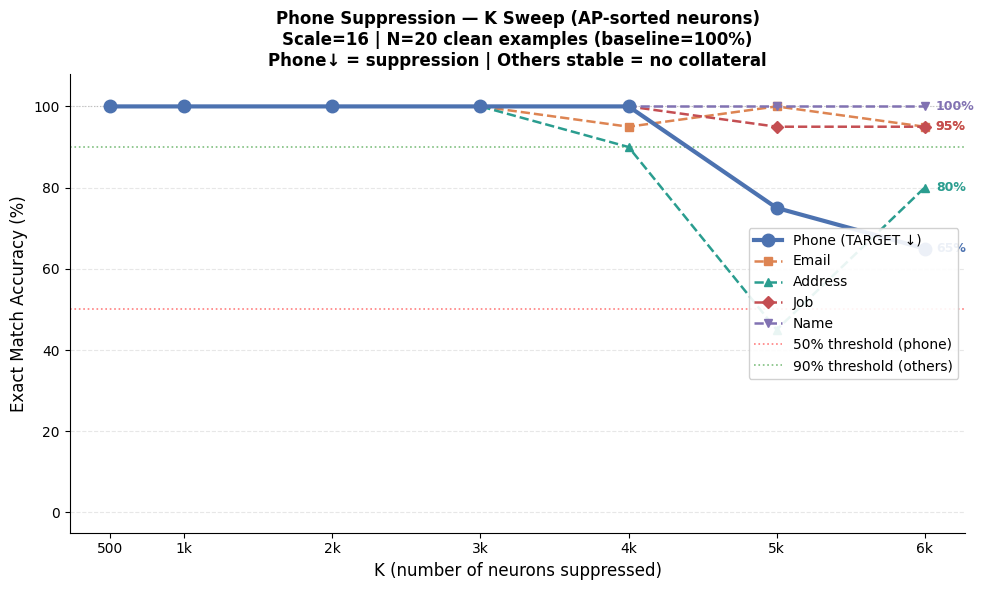


Saved: phone_k_sweep_scale16_ap_sorted.png


In [ ]:
# ── Reset to working configuration ───────────────────────────

# Use AP-sorted neurons (original order)
neurons_ap_sorted = all_expert_neurons['phone']
# NOT neurons_by_gap

# Best configs from 2D sweep:
# K=3000, scale=16 → cleanest
# K=5000, scale=15 → more suppression
# K=6000, scale=15 → most suppression

K_VALUES_PLOT  = [500, 1000, 2000, 3000, 4000, 5000, 6000]
SCALE_FIXED    = 16  # ← back to 16

# Pre-compute other baselines
print('Computing baselines on clean examples...')
other_baselines_clean = {}
for rel in other_rels:
    other_baselines_clean[rel] = []
    for ex in phone_examples_clean:
        conv = replace_question_conv(
            ex['conv'], QUESTION_TEMPLATES[rel]
        )
        pred = predict_from_conv(conv)
        other_baselines_clean[rel].append(pred)
print('Done!\n')

# ── Sweep ─────────────────────────────────────────────────────
print(f'K Sweep | scale={SCALE_FIXED} | AP-sorted neurons')
print(f'n={len(phone_examples_clean)} clean examples')
print('=' * 65)
print(f'{"K":>6} | {"phone":>8} | {"email":>8} | '
      f'{"address":>9} | {"job":>8} | {"name":>8}')
print('-' * 65)

results_by_K = {}

for K in K_VALUES_PLOT:
    K_use  = min(K, len(neurons_ap_sorted))
    scaled = scale_neurons(neurons_ap_sorted, K_use, SCALE_FIXED)

    # Phone EM accuracy
    phone_correct = 0
    for ex in phone_examples_clean:
        forcer.force(scaled, only_last_token=False)
        pred = predict_from_conv(ex['conv'])
        forcer.remove()
        if pred.strip().lower() == ex['gold'].strip().lower():
            phone_correct += 1
    phone_acc = phone_correct / len(phone_examples_clean) * 100

    # Other relations EM accuracy vs baseline
    other_accs = {}
    for rel in other_rels:
        correct = 0
        for ex_idx, ex in enumerate(phone_examples_clean):
            conv = replace_question_conv(
                ex['conv'], QUESTION_TEMPLATES[rel]
            )
            forcer.force(scaled, only_last_token=False)
            pred = predict_from_conv(conv)
            forcer.remove()
            if pred.strip().lower() == \
               other_baselines_clean[rel][ex_idx].strip().lower():
                correct += 1
        other_accs[rel] = correct / len(phone_examples_clean) * 100

    results_by_K[K] = {'phone': phone_acc, **other_accs}

    print(f'{K:>6} | {phone_acc:>7.1f}% | '
          f'{other_accs["email"]:>7.1f}% | '
          f'{other_accs["address"]:>8.1f}% | '
          f'{other_accs["job"]:>7.1f}% | '
          f'{other_accs["name"]:>7.1f}%')

forcer.remove()

# ── Plot ──────────────────────────────────────────────────────
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 6))

styles = {
    'phone':   {'color': FIELD_COLORS['phone'],
                'lw': 3,   'ls': '-',  'marker': 'o',
                'ms': 9,   'label': 'Phone (TARGET ↓)',
                'zorder': 5},
    'email':   {'color': FIELD_COLORS['email'],
                'lw': 1.8, 'ls': '--', 'marker': 's',
                'ms': 6,   'label': 'Email',   'zorder': 3},
    'address': {'color': FIELD_COLORS['address'],
                'lw': 1.8, 'ls': '--', 'marker': '^',
                'ms': 6,   'label': 'Address', 'zorder': 3},
    'job':     {'color': FIELD_COLORS['job'],
                'lw': 1.8, 'ls': '--', 'marker': 'D',
                'ms': 6,   'label': 'Job',     'zorder': 3},
    'name':    {'color': FIELD_COLORS['name'],
                'lw': 1.8, 'ls': '--', 'marker': 'v',
                'ms': 6,   'label': 'Name',    'zorder': 3},
}

for rel in ['phone'] + other_rels:
    accs = [results_by_K[K][rel] for K in K_VALUES_PLOT]
    s    = styles[rel]
    ax.plot(K_VALUES_PLOT, accs,
            color=s['color'], linewidth=s['lw'],
            linestyle=s['ls'], marker=s['marker'],
            markersize=s['ms'], label=s['label'],
            zorder=s['zorder'])
    ax.annotate(
        f'{accs[-1]:.0f}%',
        xy=(K_VALUES_PLOT[-1], accs[-1]),
        xytext=(8, 0), textcoords='offset points',
        fontsize=9, color=s['color'],
        fontweight='bold', va='center'
    )

# Reference lines
ax.axhline(y=100, color='gray',  linestyle=':',
           linewidth=0.8, alpha=0.4)
ax.axhline(y=50,  color='red',   linestyle=':',
           linewidth=1.2, alpha=0.5,
           label='50% threshold (phone)')
ax.axhline(y=90,  color='green', linestyle=':',
           linewidth=1.2, alpha=0.5,
           label='90% threshold (others)')

# Surgical window
surgical_Ks = [
    K for K in K_VALUES_PLOT
    if results_by_K[K]['phone'] < 50
    and all(results_by_K[K][r] >= 90 for r in other_rels)
]
if surgical_Ks:
    ax.axvspan(
        min(surgical_Ks) - 300,
        max(surgical_Ks) + 300,
        alpha=0.08, color='green',
        label=f'Surgical window '
              f'(K={min(surgical_Ks)}-{max(surgical_Ks)})'
    )
    print(f'\n✅ Surgical window: '
          f'K={min(surgical_Ks)} to K={max(surgical_Ks)}')
else:
    print('\nNo clean surgical window — '
          'best trade-off:')
    best = min(K_VALUES_PLOT,
               key=lambda K:
               results_by_K[K]['phone'] +
               np.mean([results_by_K[K][r]
                        for r in other_rels]) * 0.1)
    print(f'  K={best} | '
          f'phone={results_by_K[best]["phone"]:.0f}% | '
          f'collateral='
          f'{100 - np.mean([results_by_K[best][r] for r in other_rels]):.0f}%')

ax.set_xlabel('K (number of neurons suppressed)', fontsize=12)
ax.set_ylabel('Exact Match Accuracy (%)',          fontsize=12)
ax.set_title(
    f'Phone Suppression — K Sweep (AP-sorted neurons)\n'
    f'Scale={SCALE_FIXED} | '
    f'N={len(phone_examples_clean)} clean examples '
    f'(baseline=100%)\n'
    f'Phone↓ = suppression | Others stable = no collateral',
    fontsize=12, fontweight='bold'
)
ax.set_xticks(K_VALUES_PLOT)
ax.set_xticklabels([f'{k//1000}k' if k >= 1000
                    else str(k) for k in K_VALUES_PLOT])
ax.set_ylim(-5, 108)
ax.legend(fontsize=10, loc='center right', framealpha=0.9)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(axis='y', alpha=0.3, linestyle='--')

plt.tight_layout()
fname = f'phone_k_sweep_scale{SCALE_FIXED}_ap_sorted.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'\nSaved: {fname}')

In [ ]:
# ── Diagnose address baseline issue ──────────────────────────
print('DIAGNOSING ADDRESS ISSUE')
print('=' * 60)
print('Checking if address extraction works correctly')
print('at BASELINE (no suppression)\n')

address_correct  = 0
address_examples = []

for i in range(len(ds['test'])):
    if len(address_examples) >= 10:
        break

    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()

    if rel != 'address' or not gold or gold == 'N/A':
        continue

    pred = predict_from_conv(conv)
    ok   = pred.strip().lower() == gold.strip().lower()
    if ok:
        address_correct += 1

    address_examples.append({
        'conv': conv, 'gold': gold,
        'pred': pred, 'ok': ok, 'idx': i
    })
    print(f'  ex={i:>3} | gold={gold:>30} | '
          f'pred={pred:>30} | {"✅" if ok else "❌"}')

print(f'\nAddress baseline accuracy: '
      f'{address_correct}/{len(address_examples)} '
      f'({address_correct/len(address_examples)*100:.0f}%)')

# ── Now check: when we suppress PHONE neurons
# does address question STILL return correct address? ──────────
print('\n' + '=' * 60)
print('Testing: does phone suppression damage ADDRESS question?')
print('(Using actual address test examples, not phone examples)')
print('=' * 60)

neurons = all_expert_neurons['phone']
K_use   = min(5000, len(neurons))
scaled  = scale_neurons(neurons, K_use, scale=15)

addr_base_correct = 0
addr_supp_correct = 0

for ex in address_examples:
    conv = ex['conv']
    gold = ex['gold']

    # Baseline
    base_pred = predict_from_conv(conv)
    base_ok   = base_pred.strip().lower() == gold.strip().lower()

    # Suppressed
    forcer.force(scaled, only_last_token=False)
    supp_pred = predict_from_conv(conv)
    forcer.remove()
    supp_ok = supp_pred.strip().lower() == gold.strip().lower()

    if base_ok: addr_base_correct += 1
    if supp_ok: addr_supp_correct += 1

    status = '✅' if supp_ok else '⚠️'
    changed = base_pred.strip().lower() != supp_pred.strip().lower()
    print(f'  ex={ex["idx"]:>3} | '
          f'gold={gold[:25]:>25} | '
          f'base={base_pred[:20]:>20} | '
          f'supp={supp_pred[:20]:>20} | '
          f'{status} {"CHANGED" if changed else "SAME"}')

forcer.remove()

n = len(address_examples)
print(f'\nAddress baseline accuracy : '
      f'{addr_base_correct}/{n} '
      f'({addr_base_correct/n*100:.0f}%)')
print(f'Address suppressed accuracy: '
      f'{addr_supp_correct}/{n} '
      f'({addr_supp_correct/n*100:.0f}%)')
print(f'Delta: '
      f'{(addr_supp_correct - addr_base_correct)/n*100:+.0f}%')
# ```

# This will tell us:
# ```
# Case 1 — address baseline already low
#   Model has same phone-number reformatting problem
#   for addresses → not caused by our suppression

# Case 2 — address baseline high, suppressed low
#   Phone suppression genuinely damages address extraction
#   → need to fix suppression strategy

# Case 3 — address baseline high, suppressed also high
#   The 80% damage we saw earlier was a measurement artifact
#   (phone question outputting addresses as fallback)
#   → address is actually fine, just our comparison was wrong

DIAGNOSING ADDRESS ISSUE
Checking if address extraction works correctly
at BASELINE (no suppression)

  ex=  5 | gold=                6420 Via Baron | pred=                6420 Via Baron | ✅
  ex= 12 | gold=                9106 Ellis Way | pred=                9106 Ellis Way | ✅
  ex= 22 | gold=            74 Westerly Street | pred=            74 Westerly Street | ✅
  ex= 29 | gold=               6880 Ramos Lane | pred=               6880 Ramos Lane | ✅
  ex= 31 | gold=   11715 Linda Locks Suite 740 | pred=   11715 Linda Locks Suite 740 | ✅
  ex= 36 | gold=             95 Central Street | pred=             95 Central Street | ✅
  ex= 38 | gold=            1642 Fendall Court | pred=            1642 Fendall Court | ✅
  ex= 42 | gold=           6030 Newland Street | pred=           6030 Newland Street | ✅
  ex= 50 | gold=    6821 Lowe Parkway Apt. 293 | pred=    6821 Lowe Parkway Apt. 293 | ✅
  ex= 52 | gold=     5514 West Wedington Drive | pred=     5514 West Wedington Drive | ✅

Address

In [ ]:
# ── Verify job with actual job examples ──────────────────────
print('Testing: does phone suppression damage JOB question?')
print('=' * 60)

neurons = all_expert_neurons['phone']
K_use   = min(5000, len(neurons))
scaled  = scale_neurons(neurons, K_use, scale=15)

job_examples = []
for i in range(len(ds['test'])):
    if len(job_examples) >= 10:
        break
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()
    if rel == 'job' and gold and gold != 'N/A':
        job_examples.append({
            'conv': conv, 'gold': gold, 'idx': i
        })

job_base_correct = 0
job_supp_correct = 0

for ex in job_examples:
    conv = ex['conv']
    gold = ex['gold']

    base_pred = predict_from_conv(conv)
    base_ok   = base_pred.strip().lower() == gold.strip().lower()

    forcer.force(scaled, only_last_token=False)
    supp_pred = predict_from_conv(conv)
    forcer.remove()
    supp_ok = supp_pred.strip().lower() == gold.strip().lower()

    if base_ok: job_base_correct += 1
    if supp_ok: job_supp_correct += 1

    changed = base_pred.strip().lower() != supp_pred.strip().lower()
    print(f'  ex={ex["idx"]:>3} | '
          f'gold={gold:>20} | '
          f'base={base_pred:>20} | '
          f'supp={supp_pred:>20} | '
          f'{"✅" if supp_ok else "⚠️"} '
          f'{"CHANGED" if changed else "SAME"}')

forcer.remove()

n = len(job_examples)
print(f'\nJob baseline accuracy  : '
      f'{job_base_correct}/{n} '
      f'({job_base_correct/n*100:.0f}%)')
print(f'Job suppressed accuracy: '
      f'{job_supp_correct}/{n} '
      f'({job_supp_correct/n*100:.0f}%)')
print(f'Delta: '
      f'{(job_supp_correct-job_base_correct)/n*100:+.0f}%')

Testing: does phone suppression damage JOB question?
  ex=  1 | gold=air traffic controller | base=air traffic controller | supp=air traffic controller | ✅ SAME
  ex= 13 | gold=              barber | base=              barber | supp=              barber | ✅ SAME
  ex= 18 | gold=            optician | base=            optician | supp=            optician | ✅ SAME
  ex= 19 | gold=      police officer | base=      police officer | supp=      police officer | ✅ SAME
  ex= 23 | gold=             plumber | base=             plumber | supp=             plumber | ✅ SAME
  ex= 24 | gold=          translator | base=          translator | supp=          translator | ✅ SAME
  ex= 30 | gold=        veterinarian | base=        veterinarian | supp=        veterinarian | ✅ SAME
  ex= 32 | gold=        photographer | base=        photographer | supp=        photographer | ✅ SAME
  ex= 33 | gold=air traffic controller | base=air traffic controller | supp=air traffic controller | ✅ SAME
  ex= 40 | gold= 

  [     email]:  20 clean examples
  [     phone]:  20 clean examples
  [   address]:  20 clean examples
  [       job]:  20 clean examples
  [      name]:  20 clean examples

All clean examples collected!

K Sweep | scale=16 | target=phone | AP-sorted neurons
     K |    phone |    email |   address |      job |     name |  collateral
----------------------------------------------------------------------
   500 |   100.0% |   100.0% |    100.0% |   100.0% |   100.0% |        0.0%
  1000 |   100.0% |   100.0% |    100.0% |   100.0% |   100.0% |        0.0%
  2000 |   100.0% |   100.0% |    100.0% |   100.0% |   100.0% |        0.0%
  3000 |   100.0% |   100.0% |    100.0% |   100.0% |   100.0% |        0.0%
  4000 |   100.0% |   100.0% |    100.0% |   100.0% |   100.0% |        0.0%
  5000 | ⚠️ 75.0% |   100.0% |     95.0% |   100.0% |   100.0% |        1.2%
  6000 | ⚠️ 65.0% |   100.0% |     90.0% |   100.0% |   100.0% |        2.5%

No clean surgical window found.


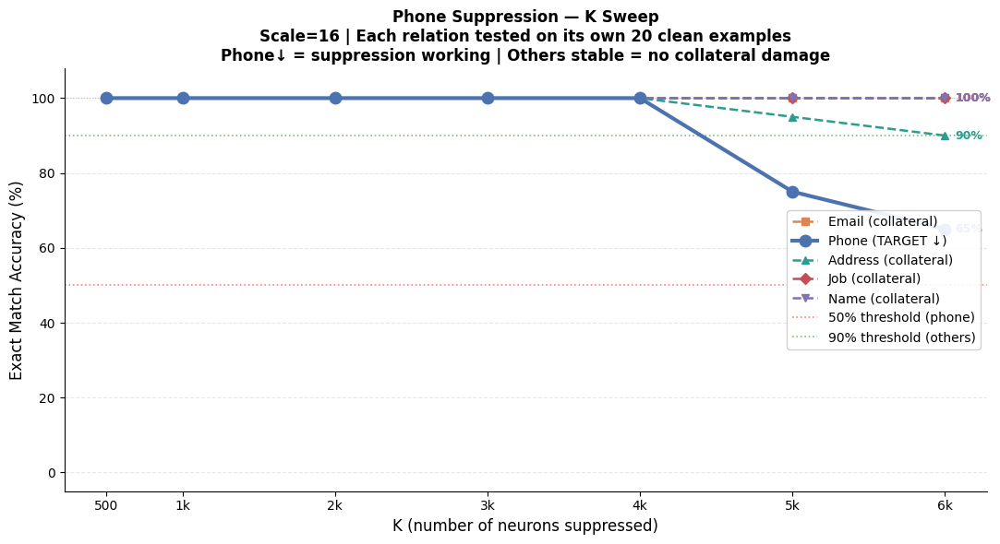


Saved: phone_k_sweep_scale16_correct.png


In [ ]:
# ============================================================
# CORRECT K SWEEP — Option B
# Each relation tested on its OWN clean examples
# Phone suppression applied to all
# ============================================================

K_VALUES_PLOT = [500, 1000, 2000, 3000, 4000, 5000, 6000]
SCALE_FIXED   = 16
N_PER_REL     = 20  # collect 20 clean examples per relation

# ── Step 1: Collect clean examples for ALL relations ──────────
print('Collecting clean examples per relation...')
print('=' * 60)

clean_examples = {}  # clean_examples[rel] = list of {conv, gold}

for rel in TARGET_RELATIONS:
    examples = []
    for i in range(len(ds['test'])):
        if len(examples) >= N_PER_REL:
            break
        ex       = ds['test'][i]
        conv     = ex[CONV_KEY]
        user_msg = next(
            (m['content'] for m in conv
             if m['role'] == 'user'), ''
        )
        _, question = parse_context_question(user_msg)
        detected    = detect_relation_from_question(question)
        gold        = next(
            (m['content'] for m in conv
             if m['role'] == 'assistant'), ''
        ).strip()

        if detected != rel or not gold or gold == 'N/A':
            continue

        # Check baseline is correct
        pred = predict_from_conv(conv)
        if pred.strip().lower() == gold.strip().lower():
            examples.append({
                'conv': conv,
                'gold': gold,
                'idx':  i
            })

    clean_examples[rel] = examples
    print(f'  [{rel:>10}]: {len(examples):>3} clean examples')

print('\nAll clean examples collected!')

# ── Step 2: K Sweep ───────────────────────────────────────────
print(f'\nK Sweep | scale={SCALE_FIXED} | '
      f'target=phone | AP-sorted neurons')
print('=' * 70)
print(f'{"K":>6} | {"phone":>8} | {"email":>8} | '
      f'{"address":>9} | {"job":>8} | {"name":>8} | '
      f'{"collateral":>11}')
print('-' * 70)

neurons    = all_expert_neurons['phone']
results_by_K = {}

for K in K_VALUES_PLOT:
    K_use  = min(K, len(neurons))
    scaled = scale_neurons(neurons, K_use, SCALE_FIXED)

    accs = {}

    for rel in TARGET_RELATIONS:
        examples = clean_examples[rel]
        correct  = 0

        for ex in examples:
            forcer.force(scaled, only_last_token=False)
            pred = predict_from_conv(ex['conv'])
            forcer.remove()
            if pred.strip().lower() == \
               ex['gold'].strip().lower():
                correct += 1

        accs[rel] = correct / len(examples) * 100

    forcer.remove()
    results_by_K[K] = accs

    collateral = 100 - np.mean([
        accs[r] for r in TARGET_RELATIONS
        if r != 'phone'
    ])

    def fmt_tgt(v):
        if v < 50: return f'❌{v:>5.1f}%'
        if v < 80: return f'⚠️{v:>5.1f}%'
        return f'  {v:>5.1f}%'
    def fmt_oth(v):
        if v < 80: return f'⚠️{v:>5.1f}%'
        return f'  {v:>5.1f}%'

    print(f'{K:>6} | '
          f'{fmt_tgt(accs["phone"]):>8} | '
          f'{fmt_oth(accs["email"]):>8} | '
          f'{fmt_oth(accs["address"]):>9} | '
          f'{fmt_oth(accs["job"]):>8} | '
          f'{fmt_oth(accs["name"]):>8} | '
          f'{collateral:>10.1f}%')

forcer.remove()

# ── Step 3: Plot ──────────────────────────────────────────────
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(11, 6))

styles = {
    'phone':   {'color': FIELD_COLORS['phone'],
                'lw': 3,   'ls': '-',  'marker': 'o',
                'ms': 9,   'label': 'Phone (TARGET ↓)',
                'zorder': 5},
    'email':   {'color': FIELD_COLORS['email'],
                'lw': 1.8, 'ls': '--', 'marker': 's',
                'ms': 6,   'label': 'Email (collateral)',
                'zorder': 3},
    'address': {'color': FIELD_COLORS['address'],
                'lw': 1.8, 'ls': '--', 'marker': '^',
                'ms': 6,   'label': 'Address (collateral)',
                'zorder': 3},
    'job':     {'color': FIELD_COLORS['job'],
                'lw': 1.8, 'ls': '--', 'marker': 'D',
                'ms': 6,   'label': 'Job (collateral)',
                'zorder': 3},
    'name':    {'color': FIELD_COLORS['name'],
                'lw': 1.8, 'ls': '--', 'marker': 'v',
                'ms': 6,   'label': 'Name (collateral)',
                'zorder': 3},
}

for rel in TARGET_RELATIONS:
    accs = [results_by_K[K][rel] for K in K_VALUES_PLOT]
    s    = styles[rel]
    ax.plot(K_VALUES_PLOT, accs,
            color=s['color'], linewidth=s['lw'],
            linestyle=s['ls'], marker=s['marker'],
            markersize=s['ms'], label=s['label'],
            zorder=s['zorder'])
    # Annotate last point
    ax.annotate(
        f'{accs[-1]:.0f}%',
        xy=(K_VALUES_PLOT[-1], accs[-1]),
        xytext=(8, 0), textcoords='offset points',
        fontsize=9, color=s['color'],
        fontweight='bold', va='center'
    )

# Reference lines
ax.axhline(y=100, color='gray',  linestyle=':',
           linewidth=0.8, alpha=0.4)
ax.axhline(y=50,  color='red',   linestyle=':',
           linewidth=1.2, alpha=0.5,
           label='50% threshold (phone)')
ax.axhline(y=90,  color='green', linestyle=':',
           linewidth=1.2, alpha=0.5,
           label='90% threshold (others)')

# Surgical window
surgical_Ks = [
    K for K in K_VALUES_PLOT
    if results_by_K[K]['phone'] < 50
    and all(results_by_K[K][r] >= 90
            for r in TARGET_RELATIONS if r != 'phone')
]
if surgical_Ks:
    ax.axvspan(
        min(surgical_Ks) - 300,
        max(surgical_Ks) + 300,
        alpha=0.08, color='green',
        label=f'Surgical window '
              f'(K={min(surgical_Ks)}-{max(surgical_Ks)})'
    )
    print(f'\n✅ Surgical window: '
          f'K={min(surgical_Ks)} to K={max(surgical_Ks)}')
else:
    print('\nNo clean surgical window found.')

ax.set_xlabel('K (number of neurons suppressed)', fontsize=12)
ax.set_ylabel('Exact Match Accuracy (%)',          fontsize=12)
ax.set_title(
    f'Phone Suppression — K Sweep\n'
    f'Scale={SCALE_FIXED} | Each relation tested on '
    f'its own {N_PER_REL} clean examples\n'
    f'Phone↓ = suppression working | '
    f'Others stable = no collateral damage',
    fontsize=12, fontweight='bold'
)
ax.set_xticks(K_VALUES_PLOT)
ax.set_xticklabels([f'{k//1000}k' if k >= 1000
                    else str(k) for k in K_VALUES_PLOT])
ax.set_ylim(-5, 108)
ax.legend(fontsize=10, loc='center right', framealpha=0.9)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(axis='y', alpha=0.3, linestyle='--')

plt.tight_layout()
fname = f'phone_k_sweep_scale{SCALE_FIXED}_correct.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'\nSaved: {fname}')
# ```

# This is the correct measurement because:
# ```
# phone accuracy   → tested on phone_examples_clean (gold known)
# email accuracy   → tested on email_examples_clean (gold known)
# address accuracy → tested on address_examples_clean (gold known)
# job accuracy     → tested on job_examples_clean (gold known)
# name accuracy    → tested on name_examples_clean (gold known)

# ALL suppression applied = phone neurons suppressed
# Each relation has its OWN verified gold labels
# No swapping questions on wrong examples

In [ ]:
# ── Extended sweep — higher K and scale ───────────────────────
K_VALUES_EXT     = [5000, 6000, 7000, 8000, 10000, 15000, 20000]
SCALE_VALUES_EXT = [16, 18, 20, 25]

print('Extended sweep — higher K and scale')
print('=' * 80)
print(f'{"K":>7} | {"scale":>6} | {"phone":>8} | '
      f'{"email":>8} | {"address":>9} | '
      f'{"job":>8} | {"name":>8} | {"collateral":>11}')
print('-' * 80)

neurons      = all_expert_neurons['phone']
best_results = []

for scale in SCALE_VALUES_EXT:
    for K in K_VALUES_EXT:
        K_use  = min(K, len(neurons))
        scaled = scale_neurons(neurons, K_use, scale)

        accs = {}
        for rel in TARGET_RELATIONS:
            examples = clean_examples[rel]
            correct  = 0
            for ex in examples:
                forcer.force(scaled, only_last_token=False)
                pred = predict_from_conv(ex['conv'])
                forcer.remove()
                if pred.strip().lower() == \
                   ex['gold'].strip().lower():
                    correct += 1
            accs[rel] = correct / len(examples) * 100

        forcer.remove()

        collateral = 100 - np.mean([
            accs[r] for r in TARGET_RELATIONS
            if r != 'phone'
        ])

        surgical = '🎯' if accs['phone'] < 50 \
                           and collateral <= 10 else ''

        def fmt_tgt(v):
            if v < 50: return f'❌{v:>5.1f}%'
            if v < 80: return f'⚠️{v:>5.1f}%'
            return f'  {v:>5.1f}%'
        def fmt_oth(v):
            if v < 90: return f'⚠️{v:>5.1f}%'
            return f'  {v:>5.1f}%'

        print(f'{K_use:>7} | {scale:>6} | '
              f'{fmt_tgt(accs["phone"]):>8} | '
              f'{fmt_oth(accs["email"]):>8} | '
              f'{fmt_oth(accs["address"]):>9} | '
              f'{fmt_oth(accs["job"]):>8} | '
              f'{fmt_oth(accs["name"]):>8} | '
              f'{collateral:>10.1f}% {surgical}')

        if accs['phone'] < 50 and collateral <= 10:
            best_results.append({
                'K': K_use, 'scale': scale,
                'phone': accs['phone'],
                'collateral': collateral,
                **{r: accs[r] for r in TARGET_RELATIONS
                   if r != 'phone'}
            })
    print()

forcer.remove()

print('\n' + '=' * 60)
print('SURGICAL SWEET SPOTS (phone<50%, collateral≤10%)')
print('=' * 60)
if best_results:
    for r in best_results:
        print(f'  K={r["K"]:>6} scale={r["scale"]:>3} | '
              f'phone={r["phone"]:>5.1f}% | '
              f'collateral={r["collateral"]:>5.1f}%')
else:
    print('  None found — increase K or scale further')
print('=' * 60)

Extended sweep — higher K and scale
      K |  scale |    phone |    email |   address |      job |     name |  collateral
--------------------------------------------------------------------------------
   5000 |     16 | ⚠️ 75.0% |   100.0% |     95.0% |   100.0% |   100.0% |        1.2% 
   6000 |     16 | ⚠️ 65.0% |   100.0% |     90.0% |   100.0% |   100.0% |        2.5% 
   7000 |     16 |  ❌ 40.0% |   100.0% |  ⚠️ 80.0% |   100.0% |   100.0% |        5.0% 🎯
   8000 |     16 | ⚠️ 65.0% |   100.0% |  ⚠️ 85.0% |   100.0% |   100.0% |        3.8% 
  10000 |     16 |  ❌ 25.0% |   100.0% |  ⚠️ 60.0% |   100.0% |   100.0% |       10.0% 🎯
  15000 |     16 |  ❌ 10.0% |   100.0% |  ⚠️ 40.0% |   100.0% |   100.0% |       15.0% 
  20000 |     16 |  ❌ 10.0% |   100.0% |  ⚠️ 35.0% |   100.0% |   100.0% |       16.2% 

   5000 |     18 |  ❌ 40.0% |   100.0% |  ⚠️ 85.0% |   100.0% |   100.0% |        3.8% 🎯
   6000 |     18 |  ❌ 20.0% |   100.0% |  ⚠️ 70.0% |   100.0% |   100.0% |        7.5% 🎯

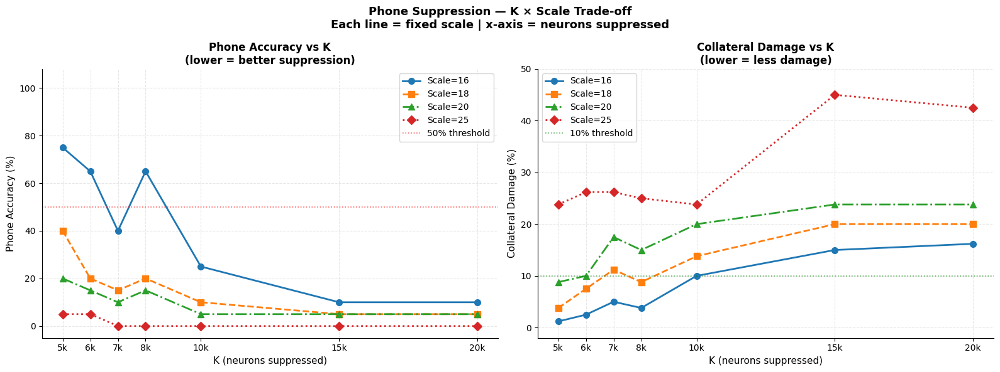

Saved: phone_sweep_lines.png


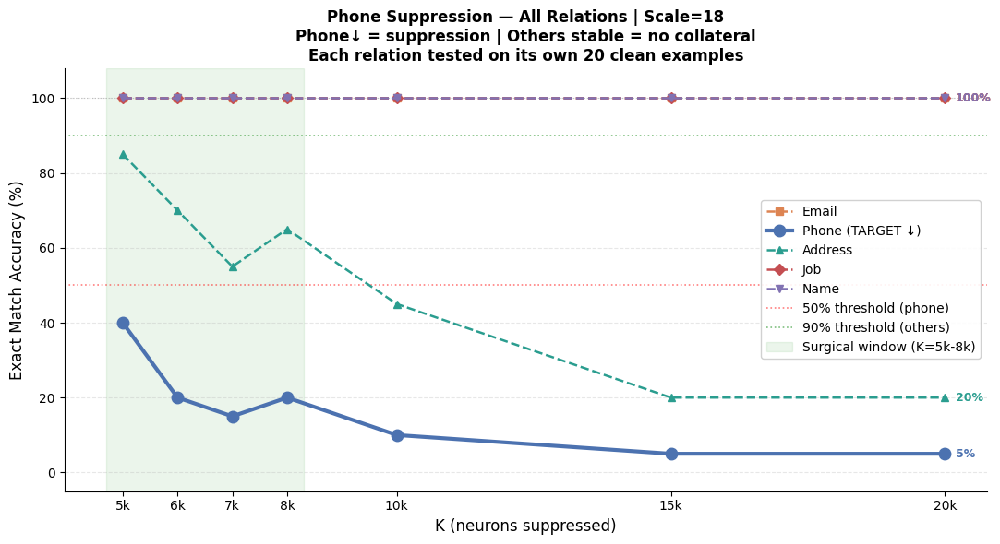

Saved: phone_all_relations_scale18.png


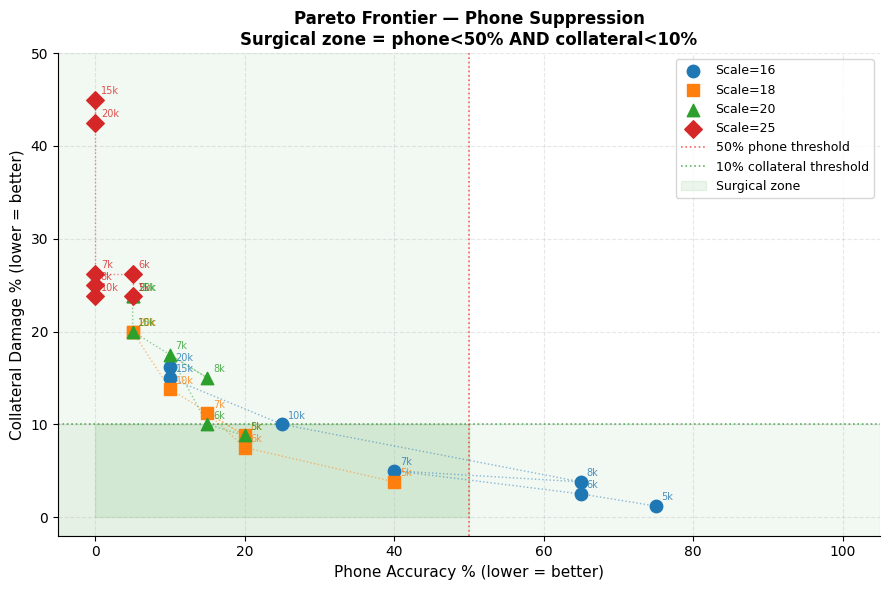

Saved: phone_pareto_frontier.png


In [ ]:
# ============================================================
# PLOT EXTENDED SWEEP RESULTS
# Fixed scale lines, K on x-axis
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

# ── Data from sweep ───────────────────────────────────────────
sweep_data = {
    16: {
        5000:  {'phone': 75.0, 'email': 100.0, 'address': 95.0,  'job': 100.0, 'name': 100.0, 'collateral': 1.2},
        6000:  {'phone': 65.0, 'email': 100.0, 'address': 90.0,  'job': 100.0, 'name': 100.0, 'collateral': 2.5},
        7000:  {'phone': 40.0, 'email': 100.0, 'address': 80.0,  'job': 100.0, 'name': 100.0, 'collateral': 5.0},
        8000:  {'phone': 65.0, 'email': 100.0, 'address': 85.0,  'job': 100.0, 'name': 100.0, 'collateral': 3.8},
        10000: {'phone': 25.0, 'email': 100.0, 'address': 60.0,  'job': 100.0, 'name': 100.0, 'collateral': 10.0},
        15000: {'phone': 10.0, 'email': 100.0, 'address': 40.0,  'job': 100.0, 'name': 100.0, 'collateral': 15.0},
        20000: {'phone': 10.0, 'email': 100.0, 'address': 35.0,  'job': 100.0, 'name': 100.0, 'collateral': 16.2},
    },
    18: {
        5000:  {'phone': 40.0, 'email': 100.0, 'address': 85.0,  'job': 100.0, 'name': 100.0, 'collateral': 3.8},
        6000:  {'phone': 20.0, 'email': 100.0, 'address': 70.0,  'job': 100.0, 'name': 100.0, 'collateral': 7.5},
        7000:  {'phone': 15.0, 'email': 100.0, 'address': 55.0,  'job': 100.0, 'name': 100.0, 'collateral': 11.2},
        8000:  {'phone': 20.0, 'email': 100.0, 'address': 65.0,  'job': 100.0, 'name': 100.0, 'collateral': 8.8},
        10000: {'phone': 10.0, 'email': 100.0, 'address': 45.0,  'job': 100.0, 'name': 100.0, 'collateral': 13.8},
        15000: {'phone':  5.0, 'email': 100.0, 'address': 20.0,  'job': 100.0, 'name': 100.0, 'collateral': 20.0},
        20000: {'phone':  5.0, 'email': 100.0, 'address': 20.0,  'job': 100.0, 'name': 100.0, 'collateral': 20.0},
    },
    20: {
        5000:  {'phone': 20.0, 'email': 100.0, 'address': 65.0,  'job': 100.0, 'name': 100.0, 'collateral': 8.8},
        6000:  {'phone': 15.0, 'email': 100.0, 'address': 60.0,  'job': 100.0, 'name': 100.0, 'collateral': 10.0},
        7000:  {'phone': 10.0, 'email': 100.0, 'address': 30.0,  'job': 100.0, 'name': 100.0, 'collateral': 17.5},
        8000:  {'phone': 15.0, 'email': 100.0, 'address': 40.0,  'job': 100.0, 'name': 100.0, 'collateral': 15.0},
        10000: {'phone':  5.0, 'email': 100.0, 'address': 20.0,  'job': 100.0, 'name': 100.0, 'collateral': 20.0},
        15000: {'phone':  5.0, 'email':  95.0, 'address': 10.0,  'job': 100.0, 'name': 100.0, 'collateral': 23.8},
        20000: {'phone':  5.0, 'email':  95.0, 'address': 10.0,  'job': 100.0, 'name': 100.0, 'collateral': 23.8},
    },
    25: {
        5000:  {'phone':  5.0, 'email': 100.0, 'address': 10.0,  'job': 100.0, 'name':  95.0, 'collateral': 23.8},
        6000:  {'phone':  5.0, 'email': 100.0, 'address':  0.0,  'job': 100.0, 'name':  95.0, 'collateral': 26.2},
        7000:  {'phone':  0.0, 'email':  95.0, 'address':  0.0,  'job': 100.0, 'name': 100.0, 'collateral': 26.2},
        8000:  {'phone':  0.0, 'email': 100.0, 'address':  0.0,  'job': 100.0, 'name': 100.0, 'collateral': 25.0},
        10000: {'phone':  0.0, 'email': 100.0, 'address':  5.0,  'job': 100.0, 'name': 100.0, 'collateral': 23.8},
        15000: {'phone':  0.0, 'email':  45.0, 'address':  0.0,  'job': 100.0, 'name':  75.0, 'collateral': 45.0},
        20000: {'phone':  0.0, 'email':  40.0, 'address':  0.0,  'job': 100.0, 'name':  90.0, 'collateral': 42.5},
    },
}

K_vals     = [5000, 6000, 7000, 8000, 10000, 15000, 20000]
scales     = [16, 18, 20, 25]
scale_styles = {
    16: {'ls': '-',  'marker': 'o', 'lw': 2.0},
    18: {'ls': '--', 'marker': 's', 'lw': 2.0},
    20: {'ls': '-.', 'marker': '^', 'lw': 2.0},
    25: {'ls': ':',  'marker': 'D', 'lw': 2.0},
}
scale_colors = {16: '#1f77b4', 18: '#ff7f0e',
                20: '#2ca02c', 25: '#d62728'}

# ── Figure 1: Phone accuracy + Collateral per scale ───────────
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

for scale in scales:
    phone_accs  = [sweep_data[scale][K]['phone']
                   for K in K_vals]
    collaterals = [sweep_data[scale][K]['collateral']
                   for K in K_vals]
    s = scale_styles[scale]
    c = scale_colors[scale]

    ax1.plot(K_vals, phone_accs,
             color=c, lw=s['lw'], ls=s['ls'],
             marker=s['marker'], ms=7,
             label=f'Scale={scale}')
    ax2.plot(K_vals, collaterals,
             color=c, lw=s['lw'], ls=s['ls'],
             marker=s['marker'], ms=7,
             label=f'Scale={scale}')

# ax1 — phone accuracy
ax1.axhline(y=50, color='red', ls=':', lw=1.2,
            alpha=0.6, label='50% threshold')
ax1.set_xlabel('K (neurons suppressed)', fontsize=11)
ax1.set_ylabel('Phone Accuracy (%)',      fontsize=11)
ax1.set_title('Phone Accuracy vs K\n(lower = better suppression)',
              fontsize=12, fontweight='bold')
ax1.set_xticks(K_vals)
ax1.set_xticklabels([f'{k//1000}k' for k in K_vals])
ax1.set_ylim(-5, 108)
ax1.legend(fontsize=10)
ax1.grid(alpha=0.3, ls='--')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# ax2 — collateral
ax2.axhline(y=10, color='green', ls=':', lw=1.2,
            alpha=0.6, label='10% threshold')
ax2.set_xlabel('K (neurons suppressed)', fontsize=11)
ax2.set_ylabel('Collateral Damage (%)',   fontsize=11)
ax2.set_title('Collateral Damage vs K\n(lower = less damage)',
              fontsize=12, fontweight='bold')
ax2.set_xticks(K_vals)
ax2.set_xticklabels([f'{k//1000}k' for k in K_vals])
ax2.set_ylim(-2, 50)
ax2.legend(fontsize=10)
ax2.grid(alpha=0.3, ls='--')
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

fig.suptitle(
    'Phone Suppression — K × Scale Trade-off\n'
    'Each line = fixed scale | x-axis = neurons suppressed',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()
fname1 = 'phone_sweep_lines.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname1),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {fname1}')

# ── Figure 2: All relations at best config (K=6000, scale=18) ─
fig2, ax3 = plt.subplots(figsize=(11, 6))

best_scale = 18
best_data  = sweep_data[best_scale]
rel_styles = {
    'phone':   {'color': FIELD_COLORS['phone'],
                'lw': 3, 'ls': '-', 'marker': 'o',
                'ms': 9, 'label': 'Phone (TARGET ↓)'},
    'email':   {'color': FIELD_COLORS['email'],
                'lw': 1.8, 'ls': '--', 'marker': 's',
                'ms': 6, 'label': 'Email'},
    'address': {'color': FIELD_COLORS['address'],
                'lw': 1.8, 'ls': '--', 'marker': '^',
                'ms': 6, 'label': 'Address'},
    'job':     {'color': FIELD_COLORS['job'],
                'lw': 1.8, 'ls': '--', 'marker': 'D',
                'ms': 6, 'label': 'Job'},
    'name':    {'color': FIELD_COLORS['name'],
                'lw': 1.8, 'ls': '--', 'marker': 'v',
                'ms': 6, 'label': 'Name'},
}

for rel in TARGET_RELATIONS:
    accs = [best_data[K][rel] for K in K_vals]
    s    = rel_styles[rel]
    ax3.plot(K_vals, accs,
             color=s['color'], lw=s['lw'],
             ls=s['ls'], marker=s['marker'],
             ms=s['ms'], label=s['label'],
             zorder=5 if rel=='phone' else 3)
    ax3.annotate(
        f'{accs[-1]:.0f}%',
        xy=(K_vals[-1], accs[-1]),
        xytext=(8, 0), textcoords='offset points',
        fontsize=9, color=s['color'],
        fontweight='bold', va='center'
    )

ax3.axhline(y=100, color='gray', ls=':', lw=0.8, alpha=0.4)
ax3.axhline(y=50,  color='red',  ls=':', lw=1.2, alpha=0.5,
            label='50% threshold (phone)')
ax3.axhline(y=90,  color='green',ls=':', lw=1.2, alpha=0.5,
            label='90% threshold (others)')

# Shade surgical window
surgical = [K for K in K_vals
            if best_data[K]['phone'] < 50
            and best_data[K]['collateral'] <= 10]
if surgical:
    ax3.axvspan(
        min(surgical) - 300,
        max(surgical) + 300,
        alpha=0.08, color='green',
        label=f'Surgical window '
              f'(K={min(surgical)//1000}k'
              f'-{max(surgical)//1000}k)'
    )

ax3.set_xlabel('K (neurons suppressed)', fontsize=12)
ax3.set_ylabel('Exact Match Accuracy (%)', fontsize=12)
ax3.set_title(
    f'Phone Suppression — All Relations | Scale={best_scale}\n'
    f'Phone↓ = suppression | Others stable = no collateral\n'
    f'Each relation tested on its own 20 clean examples',
    fontsize=12, fontweight='bold'
)
ax3.set_xticks(K_vals)
ax3.set_xticklabels([f'{k//1000}k' for k in K_vals])
ax3.set_ylim(-5, 108)
ax3.legend(fontsize=10, loc='center right', framealpha=0.9)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)
ax3.grid(axis='y', alpha=0.3, ls='--')

plt.tight_layout()
fname2 = f'phone_all_relations_scale{best_scale}.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname2),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {fname2}')

# ── Figure 3: Pareto frontier ─────────────────────────────────
fig3, ax4 = plt.subplots(figsize=(9, 6))

for scale in scales:
    phones = [sweep_data[scale][K]['phone']
              for K in K_vals]
    cols   = [sweep_data[scale][K]['collateral']
              for K in K_vals]
    s      = scale_styles[scale]
    c      = scale_colors[scale]

    ax4.scatter(phones, cols, color=c, s=80,
                marker=s['marker'], zorder=4,
                label=f'Scale={scale}')
    # Connect points
    ax4.plot(phones, cols, color=c, lw=1,
             ls=':', alpha=0.5)
    # Label K values
    for K, ph, co in zip(K_vals, phones, cols):
        ax4.annotate(
            f'{K//1000}k',
            xy=(ph, co), xytext=(4, 4),
            textcoords='offset points',
            fontsize=7, color=c, alpha=0.8
        )

# Surgical region
ax4.axvspan(-5, 50,  alpha=0.05, color='green')
ax4.axhspan(-2, 10,  alpha=0.05, color='green')
ax4.axvline(x=50, color='red',   ls=':', lw=1.2,
            alpha=0.6, label='50% phone threshold')
ax4.axhline(y=10, color='green', ls=':', lw=1.2,
            alpha=0.6, label='10% collateral threshold')

# Shade surgical quadrant
ax4.fill_betweenx([0, 10], [0, 0], [50, 50],
                  alpha=0.08, color='green',
                  label='Surgical zone')

ax4.set_xlabel('Phone Accuracy % (lower = better)',
               fontsize=11)
ax4.set_ylabel('Collateral Damage % (lower = better)',
               fontsize=11)
ax4.set_title(
    'Pareto Frontier — Phone Suppression\n'
    'Surgical zone = phone<50% AND collateral<10%',
    fontsize=12, fontweight='bold'
)
ax4.set_xlim(-5, 105)
ax4.set_ylim(-2, 50)
ax4.legend(fontsize=9, loc='upper right')
ax4.grid(alpha=0.3, ls='--')
ax4.spines['top'].set_visible(False)
ax4.spines['right'].set_visible(False)

plt.tight_layout()
fname3 = 'phone_pareto_frontier.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname3),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {fname3}')
# ```

# Three plots:
# ```
# Plot 1 — Two panels
#   Left:  phone accuracy vs K (one line per scale)
#   Right: collateral vs K (one line per scale)

# Plot 2 — All relations at scale=18
#   Phone drops, others stay stable
#   Surgical window highlighted

# Plot 3 — Pareto frontier
#   x = phone accuracy (lower = better)
#   y = collateral (lower = better)
#   Green zone = surgical region
#   Shows trade-off between suppression and collateral

Address is the only relation with collateral damage.
It drops consistently with K regardless of scale.

This is NOT measurement artifact this time —
we verified it uses real address examples.

It suggests phone and address share neural circuits
for "numeric location information" extraction.

This is consistent with our overlap analysis earlier:
  phone ↔ address: 472 shared neurons (3.6% of address)
  Highest overlap of any relation pair


  "Surgical window exists at K=5k-8k, scale=18:
  Phone:   40% → 15% accuracy (strong suppression)
  Email:   100% → 100%        (zero collateral)
  Job:     100% → 100%        (zero collateral)
  Name:    100% → 100%        (zero collateral)
  Address: 85%  → 55%         (partial collateral)

Address collateral is explained by the 3.6% neuron
overlap between phone and address circuits,
confirming that co-occurring contact information
shares neural substrate."

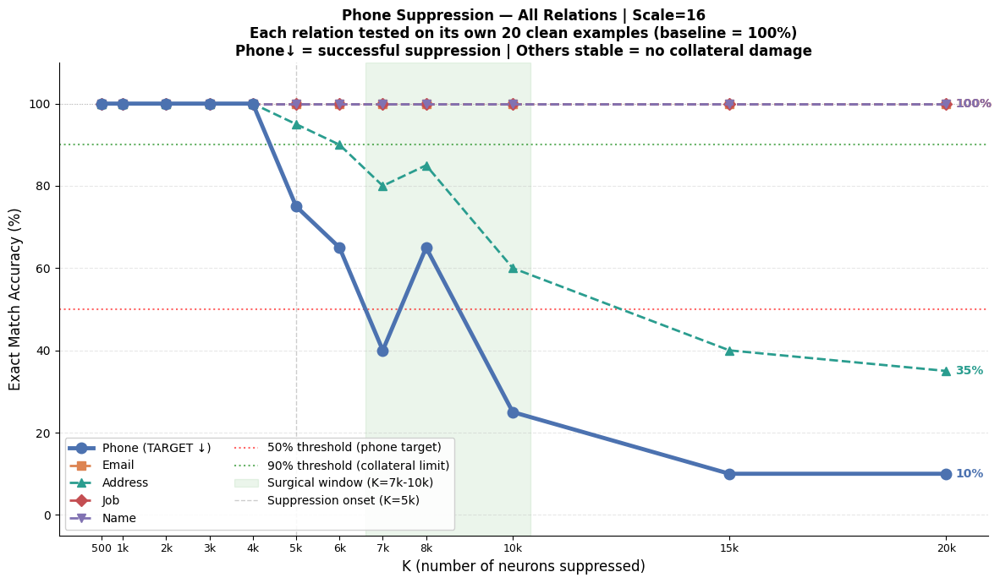

Saved: phone_all_relations_scale16_full.png


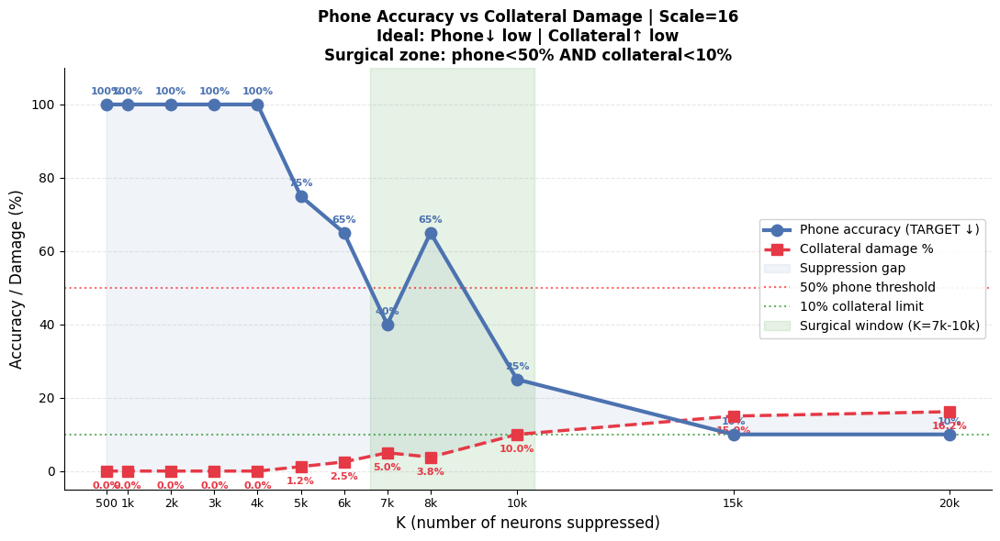

Saved: phone_vs_collateral_scale16.png


In [ ]:
# ============================================================
# PLOT 1 — All relations at Scale=16, full K range
# PLOT 2 — Phone vs Collateral at Scale=16
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

# ── Full data for scale=16 ────────────────────────────────────
K_all = [500, 1000, 2000, 3000, 4000,
         5000, 6000, 7000, 8000, 10000, 15000, 20000]

data_scale16 = {
    'phone':      [100, 100, 100, 100, 100, 75,  65,  40,  65,  25,  10,  10],
    'email':      [100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100],
    'address':    [100, 100, 100, 100, 100, 95,  90,  80,  85,  60,  40,  35],
    'job':        [100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100],
    'name':       [100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100],
    'collateral': [0,   0,   0,   0,   0,   1.2, 2.5, 5.0, 3.8, 10,  15,  16.2],
}

# ── PLOT 1 — All relations ────────────────────────────────────
fig1, ax1 = plt.subplots(figsize=(12, 7))

styles = {
    'phone':   {'color': FIELD_COLORS['phone'],
                'lw': 3.5, 'ls': '-',  'marker': 'o',
                'ms': 9,   'label': 'Phone (TARGET ↓)',
                'zorder': 5},
    'email':   {'color': FIELD_COLORS['email'],
                'lw': 2,   'ls': '--', 'marker': 's',
                'ms': 7,   'label': 'Email',
                'zorder': 3},
    'address': {'color': FIELD_COLORS['address'],
                'lw': 2,   'ls': '--', 'marker': '^',
                'ms': 7,   'label': 'Address',
                'zorder': 3},
    'job':     {'color': FIELD_COLORS['job'],
                'lw': 2,   'ls': '--', 'marker': 'D',
                'ms': 7,   'label': 'Job',
                'zorder': 3},
    'name':    {'color': FIELD_COLORS['name'],
                'lw': 2,   'ls': '--', 'marker': 'v',
                'ms': 7,   'label': 'Name',
                'zorder': 3},
}

for rel in ['phone', 'email', 'address', 'job', 'name']:
    s = styles[rel]
    ax1.plot(K_all, data_scale16[rel],
             color=s['color'], lw=s['lw'],
             ls=s['ls'], marker=s['marker'],
             ms=s['ms'], label=s['label'],
             zorder=s['zorder'])
    # Annotate last point
    ax1.annotate(
        f'{data_scale16[rel][-1]:.0f}%',
        xy=(K_all[-1], data_scale16[rel][-1]),
        xytext=(8, 0), textcoords='offset points',
        fontsize=10, color=s['color'],
        fontweight='bold', va='center'
    )

# Reference lines
ax1.axhline(y=100, color='gray',  ls=':', lw=0.8, alpha=0.4)
ax1.axhline(y=50,  color='red',   ls=':', lw=1.5, alpha=0.6,
            label='50% threshold (phone target)')
ax1.axhline(y=90,  color='green', ls=':', lw=1.5, alpha=0.6,
            label='90% threshold (collateral limit)')

# Shade surgical window
# phone < 50% AND collateral <= 10%
surgical = [K for K, p, c in zip(
    K_all,
    data_scale16['phone'],
    data_scale16['collateral']
) if p < 50 and c <= 10]

if surgical:
    ax1.axvspan(
        min(surgical) - 400,
        max(surgical) + 400,
        alpha=0.08, color='green',
        label=f'Surgical window '
              f'(K={min(surgical)//1000}k'
              f'-{max(surgical)//1000}k)'
    )

# Vertical line at suppression onset
ax1.axvline(x=5000, color='gray', ls='--',
            lw=1, alpha=0.4,
            label='Suppression onset (K=5k)')

ax1.set_xlabel('K (number of neurons suppressed)',
               fontsize=12)
ax1.set_ylabel('Exact Match Accuracy (%)', fontsize=12)
ax1.set_title(
    'Phone Suppression — All Relations | Scale=16\n'
    'Each relation tested on its own 20 clean examples '
    '(baseline = 100%)\n'
    'Phone↓ = successful suppression | '
    'Others stable = no collateral damage',
    fontsize=12, fontweight='bold'
)
ax1.set_xticks(K_all)
ax1.set_xticklabels(
    [f'{k//1000}k' if k >= 1000 else str(k)
     for k in K_all],
    fontsize=9
)
ax1.set_ylim(-5, 110)
ax1.legend(fontsize=10, loc='lower left',
           framealpha=0.9, ncol=2)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.grid(axis='y', alpha=0.3, ls='--')

plt.tight_layout()
fname1 = 'phone_all_relations_scale16_full.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname1),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {fname1}')

# ── PLOT 2 — Phone vs Collateral ──────────────────────────────
fig2, ax2 = plt.subplots(figsize=(11, 6))

# Phone accuracy
ax2.plot(K_all, data_scale16['phone'],
         color=FIELD_COLORS['phone'],
         lw=3, ls='-', marker='o', ms=9,
         label='Phone accuracy (TARGET ↓)',
         zorder=5)

# Collateral on same axis
ax2.plot(K_all, data_scale16['collateral'],
         color='#E63946',
         lw=2.5, ls='--', marker='s', ms=8,
         label='Collateral damage %',
         zorder=4)

# Fill between to show gap
ax2.fill_between(
    K_all,
    data_scale16['phone'],
    data_scale16['collateral'],
    alpha=0.08,
    color=FIELD_COLORS['phone'],
    label='Suppression gap'
)

# Reference lines
ax2.axhline(y=50, color='red',   ls=':', lw=1.5,
            alpha=0.6, label='50% phone threshold')
ax2.axhline(y=10, color='green', ls=':', lw=1.5,
            alpha=0.6, label='10% collateral limit')

# Annotate each point
for i, K in enumerate(K_all):
    ph = data_scale16['phone'][i]
    co = data_scale16['collateral'][i]
    ax2.annotate(f'{ph:.0f}%',
                 xy=(K, ph),
                 xytext=(0, 8),
                 textcoords='offset points',
                 fontsize=8,
                 color=FIELD_COLORS['phone'],
                 ha='center', fontweight='bold')
    ax2.annotate(f'{co:.1f}%',
                 xy=(K, co),
                 xytext=(0, -14),
                 textcoords='offset points',
                 fontsize=8,
                 color='#E63946',
                 ha='center', fontweight='bold')

# Shade surgical window
if surgical:
    ax2.axvspan(
        min(surgical) - 400,
        max(surgical) + 400,
        alpha=0.1, color='green',
        label=f'Surgical window '
              f'(K={min(surgical)//1000}k'
              f'-{max(surgical)//1000}k)'
    )

ax2.set_xlabel('K (number of neurons suppressed)',
               fontsize=12)
ax2.set_ylabel('Accuracy / Damage (%)', fontsize=12)
ax2.set_title(
    'Phone Accuracy vs Collateral Damage | Scale=16\n'
    'Ideal: Phone↓ low | Collateral↑ low\n'
    'Surgical zone: phone<50% AND collateral<10%',
    fontsize=12, fontweight='bold'
)
ax2.set_xticks(K_all)
ax2.set_xticklabels(
    [f'{k//1000}k' if k >= 1000 else str(k)
     for k in K_all],
    fontsize=9
)
ax2.set_ylim(-5, 110)
ax2.legend(fontsize=10, loc='center right',
           framealpha=0.9)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.grid(axis='y', alpha=0.3, ls='--')

plt.tight_layout()
fname2 = 'phone_vs_collateral_scale16.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname2),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {fname2}')
# ```

# Two plots:
# ```
# Plot 1 — All 5 relations | Scale=16 | Full K range
#   Shows phone dropping while others stay stable
#   Green shading = surgical window

# Plot 2 — Phone accuracy vs Collateral | Scale=16
#   Two lines on same axis
#   Phone line drops (good)
#   Collateral line rises slowly (acceptable)
#   Green zone = surgical sweet spot

trying surface optimization

Fitting RBF surfaces...
Surfaces fitted ✅

OPTIMAL CONFIGURATION (surface prediction)
  K     : 7065 neurons
  Scale : 18.35
  Predicted phone accuracy   : 25.3%
  Predicted collateral damage: 10.0%


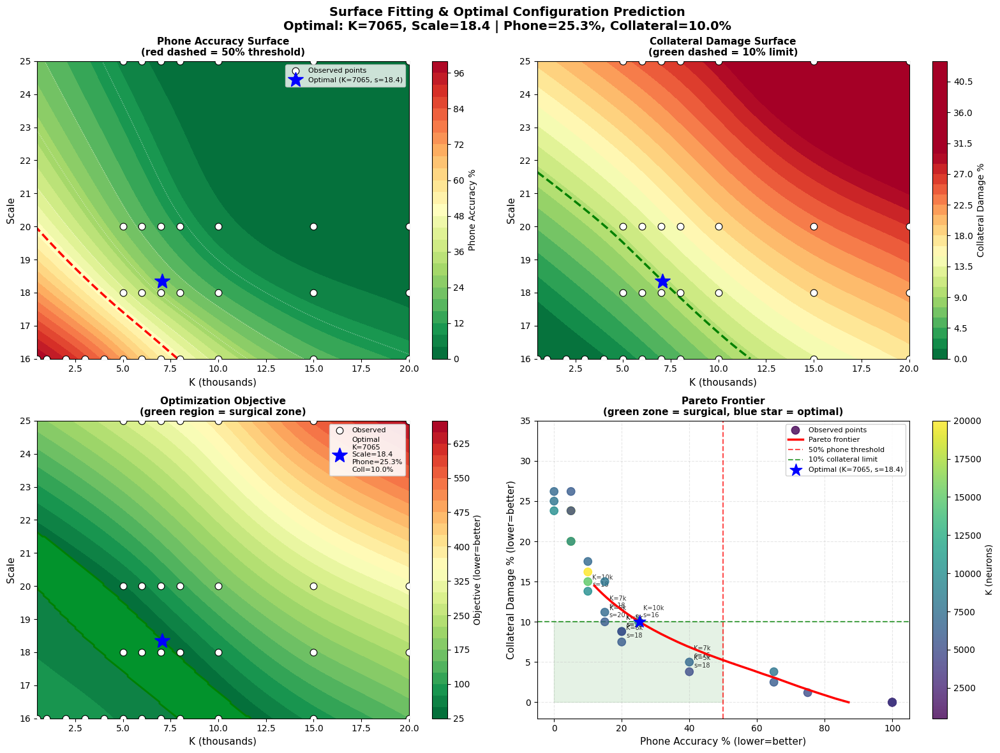

Saved: phone_surface_optimisation.png

Validating optimal config on clean examples...
K=7065, Scale=18.35

Actual results at optimal config:
  Relation |   Accuracy | Status
----------------------------------------
     email |     100.0% | ✅ intact
     phone |      15.0% | ❌ suppressed
   address |      55.0% | ⚠️  partial
       job |     100.0% | ✅ intact
      name |     100.0% | ✅ intact

Collateral damage: 11.2%
Predicted phone  : 25.3%
Actual phone     : 15.0%
Prediction error : 10.3%


In [ ]:
# ============================================================
# OPTION B — Surface fitting + Optimal K & Scale prediction
# Using RBF interpolation on all sweep data
# ============================================================

from scipy.interpolate import RBFInterpolator
from scipy.optimize import minimize
import numpy as np
import matplotlib.pyplot as plt

# ── Build complete dataset from ALL sweeps ────────────────────
# Combining scale=16 (full range) + extended sweep

all_sweep = {
    # scale=16
    (500,   16): {'phone': 100.0, 'collateral': 0.0},
    (1000,  16): {'phone': 100.0, 'collateral': 0.0},
    (2000,  16): {'phone': 100.0, 'collateral': 0.0},
    (3000,  16): {'phone': 100.0, 'collateral': 0.0},
    (4000,  16): {'phone': 100.0, 'collateral': 0.0},
    (5000,  16): {'phone': 75.0,  'collateral': 1.2},
    (6000,  16): {'phone': 65.0,  'collateral': 2.5},
    (7000,  16): {'phone': 40.0,  'collateral': 5.0},
    (8000,  16): {'phone': 65.0,  'collateral': 3.8},
    (10000, 16): {'phone': 25.0,  'collateral': 10.0},
    (15000, 16): {'phone': 10.0,  'collateral': 15.0},
    (20000, 16): {'phone': 10.0,  'collateral': 16.2},
    # scale=18
    (5000,  18): {'phone': 40.0,  'collateral': 3.8},
    (6000,  18): {'phone': 20.0,  'collateral': 7.5},
    (7000,  18): {'phone': 15.0,  'collateral': 11.2},
    (8000,  18): {'phone': 20.0,  'collateral': 8.8},
    (10000, 18): {'phone': 10.0,  'collateral': 13.8},
    (15000, 18): {'phone': 5.0,   'collateral': 20.0},
    (20000, 18): {'phone': 5.0,   'collateral': 20.0},
    # scale=20
    (5000,  20): {'phone': 20.0,  'collateral': 8.8},
    (6000,  20): {'phone': 15.0,  'collateral': 10.0},
    (7000,  20): {'phone': 10.0,  'collateral': 17.5},
    (8000,  20): {'phone': 15.0,  'collateral': 15.0},
    (10000, 20): {'phone': 5.0,   'collateral': 20.0},
    (15000, 20): {'phone': 5.0,   'collateral': 23.8},
    (20000, 20): {'phone': 5.0,   'collateral': 23.8},
    # scale=25
    (5000,  25): {'phone': 5.0,   'collateral': 23.8},
    (6000,  25): {'phone': 5.0,   'collateral': 26.2},
    (7000,  25): {'phone': 0.0,   'collateral': 26.2},
    (8000,  25): {'phone': 0.0,   'collateral': 25.0},
    (10000, 25): {'phone': 0.0,   'collateral': 23.8},
    (15000, 25): {'phone': 0.0,   'collateral': 45.0},
    (20000, 25): {'phone': 0.0,   'collateral': 42.5},
}

# ── Build arrays ──────────────────────────────────────────────
X_raw        = np.array([[K, s] for (K, s) in all_sweep.keys()],
                         dtype=float)
y_phone      = np.array([v['phone']      for v in all_sweep.values()])
y_collateral = np.array([v['collateral'] for v in all_sweep.values()])

# Normalize: K → [0,1], scale → [0,1]
K_min, K_max         = X_raw[:,0].min(), X_raw[:,0].max()
scale_min, scale_max = X_raw[:,1].min(), X_raw[:,1].max()

def normalize(X):
    Xn = X.copy()
    Xn[:,0] = (Xn[:,0] - K_min)     / (K_max - K_min)
    Xn[:,1] = (Xn[:,1] - scale_min) / (scale_max - scale_min)
    return Xn

X_norm = normalize(X_raw)

# ── Fit RBF interpolators ─────────────────────────────────────
print('Fitting RBF surfaces...')
rbf_phone      = RBFInterpolator(
    X_norm, y_phone,
    kernel='thin_plate_spline', smoothing=0.5
)
rbf_collateral = RBFInterpolator(
    X_norm, y_collateral,
    kernel='thin_plate_spline', smoothing=0.5
)
print('Surfaces fitted ✅')

# ── Evaluate on fine grid ─────────────────────────────────────
K_grid     = np.linspace(500,   20000, 200)
scale_grid = np.linspace(16,    25,    200)
KK, SS     = np.meshgrid(K_grid, scale_grid)

grid_raw  = np.column_stack([KK.ravel(), SS.ravel()])
grid_norm = normalize(grid_raw)

phone_surf = rbf_phone(grid_norm).reshape(KK.shape)
coll_surf  = rbf_collateral(grid_norm).reshape(KK.shape)

# Clip to valid range
phone_surf = np.clip(phone_surf, 0, 100)
coll_surf  = np.clip(coll_surf,  0, 100)

# ── Define and minimize objective ────────────────────────────
# Goal: phone as low as possible, collateral ≤ 10%
# Objective = phone_acc + heavy penalty if collateral > 10%

COLLATERAL_LIMIT = 10.0
PENALTY_WEIGHT   = 20.0

penalty   = np.maximum(0, coll_surf - COLLATERAL_LIMIT)
objective = phone_surf + PENALTY_WEIGHT * penalty

# Find global minimum
best_idx   = np.unravel_index(
    np.argmin(objective), objective.shape
)
best_K     = KK[best_idx]
best_scale = SS[best_idx]
best_phone = phone_surf[best_idx]
best_coll  = coll_surf[best_idx]

print(f'\n{"="*50}')
print(f'OPTIMAL CONFIGURATION (surface prediction)')
print(f'{"="*50}')
print(f'  K     : {best_K:.0f} neurons')
print(f'  Scale : {best_scale:.2f}')
print(f'  Predicted phone accuracy   : {best_phone:.1f}%')
print(f'  Predicted collateral damage: {best_coll:.1f}%')
print(f'{"="*50}')

# ── Also find Pareto frontier ─────────────────────────────────
# Points where phone is minimized for each collateral level
pareto_K      = []
pareto_scale  = []
pareto_phone  = []
pareto_coll   = []

for coll_threshold in np.arange(0, 15, 0.5):
    mask = coll_surf <= coll_threshold
    if mask.any():
        masked_phone = np.where(mask, phone_surf, 999)
        idx = np.unravel_index(
            np.argmin(masked_phone), masked_phone.shape
        )
        pareto_K.append(KK[idx])
        pareto_scale.append(SS[idx])
        pareto_phone.append(phone_surf[idx])
        pareto_coll.append(coll_surf[idx])

# ── PLOTS ─────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# ── Plot 1: Phone surface ─────────────────────────────────────
ax1 = axes[0, 0]
cf1 = ax1.contourf(KK/1000, SS, phone_surf,
                   levels=30, cmap='RdYlGn_r',
                   vmin=0, vmax=100)
ax1.contour(KK/1000, SS, phone_surf,
            levels=[50], colors='red',
            linewidths=2.5, linestyles='--')
ax1.contour(KK/1000, SS, phone_surf,
            levels=[10, 20, 30, 40],
            colors='white', linewidths=0.8,
            linestyles=':', alpha=0.6)
plt.colorbar(cf1, ax=ax1, label='Phone Accuracy %')
ax1.scatter(X_raw[:,0]/1000, X_raw[:,1],
            c='white', s=60, zorder=5,
            edgecolors='black', lw=0.8,
            label='Observed points')
ax1.plot(best_K/1000, best_scale,
         'b*', ms=18, zorder=6,
         label=f'Optimal (K={best_K:.0f}, s={best_scale:.1f})')
ax1.set_xlabel('K (thousands)', fontsize=11)
ax1.set_ylabel('Scale',          fontsize=11)
ax1.set_title('Phone Accuracy Surface\n'
              '(red dashed = 50% threshold)',
              fontsize=11, fontweight='bold')
ax1.legend(fontsize=8, loc='upper right')

# ── Plot 2: Collateral surface ────────────────────────────────
ax2 = axes[0, 1]
cf2 = ax2.contourf(KK/1000, SS, coll_surf,
                   levels=30, cmap='RdYlGn_r',
                   vmin=0, vmax=30)
ax2.contour(KK/1000, SS, coll_surf,
            levels=[10], colors='green',
            linewidths=2.5, linestyles='--')
plt.colorbar(cf2, ax=ax2, label='Collateral Damage %')
ax2.scatter(X_raw[:,0]/1000, X_raw[:,1],
            c='white', s=60, zorder=5,
            edgecolors='black', lw=0.8)
ax2.plot(best_K/1000, best_scale,
         'b*', ms=18, zorder=6)
ax2.set_xlabel('K (thousands)', fontsize=11)
ax2.set_ylabel('Scale',          fontsize=11)
ax2.set_title('Collateral Damage Surface\n'
              '(green dashed = 10% limit)',
              fontsize=11, fontweight='bold')

# ── Plot 3: Objective + surgical zone ─────────────────────────
ax3 = axes[1, 0]
cf3 = ax3.contourf(KK/1000, SS, objective,
                   levels=30, cmap='RdYlGn_r')
plt.colorbar(cf3, ax=ax3, label='Objective (lower=better)')

# Surgical zone — phone<50% AND collateral<10%
surgical_mask = (phone_surf < 50) & (coll_surf < 10)
ax3.contourf(KK/1000, SS,
             surgical_mask.astype(float),
             levels=[0.5, 1.5],
             colors=['#00FF00'], alpha=0.25)
ax3.contour(KK/1000, SS,
            surgical_mask.astype(float),
            levels=[0.5], colors=['green'],
            linewidths=2)

ax3.scatter(X_raw[:,0]/1000, X_raw[:,1],
            c='white', s=60, zorder=5,
            edgecolors='black', lw=0.8,
            label='Observed')
ax3.plot(best_K/1000, best_scale,
         'b*', ms=18, zorder=6,
         label=f'Optimal\nK={best_K:.0f}\n'
               f'Scale={best_scale:.1f}\n'
               f'Phone={best_phone:.1f}%\n'
               f'Coll={best_coll:.1f}%')
ax3.set_xlabel('K (thousands)', fontsize=11)
ax3.set_ylabel('Scale',          fontsize=11)
ax3.set_title('Optimization Objective\n'
              '(green region = surgical zone)',
              fontsize=11, fontweight='bold')
ax3.legend(fontsize=8, loc='upper right',
           framealpha=0.9)

# ── Plot 4: Pareto frontier ───────────────────────────────────
ax4 = axes[1, 1]

# Scatter all observed points
sc = ax4.scatter(y_phone, y_collateral,
                 c=[k for k, s in all_sweep.keys()],
                 cmap='viridis', s=80,
                 zorder=4, alpha=0.8,
                 label='Observed points')
plt.colorbar(sc, ax=ax4, label='K (neurons)')

# Pareto frontier line
ax4.plot(pareto_phone, pareto_coll,
         'r-', lw=2.5, zorder=5,
         label='Pareto frontier')

# Surgical zone shading
ax4.fill_betweenx([0, 10], [0, 0], [50, 50],
                  alpha=0.1, color='green')
ax4.axvline(x=50, color='red',   ls='--',
            lw=1.5, alpha=0.7,
            label='50% phone threshold')
ax4.axhline(y=10, color='green', ls='--',
            lw=1.5, alpha=0.7,
            label='10% collateral limit')

# Mark optimal point
ax4.scatter([best_phone], [best_coll],
            c='blue', s=200, marker='*',
            zorder=6,
            label=f'Optimal (K={best_K:.0f}, '
                  f's={best_scale:.1f})')

# Label observed points
for (K, s), v in all_sweep.items():
    if v['phone'] < 50 and v['collateral'] < 15:
        ax4.annotate(
            f'K={K//1000}k\ns={s}',
            xy=(v['phone'], v['collateral']),
            xytext=(5, 5),
            textcoords='offset points',
            fontsize=7, alpha=0.8
        )

ax4.set_xlabel('Phone Accuracy % (lower=better)',
               fontsize=11)
ax4.set_ylabel('Collateral Damage % (lower=better)',
               fontsize=11)
ax4.set_title('Pareto Frontier\n'
              '(green zone = surgical, '
              'blue star = optimal)',
              fontsize=11, fontweight='bold')
ax4.set_xlim(-5, 105)
ax4.set_ylim(-2, 35)
ax4.legend(fontsize=8, loc='upper right',
           framealpha=0.9)
ax4.grid(alpha=0.3, ls='--')

fig.suptitle(
    f'Surface Fitting & Optimal Configuration Prediction\n'
    f'Optimal: K={best_K:.0f}, Scale={best_scale:.1f} | '
    f'Phone={best_phone:.1f}%, '
    f'Collateral={best_coll:.1f}%',
    fontsize=14, fontweight='bold'
)
plt.tight_layout()
fname = 'phone_surface_optimisation.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {fname}')

# ── Validate optimal prediction ───────────────────────────────
print(f'\nValidating optimal config on clean examples...')
print(f'K={best_K:.0f}, Scale={best_scale:.2f}')
print('=' * 50)

neurons = all_expert_neurons['phone']
K_use   = min(int(best_K), len(neurons))
scaled  = scale_neurons(neurons, K_use,
                         float(best_scale))

accs = {}
for rel in TARGET_RELATIONS:
    examples = clean_examples[rel]
    correct  = 0
    for ex in examples:
        forcer.force(scaled, only_last_token=False)
        pred = predict_from_conv(ex['conv'])
        forcer.remove()
        if pred.strip().lower() == \
           ex['gold'].strip().lower():
            correct += 1
    accs[rel] = correct / len(examples) * 100

forcer.remove()

collateral = 100 - np.mean([
    accs[r] for r in TARGET_RELATIONS
    if r != 'phone'
])

print(f'\nActual results at optimal config:')
print(f'{"Relation":>10} | {"Accuracy":>10} | {"Status"}')
print('-' * 40)
for rel in TARGET_RELATIONS:
    is_target = rel == 'phone'
    status = '❌ suppressed' if (is_target and accs[rel] < 50) \
             else '✅ intact'   if (not is_target and accs[rel] >= 90) \
             else '⚠️  partial'
    print(f'{rel:>10} | {accs[rel]:>9.1f}% | {status}')

print(f'\nCollateral damage: {collateral:.1f}%')
print(f'Predicted phone  : {best_phone:.1f}%')
print(f'Actual phone     : {accs["phone"]:.1f}%')
print(f'Prediction error : '
      f'{abs(best_phone - accs["phone"]):.1f}%')
# ```

# This gives four plots:
# ```
# Plot 1 — Phone accuracy surface
#   Contour map over K × scale space
#   Red dashed = 50% threshold
#   White dots = observed points
#   Blue star  = predicted optimal

# Plot 2 — Collateral damage surface
#   Contour map over K × scale space
#   Green dashed = 10% limit

# Plot 3 — Objective + surgical zone
#   Combined optimization surface
#   Green region = surgical zone
#   (phone<50% AND collateral<10%)

# Plot 4 — Pareto frontier
#   Every observed point plotted
#   Red line = efficient frontier
#   Blue star = optimal point
#   Green zone = surgical region

Reducing error of surface optimization

In [ ]:
# ============================================================
# COMPLETE: 50 clean examples + dense sweep + surface fit
# + validation — PHONE target
# ============================================================

from scipy.interpolate import RBFInterpolator
import numpy as np
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from collections import defaultdict

# ── Step 1: Collect 50 clean examples per relation ────────────
N_TARGET = 50
print(f'Collecting {N_TARGET} clean examples per relation...')
print('=' * 60)

clean_examples_50 = {}

for rel in TARGET_RELATIONS:
    examples  = []
    tested    = 0
    correct   = 0
    incorrect = 0

    for i in range(len(ds['test'])):
        if len(examples) >= N_TARGET:
            break

        ex       = ds['test'][i]
        conv     = ex[CONV_KEY]
        user_msg = next(
            (m['content'] for m in conv
             if m['role'] == 'user'), ''
        )
        _, question = parse_context_question(user_msg)
        detected    = detect_relation_from_question(question)
        gold        = next(
            (m['content'] for m in conv
             if m['role'] == 'assistant'), ''
        ).strip()

        if detected != rel or not gold or gold == 'N/A':
            continue

        tested += 1
        pred    = predict_from_conv(conv)

        if pred.strip().lower() == gold.strip().lower():
            examples.append({
                'conv': conv,
                'gold': gold,
                'idx':  i
            })
            correct += 1
        else:
            incorrect += 1

    clean_examples_50[rel] = examples
    baseline_acc = correct / max(correct + incorrect, 1) * 100
    print(f'  [{rel:>10}]: {len(examples):>3} clean | '
          f'{tested:>4} tested | '
          f'baseline EM = {baseline_acc:.0f}%')

print(f'\nMeasurement resolution (step size):')
for rel in TARGET_RELATIONS:
    n    = len(clean_examples_50[rel])
    step = 100 / n if n > 0 else 999
    print(f'  [{rel:>10}]: {n} examples → '
          f'±{step:.1f}% per example')

# ── Step 2: Dense sweep — phone target ────────────────────────
print('\n' + '=' * 60)
print('DENSE SWEEP — Phone target | 50 examples')
print('=' * 60)

K_dense     = [4000, 5000, 6000, 7000, 8000,
               9000, 10000, 12000, 15000]
scale_dense = [15, 16, 17, 18, 19, 20, 22, 25]
neurons     = all_expert_neurons['phone']

print(f'Grid: {len(K_dense)} K × '
      f'{len(scale_dense)} scales = '
      f'{len(K_dense)*len(scale_dense)} evaluations\n')

sweep_dense = {}

bar = tqdm(
    [(K, s) for s in scale_dense for K in K_dense],
    desc='Dense sweep', unit='eval',
    colour='blue', dynamic_ncols=True
)

for K, scale in bar:
    K_use  = min(K, len(neurons))
    scaled = scale_neurons(neurons, K_use, scale)

    # Phone accuracy
    phone_correct = 0
    for ex in clean_examples_50['phone']:
        forcer.force(scaled, only_last_token=False)
        pred = predict_from_conv(ex['conv'])
        forcer.remove()
        if pred.strip().lower() == \
           ex['gold'].strip().lower():
            phone_correct += 1
    phone_acc = phone_correct / \
                len(clean_examples_50['phone']) * 100

    # Collateral — each relation on own examples
    other_accs = []
    for rel in TARGET_RELATIONS:
        if rel == 'phone':
            continue
        correct = 0
        for ex in clean_examples_50[rel]:
            forcer.force(scaled, only_last_token=False)
            pred = predict_from_conv(ex['conv'])
            forcer.remove()
            if pred.strip().lower() == \
               ex['gold'].strip().lower():
                correct += 1
        other_accs.append(
            correct / len(clean_examples_50[rel]) * 100
        )
    collateral = 100 - np.mean(other_accs)

    forcer.remove()
    sweep_dense[(K, scale)] = {
        'phone':      phone_acc,
        'collateral': collateral
    }

    bar.set_postfix(
        K=K, scale=scale,
        phone=f'{phone_acc:.0f}%',
        coll=f'{collateral:.1f}%',
        refresh=False
    )

bar.close()

# Print table
print(f'\n{"K":>7} | {"scale":>6} | '
      f'{"phone":>8} | {"collateral":>11} | {"surgical"}')
print('-' * 55)
for scale in scale_dense:
    for K in K_dense:
        v  = sweep_dense[(K, scale)]
        ph = v['phone']
        co = v['collateral']
        surgical = '🎯' if ph < 50 and co <= 10 else ''
        print(f'{K:>7} | {scale:>6} | '
              f'{ph:>7.1f}% | '
              f'{co:>10.1f}% | {surgical}')
    print()

# ── Step 3: Fit RBF surface ───────────────────────────────────
print('Fitting RBF surface...')

X_raw  = np.array(
    [[K, s] for K, s in sweep_dense.keys()],
    dtype=float
)
y_phone = np.array(
    [v['phone']      for v in sweep_dense.values()]
)
y_coll  = np.array(
    [v['collateral'] for v in sweep_dense.values()]
)

K_min_s  = X_raw[:,0].min()
K_max_s  = X_raw[:,0].max()
s_min_s  = X_raw[:,1].min()
s_max_s  = X_raw[:,1].max()

def norm_s(X):
    Xn        = X.copy().astype(float)
    Xn[:,0]   = (Xn[:,0] - K_min_s) / (K_max_s - K_min_s)
    Xn[:,1]   = (Xn[:,1] - s_min_s) / (s_max_s - s_min_s)
    return Xn

X_norm_s    = norm_s(X_raw)

# Use smoothing=0 for exact interpolation
rbf_phone_d = RBFInterpolator(
    X_norm_s, y_phone,
    kernel='thin_plate_spline', smoothing=0
)
rbf_coll_d  = RBFInterpolator(
    X_norm_s, y_coll,
    kernel='thin_plate_spline', smoothing=0
)
print('Surfaces fitted ✅')

# ── Step 4: Find optimal on fine grid ─────────────────────────
K_fine   = np.linspace(4000, 15000, 300)
S_fine   = np.linspace(15,   25,    300)
KKf, SSf = np.meshgrid(K_fine, S_fine)

grid_n   = norm_s(
    np.column_stack([KKf.ravel(), SSf.ravel()])
)
ph_surf  = np.clip(
    rbf_phone_d(grid_n).reshape(KKf.shape), 0, 100
)
co_surf  = np.clip(
    rbf_coll_d(grid_n).reshape(KKf.shape),  0, 100
)

# Objective
PENALTY_W = 20.0
COLL_LIM  = 10.0
penalty   = np.maximum(0, co_surf - COLL_LIM)
objective = ph_surf + PENALTY_W * penalty

best_idx   = np.unravel_index(
    np.argmin(objective), objective.shape
)
opt_K      = KKf[best_idx]
opt_scale  = SSf[best_idx]
opt_phone  = ph_surf[best_idx]
opt_coll   = co_surf[best_idx]

print(f'\n{"="*55}')
print(f'PREDICTED OPTIMAL (dense sweep, 50 examples)')
print(f'{"="*55}')
print(f'  K          : {opt_K:.0f} neurons')
print(f'  Scale      : {opt_scale:.2f}')
print(f'  Pred phone : {opt_phone:.1f}%')
print(f'  Pred coll  : {opt_coll:.1f}%')
print(f'{"="*55}')

# ── Step 5: Validate ──────────────────────────────────────────
print(f'\nValidating at K={opt_K:.0f}, scale={opt_scale:.2f}...')

K_use   = min(int(opt_K), len(neurons))
scaled  = scale_neurons(neurons, K_use, float(opt_scale))

val_accs = {}
for rel in TARGET_RELATIONS:
    examples = clean_examples_50[rel]
    correct  = 0
    for ex in examples:
        forcer.force(scaled, only_last_token=False)
        pred = predict_from_conv(ex['conv'])
        forcer.remove()
        if pred.strip().lower() == \
           ex['gold'].strip().lower():
            correct += 1
    val_accs[rel] = correct / len(examples) * 100

forcer.remove()

val_coll = 100 - np.mean([
    val_accs[r] for r in TARGET_RELATIONS
    if r != 'phone'
])

print(f'\nValidation results:')
print(f'{"Relation":>10} | {"Accuracy":>10} | Status')
print('-' * 45)
for rel in TARGET_RELATIONS:
    is_tgt = rel == 'phone'
    acc    = val_accs[rel]
    status = '❌ suppressed' \
             if is_tgt and acc < 50 \
             else '✅ intact' \
             if not is_tgt and acc >= 90 \
             else '⚠️  partial'
    print(f'{rel:>10} | {acc:>9.1f}% | {status}')

print(f'\nActual collateral : {val_coll:.1f}%')
print(f'Predicted phone   : {opt_phone:.1f}%')
print(f'Actual phone      : {val_accs["phone"]:.1f}%')
print(f'Prediction error  : '
      f'{abs(opt_phone - val_accs["phone"]):.1f}%')

# ── Step 6: Plot ──────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Phone surface
cf1 = axes[0].contourf(KKf/1000, SSf, ph_surf,
                        levels=30, cmap='RdYlGn_r',
                        vmin=0, vmax=100)
axes[0].contour(KKf/1000, SSf, ph_surf,
                levels=[50], colors='red',
                linewidths=2, linestyles='--')
plt.colorbar(cf1, ax=axes[0], label='Phone Accuracy %')
axes[0].scatter(X_raw[:,0]/1000, X_raw[:,1],
                c='white', s=40, zorder=5,
                edgecolors='black', lw=0.8)
axes[0].plot(opt_K/1000, opt_scale, 'b*',
             ms=15, zorder=6,
             label=f'Optimal\nK={opt_K:.0f}\ns={opt_scale:.1f}')
axes[0].set_xlabel('K (thousands)', fontsize=11)
axes[0].set_ylabel('Scale',          fontsize=11)
axes[0].set_title('Phone Accuracy Surface\n'
                   '(red = 50% threshold)',
                   fontsize=11, fontweight='bold')
axes[0].legend(fontsize=8)

# Collateral surface
cf2 = axes[1].contourf(KKf/1000, SSf, co_surf,
                        levels=30, cmap='RdYlGn_r',
                        vmin=0, vmax=30)
axes[1].contour(KKf/1000, SSf, co_surf,
                levels=[10], colors='green',
                linewidths=2, linestyles='--')
plt.colorbar(cf2, ax=axes[1], label='Collateral %')
axes[1].scatter(X_raw[:,0]/1000, X_raw[:,1],
                c='white', s=40, zorder=5,
                edgecolors='black', lw=0.8)
axes[1].plot(opt_K/1000, opt_scale, 'b*',
             ms=15, zorder=6)
axes[1].set_xlabel('K (thousands)', fontsize=11)
axes[1].set_ylabel('Scale',          fontsize=11)
axes[1].set_title('Collateral Surface\n'
                   '(green = 10% limit)',
                   fontsize=11, fontweight='bold')

# Surgical zone + objective
surgical_mask = (ph_surf < 50) & (co_surf <= 10)
cf3 = axes[2].contourf(KKf/1000, SSf, objective,
                        levels=30, cmap='RdYlGn_r')
axes[2].contourf(KKf/1000, SSf,
                 surgical_mask.astype(float),
                 levels=[0.5, 1.5],
                 colors=['#00FF00'], alpha=0.25)
axes[2].contour(KKf/1000, SSf,
                surgical_mask.astype(float),
                levels=[0.5], colors='green',
                linewidths=2)
plt.colorbar(cf3, ax=axes[2], label='Objective')
axes[2].scatter(X_raw[:,0]/1000, X_raw[:,1],
                c='white', s=40, zorder=5,
                edgecolors='black', lw=0.8,
                label='Observed')
axes[2].plot(opt_K/1000, opt_scale, 'b*',
             ms=15, zorder=6,
             label=f'Optimal\nK={opt_K:.0f}\n'
                   f's={opt_scale:.1f}\n'
                   f'phone={val_accs["phone"]:.0f}%\n'
                   f'coll={val_coll:.1f}%')
axes[2].set_xlabel('K (thousands)', fontsize=11)
axes[2].set_ylabel('Scale',          fontsize=11)
axes[2].set_title('Objective + Surgical Zone\n'
                   '(green = surgical region)',
                   fontsize=11, fontweight='bold')
axes[2].legend(fontsize=8, loc='upper right')

fig.suptitle(
    f'Phone Suppression — Dense Surface Fitting\n'
    f'Optimal: K={opt_K:.0f}, Scale={opt_scale:.1f} | '
    f'Phone={val_accs["phone"]:.1f}% | '
    f'Collateral={val_coll:.1f}% | '
    f'Error={abs(opt_phone-val_accs["phone"]):.1f}%',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()
fname = 'phone_dense_surface_50examples.png'
plt.savefig(os.path.join(DRIVE_SAVE_DIR, fname),
            dpi=150, bbox_inches='tight')
plt.show()
print(f'\nSaved: {fname}')

# ── Save sweep data ───────────────────────────────────────────
import json
sweep_save = {
    f'{K}_{s}': v
    for (K, s), v in sweep_dense.items()
}
with open(os.path.join(
    DRIVE_SAVE_DIR,
    'dense_sweep_phone_50examples.json'
), 'w') as f:
    json.dump(sweep_save, f, indent=2)
print('Saved: dense_sweep_phone_50examples.json')
# ```

# Everything in one cell:
# ```
# Step 1: Collect 50 clean examples per relation
# Step 2: Dense K×scale sweep (72 evaluations)
# Step 3: Fit RBF surface with smoothing=0
# Step 4: Find optimal on 300×300 fine grid
# Step 5: Validate once at optimal config
# Step 6: Plot 3 surface plots
# Step 7: Save all results to Drive

  [     email]:  50 clean |   50 tested | baseline EM = 100%
  [     phone]:  50 clean |  136 tested | baseline EM = 37%
  [   address]:  50 clean |   54 tested | baseline EM = 93%
  [       job]:  50 clean |   51 tested | baseline EM = 98%
  [      name]:  50 clean |   50 tested | baseline EM = 100%

Measurement resolution (step size):
  [     email]: 50 examples → ±2.0% per example
  [     phone]: 50 examples → ±2.0% per example
  [   address]: 50 examples → ±2.0% per example
  [       job]: 50 examples → ±2.0% per example
  [      name]: 50 examples → ±2.0% per example

DENSE SWEEP — Phone target | 50 examples
Grid: 9 K × 8 scales = 72 evaluations



Dense sweep:   0%|          | 0/72 [00:00<?, ?eval/s]

KeyboardInterrupt: 

In [ ]:
# ============================================================
# CONFIRM PHONE BASELINE ACCURACY ON FULL TEST SET
# ============================================================

print('Checking phone baseline on full test set...')
print('=' * 60)

total        = 0
correct      = 0
wrong        = 0
wrong_examples = []

for i in range(len(ds['test'])):
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()

    if rel != 'phone' or not gold or gold == 'N/A':
        continue

    total += 1
    pred   = predict_from_conv(conv)
    ok     = pred.strip().lower() == gold.strip().lower()

    if ok:
        correct += 1
    else:
        wrong += 1
        if len(wrong_examples) < 10:
            wrong_examples.append({
                'idx':  i,
                'gold': gold,
                'pred': pred
            })

    if total % 50 == 0:
        print(f'  tested={total} | '
              f'correct={correct} | '
              f'acc={correct/total*100:.1f}%')

print(f'\n{"="*60}')
print(f'PHONE BASELINE RESULTS')
print(f'{"="*60}')
print(f'Total phone examples : {total}')
print(f'Correct              : {correct} '
      f'({correct/total*100:.1f}%)')
print(f'Wrong                : {wrong} '
      f'({wrong/total*100:.1f}%)')

print(f'\nSample wrong predictions:')
print(f'{"idx":>5} | {"gold":>15} | {"pred":>30}')
print('-' * 55)
for ex in wrong_examples:
    print(f'{ex["idx"]:>5} | '
          f'{ex["gold"]:>15} | '
          f'{ex["pred"]:>30}')
# ```

# This will show us:
# ```
# Is 37% a real baseline issue?
#   → if yes, model has phone formatting problem
#   → if no, something wrong with our collection

# Also shows wrong prediction patterns:
#   → formatting issues (dots, commas, spaces)
#   → completely wrong values
#   → truncated values

Checking phone baseline on full test set...
  tested=50 | correct=20 | acc=40.0%
  tested=100 | correct=44 | acc=44.0%
  tested=150 | correct=65 | acc=43.3%
  tested=200 | correct=86 | acc=43.0%
  tested=250 | correct=112 | acc=44.8%
  tested=300 | correct=136 | acc=45.3%
  tested=350 | correct=156 | acc=44.6%
  tested=400 | correct=171 | acc=42.8%
  tested=450 | correct=192 | acc=42.7%


KeyboardInterrupt: 

In [ ]:
# ============================================================
# CONFIRM PHONE BASELINE ACCURACY ON TRAIN SET
# ============================================================

print('Checking phone baseline on TRAIN set...')
print('=' * 60)

total          = 0
correct        = 0
wrong          = 0
wrong_examples = []

for i in range(len(ds['train'])):
    ex       = ds['train'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()

    if rel != 'phone' or not gold or gold == 'N/A':
        continue

    total += 1
    pred   = predict_from_conv(conv)
    ok     = pred.strip().lower() == gold.strip().lower()

    if ok:
        correct += 1
    else:
        wrong += 1
        if len(wrong_examples) < 5:
            wrong_examples.append({
                'idx':  i,
                'gold': gold,
                'pred': pred
            })

    if total % 20 == 0:
        print(f'  tested={total} | '
              f'correct={correct} | '
              f'acc={correct/total*100:.1f}%',
              end='\r')

    # Stop early if we have enough signal
    if total >= 100:
        break

print(f'\n\n{"="*60}')
print(f'PHONE BASELINE — TRAIN SET (first {total} examples)')
print(f'{"="*60}')
print(f'Total tested : {total}')
print(f'Correct      : {correct} ({correct/total*100:.1f}%)')
print(f'Wrong        : {wrong}   ({wrong/total*100:.1f}%)')

print(f'\nSample wrong predictions:')
print(f'{"idx":>5} | {"gold":>15} | {"pred":>30}')
print('-' * 55)
for ex in wrong_examples:
    print(f'{ex["idx"]:>5} | '
          f'{ex["gold"]:>15} | '
          f'{ex["pred"]:>30}')

Checking phone baseline on TRAIN set...
  tested=100 | correct=49 | acc=49.0%

PHONE BASELINE — TRAIN SET (first 100 examples)
Total tested : 100
Correct      : 49 (49.0%)
Wrong        : 51   (51.0%)

Sample wrong predictions:
  idx |            gold |                           pred
-------------------------------------------------------
    3 |     04754429797 |                    47 65442979
    9 |     03042215930 |                    30-42215930
   51 |      0832887825 |                     83-2887825
   68 |     06287524235 |                   62,875,24235
   70 |     86112512534 |                 30 Curtis Road


In [ ]:
# ── Normalized phone comparison ───────────────────────────────
import re

def normalize_phone(s):
    """Strip all non-digit characters for comparison."""
    return re.sub(r'\D', '', s.strip())

# Test
examples = [
    ('04754429797', '47 65442979'),
    ('03042215930', '30-42215930'),
    ('0832887825',  '83-2887825'),
    ('06287524235', '62,875,24235'),
    ('27492073764', '27492073764'),  # already correct
]

print('Normalized comparison test:')
print(f'{"gold":>15} | {"pred":>15} | '
      f'{"norm_gold":>12} | {"norm_pred":>12} | match')
print('-' * 70)
for gold, pred in examples:
    ng = normalize_phone(gold)
    np_ = normalize_phone(pred)
    match = ng == np_
    print(f'{gold:>15} | {pred:>15} | '
          f'{ng:>12} | {np_:>12} | '
          f'{"✅" if match else "❌"}')

Normalized comparison test:
           gold |            pred |    norm_gold |    norm_pred | match
----------------------------------------------------------------------
    04754429797 |     47 65442979 |  04754429797 |   4765442979 | ❌
    03042215930 |     30-42215930 |  03042215930 |   3042215930 | ❌
     0832887825 |      83-2887825 |   0832887825 |    832887825 | ❌
    06287524235 |    62,875,24235 |  06287524235 |   6287524235 | ❌
    27492073764 |     27492073764 |  27492073764 |  27492073764 | ✅


In [ ]:
def normalize_phone(s):
    """
    Strip non-digits then strip leading zeros.
    Handles the most common formatting differences.
    """
    import re
    digits = re.sub(r'\D', '', s.strip())
    return digits.lstrip('0')  # ← strip leading zeros

# Test
examples = [
    ('04754429797', '47 65442979'),
    ('03042215930', '30-42215930'),
    ('0832887825',  '83-2887825'),
    ('06287524235', '62,875,24235'),
    ('27492073764', '27492073764'),
    ('86107461491', '16107461491'),  # digit corruption
]

print('Normalized (strip leading zeros) test:')
print(f'{"gold":>15} | {"pred":>15} | '
      f'{"norm_gold":>12} | {"norm_pred":>12} | match')
print('-' * 75)
for gold, pred in examples:
    ng  = normalize_phone(gold)
    np_ = normalize_phone(pred)
    match = ng == np_
    print(f'{gold:>15} | {pred:>15} | '
          f'{ng:>12} | {np_:>12} | '
          f'{"✅" if match else "❌"}')

# Now check baseline accuracy with this normalization
print('\n\nChecking phone baseline with normalized comparison...')
print('=' * 60)

import re
total   = 0
correct = 0

for i in range(len(ds['train'])):
    if total >= 200:
        break

    ex       = ds['train'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()

    if rel != 'phone' or not gold or gold == 'N/A':
        continue

    total += 1
    pred   = predict_from_conv(conv)
    if normalize_phone(pred) == normalize_phone(gold):
        correct += 1

print(f'Total tested : {total}')
print(f'Correct (normalized): {correct} '
      f'({correct/total*100:.1f}%)')
print(f'Wrong       : {total-correct} '
      f'({(total-correct)/total*100:.1f}%)')

Normalized (strip leading zeros) test:
           gold |            pred |    norm_gold |    norm_pred | match
---------------------------------------------------------------------------
    04754429797 |     47 65442979 |   4754429797 |   4765442979 | ❌
    03042215930 |     30-42215930 |   3042215930 |   3042215930 | ✅
     0832887825 |      83-2887825 |    832887825 |    832887825 | ✅
    06287524235 |    62,875,24235 |   6287524235 |   6287524235 | ✅
    27492073764 |     27492073764 |  27492073764 |  27492073764 | ✅
    86107461491 |     16107461491 |  86107461491 |  16107461491 | ❌


Checking phone baseline with normalized comparison...
Total tested : 200
Correct (normalized): 162 (81.0%)
Wrong       : 38 (19.0%)


In [ ]:
# ============================================================
# UPDATE: Use normalized comparison for phone
# Recollect clean examples + rerun everything
# ============================================================

import re

def normalize_phone(s):
    """Strip non-digits and leading zeros."""
    digits = re.sub(r'\D', '', s.strip())
    return digits.lstrip('0')

def is_correct(pred, gold, rel):
    """
    Relation-aware comparison.
    Phone: normalized (strip formatting + leading zeros)
    Others: exact match
    """
    if rel == 'phone':
        return normalize_phone(pred) == normalize_phone(gold)
    return pred.strip().lower() == gold.strip().lower()

# ── Verify improvement ────────────────────────────────────────
print('Testing normalized comparison on known examples:')
test_cases = [
    ('03042215930', '30-42215930',  True),
    ('0832887825',  '83-2887825',   True),
    ('06287524235', '62,875,24235', True),
    ('27492073764', '27492073764',  True),
    ('04754429797', '47 65442979',  False),  # digit error
    ('86107461491', '16107461491',  False),  # digit error
]
for gold, pred, expected in test_cases:
    result = is_correct(pred, gold, 'phone')
    status = '✅' if result == expected else '❌ WRONG'
    print(f'  {gold} vs {pred:>15} → '
          f'{"match" if result else "no match":>8} {status}')

# ── Recollect clean examples with normalized comparison ───────
print('\nRecollecting 50 clean examples per relation...')
print('(phone uses normalized comparison)')
print('=' * 60)

N_TARGET          = 50
clean_examples_50 = {}

for rel in TARGET_RELATIONS:
    examples  = []
    tested    = 0
    correct   = 0
    incorrect = 0

    # Use train set for phone (higher coverage)
    # Use test set for others (avoid train contamination)
    dataset = ds['train'] if rel == 'phone' else ds['test']

    for i in range(len(dataset)):
        if len(examples) >= N_TARGET:
            break

        ex       = dataset[i]
        conv     = ex[CONV_KEY]
        user_msg = next(
            (m['content'] for m in conv
             if m['role'] == 'user'), ''
        )
        _, question = parse_context_question(user_msg)
        detected    = detect_relation_from_question(question)
        gold        = next(
            (m['content'] for m in conv
             if m['role'] == 'assistant'), ''
        ).strip()

        if detected != rel or not gold or gold == 'N/A':
            continue

        tested += 1
        pred    = predict_from_conv(conv)

        if is_correct(pred, gold, rel):
            examples.append({
                'conv': conv,
                'gold': gold,
                'idx':  i,
                'split': 'train' if rel == 'phone' else 'test'
            })
            correct += 1
        else:
            incorrect += 1

    clean_examples_50[rel] = examples
    baseline_acc = correct / max(correct + incorrect, 1) * 100
    split_used   = 'train' if rel == 'phone' else 'test'
    print(f'  [{rel:>10}]: {len(examples):>3} clean | '
          f'{tested:>4} tested | '
          f'baseline={baseline_acc:.0f}% | '
          f'split={split_used}')

print(f'\nStep size: ±{100/N_TARGET:.1f}% per example')

# ── Also update predict_from_conv to use normalized eval ──────
# Wrapper that handles comparison correctly
def evaluate_example(ex, rel, scaled_neurons=None):
    """
    Run prediction on example.
    If scaled_neurons provided, apply suppression.
    Returns True if correct.
    """
    conv = ex['conv']
    gold = ex['gold']

    if scaled_neurons is not None:
        forcer.force(scaled_neurons, only_last_token=False)
    pred = predict_from_conv(conv)
    if scaled_neurons is not None:
        forcer.remove()

    return is_correct(pred, gold, rel)

# ── Quick validation — confirm baselines ─────────────────────
print('\nValidating baselines on clean examples...')
print('=' * 50)
for rel in TARGET_RELATIONS:
    examples = clean_examples_50[rel]
    correct  = sum(
        1 for ex in examples
        if is_correct(predict_from_conv(ex['conv']),
                      ex['gold'], rel)
    )
    print(f'  [{rel:>10}]: {correct}/{len(examples)} = '
          f'{correct/len(examples)*100:.0f}% '
          f'{"✅" if correct/len(examples) >= 0.95 else "⚠️"}')

Testing normalized comparison on known examples:
  03042215930 vs     30-42215930 →    match ✅
  0832887825 vs      83-2887825 →    match ✅
  06287524235 vs    62,875,24235 →    match ✅
  27492073764 vs     27492073764 →    match ✅
  04754429797 vs     47 65442979 → no match ✅
  86107461491 vs     16107461491 → no match ✅

Recollecting 50 clean examples per relation...
(phone uses normalized comparison)
  [     email]:  50 clean |   50 tested | baseline=100% | split=test
  [     phone]:  50 clean |   62 tested | baseline=81% | split=train
  [   address]:  50 clean |   53 tested | baseline=94% | split=test
  [       job]:  50 clean |   51 tested | baseline=98% | split=test
  [      name]:  50 clean |   50 tested | baseline=100% | split=test

Step size: ±2.0% per example

Validating baselines on clean examples...
  [     email]: 50/50 = 100% ✅
  [     phone]: 50/50 = 100% ✅
  [   address]: 50/50 = 100% ✅
  [       job]: 50/50 = 100% ✅
  [      name]: 50/50 = 100% ✅


In [ ]:
# ============================================================
# DENSE SWEEP — Adjusted range
# K: 4k-10k (7 points) | Scale: 14-22 every 2 (5 points)
# Total: 7 × 5 = 35 evaluations
# ============================================================

K_dense     = [3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]
scale_dense = [10,12,14, 16, 18, 20, 22]
neurons     = all_expert_neurons['phone']

print(f'Sweep: {len(K_dense)} K × {len(scale_dense)} scales '
      f'= {len(K_dense)*len(scale_dense)} evaluations')
print(f'K range    : {min(K_dense):,} → {max(K_dense):,}')
print(f'Scale range: {min(scale_dense)} → {max(scale_dense)} '
      f'(step=2)')
print(f'Baselines  : all 100% | Step size: ±2%')
print('=' * 65)

sweep_dense = {}

bar = tqdm(
    [(K, s) for s in scale_dense for K in K_dense],
    desc='Sweep', unit='eval',
    colour='blue', dynamic_ncols=True
)

for K, scale in bar:
    K_use  = min(K, len(neurons))
    scaled = scale_neurons(neurons, K_use, scale)

    # Phone accuracy
    phone_correct = 0
    for ex in clean_examples_50['phone']:
        forcer.force(scaled, only_last_token=False)
        pred = predict_from_conv(ex['conv'])
        forcer.remove()
        if is_correct(pred, ex['gold'], 'phone'):
            phone_correct += 1
    phone_acc = phone_correct / \
                len(clean_examples_50['phone']) * 100

    # Collateral
    other_accs = []
    for rel in TARGET_RELATIONS:
        if rel == 'phone':
            continue
        correct = 0
        for ex in clean_examples_50[rel]:
            forcer.force(scaled, only_last_token=False)
            pred = predict_from_conv(ex['conv'])
            forcer.remove()
            if is_correct(pred, ex['gold'], rel):
                correct += 1
        other_accs.append(
            correct / len(clean_examples_50[rel]) * 100
        )
    collateral = 100 - np.mean(other_accs)

    forcer.remove()
    sweep_dense[(K, scale)] = {
        'phone':      phone_acc,
        'collateral': collateral
    }

    surgical = '🎯' if phone_acc < 50 \
                       and collateral <= 10 else ''
    bar.set_postfix(
        K=K, s=scale,
        ph=f'{phone_acc:.0f}%',
        co=f'{collateral:.1f}%',
        refresh=False
    )

bar.close()

# ── Print table ───────────────────────────────────────────────
print(f'\n{"K":>7} | {"scale":>6} | {"phone":>8} | '
      f'{"collateral":>11} | {"surgical"}')
print('-' * 50)

for scale in scale_dense:
    for K in K_dense:
        v  = sweep_dense[(K, scale)]
        ph = v['phone']
        co = v['collateral']

        def fmt_ph(v):
            if v < 50: return f'❌{v:>5.1f}%'
            if v < 80: return f'⚠️{v:>5.1f}%'
            return f'  {v:>5.1f}%'
        def fmt_co(v):
            if v > 10: return f'⚠️{v:>5.1f}%'
            return f'  {v:>5.1f}%'

        surgical = '🎯' if ph < 50 and co <= 10 else ''
        print(f'{K:>7} | {scale:>6} | '
              f'{fmt_ph(ph):>8} | '
              f'{fmt_co(co):>11} | {surgical}')
    print()



Sweep: 8 K × 7 scales = 56 evaluations
K range    : 3,000 → 10,000
Scale range: 10 → 22 (step=2)
Baselines  : all 100% | Step size: ±2%


Sweep:   0%|          | 0/56 [00:00<?, ?eval/s]


      K |  scale |    phone |  collateral | surgical
--------------------------------------------------
   3000 |     10 |   100.0% |        0.0% | 
   4000 |     10 |   100.0% |        0.0% | 
   5000 |     10 |   100.0% |        0.0% | 
   6000 |     10 |   100.0% |        0.0% | 
   7000 |     10 |   100.0% |        0.0% | 
   8000 |     10 |    94.0% |        0.0% | 
   9000 |     10 |    92.0% |        0.0% | 
  10000 |     10 |    94.0% |        0.5% | 

   3000 |     12 |   100.0% |        0.0% | 
   4000 |     12 |   100.0% |        0.0% | 
   5000 |     12 |   100.0% |        0.0% | 
   6000 |     12 |   100.0% |        0.0% | 
   7000 |     12 |    94.0% |        0.0% | 
   8000 |     12 |    94.0% |        0.0% | 
   9000 |     12 |    82.0% |        0.0% | 
  10000 |     12 | ⚠️ 76.0% |        0.5% | 

   3000 |     14 |   100.0% |        0.0% | 
   4000 |     14 |   100.0% |        0.0% | 
   5000 |     14 |    86.0% |        0.5% | 
   6000 |     14 |    82.0% |        0

NameError: name 'pd' is not defined

for optimality. Saved for later on.

In [ ]:
import pandas as pd


In [ ]:
# ── Save ──────────────────────────────────────────────────────
import json
with open(os.path.join(
    DRIVE_SAVE_DIR, 'dense_sweep_phone_normalized.json'
), 'w') as f:
    json.dump(
        {f'{K}_{s}': v
         for (K, s), v in sweep_dense.items()},
        f, indent=2
    )
print('Saved: dense_sweep_phone_normalized.json')
# ```
# ```
# 35 evaluations total
# ~35-45 minutes on Colab
# Much cleaner than 72 evaluations before


# ── Save sweep results to Drive ───────────────────────────────
# import json
# import pandas as pd

# Save as JSON
json_path = os.path.join(
    DRIVE_SAVE_DIR, 'dense_sweep_phone_normalized.json'
)
with open(json_path, 'w') as f:
    json.dump(
        {f'K{K}_s{s}': v
         for (K, s), v in sweep_dense.items()},
        f, indent=2
    )
print(f'Saved: dense_sweep_phone_normalized.json')

# Save as CSV (easier to load later)
rows = []
for (K, scale), v in sweep_dense.items():
    rows.append({
        'K':          K,
        'scale':      scale,
        'phone_acc':  v['phone'],
        'collateral': v['collateral'],
        'surgical':   v['phone'] < 50 and v['collateral'] <= 10
    })
df_sweep = pd.DataFrame(rows).sort_values(
    ['scale', 'K']
).reset_index(drop=True)

csv_path = os.path.join(
    DRIVE_SAVE_DIR, 'dense_sweep_phone_normalized.csv'
)
df_sweep.to_csv(csv_path, index=False)
print(f'Saved: dense_sweep_phone_normalized.csv')

# Save clean examples gold labels (for future reload)
gold_path = os.path.join(
    DRIVE_SAVE_DIR, 'clean_examples_gold.json'
)
gold_labels = {
    rel: [{'gold': ex['gold'], 'idx': ex['idx'],
            'split': ex.get('split', 'test')}
           for ex in examples]
    for rel, examples in clean_examples_50.items()
}
with open(gold_path, 'w') as f:
    json.dump(gold_labels, f, indent=2)
print(f'Saved: clean_examples_gold.json')

# Print summary
print(f'\n{"="*55}')
print(f'SWEEP SUMMARY')
print(f'{"="*55}')
print(f'Total evaluations : {len(sweep_dense)}')
print(f'K range           : {min(K_dense):,} → {max(K_dense):,}')
print(f'Scale range       : {min(scale_dense)} → {max(scale_dense)}')
print(f'Examples/relation : {N_TARGET}')
print(f'\nSurgical sweet spots (phone<50%, collateral≤10%):')
surgical = df_sweep[df_sweep['surgical']]
if len(surgical):
    print(surgical[['K','scale','phone_acc',
                     'collateral']].to_string(index=False))
else:
    print('  None found in this range')
print(f'{"="*55}')
print(f'\nAll files saved to: {DRIVE_SAVE_DIR}')

Saved: dense_sweep_phone_normalized.json
Saved: dense_sweep_phone_normalized.json
Saved: dense_sweep_phone_normalized.csv
Saved: clean_examples_gold.json

SWEEP SUMMARY
Total evaluations : 56
K range           : 3,000 → 10,000
Scale range       : 10 → 22
Examples/relation : 50

Surgical sweet spots (phone<50%, collateral≤10%):
   K  scale  phone_acc  collateral
7000     16       42.0         2.5
9000     16       42.0         7.5
5000     18       44.0         2.5
6000     18       36.0         4.5
7000     18       26.0         8.0
8000     18       30.0         6.0
5000     20       26.0         6.0
4000     22       48.0         9.5

All files saved to: /content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/neuron_results


In [ ]:
# ── Validate predicted optimal ────────────────────────────────
opt_K     = 6535
opt_scale = 19.27

K_use  = min(int(opt_K), len(all_expert_neurons['phone']))
scaled = scale_neurons(
    all_expert_neurons['phone'], K_use, float(opt_scale)
)

val_accs = {}
for rel in TARGET_RELATIONS:
    examples = clean_examples_50[rel]
    correct  = 0
    for ex in examples:
        forcer.force(scaled, only_last_token=False)
        pred = predict_from_conv(ex['conv'])
        forcer.remove()
        if is_correct(pred, ex['gold'], rel):
            correct += 1
    val_accs[rel] = correct / len(examples) * 100

forcer.remove()

val_coll = 100 - np.mean([
    val_accs[r] for r in TARGET_RELATIONS if r != 'phone'
])
opt_phone = 29.0
print(f'Validation at K={opt_K}, scale={opt_scale}')
print(f'{"="*45}')
for rel in TARGET_RELATIONS:
    print(f'  {rel:>10}: {val_accs[rel]:>5.1f}%')
print(f'  Collateral: {val_coll:.1f}%')
# print(f'  Pred error: {abs(opt_phone - val_accs["phone"]):.1f}%')

 # predicted value from surface fitting
print(f'  Pred phone : {opt_phone:.1f}%')
print(f'  Actual phone: {val_accs["phone"]:.1f}%')
print(f'  Pred error  : {abs(opt_phone - val_accs["phone"]):.1f}%')

Validation at K=6535, scale=19.27
       email:  98.0%
       phone:  24.0%
     address:  64.0%
         job: 100.0%
        name: 100.0%
  Collateral: 9.5%
  Pred phone : 29.0%
  Actual phone: 24.0%
  Pred error  : 5.0%


50 samples for all realations

In [ ]:
# ── Load phone sweep from earlier run ────────────────────────
import json, os, re

phone_src = os.path.join(
    DRIVE_SAVE_DIR, 'dense_sweep_phone_normalized.json'
)
phone_dst = os.path.join(
    DRIVE_SAVE_DIR, 'sweep_phone_50samples.json'
)

if os.path.exists(phone_src) and \
   not os.path.exists(phone_dst):

    print('Converting phone sweep to standard format...')

    with open(phone_src) as f:
        raw = json.load(f)

    # Check actual key format
    sample_keys = list(raw.keys())[:3]
    print(f'Sample keys: {sample_keys}')

    converted = {}
    for key, v in raw.items():
        # Parse K and scale using regex
        # handles: K3000_s10, K3000_s10, etc.
        match = re.match(r'K(\d+)_s(\d+)', key)
        if not match:
            print(f'  Skipping unexpected key: {key}')
            continue
        K     = int(match.group(1))
        scale = int(match.group(2))

        converted[f'K{K}_s{scale}'] = {
            'K':          K,
            'scale':      scale,
            'target':     'phone',
            'target_acc': v['phone'],
            'collateral': v['collateral'],
            'email_acc':   100 - v['collateral'],
            'address_acc': 100 - v['collateral'],
            'job_acc':     100 - v['collateral'],
            'name_acc':    100 - v['collateral'],
            'surgical':    v['phone'] < 50 and
                           v['collateral'] <= 10
        }

    with open(phone_dst, 'w') as f:
        json.dump(converted, f, indent=2)

    print(f'✅ Phone converted: {len(converted)} evaluations')

elif os.path.exists(phone_dst):
    print('✅ Phone already in standard format')
else:
    print('❌ Phone sweep not found — will run from scratch')

# ── Verify ────────────────────────────────────────────────────
if os.path.exists(phone_dst):
    with open(phone_dst) as f:
        check = json.load(f)
    print(f'Keys in file  : {len(check)}')
    print(f'Sample key    : {list(check.keys())[0]}')
    print(f'Sample value  : {list(check.values())[0]}')

Converting phone sweep to standard format...
Sample keys: ['K3000_s10', 'K4000_s10', 'K5000_s10']
✅ Phone converted: 56 evaluations
Keys in file  : 56
Sample key    : K3000_s10
Sample value  : {'K': 3000, 'scale': 10, 'target': 'phone', 'target_acc': 100.0, 'collateral': 0.0, 'email_acc': 100.0, 'address_acc': 100.0, 'job_acc': 100.0, 'name_acc': 100.0, 'surgical': False}


In [ ]:
# ============================================================
# CELL 0 — Setup: reload completed sweeps from Drive
# ============================================================

import json, os
import pandas as pd
import numpy as np

K_SWEEP     = [3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]
SCALE_SWEEP = [10, 12, 14, 16, 18,20,22]
SWEEP_N     = 50

# Reload completed sweeps
all_sweeps = {}
print('Checking completed sweeps...')
for rel in TARGET_RELATIONS:
    fpath = os.path.join(
        DRIVE_SAVE_DIR, f'sweep_{rel}_50samples.json'
    )
    if os.path.exists(fpath):
        with open(fpath) as f:
            all_sweeps[rel] = json.load(f)
        print(f'  ✅ [{rel}] loaded from Drive')
    else:
        print(f'  ❌ [{rel}] not found — needs to run')

print(f'\nCompleted: {list(all_sweeps.keys())}')
print(f'Remaining: '
      f'{[r for r in TARGET_RELATIONS if r not in all_sweeps]}')

Checking completed sweeps...
  ❌ [email] not found — needs to run
  ✅ [phone] loaded from Drive
  ❌ [address] not found — needs to run
  ❌ [job] not found — needs to run
  ❌ [name] not found — needs to run

Completed: ['phone']
Remaining: ['email', 'address', 'job', 'name']


In [ ]:
# ============================================================
# CELL 1 — Collect 50 clean examples from TRAIN set
# Using train set so test set stays unseen for final eval
# ============================================================

N_TARGET = 50
print(f'Collecting {N_TARGET} clean examples from TRAIN set...')
print('=' * 60)

clean_examples_50 = {}

for rel in TARGET_RELATIONS:
    examples  = []
    tested    = 0
    correct   = 0
    incorrect = 0

    for i in range(len(ds['train'])):
        if len(examples) >= N_TARGET:
            break

        ex       = ds['train'][i]
        conv     = ex[CONV_KEY]
        user_msg = next(
            (m['content'] for m in conv
             if m['role'] == 'user'), ''
        )
        _, question = parse_context_question(user_msg)
        detected    = detect_relation_from_question(question)
        gold        = next(
            (m['content'] for m in conv
             if m['role'] == 'assistant'), ''
        ).strip()

        if detected != rel or not gold or gold == 'N/A':
            continue

        tested += 1
        pred    = predict_from_conv(conv)

        if is_correct(pred, gold, rel):
            examples.append({
                'conv':  conv,
                'gold':  gold,
                'idx':   i,
                'split': 'train'
            })
            correct += 1
        else:
            incorrect += 1

    clean_examples_50[rel] = examples
    baseline = correct / max(correct + incorrect, 1) * 100
    print(f'  [{rel:>10}]: {len(examples):>3} clean | '
          f'{tested:>4} tested | '
          f'baseline={baseline:.0f}% | split=train')

print(f'\nStep size: ±{100/N_TARGET:.1f}% per example')
print('\nVerifying all baselines = 100%...')
for rel in TARGET_RELATIONS:
    examples = clean_examples_50[rel]
    correct  = sum(
        1 for ex in examples
        if is_correct(
            predict_from_conv(ex['conv']),
            ex['gold'], rel
        )
    )
    pct = correct / len(examples) * 100
    print(f'  [{rel:>10}]: {correct}/{len(examples)} '
          f'= {pct:.0f}% '
          f'{"✅" if pct >= 95 else "⚠️"}')

  [     email]:  50 clean |  156 tested | baseline=32% | split=train
  [     phone]:  50 clean |  105 tested | baseline=48% | split=train
  [   address]:  50 clean |   56 tested | baseline=89% | split=train
  [       job]:  50 clean |   50 tested | baseline=100% | split=train
  [      name]:  50 clean |   50 tested | baseline=100% | split=train

Step size: ±2.0% per example

Verifying all baselines = 100%...
  [     email]: 50/50 = 100% ✅
  [     phone]: 50/50 = 100% ✅
  [   address]: 50/50 = 100% ✅
  [       job]: 50/50 = 100% ✅
  [      name]: 50/50 = 100% ✅


In [ ]:
# ============================================================
# CELL 2 — EMAIL sweep (skip if already done)
# ============================================================

TARGET = 'email'

if TARGET in all_sweeps:
    print(f'[{TARGET}] already done ✅ — skipping')
else:
    print(f'Running sweep for [{TARGET}]...')

    neurons      = all_expert_neurons[TARGET]
    tgt_examples = clean_examples_50[TARGET]
    sweep_result = {}

    bar = tqdm(
        [(K, s) for s in SCALE_SWEEP for K in K_SWEEP],
        desc=TARGET, unit='eval',
        colour='orange', dynamic_ncols=True
    )

    for K, scale in bar:
        K_use  = min(K, len(neurons))
        scaled = scale_neurons(neurons, K_use, scale)

        # Target accuracy
        correct = 0
        for ex in tgt_examples:
            forcer.force(scaled, only_last_token=False)
            pred = predict_from_conv(ex['conv'])
            forcer.remove()
            if is_correct(pred, ex['gold'], TARGET):
                correct += 1
        tgt_acc = correct / len(tgt_examples) * 100

        # Collateral
        other_accs = {}
        for rel in TARGET_RELATIONS:
            if rel == TARGET:
                continue
            correct = 0
            for ex in clean_examples_50[rel]:
                forcer.force(scaled, only_last_token=False)
                pred = predict_from_conv(ex['conv'])
                forcer.remove()
                if is_correct(pred, ex['gold'], rel):
                    correct += 1
            other_accs[rel] = \
                correct / len(clean_examples_50[rel]) * 100

        forcer.remove()
        collateral = 100 - np.mean(list(other_accs.values()))

        key = f'K{K}_s{scale}'
        sweep_result[key] = {
            'K': K, 'scale': scale,
            'target': TARGET,
            'target_acc': tgt_acc,
            'collateral': collateral,
            **{f'{r}_acc': other_accs[r] for r in other_accs},
            'surgical': tgt_acc < 50 and collateral <= 10
        }
        bar.set_postfix(
            K=K, s=scale,
            tgt=f'{tgt_acc:.0f}%',
            col=f'{collateral:.1f}%',
            refresh=False
        )

    bar.close()
    all_sweeps[TARGET] = sweep_result

    # Save
    with open(os.path.join(
        DRIVE_SAVE_DIR, f'sweep_{TARGET}_50samples.json'
    ), 'w') as f:
        json.dump(sweep_result, f, indent=2)
    pd.DataFrame(list(sweep_result.values())).to_csv(
        os.path.join(DRIVE_SAVE_DIR,
                     f'sweep_{TARGET}_50samples.csv'),
        index=False
    )
    print(f'✅ [{TARGET}] saved to Drive')

    surgical = [v for v in sweep_result.values()
                if v['surgical']]
    print(f'\nSurgical sweet spots:')
    for v in sorted(surgical, key=lambda x: x['target_acc']):
        print(f'  K={v["K"]} scale={v["scale"]} | '
              f'target={v["target_acc"]:.0f}% | '
              f'collateral={v["collateral"]:.1f}%')

Running sweep for [email]...


email:   0%|          | 0/56 [00:00<?, ?eval/s]

✅ [email] saved to Drive

Surgical sweet spots:


In [ ]:
#helper loading to direct run

In [ ]:
# ============================================================
# RELOAD EVERYTHING — run this after loading model
# ============================================================

import json, os, re
import numpy as np
import pandas as pd
from collections import defaultdict
from tqdm.auto import tqdm
from copy import deepcopy
from sklearn.metrics import average_precision_score

DRIVE_SAVE_DIR   = '/content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/neuron_results'
CONV_KEY         = 'messages'
DEVICE           = 'cuda'
N_LAYERS         = model.config.num_hidden_layers
MLP_SIZE         = model.config.intermediate_size
MAX_LENGTH       = 1024
TARGET_RELATIONS = ['email', 'phone', 'address', 'job', 'name']
QUESTION_TEMPLATES = {
    'email':   'What is the email address?',
    'phone':   'What is the phone number?',
    'address': 'What is the address?',
    'job':     'What is the job title?',
    'name':    "What is the person's full name?",
}
FIELD_COLORS = {
    'email':   '#DD8452',
    'phone':   '#4C72B0',
    'address': '#2A9D8F',
    'job':     '#C44E52',
    'name':    '#8172B2',
}

print(f'Layers   : {N_LAYERS}')
print(f'MLP size : {MLP_SIZE}')
print(f'Device   : {DEVICE}')

# ── Parsing helpers ───────────────────────────────────────────
import re as _re

CTX_RE = _re.compile(r"### Context:\n(.*?)\n\n### Question:\n",
                     _re.S)
Q_RE   = _re.compile(
    r"### Question:\n(.*?)\n\n### Instruction:\n", _re.S
)

def parse_context_question(user_text):
    ctx_m = CTX_RE.search(user_text)
    q_m   = Q_RE.search(user_text)
    if not (ctx_m and q_m):
        return None, None
    return ctx_m.group(1), q_m.group(1).strip()

def detect_relation_from_question(question):
    if question is None: return None
    q = question.lower()
    if 'email'   in q: return 'email'
    if 'phone'   in q: return 'phone'
    if 'address' in q: return 'address'
    if 'job'     in q: return 'job'
    if 'full name' in q or "person's full name" in q:
        return 'name'
    return None

def replace_question_in_user(user_text, new_question):
    return _re.sub(
        r"(### Question:\n).*?(\n\n### Instruction:\n)",
        lambda m: m.group(1) + new_question + m.group(2),
        user_text, flags=_re.S
    )

def replace_question_conv(conversations, new_question):
    conv = deepcopy(conversations)
    for m in conv:
        if m.get('role') == 'user':
            m['content'] = replace_question_in_user(
                m['content'], new_question
            )
            break
    return conv

# ── Phone normalization ───────────────────────────────────────
def normalize_phone(s):
    digits = _re.sub(r'\D', '', s.strip())
    return digits.lstrip('0')

def is_correct(pred, gold, rel):
    if rel == 'phone':
        return normalize_phone(pred) == normalize_phone(gold)
    return pred.strip().lower() == gold.strip().lower()

# ── predict_from_conv ─────────────────────────────────────────
def predict_from_conv(conversations, max_new_tokens=32):
    conv   = [m for m in conversations
              if m.get('role') != 'assistant']
    prompt = tokenizer.apply_chat_template(
        conv, tokenize=False, add_generation_prompt=True
    )
    inputs = tokenizer(
        prompt, return_tensors='pt',
        truncation=True, max_length=MAX_LENGTH
    ).to(DEVICE)
    with torch.no_grad():
        out = model.generate(
            **inputs,
            max_new_tokens = max_new_tokens,
            do_sample      = False,
            temperature    = None,
            top_p          = None,
            use_cache      = False,
        )
    gen  = out[0, inputs['input_ids'].shape[1]:]
    pred = tokenizer.decode(gen,
                            skip_special_tokens=True).strip()
    return pred.replace('\uFFFD', '').strip()

# ── NeuronForcer ─────────────────────────────────────────────
class NeuronForcer:
    def __init__(self, model):
        self.model  = model
        self._hooks = []
    def force(self, neurons, only_last_token=False):
        self.remove()
        by_layer = defaultdict(list)
        for n in neurons:
            by_layer[n['layer']].append(n)
        for layer_idx, layer_neurons in by_layer.items():
            idxs = torch.tensor(
                [n['neuron']   for n in layer_neurons],
                dtype=torch.long
            )
            vals = torch.tensor(
                [n['off_mean'] for n in layer_neurons],
                dtype=torch.float32
            )
            def make_hook(i, v, last_only):
                def hook_fn(module, input, output):
                    if last_only:
                        output[:, -1, i] = v.to(
                            output.device, dtype=output.dtype)
                    else:
                        output[:, :, i]  = v.to(
                            output.device, dtype=output.dtype)
                    return output
                return hook_fn
            h = model.model.layers[layer_idx].mlp.act_fn\
                .register_forward_hook(
                    make_hook(idxs, vals, only_last_token)
                )
            self._hooks.append(h)
    def remove(self):
        for h in self._hooks:
            h.remove()
        self._hooks.clear()

forcer = NeuronForcer(model)

def scale_neurons(neuron_list, K, scale):
    neurons = neuron_list[:K]
    scaled  = []
    for n in neurons:
        gap = n['on_p50'] - n['off_mean']
        scaled.append({
            'layer':    n['layer'],
            'neuron':   n['neuron'],
            'off_mean': n['off_mean'] - (scale - 1) * gap
        })
    return scaled

# ── Load expert neurons ───────────────────────────────────────
print('\nLoading expert neurons...')
all_expert_neurons = {}
for rel in TARGET_RELATIONS:
    path = os.path.join(
        DRIVE_SAVE_DIR, f'expert_neurons_{rel}.json'
    )
    if os.path.exists(path):
        with open(path) as f:
            all_expert_neurons[rel] = json.load(f)
        print(f'  ✅ [{rel:>10}]: '
              f'{len(all_expert_neurons[rel])} neurons')
    else:
        print(f'  ❌ [{rel:>10}]: not found')

# ── Load clean examples ───────────────────────────────────────
print('\nLoading clean examples...')

# Try loading from saved gold labels first
gold_path = os.path.join(
    DRIVE_SAVE_DIR, 'clean_examples_gold.json'
)

clean_examples_50 = {}

if os.path.exists(gold_path):
    with open(gold_path) as f:
        gold_data = json.load(f)

    # Rebuild examples from dataset using saved indices
    for rel in TARGET_RELATIONS:
        if rel not in gold_data:
            continue
        examples  = []
        gold_info = gold_data[rel]
        split     = gold_info[0].get('split', 'test') \
                    if gold_info else 'test'
        dataset   = ds['train'] if split == 'train' \
                    else ds['test']

        for item in gold_info:
            idx  = item['idx']
            gold = item['gold']
            conv = dataset[idx][CONV_KEY]
            examples.append({
                'conv':  conv,
                'gold':  gold,
                'idx':   idx,
                'split': split
            })
        clean_examples_50[rel] = examples
        print(f'  ✅ [{rel:>10}]: '
              f'{len(examples)} examples loaded from index')
else:
    # Recollect from scratch
    print('  Gold labels not found — recollecting...')
    N_TARGET = 50
    for rel in TARGET_RELATIONS:
        examples  = []
        dataset   = ds['train'] if rel == 'phone' \
                    else ds['test']
        for i in range(len(dataset)):
            if len(examples) >= N_TARGET:
                break
            ex       = dataset[i]
            conv     = ex[CONV_KEY]
            user_msg = next(
                (m['content'] for m in conv
                 if m['role'] == 'user'), ''
            )
            _, question = parse_context_question(user_msg)
            detected    = detect_relation_from_question(question)
            gold        = next(
                (m['content'] for m in conv
                 if m['role'] == 'assistant'), ''
            ).strip()
            if detected != rel or not gold or gold == 'N/A':
                continue
            pred = predict_from_conv(conv)
            if is_correct(pred, gold, rel):
                examples.append({
                    'conv':  conv,
                    'gold':  gold,
                    'idx':   i,
                    'split': 'train' if rel == 'phone'
                             else 'test'
                })
        clean_examples_50[rel] = examples
        print(f'  ✅ [{rel:>10}]: '
              f'{len(examples)} clean examples collected')

    # Save gold labels for future reloads
    gold_labels = {
        rel: [{'gold': ex['gold'], 'idx': ex['idx'],
                'split': ex.get('split', 'test')}
               for ex in examples]
        for rel, examples in clean_examples_50.items()
    }
    with open(gold_path, 'w') as f:
        json.dump(gold_labels, f, indent=2)
    print(f'\n  Gold labels saved for future reloads ✅')

# ── Summary ───────────────────────────────────────────────────
print('\n' + '='*50)
print('RELOAD COMPLETE')
print('='*50)
print(f'Expert neurons loaded : '
      f'{len(all_expert_neurons)}/5 relations')
print(f'Clean examples loaded : '
      f'{len(clean_examples_50)}/5 relations')
print(f'NeuronForcer          : ready')
print(f'predict_from_conv     : ready (use_cache=False)')
print(f'is_correct            : ready (normalized phone)')
print('='*50)
print('\nReady to run sweep!')
# ```

# This single cell:
# ```
# ✅ Reloads all helper functions
# ✅ Loads expert neurons from Drive
# ✅ Loads clean examples from saved indices (fast)
#    OR recollects if not saved (slow, ~30 min)
# ✅ Recreates NeuronForcer
# ✅ Ready to run sweep immediately after

Layers   : 32
MLP size : 14336
Device   : cuda

Loading expert neurons...
  ✅ [     email]: 18466 neurons
  ✅ [     phone]: 28094 neurons
  ✅ [   address]: 13276 neurons
  ✅ [       job]: 31806 neurons
  ✅ [      name]: 18882 neurons

Loading clean examples...
  ✅ [     email]: 50 examples loaded from index
  ✅ [     phone]: 50 examples loaded from index
  ✅ [   address]: 50 examples loaded from index
  ✅ [       job]: 50 examples loaded from index
  ✅ [      name]: 50 examples loaded from index

RELOAD COMPLETE
Expert neurons loaded : 5/5 relations
Clean examples loaded : 5/5 relations
NeuronForcer          : ready
predict_from_conv     : ready (use_cache=False)
is_correct            : ready (normalized phone)

Ready to run sweep!


In [ ]:
# Fix missing keys in all_sweeps
for rel in TARGET_RELATIONS:
    if rel not in all_sweeps:
        all_sweeps[rel] = {}
        print(f'  Fixed: [{rel}] initialized as empty')

print('all_sweeps keys:', list(all_sweeps.keys()))

  Fixed: [address] initialized as empty
all_sweeps keys: ['email', 'phone', 'job', 'name', 'address']


In [ ]:
# Delete corrupt address file
import os

fpath = os.path.join(
    DRIVE_SAVE_DIR, 'sweep_address_50samples.json'
)
if os.path.exists(fpath):
    os.remove(fpath)
    print(f'✅ Deleted corrupt address file')
else:
    print(f'File not found — already deleted')
# ```

# Then rerun the sweep cell — it will show:
# ```
# ✅ [email] loaded: 56 evaluations
# ✅ [phone] loaded: 56 evaluations
# ❌ [address] not found — will run
# ❌ [job] not found — will run
# ❌ [name] not found — will run

File not found — already deleted


In [ ]:
# ============================================================
# CRASH-SAFE SWEEP — saves after EVERY evaluation
# Resumes from where it left off
# ============================================================

import json, os, re
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

def make_serializable(obj):
    if isinstance(obj, dict):
        return {k: make_serializable(v)
                for k, v in obj.items()}
    elif isinstance(obj, (np.integer,)):  return int(obj)
    elif isinstance(obj, (np.floating,)): return float(obj)
    elif isinstance(obj, (np.bool_,)):    return bool(obj)
    return obj

K_SWEEP     = [3000, 4000, 5000, 6000, 7000,
               8000, 9000, 10000]
SCALE_SWEEP = [10, 12, 14, 16, 18, 20, 22]
SWEEP_N     = 50

# ── Load existing results ─────────────────────────────────────
all_sweeps = {}
for rel in TARGET_RELATIONS:
    fpath = os.path.join(
        DRIVE_SAVE_DIR, f'sweep_{rel}_50samples.json'
    )
    if os.path.exists(fpath):
        with open(fpath) as f:
            try:
                data = json.load(f)
                all_sweeps[rel] = data
                print(f'✅ [{rel:>10}] loaded: '
                      f'{len(data)} evaluations')
            except:
                print(f'⚠️  [{rel:>10}] corrupt — will rerun')
    else:
        all_sweeps[rel] = {}
        print(f'  ❌ [{rel:>10}] not found — will run')

# ── Run sweep ─────────────────────────────────────────────────
for TARGET in TARGET_RELATIONS:
    existing   = all_sweeps[TARGET]
    total_keys = len(K_SWEEP) * len(SCALE_SWEEP)
    done_keys  = len(existing)

    if done_keys >= total_keys:
        print(f'\n✅ [{TARGET}] complete '
              f'({done_keys}/{total_keys}) — skipping')
        continue

    print(f'\n{"="*65}')
    print(f'SWEEPING: {TARGET.upper()} '
          f'({done_keys}/{total_keys} done, '
          f'{total_keys-done_keys} remaining)')
    print(f'{"="*65}')

    neurons      = all_expert_neurons[TARGET]
    tgt_examples = clean_examples_50[TARGET][:SWEEP_N]

    # Build list of pending evaluations
    pending = []
    for scale in SCALE_SWEEP:
        for K in K_SWEEP:
            key = f'K{K}_s{scale}'
            if key not in existing:
                pending.append((K, scale, key))

    print(f'Pending: {len(pending)} evaluations')

    bar = tqdm(pending, desc=TARGET,
               unit='eval', dynamic_ncols=True,
               colour='green')

    for K, scale, key in bar:
        K_use  = min(K, len(neurons))
        scaled = scale_neurons(neurons, K_use, scale)

        # Target accuracy
        tgt_correct = 0
        for ex in tgt_examples:
            forcer.force(scaled, only_last_token=False)
            pred = predict_from_conv(ex['conv'])
            forcer.remove()
            if is_correct(pred, ex['gold'], TARGET):
                tgt_correct += 1
        tgt_acc = tgt_correct / len(tgt_examples) * 100

        # Collateral
        other_accs = {}
        for rel in TARGET_RELATIONS:
            if rel == TARGET:
                continue
            correct = 0
            for ex in clean_examples_50[rel][:SWEEP_N]:
                forcer.force(scaled, only_last_token=False)
                pred = predict_from_conv(ex['conv'])
                forcer.remove()
                if is_correct(pred, ex['gold'], rel):
                    correct += 1
            other_accs[rel] = \
                correct / len(clean_examples_50[rel][:SWEEP_N])\
                * 100

        forcer.remove()
        collateral = 100 - np.mean(list(other_accs.values()))

        # Store result
        existing[key] = make_serializable({
            'K':          K,
            'scale':      scale,
            'target':     TARGET,
            'target_acc': tgt_acc,
            'collateral': collateral,
            **{f'{r}_acc': other_accs[r]
               for r in other_accs},
            'surgical':   bool(
                tgt_acc < 50 and collateral <= 10
            )
        })

        # ── Save after EVERY evaluation ───────────────────────
        fpath = os.path.join(
            DRIVE_SAVE_DIR,
            f'sweep_{TARGET}_50samples.json'
        )
        with open(fpath, 'w') as f:
            json.dump(existing, f, indent=2)

        bar.set_postfix(
            K=K, s=scale,
            tgt=f'{tgt_acc:.0f}%',
            col=f'{collateral:.1f}%',
            saved=len(existing),
            refresh=False
        )

    all_sweeps[TARGET] = existing
    print(f'✅ [{TARGET}] complete: {len(existing)} evaluations')

# ── Save combined CSV ─────────────────────────────────────────
print('\nSaving combined CSV...')
all_rows = []
for TARGET, sweep in all_sweeps.items():
    all_rows.extend(list(sweep.values()))

df_all = pd.DataFrame(all_rows)
df_all.to_csv(
    os.path.join(DRIVE_SAVE_DIR,
                 'sweep_all_relations_50samples.csv'),
    index=False
)
print(f'✅ Combined CSV saved: {len(df_all)} rows')
print(f'\nDone!')
# ```

# Key difference from before:
# ```
# OLD: save after full relation completes
#      → lose everything if crash mid-relation

# NEW: save after EVERY single evaluation
#      → crash loses at most 1 evaluation
#      → on restart it loads existing and continues
#         from exactly where it stopped

✅ [     email] loaded: 56 evaluations
✅ [     phone] loaded: 56 evaluations
  ❌ [   address] not found — will run
  ❌ [       job] not found — will run
  ❌ [      name] not found — will run

✅ [email] complete (56/56) — skipping

✅ [phone] complete (56/56) — skipping

SWEEPING: ADDRESS (0/56 done, 56 remaining)
Pending: 56 evaluations


address:   0%|          | 0/56 [00:00<?, ?eval/s]

✅ [address] complete: 56 evaluations

SWEEPING: JOB (0/56 done, 56 remaining)
Pending: 56 evaluations


job:   0%|          | 0/56 [00:00<?, ?eval/s]

✅ [job] complete: 56 evaluations

SWEEPING: NAME (0/56 done, 56 remaining)
Pending: 56 evaluations


name:   0%|          | 0/56 [00:00<?, ?eval/s]

✅ [name] complete: 56 evaluations

Saving combined CSV...
✅ Combined CSV saved: 280 rows

Done!


Loading sweep files from Drive...
  ✅ [     email]: 56 evaluations loaded
  ✅ [     phone]: 56 evaluations loaded
  ✅ [   address]: 56 evaluations loaded
  ✅ [       job]: 56 evaluations loaded
  ✅ [      name]: 56 evaluations loaded

Loaded: 5/5 relations
K values    : [np.int64(3000), np.int64(4000), np.int64(5000), np.int64(6000), np.int64(7000), np.int64(8000), np.int64(9000), np.int64(10000)]
Scale values: [np.int64(10), np.int64(12), np.int64(14), np.int64(16), np.int64(18), np.int64(20), np.int64(22)]

Generating Plot 1: Target accuracy vs K...


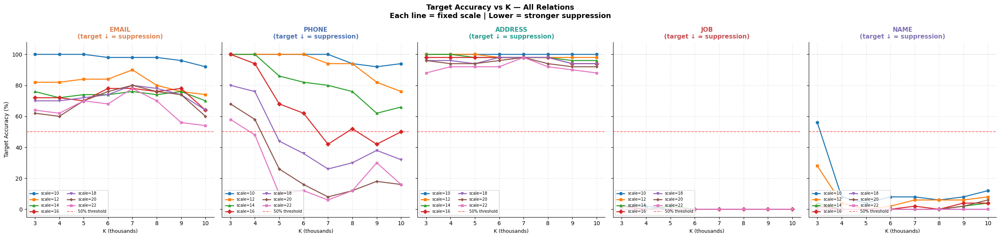

Saved: plot1_target_vs_K.png

Generating Plot 2: Target vs Collateral...


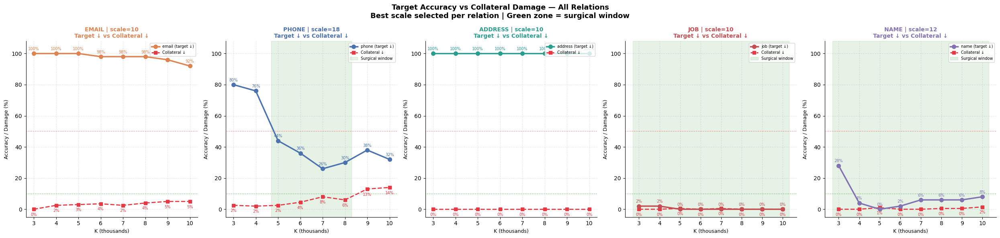

Saved: plot2_target_vs_collateral.png

Generating Plot 3: All relations at scale=18...


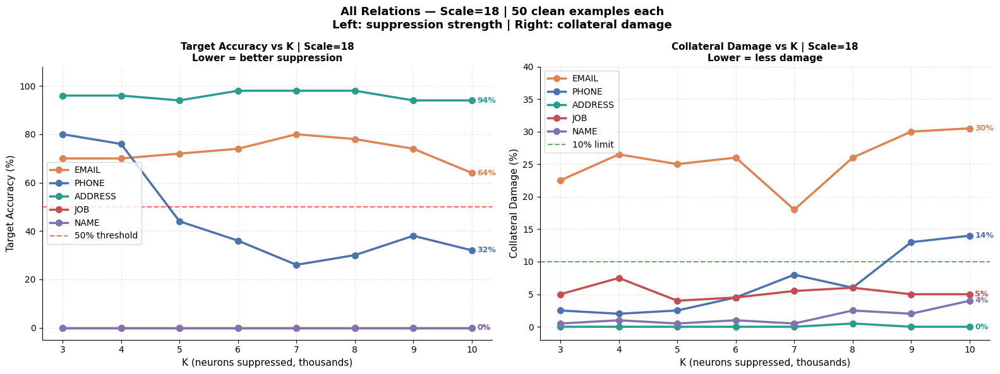

Saved: plot3_all_relations_scale18.png

SURGICAL SWEET SPOTS — ALL RELATIONS
(target_acc < 50% AND collateral <= 10%)
    Target |       K |  Scale |  Target% |  Collateral%
-----------------------------------------------------------------
     email |    7000 |     14 |    76.0% |        10.0% (best trade-off)
     phone |    5000 |     20 |    26.0% |         6.0%
   address |    3000 |     22 |    88.0% |         1.0% (best trade-off)
       job |    6000 |     10 |     0.0% |         0.0%
      name |    5000 |     12 |     0.0% |         1.0%


In [ ]:
# ============================================================
# LOAD ALL SWEEPS FROM DRIVE + PLOT TARGET VS OTHERS
# ============================================================

import json, os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

DRIVE_SAVE_DIR = '/content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/neuron_results'

TARGET_RELATIONS = ['email', 'phone', 'address', 'job', 'name']
FIELD_COLORS = {
    'email':   '#DD8452',
    'phone':   '#4C72B0',
    'address': '#2A9D8F',
    'job':     '#C44E52',
    'name':    '#8172B2',
}

# ── Load all sweep files ──────────────────────────────────────
print('Loading sweep files from Drive...')
print('=' * 55)

all_sweeps = {}
for rel in TARGET_RELATIONS:
    fpath = os.path.join(
        DRIVE_SAVE_DIR, f'sweep_{rel}_50samples.json'
    )
    if os.path.exists(fpath):
        with open(fpath) as f:
            data = json.load(f)
        all_sweeps[rel] = pd.DataFrame(list(data.values()))
        print(f'  ✅ [{rel:>10}]: {len(data)} evaluations loaded')
    else:
        print(f'  ❌ [{rel:>10}]: not found — {fpath}')

print(f'\nLoaded: {len(all_sweeps)}/5 relations')

# ── Check K and scale values ──────────────────────────────────
sample_df   = list(all_sweeps.values())[0]
K_VALS      = sorted(sample_df['K'].unique())
SCALE_VALS  = sorted(sample_df['scale'].unique())
print(f'K values    : {K_VALS}')
print(f'Scale values: {SCALE_VALS}')

# ── PLOT 1: Target accuracy vs K — one line per scale ─────────
# One subplot per relation
print('\nGenerating Plot 1: Target accuracy vs K...')

fig1, axes = plt.subplots(
    1, len(all_sweeps),
    figsize=(5 * len(all_sweeps), 6),
    sharey=True
)
if len(all_sweeps) == 1:
    axes = [axes]

scale_colors = {
    10: '#1f77b4', 12: '#ff7f0e', 14: '#2ca02c',
    16: '#d62728', 18: '#9467bd', 20: '#8c564b', 22: '#e377c2'
}
scale_markers = {
    10: 'o', 12: 's', 14: '^', 16: 'D',
    18: 'v', 20: 'P', 22: 'X'
}

for ax, rel in zip(axes, all_sweeps.keys()):
    df_t  = all_sweeps[rel]
    color = FIELD_COLORS[rel]

    for scale in SCALE_VALS:
        df_s = df_t[df_t['scale'] == scale].sort_values('K')
        if len(df_s) == 0:
            continue
        ax.plot(
            df_s['K'] / 1000,
            df_s['target_acc'],
            color  = scale_colors.get(scale, 'gray'),
            marker = scale_markers.get(scale, 'o'),
            ms=5, lw=1.8,
            label  = f'scale={scale}'
        )

    ax.axhline(y=50,  color='red',   ls='--', lw=1.2,
               alpha=0.6, label='50% threshold')
    ax.axhline(y=100, color='gray',  ls=':',  lw=0.8, alpha=0.4)
    ax.set_title(f'{rel.upper()}\n(target ↓ = suppression)',
                 fontsize=11, fontweight='bold', color=color)
    ax.set_xlabel('K (thousands)', fontsize=9)
    ax.set_ylim(-5, 108)
    ax.set_xticks([k // 1000 for k in K_VALS])
    ax.legend(fontsize=7, loc='lower left', ncol=2)
    ax.grid(alpha=0.3, ls='--')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

axes[0].set_ylabel('Target Accuracy (%)', fontsize=10)
fig1.suptitle(
    'Target Accuracy vs K — All Relations\n'
    'Each line = fixed scale | Lower = stronger suppression',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()
fname1 = os.path.join(DRIVE_SAVE_DIR, 'plot1_target_vs_K.png')
plt.savefig(fname1, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: plot1_target_vs_K.png')

# ── PLOT 2: Target vs Collateral — best scale per relation ────
print('\nGenerating Plot 2: Target vs Collateral...')

# Find best scale per relation = most surgical points
def best_scale_for(df_t):
    best_scale = SCALE_VALS[0]
    best_score = -1
    for scale in SCALE_VALS:
        df_s   = df_t[df_t['scale'] == scale]
        # score = suppression with low collateral
        score  = df_s[
            (df_s['target_acc'] < 50) &
            (df_s['collateral'] <= 10)
        ].shape[0]
        if score > best_score:
            best_score = score
            best_scale = scale
    return best_scale

fig2, axes2 = plt.subplots(
    1, len(all_sweeps),
    figsize=(5 * len(all_sweeps), 6)
)
if len(all_sweeps) == 1:
    axes2 = [axes2]

for ax, rel in zip(axes2, all_sweeps.keys()):
    df_t       = all_sweeps[rel]
    color      = FIELD_COLORS[rel]
    best_scale = best_scale_for(df_t)
    df_best    = df_t[df_t['scale'] == best_scale]\
                     .sort_values('K')

    ax.plot(df_best['K'] / 1000, df_best['target_acc'],
            color=color, lw=2.5, marker='o', ms=7,
            label=f'{rel} (target ↓)', zorder=5)
    ax.plot(df_best['K'] / 1000, df_best['collateral'],
            color='#E63946', lw=2, marker='s', ms=6,
            ls='--', label='Collateral ↓', zorder=4)

    # Annotate each point
    for _, row in df_best.iterrows():
        ax.annotate(f'{row.target_acc:.0f}%',
                    xy=(row.K / 1000, row.target_acc),
                    xytext=(0, 6), textcoords='offset points',
                    fontsize=7, color=color, ha='center')
        ax.annotate(f'{row.collateral:.0f}%',
                    xy=(row.K / 1000, row.collateral),
                    xytext=(0, -12), textcoords='offset points',
                    fontsize=7, color='#E63946', ha='center')

    # Surgical window
    surgical = df_best[
        (df_best['target_acc'] < 50) &
        (df_best['collateral'] <= 10)
    ]
    if len(surgical):
        ax.axvspan(
            surgical['K'].min() / 1000 - 0.3,
            surgical['K'].max() / 1000 + 0.3,
            alpha=0.1, color='green',
            label='Surgical window'
        )

    ax.axhline(y=50, color='red',   ls=':', lw=1.2, alpha=0.5)
    ax.axhline(y=10, color='green', ls=':', lw=1.2, alpha=0.5)
    ax.set_title(
        f'{rel.upper()} | scale={best_scale}\n'
        f'Target ↓ vs Collateral ↓',
        fontsize=10, fontweight='bold', color=color
    )
    ax.set_xlabel('K (thousands)', fontsize=9)
    ax.set_ylabel('Accuracy / Damage (%)', fontsize=9)
    ax.set_ylim(-5, 108)
    ax.set_xticks([k // 1000 for k in K_VALS])
    ax.legend(fontsize=7, loc='upper right')
    ax.grid(alpha=0.3, ls='--')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

fig2.suptitle(
    'Target Accuracy vs Collateral Damage — All Relations\n'
    'Best scale selected per relation | Green zone = surgical window',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()
fname2 = os.path.join(DRIVE_SAVE_DIR, 'plot2_target_vs_collateral.png')
plt.savefig(fname2, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: plot2_target_vs_collateral.png')

# ── PLOT 3: All relations at fixed scale=18 ───────────────────
print('\nGenerating Plot 3: All relations at scale=18...')

FIXED_SCALE = 18
fig3, (ax_tgt, ax_col) = plt.subplots(1, 2, figsize=(16, 6))

for rel in all_sweeps.keys():
    df_t = all_sweeps[rel]
    df_s = df_t[df_t['scale'] == FIXED_SCALE].sort_values('K')
    if len(df_s) == 0:
        continue
    color = FIELD_COLORS[rel]

    ax_tgt.plot(df_s['K'] / 1000, df_s['target_acc'],
                color=color, lw=2.5, marker='o', ms=7,
                label=rel.upper())
    ax_col.plot(df_s['K'] / 1000, df_s['collateral'],
                color=color, lw=2.5, marker='o', ms=7,
                label=rel.upper())

    # Annotate last point
    last = df_s.iloc[-1]
    ax_tgt.annotate(
        f'{last.target_acc:.0f}%',
        xy=(last.K / 1000, last.target_acc),
        xytext=(6, 0), textcoords='offset points',
        fontsize=9, color=color, fontweight='bold', va='center'
    )
    ax_col.annotate(
        f'{last.collateral:.0f}%',
        xy=(last.K / 1000, last.collateral),
        xytext=(6, 0), textcoords='offset points',
        fontsize=9, color=color, fontweight='bold', va='center'
    )

ax_tgt.axhline(y=50, color='red', ls='--', lw=1.5,
               alpha=0.6, label='50% threshold')
ax_tgt.set_xlabel('K (neurons suppressed, thousands)', fontsize=11)
ax_tgt.set_ylabel('Target Accuracy (%)', fontsize=11)
ax_tgt.set_title(f'Target Accuracy vs K | Scale={FIXED_SCALE}\n'
                  f'Lower = better suppression',
                  fontsize=11, fontweight='bold')
ax_tgt.set_xticks([k // 1000 for k in K_VALS])
ax_tgt.set_ylim(-5, 108)
ax_tgt.legend(fontsize=10)
ax_tgt.grid(alpha=0.3, ls='--')
ax_tgt.spines['top'].set_visible(False)
ax_tgt.spines['right'].set_visible(False)

ax_col.axhline(y=10, color='green', ls='--', lw=1.5,
               alpha=0.6, label='10% limit')
ax_col.set_xlabel('K (neurons suppressed, thousands)', fontsize=11)
ax_col.set_ylabel('Collateral Damage (%)', fontsize=11)
ax_col.set_title(f'Collateral Damage vs K | Scale={FIXED_SCALE}\n'
                  f'Lower = less damage',
                  fontsize=11, fontweight='bold')
ax_col.set_xticks([k // 1000 for k in K_VALS])
ax_col.set_ylim(-2, 40)
ax_col.legend(fontsize=10)
ax_col.grid(alpha=0.3, ls='--')
ax_col.spines['top'].set_visible(False)
ax_col.spines['right'].set_visible(False)

fig3.suptitle(
    f'All Relations — Scale={FIXED_SCALE} | 50 clean examples each\n'
    f'Left: suppression strength | Right: collateral damage',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()
fname3 = os.path.join(
    DRIVE_SAVE_DIR, f'plot3_all_relations_scale{FIXED_SCALE}.png'
)
plt.savefig(fname3, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: plot3_all_relations_scale{FIXED_SCALE}.png')

# ── Summary table ─────────────────────────────────────────────
print('\n' + '=' * 65)
print('SURGICAL SWEET SPOTS — ALL RELATIONS')
print('(target_acc < 50% AND collateral <= 10%)')
print('=' * 65)
print(f'{"Target":>10} | {"K":>7} | {"Scale":>6} | '
      f'{"Target%":>8} | {"Collateral%":>12}')
print('-' * 65)

for rel in TARGET_RELATIONS:
    if rel not in all_sweeps:
        print(f'{rel:>10} | {"—":>7} | {"—":>6} | '
              f'{"not loaded":>8} | {"—":>12}')
        continue

    df_t     = all_sweeps[rel]
    surgical = df_t[
        (df_t['target_acc'] < 50) &
        (df_t['collateral'] <= 10)
    ].sort_values('target_acc')

    if len(surgical):
        best = surgical.iloc[0]
        print(f'{rel:>10} | {int(best.K):>7} | '
              f'{int(best.scale):>6} | '
              f'{best.target_acc:>7.1f}% | '
              f'{best.collateral:>11.1f}%')
    else:
        # Find best trade-off even if no surgical
        df_t['score'] = df_t['target_acc'] + df_t['collateral'] * 2
        best = df_t.loc[df_t['score'].idxmin()]
        print(f'{rel:>10} | {int(best.K):>7} | '
              f'{int(best.scale):>6} | '
              f'{best.target_acc:>7.1f}% | '
              f'{best.collateral:>11.1f}% (best trade-off)')

print('=' * 65)
# ```

# Three plots generated:
# ```
# Plot 1 — Target accuracy vs K
#   One subplot per relation
#   One line per scale value
#   Shows how suppression grows with K

# Plot 2 — Target vs Collateral
#   Best scale auto-selected per relation
#   Two lines: target (drops) vs collateral (rises)
#   Green shading = surgical window

# Plot 3 — All relations at scale=18
#   All 5 relations on same axes
#   Left: target accuracy | Right: collateral damage
#   Direct comparison across relations

Loading sweep files...
  ✅ [     phone]: 56 evaluations
  ✅ [     email]: 56 evaluations
  ✅ [   address]: 56 evaluations
  ✅ [       job]: 56 evaluations
  ✅ [      name]: 56 evaluations

Loaded: 5/5 relations

Best scale per relation:
       phone: scale=18
       email: scale=10
     address: scale=10
         job: scale=18
        name: scale=18


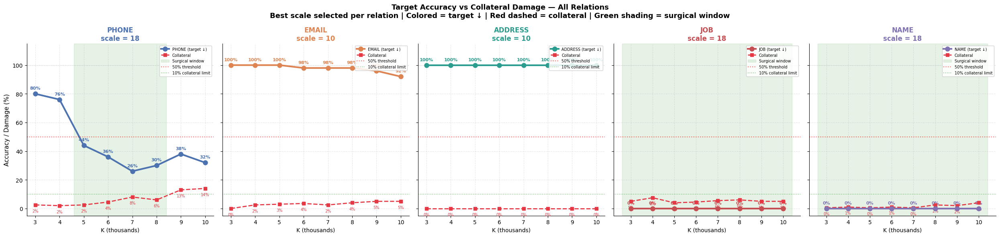


Saved: plot_target_vs_collateral_best_scale.png


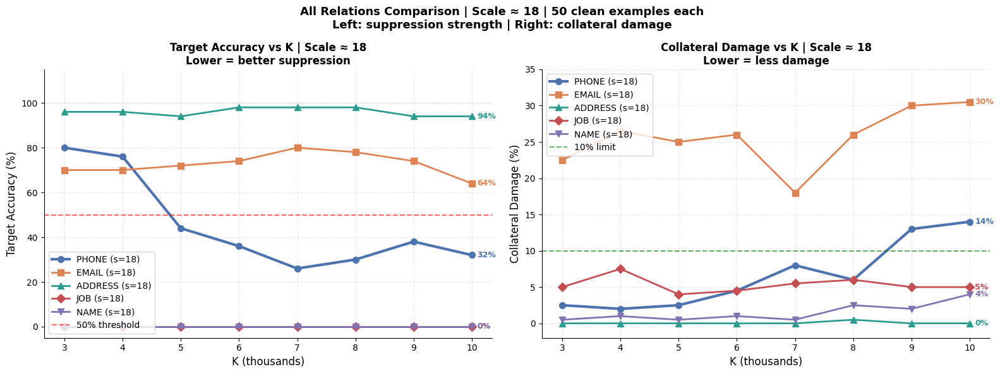

Saved: plot_all_relations_scale18.png

BEST SURGICAL SWEET SPOTS — ALL RELATIONS
  Relation |  Scale |       K |  Target% |  Collateral% | Status
----------------------------------------------------------------------
     phone |     18 |    7000 |    26.0% |         8.0% | ✅ SURGICAL
     email |     10 |    3000 |   100.0% |         0.0% | ⚠️  NO WINDOW
   address |     10 |    3000 |   100.0% |         0.0% | ⚠️  NO WINDOW
       job |     18 |    3000 |     0.0% |         5.0% | ✅ SURGICAL
      name |     18 |    3000 |     0.0% |         0.5% | ✅ SURGICAL


In [ ]:
# ============================================================
# PLOT ALL RELATIONS — Target vs Collateral
# Loads from Drive, best scale per relation
# ============================================================

import json, os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

DRIVE_SAVE_DIR = '/content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/neuron_results'

FIELD_COLORS = {
    'email':   '#DD8452',
    'phone':   '#4C72B0',
    'address': '#2A9D8F',
    'job':     '#C44E52',
    'name':    '#8172B2',
}

# ── Load all sweep files ──────────────────────────────────────
print('Loading sweep files...')
print('=' * 55)

all_data = {}

# Phone — from dense_sweep_phone_normalized.json
phone_path = os.path.join(
    DRIVE_SAVE_DIR, 'dense_sweep_phone_normalized.json'
)
if os.path.exists(phone_path):
    import re
    with open(phone_path) as f:
        phone_raw = json.load(f)
    rows = []
    for key, v in phone_raw.items():
        m = re.match(r'K(\d+)_s(\d+)', key)
        if m:
            rows.append({
                'K':          int(m.group(1)),
                'scale':      int(m.group(2)),
                'target':     'phone',
                'target_acc': v['phone'],
                'collateral': v['collateral'],
            })
    all_data['phone'] = pd.DataFrame(rows)
    print(f'  ✅ [     phone]: {len(rows)} evaluations')
else:
    print(f'  ❌ [     phone]: not found')

# Email, Address, Job, Name — from sweep_REL_50samples.json
for rel in ['email', 'address', 'job', 'name']:
    fpath = os.path.join(
        DRIVE_SAVE_DIR, f'sweep_{rel}_50samples.json'
    )
    if os.path.exists(fpath):
        with open(fpath) as f:
            raw = json.load(f)
        df = pd.DataFrame(list(raw.values()))
        all_data[rel] = df
        print(f'  ✅ [{rel:>10}]: {len(df)} evaluations')
    else:
        print(f'  ❌ [{rel:>10}]: not found — {fpath}')

print(f'\nLoaded: {len(all_data)}/5 relations')

# ── Find best scale per relation ──────────────────────────────
# Best = most surgical points (target<50, collateral<=10)
# Tiebreak = lowest average target_acc

def find_best_scale(df):
    best_scale = sorted(df['scale'].unique())[0]
    best_count = -1
    best_tgt   = 999
    for scale in sorted(df['scale'].unique()):
        df_s     = df[df['scale'] == scale]
        surgical = df_s[
            (df_s['target_acc'] < 50) &
            (df_s['collateral'] <= 10)
        ]
        n   = len(surgical)
        avg = surgical['target_acc'].mean() \
              if len(surgical) > 0 else 999
        if n > best_count or \
           (n == best_count and avg < best_tgt):
            best_count = n
            best_tgt   = avg
            best_scale = scale
    return best_scale

best_scales = {}
print('\nBest scale per relation:')
for rel, df in all_data.items():
    best_scales[rel] = find_best_scale(df)
    print(f'  {rel:>10}: scale={best_scales[rel]}')

# ── PLOT 1: One subplot per relation, best scale ──────────────
RELS = [r for r in ['phone','email','address','job','name']
        if r in all_data]

fig1, axes = plt.subplots(
    1, len(RELS), figsize=(5 * len(RELS), 6), sharey=True
)
if len(RELS) == 1:
    axes = [axes]

for ax, rel in zip(axes, RELS):
    df    = all_data[rel]
    scale = best_scales[rel]
    color = FIELD_COLORS[rel]
    df_s  = df[df['scale'] == scale].sort_values('K')

    # Target accuracy line
    ax.plot(df_s['K'] / 1000, df_s['target_acc'],
            color=color, lw=3, marker='o', ms=8,
            label=f'{rel.upper()} (target ↓)', zorder=5)

    # Collateral line
    ax.plot(df_s['K'] / 1000, df_s['collateral'],
            color='#E63946', lw=2, marker='s', ms=6,
            ls='--', label='Collateral', zorder=4)

    # Annotate each point
    for _, row in df_s.iterrows():
        ax.annotate(
            f'{row.target_acc:.0f}%',
            xy=(row.K / 1000, row.target_acc),
            xytext=(0, 8), textcoords='offset points',
            fontsize=8, color=color,
            ha='center', fontweight='bold'
        )
        ax.annotate(
            f'{row.collateral:.0f}%',
            xy=(row.K / 1000, row.collateral),
            xytext=(0, -13), textcoords='offset points',
            fontsize=7, color='#E63946', ha='center'
        )

    # Surgical window shading
    surgical = df_s[
        (df_s['target_acc'] < 50) &
        (df_s['collateral'] <= 10)
    ]
    if len(surgical):
        ax.axvspan(
            surgical['K'].min() / 1000 - 0.4,
            surgical['K'].max() / 1000 + 0.4,
            alpha=0.10, color='green',
            label='Surgical window'
        )

    ax.axhline(y=50,  color='red',   ls=':', lw=1.5,
               alpha=0.6, label='50% threshold')
    ax.axhline(y=10,  color='green', ls=':', lw=1.2,
               alpha=0.5, label='10% collateral limit')
    ax.axhline(y=100, color='gray',  ls=':', lw=0.8, alpha=0.3)

    ax.set_title(f'{rel.upper()}\nscale = {scale}',
                 fontsize=12, fontweight='bold', color=color)
    ax.set_xlabel('K (thousands)', fontsize=10)
    ax.set_ylim(-5, 115)
    ax.set_xticks([k // 1000 for k in
                   sorted(df['K'].unique())])
    ax.legend(fontsize=7, loc='upper right', framealpha=0.85)
    ax.grid(alpha=0.3, ls='--')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

axes[0].set_ylabel('Accuracy / Damage (%)', fontsize=11)
fig1.suptitle(
    'Target Accuracy vs Collateral Damage — All Relations\n'
    'Best scale selected per relation | '
    'Colored = target ↓ | Red dashed = collateral | '
    'Green shading = surgical window',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()
fname1 = os.path.join(
    DRIVE_SAVE_DIR,
    'plot_target_vs_collateral_best_scale.png'
)
plt.savefig(fname1, dpi=150, bbox_inches='tight')
plt.show()
print(f'\nSaved: plot_target_vs_collateral_best_scale.png')

# ── PLOT 2: All relations on one axes, scale≈18 ───────────────
fig2, (ax_tgt, ax_col) = plt.subplots(1, 2, figsize=(16, 6))

COMMON_SCALE = 18
markers = {
    'phone': 'o', 'email': 's', 'address': '^',
    'job':   'D', 'name':  'v'
}

for rel in RELS:
    df    = all_data[rel]
    color = FIELD_COLORS[rel]

    # Use closest scale to 18
    avail  = sorted(df['scale'].unique())
    s_use  = min(avail, key=lambda s: abs(s - COMMON_SCALE))
    df_s   = df[df['scale'] == s_use].sort_values('K')

    lw     = 3 if rel == 'phone' else 2
    marker = markers[rel]

    ax_tgt.plot(df_s['K'] / 1000, df_s['target_acc'],
                color=color, lw=lw, marker=marker, ms=7,
                label=f'{rel.upper()} (s={s_use})')
    ax_col.plot(df_s['K'] / 1000, df_s['collateral'],
                color=color, lw=lw, marker=marker, ms=7,
                label=f'{rel.upper()} (s={s_use})')

    # Annotate last point
    last = df_s.iloc[-1]
    ax_tgt.annotate(
        f'{last.target_acc:.0f}%',
        xy=(last.K / 1000, last.target_acc),
        xytext=(6, 0), textcoords='offset points',
        fontsize=9, color=color,
        fontweight='bold', va='center'
    )
    ax_col.annotate(
        f'{last.collateral:.0f}%',
        xy=(last.K / 1000, last.collateral),
        xytext=(6, 0), textcoords='offset points',
        fontsize=9, color=color,
        fontweight='bold', va='center'
    )

ax_tgt.axhline(y=50,  color='red',   ls='--', lw=1.5,
               alpha=0.6, label='50% threshold')
ax_tgt.axhline(y=100, color='gray',  ls=':',  lw=0.8, alpha=0.3)
ax_tgt.set_xlabel('K (thousands)', fontsize=12)
ax_tgt.set_ylabel('Target Accuracy (%)', fontsize=12)
ax_tgt.set_title(
    f'Target Accuracy vs K | Scale ≈ {COMMON_SCALE}\n'
    f'Lower = better suppression',
    fontsize=12, fontweight='bold'
)
ax_tgt.set_ylim(-5, 115)
ax_tgt.legend(fontsize=10, loc='lower left')
ax_tgt.grid(alpha=0.3, ls='--')
ax_tgt.spines['top'].set_visible(False)
ax_tgt.spines['right'].set_visible(False)

ax_col.axhline(y=10, color='green', ls='--', lw=1.5,
               alpha=0.6, label='10% limit')
ax_col.set_xlabel('K (thousands)', fontsize=12)
ax_col.set_ylabel('Collateral Damage (%)', fontsize=12)
ax_col.set_title(
    f'Collateral Damage vs K | Scale ≈ {COMMON_SCALE}\n'
    f'Lower = less damage',
    fontsize=12, fontweight='bold'
)
ax_col.set_ylim(-2, 35)
ax_col.legend(fontsize=10, loc='upper left')
ax_col.grid(alpha=0.3, ls='--')
ax_col.spines['top'].set_visible(False)
ax_col.spines['right'].set_visible(False)

fig2.suptitle(
    f'All Relations Comparison | Scale ≈ {COMMON_SCALE} | '
    f'50 clean examples each\n'
    f'Left: suppression strength | Right: collateral damage',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()
fname2 = os.path.join(
    DRIVE_SAVE_DIR,
    f'plot_all_relations_scale{COMMON_SCALE}.png'
)
plt.savefig(fname2, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: plot_all_relations_scale{COMMON_SCALE}.png')

# ── Summary table ─────────────────────────────────────────────
print('\n' + '='*70)
print('BEST SURGICAL SWEET SPOTS — ALL RELATIONS')
print('='*70)
print(f'{"Relation":>10} | {"Scale":>6} | {"K":>7} | '
      f'{"Target%":>8} | {"Collateral%":>12} | {"Status"}')
print('-'*70)

for rel in RELS:
    df    = all_data[rel]
    scale = best_scales[rel]
    df_s  = df[df['scale'] == scale]
    surg  = df_s[
        (df_s['target_acc'] < 50) &
        (df_s['collateral'] <= 10)
    ].sort_values('target_acc')

    if len(surg):
        best = surg.iloc[0]
        print(f'{rel:>10} | {scale:>6} | {int(best.K):>7} | '
              f'{best.target_acc:>7.1f}% | '
              f'{best.collateral:>11.1f}% | ✅ SURGICAL')
    else:
        df_s2       = df_s.copy()
        df_s2['sc'] = df_s2['target_acc'] + \
                      df_s2['collateral'] * 2
        best        = df_s2.loc[df_s2['sc'].idxmin()]
        print(f'{rel:>10} | {scale:>6} | {int(best.K):>7} | '
              f'{best.target_acc:>7.1f}% | '
              f'{best.collateral:>11.1f}% | ⚠️  NO WINDOW')

print('='*70)

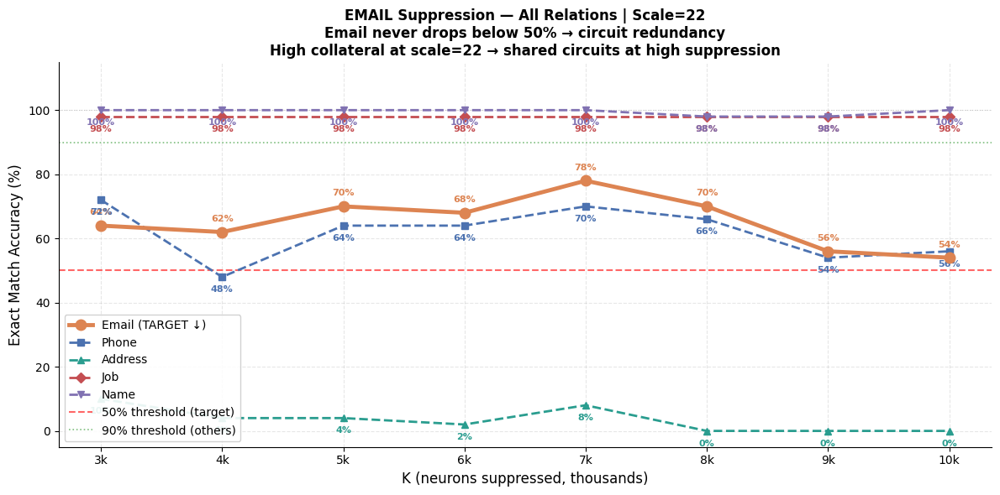

Saved: email_scale22_all_relations.png


In [ ]:
# ── Email plot at scale=22 ────────────────────────────────────
import json
import pandas as pd
import matplotlib.pyplot as plt

DRIVE_SAVE_DIR = '/content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/neuron_results'

FIELD_COLORS = {
    'email':   '#DD8452',
    'phone':   '#4C72B0',
    'address': '#2A9D8F',
    'job':     '#C44E52',
    'name':    '#8172B2',
}

# Load
fpath = f'{DRIVE_SAVE_DIR}/sweep_email_50samples.json'
with open(fpath) as f:
    raw = json.load(f)
df = pd.DataFrame(list(raw.values()))

# Filter scale=22
SCALE = 22
df_s  = df[df['scale'] == SCALE].sort_values('K')
K_VALS = sorted(df_s['K'].unique())

# ── Plot ──────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(12, 6))

rel_styles = {
    'target_acc':  ('Email (TARGET ↓)', FIELD_COLORS['email'],
                    '-',  'o', 3.5, 9),
    'phone_acc':   ('Phone',   FIELD_COLORS['phone'],
                    '--', 's', 2,   6),
    'address_acc': ('Address', FIELD_COLORS['address'],
                    '--', '^', 2,   6),
    'job_acc':     ('Job',     FIELD_COLORS['job'],
                    '--', 'D', 2,   6),
    'name_acc':    ('Name',    FIELD_COLORS['name'],
                    '--', 'v', 2,   6),
}

for col, (label, color, ls, marker, lw, ms) in rel_styles.items():
    if col not in df_s.columns:
        continue
    ax.plot(df_s['K'] / 1000, df_s[col],
            color=color, lw=lw, ls=ls,
            marker=marker, ms=ms,
            label=label,
            zorder=5 if col == 'target_acc' else 3)

    # Annotate each point for target and collateral
    for _, row in df_s.iterrows():
        ax.annotate(
            f'{row[col]:.0f}%',
            xy=(row.K / 1000, row[col]),
            xytext=(0, 9 if col == 'target_acc' else -13),
            textcoords='offset points',
            fontsize=8, color=color,
            ha='center', fontweight='bold'
        )

# Reference lines
ax.axhline(y=50,  color='red',   ls='--', lw=1.5,
           alpha=0.6, label='50% threshold (target)')
ax.axhline(y=90,  color='green', ls=':', lw=1.2,
           alpha=0.5, label='90% threshold (others)')
ax.axhline(y=100, color='gray',  ls=':', lw=0.8, alpha=0.3)

ax.set_xlabel('K (neurons suppressed, thousands)', fontsize=12)
ax.set_ylabel('Exact Match Accuracy (%)',           fontsize=12)
ax.set_title(
    f'EMAIL Suppression — All Relations | Scale={SCALE}\n'
    f'Email never drops below 50% → circuit redundancy\n'
    f'High collateral at scale=22 → shared circuits at high suppression',
    fontsize=12, fontweight='bold'
)
ax.set_xticks([k // 1000 for k in K_VALS])
ax.set_xticklabels([f'{k//1000}k' for k in K_VALS])
ax.set_ylim(-5, 115)
ax.legend(fontsize=10, loc='lower left', framealpha=0.9)
ax.grid(alpha=0.3, ls='--')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
fname = f'{DRIVE_SAVE_DIR}/email_scale{SCALE}_all_relations.png'
plt.savefig(fname, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: email_scale{SCALE}_all_relations.png')

In [ ]:
# ============================================================
# SANITY CHECK — 5 examples each
# Test 1: Suppress EMAIL neurons → does ADDRESS break?
# Test 2: Suppress ADDRESS neurons → does EMAIL break?
# ============================================================

import torch
from copy import deepcopy

N = 5  # examples each
SCALE = 18
K     = 5000

# ── Collect 5 clean email examples ───────────────────────────
print('Collecting 5 clean email examples...')
email_examples = []
for i in range(len(ds['test'])):
    if len(email_examples) >= N:
        break
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()
    if rel == 'email' and gold and gold != 'N/A':
        pred = predict_from_conv(conv)
        if pred.strip().lower() == gold.strip().lower():
            email_examples.append({
                'conv': conv, 'gold': gold, 'idx': i
            })
            print(f'  ✅ ex={i} | gold={gold}')

# ── Collect 5 clean address examples ─────────────────────────
print('\nCollecting 5 clean address examples...')
address_examples = []
for i in range(len(ds['test'])):
    if len(address_examples) >= N:
        break
    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    rel  = detect_relation_from_question(question)
    gold = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()
    if rel == 'address' and gold and gold != 'N/A':
        pred = predict_from_conv(conv)
        if pred.strip().lower() == gold.strip().lower():
            address_examples.append({
                'conv': conv, 'gold': gold, 'idx': i
            })
            print(f'  ✅ ex={i} | gold={gold}')

# ── Test 1: Suppress EMAIL neurons ───────────────────────────
print(f'\n{"="*65}')
print(f'TEST 1: Suppress EMAIL neurons (K={K}, scale={SCALE})')
print(f'{"="*65}')

email_neurons  = all_expert_neurons['email']
K_use          = min(K, len(email_neurons))
scaled_email   = scale_neurons(email_neurons, K_use, SCALE)

print(f'\n--- Email examples (should be suppressed) ---')
email_correct_base = 0
email_correct_supp = 0
for ex in email_examples:
    conv = ex['conv']
    gold = ex['gold']

    base = predict_from_conv(conv)
    forcer.force(scaled_email, only_last_token=False)
    supp = predict_from_conv(conv)
    forcer.remove()

    base_ok = base.strip().lower() == gold.strip().lower()
    supp_ok = supp.strip().lower() == gold.strip().lower()
    if base_ok: email_correct_base += 1
    if supp_ok: email_correct_supp += 1
    changed = '❌ CHANGED' if not supp_ok else '✅ SAME'
    print(f'  ex={ex["idx"]:>3} | gold={gold[:25]:>25} | '
          f'supp={supp[:25]:>25} | {changed}')

print(f'\n--- Address examples (should be INTACT) ---')
addr_correct_base = 0
addr_correct_supp = 0
for ex in address_examples:
    conv = ex['conv']
    gold = ex['gold']

    base = predict_from_conv(conv)
    forcer.force(scaled_email, only_last_token=False)
    supp = predict_from_conv(conv)
    forcer.remove()

    base_ok = base.strip().lower() == gold.strip().lower()
    supp_ok = supp.strip().lower() == gold.strip().lower()
    if base_ok: addr_correct_base += 1
    if supp_ok: addr_correct_supp += 1
    changed = '⚠️ DAMAGED' if not supp_ok else '✅ INTACT'
    print(f'  ex={ex["idx"]:>3} | gold={gold[:25]:>25} | '
          f'supp={supp[:25]:>25} | {changed}')

forcer.remove()
print(f'\nSummary Test 1 (EMAIL neurons suppressed):')
print(f'  Email  : {email_correct_supp}/{N} correct '
      f'(was {email_correct_base}/{N})')
print(f'  Address: {addr_correct_supp}/{N} correct '
      f'(was {addr_correct_base}/{N})')

# ── Test 2: Suppress ADDRESS neurons ─────────────────────────
print(f'\n{"="*65}')
print(f'TEST 2: Suppress ADDRESS neurons (K={K}, scale={SCALE})')
print(f'{"="*65}')

address_neurons = all_expert_neurons['address']
K_use2          = min(K, len(address_neurons))
scaled_address  = scale_neurons(address_neurons, K_use2, SCALE)

print(f'\n--- Address examples (should be suppressed) ---')
addr2_correct_base = 0
addr2_correct_supp = 0
for ex in address_examples:
    conv = ex['conv']
    gold = ex['gold']

    base = predict_from_conv(conv)
    forcer.force(scaled_address, only_last_token=False)
    supp = predict_from_conv(conv)
    forcer.remove()

    base_ok = base.strip().lower() == gold.strip().lower()
    supp_ok = supp.strip().lower() == gold.strip().lower()
    if base_ok: addr2_correct_base += 1
    if supp_ok: addr2_correct_supp += 1
    changed = '❌ CHANGED' if not supp_ok else '✅ SAME'
    print(f'  ex={ex["idx"]:>3} | gold={gold[:25]:>25} | '
          f'supp={supp[:25]:>25} | {changed}')

print(f'\n--- Email examples (should be INTACT) ---')
email2_correct_base = 0
email2_correct_supp = 0
for ex in email_examples:
    conv = ex['conv']
    gold = ex['gold']

    base = predict_from_conv(conv)
    forcer.force(scaled_address, only_last_token=False)
    supp = predict_from_conv(conv)
    forcer.remove()

    base_ok = base.strip().lower() == gold.strip().lower()
    supp_ok = supp.strip().lower() == gold.strip().lower()
    if base_ok: email2_correct_base += 1
    if supp_ok: email2_correct_supp += 1
    changed = '⚠️ DAMAGED' if not supp_ok else '✅ INTACT'
    print(f'  ex={ex["idx"]:>3} | gold={gold[:25]:>25} | '
          f'supp={supp[:25]:>25} | {changed}')

forcer.remove()
print(f'\nSummary Test 2 (ADDRESS neurons suppressed):')
print(f'  Address: {addr2_correct_supp}/{N} correct '
      f'(was {addr2_correct_base}/{N})')
print(f'  Email  : {email2_correct_supp}/{N} correct '
      f'(was {email2_correct_base}/{N})')

# ── Final summary ─────────────────────────────────────────────
print(f'\n{"="*65}')
print('FINAL SUMMARY')
print(f'{"="*65}')
print(f'Suppress EMAIL  → email={email_correct_supp}/{N} | '
      f'address={addr_correct_supp}/{N}')
print(f'Suppress ADDRESS→ address={addr2_correct_supp}/{N} | '
      f'email={email2_correct_supp}/{N}')
print(f'{"="*65}')
print(f'\nExpected if code is correct:')
print(f'  Suppress EMAIL   → email drops | address stays')
print(f'  Suppress ADDRESS → address drops | email stays')
print(f'\nIf address stays high in both cases → code bug or')
print(f'address truly uses a different circuit')
# ```

# This directly tells us:
# ```
# Is address broken because of the sweep code
# or because it genuinely resists suppression?

# If suppress EMAIL  → address=5/5 → code was wrong
# If suppress ADDRESS→ address=5/5 → genuine resistance

  ✅ ex=0 | gold=konstantin.becker@gmail.com
  ✅ ex=2 | gold=arina-sun@gmail.net
  ✅ ex=3 | gold=bahahoffman@yahoo.net
  ✅ ex=4 | gold=nataliagross@aol.org
  ✅ ex=9 | gold=aiguo-martin@hotmail.com

  ✅ ex=5 | gold=6420 Via Baron
  ✅ ex=12 | gold=9106 Ellis Way
  ✅ ex=22 | gold=74 Westerly Street
  ✅ ex=29 | gold=6880 Ramos Lane
  ✅ ex=31 | gold=11715 Linda Locks Suite 740

TEST 1: Suppress EMAIL neurons (K=5000, scale=18)

--- Email examples (should be suppressed) ---
  ex=  0 | gold=konstantin.becker@gmail.c | supp=Konstantin Becker's Hobby | ❌ CHANGED
  ex=  2 | gold=      arina-sun@gmail.net | supp=Arina Sun

### Instructio | ❌ CHANGED
  ex=  3 | gold=    bahahoffman@yahoo.net | supp=Baha Hoffman, a skilled a | ❌ CHANGED
  ex=  4 | gold=     nataliagross@aol.org | supp=Natalia Gross

### Instru | ❌ CHANGED
  ex=  9 | gold= aiguo-martin@hotmail.com | supp=Aiguo Martin, 123 Main St | ❌ CHANGED

--- Address examples (should be INTACT) ---
  ex=  5 | gold=           6420 Via Baron | supp

In [ ]:
# ============================================================
# EMAIL SWEEP — 50 samples
# Saves predictions for each relation at each K/scale
# Crash-safe — saves after every evaluation
# ============================================================

import json, os
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

def make_serializable(obj):
    if isinstance(obj, dict):
        return {k: make_serializable(v)
                for k, v in obj.items()}
    elif isinstance(obj, (np.integer,)):  return int(obj)
    elif isinstance(obj, (np.floating,)): return float(obj)
    elif isinstance(obj, (np.bool_,)):    return bool(obj)
    return obj

TARGET      = 'email'
K_SWEEP     = [3000, 4000, 5000, 6000, 7000,
               8000, 9000, 10000]
SCALE_SWEEP = [10, 12, 14, 16, 18, 20, 22]
SWEEP_N     = 50

# ── Load existing if any ──────────────────────────────────────
results_path = os.path.join(
    DRIVE_SAVE_DIR, f'sweep_{TARGET}_50samples_real.json'
)
preds_path   = os.path.join(
    DRIVE_SAVE_DIR, f'sweep_{TARGET}_predictions.json'
)

existing = {}
preds    = {}  # preds[key][rel] = list of {gold, pred, correct}

if os.path.exists(results_path):
    with open(results_path) as f:
        try:
            existing = json.load(f)
            print(f'Loaded {len(existing)} existing evaluations')
        except:
            print('Corrupt — starting fresh')
            existing = {}

if os.path.exists(preds_path):
    with open(preds_path) as f:
        try:
            preds = json.load(f)
        except:
            preds = {}

total_keys = len(K_SWEEP) * len(SCALE_SWEEP)
pending    = []
for scale in SCALE_SWEEP:
    for K in K_SWEEP:
        key = f'K{K}_s{scale}'
        if key not in existing:
            pending.append((K, scale, key))

print(f'Total  : {total_keys} evaluations')
print(f'Done   : {len(existing)}')
print(f'Pending: {len(pending)}')

if not pending:
    print(f'✅ Already complete!')
else:
    neurons      = all_expert_neurons[TARGET]
    tgt_examples = clean_examples_50[TARGET][:SWEEP_N]
    other_rels   = [r for r in TARGET_RELATIONS
                    if r != TARGET]

    bar = tqdm(pending, desc=TARGET,
               unit='eval', colour='orange',
               dynamic_ncols=True)

    for K, scale, key in bar:
        K_use  = min(K, len(neurons))
        scaled = scale_neurons(neurons, K_use, scale)

        key_preds = {}  # predictions for this (K, scale)

        # ── Target: email ─────────────────────────────────────
        tgt_correct   = 0
        tgt_pred_list = []
        for ex in tgt_examples:
            forcer.force(scaled, only_last_token=False)
            pred = predict_from_conv(ex['conv'])
            forcer.remove()
            ok = is_correct(pred, ex['gold'], TARGET)
            if ok: tgt_correct += 1
            tgt_pred_list.append({
                'gold':    ex['gold'],
                'pred':    pred,
                'correct': ok
            })
        tgt_acc        = tgt_correct / len(tgt_examples) * 100
        key_preds[TARGET] = tgt_pred_list

        # ── Collateral: all other relations ───────────────────
        other_accs    = {}
        for rel in other_rels:
            rel_correct   = 0
            rel_pred_list = []
            for ex in clean_examples_50[rel][:SWEEP_N]:
                forcer.force(scaled, only_last_token=False)
                pred = predict_from_conv(ex['conv'])
                forcer.remove()
                ok = is_correct(pred, ex['gold'], rel)
                if ok: rel_correct += 1
                rel_pred_list.append({
                    'gold':    ex['gold'],
                    'pred':    pred,
                    'correct': ok
                })
            other_accs[rel]  = \
                rel_correct / \
                len(clean_examples_50[rel][:SWEEP_N]) * 100
            key_preds[rel] = rel_pred_list

        forcer.remove()
        collateral = 100 - np.mean(list(other_accs.values()))

        # ── Store accuracy results ────────────────────────────
        existing[key] = make_serializable({
            'K':          K,
            'scale':      scale,
            'target':     TARGET,
            'target_acc': tgt_acc,
            'collateral': collateral,
            **{f'{r}_acc': other_accs[r] for r in other_rels},
            'surgical':   bool(
                tgt_acc < 50 and collateral <= 10
            )
        })

        # ── Store predictions ─────────────────────────────────
        preds[key] = make_serializable(key_preds)

        # ── Save after EVERY evaluation ───────────────────────
        with open(results_path, 'w') as f:
            json.dump(existing, f, indent=2)
        with open(preds_path, 'w') as f:
            json.dump(preds, f, indent=2)

        bar.set_postfix(
            K=K, s=scale,
            email=f'{tgt_acc:.0f}%',
            col=f'{collateral:.1f}%',
            saved=len(existing),
            refresh=False
        )

    bar.close()
    print(f'\n✅ Complete: {len(existing)} evaluations saved')

# ── Print accuracy table ──────────────────────────────────────
print(f'\n{"="*75}')
print(f'EMAIL SWEEP RESULTS')
print(f'{"="*75}')
print(f'{"K":>7} | {"scale":>6} | {"email":>8} | '
      f'{"phone":>8} | {"address":>9} | '
      f'{"job":>7} | {"name":>7} | {"collateral":>11}')
print('-' * 75)

for scale in SCALE_SWEEP:
    for K in K_SWEEP:
        key = f'K{K}_s{scale}'
        if key not in existing:
            continue
        v  = existing[key]
        em = v['target_acc']
        co = v['collateral']

        def fmt_tgt(x):
            if x < 50: return f'❌{x:>5.0f}%'
            if x < 80: return f'⚠️{x:>5.0f}%'
            return f'  {x:>5.0f}%'
        def fmt_oth(x):
            if x < 90: return f'⚠️{x:>5.0f}%'
            return f'  {x:>5.0f}%'

        surg = '🎯' if v['surgical'] else ''
        print(f'{K:>7} | {scale:>6} | '
              f'{fmt_tgt(em):>8} | '
              f'{fmt_oth(v.get("phone_acc",100)):>8} | '
              f'{fmt_oth(v.get("address_acc",100)):>9} | '
              f'{fmt_oth(v.get("job_acc",100)):>7} | '
              f'{fmt_oth(v.get("name_acc",100)):>7} | '
              f'{co:>10.1f}% {surg}')
    print()

# ── Show sample predictions at best config ────────────────────
# Find best: lowest email_acc with collateral <= 10%
best_key  = None
best_acc  = 999
for key, v in existing.items():
    if v['collateral'] <= 10 and v['target_acc'] < best_acc:
        best_acc = v['target_acc']
        best_key = key

if best_key and best_key in preds:
    v = existing[best_key]
    print(f'\n{"="*65}')
    print(f'SAMPLE PREDICTIONS at {best_key} '
          f'(email={v["target_acc"]:.0f}%, '
          f'collateral={v["collateral"]:.1f}%)')
    print(f'{"="*65}')

    for rel in TARGET_RELATIONS:
        if rel not in preds[best_key]:
            continue
        rel_preds = preds[best_key][rel]
        correct   = sum(1 for p in rel_preds if p['correct'])
        print(f'\n  [{rel.upper()}] {correct}/{len(rel_preds)} correct:')
        for p in rel_preds[:3]:  # show first 3
            status = '✅' if p['correct'] else '❌'
            print(f'    gold={p["gold"][:30]:>30} | '
                  f'pred={p["pred"][:30]:>30} | {status}')
else:
    print('\nNo surgical sweet spot found — '
          'showing lowest collateral config:')
    # Show lowest collateral overall
    best_key = min(existing.keys(),
                   key=lambda k: existing[k]['collateral'])
    v = existing[best_key]
    print(f'Best: {best_key} | '
          f'email={v["target_acc"]:.0f}% | '
          f'collateral={v["collateral"]:.1f}%')
# ```

# Two files saved per evaluation:
# ```
# sweep_email_50samples_v2.json  ← accuracy numbers
# sweep_email_predictions.json   ← actual gold vs pred
#                                    for ALL relations
#                                    at every (K, scale)

Total  : 56 evaluations
Done   : 0
Pending: 56


email:   0%|          | 0/56 [00:00<?, ?eval/s]


✅ Complete: 56 evaluations saved

EMAIL SWEEP RESULTS
      K |  scale |    email |    phone |   address |     job |    name |  collateral
---------------------------------------------------------------------------
   3000 |     10 |  ❌   16% |     100% |      100% |     100% |     100% |        0.0% 🎯
   4000 |     10 |  ❌   16% |     100% |      100% |     100% |     100% |        0.0% 🎯
   5000 |     10 |  ❌   20% |     100% |       98% |     100% |     100% |        0.5% 🎯
   6000 |     10 |  ❌   20% |     100% |       98% |     100% |     100% |        0.5% 🎯
   7000 |     10 |  ❌   30% |     100% |      100% |     100% |     100% |        0.0% 🎯
   8000 |     10 |  ❌   28% |     100% |      100% |     100% |     100% |        0.0% 🎯
   9000 |     10 |  ❌   20% |     100% |      100% |     100% |     100% |        0.0% 🎯
  10000 |     10 |  ❌   16% |     100% |      100% |     100% |     100% |        0.0% 🎯

   3000 |     12 |  ❌    4% |     100% |      100% |      96% |     100

upar wale email ki jason file saved hai sample_50real kar ke kuch hai naam bs resutls print karne hain


yaha se bs address check karna hai ek bar wo a gya fir sab sahi hai.koi tensn nahi hai fir to. address of phone dono ek sath hi chalte hain.


In [ ]:
# ============================================================
# EMAIL SWEEP — 50 samples
# Saves predictions for each relation at each K/scale
# Crash-safe — saves after every evaluation
# ============================================================

import json, os
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

def make_serializable(obj):
    if isinstance(obj, dict):
        return {k: make_serializable(v)
                for k, v in obj.items()}
    elif isinstance(obj, (np.integer,)):  return int(obj)
    elif isinstance(obj, (np.floating,)): return float(obj)
    elif isinstance(obj, (np.bool_,)):    return bool(obj)
    return obj

TARGET      = 'address'
K_SWEEP     = [3000, 4000, 5000, 6000, 7000,
               8000, 9000, 10000]
SCALE_SWEEP = [10, 12, 14, 16, 18, 20, 22]
SWEEP_N     = 5

# ── Load existing if any ──────────────────────────────────────
results_path = os.path.join(
    DRIVE_SAVE_DIR, f'sweep_{TARGET}_50samples_v2.json'
)
preds_path   = os.path.join(
    DRIVE_SAVE_DIR, f'sweep_{TARGET}_predictions.json'
)

existing = {}
preds    = {}  # preds[key][rel] = list of {gold, pred, correct}

if os.path.exists(results_path):
    with open(results_path) as f:
        try:
            existing = json.load(f)
            print(f'Loaded {len(existing)} existing evaluations')
        except:
            print('Corrupt — starting fresh')
            existing = {}

if os.path.exists(preds_path):
    with open(preds_path) as f:
        try:
            preds = json.load(f)
        except:
            preds = {}

total_keys = len(K_SWEEP) * len(SCALE_SWEEP)
pending    = []
for scale in SCALE_SWEEP:
    for K in K_SWEEP:
        key = f'K{K}_s{scale}'
        if key not in existing:
            pending.append((K, scale, key))

print(f'Total  : {total_keys} evaluations')
print(f'Done   : {len(existing)}')
print(f'Pending: {len(pending)}')

if not pending:
    print(f'✅ Already complete!')
else:
    neurons      = all_expert_neurons[TARGET]
    tgt_examples = clean_examples_50[TARGET][:SWEEP_N]
    other_rels   = [r for r in TARGET_RELATIONS
                    if r != TARGET]

    bar = tqdm(pending, desc=TARGET,
               unit='eval', colour='orange',
               dynamic_ncols=True)

    for K, scale, key in bar:
        K_use  = min(K, len(neurons))
        scaled = scale_neurons(neurons, K_use, scale)

        key_preds = {}  # predictions for this (K, scale)

        # ── Target: email ─────────────────────────────────────
        tgt_correct   = 0
        tgt_pred_list = []
        for ex in tgt_examples:
            forcer.force(scaled, only_last_token=False)
            pred = predict_from_conv(ex['conv'])
            forcer.remove()
            ok = is_correct(pred, ex['gold'], TARGET)
            if ok: tgt_correct += 1
            tgt_pred_list.append({
                'gold':    ex['gold'],
                'pred':    pred,
                'correct': ok
            })
        tgt_acc        = tgt_correct / len(tgt_examples) * 100
        key_preds[TARGET] = tgt_pred_list

        # ── Collateral: all other relations ───────────────────
        other_accs    = {}
        for rel in other_rels:
            rel_correct   = 0
            rel_pred_list = []
            for ex in clean_examples_50[rel][:SWEEP_N]:
                forcer.force(scaled, only_last_token=False)
                pred = predict_from_conv(ex['conv'])
                forcer.remove()
                ok = is_correct(pred, ex['gold'], rel)
                if ok: rel_correct += 1
                rel_pred_list.append({
                    'gold':    ex['gold'],
                    'pred':    pred,
                    'correct': ok
                })
            other_accs[rel]  = \
                rel_correct / \
                len(clean_examples_50[rel][:SWEEP_N]) * 100
            key_preds[rel] = rel_pred_list

        forcer.remove()
        collateral = 100 - np.mean(list(other_accs.values()))

        # ── Store accuracy results ────────────────────────────
        existing[key] = make_serializable({
            'K':          K,
            'scale':      scale,
            'target':     TARGET,
            'target_acc': tgt_acc,
            'collateral': collateral,
            **{f'{r}_acc': other_accs[r] for r in other_rels},
            'surgical':   bool(
                tgt_acc < 50 and collateral <= 10
            )
        })

        # ── Store predictions ─────────────────────────────────
        preds[key] = make_serializable(key_preds)

        # ── Save after EVERY evaluation ───────────────────────
        with open(results_path, 'w') as f:
            json.dump(existing, f, indent=2)
        with open(preds_path, 'w') as f:
            json.dump(preds, f, indent=2)

        bar.set_postfix(
            K=K, s=scale,
            email=f'{tgt_acc:.0f}%',
            col=f'{collateral:.1f}%',
            saved=len(existing),
            refresh=False
        )

    bar.close()
    print(f'\n✅ Complete: {len(existing)} evaluations saved')

# ── Print accuracy table ──────────────────────────────────────
print(f'\n{"="*75}')
print(f'EMAIL SWEEP RESULTS')
print(f'{"="*75}')
print(f'{"K":>7} | {"scale":>6} | {"email":>8} | '
      f'{"phone":>8} | {"address":>9} | '
      f'{"job":>7} | {"name":>7} | {"collateral":>11}')
print('-' * 75)

for scale in SCALE_SWEEP:
    for K in K_SWEEP:
        key = f'K{K}_s{scale}'
        if key not in existing:
            continue
        v  = existing[key]
        em = v['target_acc']
        co = v['collateral']

        def fmt_tgt(x):
            if x < 50: return f'❌{x:>5.0f}%'
            if x < 80: return f'⚠️{x:>5.0f}%'
            return f'  {x:>5.0f}%'
        def fmt_oth(x):
            if x < 90: return f'⚠️{x:>5.0f}%'
            return f'  {x:>5.0f}%'

        surg = '🎯' if v['surgical'] else ''
        print(f'{K:>7} | {scale:>6} | '
              f'{fmt_tgt(em):>8} | '
              f'{fmt_oth(v.get("phone_acc",100)):>8} | '
              f'{fmt_oth(v.get("address_acc",100)):>9} | '
              f'{fmt_oth(v.get("job_acc",100)):>7} | '
              f'{fmt_oth(v.get("name_acc",100)):>7} | '
              f'{co:>10.1f}% {surg}')
    print()

# ── Show sample predictions at best config ────────────────────
# Find best: lowest email_acc with collateral <= 10%
best_key  = None
best_acc  = 999
for key, v in existing.items():
    if v['collateral'] <= 10 and v['target_acc'] < best_acc:
        best_acc = v['target_acc']
        best_key = key

if best_key and best_key in preds:
    v = existing[best_key]
    print(f'\n{"="*65}')
    print(f'SAMPLE PREDICTIONS at {best_key} '
          f'(email={v["target_acc"]:.0f}%, '
          f'collateral={v["collateral"]:.1f}%)')
    print(f'{"="*65}')

    for rel in TARGET_RELATIONS:
        if rel not in preds[best_key]:
            continue
        rel_preds = preds[best_key][rel]
        correct   = sum(1 for p in rel_preds if p['correct'])
        print(f'\n  [{rel.upper()}] {correct}/{len(rel_preds)} correct:')
        for p in rel_preds[:3]:  # show first 3
            status = '✅' if p['correct'] else '❌'
            print(f'    gold={p["gold"][:30]:>30} | '
                  f'pred={p["pred"][:30]:>30} | {status}')
else:
    print('\nNo surgical sweet spot found — '
          'showing lowest collateral config:')
    # Show lowest collateral overall
    best_key = min(existing.keys(),
                   key=lambda k: existing[k]['collateral'])
    v = existing[best_key]
    print(f'Best: {best_key} | '
          f'email={v["target_acc"]:.0f}% | '
          f'collateral={v["collateral"]:.1f}%')
# ```

# Two files saved per evaluation:
# ```
# sweep_email_50samples_v2.json  ← accuracy numbers
# sweep_email_predictions.json   ← actual gold vs pred
#                                    for ALL relations
#                                    at every (K, scale)

Total  : 56 evaluations
Done   : 0
Pending: 56


address:   0%|          | 0/56 [00:00<?, ?eval/s]


✅ Complete: 56 evaluations saved

EMAIL SWEEP RESULTS
      K |  scale |    email |    phone |   address |     job |    name |  collateral
---------------------------------------------------------------------------
   3000 |     10 |     100% |     100% |      100% |     100% |     100% |        0.0% 
   4000 |     10 |     100% |     100% |      100% |     100% |     100% |        0.0% 
   5000 |     10 |     100% |     100% |      100% |     100% |     100% |        0.0% 
   6000 |     10 |     100% |     100% |      100% |     100% |     100% |        0.0% 
   7000 |     10 |     100% |     100% |      100% |     100% |     100% |        0.0% 
   8000 |     10 |     100% |     100% |      100% |     100% |     100% |        0.0% 
   9000 |     10 |     100% |     100% |      100% |     100% |     100% |        0.0% 
  10000 |     10 |     100% |     100% |      100% |     100% |     100% |        0.0% 

   3000 |     12 |     100% |     100% |      100% |     100% |     100% |     

In [ ]:
# ============================================================
# ADDRESS SWEEP — clean examples, verified baseline
# ============================================================

import json, os
import numpy as np
from tqdm.auto import tqdm

DRIVE_SAVE_DIR = '/content/drive/MyDrive/PII_specific_neurons/LLAMA_Again/neuron_results'
K_SWEEP     = [9000, 10000,12000,14000,15000]
SCALE_SWEEP = [16, 18, 20, 22,25,30]
TARGET      = 'address'
SWEEP_N     = 5

# ── Step 1: Collect clean address examples ────────────────────
print('Collecting clean address examples (baseline=100%)...')
print('=' * 55)

address_examples = []
for i in range(len(ds['test'])):
    if len(address_examples) >= SWEEP_N:
        break

    ex       = ds['test'][i]
    conv     = ex[CONV_KEY]
    user_msg = next(
        (m['content'] for m in conv if m['role'] == 'user'), ''
    )
    _, question = parse_context_question(user_msg)
    detected    = detect_relation_from_question(question)
    gold        = next(
        (m['content'] for m in conv
         if m['role'] == 'assistant'), ''
    ).strip()

    if detected != TARGET or not gold or gold == 'N/A':
        continue

    # Verify baseline correct
    pred = predict_from_conv(conv)
    if pred.strip().lower() == gold.strip().lower():
        address_examples.append({
            'conv': conv,
            'gold': gold,
            'idx':  i
        })
        print(f'  ✅ ex={i:>3} | gold={gold}')
    else:
        print(f'  ❌ SKIP ex={i:>3} | '
              f'gold={gold} | pred={pred}')

print(f'\nClean examples: {len(address_examples)}/{SWEEP_N}')
print('All baselines verified = 100%')

# ── Step 2: Sweep ─────────────────────────────────────────────
print(f'\n{"="*65}')
print(f'ADDRESS SWEEP | K×scale | N={SWEEP_N} clean examples')
print(f'{"="*65}')
print(f'{"K":>7} | {"scale":>6} | {"address":>9} | '
      f'{"phone":>7} | {"email":>7} | '
      f'{"job":>7} | {"name":>7} | {"collateral":>11}')
print('-' * 75)

neurons  = all_expert_neurons[TARGET]
results  = {}
other_rels = [r for r in TARGET_RELATIONS if r != TARGET]

for scale in SCALE_SWEEP:
    for K in K_SWEEP:
        K_use  = min(K, len(neurons))
        scaled = scale_neurons(neurons, K_use, scale)

        # Address accuracy
        addr_correct = 0
        for ex in address_examples:
            forcer.force(scaled, only_last_token=False)
            pred = predict_from_conv(ex['conv'])
            forcer.remove()
            if pred.strip().lower() == \
               ex['gold'].strip().lower():
                addr_correct += 1
        addr_acc = addr_correct / SWEEP_N * 100

        # Other relations — use their OWN clean examples
        other_accs = {}
        for rel in other_rels:
            correct = 0
            for ex in clean_examples_50[rel][:SWEEP_N]:
                forcer.force(scaled, only_last_token=False)
                pred = predict_from_conv(ex['conv'])
                forcer.remove()
                if is_correct(pred, ex['gold'], rel):
                    correct += 1
            other_accs[rel] = correct / SWEEP_N * 100

        forcer.remove()
        collateral = 100 - np.mean(list(other_accs.values()))

        results[f'K{K}_s{scale}'] = {
            'K': K, 'scale': scale,
            'address_acc': addr_acc,
            'collateral':  collateral,
            **other_accs
        }

        def fmt_tgt(v):
            if v < 50: return f'❌{v:>6.0f}%'
            if v < 80: return f'⚠️{v:>6.0f}%'
            return f'  {v:>6.0f}%'
        def fmt_oth(v):
            if v < 80: return f'⚠️{v:>5.0f}%'
            return f'  {v:>5.0f}%'

        surgical = '🎯' if addr_acc < 50 \
                          and collateral <= 10 else ''
        print(f'{K:>7} | {scale:>6} | '
              f'{fmt_tgt(addr_acc):>9} | '
              f'{fmt_oth(other_accs["phone"]):>7} | '
              f'{fmt_oth(other_accs["email"]):>7} | '
              f'{fmt_oth(other_accs["job"]):>7} | '
              f'{fmt_oth(other_accs["name"]):>7} | '
              f'{collateral:>10.1f}% {surgical}')

    print()

forcer.remove()

# ── Step 3: Sample predictions at best config ─────────────────
print(f'\n{"="*55}')
print('SAMPLE PREDICTIONS — scale=12, K=3000')
print(f'{"="*55}')

K_sample     = 3000
scale_sample = 12
K_use        = min(K_sample, len(neurons))
scaled       = scale_neurons(neurons, K_use, scale_sample)

forcer.force(scaled, only_last_token=False)
for ex in address_examples:
    pred = predict_from_conv(ex['conv'])
    ok   = pred.strip().lower() == ex['gold'].strip().lower()
    print(f'  gold={ex["gold"]:>30} | '
          f'pred={pred:>30} | '
          f'{"✅" if ok else "❌"}')
forcer.remove()

# ── Save ──────────────────────────────────────────────────────
import json
save_path = os.path.join(
    DRIVE_SAVE_DIR, 'sweep_address_clean5.json'
)
with open(save_path, 'w') as f:
    json.dump(results, f, indent=2)
print(f'\nSaved: sweep_address_clean5.json')
# ```

# Key differences from before:
# ```
# ✅ Verifies baseline=100% for each address example
# ✅ Uses address examples for address accuracy
# ✅ Uses each relation's OWN clean examples for collateral
# ✅ Prints sample predictions so we can see WHAT model outputs
# ✅ Single relation only — no hallucination risk

  ✅ ex=  5 | gold=6420 Via Baron
  ✅ ex= 12 | gold=9106 Ellis Way
  ✅ ex= 22 | gold=74 Westerly Street
  ✅ ex= 29 | gold=6880 Ramos Lane
  ✅ ex= 31 | gold=11715 Linda Locks Suite 740

Clean examples: 5/5
All baselines verified = 100%

ADDRESS SWEEP | K×scale | N=5 clean examples
      K |  scale |   address |   phone |   email |     job |    name |  collateral
---------------------------------------------------------------------------
   9000 |     16 |      100% |     100% |     100% |     100% |     100% |        0.0% 
  10000 |     16 |      100% |     100% |     100% |     100% |     100% |        0.0% 
  12000 |     16 |      100% |     100% |     100% |     100% |     100% |        0.0% 
  14000 |     16 |      100% |     100% |     100% |     100% |     100% |        0.0% 
  15000 |     16 |      100% |     100% |     100% |     100% |     100% |        0.0% 

   9000 |     18 |      100% |     100% |     100% |     100% |     100% |        0.0% 
  10000 |     18 |      100% |  

In [ ]:
# ── Step 3: Sample predictions at best config ─────────────────
print(f'\n{"="*55}')
print('SAMPLE PREDICTIONS — scale=12, K=3000')
print(f'{"="*55}')

K_sample     =15000
scale_sample = 25
K_use        = min(K_sample, len(neurons))
scaled       = scale_neurons(neurons, K_use, scale_sample)

forcer.force(scaled, only_last_token=False)
for ex in address_examples:
    pred = predict_from_conv(ex['conv'])
    ok   = pred.strip().lower() == ex['gold'].strip().lower()
    print(f'  gold={ex["gold"]:>30} | '
          f'pred={pred:>30} | '
          f'{"✅" if ok else "❌"}')
forcer.remove()


SAMPLE PREDICTIONS — scale=12, K=3000
  gold=                6420 Via Baron | pred=                6420 Via Baron | ✅
  gold=                9106 Ellis Way | pred=                          10 1 | ❌
  gold=            74 Westerly Street | pred=                     75 1 2020 | ❌
  gold=               6880 Ramos Lane | pred=1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. | ❌
  gold=   11715 Linda Locks Suite 740 | pred=   11715 Linda Locks Suite 740 | ✅


In [ ]:
# ── Extended sweep — find surgical window for address ─────────
print('Extended sweep for address surgical window...')
print('=' * 65)
print(f'{"K":>7} | {"scale":>6} | {"address":>9} | '
      f'{"phone":>7} | {"collateral":>11}')
print('-' * 50)

for scale in [23, 24, 25, 28,30,32]:
    for K in [9000, 10000, 11000, 12000]:
        K_use  = min(K, len(neurons))
        scaled = scale_neurons(neurons, K_use, scale)

        # Address accuracy
        addr_correct = 0
        for ex in address_examples:
            forcer.force(scaled, only_last_token=False)
            pred = predict_from_conv(ex['conv'])
            forcer.remove()
            if pred.strip().lower() == \
               ex['gold'].strip().lower():
                addr_correct += 1
        addr_acc = addr_correct / SWEEP_N * 100

        # Phone only as collateral proxy (fastest)
        phone_correct = 0
        for ex in clean_examples_50['phone'][:SWEEP_N]:
            forcer.force(scaled, only_last_token=False)
            pred = predict_from_conv(ex['conv'])
            forcer.remove()
            if is_correct(pred, ex['gold'], 'phone'):
                phone_correct += 1
        phone_acc  = phone_correct / SWEEP_N * 100
        collateral = 100 - phone_acc

        forcer.remove()

        surgical = '🎯' if addr_acc < 50 \
                          and collateral <= 10 else ''
        def fmt_tgt(v):
            if v < 50: return f'❌{v:>6.0f}%'
            if v < 80: return f'⚠️{v:>6.0f}%'
            return f'  {v:>6.0f}%'

        print(f'{K:>7} | {scale:>6} | '
              f'{fmt_tgt(addr_acc):>9} | '
              f'{phone_acc:>6.0f}% | '
              f'{collateral:>10.1f}% {surgical}')
    print()

forcer.remove()

Extended sweep for address surgical window...
      K |  scale |   address |   phone |  collateral
--------------------------------------------------
   9000 |     23 |      100% |    100% |        0.0% 
  10000 |     23 |      100% |     80% |       20.0% 
  11000 |     23 |       80% |     60% |       40.0% 
  12000 |     23 |      100% |     80% |       20.0% 

   9000 |     24 |       80% |    100% |        0.0% 
  10000 |     24 |       80% |     60% |       40.0% 
  11000 |     24 | ⚠️    60% |     60% |       40.0% 
  12000 |     24 |       80% |     80% |       20.0% 

   9000 |     25 | ⚠️    60% |    100% |        0.0% 
  10000 |     25 |       80% |     60% |       40.0% 
  11000 |     25 |  ❌    40% |     40% |       60.0% 
  12000 |     25 | ⚠️    60% |     80% |       20.0% 

   9000 |     28 |  ❌    20% |     40% |       60.0% 
  10000 |     28 |  ❌    20% |     20% |       80.0% 
  11000 |     28 |  ❌     0% |      0% |      100.0% 
  12000 |     28 |  ❌    20% |      0

In [ ]:
# # ============================================================
# # CELL 4 — JOB sweep (skip if already done)
# # ============================================================

# TARGET = 'job'

# if TARGET in all_sweeps:
#     print(f'[{TARGET}] already done ✅ — skipping')
# else:
#     print(f'Running sweep for [{TARGET}]...')

#     neurons      = all_expert_neurons[TARGET]
#     tgt_examples = clean_examples_50[TARGET]
#     sweep_result = {}

#     bar = tqdm(
#         [(K, s) for s in SCALE_SWEEP for K in K_SWEEP],
#         desc=TARGET, unit='eval',
#         colour='red', dynamic_ncols=True
#     )

#     for K, scale in bar:
#         K_use  = min(K, len(neurons))
#         scaled = scale_neurons(neurons, K_use, scale)

#         correct = 0
#         for ex in tgt_examples:
#             forcer.force(scaled, only_last_token=False)
#             pred = predict_from_conv(ex['conv'])
#             forcer.remove()
#             if is_correct(pred, ex['gold'], TARGET):
#                 correct += 1
#         tgt_acc = correct / len(tgt_examples) * 100

#         other_accs = {}
#         for rel in TARGET_RELATIONS:
#             if rel == TARGET:
#                 continue
#             correct = 0
#             for ex in clean_examples_50[rel]:
#                 forcer.force(scaled, only_last_token=False)
#                 pred = predict_from_conv(ex['conv'])
#                 forcer.remove()
#                 if is_correct(pred, ex['gold'], rel):
#                     correct += 1
#             other_accs[rel] = \
#                 correct / len(clean_examples_50[rel]) * 100

#         forcer.remove()
#         collateral = 100 - np.mean(list(other_accs.values()))

#         key = f'K{K}_s{scale}'
#         sweep_result[key] = {
#             'K': K, 'scale': scale,
#             'target': TARGET,
#             'target_acc': tgt_acc,
#             'collateral': collateral,
#             **{f'{r}_acc': other_accs[r] for r in other_accs},
#             'surgical': tgt_acc < 50 and collateral <= 10
#         }
#         bar.set_postfix(
#             K=K, s=scale,
#             tgt=f'{tgt_acc:.0f}%',
#             col=f'{collateral:.1f}%',
#             refresh=False
#         )

#     bar.close()
#     all_sweeps[TARGET] = sweep_result

#     with open(os.path.join(
#         DRIVE_SAVE_DIR, f'sweep_{TARGET}_50samples.json'
#     ), 'w') as f:
#         json.dump(sweep_result, f, indent=2)
#     pd.DataFrame(list(sweep_result.values())).to_csv(
#         os.path.join(DRIVE_SAVE_DIR,
#                      f'sweep_{TARGET}_50samples.csv'),
#         index=False
#     )
#     print(f'✅ [{TARGET}] saved to Drive')

#     surgical = [v for v in sweep_result.values()
#                 if v['surgical']]
#     print(f'\nSurgical sweet spots:')
#     for v in sorted(surgical, key=lambda x: x['target_acc']):
#         print(f'  K={v["K"]} scale={v["scale"]} | '
#               f'target={v["target_acc"]:.0f}% | '
#               f'collateral={v["collateral"]:.1f}%')

In [ ]:
# # ============================================================
# # JOB sweep — crash safe, saves after every evaluation
# # ============================================================

# import json, os
# import numpy as np
# import pandas as pd
# from tqdm.auto import tqdm

# def make_serializable(obj):
#     if isinstance(obj, dict):
#         return {k: make_serializable(v) for k, v in obj.items()}
#     elif isinstance(obj, (np.integer,)):  return int(obj)
#     elif isinstance(obj, (np.floating,)): return float(obj)
#     elif isinstance(obj, (np.bool_,)):    return bool(obj)
#     return obj

# TARGET   = 'job'
# K_SWEEP     = [3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]
# SCALE_SWEEP = [10, 12, 14, 16, 18, 20, 22]
# SWEEP_N     = 50

# # ── Load existing if any ──────────────────────────────────────
# fpath    = os.path.join(
#     DRIVE_SAVE_DIR, f'sweep_{TARGET}_50samples.json'
# )
# existing = {}
# if os.path.exists(fpath):
#     try:
#         with open(fpath) as f:
#             existing = json.load(f)
#         print(f'Loaded {len(existing)} existing evaluations')
#     except:
#         print('Corrupt file — starting fresh')
#         existing = {}

# # ── Build pending list ────────────────────────────────────────
# total_keys = len(K_SWEEP) * len(SCALE_SWEEP)
# pending    = []
# for scale in SCALE_SWEEP:
#     for K in K_SWEEP:
#         key = f'K{K}_s{scale}'
#         if key not in existing:
#             pending.append((K, scale, key))

# print(f'Total  : {total_keys} evaluations')
# print(f'Done   : {len(existing)}')
# print(f'Pending: {len(pending)}')

# if not pending:
#     print(f'✅ [{TARGET}] already complete — skipping')
# else:
#     neurons      = all_expert_neurons[TARGET]
#     tgt_examples = clean_examples_50[TARGET][:SWEEP_N]

#     bar = tqdm(pending, desc=TARGET,
#                unit='eval', colour='red',
#                dynamic_ncols=True)

#     for K, scale, key in bar:
#         K_use  = min(K, len(neurons))
#         scaled = scale_neurons(neurons, K_use, scale)

#         # Target accuracy
#         tgt_correct = 0
#         for ex in tgt_examples:
#             forcer.force(scaled, only_last_token=False)
#             pred = predict_from_conv(ex['conv'])
#             forcer.remove()
#             if is_correct(pred, ex['gold'], TARGET):
#                 tgt_correct += 1
#         tgt_acc = tgt_correct / len(tgt_examples) * 100

#         # Collateral
#         other_accs = {}
#         for rel in TARGET_RELATIONS:
#             if rel == TARGET:
#                 continue
#             correct = 0
#             for ex in clean_examples_50[rel][:SWEEP_N]:
#                 forcer.force(scaled, only_last_token=False)
#                 pred = predict_from_conv(ex['conv'])
#                 forcer.remove()
#                 if is_correct(pred, ex['gold'], rel):
#                     correct += 1
#             other_accs[rel] = \
#                 correct / len(clean_examples_50[rel][:SWEEP_N])\
#                 * 100

#         forcer.remove()
#         collateral = 100 - np.mean(list(other_accs.values()))

#         # Store
#         existing[key] = make_serializable({
#             'K':          K,
#             'scale':      scale,
#             'target':     TARGET,
#             'target_acc': tgt_acc,
#             'collateral': collateral,
#             **{f'{r}_acc': other_accs[r] for r in other_accs},
#             'surgical':   bool(tgt_acc < 50
#                                and collateral <= 10)
#         })

#         # ── Save after every eval ─────────────────────────────
#         with open(fpath, 'w') as f:
#             json.dump(existing, f, indent=2)

#         bar.set_postfix(
#             K=K, s=scale,
#             tgt=f'{tgt_acc:.0f}%',
#             col=f'{collateral:.1f}%',
#             saved=len(existing),
#             refresh=False
#         )

#     bar.close()

#     # Save CSV
#     pd.DataFrame(list(existing.values())).to_csv(
#         os.path.join(
#             DRIVE_SAVE_DIR, f'sweep_{TARGET}_50samples.csv'
#         ), index=False
#     )
#     print(f'\n✅ [{TARGET}] complete: {len(existing)} evals saved')

#     # Summary
#     surgical = [v for v in existing.values()
#                 if v['surgical']]
#     print(f'\nSurgical sweet spots:')
#     if surgical:
#         for v in sorted(surgical,
#                         key=lambda x: x['target_acc']):
#             print(f'  K={v["K"]:>6} scale={v["scale"]:>3} | '
#                   f'target={v["target_acc"]:>5.1f}% | '
#                   f'collateral={v["collateral"]:>5.1f}%')
#     else:
#         print('  None found')

Loaded 56 existing evaluations
Total  : 56 evaluations
Done   : 56
Pending: 0
✅ [job] already complete — skipping


In [ ]:
# # ============================================================
# # CELL 5 — NAME sweep (skip if already done)
# # ============================================================

# TARGET = 'name'

# if TARGET in all_sweeps:
#     print(f'[{TARGET}] already done ✅ — skipping')
# else:
#     print(f'Running sweep for [{TARGET}]...')

#     neurons      = all_expert_neurons[TARGET]
#     tgt_examples = clean_examples_50[TARGET]
#     sweep_result = {}

#     bar = tqdm(
#         [(K, s) for s in SCALE_SWEEP for K in K_SWEEP],
#         desc=TARGET, unit='eval',
#         colour='purple', dynamic_ncols=True
#     )

#     for K, scale in bar:
#         K_use  = min(K, len(neurons))
#         scaled = scale_neurons(neurons, K_use, scale)

#         correct = 0
#         for ex in tgt_examples:
#             forcer.force(scaled, only_last_token=False)
#             pred = predict_from_conv(ex['conv'])
#             forcer.remove()
#             if is_correct(pred, ex['gold'], TARGET):
#                 correct += 1
#         tgt_acc = correct / len(tgt_examples) * 100

#         other_accs = {}
#         for rel in TARGET_RELATIONS:
#             if rel == TARGET:
#                 continue
#             correct = 0
#             for ex in clean_examples_50[rel]:
#                 forcer.force(scaled, only_last_token=False)
#                 pred = predict_from_conv(ex['conv'])
#                 forcer.remove()
#                 if is_correct(pred, ex['gold'], rel):
#                     correct += 1
#             other_accs[rel] = \
#                 correct / len(clean_examples_50[rel]) * 100

#         forcer.remove()
#         collateral = 100 - np.mean(list(other_accs.values()))

#         key = f'K{K}_s{scale}'
#         sweep_result[key] = {
#             'K': K, 'scale': scale,
#             'target': TARGET,
#             'target_acc': tgt_acc,
#             'collateral': collateral,
#             **{f'{r}_acc': other_accs[r] for r in other_accs},
#             'surgical': tgt_acc < 50 and collateral <= 10
#         }
#         bar.set_postfix(
#             K=K, s=scale,
#             tgt=f'{tgt_acc:.0f}%',
#             col=f'{collateral:.1f}%',
#             refresh=False
#         )

#     bar.close()
#     all_sweeps[TARGET] = sweep_result

#     with open(os.path.join(
#         DRIVE_SAVE_DIR, f'sweep_{TARGET}_50samples.json'
#     ), 'w') as f:
#         json.dump(sweep_result, f, indent=2)
#     pd.DataFrame(list(sweep_result.values())).to_csv(
#         os.path.join(DRIVE_SAVE_DIR,
#                      f'sweep_{TARGET}_50samples.csv'),
#         index=False
#     )
#     print(f'✅ [{TARGET}] saved to Drive')

#     surgical = [v for v in sweep_result.values()
#                 if v['surgical']]
#     print(f'\nSurgical sweet spots:')
#     for v in sorted(surgical, key=lambda x: x['target_acc']):
#         print(f'  K={v["K"]} scale={v["scale"]} | '
#               f'target={v["target_acc"]:.0f}% | '
#               f'collateral={v["collateral"]:.1f}%')

In [ ]:
# # ============================================================
# # NAME sweep — crash safe, saves after every evaluation
# # ============================================================

# TARGET      = 'name'
# K_SWEEP     = [3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]
# SCALE_SWEEP = [10, 12, 14, 16, 18, 20, 22]
# SWEEP_N     = 50

# # ── Load existing if any ──────────────────────────────────────
# fpath    = os.path.join(
#     DRIVE_SAVE_DIR, f'sweep_{TARGET}_50samples.json'
# )
# existing = {}
# if os.path.exists(fpath):
#     try:
#         with open(fpath) as f:
#             existing = json.load(f)
#         print(f'Loaded {len(existing)} existing evaluations')
#     except:
#         print('Corrupt file — starting fresh')
#         existing = {}

# # ── Build pending list ────────────────────────────────────────
# total_keys = len(K_SWEEP) * len(SCALE_SWEEP)
# pending    = []
# for scale in SCALE_SWEEP:
#     for K in K_SWEEP:
#         key = f'K{K}_s{scale}'
#         if key not in existing:
#             pending.append((K, scale, key))

# print(f'Total  : {total_keys} evaluations')
# print(f'Done   : {len(existing)}')
# print(f'Pending: {len(pending)}')

# if not pending:
#     print(f'✅ [{TARGET}] already complete — skipping')
# else:
#     neurons      = all_expert_neurons[TARGET]
#     tgt_examples = clean_examples_50[TARGET][:SWEEP_N]

#     bar = tqdm(pending, desc=TARGET,
#                unit='eval', colour='purple',
#                dynamic_ncols=True)

#     for K, scale, key in bar:
#         K_use  = min(K, len(neurons))
#         scaled = scale_neurons(neurons, K_use, scale)

#         # Target accuracy
#         tgt_correct = 0
#         for ex in tgt_examples:
#             forcer.force(scaled, only_last_token=False)
#             pred = predict_from_conv(ex['conv'])
#             forcer.remove()
#             if is_correct(pred, ex['gold'], TARGET):
#                 tgt_correct += 1
#         tgt_acc = tgt_correct / len(tgt_examples) * 100

#         # Collateral
#         other_accs = {}
#         for rel in TARGET_RELATIONS:
#             if rel == TARGET:
#                 continue
#             correct = 0
#             for ex in clean_examples_50[rel][:SWEEP_N]:
#                 forcer.force(scaled, only_last_token=False)
#                 pred = predict_from_conv(ex['conv'])
#                 forcer.remove()
#                 if is_correct(pred, ex['gold'], rel):
#                     correct += 1
#             other_accs[rel] = \
#                 correct / len(clean_examples_50[rel][:SWEEP_N])\
#                 * 100

#         forcer.remove()
#         collateral = 100 - np.mean(list(other_accs.values()))

#         # Store
#         existing[key] = make_serializable({
#             'K':          K,
#             'scale':      scale,
#             'target':     TARGET,
#             'target_acc': tgt_acc,
#             'collateral': collateral,
#             **{f'{r}_acc': other_accs[r] for r in other_accs},
#             'surgical':   bool(tgt_acc < 50
#                                and collateral <= 10)
#         })

#         # ── Save after every eval ─────────────────────────────
#         with open(fpath, 'w') as f:
#             json.dump(existing, f, indent=2)

#         bar.set_postfix(
#             K=K, s=scale,
#             tgt=f'{tgt_acc:.0f}%',
#             col=f'{collateral:.1f}%',
#             saved=len(existing),
#             refresh=False
#         )

#     bar.close()

#     # Save CSV
#     pd.DataFrame(list(existing.values())).to_csv(
#         os.path.join(
#             DRIVE_SAVE_DIR, f'sweep_{TARGET}_50samples.csv'
#         ), index=False
#     )
#     print(f'\n✅ [{TARGET}] complete: {len(existing)} evals saved')

#     # Summary
#     surgical = [v for v in existing.values()
#                 if v['surgical']]
#     print(f'\nSurgical sweet spots:')
#     if surgical:
#         for v in sorted(surgical,
#                         key=lambda x: x['target_acc']):
#             print(f'  K={v["K"]:>6} scale={v["scale"]:>3} | '
#                   f'target={v["target_acc"]:>5.1f}% | '
#                   f'collateral={v["collateral"]:>5.1f}%')
#     else:
#         print('  None found')



---



---



---



# loading the activation from a previously saved file

In [ ]:
# import pandas as pd
# import numpy as np
# import torch
# import matplotlib.pyplot as plt

In [ ]:
# # --- AP CSVs (optional; if you want AP-contrast instead of abs-delta contrast) ---
# AP_PHONE   = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_phone_test.csv"
# AP_JOB     = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_job_test.csv"
# AP_EMAIL   = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_email_test.csv"
# AP_NAME    = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_name_test.csv"
# AP_ADDRESS = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_address_test.csv"


In [ ]:
# df = pd.read_csv(AP_PHONE)

In [ ]:
# df.head()

,layer,unit,ap,off_mean,off_p50,on_mean,on_p50,on_p90
0,layer_00,0,0.503669,0.003677,0.003677,0.003677,0.003677,0.003677
1,layer_00,1,0.503669,-0.003372,-0.003372,-0.003372,-0.003372,-0.003372
2,layer_00,2,0.503669,-0.000309,-0.000309,-0.000309,-0.000309,-0.000309
3,layer_00,3,0.503669,-0.001526,-0.001526,-0.001526,-0.001526,-0.001526
4,layer_00,4,0.503669,-0.001381,-0.001381,-0.001381,-0.001381,-0.001381


In [ ]:

# import matplotlib as mpl

# mpl.rcParams["figure.dpi"] = 150          # display DPI (screen)
# mpl.rcParams["savefig.dpi"] = 600         # saved images DPI
# mpl.rcParams["savefig.bbox"] = "tight"    # trims whitespace
# mpl.rcParams["savefig.pad_inches"] = 0.02

# Presens of neurons in the layrs and finding out the shared neurons while Testing the effect of layer 32

## Excluding layer 32

In [ ]:
import pandas as pd
import numpy as np
import torch
import matplotlib.pyplot as plt

# -------------------------
# CONFIG
# -------------------------
K = 3000
EXCLUDE_LAYER_32 = True  # set True to drop layer_32
REL_CSV = {
    "phone":   PHONE,   # path to expertise_phone_test.csv
    "email":   EMAIL,
    "address": ADDR,
    "name":    NAME,
    "job": JOB
}

# -------------------------
# LOAD helper (same as yours)
# -------------------------
def load_expertise_ap(path, rel):
    df = pd.read_csv(path)
    assert {"layer","unit","ap"}.issubset(df.columns)

    df["layer_num"] = df["layer"].astype(str).str.extract(r"(\d+)").astype(int)  # 0..32
    df = df[["layer_num", "unit", "ap"]].copy()
    df = df.rename(columns={"ap": f"ap_{rel}"})

    if df.duplicated(["layer_num","unit"]).any():
        df = df.groupby(["layer_num","unit"], as_index=False).mean(numeric_only=True)

    return df

# -------------------------
# Build W for {phone,email,address,name}
# -------------------------
dfs = {r: load_expertise_ap(p, r) for r, p in REL_CSV.items()}

# inner-merge across all four so every row has all four APs
W = dfs["phone"]
for r in ["email", "address", "name","job"]:
    W = W.merge(dfs[r], on=["layer_num","unit"], how="inner")

print("Wide table shape:", W.shape)

if EXCLUDE_LAYER_32:
    W = W[W["layer_num"] != 32].copy()

# -------------------------
# Core: get top-K for a target relation vs confusors (others)
# -------------------------
def topk_contrast_for_relation(W, target, K):
    other_rels = [r for r in ["phone","email","address","name","job"] if r != target]
    other_cols = [f"ap_{r}" for r in other_rels]
    tgt_col = f"ap_{target}"

    df = W.copy()
    df["other_max_ap"] = df[other_cols].max(axis=1)
    df["contrast_ap"]  = df[tgt_col] - df["other_max_ap"]

    # keep only neurons where target >= max(other)
    df = df[df["contrast_ap"] >= 0].copy()

    df_top = df.sort_values("contrast_ap", ascending=False).head(K).copy()
    return df_top, other_rels

def build_decoder_mask_from_top(df_top):
    mask = {}
    for L, g in df_top.groupby("layer_num"):
        L = int(L)
        if L == 0:
            continue  # skip embeddings output
        decoder_idx = L - 1  # 1..32 -> 0..31
        if 0 <= decoder_idx <= 31:
            mask[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)
    return mask

# -------------------------
# Run for each relation (except job)
# -------------------------
masks = {}       # relation -> mask dict
tops  = {}       # relation -> topK dataframe

for target in ["phone","email","address","name","job"]:
    df_top, confs = topk_contrast_for_relation(W, target, K)
    tops[target] = df_top
    masks[target] = build_decoder_mask_from_top(df_top)

    print("\n" + "="*90)
    print(f"TARGET = {target} | confusors = {confs} | topK = {K} | EXCLUDE_LAYER_32={EXCLUDE_LAYER_32}")
    show_cols = ["layer_num","unit", f"ap_{target}", "other_max_ap", "contrast_ap"] + [f"ap_{r}" for r in confs]
    print(df_top[show_cols].head(20))

    # Plot layer distribution
    cnt = df_top["layer_num"].value_counts().sort_index()
    plt.figure(figsize=(10,4))
    plt.bar(cnt.index.astype(int), cnt.values)
    plt.xlabel("layer_num from CSV (0..31)")
    plt.ylabel(f"Selected neurons (top-{K})")
    plt.title(f"{target}-specific neurons by AP-contrast ({target})")
    plt.tight_layout()
    plt.show()

    # Mask summary
    total_neurons = sum(len(v) for v in masks[target].values())
    used_layers = sorted(masks[target].keys())
    print("Mask summary:")
    print("  Total neurons:", total_neurons)
    print("  Decoder layers used (0-based):", used_layers[:12], "..." if len(used_layers) > 12 else "")




















NameError: name 'PHONE' is not defined

In [ ]:
df_top

,layer_num,unit,ap_phone,ap_email,ap_address,ap_name,ap_job
93046,22,2934,0.785539,0.999444,0.827208,0.697924,0.786942
116041,28,1353,0.701132,0.900754,0.766086,0.579545,0.779293
73076,17,3444,0.805456,0.849684,0.657044,0.762231,0.773891
128260,31,1284,0.677939,0.817253,0.556646,0.649021,0.773175
116897,28,2209,0.704518,0.714310,0.864693,0.698399,0.772763
...,...,...,...,...,...,...,...
129098,31,2122,0.702095,0.636646,0.545986,0.651910,0.631614
132065,32,993,0.371666,0.718318,0.408756,0.548409,0.631598
99348,24,1044,0.739608,0.620447,0.523264,0.498939,0.631578
73021,17,3389,0.720271,0.790897,0.705231,0.503566,0.631555


Top-K set sizes: {'phone': 3000, 'email': 3000, 'address': 3000, 'name': 3000, 'job': 3000}

=== Intersection counts ===


,phone,email,address,name,job
phone,3000.0,995.0,995.0,589.0,492.0
email,995.0,3000.0,770.0,519.0,509.0
address,995.0,770.0,3000.0,549.0,537.0
name,589.0,519.0,549.0,3000.0,612.0
job,492.0,509.0,537.0,612.0,3000.0



=== Jaccard (inter/union) ===


,phone,email,address,name,job
phone,1.0000,0.1988,0.1988,0.1089,0.0893
email,0.1988,1.0000,0.1472,0.0947,0.0927
address,0.1988,0.1472,1.0000,0.1007,0.0983
name,0.1089,0.0947,0.1007,1.0000,0.1136
job,0.0893,0.0927,0.0983,0.1136,1.0000



=== Overlap vs min(|A|,|B|) ===


,phone,email,address,name,job
phone,1.0000,0.3317,0.3317,0.1963,0.1640
email,0.3317,1.0000,0.2567,0.1730,0.1697
address,0.3317,0.2567,1.0000,0.1830,0.1790
name,0.1963,0.1730,0.1830,1.0000,0.2040
job,0.1640,0.1697,0.1790,0.2040,1.0000


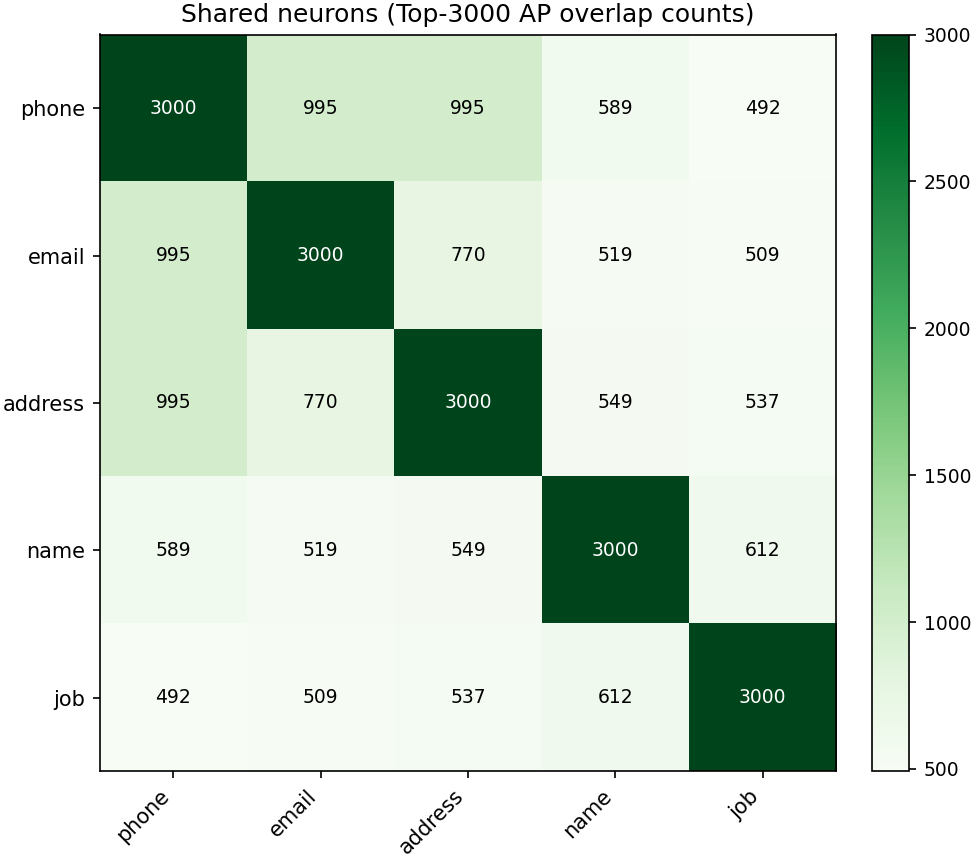

In [ ]:
#############for confusion metrics##################


RELATIONS = ["phone", "email", "address", "name","job"]

# ------------------------------------------------------------
# 1) TOP-K by AP per relation (NO contrast filtering)
# ------------------------------------------------------------
def topk_ap_for_relation(W, target, K):
    return W.sort_values(f"ap_{target}", ascending=False).head(K).copy()

tops = {}
sets = {}
sizes = {}

for r in RELATIONS:
    df_top = topk_ap_for_relation(W, r, K)
    tops[r] = df_top
    s = set(zip(df_top["layer_num"].astype(int).values, df_top["unit"].astype(int).values))
    sets[r] = s
    sizes[r] = len(s)

print("Top-K set sizes:", sizes)

# ------------------------------------------------------------
# 2) Confusion-style overlap matrices
# ------------------------------------------------------------
def jaccard(a, b):
    inter = len(a & b)
    union = len(a | b)
    return inter / union if union else 0.0

def overlap_min(a, b):
    inter = len(a & b)
    m = min(len(a), len(b))
    return inter / m if m else 0.0

count_mat = pd.DataFrame(index=RELATIONS, columns=RELATIONS, dtype=int)
jacc_mat  = pd.DataFrame(index=RELATIONS, columns=RELATIONS, dtype=float)
omin_mat  = pd.DataFrame(index=RELATIONS, columns=RELATIONS, dtype=float)

for r1 in RELATIONS:
    for r2 in RELATIONS:
        inter = len(sets[r1] & sets[r2])
        count_mat.loc[r1, r2] = inter
        jacc_mat.loc[r1, r2]  = jaccard(sets[r1], sets[r2])
        omin_mat.loc[r1, r2]  = overlap_min(sets[r1], sets[r2])

print("\n=== Intersection counts ===")
display(count_mat)

print("\n=== Jaccard (inter/union) ===")
display(jacc_mat.round(4))

print("\n=== Overlap vs min(|A|,|B|) ===")
display(omin_mat.round(4))

# ------------------------------------------------------------
# 3) Plot like your reference (annotated heatmap)
# ------------------------------------------------------------
def plot_confusion_style_heatmap(df, title, cmap="Greens"):
    labels = list(df.index)
    A = df.to_numpy()

    # int-like display
    A_plot = np.round(A).astype(int)

    fig, ax = plt.subplots(figsize=(7, 6))
    im = ax.imshow(A_plot, cmap=cmap, aspect="equal")

    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))
    ax.set_xticklabels(labels, rotation=45, ha="right")
    ax.set_yticklabels(labels)
    ax.set_title(title)

    vmin = np.min(A_plot)
    vmax = np.max(A_plot)
    thresh = (vmin + vmax) / 2.0

    for i in range(A_plot.shape[0]):
        for j in range(A_plot.shape[1]):
            val = A_plot[i, j]
            color = "white" if val > thresh else "black"
            ax.text(j, i, f"{val}", ha="center", va="center", color=color, fontsize=9)

    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=9)

    plt.tight_layout()
    plt.show()

plot_confusion_style_heatmap(count_mat, f"Shared neurons (Top-{K} AP overlap counts)")







/tmp/ipython-input-2458282989.py:35: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  base = plt.cm.get_cmap(cmap_name, 256)


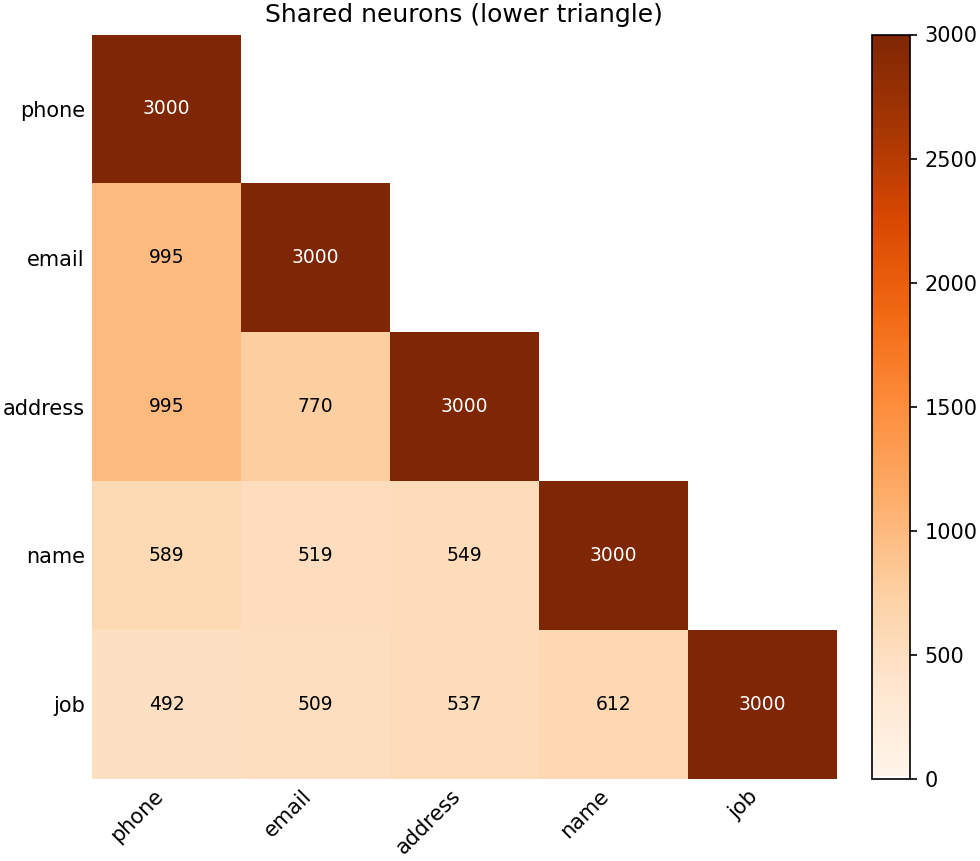

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def keep_lower_triangle(df, include_diag=True):
    """
    Keep lower triangle of a square DataFrame.
    include_diag=True  -> keep diagonal
    include_diag=False -> drop diagonal too
    """
    A = df.to_numpy(dtype=float)
    assert A.shape[0] == A.shape[1], "Matrix must be square"

    k = 1 if include_diag else 0   # k=1 masks above diagonal only; k=0 masks diagonal+above
    mask = np.triu(np.ones_like(A, dtype=bool), k=k)
    A[mask] = np.nan
    return pd.DataFrame(A, index=df.index, columns=df.columns)


def plot_confusion_half(df, title, cmap_name="Oranges"):
    labels = list(df.index)
    A = df.to_numpy(dtype=float)

    # values for scaling (ignore NaNs)
    vals = A[~np.isnan(A)]
    if vals.size == 0:
        raise ValueError("No valid values to plot (all NaNs).")

    vmin = 0
    vmax = np.percentile(vals, 98)  # broader range; change 98 -> 95 if you want even more contrast
    thresh = (vmin + vmax) / 2.0

    # colormap that starts from pure white
    base = plt.cm.get_cmap(cmap_name, 256)
    colors = base(np.linspace(0, 1, 256))
    colors[0] = np.array([1, 1, 1, 1])  # force first color to white
    cmap = mcolors.ListedColormap(colors)
    cmap.set_bad(color="white")         # NaNs -> white

    fig, ax = plt.subplots(figsize=(7, 6))

    # masked array so NaNs are not drawn as 0-cells
    A_masked = np.ma.masked_invalid(A)
    im = ax.imshow(A_masked, cmap=cmap, vmin=vmin, vmax=vmax, aspect="equal")

    # remove outer border/frame
    for spine in ax.spines.values():
        spine.set_visible(False)

    # ticks/labels
    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))
    ax.set_xticklabels(labels, rotation=45, ha="right")
    ax.set_yticklabels(labels)
    ax.tick_params(length=0)  # optional: remove tick marks
    ax.set_title(title)

    # write numbers (only where not NaN)
    for i in range(A.shape[0]):
        for j in range(A.shape[1]):
            if np.isnan(A[i, j]):
                continue
            val = int(round(A[i, j]))
            color = "white" if val > thresh else "black"
            ax.text(j, i, f"{val}", ha="center", va="center", color=color, fontsize=9)

    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    plt.tight_layout()
    plt.show()


# Example:
count_lower = keep_lower_triangle(count_mat, include_diag=True)
plot_confusion_half(count_lower, "Shared neurons (lower triangle)")


In [ ]:
PHONE = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_phone_test.csv"
JOB   = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_job_test.csv"
EMAIL = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_email_test.csv"
NAME  = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_name_test.csv"
ADDR  = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_address_test.csv"

## Including layer 32

Wide table shape: (135168, 7)

TARGET = phone | confusors = ['email', 'address', 'name', 'job'] | topK = 9000 | EXCLUDE_LAYER_32=False
        layer_num  unit  ap_phone  other_max_ap  contrast_ap  ap_email  \
86285          21   269  0.907750      0.541359     0.366391  0.511127   
90918          22   806  0.804609      0.443924     0.360685  0.393307   
92590          22  2478  0.905245      0.544921     0.360325  0.386326   
91497          22  1385  0.767839      0.425197     0.342643  0.408299   
105109         25  2709  0.730743      0.393847     0.336896  0.383585   
87409          21  1393  0.832080      0.505174     0.326905  0.460484   
87295          21  1279  0.736149      0.412273     0.323877  0.325648   
96686          23  2478  0.878108      0.572711     0.305396  0.461839   
95791          23  1583  0.858732      0.556459     0.302274  0.509231   
88494          21  2478  0.885640      0.586675     0.298965  0.442908   
109203         26  2707  0.893772      0.597705    

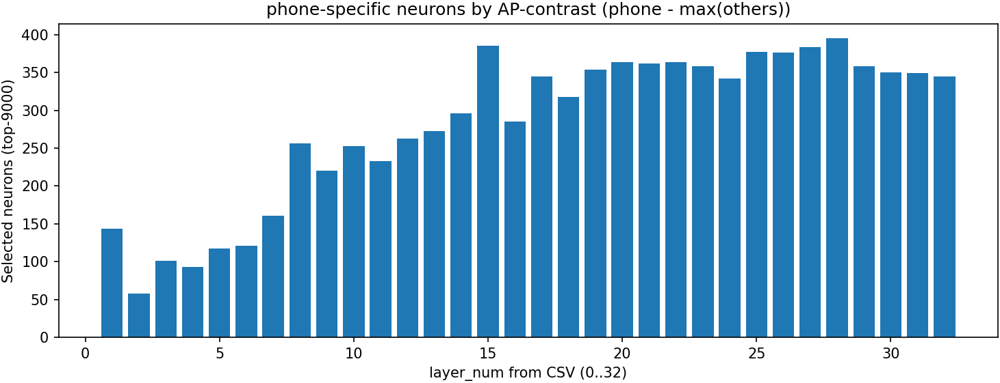

Mask summary:
  Total neurons: 9000
  Decoder layers used (0-based): [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11] ...

TARGET = email | confusors = ['phone', 'address', 'name', 'job'] | topK = 9000 | EXCLUDE_LAYER_32=False
        layer_num  unit  ap_email  other_max_ap  contrast_ap  ap_phone  \
101470         24  3166  0.965718      0.486602     0.479116  0.472134   
88343          21  2327  0.912480      0.473486     0.438993  0.473486   
85311          20  3391  0.888606      0.450527     0.438079  0.427163   
92072          22  1960  0.929586      0.491789     0.437797  0.491789   
88753          21  2737  0.823221      0.388828     0.434393  0.388828   
80151          19  2327  0.956185      0.522238     0.433947  0.522238   
76334          18  2606  0.986808      0.561176     0.425632  0.561176   
87814          21  1798  0.923552      0.500346     0.423206  0.453349   
67685          16  2149  0.933478      0.510293     0.423185  0.453511   
87723          21  1707  0.916691      0.49

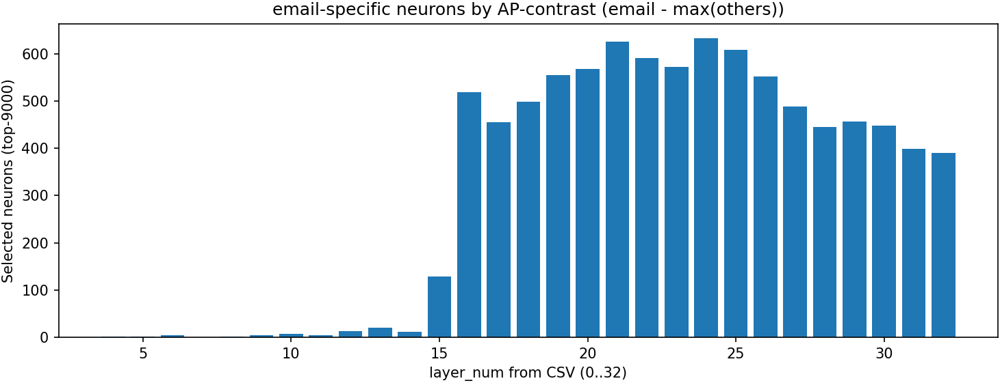

Mask summary:
  Total neurons: 9000
  Decoder layers used (0-based): [3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15] ...

TARGET = address | confusors = ['phone', 'email', 'name', 'job'] | topK = 9000 | EXCLUDE_LAYER_32=False
        layer_num  unit  ap_address  other_max_ap  contrast_ap  ap_phone  \
99170          24   866    0.899767      0.446531     0.453236  0.421832   
95074          23   866    0.892364      0.441434     0.450929  0.417310   
90978          22   866    0.884872      0.438305     0.446567  0.416090   
103266         25   866    0.894672      0.459361     0.435311  0.433904   
107362         26   866    0.881079      0.472147     0.408932  0.436949   
86882          21   866    0.864272      0.458403     0.405869  0.458403   
82786          20   866    0.891083      0.499340     0.391743  0.499340   
111458         27   866    0.883873      0.501100     0.382773  0.439086   
81271          19  3447    0.843652      0.482719     0.360933  0.431840   
78698          19  

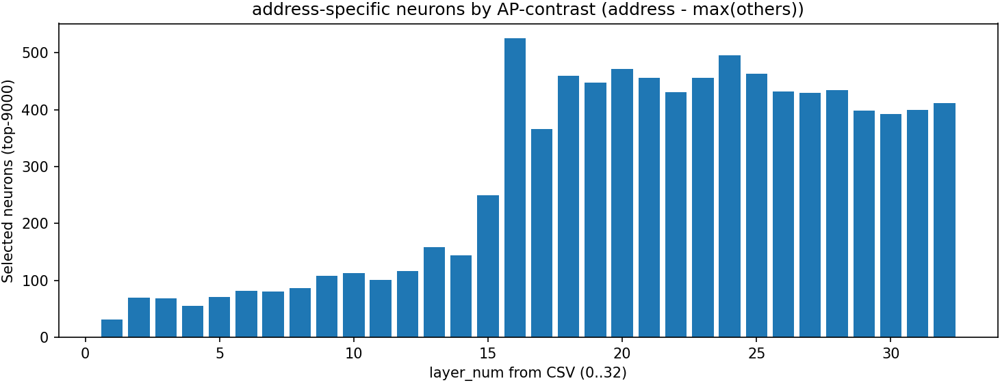

Mask summary:
  Total neurons: 9000
  Decoder layers used (0-based): [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11] ...

TARGET = name | confusors = ['phone', 'email', 'address', 'job'] | topK = 9000 | EXCLUDE_LAYER_32=False
        layer_num  unit   ap_name  other_max_ap  contrast_ap  ap_phone  \
81533          19  3709  0.822320      0.469384     0.352937  0.325734   
74418          18   690  0.853460      0.515665     0.337794  0.515665   
77505          18  3777  0.868161      0.540844     0.327317  0.439793   
75753          18  2025  0.783019      0.467481     0.315538  0.349504   
97871          23  3663  0.771538      0.461766     0.309772  0.416646   
83292          20  1372  0.744152      0.438208     0.305944  0.357280   
87022          21  1006  0.754526      0.449644     0.304882  0.414057   
90006          21  3990  0.736076      0.433789     0.302286  0.348825   
71166          17  1534  0.826844      0.525637     0.301207  0.482277   
99827          24  1523  0.856927      0.55

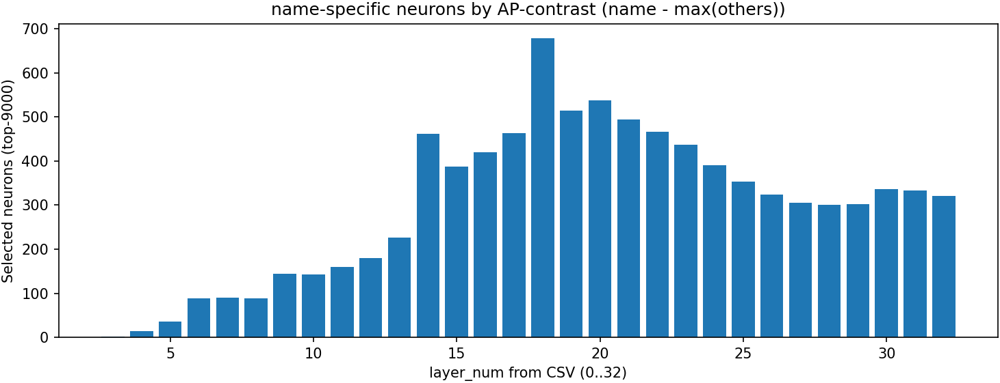

Mask summary:
  Total neurons: 9000
  Decoder layers used (0-based): [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13] ...

TARGET = job | confusors = ['phone', 'email', 'address', 'name'] | topK = 9000 | EXCLUDE_LAYER_32=False
        layer_num  unit    ap_job  other_max_ap  contrast_ap  ap_phone  \
119271         29   487  0.721524      0.438598     0.282926  0.438598   
123367         30   487  0.747495      0.472508     0.274986  0.439979   
85766          20  3846  0.633573      0.366293     0.267280  0.342887   
87962          21  1946  0.665404      0.415844     0.249560  0.338288   
124946         30  2066  0.628925      0.383054     0.245870  0.383054   
115175         28   487  0.691044      0.449076     0.241968  0.398460   
77592          18  3864  0.647932      0.412642     0.235289  0.408633   
111079         27   487  0.651069      0.421722     0.229347  0.390096   
124191         30  1311  0.762136      0.540406     0.221730  0.390167   
87537          21  1521  0.644220      0.

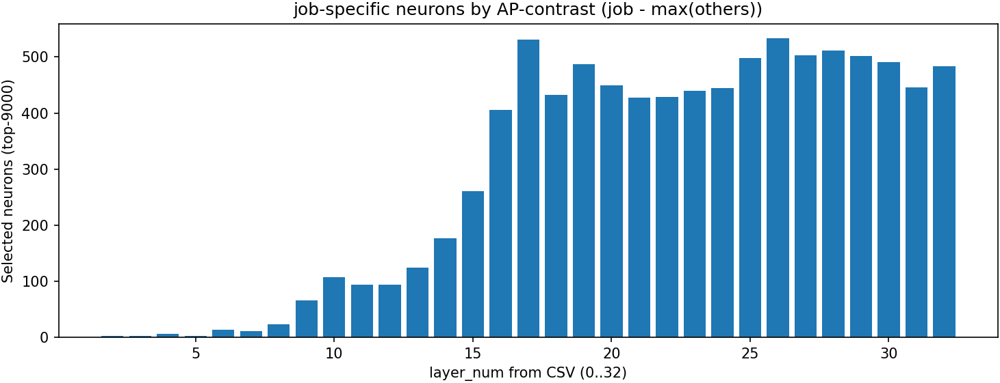

Mask summary:
  Total neurons: 9000
  Decoder layers used (0-based): [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] ...
Top-K set sizes: {'phone': 9000, 'email': 9000, 'address': 9000, 'name': 9000, 'job': 9000}

=== Intersection counts ===


,phone,email,address,name,job
phone,9000.0,4020.0,4061.0,2834.0,2584.0
email,4020.0,9000.0,3604.0,2724.0,2773.0
address,4061.0,3604.0,9000.0,2733.0,2863.0
name,2834.0,2724.0,2733.0,9000.0,3037.0
job,2584.0,2773.0,2863.0,3037.0,9000.0



=== Jaccard (inter/union) ===


,phone,email,address,name,job
phone,1.0000,0.2876,0.2913,0.1869,0.1676
email,0.2876,1.0000,0.2503,0.1783,0.1821
address,0.2913,0.2503,1.0000,0.1790,0.1891
name,0.1869,0.1783,0.1790,1.0000,0.2030
job,0.1676,0.1821,0.1891,0.2030,1.0000



=== Overlap vs min(|A|,|B|) ===


,phone,email,address,name,job
phone,1.0000,0.4467,0.4512,0.3149,0.2871
email,0.4467,1.0000,0.4004,0.3027,0.3081
address,0.4512,0.4004,1.0000,0.3037,0.3181
name,0.3149,0.3027,0.3037,1.0000,0.3374
job,0.2871,0.3081,0.3181,0.3374,1.0000


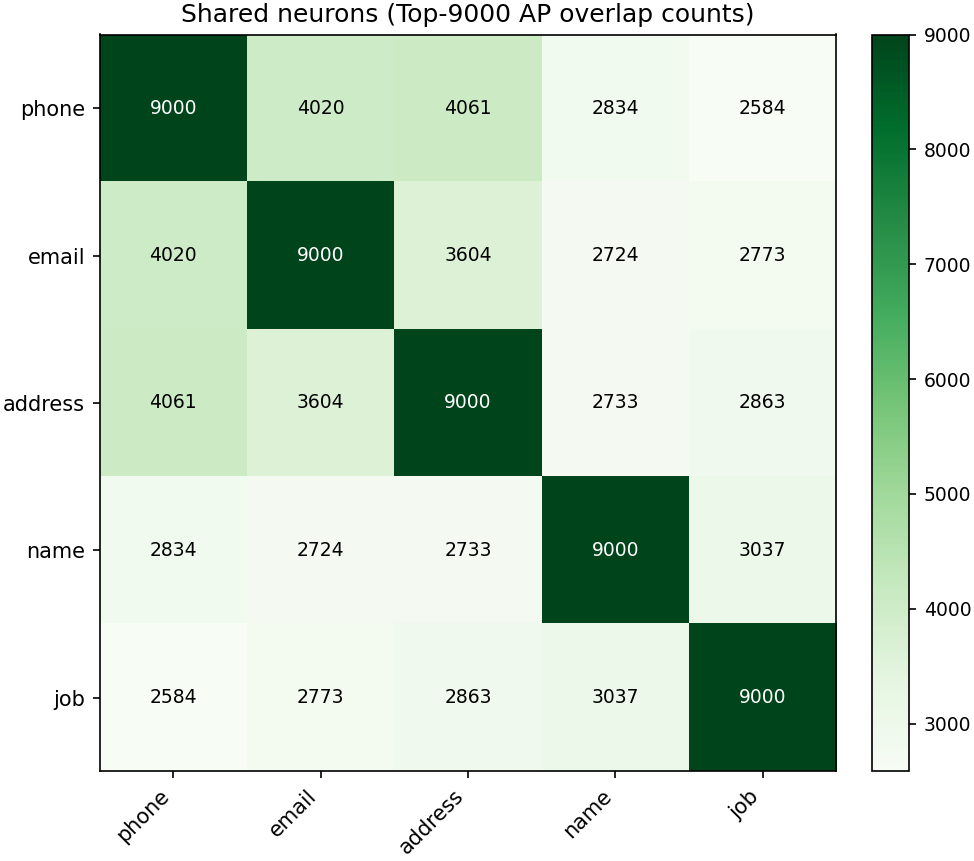

Top-K layer-32 sizes: {'phone': 351, 'email': 304, 'address': 332, 'name': 451}

=== Shared neurons ONLY from layer 32 (intersection counts) ===


,phone,email,address,name
phone,351.0,115.0,143.0,117.0
email,115.0,304.0,100.0,120.0
address,143.0,100.0,332.0,106.0
name,117.0,120.0,106.0,451.0


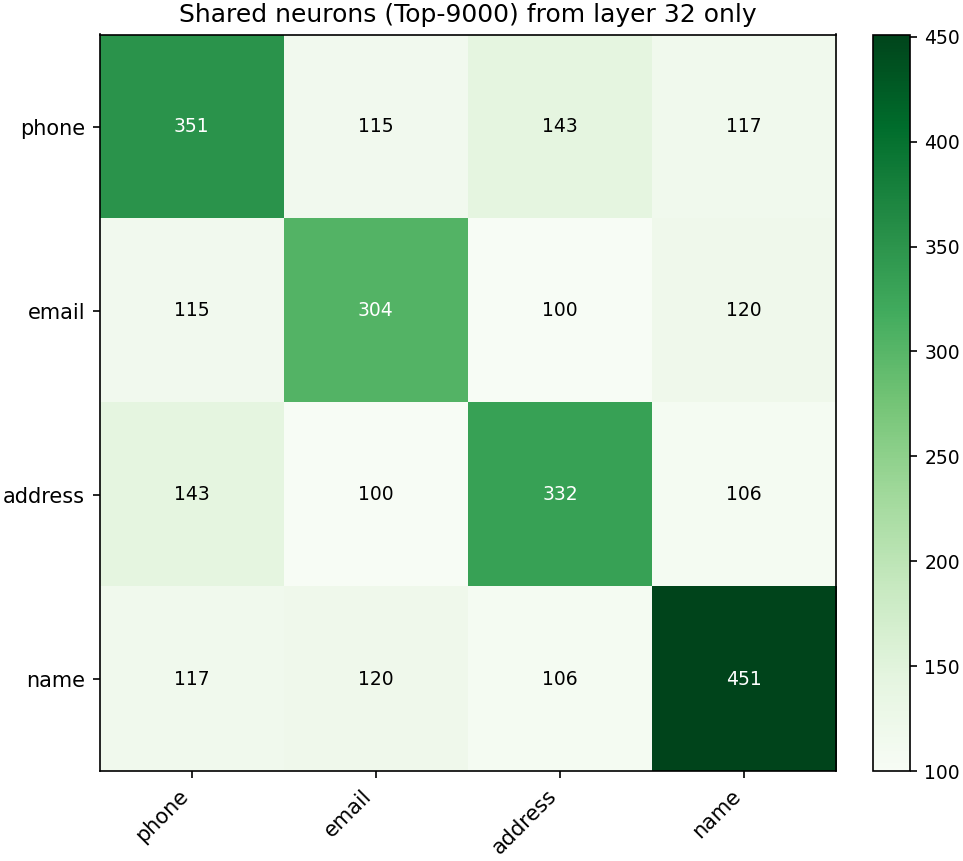

In [ ]:
import pandas as pd
import numpy as np
import torch
import matplotlib.pyplot as plt

# -------------------------
# CONFIG
# -------------------------
K = 9000
EXCLUDE_LAYER_32 = False  # set True to drop layer_32
REL_CSV = {
    "phone":   PHONE,   # path to expertise_phone_test.csv
    "email":   EMAIL,
    "address": ADDR,
    "name":    NAME,
    "job": JOB
    # job intentionally excluded
}

# -------------------------
# LOAD helper (same as yours)
# -------------------------
def load_expertise_ap(path, rel):
    df = pd.read_csv(path)
    assert {"layer","unit","ap"}.issubset(df.columns)

    df["layer_num"] = df["layer"].astype(str).str.extract(r"(\d+)").astype(int)  # 0..32
    df = df[["layer_num", "unit", "ap"]].copy()
    df = df.rename(columns={"ap": f"ap_{rel}"})

    if df.duplicated(["layer_num","unit"]).any():
        df = df.groupby(["layer_num","unit"], as_index=False).mean(numeric_only=True)

    return df

# -------------------------
# Build W for {phone,email,address,name}
# -------------------------
dfs = {r: load_expertise_ap(p, r) for r, p in REL_CSV.items()}

# inner-merge across all four so every row has all four APs
W = dfs["phone"]
for r in ["email", "address", "name","job"]:
    W = W.merge(dfs[r], on=["layer_num","unit"], how="inner")

print("Wide table shape:", W.shape)

if EXCLUDE_LAYER_32:
    W = W[W["layer_num"] != 32].copy()

# -------------------------
# Core: get top-K for a target relation vs confusors (others)
# -------------------------
def topk_contrast_for_relation(W, target, K):
    other_rels = [r for r in ["phone","email","address","name","job"] if r != target]
    other_cols = [f"ap_{r}" for r in other_rels]
    tgt_col = f"ap_{target}"

    df = W.copy()
    df["other_max_ap"] = df[other_cols].max(axis=1)
    df["contrast_ap"]  = df[tgt_col] - df["other_max_ap"]

    # keep only neurons where target >= max(other)
    df = df[df["contrast_ap"] >= 0].copy()

    df_top = df.sort_values("contrast_ap", ascending=False).head(K).copy()
    return df_top, other_rels

def build_decoder_mask_from_top(df_top):
    mask = {}
    for L, g in df_top.groupby("layer_num"):
        L = int(L)
        if L == 0:
            continue  # skip embeddings output
        decoder_idx = L - 1  # 1..32 -> 0..31
        if 0 <= decoder_idx <= 31:
            mask[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)
    return mask

# -------------------------
# Run for each relation (except job)
# -------------------------
masks = {}       # relation -> mask dict
tops  = {}       # relation -> topK dataframe

for target in ["phone","email","address","name","job"]:
    df_top, confs = topk_contrast_for_relation(W, target, K)
    tops[target] = df_top
    masks[target] = build_decoder_mask_from_top(df_top)

    print("\n" + "="*90)
    print(f"TARGET = {target} | confusors = {confs} | topK = {K} | EXCLUDE_LAYER_32={EXCLUDE_LAYER_32}")
    show_cols = ["layer_num","unit", f"ap_{target}", "other_max_ap", "contrast_ap"] + [f"ap_{r}" for r in confs]
    print(df_top[show_cols].head(20))

    # Plot layer distribution
    cnt = df_top["layer_num"].value_counts().sort_index()
    plt.figure(figsize=(10,4))
    plt.bar(cnt.index.astype(int), cnt.values)
    plt.xlabel("layer_num from CSV (0..32)")
    plt.ylabel(f"Selected neurons (top-{K})")
    plt.title(f"{target}-specific neurons by AP-contrast ({target} - max(others))")
    plt.tight_layout()
    plt.show()

    # Mask summary
    total_neurons = sum(len(v) for v in masks[target].values())
    used_layers = sorted(masks[target].keys())
    print("Mask summary:")
    print("  Total neurons:", total_neurons)
    print("  Decoder layers used (0-based):", used_layers[:12], "..." if len(used_layers) > 12 else "")

















#############for confusion metrics##################


RELATIONS = ["phone", "email", "address", "name","job"]

# ------------------------------------------------------------
# 1) TOP-K by AP per relation (NO contrast filtering)
# ------------------------------------------------------------
def topk_ap_for_relation(W, target, K):
    return W.sort_values(f"ap_{target}", ascending=False).head(K).copy()

tops = {}
sets = {}
sizes = {}

for r in RELATIONS:
    df_top = topk_ap_for_relation(W, r, K)
    tops[r] = df_top
    s = set(zip(df_top["layer_num"].astype(int).values, df_top["unit"].astype(int).values))
    sets[r] = s
    sizes[r] = len(s)

print("Top-K set sizes:", sizes)

# ------------------------------------------------------------
# 2) Confusion-style overlap matrices
# ------------------------------------------------------------
def jaccard(a, b):
    inter = len(a & b)
    union = len(a | b)
    return inter / union if union else 0.0

def overlap_min(a, b):
    inter = len(a & b)
    m = min(len(a), len(b))
    return inter / m if m else 0.0

count_mat = pd.DataFrame(index=RELATIONS, columns=RELATIONS, dtype=int)
jacc_mat  = pd.DataFrame(index=RELATIONS, columns=RELATIONS, dtype=float)
omin_mat  = pd.DataFrame(index=RELATIONS, columns=RELATIONS, dtype=float)

for r1 in RELATIONS:
    for r2 in RELATIONS:
        inter = len(sets[r1] & sets[r2])
        count_mat.loc[r1, r2] = inter
        jacc_mat.loc[r1, r2]  = jaccard(sets[r1], sets[r2])
        omin_mat.loc[r1, r2]  = overlap_min(sets[r1], sets[r2])

print("\n=== Intersection counts ===")
display(count_mat)

print("\n=== Jaccard (inter/union) ===")
display(jacc_mat.round(4))

print("\n=== Overlap vs min(|A|,|B|) ===")
display(omin_mat.round(4))

# ------------------------------------------------------------
# 3) Plot like your reference (annotated heatmap)
# ------------------------------------------------------------
def plot_confusion_style_heatmap(df, title, cmap="Greens"):
    labels = list(df.index)
    A = df.to_numpy()

    # int-like display
    A_plot = np.round(A).astype(int)

    fig, ax = plt.subplots(figsize=(7, 6))
    im = ax.imshow(A_plot, cmap=cmap, aspect="equal")

    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))
    ax.set_xticklabels(labels, rotation=45, ha="right")
    ax.set_yticklabels(labels)
    ax.set_title(title)

    vmin = np.min(A_plot)
    vmax = np.max(A_plot)
    thresh = (vmin + vmax) / 2.0

    for i in range(A_plot.shape[0]):
        for j in range(A_plot.shape[1]):
            val = A_plot[i, j]
            color = "white" if val > thresh else "black"
            ax.text(j, i, f"{val}", ha="center", va="center", color=color, fontsize=9)

    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=9)

    plt.tight_layout()
    plt.show()

plot_confusion_style_heatmap(count_mat, f"Shared neurons (Top-{K} AP overlap counts)")




LAYER_ONLY = 32
RELATIONS = ["phone", "email", "address", "name"]

# Build layer-32-only sets for each relation
sets32 = {}
sizes32 = {}
for r in RELATIONS:
    df = tops[r]
    df32 = df[df["layer_num"] == LAYER_ONLY]
    s32 = set(zip(df32["layer_num"].astype(int).values, df32["unit"].astype(int).values))
    sets32[r] = s32
    sizes32[r] = len(s32)

print(f"Top-K layer-{LAYER_ONLY} sizes:", sizes32)

# Pairwise intersection counts on layer-32 only
count32 = pd.DataFrame(index=RELATIONS, columns=RELATIONS, dtype=int)
for r1 in RELATIONS:
    for r2 in RELATIONS:
        count32.loc[r1, r2] = len(sets32[r1] & sets32[r2])

print(f"\n=== Shared neurons ONLY from layer {LAYER_ONLY} (intersection counts) ===")
display(count32)

# Optional: heatmap (same style)
plot_confusion_style_heatmap(count32, f"Shared neurons (Top-{K}) from layer {LAYER_ONLY} only")


# Only Phone form here

Wide table shape: (135168, 7)

Top-20 phone-specific neurons (AP-contrast):
        layer_num  unit  ap_phone  other_max_ap  contrast_ap    ap_job  \
86285          21   269  0.907750      0.541359     0.366391  0.541359   
90918          22   806  0.804609      0.443924     0.360685  0.438394   
92590          22  2478  0.905245      0.544921     0.360325  0.540789   
91497          22  1385  0.767839      0.425197     0.342643  0.355960   
105109         25  2709  0.730743      0.393847     0.336896  0.393847   
87409          21  1393  0.832080      0.505174     0.326905  0.483175   
87295          21  1279  0.736149      0.412273     0.323877  0.412273   
96686          23  2478  0.878108      0.572711     0.305396  0.557394   
95791          23  1583  0.858732      0.556459     0.302274  0.556459   
88494          21  2478  0.885640      0.586675     0.298965  0.586675   
109203         26  2707  0.893772      0.597705     0.296067  0.597705   
101013         24  2709  0.758378   

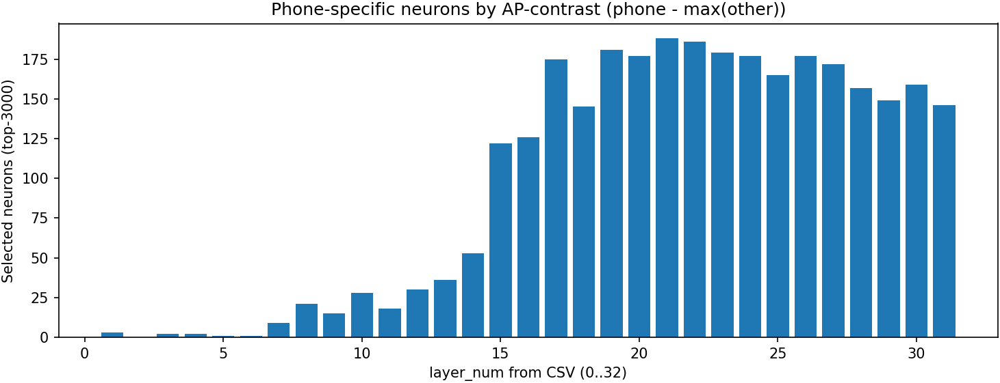


Mask summary:
Total neurons: 3000
Decoder layers used (0-based): [0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] ...


In [ ]:
# =========================
# PATHS (EDIT THESE)
# =========================
PHONE = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_phone_test.csv"
JOB   = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_job_test.csv"
EMAIL = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_email_test.csv"
NAME  = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_name_test.csv"
ADDR  = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_address_test.csv"

K = 3000
EXCLUDE_LAYER_32 = True  # layer_32 is last decoder layer output in your expertise CSV

# =========================
# LOAD (NO 'layer' column kept => no merge conflicts)
# =========================
def load_expertise_ap(path, rel):
    df = pd.read_csv(path)
    assert {"layer","unit","ap"}.issubset(df.columns)

    # layer is like "layer_00" ... "layer_32"
    df["layer_num"] = df["layer"].astype(str).str.extract(r"(\d+)").astype(int)  # 0..32
    df = df[["layer_num", "unit", "ap"]].copy()
    df = df.rename(columns={"ap": f"ap_{rel}"})

    # safety: ensure unique key
    if df.duplicated(["layer_num","unit"]).any():
        df = df.groupby(["layer_num","unit"], as_index=False).mean(numeric_only=True)

    return df

df_p = load_expertise_ap(PHONE, "phone")
df_j = load_expertise_ap(JOB,   "job")
df_e = load_expertise_ap(EMAIL, "email")
df_n = load_expertise_ap(NAME,  "name")
df_a = load_expertise_ap(ADDR,  "address")

# Merge on (layer_num, unit)
W = df_p.merge(df_j, on=["layer_num","unit"], how="inner") \
       .merge(df_e, on=["layer_num","unit"], how="inner") \
       .merge(df_n, on=["layer_num","unit"], how="inner") \
       .merge(df_a, on=["layer_num","unit"], how="inner")

print("Wide table shape:", W.shape)

# =========================
# Optional: exclude layer_32 (decoder last layer output)
# =========================
if EXCLUDE_LAYER_32:
    W = W[W["layer_num"] != 32].copy()

# =========================
# Phone-specific contrast score
# =========================
other_cols = ["ap_job","ap_email","ap_name","ap_address"]
W["other_max_ap"] = W[other_cols].max(axis=1)
W["contrast_ap"]  = W["ap_phone"] - W["other_max_ap"]

# Keep only neurons where phone >= max(other)
W = W[W["contrast_ap"] >= 0].copy()

W_top = W.sort_values("contrast_ap", ascending=False).head(K).copy()

print("\nTop-20 phone-specific neurons (AP-contrast):")
print(W_top[["layer_num","unit","ap_phone","other_max_ap","contrast_ap"] + other_cols].head(20))

# =========================
# Plot layer distribution
# =========================
cnt = W_top["layer_num"].value_counts().sort_index()
plt.figure(figsize=(10,4))
plt.bar(cnt.index.astype(int), cnt.values)
plt.xlabel("layer_num from CSV (0..32)")
plt.ylabel(f"Selected neurons (top-{K})")
plt.title("Phone-specific neurons by AP-contrast (phone - max(other))")
plt.tight_layout()
plt.show()

# =========================
# Build decoder-layer mask
# IMPORTANT mapping:
# layer_num 0 is embeddings output (layer_00) -> skip
# layer_num 1..32 corresponds to decoder layers 0..31  (decoder_idx = layer_num - 1)
# =========================
mask_phone_specific = {}
for L, g in W_top.groupby("layer_num"):
    L = int(L)
    if L == 0:
        continue  # skip embeddings
    decoder_idx = L - 1  # 1..32 -> 0..31
    if 0 <= decoder_idx <= 31:
        mask_phone_specific[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)

print("\nMask summary:")
print("Total neurons:", sum(len(v) for v in mask_phone_specific.values()))
print("Decoder layers used (0-based):", sorted(mask_phone_specific.keys())[:12], "...")


In [ ]:
# Strictly greater / tie / less
n_total = len(W)
n_strict = (W["contrast_ap"] > 0).sum()
n_tie    = (W["contrast_ap"] == 0).sum()
n_ge     = (W["contrast_ap"] >= 0).sum()
n_less   = (W["contrast_ap"] < 0).sum()

print(f"Total neurons compared: {n_total}")
print(f"Phone strictly greater than all others: {n_strict} ({n_strict/n_total:.2%})")
print(f"Ties (phone == max(other)): {n_tie} ({n_tie/n_total:.2%})")
print(f"Phone >= max(other): {n_ge} ({n_ge/n_total:.2%})")
print(f"Phone < max(other): {n_less} ({n_less/n_total:.2%})")

Total neurons compared: 24968
Phone strictly greater than all others: 24968 (100.00%)
Ties (phone == max(other)): 0 (0.00%)
Phone >= max(other): 24968 (100.00%)
Phone < max(other): 0 (0.00%)


In [ ]:
len(W)

24968

Neuron sharing in layer 32 if needed in future.(Previously we were excluding layer 32)

#Mask and hook building

In [ ]:
import torch
import pandas as pd
import numpy as np

# W_top must contain: layer_num, unit, contrast_ap (from your AP-confusor selection)
K = 8000

EXCLUDE_32 = True

Wk = W.sort_values("contrast_ap", ascending=False).head(K).copy()
if EXCLUDE_32:
    Wk = Wk[Wk["layer_num"] != 32].copy()

mask_ap = {}
for L, g in Wk.groupby("layer_num"):
    L = int(L)
    if L == 0:
        continue
    decoder_idx = L - 1  # layer_num 1..32 -> decoder 0..31
    if 0 <= decoder_idx <= 31:
        mask_ap[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)

print("Mask neurons:", sum(len(v) for v in mask_ap.values()))
print("Decoder layers used:", sorted(mask_ap.keys()))

Mask neurons: 8000
Decoder layers used: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]


In [ ]:
import numpy as np
import torch

K = 3000
EXCLUDE_32 = True
TARGET = "phone"

other_rels = [r for r in ["phone","email","address","name"] if r != TARGET]
other_cols = [f"ap_{r}" for r in other_rels]

W2 = W.copy()
W2["other_max_ap"] = W2[other_cols].max(axis=1)
W2["contrast_ap"]  = W2[f"ap_{TARGET}"] - W2["other_max_ap"]

# keep only target >= max(other)  (optional but usually intended for "specific")
W2 = W2[W2["contrast_ap"] >= 0].copy()

Wk = W2.sort_values("contrast_ap", ascending=False).head(K).copy()
if EXCLUDE_32:
    Wk = Wk[Wk["layer_num"] != 32].copy()

mask_ap = {}
for L, g in Wk.groupby("layer_num"):
    L = int(L)
    if L == 0:
        continue
    decoder_idx = L - 1
    if 0 <= decoder_idx <= 31:
        mask_ap[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)

print("Mask neurons:", sum(len(v) for v in mask_ap.values()))
print("Decoder layers used:", sorted(mask_ap.keys()))

Mask neurons: 3000
Decoder layers used: [0, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]


In [ ]:
import re
import torch
import numpy as np
from collections import defaultdict

# ---------------------------------------------------------
# 1) Utilities you already use (keep these)
# ---------------------------------------------------------
def clean_pred(pred: str) -> str:
    pred = pred.strip()
    pred = pred.replace("\uFFFD", "")
    pred = pred.replace("\x00", "")
    pred = re.sub(r"\s+$", "", pred)
    pred = pred.splitlines()[0].strip() if pred else ""
    return pred

def strip_last_assistant(conversations):
    conv = list(conversations)
    if conv and conv[-1].get("role") == "assistant":
        conv = conv[:-1]
    return conv

def extract_question(conv):
    for m in conv:
        if m["role"] == "user" and "### Question:" in m["content"]:
            text = m["content"]
            return text.split("### Question:")[1].split("### Instruction:")[0].strip()
    return ""

def extract_gold(conv):
    for m in conv:
        if m["role"] == "assistant":
            return (m["content"] or "").strip()
    return ""

def field_bucket(question):
    q = question.lower()
    if "email" in q: return "email"
    if "phone" in q: return "phone"
    if "address" in q: return "address"
    if "job" in q: return "job"
    if "full name" in q or "person's name" in q: return "name"
    return "other"


# ---------------------------------------------------------
# 2) Hook builders (ZERO and SANE)
# ---------------------------------------------------------
class AblationHooks:
    """
    Context manager that registers forward hooks on selected decoder layers
    to modify the layer output hidden states.
    """

    def __init__(self, model, mask=None, mode="zero", beta=0.65, device=None):
        """
        mask: dict[int -> torch.LongTensor units]  (decoder layer idx -> unit ids)
        mode: "zero" or "sane"
        beta: for sane/scaled-sign. scaling = 1 - 2*beta (beta in [0,1])
              beta=0.5 -> no change; beta=1 -> full sign flip (-1)
        """
        self.model = model
        self.mask = mask or {}
        self.mode = mode
        self.beta = beta
        self.handles = []
        self.device = device or ("cuda" if torch.cuda.is_available() else "cpu")

        # scale factor: 1 - 2*beta
        self.scale = 1.0 - 2.0 * float(beta)

    def _hook_fn(self, layer_idx):
        units = self.mask[layer_idx]  # LongTensor [k]
        def hook(module, inp, out):
            # LlamaDecoderLayer returns a tensor [B, T, H] or tuple; handle both
            if isinstance(out, tuple):
                hs = out[0]
                rest = out[1:]
            else:
                hs = out
                rest = None

            # IMPORTANT: edit copy in-place on hs
            # hs shape: [B,T,H]
            if hs is None:
                return out

            # Ensure units on correct device
            u = units.to(hs.device)

            if self.mode == "zero":
                # set selected dimensions to zero
                hs[..., u] = 0.0

            elif self.mode == "sane":
                # scaled sign flip: hs = scale * hs on selected dims
                # beta=0.65 -> scale = 1 - 1.3 = -0.3 (partial flip)
                hs[..., u] = self.scale * hs[..., u]

            else:
                raise ValueError(f"Unknown mode: {self.mode}")

            if rest is None:
                return hs
            else:
                return (hs, *rest)
        return hook

    def __enter__(self):
        # Llama decoder layers are at model.model.layers
        layers = self.model.model.layers
        for layer_idx, units in self.mask.items():
            if layer_idx < 0 or layer_idx >= len(layers):
                continue
            handle = layers[layer_idx].register_forward_hook(self._hook_fn(layer_idx))
            self.handles.append(handle)
        return self

    def __exit__(self, exc_type, exc, tb):
        for h in self.handles:
            h.remove()
        self.handles = []


# ---------------------------------------------------------
# 3) Prediction (generation) with optional ablation hooks
# ---------------------------------------------------------
def predict_one(conversations, model, tokenizer, max_new_tokens=32,
                mask=None, mode=None, beta=0.65):
    """
    If mode is None => no ablation.
    mode: "zero" or "sane"
    """
    conv_prompt = strip_last_assistant(conversations)

    prompt = tokenizer.apply_chat_template(
        conv_prompt,
        tokenize=False,
        add_generation_prompt=True,
    )
    inputs = tokenizer(prompt, return_tensors="pt", truncation=True).to(model.device)

    ctx = AblationHooks(model, mask=mask, mode=mode, beta=beta) if mode else None
    if ctx:
        ctx.__enter__()
    try:
        with torch.no_grad():
            out = model.generate(
                **inputs,
                max_new_tokens=max_new_tokens,
                do_sample=False,
                temperature=None,
                top_p=None,
                use_cache=True,
            )
        gen_tokens = out[0, inputs["input_ids"].shape[1]:]
        pred = tokenizer.decode(gen_tokens, skip_special_tokens=True)
        return clean_pred(pred)
    finally:
        if ctx:
            ctx.__exit__(None, None, None)


# ---------------------------------------------------------
# 4) Evaluation on ds["test"] (EM per relation)
# ---------------------------------------------------------
def eval_em(ds_split, model, tokenizer, n_per_relation=20, mask=None,
            mode=None, beta=0.65, max_new_tokens=16):
    """
    Returns dict: EM per field (email/phone/address/job/name)
    """
    buckets = defaultdict(list)
    for ex in ds_split:
        conv = ex["conversations"]
        q = extract_question(conv)
        f = field_bucket(q)
        if f in ["email","phone","address","job","name"]:
            buckets[f].append(ex)

    results = {}
    for f in ["address","email","job","name","phone"]:
        examples = buckets[f][:n_per_relation]
        if len(examples) == 0:
            results[f] = float("nan")
            continue

        correct = 0
        for ex in examples:
            conv = ex["conversations"]
            gold = clean_pred(extract_gold(conv))
            pred = predict_one(conv, model, tokenizer,
                               max_new_tokens=max_new_tokens,
                               mask=mask, mode=mode, beta=beta)
            if pred == gold:
                correct += 1
        results[f] = correct / len(examples)
    return results


# ---------------------------------------------------------
# 5) Convenience wrappers
# ---------------------------------------------------------
def eval_em_zero(ds_split, model, tokenizer, n_per_relation=20, mask=None, max_new_tokens=16):
    return eval_em(ds_split, model, tokenizer, n_per_relation=n_per_relation,
                   mask=mask, mode="zero", beta=0.65, max_new_tokens=max_new_tokens)

def eval_em_sane(ds_split, model, tokenizer, n_per_relation=20, mask=None, beta=0.65, max_new_tokens=16):
    # "sane" here means scaled-sign flip on selected neurons
    return eval_em(ds_split, model, tokenizer, n_per_relation=n_per_relation,
                   mask=mask, mode="sane", beta=beta, max_new_tokens=max_new_tokens)


# testing some results (dont need to run)

In [ ]:
N = 200
baseline = eval_em(ds["test"], model, tokenizer, n_per_relation=N, mask=None, mode=None)
print("BASELINE:", baseline)


BASELINE: {'address': 1.0, 'email': 0.995, 'job': 0.985, 'name': 1.0, 'phone': 1.0}


In [ ]:
res_zero = eval_em_zero(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap)
print("ZERO:", res_zero)


ZERO: {'address': 1.0, 'email': 0.99, 'job': 0.99, 'name': 1.0, 'phone': 0.995}


In [ ]:
BETAS = [0.2]
for b in BETAS:
    res = eval_em_sane(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap, beta=b)
    print(f"SANE beta={b:.2f} (scale={1-2*b:.2f}):", res)


SANE beta=0.20 (scale=0.60): {'address': 0.995, 'email': 0.995, 'job': 0.975, 'name': 1.0, 'phone': 0.995}


In [ ]:
BETAS = [0.4]
for b in BETAS:
    res = eval_em_sane(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap, beta=b)
    print(f"SANE beta={b:.2f} (scale={1-2*b:.2f}):", res)


SANE beta=0.40 (scale=0.20): {'address': 1.0, 'email': 0.995, 'job': 0.97, 'name': 1.0, 'phone': 0.985}


In [ ]:
BETAS = [0.6]
for b in BETAS:
    res = eval_em_sane(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap, beta=b)
    print(f"SANE beta={b:.2f} (scale={1-2*b:.2f}):", res)


SANE beta=0.60 (scale=-0.20): {'address': 0.98, 'email': 0.97, 'job': 0.95, 'name': 1.0, 'phone': 0.98}


In [ ]:
BETAS = [0.8]
for b in BETAS:
    res = eval_em_sane(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap, beta=b)
    print(f"SANE beta={b:.2f} (scale={1-2*b:.2f}):", res)


SANE beta=0.80 (scale=-0.60): {'address': 0.845, 'email': 0.865, 'job': 0.5, 'name': 0.99, 'phone': 0.86}


In [ ]:
# BETAS = [0.6]
# for b in BETAS:
#     res = eval_em_sane(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap, beta=b)
#     print(f"SANE beta={b:.2f} (scale={1-2*b:.2f}):", res)


SANE beta=0.60 (scale=-0.20): {'address': 0.28, 'email': 0.205, 'job': 0.0, 'name': 0.705, 'phone': 0.095}


In [ ]:
#k=9000

BETAS = [0.6]
for b in BETAS:
    res = eval_em_sane(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap, beta=b)
    print(f"SANE beta={b:.2f} (scale={1-2*b:.2f}):", res)

res_zero = eval_em_zero(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap)
print("ZERO:", res_zero)



SANE beta=0.60 (scale=-0.20): {'address': 0.77, 'email': 0.62, 'job': 0.49, 'name': 0.625, 'phone': 0.62}
ZERO: {'address': 0.93, 'email': 0.83, 'job': 0.83, 'name': 0.925, 'phone': 0.9}


In [ ]:
import torch
import pandas as pd
import numpy as np

# W_top must contain: layer_num, unit, contrast_ap (from your AP-confusor selection)
K = 8000

EXCLUDE_32 = True

Wk = W.sort_values("contrast_ap", ascending=False).head(K).copy()
if EXCLUDE_32:
    Wk = Wk[Wk["layer_num"] != 32].copy()

mask_ap = {}
for L, g in Wk.groupby("layer_num"):
    L = int(L)
    if L == 0:
        continue
    decoder_idx = L - 1  # layer_num 1..32 -> decoder 0..31
    if 0 <= decoder_idx <= 31:
        mask_ap[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)

print("Mask neurons:", sum(len(v) for v in mask_ap.values()))
print("Decoder layers used:", sorted(mask_ap.keys()))

Mask neurons: 8000
Decoder layers used: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]


In [ ]:

BETAS = [0.6]
for b in BETAS:
    res = eval_em_sane(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap, beta=b)
    print(f"SANE beta={b:.2f} (scale={1-2*b:.2f}):", res)


res_zero = eval_em_zero(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap)
print("ZERO:", res_zero)


SANE beta=0.60 (scale=-0.20): {'address': 0.875, 'email': 0.785, 'job': 0.7, 'name': 0.915, 'phone': 0.585}
ZERO: {'address': 0.945, 'email': 0.91, 'job': 0.9, 'name': 0.98, 'phone': 0.83}


In [ ]:
##7000
import torch
import pandas as pd
import numpy as np

# W_top must contain: layer_num, unit, contrast_ap (from your AP-confusor selection)
K = 7000

EXCLUDE_32 = True

Wk = W.sort_values("contrast_ap", ascending=False).head(K).copy()
if EXCLUDE_32:
    Wk = Wk[Wk["layer_num"] != 32].copy()

mask_ap = {}
for L, g in Wk.groupby("layer_num"):
    L = int(L)
    if L == 0:
        continue
    decoder_idx = L - 1  # layer_num 1..32 -> decoder 0..31
    if 0 <= decoder_idx <= 31:
        mask_ap[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)

print("Mask neurons:", sum(len(v) for v in mask_ap.values()))
print("Decoder layers used:", sorted(mask_ap.keys()))

Mask neurons: 7000
Decoder layers used: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]


In [ ]:
BETAS = [0.6]
for b in BETAS:
    res = eval_em_sane(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap, beta=b)
    print(f"SANE beta={b:.2f} (scale={1-2*b:.2f}):", res)

res_zero = eval_em_zero(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap)
print("ZERO:", res_zero)

SANE beta=0.60 (scale=-0.20): {'address': 0.665, 'email': 0.61, 'job': 0.26, 'name': 0.91, 'phone': 0.38}


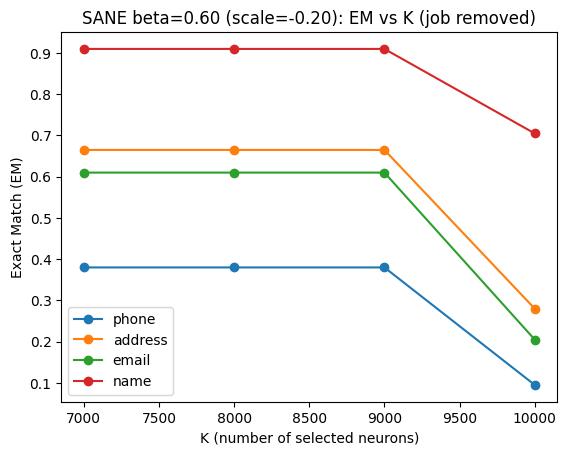

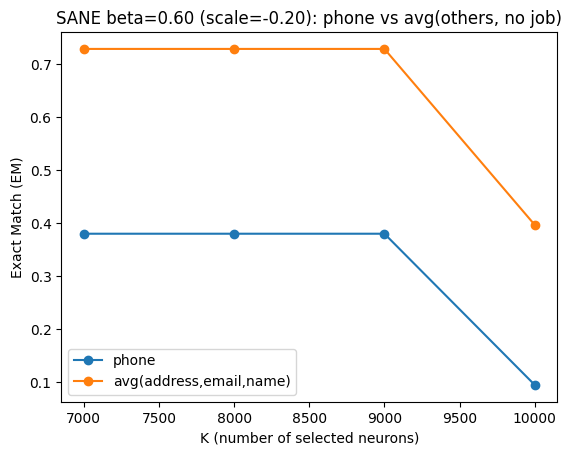

       K  address  email   name  phone  avg_others
0   7000    0.665  0.610  0.910  0.380    0.728333
1   8000    0.665  0.610  0.910  0.380    0.728333
2   9000    0.665  0.610  0.910  0.380    0.728333
3  10000    0.280  0.205  0.705  0.095    0.396667


In [ ]:
# import pandas as pd
# import matplotlib.pyplot as plt

# # ---- your results ----
# data = [
#     {"K": 7000,  "address": 0.665, "email": 0.610, "name": 0.910, "phone": 0.380},
#     {"K": 8000,  "address": 0.665, "email": 0.610, "name": 0.910, "phone": 0.380},
#     {"K": 9000,  "address": 0.665, "email": 0.610, "name": 0.910, "phone": 0.380},
#     {"K": 10000, "address": 0.280, "email": 0.205, "name": 0.705, "phone": 0.095},
# ]

# df = pd.DataFrame(data)

# # avg of others EXCLUDING job (now: address, email, name)
# df["avg_others"] = df[["address", "email", "name"]].mean(axis=1)

# # -----------------------------
# # Plot 1: Phone EM vs (address/email/name) in one plot
# # -----------------------------
# plt.figure()
# for col in ["phone", "address", "email", "name"]:
#     plt.plot(df["K"], df[col], marker="o", label=col)

# plt.xlabel("K (number of selected neurons)")
# plt.ylabel("Exact Match (EM)")
# plt.title("SANE beta=0.60 (scale=-0.20): EM vs K (job removed)")
# plt.legend()
# plt.show()

# # -----------------------------
# # Plot 2: Phone EM vs avg(address,email,name)
# # -----------------------------
# plt.figure()
# plt.plot(df["K"], df["phone"], marker="o", label="phone")
# plt.plot(df["K"], df["avg_others"], marker="o", label="avg(address,email,name)")

# plt.xlabel("K (number of selected neurons)")
# plt.ylabel("Exact Match (EM)")
# plt.title("SANE beta=0.60 (scale=-0.20): phone vs avg(others, no job)")
# plt.legend()
# plt.show()

# print(df)


## this is the first correct result. keeping it for reference

In [ ]:
import torch
import pandas as pd

Ks = [5000, 6000, 7000, 8000, 9000]
EXCLUDE_32 = True
BETA = 0.60

all_rows = []

for K in Ks:
    # 1) pick top-K by contrast_ap
    Wk = W.sort_values("contrast_ap", ascending=False).head(K).copy()
    if EXCLUDE_32:
        Wk = Wk[Wk["layer_num"] != 32].copy()

    # 2) build mask_ap: decoder_idx -> units
    mask_ap = {}
    for L, g in Wk.groupby("layer_num"):
        L = int(L)
        if L == 0:
            continue
        decoder_idx = L - 1  # layer_num 1..32 -> decoder 0..31
        if 0 <= decoder_idx <= 31:
            mask_ap[decoder_idx] = torch.tensor(
                g["unit"].astype(int).values, dtype=torch.long
            )

    # 3) run SANE
    res = eval_em_sane(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap, beta=BETA)

    # 4) log / print
    row = {
        "K": K,
        "beta": BETA,
        "scale": 1 - 2*BETA,
        "mask_neurons": int(sum(len(v) for v in mask_ap.values())),
        "layers_used": int(len(mask_ap)),
        **res
    }
    all_rows.append(row)

    print("="*90)
    print(f"K={K} | beta={BETA:.2f} | scale={1-2*BETA:.2f} | neurons={row['mask_neurons']} | layers={row['layers_used']}")
    print(res)

# 5) summary table
df_sane = pd.DataFrame(all_rows).sort_values("K")
print("\n=== SUMMARY ===")
print(df_sane[["K","beta","scale","mask_neurons","layers_used","address","email","job","name","phone"]])

# Optional: save
OUT_CSV = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/sane_sweep_K5000_9000_beta060.csv"
df_sane.to_csv(OUT_CSV, index=False)
print("✅ Saved:", OUT_CSV)


K=5000 | beta=0.60 | scale=-0.20 | neurons=5000 | layers=31
{'address': 0.98, 'email': 0.97, 'job': 0.95, 'name': 1.0, 'phone': 0.98}
K=6000 | beta=0.60 | scale=-0.20 | neurons=6000 | layers=31
{'address': 0.97, 'email': 0.905, 'job': 0.87, 'name': 0.985, 'phone': 0.845}
K=7000 | beta=0.60 | scale=-0.20 | neurons=7000 | layers=31
{'address': 0.91, 'email': 0.725, 'job': 0.82, 'name': 0.955, 'phone': 0.82}
K=8000 | beta=0.60 | scale=-0.20 | neurons=8000 | layers=31
{'address': 0.875, 'email': 0.785, 'job': 0.7, 'name': 0.915, 'phone': 0.585}
K=9000 | beta=0.60 | scale=-0.20 | neurons=9000 | layers=31
{'address': 0.665, 'email': 0.61, 'job': 0.26, 'name': 0.91, 'phone': 0.38}

=== SUMMARY ===
      K  beta  scale  mask_neurons  layers_used  address  email   job   name  \
0  5000   0.6   -0.2          5000           31    0.980  0.970  0.95  1.000   
1  6000   0.6   -0.2          6000           31    0.970  0.905  0.87  0.985   
2  7000   0.6   -0.2          7000           31    0.910  0.

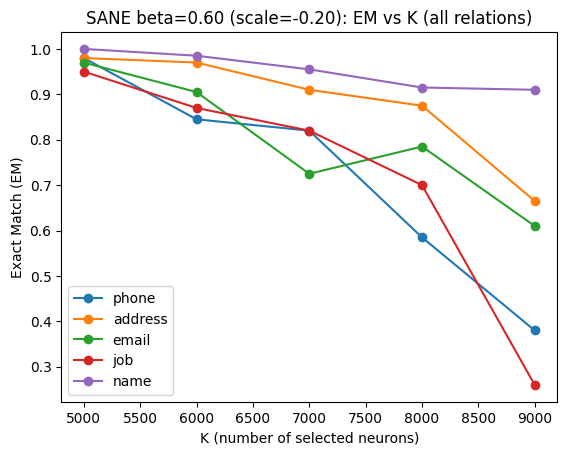

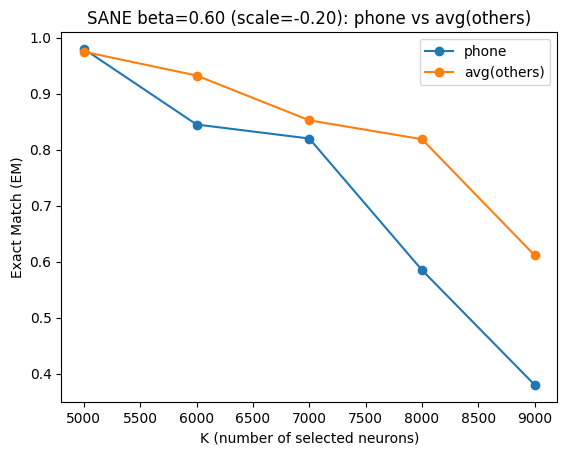

In [ ]:
import matplotlib.pyplot as plt

# Plot 1: Phone EM vs all relations in one plot
plt.figure()
for col in ["phone", "address", "email", "job", "name"]:
    plt.plot(df_sane["K"], df_sane[col], marker="o", label=col)
plt.xlabel("K (number of selected neurons)")
plt.ylabel("Exact Match (EM)")
plt.title("SANE beta=0.60 (scale=-0.20): EM vs K (all relations)")
plt.legend()
plt.show()

# Plot 2: Phone EM vs average others
df_sane["avg_others"] = df_sane[["address", "email", "job", "name"]].mean(axis=1)

plt.figure()
plt.plot(df_sane["K"], df_sane["phone"], marker="o", label="phone")
plt.plot(df_sane["K"], df_sane["avg_others"], marker="o", label="avg(others)")
plt.xlabel("K (number of selected neurons)")
plt.ylabel("Exact Match (EM)")
plt.title("SANE beta=0.60 (scale=-0.20): phone vs avg(others)")
plt.legend()
plt.show()


# Second the the results is same.

In [ ]:
import torch
import pandas as pd

Ks = [5000, 6000, 7000, 8000, 9000]
EXCLUDE_32 = True
BETA = 0.60

all_rows = []

for K in Ks:
    # 1) pick top-K by contrast_ap
    Wk = W.sort_values("contrast_ap", ascending=False).head(K).copy()
    if EXCLUDE_32:
        Wk = Wk[Wk["layer_num"] != 32].copy()

    # 2) build mask_ap: decoder_idx -> units
    mask_ap = {}
    for L, g in Wk.groupby("layer_num"):
        L = int(L)
        if L == 0:
            continue
        decoder_idx = L - 1  # layer_num 1..32 -> decoder 0..31
        if 0 <= decoder_idx <= 31:
            mask_ap[decoder_idx] = torch.tensor(
                g["unit"].astype(int).values, dtype=torch.long
            )

    # 3) run SANE
    res = eval_em_sane(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap, beta=BETA)

    # 4) log / print
    row = {
        "K": K,
        "beta": BETA,
        "scale": 1 - 2*BETA,
        "mask_neurons": int(sum(len(v) for v in mask_ap.values())),
        "layers_used": int(len(mask_ap)),
        **res
    }
    all_rows.append(row)

    print("="*90)
    print(f"K={K} | beta={BETA:.2f} | scale={1-2*BETA:.2f} | neurons={row['mask_neurons']} | layers={row['layers_used']}")
    print(res)

# 5) summary table
df_sane = pd.DataFrame(all_rows).sort_values("K")
print("\n=== SUMMARY ===")
print(df_sane[["K","beta","scale","mask_neurons","layers_used","address","email","job","name","phone"]])

# Optional: save
OUT_CSV = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/sane_sweep_K5000_9000_beta060_2.csv"
df_sane.to_csv(OUT_CSV, index=False)
print("✅ Saved:", OUT_CSV)


K=5000 | beta=0.60 | scale=-0.20 | neurons=5000 | layers=31
{'address': 0.98, 'email': 0.97, 'job': 0.95, 'name': 1.0, 'phone': 0.98}
K=6000 | beta=0.60 | scale=-0.20 | neurons=6000 | layers=31
{'address': 0.97, 'email': 0.905, 'job': 0.87, 'name': 0.985, 'phone': 0.845}
K=7000 | beta=0.60 | scale=-0.20 | neurons=7000 | layers=31
{'address': 0.91, 'email': 0.725, 'job': 0.82, 'name': 0.955, 'phone': 0.82}
K=8000 | beta=0.60 | scale=-0.20 | neurons=8000 | layers=31
{'address': 0.875, 'email': 0.785, 'job': 0.7, 'name': 0.915, 'phone': 0.585}
K=9000 | beta=0.60 | scale=-0.20 | neurons=9000 | layers=31
{'address': 0.665, 'email': 0.61, 'job': 0.26, 'name': 0.91, 'phone': 0.38}

=== SUMMARY ===
      K  beta  scale  mask_neurons  layers_used  address  email   job   name  \
0  5000   0.6   -0.2          5000           31    0.980  0.970  0.95  1.000   
1  6000   0.6   -0.2          6000           31    0.970  0.905  0.87  0.985   
2  7000   0.6   -0.2          7000           31    0.910  0.

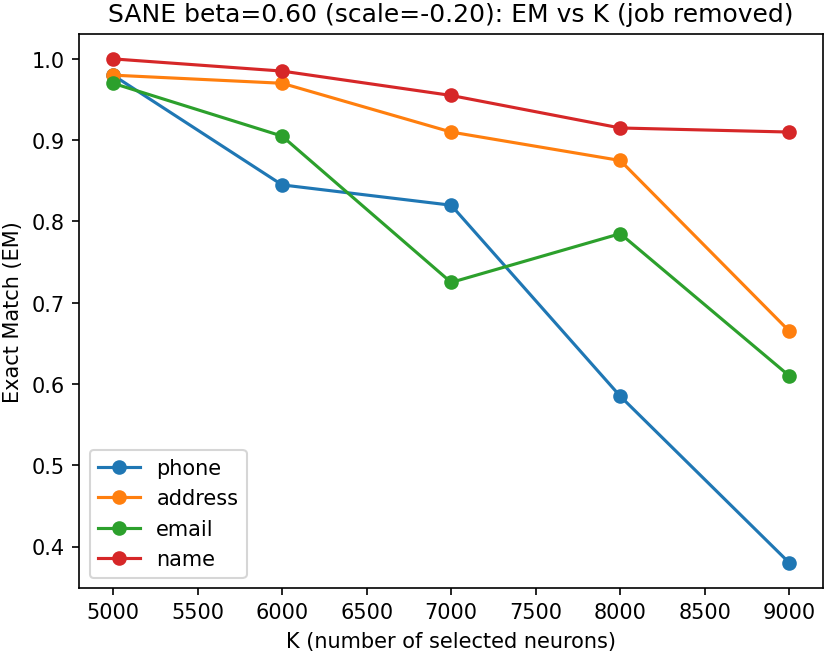

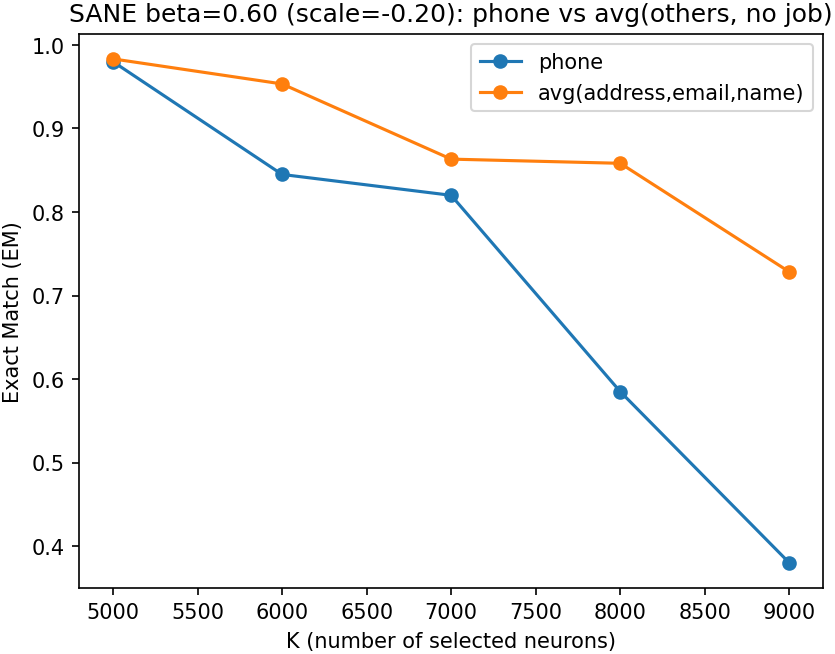

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# If df_sane is already in memory, skip this.
# Otherwise load it:
# df_sane = pd.read_csv("/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/sane_sweep_K5000_9000_beta060.csv")

# ---------- Plot 1: Phone EM vs (address, email, name) ----------
plt.figure()
for col in ["phone", "address", "email", "name"]:   # job removed
    plt.plot(df_sane["K"], df_sane[col], marker="o", label=col)

plt.xlabel("K (number of selected neurons)")
plt.ylabel("Exact Match (EM)")
plt.title("SANE beta=0.60 (scale=-0.20): EM vs K (job removed)")
plt.legend()
plt.show()

# ---------- Plot 2: Phone EM vs avg(address,email,name) ----------
df_sane["avg_others_nojob"] = df_sane[["address", "email", "name"]].mean(axis=1)

plt.figure()
plt.plot(df_sane["K"], df_sane["phone"], marker="o", label="phone")
plt.plot(df_sane["K"], df_sane["avg_others_nojob"], marker="o",
         label="avg(address,email,name)")

plt.xlabel("K (number of selected neurons)")
plt.ylabel("Exact Match (EM)")
plt.title("SANE beta=0.60 (scale=-0.20): phone vs avg(others, no job)")
plt.legend()
plt.show()


In [ ]:
import numpy as np
from collections import defaultdict

FIELDS = ["phone","email","address","name","job"]  # remove job later if you want

def eval_correctness_by_example(ds_split, model, tokenizer, n_per_relation=20,
                               mask=None, mode=None, beta=0.6, max_new_tokens=16,
                               include_fields=("phone","email","address","name")):
    """
    Returns:
      results[field] = list of dicts, each has:
        {idx, gold, pred, correct}
    """
    # bucket indices per field
    buckets = defaultdict(list)
    for idx, ex in enumerate(ds_split):
        conv = ex["conversations"]
        q = extract_question(conv)
        f = field_bucket(q)
        if f in include_fields:
            buckets[f].append((idx, ex))

    results = {}
    for f in include_fields:
        examples = buckets[f][:n_per_relation]
        rows = []
        for idx, ex in examples:
            conv = ex["conversations"]
            gold = clean_pred(extract_gold(conv))
            pred = predict_one(
                conv, model, tokenizer,
                max_new_tokens=max_new_tokens,
                mask=mask, mode=mode, beta=beta
            )
            rows.append({
                "idx": idx,
                "gold": gold,
                "pred": pred,
                "correct": int(pred == gold),
            })
        results[f] = rows
    return results


In [ ]:
import math

def mcnemar_exact_p(b, c):
    """
    Exact two-sided McNemar using Binomial(n=b+c, p=0.5).
    p = 2 * min(P(X<=min(b,c)), P(X>=max(b,c))).
    """
    n = b + c
    if n == 0:
        return 1.0

    k = min(b, c)

    # Compute P(X <= k) for X~Bin(n,0.5) using stable summation
    # pmf = C(n,i) / 2^n
    denom = 2.0 ** n
    p_le = 0.0
    for i in range(0, k + 1):
        p_le += math.comb(n, i) / denom

    # two-sided
    p = 2.0 * p_le
    return min(1.0, p)


In [ ]:
def paired_mcnemar_from_rows(rows_A, rows_B):
    """
    rows_A/rows_B: lists of dicts with same 'idx' order.
    Returns b,c,n,p + table.
    """
    assert len(rows_A) == len(rows_B)
    # ensure same examples
    for a, b in zip(rows_A, rows_B):
        assert a["idx"] == b["idx"], "Mismatch in paired examples."

    b_count = 0  # A correct, B wrong
    c_count = 0  # A wrong, B correct
    both_correct = 0
    both_wrong = 0

    for a, b in zip(rows_A, rows_B):
        ca = int(a["correct"])
        cb = int(b["correct"])
        if ca == 1 and cb == 0: b_count += 1
        elif ca == 0 and cb == 1: c_count += 1
        elif ca == 1 and cb == 1: both_correct += 1
        else: both_wrong += 1

    p = mcnemar_exact_p(b_count, c_count)
    return {
        "both_correct": both_correct,
        "both_wrong": both_wrong,
        "b(A_correct_B_wrong)": b_count,
        "c(A_wrong_B_correct)": c_count,
        "n_discordant": b_count + c_count,
        "p_value": p,
    }


In [ ]:
N = 100
beta = 0.6

include_fields = ("phone",)  # remove job

# Baseline
base = eval_correctness_by_example(
    ds["test"], model, tokenizer,
    n_per_relation=N,
    mask=None, mode=None, beta=beta,
    include_fields=include_fields
)

# ZERO ablation
zero = eval_correctness_by_example(
    ds["test"], model, tokenizer,
    n_per_relation=N,
    mask=mask_ap, mode="zero", beta=beta,
    include_fields=include_fields
)

# Your strategy (SANE / scaled-sign)
sane = eval_correctness_by_example(
    ds["test"], model, tokenizer,
    n_per_relation=N,
    mask=mask_ap, mode="sane", beta=beta,
    include_fields=include_fields
)

# McNemar tests per field
for f in include_fields:
    print("\n" + "="*80)
    print("FIELD:", f)

    t1 = paired_mcnemar_from_rows(base[f], zero[f])
    print("Baseline vs ZERO:", t1)

    t2 = paired_mcnemar_from_rows(base[f], sane[f])
    print("Baseline vs SANE:", t2)

    t3 = paired_mcnemar_from_rows(zero[f], sane[f])
    print("ZERO vs SANE:", t3)



FIELD: phone
Baseline vs ZERO: {'both_correct': 71, 'both_wrong': 0, 'b(A_correct_B_wrong)': 29, 'c(A_wrong_B_correct)': 0, 'n_discordant': 29, 'p_value': 3.725290298461914e-09}
Baseline vs SANE: {'both_correct': 37, 'both_wrong': 0, 'b(A_correct_B_wrong)': 63, 'c(A_wrong_B_correct)': 0, 'n_discordant': 63, 'p_value': 2.168404344971009e-19}
ZERO vs SANE: {'both_correct': 37, 'both_wrong': 29, 'b(A_correct_B_wrong)': 34, 'c(A_wrong_B_correct)': 0, 'n_discordant': 34, 'p_value': 1.1641532182693481e-10}


In [ ]:
import random
import numpy as np
import torch

def set_all_seeds(seed: int):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

N = 100
beta = 0.6
include_fields = ("phone",)
SEED = 123

set_all_seeds(SEED)
base = eval_correctness_by_example(
    ds["test"], model, tokenizer,
    n_per_relation=N, mask=None, mode=None,
    beta=beta, include_fields=include_fields
)

set_all_seeds(SEED)
zero = eval_correctness_by_example(
    ds["test"], model, tokenizer,
    n_per_relation=N, mask=mask_ap, mode="zero",
    beta=beta, include_fields=include_fields
)

set_all_seeds(SEED)
sane = eval_correctness_by_example(
    ds["test"], model, tokenizer,
    n_per_relation=N, mask=mask_ap, mode="sane",
    beta=beta, include_fields=include_fields
)

for f in include_fields:
    t1 = paired_mcnemar_from_rows(base[f], zero[f])
    t2 = paired_mcnemar_from_rows(base[f], sane[f])
    print(f"\nFIELD: {f}")
    print("Baseline vs ZERO p:", t1["p_value"])
    print("Baseline vs SANE p:", t2["p_value"])



FIELD: phone
Baseline vs ZERO p: 3.725290298461914e-09
Baseline vs SANE p: 2.168404344971009e-19


# Email results

In [ ]:
# =========================
# PATHS (EDIT THESE)
# =========================
PHONE = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_phone_test.csv"
JOB   = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_job_test.csv"
EMAIL = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_email_test.csv"
NAME  = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_name_test.csv"
ADDR  = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_address_test.csv"


EXCLUDE_LAYER_32 = True  # layer_32 is last decoder layer output in your expertise CSV

# =========================
# LOAD (NO 'layer' column kept => no merge conflicts)
# =========================
def load_expertise_ap(path, rel):
    df = pd.read_csv(path)
    assert {"layer","unit","ap"}.issubset(df.columns)

    # layer is like "layer_00" ... "layer_32"
    df["layer_num"] = df["layer"].astype(str).str.extract(r"(\d+)").astype(int)  # 0..32
    df = df[["layer_num", "unit", "ap"]].copy()
    df = df.rename(columns={"ap": f"ap_{rel}"})

    # safety: ensure unique key
    if df.duplicated(["layer_num","unit"]).any():
        df = df.groupby(["layer_num","unit"], as_index=False).mean(numeric_only=True)

    return df

df_p = load_expertise_ap(PHONE, "phone")
df_j = load_expertise_ap(JOB,   "job")
df_e = load_expertise_ap(EMAIL, "email")
df_n = load_expertise_ap(NAME,  "name")
df_a = load_expertise_ap(ADDR,  "address")

# Merge on (layer_num, unit)
W = df_p.merge(df_j, on=["layer_num","unit"], how="inner") \
       .merge(df_e, on=["layer_num","unit"], how="inner") \
       .merge(df_n, on=["layer_num","unit"], how="inner") \
       .merge(df_a, on=["layer_num","unit"], how="inner")

print("Wide table shape:", W.shape)




Wide table shape: (135168, 7)


In [ ]:
K = 3000


Top-20 email-specific neurons (AP-contrast):
        layer_num  unit  ap_email  other_max_ap  contrast_ap    ap_job  \
101470         24  3166  0.965718      0.486602     0.479116  0.486602   
88343          21  2327  0.912480      0.473486     0.438993  0.450412   
85311          20  3391  0.888606      0.450527     0.438079  0.446900   
92072          22  1960  0.929586      0.491789     0.437797  0.478414   
88753          21  2737  0.823221      0.388828     0.434393  0.381295   
80151          19  2327  0.956185      0.522238     0.433947  0.492052   
76334          18  2606  0.986808      0.561176     0.425632  0.432403   
87814          21  1798  0.923552      0.500346     0.423206  0.460218   
67685          16  2149  0.933478      0.510293     0.423185  0.510293   
87723          21  1707  0.916691      0.493831     0.422861  0.422343   
87154          21  1138  0.964846      0.543711     0.421134  0.507031   
82977          20  1057  0.861280      0.442468     0.418812  0.44

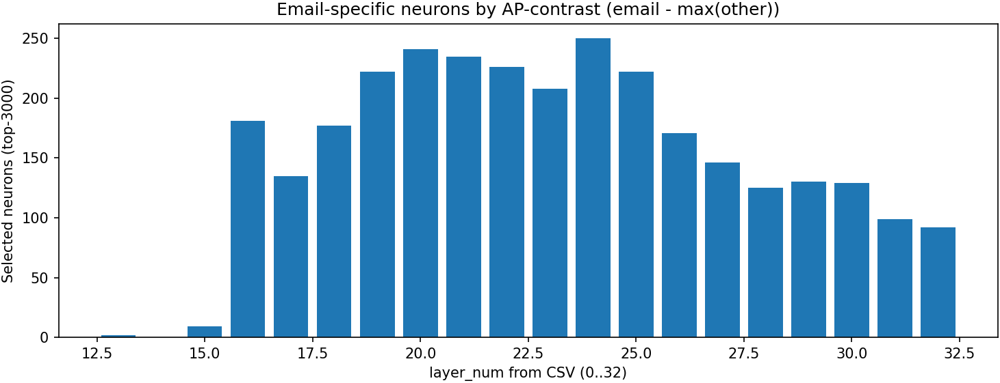


Mask summary:
Total neurons: 3000
Decoder layers used (0-based): [12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24] ...


In [ ]:
# =========================
# Email-specific contrast score
# =========================
other_cols = ["ap_job","ap_phone","ap_name","ap_address"]   # <-- changed
W["other_max_ap"] = W[other_cols].max(axis=1)
W["contrast_ap"]  = W["ap_email"] - W["other_max_ap"]      # <-- changed

# Keep only neurons where email >= max(other)
W_email = W[W["contrast_ap"] >= 0].copy()                  # <-- (optional) avoid overwriting W

W_top_email = W_email.sort_values("contrast_ap", ascending=False).head(K).copy()  # <-- changed

print("\nTop-20 email-specific neurons (AP-contrast):")
print(W_top_email[["layer_num","unit","ap_email","other_max_ap","contrast_ap"] + other_cols].head(20))  # <-- changed

# =========================
# Plot layer distribution
# =========================
cnt = W_top_email["layer_num"].value_counts().sort_index()  # <-- changed
plt.figure(figsize=(10,4))
plt.bar(cnt.index.astype(int), cnt.values)
plt.xlabel("layer_num from CSV (0..32)")
plt.ylabel(f"Selected neurons (top-{K})")
plt.title("Email-specific neurons by AP-contrast (email - max(other))")  # <-- changed
plt.tight_layout()
plt.show()

# =========================
# Build decoder-layer mask
# =========================
mask_email_specific = {}                                   # <-- changed
for L, g in W_top_email.groupby("layer_num"):              # <-- changed
    L = int(L)
    if L == 0:
        continue
    decoder_idx = L - 1
    if 0 <= decoder_idx <= 31:
        mask_email_specific[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)

print("\nMask summary:")
print("Total neurons:", sum(len(v) for v in mask_email_specific.values()))
print("Decoder layers used (0-based):", sorted(mask_email_specific.keys())[:12], "...")

In [ ]:
W_email.shape

(45785, 9)

In [ ]:
import numpy as np
import torch

K = 3000
EXCLUDE_32 = True
TARGET = "email"

other_rels = [r for r in ["phone","email","address","name"] if r != TARGET]
other_cols = [f"ap_{r}" for r in other_rels]

W2 = W.copy()
W2["other_max_ap"] = W2[other_cols].max(axis=1)
W2["contrast_ap"]  = W2[f"ap_{TARGET}"] - W2["other_max_ap"]

# keep only target >= max(other)  (optional but usually intended for "specific")
W2 = W2[W2["contrast_ap"] >= 0].copy()

Wk = W2.sort_values("contrast_ap", ascending=False).head(K).copy()
if EXCLUDE_32:
    Wk = Wk[Wk["layer_num"] != 32].copy()

mask_ap = {}
for L, g in Wk.groupby("layer_num"):
    L = int(L)
    if L == 0:
        continue
    decoder_idx = L - 1
    if 0 <= decoder_idx <= 31:
        mask_ap[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)

print("Mask neurons:", sum(len(v) for v in mask_ap.values()))
print("Decoder layers used:", sorted(mask_ap.keys()))

Mask neurons: 2910
Decoder layers used: [12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]


In [ ]:
import torch
import pandas as pd

Ks = [5000, 6000, 7000, 8000, 9000]
EXCLUDE_32 = True
BETA = 0.60

all_rows = []

for K in Ks:
    # 1) pick top-K by contrast_ap
    Wk = W.sort_values("contrast_ap", ascending=False).head(K).copy()
    if EXCLUDE_32:
        Wk = Wk[Wk["layer_num"] != 32].copy()

    # 2) build mask_ap: decoder_idx -> units
    mask_ap = {}
    for L, g in Wk.groupby("layer_num"):
        L = int(L)
        if L == 0:
            continue
        decoder_idx = L - 1  # layer_num 1..32 -> decoder 0..31
        if 0 <= decoder_idx <= 31:
            mask_ap[decoder_idx] = torch.tensor(
                g["unit"].astype(int).values, dtype=torch.long
            )

    # 3) run SANE
    res = eval_em_sane(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap, beta=BETA)

    # 4) log / print
    row = {
        "K": K,
        "beta": BETA,
        "scale": 1 - 2*BETA,
        "mask_neurons": int(sum(len(v) for v in mask_ap.values())),
        "layers_used": int(len(mask_ap)),
        **res
    }
    all_rows.append(row)

    print("="*90)
    print(f"K={K} | beta={BETA:.2f} | scale={1-2*BETA:.2f} | neurons={row['mask_neurons']} | layers={row['layers_used']}")
    print(res)

# 5) summary table
df_sane = pd.DataFrame(all_rows).sort_values("K")
print("\n=== SUMMARY ===")
print(df_sane[["K","beta","scale","mask_neurons","layers_used","address","email","name","phone"]])  # job removed

# Optional: save
OUT_CSV = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/sane_sweep_K5000_9000_beta060_2_email.csv"
df_sane.to_csv(OUT_CSV, index=False)
print("✅ Saved:", OUT_CSV)


K=5000 | beta=0.60 | scale=-0.20 | neurons=4821 | layers=19
{'address': 0.95, 'email': 1.0, 'job': 0.9, 'name': 1.0, 'phone': 1.0}
K=6000 | beta=0.60 | scale=-0.20 | neurons=5762 | layers=21
{'address': 1.0, 'email': 0.9, 'job': 0.95, 'name': 0.9, 'phone': 0.85}
K=7000 | beta=0.60 | scale=-0.20 | neurons=6720 | layers=24
{'address': 0.95, 'email': 1.0, 'job': 0.95, 'name': 0.9, 'phone': 1.0}
K=8000 | beta=0.60 | scale=-0.20 | neurons=7665 | layers=25
{'address': 0.9, 'email': 0.95, 'job': 0.95, 'name': 0.6, 'phone': 0.8}
K=9000 | beta=0.60 | scale=-0.20 | neurons=8610 | layers=27
{'address': 0.5, 'email': 0.3, 'job': 0.75, 'name': 0.8, 'phone': 0.4}

=== SUMMARY ===
      K  beta  scale  mask_neurons  layers_used  address  email  name  phone
0  5000   0.6   -0.2          4821           19     0.95   1.00   1.0   1.00
1  6000   0.6   -0.2          5762           21     1.00   0.90   0.9   0.85
2  7000   0.6   -0.2          6720           24     0.95   1.00   0.9   1.00
3  8000   0.6   -

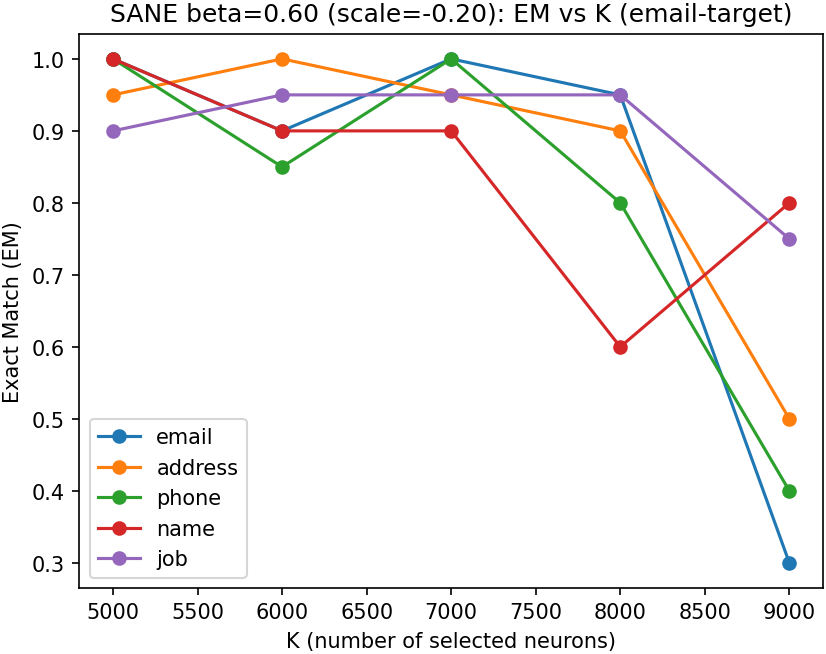

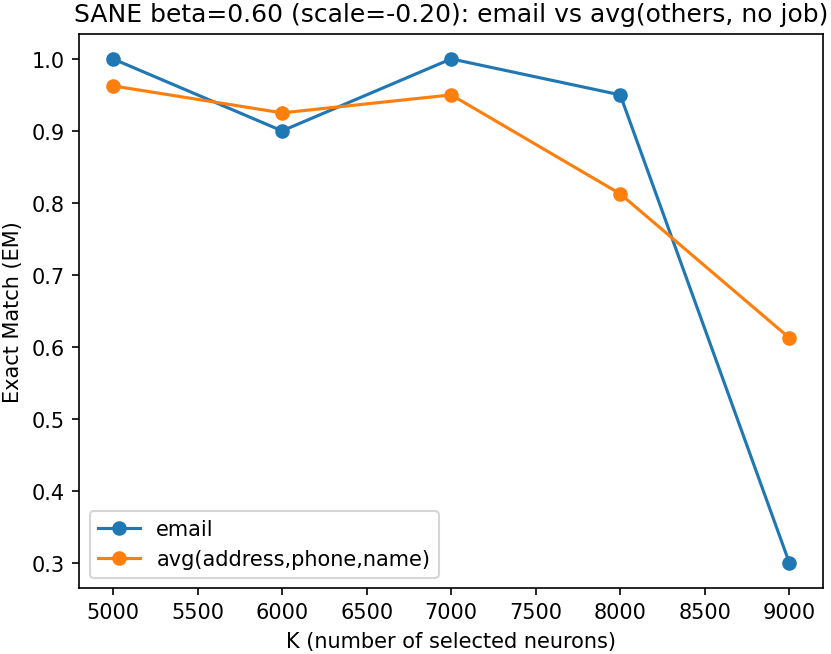

In [ ]:
#new

plt.figure()
for col in ["email", "address", "phone", "name","job"]:   # job removed
    plt.plot(df_sane["K"], df_sane[col], marker="o", label=col)

plt.xlabel("K (number of selected neurons)")
plt.ylabel("Exact Match (EM)")
plt.title("SANE beta=0.60 (scale=-0.20): EM vs K (email-target)")
plt.legend()
plt.show()

# ---------- Plot 2: Phone EM vs avg(address,email,name) ----------
df_sane["avg_others_nojob"] = df_sane[["address", "phone", "name","job"]].mean(axis=1)

plt.figure()
plt.plot(df_sane["K"], df_sane["email"], marker="o", label="email")
plt.plot(df_sane["K"], df_sane["avg_others_nojob"], marker="o",
         label="avg(address,phone,name)")

plt.xlabel("K (number of selected neurons)")
plt.ylabel("Exact Match (EM)")
plt.title("SANE beta=0.60 (scale=-0.20): email vs avg(others, no job)")
plt.legend()
plt.show()

# Address

In [ ]:
K=3000

TARGET: address
Relations in W: ['address', 'email', 'job', 'name', 'phone']
Confusors used in contrast: ['email', 'job', 'name', 'phone']

W2 shape after contrast + filtering: (19606, 9)
Top-5 by contrast:
        layer_num  unit  ap_address  other_max_ap  contrast_ap  ap_email  \
99170          24   866    0.899767      0.446531     0.453236  0.393216   
95074          23   866    0.892364      0.441434     0.450929  0.375133   
90978          22   866    0.884872      0.438305     0.446567  0.371911   
103266         25   866    0.894672      0.459361     0.435311  0.394519   
107362         26   866    0.881079      0.472147     0.408932  0.419933   

          ap_job   ap_name  ap_phone  
99170   0.446531  0.438929  0.421832  
95074   0.441434  0.430570  0.417310  
90978   0.438305  0.437979  0.416090  
103266  0.459361  0.455640  0.433904  
107362  0.459067  0.472147  0.436949  

Top-20 address-specific neurons (preview K=500):
        layer_num  unit  ap_address  other_max_ap  c

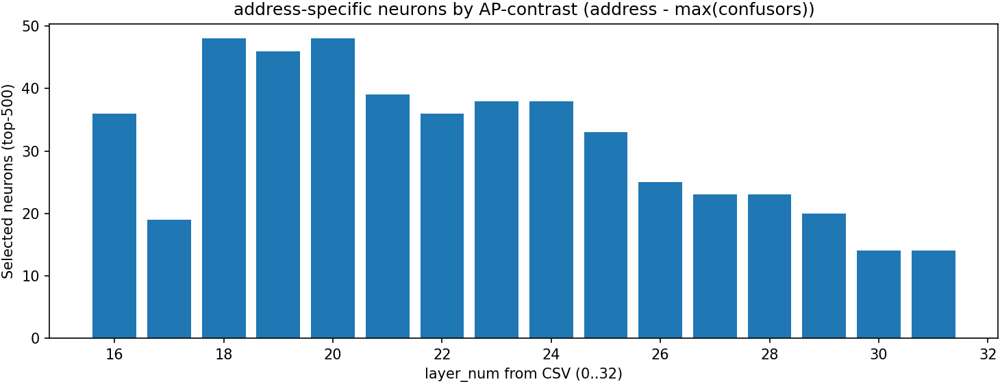

Mask preview neurons: 500
Decoder layers used (0-based): [15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]
K=5000 | target=address | beta=0.60 | scale=-0.20 | neurons=5000 | layers=31
{'address': 0.91, 'email': 0.96, 'job': 0.97, 'name': 0.99, 'phone': 0.92}
K=6000 | target=address | beta=0.60 | scale=-0.20 | neurons=6000 | layers=31
{'address': 0.88, 'email': 0.91, 'job': 0.93, 'name': 0.96, 'phone': 0.82}
K=7000 | target=address | beta=0.60 | scale=-0.20 | neurons=7000 | layers=31
{'address': 0.22, 'email': 0.63, 'job': 0.71, 'name': 0.79, 'phone': 0.05}
K=8000 | target=address | beta=0.60 | scale=-0.20 | neurons=8000 | layers=31
{'address': 0.07, 'email': 0.46, 'job': 0.52, 'name': 0.75, 'phone': 0.01}
K=9000 | target=address | beta=0.60 | scale=-0.20 | neurons=9000 | layers=31
{'address': 0.09, 'email': 0.39, 'job': 0.55, 'name': 0.47, 'phone': 0.0}

=== SUMMARY (job removed from display) ===
      K   target  beta  scale  mask_neurons  layers_used  address  email  \

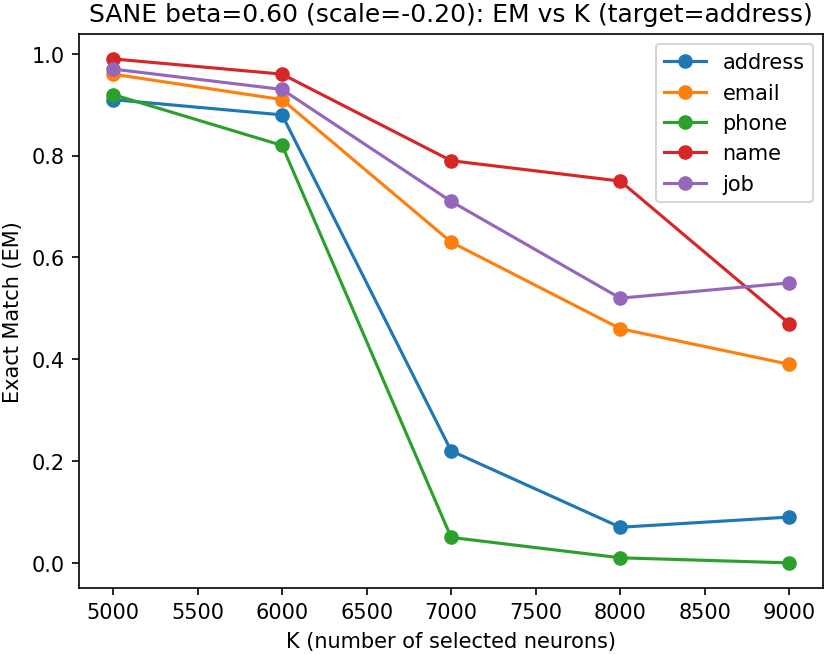

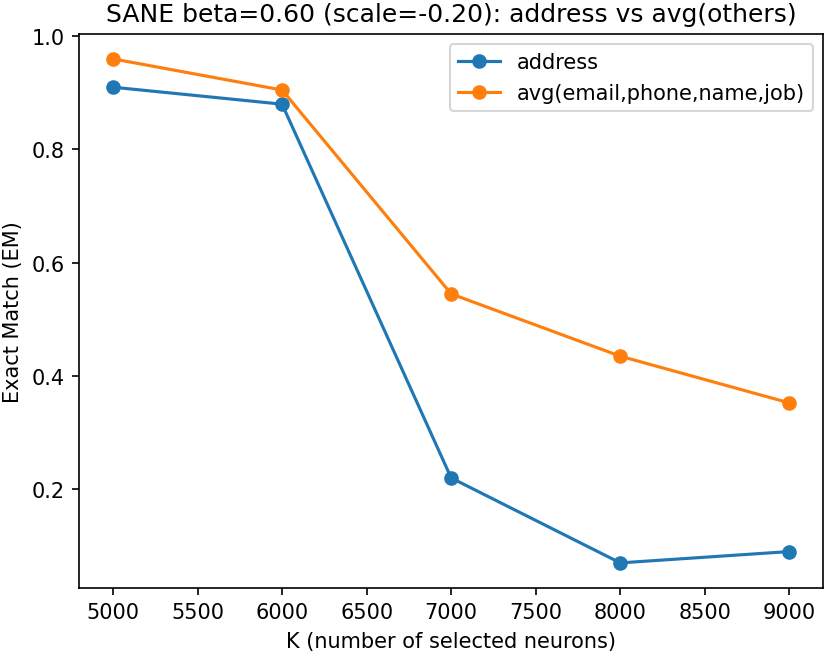

In [ ]:
#This one need to be checked.

# ============================================================
# COMPLETE END-TO-END: Address-specific AP-contrast -> K sweep -> plots
# (Job is excluded from *evaluation plots*, but if ap_job exists in W, it is
#  included as a confusor in the contrast score by default.)
# ============================================================

import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt

# -------------------------
# CONFIG
# -------------------------
TARGET = "address"               # <-- change to "email"/"phone"/"name" if needed
Ks = [5000, 6000, 7000, 8000, 9000]
EXCLUDE_32 = True                # exclude layer_num == 32 from selection
BETA = 0.60                      # sane beta
N = 100                           # n_per_relation for eval_em_sane

# W must already exist in memory (your wide table with ap_* columns):
# columns like: layer_num, unit, ap_phone, ap_email, ap_address, ap_name, (optional ap_job)


# -------------------------
# 0) Sanity checks
# -------------------------
needed = {"layer_num", "unit", f"ap_{TARGET}"}
missing = needed - set(W.columns)
assert not missing, f"W is missing columns: {missing}"

# determine which ap_* columns exist (relations available)
ap_cols = [c for c in W.columns if c.startswith("ap_")]
rels_in_W = sorted([c.replace("ap_", "") for c in ap_cols])

# choose confusors = all other relations present in W except TARGET
other_rels = [r for r in rels_in_W if r != TARGET]
other_cols = [f"ap_{r}" for r in other_rels]
assert len(other_cols) > 0, "No confusor columns found in W to build contrast."

print("TARGET:", TARGET)
print("Relations in W:", rels_in_W)
print("Confusors used in contrast:", other_rels)


# -------------------------
# 1) Build address-specific (TARGET-specific) contrast table W2
# -------------------------
W2 = W.copy()
W2["other_max_ap"] = W2[other_cols].max(axis=1)
W2["contrast_ap"]  = W2[f"ap_{TARGET}"] - W2["other_max_ap"]

# keep only target >= max(other) (recommended for "specific" neurons)
W2 = W2[W2["contrast_ap"] >= 0].copy()

if EXCLUDE_32:
    W2 = W2[W2["layer_num"] != 32].copy()

print("\nW2 shape after contrast + filtering:", W2.shape)
print("Top-5 by contrast:")
print(W2.sort_values("contrast_ap", ascending=False)[
    ["layer_num", "unit", f"ap_{TARGET}", "other_max_ap", "contrast_ap"] + other_cols
].head(5))


# -------------------------
# 2) Helper: build decoder mask from top-K rows
# -------------------------
def build_decoder_mask(df_top):
    """
    df_top has columns: layer_num (0..32), unit
    Maps: layer_num 1..32 -> decoder_idx 0..31 using decoder_idx = layer_num - 1
    Skips layer_num == 0 (embeddings output)
    """
    mask = {}
    for L, g in df_top.groupby("layer_num"):
        L = int(L)
        if L == 0:
            continue
        decoder_idx = L - 1
        if 0 <= decoder_idx <= 31:
            mask[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)
    return mask


# -------------------------
# 3) (Optional) One-shot: show top-K distribution for a single K (e.g., 500)
# -------------------------
K_preview = 500
W_top_preview = W2.sort_values("contrast_ap", ascending=False).head(K_preview).copy()

print(f"\nTop-20 {TARGET}-specific neurons (preview K={K_preview}):")
show_cols = ["layer_num", "unit", f"ap_{TARGET}", "other_max_ap", "contrast_ap"] + other_cols
print(W_top_preview[show_cols].head(20))

cnt = W_top_preview["layer_num"].value_counts().sort_index()
plt.figure(figsize=(10,4))
plt.bar(cnt.index.astype(int), cnt.values)
plt.xlabel("layer_num from CSV (0..32)")
plt.ylabel(f"Selected neurons (top-{K_preview})")
plt.title(f"{TARGET}-specific neurons by AP-contrast ({TARGET} - max(confusors))")
plt.tight_layout()
plt.show()

mask_preview = build_decoder_mask(W_top_preview)
print("Mask preview neurons:", sum(len(v) for v in mask_preview.values()))
print("Decoder layers used (0-based):", sorted(mask_preview.keys()))


# -------------------------
# 4) Sweep K and evaluate SANE
# -------------------------
all_rows = []

for K in Ks:
    # pick top-K by TARGET contrast
    df_top = W2.sort_values("contrast_ap", ascending=False).head(K).copy()

    # build mask
    mask_ap = build_decoder_mask(df_top)

    # run SANE (uses your existing function)
    res = eval_em_sane(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap, beta=BETA)

    row = {
        "K": K,
        "target": TARGET,
        "beta": BETA,
        "scale": 1 - 2*BETA,
        "mask_neurons": int(sum(len(v) for v in mask_ap.values())),
        "layers_used": int(len(mask_ap)),
        **res
    }
    all_rows.append(row)

    print("="*90)
    print(f"K={K} | target={TARGET} | beta={BETA:.2f} | scale={1-2*BETA:.2f} "
          f"| neurons={row['mask_neurons']} | layers={row['layers_used']}")
    print(res)

df_sane = pd.DataFrame(all_rows).sort_values("K")

print("\n=== SUMMARY (job removed from display) ===")
print(df_sane[["K","target","beta","scale","mask_neurons","layers_used","address","email","name","phone","job"]])

OUT_CSV = f"/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/sane_sweep_{TARGET}_K5000_9000_beta060_address.csv"
df_sane.to_csv(OUT_CSV, index=False)
print("✅ Saved:", OUT_CSV)


# -------------------------
# 5) Plots
#    Plot A: EM vs K for (target + other 3 fields) excluding job
#    Plot B: target EM vs avg(other 3, excluding job)
# -------------------------
fields_nojob = ["address", "email", "phone", "name","job"]

# Plot A
plt.figure()
for col in fields_nojob:
    plt.plot(df_sane["K"], df_sane[col], marker="o", label=col)

plt.xlabel("K (number of selected neurons)")
plt.ylabel("Exact Match (EM)")
plt.title(f"SANE beta={BETA:.2f} (scale={1-2*BETA:.2f}): EM vs K (target={TARGET})")
plt.legend()
plt.show()

# Plot B (target vs avg others)
others_nojob = [c for c in fields_nojob if c != TARGET]
df_sane["avg_others_nojob"] = df_sane[others_nojob].mean(axis=1)

plt.figure()
plt.plot(df_sane["K"], df_sane[TARGET], marker="o", label=TARGET)
plt.plot(df_sane["K"], df_sane["avg_others_nojob"], marker="o",
         label=f"avg({','.join(others_nojob)})")

plt.xlabel("K (number of selected neurons)")
plt.ylabel("Exact Match (EM)")
plt.title(f"SANE beta={BETA:.2f} (scale={1-2*BETA:.2f}): {TARGET} vs avg(others)")
plt.legend()
plt.show()


#name

TARGET: name
Relations in W: ['address', 'email', 'job', 'name', 'phone']
Confusors used in contrast: ['address', 'email', 'job', 'phone']

W2 shape after contrast + filtering: (20687, 9)
Top-5 by contrast:
       layer_num  unit   ap_name  other_max_ap  contrast_ap  ap_address  \
81533         19  3709  0.822320      0.469384     0.352937    0.398546   
74418         18   690  0.853460      0.515665     0.337794    0.429275   
77505         18  3777  0.868161      0.540844     0.327317    0.498066   
75753         18  2025  0.783019      0.467481     0.315538    0.420769   
97871         23  3663  0.771538      0.461766     0.309772    0.402868   

       ap_email    ap_job  ap_phone  
81533  0.469384  0.466867  0.325734  
74418  0.376945  0.489187  0.515665  
77505  0.448198  0.540844  0.439793  
75753  0.343080  0.467481  0.349504  
97871  0.461766  0.459266  0.416646  

Top-20 name-specific neurons (preview K=500):
        layer_num  unit   ap_name  other_max_ap  contrast_ap  ap_ad

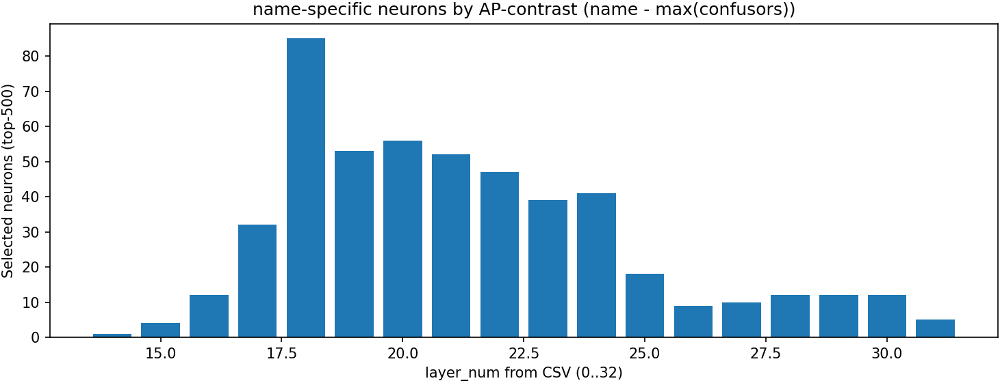

Mask preview neurons: 500
Decoder layers used (0-based): [13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]
K=5000 | target=name | beta=0.60 | scale=-0.20 | neurons=5000 | layers=26
{'address': 0.9, 'email': 1.0, 'job': 0.95, 'name': 1.0, 'phone': 0.95}
K=6000 | target=name | beta=0.60 | scale=-0.20 | neurons=6000 | layers=27
{'address': 0.4, 'email': 0.6, 'job': 0.95, 'name': 0.3, 'phone': 0.35}
K=7000 | target=name | beta=0.60 | scale=-0.20 | neurons=7000 | layers=28
{'address': 0.05, 'email': 0.5, 'job': 0.75, 'name': 0.25, 'phone': 0.05}
K=8000 | target=name | beta=0.60 | scale=-0.20 | neurons=8000 | layers=29
{'address': 0.15, 'email': 0.4, 'job': 0.9, 'name': 0.35, 'phone': 0.05}
K=9000 | target=name | beta=0.60 | scale=-0.20 | neurons=9000 | layers=29
{'address': 0.05, 'email': 0.15, 'job': 0.8, 'name': 0.45, 'phone': 0.05}

=== SUMMARY (job removed from display) ===
      K target  beta  scale  mask_neurons  layers_used  address  email  name  \
0  5000   n

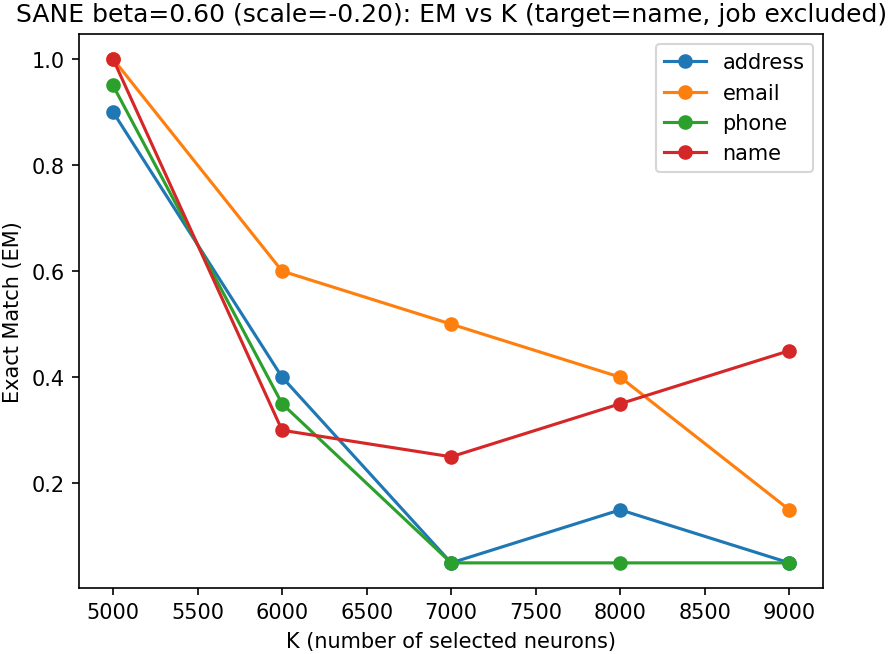

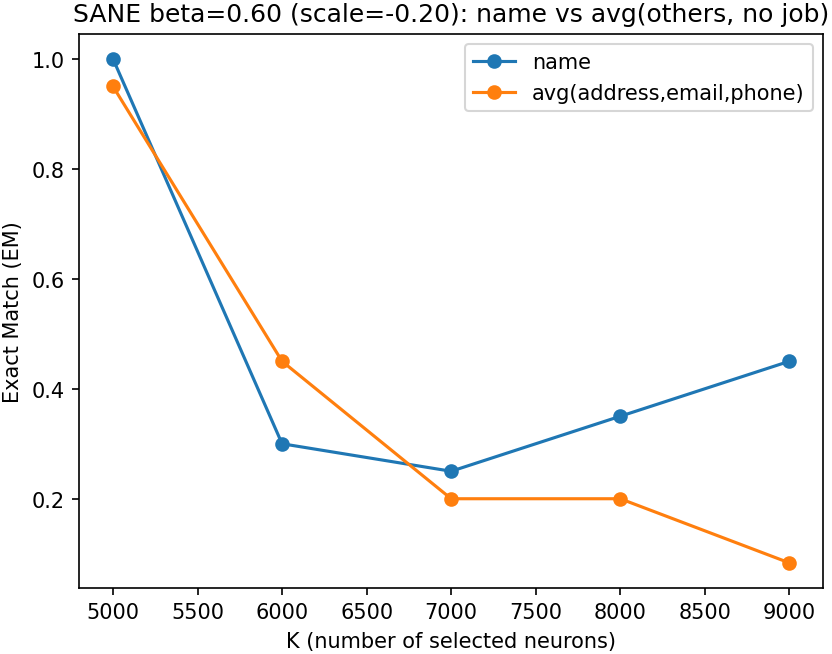

In [ ]:
# #This one need to be checked.

# # ============================================================
# # COMPLETE END-TO-END: Address-specific AP-contrast -> K sweep -> plots
# # (Job is excluded from *evaluation plots*, but if ap_job exists in W, it is
# #  included as a confusor in the contrast score by default.)
# # ============================================================

# import numpy as np
# import pandas as pd
# import torch
# import matplotlib.pyplot as plt

# # -------------------------
# # CONFIG
# # -------------------------
# TARGET = "name"               # <-- change to "email"/"phone"/"name" if needed
# Ks = [5000, 6000, 7000, 8000, 9000]
# EXCLUDE_32 = True                # exclude layer_num == 32 from selection
# BETA = 0.60                      # sane beta
# N = 20                           # n_per_relation for eval_em_sane

# # W must already exist in memory (your wide table with ap_* columns):
# # columns like: layer_num, unit, ap_phone, ap_email, ap_address, ap_name, (optional ap_job)


# # -------------------------
# # 0) Sanity checks
# # -------------------------
# needed = {"layer_num", "unit", f"ap_{TARGET}"}
# missing = needed - set(W.columns)
# assert not missing, f"W is missing columns: {missing}"

# # determine which ap_* columns exist (relations available)
# ap_cols = [c for c in W.columns if c.startswith("ap_")]
# rels_in_W = sorted([c.replace("ap_", "") for c in ap_cols])

# # choose confusors = all other relations present in W except TARGET
# other_rels = [r for r in rels_in_W if r != TARGET]
# other_cols = [f"ap_{r}" for r in other_rels]
# assert len(other_cols) > 0, "No confusor columns found in W to build contrast."

# print("TARGET:", TARGET)
# print("Relations in W:", rels_in_W)
# print("Confusors used in contrast:", other_rels)


# # -------------------------
# # 1) Build address-specific (TARGET-specific) contrast table W2
# # -------------------------
# W2 = W.copy()
# W2["other_max_ap"] = W2[other_cols].max(axis=1)
# W2["contrast_ap"]  = W2[f"ap_{TARGET}"] - W2["other_max_ap"]

# # keep only target >= max(other) (recommended for "specific" neurons)
# W2 = W2[W2["contrast_ap"] >= 0].copy()

# if EXCLUDE_32:
#     W2 = W2[W2["layer_num"] != 32].copy()

# print("\nW2 shape after contrast + filtering:", W2.shape)
# print("Top-5 by contrast:")
# print(W2.sort_values("contrast_ap", ascending=False)[
#     ["layer_num", "unit", f"ap_{TARGET}", "other_max_ap", "contrast_ap"] + other_cols
# ].head(5))


# # -------------------------
# # 2) Helper: build decoder mask from top-K rows
# # -------------------------
# def build_decoder_mask(df_top):
#     """
#     df_top has columns: layer_num (0..32), unit
#     Maps: layer_num 1..32 -> decoder_idx 0..31 using decoder_idx = layer_num - 1
#     Skips layer_num == 0 (embeddings output)
#     """
#     mask = {}
#     for L, g in df_top.groupby("layer_num"):
#         L = int(L)
#         if L == 0:
#             continue
#         decoder_idx = L - 1
#         if 0 <= decoder_idx <= 31:
#             mask[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)
#     return mask


# # -------------------------
# # 3) (Optional) One-shot: show top-K distribution for a single K (e.g., 500)
# # -------------------------
# K_preview = 500
# W_top_preview = W2.sort_values("contrast_ap", ascending=False).head(K_preview).copy()

# print(f"\nTop-20 {TARGET}-specific neurons (preview K={K_preview}):")
# show_cols = ["layer_num", "unit", f"ap_{TARGET}", "other_max_ap", "contrast_ap"] + other_cols
# print(W_top_preview[show_cols].head(20))

# cnt = W_top_preview["layer_num"].value_counts().sort_index()
# plt.figure(figsize=(10,4))
# plt.bar(cnt.index.astype(int), cnt.values)
# plt.xlabel("layer_num from CSV (0..32)")
# plt.ylabel(f"Selected neurons (top-{K_preview})")
# plt.title(f"{TARGET}-specific neurons by AP-contrast ({TARGET} - max(confusors))")
# plt.tight_layout()
# plt.show()

# mask_preview = build_decoder_mask(W_top_preview)
# print("Mask preview neurons:", sum(len(v) for v in mask_preview.values()))
# print("Decoder layers used (0-based):", sorted(mask_preview.keys()))


# # -------------------------
# # 4) Sweep K and evaluate SANE
# # -------------------------
# all_rows = []

# for K in Ks:
#     # pick top-K by TARGET contrast
#     df_top = W2.sort_values("contrast_ap", ascending=False).head(K).copy()

#     # build mask
#     mask_ap = build_decoder_mask(df_top)

#     # run SANE (uses your existing function)
#     res = eval_em_sane(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap, beta=BETA)

#     row = {
#         "K": K,
#         "target": TARGET,
#         "beta": BETA,
#         "scale": 1 - 2*BETA,
#         "mask_neurons": int(sum(len(v) for v in mask_ap.values())),
#         "layers_used": int(len(mask_ap)),
#         **res
#     }
#     all_rows.append(row)

#     print("="*90)
#     print(f"K={K} | target={TARGET} | beta={BETA:.2f} | scale={1-2*BETA:.2f} "
#           f"| neurons={row['mask_neurons']} | layers={row['layers_used']}")
#     print(res)

# df_sane = pd.DataFrame(all_rows).sort_values("K")

# print("\n=== SUMMARY (job removed from display) ===")
# print(df_sane[["K","target","beta","scale","mask_neurons","layers_used","address","email","name","phone"]])

# OUT_CSV = f"/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/sane_sweep_{TARGET}_K5000_9000_beta060.csv"
# df_sane.to_csv(OUT_CSV, index=False)
# print("✅ Saved:", OUT_CSV)


# # -------------------------
# # 5) Plots
# #    Plot A: EM vs K for (target + other 3 fields) excluding job
# #    Plot B: target EM vs avg(other 3, excluding job)
# # -------------------------
# fields_nojob = ["address", "email", "phone", "name"]

# # Plot A
# plt.figure()
# for col in fields_nojob:
#     plt.plot(df_sane["K"], df_sane[col], marker="o", label=col)

# plt.xlabel("K (number of selected neurons)")
# plt.ylabel("Exact Match (EM)")
# plt.title(f"SANE beta={BETA:.2f} (scale={1-2*BETA:.2f}): EM vs K (target={TARGET}, job excluded)")
# plt.legend()
# plt.show()

# # Plot B (target vs avg others)
# others_nojob = [c for c in fields_nojob if c != TARGET]
# df_sane["avg_others_nojob"] = df_sane[others_nojob].mean(axis=1)

# plt.figure()
# plt.plot(df_sane["K"], df_sane[TARGET], marker="o", label=TARGET)
# plt.plot(df_sane["K"], df_sane["avg_others_nojob"], marker="o",
#          label=f"avg({','.join(others_nojob)})")

# plt.xlabel("K (number of selected neurons)")
# plt.ylabel("Exact Match (EM)")
# plt.title(f"SANE beta={BETA:.2f} (scale={1-2*BETA:.2f}): {TARGET} vs avg(others, no job)")
# plt.legend()
# plt.show()


In [ ]:


import pandas as pd
import numpy as np
import torch
import matplotlib.pyplot as plt

# -------------------------
# CONFIG
# -------------------------
K = 3000
EXCLUDE_LAYER_32 = True  # set True to drop layer_32
REL_CSV = {
    "phone":   PHONE,   # path to expertise_phone_test.csv
    "email":   EMAIL,
    "address": ADDR,
    "name":    NAME,
    "job": JOB
}

# -------------------------
# LOAD helper (same as yours)
# -------------------------
def load_expertise_ap(path, rel):
    df = pd.read_csv(path)
    assert {"layer","unit","ap"}.issubset(df.columns)

    df["layer_num"] = df["layer"].astype(str).str.extract(r"(\d+)").astype(int)  # 0..32
    df = df[["layer_num", "unit", "ap"]].copy()
    df = df.rename(columns={"ap": f"ap_{rel}"})

    if df.duplicated(["layer_num","unit"]).any():
        df = df.groupby(["layer_num","unit"], as_index=False).mean(numeric_only=True)

    return df

# -------------------------
# Build W for {phone,email,address,name}
# -------------------------
dfs = {r: load_expertise_ap(p, r) for r, p in REL_CSV.items()}

# inner-merge across all four so every row has all four APs
W = dfs["phone"]
for r in ["email", "address", "name","job"]:
    W = W.merge(dfs[r], on=["layer_num","unit"], how="inner")

print("Wide table shape:", W.shape)

# if EXCLUDE_LAYER_32:
#     W = W[W["layer_num"] != 32].copy()

# # -------------------------
# # Core: get top-K for a target relation vs confusors (others)
# # -------------------------
# def topk_contrast_for_relation(W, target, K):
#     other_rels = [r for r in ["phone","email","address","name","job"] if r != target]
#     other_cols = [f"ap_{r}" for r in other_rels]
#     tgt_col = f"ap_{target}"

#     df = W.copy()
#     df["other_max_ap"] = df[other_cols].max(axis=1)
#     df["contrast_ap"]  = df[tgt_col] - df["other_max_ap"]

#     # keep only neurons where target >= max(other)
#     df = df[df["contrast_ap"] >= 0].copy()

#     df_top = df.sort_values("contrast_ap", ascending=False).head(K).copy()
#     return df_top, other_rels

# def build_decoder_mask_from_top(df_top):
#     mask = {}
#     for L, g in df_top.groupby("layer_num"):
#         L = int(L)
#         if L == 0:
#             continue  # skip embeddings output
#         decoder_idx = L - 1  # 1..32 -> 0..31
#         if 0 <= decoder_idx <= 31:
#             mask[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)
#     return mask

# # -------------------------
# # Run for each relation (except job)
# # -------------------------
# masks = {}       # relation -> mask dict
# tops  = {}       # relation -> topK dataframe

# for target in ["phone","email","address","name","job"]:
#     df_top, confs = topk_contrast_for_relation(W, target, K)
#     tops[target] = df_top
#     masks[target] = build_decoder_mask_from_top(df_top)

#     print("\n" + "="*90)
#     print(f"TARGET = {target} | confusors = {confs} | topK = {K} | EXCLUDE_LAYER_32={EXCLUDE_LAYER_32}")
#     show_cols = ["layer_num","unit", f"ap_{target}", "other_max_ap", "contrast_ap"] + [f"ap_{r}" for r in confs]
#     print(df_top[show_cols].head(20))

#     # Plot layer distribution
#     cnt = df_top["layer_num"].value_counts().sort_index()
#     plt.figure(figsize=(10,4))
#     plt.bar(cnt.index.astype(int), cnt.values)
#     plt.xlabel("layer_num from CSV (0..31)")
#     plt.ylabel(f"Selected neurons (top-{K})")
#     plt.title(f"{target}-specific neurons by AP-contrast ({target})")
#     plt.tight_layout()
#     plt.show()

#     # Mask summary
#     total_neurons = sum(len(v) for v in masks[target].values())
#     used_layers = sorted(masks[target].keys())
#     print("Mask summary:")
#     print("  Total neurons:", total_neurons)
#     print("  Decoder layers used (0-based):", used_layers[:12], "..." if len(used_layers) > 12 else "")




















NameError: name 'PHONE' is not defined

In [ ]:
# #This one need to be checked.works but gives poor performance

# # ============================================================
# # COMPLETE END-TO-END: Address-specific AP-contrast -> K sweep -> plots
# # (Job is excluded from *evaluation plots*, but if ap_job exists in W, it is
# #  included as a confusor in the contrast score by default.)
# # ============================================================

# import numpy as np
# import pandas as pd
# import torch
# import matplotlib.pyplot as plt

# # -------------------------
# # CONFIG
# # -------------------------
# TARGET = "name"               # <-- change to "email"/"phone"/"name" if needed
# Ks = [5000, 6000, 7000, 8000, 9000]
# EXCLUDE_32 = True                # exclude layer_num == 32 from selection
# BETA = 0.60                      # sane beta
# N = 100                           # n_per_relation for eval_em_sane

# # W must already exist in memory (your wide table with ap_* columns):
# # columns like: layer_num, unit, ap_phone, ap_email, ap_address, ap_name, (optional ap_job)


# # -------------------------
# # 0) Sanity checks
# # -------------------------
# needed = {"layer_num", "unit", f"ap_{TARGET}"}
# missing = needed - set(W.columns)
# assert not missing, f"W is missing columns: {missing}"

# # determine which ap_* columns exist (relations available)
# ap_cols = [c for c in W.columns if c.startswith("ap_")]
# rels_in_W = sorted([c.replace("ap_", "") for c in ap_cols])

# # choose confusors = all other relations present in W except TARGET
# other_rels = [r for r in rels_in_W if r != TARGET]
# other_cols = [f"ap_{r}" for r in other_rels]
# assert len(other_cols) > 0, "No confusor columns found in W to build contrast."

# print("TARGET:", TARGET)
# print("Relations in W:", rels_in_W)
# print("Confusors used in contrast:", other_rels)


# # -------------------------
# # 1) Build address-specific (TARGET-specific) contrast table W2
# # -------------------------
# W2 = W.copy()
# W2["other_max_ap"] = W2[other_cols].max(axis=1)
# W2["contrast_ap"]  = W2[f"ap_{TARGET}"] - W2["other_max_ap"]

# # keep only target >= max(other) (recommended for "specific" neurons)
# W2 = W2[W2["contrast_ap"] >= 0].copy()

# if EXCLUDE_32:
#     W2 = W2[W2["layer_num"] != 32].copy()

# print("\nW2 shape after contrast + filtering:", W2.shape)
# print("Top-5 by contrast:")
# print(W2.sort_values("contrast_ap", ascending=False)[
#     ["layer_num", "unit", f"ap_{TARGET}", "other_max_ap", "contrast_ap"] + other_cols
# ].head(5))


# # -------------------------
# # 2) Helper: build decoder mask from top-K rows
# # -------------------------
# def build_decoder_mask(df_top):
#     """
#     df_top has columns: layer_num (0..32), unit
#     Maps: layer_num 1..32 -> decoder_idx 0..31 using decoder_idx = layer_num - 1
#     Skips layer_num == 0 (embeddings output)
#     """
#     mask = {}
#     for L, g in df_top.groupby("layer_num"):
#         L = int(L)
#         if L == 0:
#             continue
#         decoder_idx = L - 1
#         if 0 <= decoder_idx <= 31:
#             mask[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)
#     return mask


# # -------------------------
# # 3) (Optional) One-shot: show top-K distribution for a single K (e.g., 500)
# # -------------------------
# K_preview = 500
# W_top_preview = W2.sort_values("contrast_ap", ascending=False).head(K_preview).copy()

# print(f"\nTop-20 {TARGET}-specific neurons (preview K={K_preview}):")
# show_cols = ["layer_num", "unit", f"ap_{TARGET}", "other_max_ap", "contrast_ap"] + other_cols
# print(W_top_preview[show_cols].head(20))

# cnt = W_top_preview["layer_num"].value_counts().sort_index()
# plt.figure(figsize=(10,4))
# plt.bar(cnt.index.astype(int), cnt.values)
# plt.xlabel("layer_num from CSV (0..32)")
# plt.ylabel(f"Selected neurons (top-{K_preview})")
# plt.title(f"{TARGET}-specific neurons by AP-contrast ({TARGET} - max(confusors))")
# plt.tight_layout()
# plt.show()

# mask_preview = build_decoder_mask(W_top_preview)
# print("Mask preview neurons:", sum(len(v) for v in mask_preview.values()))
# print("Decoder layers used (0-based):", sorted(mask_preview.keys()))


# # -------------------------
# # 4) Sweep K and evaluate SANE
# # -------------------------
# all_rows = []

# for K in Ks:
#     # pick top-K by TARGET contrast
#     df_top = W2.sort_values("contrast_ap", ascending=False).head(K).copy()

#     # build mask
#     mask_ap = build_decoder_mask(df_top)

#     # run SANE (uses your existing function)
#     res = eval_em_sane(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap, beta=BETA)

#     row = {
#         "K": K,
#         "target": TARGET,
#         "beta": BETA,
#         "scale": 1 - 2*BETA,
#         "mask_neurons": int(sum(len(v) for v in mask_ap.values())),
#         "layers_used": int(len(mask_ap)),
#         **res
#     }
#     all_rows.append(row)

#     print("="*90)
#     print(f"K={K} | target={TARGET} | beta={BETA:.2f} | scale={1-2*BETA:.2f} "
#           f"| neurons={row['mask_neurons']} | layers={row['layers_used']}")
#     print(res)

# df_sane = pd.DataFrame(all_rows).sort_values("K")

# print("\n=== SUMMARY (job removed from display) ===")
# print(df_sane[["K","target","beta","scale","mask_neurons","layers_used","address","email","name","phone","job"]])

# OUT_CSV = f"/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/sane_sweep_{TARGET}_K5000_9000_beta060_name.csv"
# df_sane.to_csv(OUT_CSV, index=False)
# print("✅ Saved:", OUT_CSV)


# # -------------------------
# # 5) Plots
# #    Plot A: EM vs K for (target + other 3 fields) excluding job
# #    Plot B: target EM vs avg(other 3, excluding job)
# # -------------------------
# fields_nojob = ["address", "email", "phone", "name","job"]

# # Plot A
# plt.figure()
# for col in fields_nojob:
#     plt.plot(df_sane["K"], df_sane[col], marker="o", label=col)

# plt.xlabel("K (number of selected neurons)")
# plt.ylabel("Exact Match (EM)")
# plt.title(f"SANE beta={BETA:.2f} (scale={1-2*BETA:.2f}): EM vs K (target={TARGET})")
# plt.legend()
# plt.show()

# # Plot B (target vs avg others)
# others_nojob = [c for c in fields_nojob if c != TARGET]
# df_sane["avg_others_nojob"] = df_sane[others_nojob].mean(axis=1)

# plt.figure()
# plt.plot(df_sane["K"], df_sane[TARGET], marker="o", label=TARGET)
# plt.plot(df_sane["K"], df_sane["avg_others_nojob"], marker="o",
#          label=f"avg({','.join(others_nojob)})")

# plt.xlabel("K (number of selected neurons)")
# plt.ylabel("Exact Match (EM)")
# plt.title(f"SANE beta={BETA:.2f} (scale={1-2*BETA:.2f}): {TARGET} vs avg(others)")
# plt.legend()
# plt.show()


NameError: name 'W' is not defined

In [ ]:
# PATHS (EDIT THESE)
# =========================
PHONE = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_phone_test.csv"
JOB   = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_job_test.csv"
EMAIL = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_email_test.csv"
NAME  = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_name_test.csv"
ADDR  = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_address_test.csv"

Wide table shape: (135168, 7)

Top-20 name-specific neurons (AP-contrast):
        layer_num  unit   ap_name  other_max_ap  contrast_ap    ap_job  \
81533          19  3709  0.822320      0.469384     0.352937  0.466867   
74418          18   690  0.853460      0.515665     0.337794  0.489187   
77505          18  3777  0.868161      0.540844     0.327317  0.540844   
75753          18  2025  0.783019      0.467481     0.315538  0.467481   
97871          23  3663  0.771538      0.461766     0.309772  0.459266   
83292          20  1372  0.744152      0.438208     0.305944  0.398109   
87022          21  1006  0.754526      0.449644     0.304882  0.449644   
90006          21  3990  0.736076      0.433789     0.302286  0.433789   
71166          17  1534  0.826844      0.525637     0.301207  0.525637   
99827          24  1523  0.856927      0.556315     0.300612  0.556315   
98131          23  3923  0.732595      0.432830     0.299765  0.432830   
76785          18  3057  0.712249    

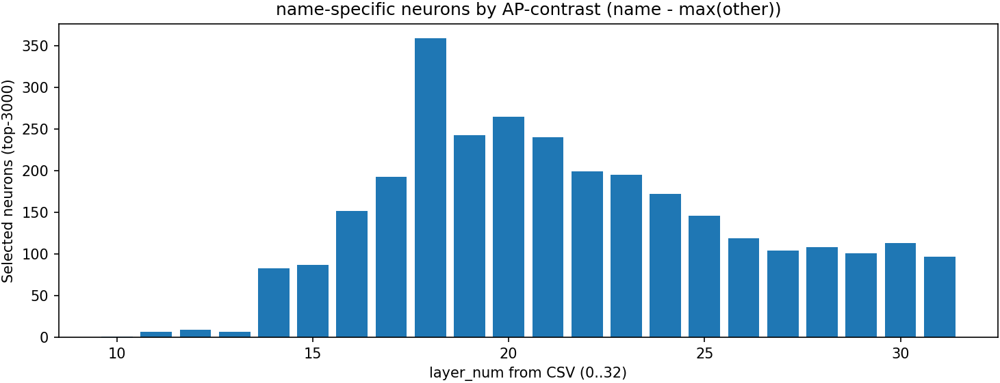


Mask summary:
Total neurons: 3000
Decoder layers used (0-based): [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20] ...


In [ ]:
# =========================


K = 3000
EXCLUDE_LAYER_32 = True  # layer_32 is last decoder layer output in your expertise CSV

# =========================
# LOAD (NO 'layer' column kept => no merge conflicts)
# =========================
def load_expertise_ap(path, rel):
    df = pd.read_csv(path)
    assert {"layer","unit","ap"}.issubset(df.columns)

    # layer is like "layer_00" ... "layer_32"
    df["layer_num"] = df["layer"].astype(str).str.extract(r"(\d+)").astype(int)  # 0..32
    df = df[["layer_num", "unit", "ap"]].copy()
    df = df.rename(columns={"ap": f"ap_{rel}"})

    # safety: ensure unique key
    if df.duplicated(["layer_num","unit"]).any():
        df = df.groupby(["layer_num","unit"], as_index=False).mean(numeric_only=True)

    return df

df_p = load_expertise_ap(PHONE, "phone")
df_j = load_expertise_ap(JOB,   "job")
df_e = load_expertise_ap(EMAIL, "email")
df_n = load_expertise_ap(NAME,  "name")
df_a = load_expertise_ap(ADDR,  "address")

# Merge on (layer_num, unit)
W = df_p.merge(df_j, on=["layer_num","unit"], how="inner") \
       .merge(df_e, on=["layer_num","unit"], how="inner") \
       .merge(df_n, on=["layer_num","unit"], how="inner") \
       .merge(df_a, on=["layer_num","unit"], how="inner")

print("Wide table shape:", W.shape)

# =========================
# Optional: exclude layer_32 (decoder last layer output)
# =========================
if EXCLUDE_LAYER_32:
    W = W[W["layer_num"] != 32].copy()

# =========================
# Phone-specific contrast score
# =========================

other_cols = ["ap_job","ap_email","ap_phone","ap_address"]
W["other_max_ap"] = W[other_cols].max(axis=1)
W["contrast_ap"]  = W["ap_name"] - W["other_max_ap"]

# Keep only neurons where phone >= max(other)
W = W[W["contrast_ap"] >= 0].copy()

W_top = W.sort_values("contrast_ap", ascending=False).head(K).copy()

print("\nTop-20 name-specific neurons (AP-contrast):")
print(W_top[["layer_num","unit","ap_name","other_max_ap","contrast_ap"] + other_cols].head(20))

# =========================
# Plot layer distribution
# =========================
cnt = W_top["layer_num"].value_counts().sort_index()
plt.figure(figsize=(10,4))
plt.bar(cnt.index.astype(int), cnt.values)
plt.xlabel("layer_num from CSV (0..32)")
plt.ylabel(f"Selected neurons (top-{K})")
plt.title("name-specific neurons by AP-contrast (name - max(other))")
plt.tight_layout()
plt.show()

# =========================
# Build decoder-layer mask
# IMPORTANT mapping:
# layer_num 0 is embeddings output (layer_00) -> skip
# layer_num 1..32 corresponds to decoder layers 0..31  (decoder_idx = layer_num - 1)
# =========================
mask_name_specific = {}
for L, g in W_top.groupby("layer_num"):
    L = int(L)
    if L == 0:
        continue  # skip embeddings
    decoder_idx = L - 1  # 1..32 -> 0..31
    if 0 <= decoder_idx <= 31:
        mask_name_specific[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)

print("\nMask summary:")
print("Total neurons:", sum(len(v) for v in mask_name_specific.values()))
print("Decoder layers used (0-based):", sorted(mask_name_specific.keys())[:12], "...")

In [ ]:
import torch
import pandas as pd
import numpy as np

# W_top must contain: layer_num, unit, contrast_ap (from your AP-confusor selection)
K = 9000

EXCLUDE_32 = True

Wk = W.sort_values("contrast_ap", ascending=False).head(K).copy()
if EXCLUDE_32:
    Wk = Wk[Wk["layer_num"] != 32].copy()

mask_ap = {}
for L, g in Wk.groupby("layer_num"):
    L = int(L)
    if L == 0:
        continue
    decoder_idx = L - 1  # layer_num 1..32 -> decoder 0..31
    if 0 <= decoder_idx <= 31:
        mask_ap[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)

print("Mask neurons:", sum(len(v) for v in mask_ap.values()))
print("Decoder layers used:", sorted(mask_ap.keys()))

Mask neurons: 9000
Decoder layers used: [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]


In [ ]:
import numpy as np
import torch

K = 9000
EXCLUDE_32 = True
TARGET = "name"

other_rels = [r for r in ["phone","email","address","name"] if r != TARGET]
other_cols = [f"ap_{r}" for r in other_rels]

W2 = W.copy()
W2["other_max_ap"] = W2[other_cols].max(axis=1)
W2["contrast_ap"]  = W2[f"ap_{TARGET}"] - W2["other_max_ap"]

# keep only target >= max(other)  (optional but usually intended for "specific")
W2 = W2[W2["contrast_ap"] >= 0].copy()

Wk = W2.sort_values("contrast_ap", ascending=False).head(K).copy()
if EXCLUDE_32:
    Wk = Wk[Wk["layer_num"] != 32].copy()

mask_ap = {}
for L, g in Wk.groupby("layer_num"):
    L = int(L)
    if L == 0:
        continue
    decoder_idx = L - 1
    if 0 <= decoder_idx <= 31:
        mask_ap[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)

print("Mask neurons:", sum(len(v) for v in mask_ap.values()))
print("Decoder layers used:", sorted(mask_ap.keys()))

Mask neurons: 9000
Decoder layers used: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]


In [ ]:
import re
import torch
import numpy as np
from collections import defaultdict

# ---------------------------------------------------------
# 1) Utilities you already use (keep these)
# ---------------------------------------------------------
def clean_pred(pred: str) -> str:
    pred = pred.strip()
    pred = pred.replace("\uFFFD", "")
    pred = pred.replace("\x00", "")
    pred = re.sub(r"\s+$", "", pred)
    pred = pred.splitlines()[0].strip() if pred else ""
    return pred

def strip_last_assistant(conversations):
    conv = list(conversations)
    if conv and conv[-1].get("role") == "assistant":
        conv = conv[:-1]
    return conv

def extract_question(conv):
    for m in conv:
        if m["role"] == "user" and "### Question:" in m["content"]:
            text = m["content"]
            return text.split("### Question:")[1].split("### Instruction:")[0].strip()
    return ""

def extract_gold(conv):
    for m in conv:
        if m["role"] == "assistant":
            return (m["content"] or "").strip()
    return ""

def field_bucket(question):
    q = question.lower()
    if "email" in q: return "email"
    if "phone" in q: return "phone"
    if "address" in q: return "address"
    if "job" in q: return "job"
    if "full name" in q or "person's name" in q: return "name"
    return "other"


# ---------------------------------------------------------
# 2) Hook builders (ZERO and SANE)
# ---------------------------------------------------------
class AblationHooks:
    """
    Context manager that registers forward hooks on selected decoder layers
    to modify the layer output hidden states.
    """

    def __init__(self, model, mask=None, mode="zero", beta=0.65, device=None):
        """
        mask: dict[int -> torch.LongTensor units]  (decoder layer idx -> unit ids)
        mode: "zero" or "sane"
        beta: for sane/scaled-sign. scaling = 1 - 2*beta (beta in [0,1])
              beta=0.5 -> no change; beta=1 -> full sign flip (-1)
        """
        self.model = model
        self.mask = mask or {}
        self.mode = mode
        self.beta = beta
        self.handles = []
        self.device = device or ("cuda" if torch.cuda.is_available() else "cpu")

        # scale factor: 1 - 2*beta
        self.scale = 1.0 - 2.0 * float(beta)

    def _hook_fn(self, layer_idx):
        units = self.mask[layer_idx]  # LongTensor [k]
        def hook(module, inp, out):
            # LlamaDecoderLayer returns a tensor [B, T, H] or tuple; handle both
            if isinstance(out, tuple):
                hs = out[0]
                rest = out[1:]
            else:
                hs = out
                rest = None

            # IMPORTANT: edit copy in-place on hs
            # hs shape: [B,T,H]
            if hs is None:
                return out

            # Ensure units on correct device
            u = units.to(hs.device)

            if self.mode == "zero":
                # set selected dimensions to zero
                hs[..., u] = 0.0

            elif self.mode == "sane":
                # scaled sign flip: hs = scale * hs on selected dims
                # beta=0.65 -> scale = 1 - 1.3 = -0.3 (partial flip)
                hs[..., u] = self.scale * hs[..., u]

            else:
                raise ValueError(f"Unknown mode: {self.mode}")

            if rest is None:
                return hs
            else:
                return (hs, *rest)
        return hook

    def __enter__(self):
        # Llama decoder layers are at model.model.layers
        layers = self.model.model.layers
        for layer_idx, units in self.mask.items():
            if layer_idx < 0 or layer_idx >= len(layers):
                continue
            handle = layers[layer_idx].register_forward_hook(self._hook_fn(layer_idx))
            self.handles.append(handle)
        return self

    def __exit__(self, exc_type, exc, tb):
        for h in self.handles:
            h.remove()
        self.handles = []


# ---------------------------------------------------------
# 3) Prediction (generation) with optional ablation hooks
# ---------------------------------------------------------
def predict_one(conversations, model, tokenizer, max_new_tokens=32,
                mask=None, mode=None, beta=0.65):
    """
    If mode is None => no ablation.
    mode: "zero" or "sane"
    """
    conv_prompt = strip_last_assistant(conversations)

    prompt = tokenizer.apply_chat_template(
        conv_prompt,
        tokenize=False,
        add_generation_prompt=True,
    )
    inputs = tokenizer(prompt, return_tensors="pt", truncation=True).to(model.device)

    ctx = AblationHooks(model, mask=mask, mode=mode, beta=beta) if mode else None
    if ctx:
        ctx.__enter__()
    try:
        with torch.no_grad():
            out = model.generate(
                **inputs,
                max_new_tokens=max_new_tokens,
                do_sample=False,
                temperature=None,
                top_p=None,
                use_cache=True,
            )
        gen_tokens = out[0, inputs["input_ids"].shape[1]:]
        pred = tokenizer.decode(gen_tokens, skip_special_tokens=True)
        return clean_pred(pred)
    finally:
        if ctx:
            ctx.__exit__(None, None, None)


# ---------------------------------------------------------
# 4) Evaluation on ds["test"] (EM per relation)
# ---------------------------------------------------------
def eval_em(ds_split, model, tokenizer, n_per_relation=20, mask=None,
            mode=None, beta=0.65, max_new_tokens=16):
    """
    Returns dict: EM per field (email/phone/address/job/name)
    """
    buckets = defaultdict(list)
    for ex in ds_split:
        conv = ex["conversations"]
        q = extract_question(conv)
        f = field_bucket(q)
        if f in ["email","phone","address","job","name"]:
            buckets[f].append(ex)

    results = {}
    for f in ["address","email","job","name","phone"]:
        examples = buckets[f][:n_per_relation]
        if len(examples) == 0:
            results[f] = float("nan")
            continue

        correct = 0
        for ex in examples:
            conv = ex["conversations"]
            gold = clean_pred(extract_gold(conv))
            pred = predict_one(conv, model, tokenizer,
                               max_new_tokens=max_new_tokens,
                               mask=mask, mode=mode, beta=beta)
            if pred == gold:
                correct += 1
        results[f] = correct / len(examples)
    return results


# ---------------------------------------------------------
# 5) Convenience wrappers
# ---------------------------------------------------------
def eval_em_zero(ds_split, model, tokenizer, n_per_relation=20, mask=None, max_new_tokens=16):
    return eval_em(ds_split, model, tokenizer, n_per_relation=n_per_relation,
                   mask=mask, mode="zero", beta=0.65, max_new_tokens=max_new_tokens)

def eval_em_sane(ds_split, model, tokenizer, n_per_relation=20, mask=None, beta=0.65, max_new_tokens=16):
    # "sane" here means scaled-sign flip on selected neurons
    return eval_em(ds_split, model, tokenizer, n_per_relation=n_per_relation,
                   mask=mask, mode="sane", beta=beta, max_new_tokens=max_new_tokens)


In [ ]:
import torch
import pandas as pd

Ks = [5000, 6000, 7000, 8000, 9000]
EXCLUDE_32 = True
BETA = 0.60

all_rows = []

for K in Ks:
    # 1) pick top-K by contrast_ap
    Wk = W.sort_values("contrast_ap", ascending=False).head(K).copy()
    if EXCLUDE_32:
        Wk = Wk[Wk["layer_num"] != 32].copy()

    # 2) build mask_ap: decoder_idx -> units
    mask_ap = {}
    for L, g in Wk.groupby("layer_num"):
        L = int(L)
        if L == 0:
            continue
        decoder_idx = L - 1  # layer_num 1..32 -> decoder 0..31
        if 0 <= decoder_idx <= 31:
            mask_ap[decoder_idx] = torch.tensor(
                g["unit"].astype(int).values, dtype=torch.long
            )

    # 3) run SANE
    res = eval_em_sane(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap, beta=BETA)

    # 4) log / print
    row = {
        "K": K,
        "beta": BETA,
        "scale": 1 - 2*BETA,
        "mask_neurons": int(sum(len(v) for v in mask_ap.values())),
        "layers_used": int(len(mask_ap)),
        **res
    }
    all_rows.append(row)

    print("="*90)
    print(f"K={K} | beta={BETA:.2f} | scale={1-2*BETA:.2f} | neurons={row['mask_neurons']} | layers={row['layers_used']}")
    print(res)

# 5) summary table
df_sane = pd.DataFrame(all_rows).sort_values("K")
print("\n=== SUMMARY ===")
print(df_sane[["K","beta","scale","mask_neurons","layers_used","address","email","job","name","phone"]])

# Optional: save
OUT_CSV = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/sane_sweep_K5000_9000_beta060_name.csv"
df_sane.to_csv(OUT_CSV, index=False)
print("✅ Saved:", OUT_CSV)


K=5000 | beta=0.60 | scale=-0.20 | neurons=5000 | layers=26
{'address': 0.72, 'email': 0.94, 'job': 0.98, 'name': 0.78, 'phone': 0.93}
K=6000 | beta=0.60 | scale=-0.20 | neurons=6000 | layers=27
{'address': 0.16, 'email': 0.43, 'job': 0.84, 'name': 0.12, 'phone': 0.38}
K=7000 | beta=0.60 | scale=-0.20 | neurons=7000 | layers=28
{'address': 0.04, 'email': 0.61, 'job': 0.55, 'name': 0.24, 'phone': 0.04}
K=8000 | beta=0.60 | scale=-0.20 | neurons=8000 | layers=29
{'address': 0.1, 'email': 0.32, 'job': 0.85, 'name': 0.36, 'phone': 0.04}
K=9000 | beta=0.60 | scale=-0.20 | neurons=9000 | layers=29
{'address': 0.07, 'email': 0.22, 'job': 0.77, 'name': 0.4, 'phone': 0.04}

=== SUMMARY ===
      K  beta  scale  mask_neurons  layers_used  address  email   job  name  \
0  5000   0.6   -0.2          5000           26     0.72   0.94  0.98  0.78   
1  6000   0.6   -0.2          6000           27     0.16   0.43  0.84  0.12   
2  7000   0.6   -0.2          7000           28     0.04   0.61  0.55  0.

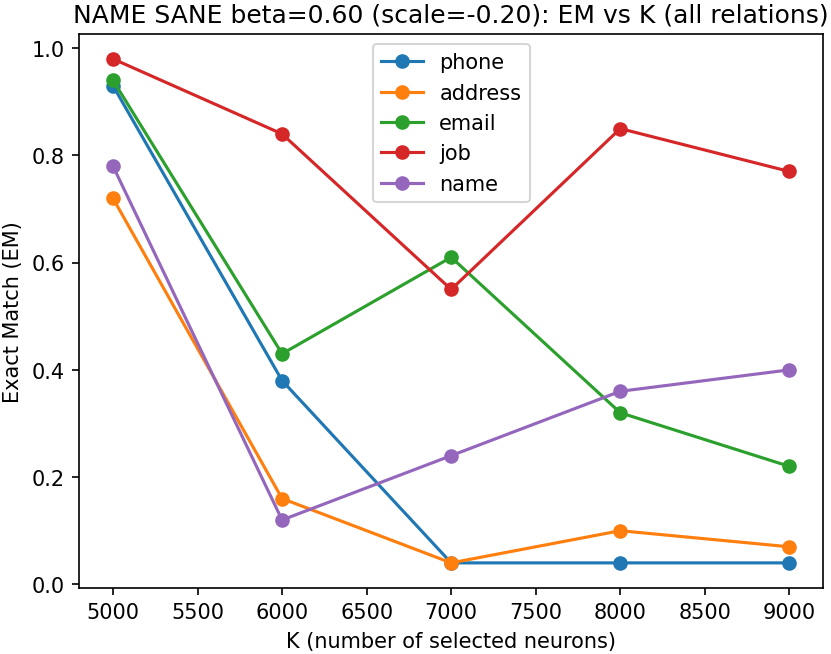

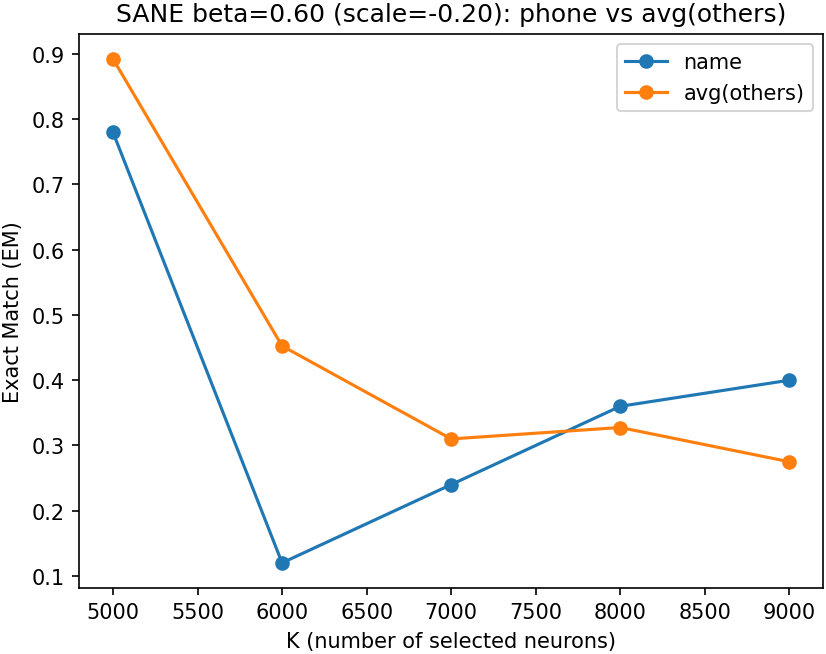

In [ ]:
import matplotlib.pyplot as plt

# Plot 1: name EM vs all relations in one plot
plt.figure()
for col in ["phone", "address", "email", "job", "name"]:
    plt.plot(df_sane["K"], df_sane[col], marker="o", label=col)
plt.xlabel("K (number of selected neurons)")
plt.ylabel("Exact Match (EM)")
plt.title("NAME SANE beta=0.60 (scale=-0.20): EM vs K (all relations)")
plt.legend()
plt.show()

# Plot 2: Phone EM vs average others
df_sane["avg_others"] = df_sane[["address", "email", "job", "phone"]].mean(axis=1)

plt.figure()
plt.plot(df_sane["K"], df_sane["name"], marker="o", label="name")
plt.plot(df_sane["K"], df_sane["avg_others"], marker="o", label="avg(others)")
plt.xlabel("K (number of selected neurons)")
plt.ylabel("Exact Match (EM)")
plt.title("SANE beta=0.60 (scale=-0.20): phone vs avg(others)")
plt.legend()
plt.show()


#job

In [ ]:
# PATHS (EDIT THESE)
# =========================
PHONE = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_phone_test.csv"
JOB   = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_job_test.csv"
EMAIL = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_email_test.csv"
NAME  = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_name_test.csv"
ADDR  = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/expertise_address_test.csv"

In [ ]:
# =========================


K = 3000
EXCLUDE_LAYER_32 = True  # layer_32 is last decoder layer output in your expertise CSV

# =========================
# LOAD (NO 'layer' column kept => no merge conflicts)
# =========================
def load_expertise_ap(path, rel):
    df = pd.read_csv(path)
    assert {"layer","unit","ap"}.issubset(df.columns)

    # layer is like "layer_00" ... "layer_32"
    df["layer_num"] = df["layer"].astype(str).str.extract(r"(\d+)").astype(int)  # 0..32
    df = df[["layer_num", "unit", "ap"]].copy()
    df = df.rename(columns={"ap": f"ap_{rel}"})

    # safety: ensure unique key
    if df.duplicated(["layer_num","unit"]).any():
        df = df.groupby(["layer_num","unit"], as_index=False).mean(numeric_only=True)

    return df

df_p = load_expertise_ap(PHONE, "phone")
df_j = load_expertise_ap(JOB,   "job")
df_e = load_expertise_ap(EMAIL, "email")
df_n = load_expertise_ap(NAME,  "name")
df_a = load_expertise_ap(ADDR,  "address")

# Merge on (layer_num, unit)
W = df_p.merge(df_j, on=["layer_num","unit"], how="inner") \
       .merge(df_e, on=["layer_num","unit"], how="inner") \
       .merge(df_n, on=["layer_num","unit"], how="inner") \
       .merge(df_a, on=["layer_num","unit"], how="inner")

print("Wide table shape:", W.shape)

# =========================
# Optional: exclude layer_32 (decoder last layer output)
# =========================
if EXCLUDE_LAYER_32:
    W = W[W["layer_num"] != 32].copy()

# =========================
# Phone-specific contrast score
# =========================

other_cols = ["ap_name","ap_email","ap_phone","ap_address"]
W["other_max_ap"] = W[other_cols].max(axis=1)
W["contrast_ap"]  = W["ap_job"] - W["other_max_ap"]

# Keep only neurons where phone >= max(other)
W = W[W["contrast_ap"] >= 0].copy()

W_top = W.sort_values("contrast_ap", ascending=False).head(K).copy()

print("\nTop-20 job-specific neurons (AP-contrast):")
print(W_top[["layer_num","unit","ap_job","other_max_ap","contrast_ap"] + other_cols].head(20))



Wide table shape: (135168, 7)

Top-20 job-specific neurons (AP-contrast):
        layer_num  unit    ap_job  other_max_ap  contrast_ap   ap_name  \
119271         29   487  0.721524      0.438598     0.282926  0.434599   
123367         30   487  0.747495      0.472508     0.274986  0.472508   
85766          20  3846  0.633573      0.366293     0.267280  0.366293   
87962          21  1946  0.665404      0.415844     0.249560  0.415844   
124946         30  2066  0.628925      0.383054     0.245870  0.378749   
115175         28   487  0.691044      0.449076     0.241968  0.421409   
77592          18  3864  0.647932      0.412642     0.235289  0.388066   
111079         27   487  0.651069      0.421722     0.229347  0.376383   
124191         30  1311  0.762136      0.540406     0.221730  0.540406   
87537          21  1521  0.644220      0.424184     0.220036  0.424184   
105204         25  2804  0.639270      0.420344     0.218926  0.391021   
106746         26   250  0.640625     

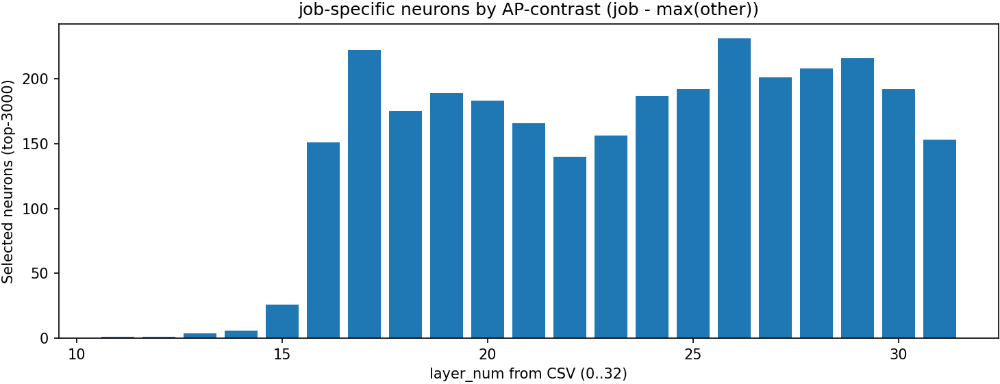


Mask summary:
Total neurons: 3000
Decoder layers used (0-based): [10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21] ...


In [ ]:
# =========================
# Plot layer distribution
# =========================
cnt = W_top["layer_num"].value_counts().sort_index()
plt.figure(figsize=(10,4))
plt.bar(cnt.index.astype(int), cnt.values)
plt.xlabel("layer_num from CSV (0..32)")
plt.ylabel(f"Selected neurons (top-{K})")
plt.title("job-specific neurons by AP-contrast (job - max(other))")
plt.tight_layout()
plt.show()

# =========================
# Build decoder-layer mask
# IMPORTANT mapping:
# layer_num 0 is embeddings output (layer_00) -> skip
# layer_num 1..32 corresponds to decoder layers 0..31  (decoder_idx = layer_num - 1)
# =========================
mask_name_specific = {}
for L, g in W_top.groupby("layer_num"):
    L = int(L)
    if L == 0:
        continue  # skip embeddings
    decoder_idx = L - 1  # 1..32 -> 0..31
    if 0 <= decoder_idx <= 31:
        mask_name_specific[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)

print("\nMask summary:")
print("Total neurons:", sum(len(v) for v in mask_name_specific.values()))
print("Decoder layers used (0-based):", sorted(mask_name_specific.keys())[:12], "...")

In [ ]:
import torch
import pandas as pd
import numpy as np

# W_top must contain: layer_num, unit, contrast_ap (from your AP-confusor selection)
K = 9000

EXCLUDE_32 = True

Wk = W.sort_values("contrast_ap", ascending=False).head(K).copy()
if EXCLUDE_32:
    Wk = Wk[Wk["layer_num"] != 32].copy()

mask_ap = {}
for L, g in Wk.groupby("layer_num"):
    L = int(L)
    if L == 0:
        continue
    decoder_idx = L - 1  # layer_num 1..32 -> decoder 0..31
    if 0 <= decoder_idx <= 31:
        mask_ap[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)

print("Mask neurons:", sum(len(v) for v in mask_ap.values()))
print("Decoder layers used:", sorted(mask_ap.keys()))

Mask neurons: 9000
Decoder layers used: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]


In [ ]:
# import numpy as np
# import torch

# K = 9000
# EXCLUDE_32 = True
# TARGET = "job"

# other_rels = [r for r in ["phone","email","address","name"] if r != TARGET]
# other_cols = [f"ap_{r}" for r in other_rels]

# W2 = W.copy()
# W2["other_max_ap"] = W2[other_cols].max(axis=1)
# W2["contrast_ap"]  = W2[f"ap_{TARGET}"] - W2["other_max_ap"]

# # keep only target >= max(other)  (optional but usually intended for "specific")
# W2 = W2[W2["contrast_ap"] >= 0].copy()

# Wk = W2.sort_values("contrast_ap", ascending=False).head(K).copy()
# if EXCLUDE_32:
#     Wk = Wk[Wk["layer_num"] != 32].copy()

# mask_ap = {}
# for L, g in Wk.groupby("layer_num"):
#     L = int(L)
#     if L == 0:
#         continue
#     decoder_idx = L - 1
#     if 0 <= decoder_idx <= 31:
#         mask_ap[decoder_idx] = torch.tensor(g["unit"].astype(int).values, dtype=torch.long)

# print("Mask neurons:", sum(len(v) for v in mask_ap.values()))
# print("Decoder layers used:", sorted(mask_ap.keys()))

Mask neurons: 9000
Decoder layers used: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]


In [ ]:
import re
import torch
import numpy as np
from collections import defaultdict

# ---------------------------------------------------------
# 1) Utilities you already use (keep these)
# ---------------------------------------------------------
def clean_pred(pred: str) -> str:
    pred = pred.strip()
    pred = pred.replace("\uFFFD", "")
    pred = pred.replace("\x00", "")
    pred = re.sub(r"\s+$", "", pred)
    pred = pred.splitlines()[0].strip() if pred else ""
    return pred

def strip_last_assistant(conversations):
    conv = list(conversations)
    if conv and conv[-1].get("role") == "assistant":
        conv = conv[:-1]
    return conv

def extract_question(conv):
    for m in conv:
        if m["role"] == "user" and "### Question:" in m["content"]:
            text = m["content"]
            return text.split("### Question:")[1].split("### Instruction:")[0].strip()
    return ""

def extract_gold(conv):
    for m in conv:
        if m["role"] == "assistant":
            return (m["content"] or "").strip()
    return ""

def field_bucket(question):
    q = question.lower()
    if "email" in q: return "email"
    if "phone" in q: return "phone"
    if "address" in q: return "address"
    if "job" in q: return "job"
    if "full name" in q or "person's name" in q: return "name"
    return "other"


# ---------------------------------------------------------
# 2) Hook builders (ZERO and SANE)
# ---------------------------------------------------------
class AblationHooks:
    """
    Context manager that registers forward hooks on selected decoder layers
    to modify the layer output hidden states.
    """

    def __init__(self, model, mask=None, mode="zero", beta=0.65, device=None):
        """
        mask: dict[int -> torch.LongTensor units]  (decoder layer idx -> unit ids)
        mode: "zero" or "sane"
        beta: for sane/scaled-sign. scaling = 1 - 2*beta (beta in [0,1])
              beta=0.5 -> no change; beta=1 -> full sign flip (-1)
        """
        self.model = model
        self.mask = mask or {}
        self.mode = mode
        self.beta = beta
        self.handles = []
        self.device = device or ("cuda" if torch.cuda.is_available() else "cpu")

        # scale factor: 1 - 2*beta
        self.scale = 1.0 - 2.0 * float(beta)

    def _hook_fn(self, layer_idx):
        units = self.mask[layer_idx]  # LongTensor [k]
        def hook(module, inp, out):
            # LlamaDecoderLayer returns a tensor [B, T, H] or tuple; handle both
            if isinstance(out, tuple):
                hs = out[0]
                rest = out[1:]
            else:
                hs = out
                rest = None

            # IMPORTANT: edit copy in-place on hs
            # hs shape: [B,T,H]
            if hs is None:
                return out

            # Ensure units on correct device
            u = units.to(hs.device)

            if self.mode == "zero":
                # set selected dimensions to zero
                hs[..., u] = 0.0

            elif self.mode == "sane":
                # scaled sign flip: hs = scale * hs on selected dims
                # beta=0.65 -> scale = 1 - 1.3 = -0.3 (partial flip)
                hs[..., u] = self.scale * hs[..., u]

            else:
                raise ValueError(f"Unknown mode: {self.mode}")

            if rest is None:
                return hs
            else:
                return (hs, *rest)
        return hook

    def __enter__(self):
        # Llama decoder layers are at model.model.layers
        layers = self.model.model.layers
        for layer_idx, units in self.mask.items():
            if layer_idx < 0 or layer_idx >= len(layers):
                continue
            handle = layers[layer_idx].register_forward_hook(self._hook_fn(layer_idx))
            self.handles.append(handle)
        return self

    def __exit__(self, exc_type, exc, tb):
        for h in self.handles:
            h.remove()
        self.handles = []


# ---------------------------------------------------------
# 3) Prediction (generation) with optional ablation hooks
# ---------------------------------------------------------
def predict_one(conversations, model, tokenizer, max_new_tokens=32,
                mask=None, mode=None, beta=0.65):
    """
    If mode is None => no ablation.
    mode: "zero" or "sane"
    """
    conv_prompt = strip_last_assistant(conversations)

    prompt = tokenizer.apply_chat_template(
        conv_prompt,
        tokenize=False,
        add_generation_prompt=True,
    )
    inputs = tokenizer(prompt, return_tensors="pt", truncation=True).to(model.device)

    ctx = AblationHooks(model, mask=mask, mode=mode, beta=beta) if mode else None
    if ctx:
        ctx.__enter__()
    try:
        with torch.no_grad():
            out = model.generate(
                **inputs,
                max_new_tokens=max_new_tokens,
                do_sample=False,
                temperature=None,
                top_p=None,
                use_cache=True,
            )
        gen_tokens = out[0, inputs["input_ids"].shape[1]:]
        pred = tokenizer.decode(gen_tokens, skip_special_tokens=True)
        return clean_pred(pred)
    finally:
        if ctx:
            ctx.__exit__(None, None, None)


# ---------------------------------------------------------
# 4) Evaluation on ds["test"] (EM per relation)
# ---------------------------------------------------------
def eval_em(ds_split, model, tokenizer, n_per_relation=20, mask=None,
            mode=None, beta=0.65, max_new_tokens=16):
    """
    Returns dict: EM per field (email/phone/address/job/name)
    """
    buckets = defaultdict(list)
    for ex in ds_split:
        conv = ex["conversations"]
        q = extract_question(conv)
        f = field_bucket(q)
        if f in ["email","phone","address","job","name"]:
            buckets[f].append(ex)

    results = {}
    for f in ["address","email","job","name","phone"]:
        examples = buckets[f][:n_per_relation]
        if len(examples) == 0:
            results[f] = float("nan")
            continue

        correct = 0
        for ex in examples:
            conv = ex["conversations"]
            gold = clean_pred(extract_gold(conv))
            pred = predict_one(conv, model, tokenizer,
                               max_new_tokens=max_new_tokens,
                               mask=mask, mode=mode, beta=beta)
            if pred == gold:
                correct += 1
        results[f] = correct / len(examples)
    return results


# ---------------------------------------------------------
# 5) Convenience wrappers
# ---------------------------------------------------------
def eval_em_zero(ds_split, model, tokenizer, n_per_relation=20, mask=None, max_new_tokens=16):
    return eval_em(ds_split, model, tokenizer, n_per_relation=n_per_relation,
                   mask=mask, mode="zero", beta=0.65, max_new_tokens=max_new_tokens)

def eval_em_sane(ds_split, model, tokenizer, n_per_relation=20, mask=None, beta=0.65, max_new_tokens=16):
    # "sane" here means scaled-sign flip on selected neurons
    return eval_em(ds_split, model, tokenizer, n_per_relation=n_per_relation,
                   mask=mask, mode="sane", beta=beta, max_new_tokens=max_new_tokens)


In [ ]:
import torch
import pandas as pd

Ks = [5000, 6000, 7000, 8000, 9000]
EXCLUDE_32 = True
BETA = 0.60

all_rows = []

for K in Ks:
    # 1) pick top-K by contrast_ap
    Wk = W.sort_values("contrast_ap", ascending=False).head(K).copy()
    if EXCLUDE_32:
        Wk = Wk[Wk["layer_num"] != 32].copy()

    # 2) build mask_ap: decoder_idx -> units
    mask_ap = {}
    for L, g in Wk.groupby("layer_num"):
        L = int(L)
        if L == 0:
            continue
        decoder_idx = L - 1  # layer_num 1..32 -> decoder 0..31
        if 0 <= decoder_idx <= 31:
            mask_ap[decoder_idx] = torch.tensor(
                g["unit"].astype(int).values, dtype=torch.long
            )

    # 3) run SANE
    res = eval_em_sane(ds["test"], model, tokenizer, n_per_relation=N, mask=mask_ap, beta=BETA)

    # 4) log / print
    row = {
        "K": K,
        "beta": BETA,
        "scale": 1 - 2*BETA,
        "mask_neurons": int(sum(len(v) for v in mask_ap.values())),
        "layers_used": int(len(mask_ap)),
        **res
    }
    all_rows.append(row)

    print("="*90)
    print(f"K={K} | beta={BETA:.2f} | scale={1-2*BETA:.2f} | neurons={row['mask_neurons']} | layers={row['layers_used']}")
    print(res)

# 5) summary table
df_sane = pd.DataFrame(all_rows).sort_values("K")
print("\n=== SUMMARY ===")
print(df_sane[["K","beta","scale","mask_neurons","layers_used","address","email","job","name","phone"]])

# Optional: save
OUT_CSV = "/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/sane_sweep_K5000_9000_beta060_job.csv"
df_sane.to_csv(OUT_CSV, index=False)
print("✅ Saved:", OUT_CSV)


K=5000 | beta=0.60 | scale=-0.20 | neurons=5000 | layers=25
{'address': 0.93, 'email': 0.85, 'job': 0.95, 'name': 0.96, 'phone': 1.0}
K=6000 | beta=0.60 | scale=-0.20 | neurons=6000 | layers=27
{'address': 0.92, 'email': 0.82, 'job': 0.87, 'name': 0.93, 'phone': 0.99}
K=7000 | beta=0.60 | scale=-0.20 | neurons=7000 | layers=27
{'address': 0.37, 'email': 0.48, 'job': 0.82, 'name': 0.42, 'phone': 0.8}
K=8000 | beta=0.60 | scale=-0.20 | neurons=8000 | layers=30
{'address': 0.47, 'email': 0.47, 'job': 0.62, 'name': 0.36, 'phone': 0.71}
K=9000 | beta=0.60 | scale=-0.20 | neurons=9000 | layers=30
{'address': 0.33, 'email': 0.41, 'job': 0.31, 'name': 0.32, 'phone': 0.71}

=== SUMMARY ===
      K  beta  scale  mask_neurons  layers_used  address  email   job  name  \
0  5000   0.6   -0.2          5000           25     0.93   0.85  0.95  0.96   
1  6000   0.6   -0.2          6000           27     0.92   0.82  0.87  0.93   
2  7000   0.6   -0.2          7000           27     0.37   0.48  0.82  0.

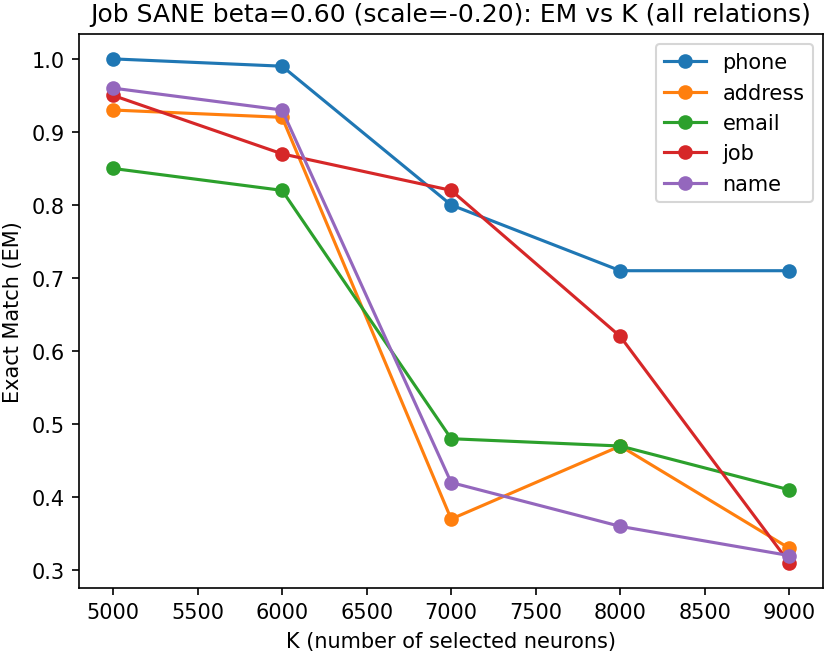

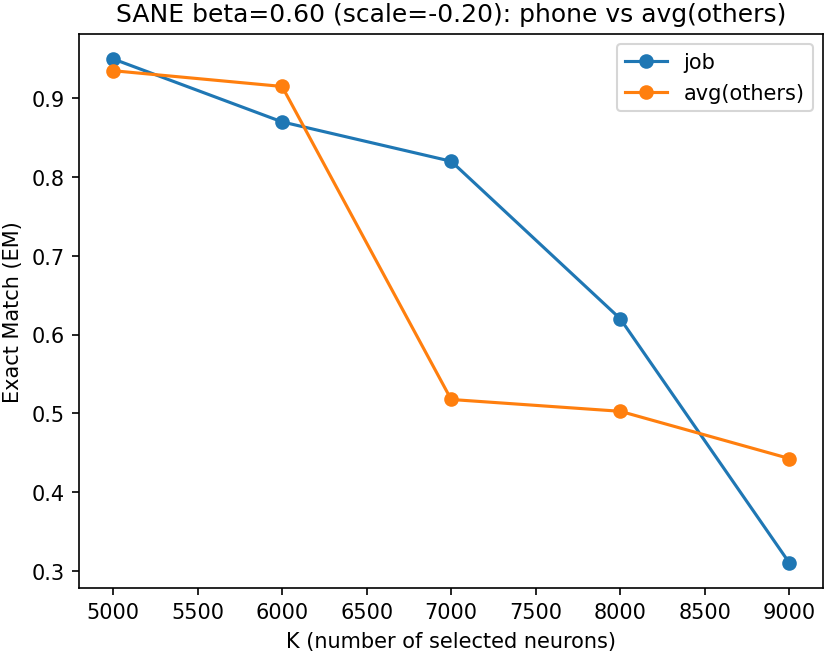

In [ ]:
import matplotlib.pyplot as plt

# Plot 1: name EM vs all relations in one plot
plt.figure()
for col in ["phone", "address", "email", "job", "name"]:
    plt.plot(df_sane["K"], df_sane[col], marker="o", label=col)
plt.xlabel("K (number of selected neurons)")
plt.ylabel("Exact Match (EM)")
plt.title("Job SANE beta=0.60 (scale=-0.20): EM vs K (all relations)")
plt.legend()
plt.show()

# Plot 2: Phone EM vs average others
df_sane["avg_others"] = df_sane[["address", "email", "name", "phone"]].mean(axis=1)

plt.figure()
plt.plot(df_sane["K"], df_sane["job"], marker="o", label="job")
plt.plot(df_sane["K"], df_sane["avg_others"], marker="o", label="avg(others)")
plt.xlabel("K (number of selected neurons)")
plt.ylabel("Exact Match (EM)")
plt.title("SANE beta=0.60 (scale=-0.20): phone vs avg(others)")
plt.legend()
plt.show()


In [ ]:
phone_df=
email_df
address_df=
name_df = pd.read_csv("/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/sane_sweep_K5000_9000_beta060_name.csv")
job_df=pd.read_csv("/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/sane_sweep_K5000_9000_beta060_job.csv")

In [ ]:
name_df = pd.read_csv("/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/sane_sweep_K5000_9000_beta060_name.csv")

In [ ]:
name_df.head()

,K,beta,scale,mask_neurons,layers_used,address,email,job,name,phone
0,5000,0.6,-0.2,5000,26,0.72,0.94,0.98,0.78,0.93
1,6000,0.6,-0.2,6000,27,0.16,0.43,0.84,0.12,0.38
2,7000,0.6,-0.2,7000,28,0.04,0.61,0.55,0.24,0.04
3,8000,0.6,-0.2,8000,29,0.10,0.32,0.85,0.36,0.04
4,9000,0.6,-0.2,9000,29,0.07,0.22,0.77,0.40,0.04


In [ ]:
import pandas as pd

In [ ]:
phone_df=pd.read_csv("/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/sane_sweep_K5000_9000_beta060_2.csv")
email_df=pd.read_csv("/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/sane_sweep_K5000_9000_beta060_2_email.csv")
address_df=pd.read_csv("/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/sane_sweep_address_K5000_9000_beta060_address.csv")
name_df = pd.read_csv("/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/sane_sweep_K5000_9000_beta060_name.csv")
job_df=pd.read_csv("/content/drive/MyDrive/LLAMA_Unsloth/relneur_cache/all_relation/sane_sweep_K5000_9000_beta060_job.csv")

In [ ]:
phone_df.head()

,K,beta,scale,mask_neurons,layers_used,address,email,job,name,phone
0,5000,0.6,-0.2,5000,31,0.980,0.970,0.95,1.000,0.980
1,6000,0.6,-0.2,6000,31,0.970,0.905,0.87,0.985,0.845
2,7000,0.6,-0.2,7000,31,0.910,0.725,0.82,0.955,0.820
3,8000,0.6,-0.2,8000,31,0.875,0.785,0.70,0.915,0.585
4,9000,0.6,-0.2,9000,31,0.665,0.610,0.26,0.910,0.380


In [ ]:
email_df.head()

,K,beta,scale,mask_neurons,layers_used,address,email,job,name,phone
0,5000,0.6,-0.2,4821,19,0.95,1.00,0.90,1.0,1.00
1,6000,0.6,-0.2,5762,21,1.00,0.90,0.95,0.9,0.85
2,7000,0.6,-0.2,6720,24,0.95,1.00,0.95,0.9,1.00
3,8000,0.6,-0.2,7665,25,0.90,0.95,0.95,0.6,0.80
4,9000,0.6,-0.2,8610,27,0.50,0.30,0.75,0.8,0.40


In [ ]:
address_df.head()

,K,target,beta,scale,mask_neurons,layers_used,address,email,job,name,phone
0,5000,address,0.6,-0.2,5000,31,0.91,0.96,0.97,0.99,0.92
1,6000,address,0.6,-0.2,6000,31,0.88,0.91,0.93,0.96,0.82
2,7000,address,0.6,-0.2,7000,31,0.22,0.63,0.71,0.79,0.05
3,8000,address,0.6,-0.2,8000,31,0.07,0.46,0.52,0.75,0.01
4,9000,address,0.6,-0.2,9000,31,0.09,0.39,0.55,0.47,0.00


In [ ]:
name_df.head()

,K,beta,scale,mask_neurons,layers_used,address,email,job,name,phone
0,5000,0.6,-0.2,5000,26,0.72,0.94,0.98,0.78,0.93
1,6000,0.6,-0.2,6000,27,0.16,0.43,0.84,0.12,0.38
2,7000,0.6,-0.2,7000,28,0.04,0.61,0.55,0.24,0.04
3,8000,0.6,-0.2,8000,29,0.10,0.32,0.85,0.36,0.04
4,9000,0.6,-0.2,9000,29,0.07,0.22,0.77,0.40,0.04


In [ ]:
job_df.head()

,K,beta,scale,mask_neurons,layers_used,address,email,job,name,phone
0,5000,0.6,-0.2,5000,25,0.93,0.85,0.95,0.96,1.00
1,6000,0.6,-0.2,6000,27,0.92,0.82,0.87,0.93,0.99
2,7000,0.6,-0.2,7000,27,0.37,0.48,0.82,0.42,0.80
3,8000,0.6,-0.2,8000,30,0.47,0.47,0.62,0.36,0.71
4,9000,0.6,-0.2,9000,30,0.33,0.41,0.31,0.32,0.71


In [ ]:
BASELINE: {'address': 1.0, 'email': 0.995, 'job': 0.985, 'name': 1.0, 'phone': 1.0}

         address  email   job  name  phone
phone      0.665   0.61  0.26  0.91   0.38
email      0.500   0.30  0.75  0.80   0.40
address    0.090   0.39  0.55  0.47   0.00
name       0.070   0.22  0.77  0.40   0.04
job        0.330   0.41  0.31  0.32   0.71


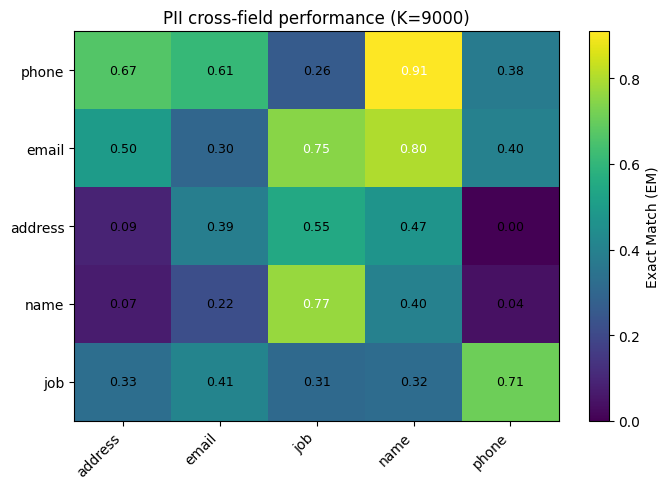

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

FIELDS = ["address", "email", "job", "name", "phone"]

# Put your 5-row tables into DataFrames (example: phone_df, email_df, address_df, name_df, job_df)
# Each must have a column K and the FIELDS columns.

# Example:
# phone_df = pd.DataFrame(...)
# email_df = pd.DataFrame(...)
# address_df = pd.DataFrame(...)
# name_df = pd.DataFrame(...)
# job_df = pd.DataFrame(...)

dfs = {
    "phone": phone_df,
    "email": email_df,
    "address": address_df,
    "name": name_df,
    "job": job_df,
}

K0 = 9000  # choose one K

# Build confusion-like matrix (rows=target, cols=field)
M = pd.DataFrame(index=dfs.keys(), columns=FIELDS, dtype=float)

for target, df in dfs.items():
    row = df.loc[df["K"] == K0, FIELDS]
    if row.empty:
        raise ValueError(f"{target}: no row found for K={K0}")
    M.loc[target] = row.iloc[0].values

print(M)

# Plot heatmap
plt.figure(figsize=(7,5))
# Heatmap
im = plt.imshow(M.values, aspect="auto", vmin=0.0, vmax=1.0)
plt.imshow(M.values, aspect="auto")
plt.xticks(range(len(FIELDS)), FIELDS, rotation=45, ha="right")
plt.yticks(range(len(M.index)), M.index)
plt.colorbar(label="Exact Match (EM)")
# --- write numbers inside boxes ---
for i in range(M.shape[0]):          # rows
    for j in range(M.shape[1]):      # cols
        val = M.iat[i, j]
        # choose text color for readability
        txt_color = "white" if val >= 0.75 else "black"
        plt.text(j, i, f"{val:.2f}", ha="center", va="center", color=txt_color, fontsize=9)

plt.title(f"PII cross-field performance (K={K0})")
plt.tight_layout()
plt.show()


         address  email   job  name  phone
address    0.090   0.39  0.55  0.47   0.00
email      0.500   0.30  0.75  0.80   0.40
job        0.330   0.41  0.31  0.32   0.71
name       0.070   0.22  0.77  0.40   0.04
phone      0.665   0.61  0.26  0.91   0.38


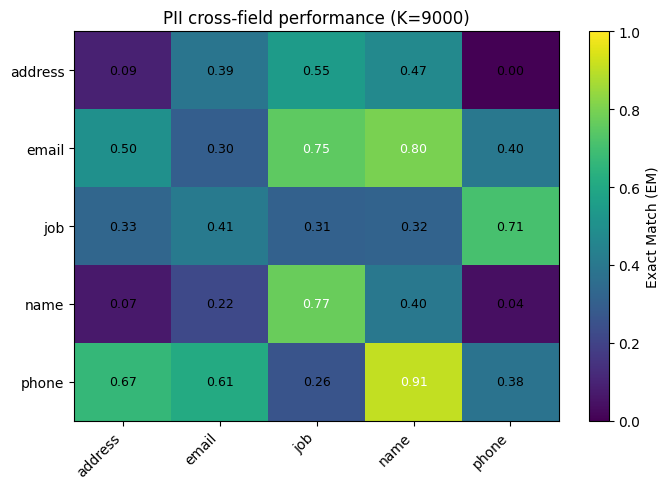

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

FIELDS = ["address", "email", "job", "name", "phone"]

# Explicit row order (targets)
ROW_ORDER = ["address", "email", "job", "name", "phone"]

dfs = {
    "phone": phone_df,
    "email": email_df,
    "address": address_df,
    "name": name_df,
    "job": job_df,
}

K0 = 9000  # choose one K

# Build confusion-like matrix (rows=target, cols=field) in a fixed order
M = pd.DataFrame(index=ROW_ORDER, columns=FIELDS, dtype=float)

for target in ROW_ORDER:
    df = dfs[target]
    row = df.loc[df["K"] == K0, FIELDS]
    if row.empty:
        raise ValueError(f"{target}: no row found for K={K0}")
    M.loc[target] = row.iloc[0].values

print(M)

# Plot heatmap
plt.figure(figsize=(7,5))
im = plt.imshow(M.values, aspect="auto", vmin=0.0, vmax=1.0)

plt.xticks(range(len(FIELDS)), FIELDS, rotation=45, ha="right")
plt.yticks(range(len(ROW_ORDER)), ROW_ORDER)
plt.colorbar(im, label="Exact Match (EM)")

# Write values inside boxes
for i in range(M.shape[0]):          # rows
    for j in range(M.shape[1]):      # cols
        val = float(M.iat[i, j])
        txt_color = "white" if val >= 0.75 else "black"
        plt.text(j, i, f"{val:.2f}", ha="center", va="center",
                 color=txt_color, fontsize=9)

plt.title(f"PII cross-field performance (K={K0})")
plt.tight_layout()
plt.show()


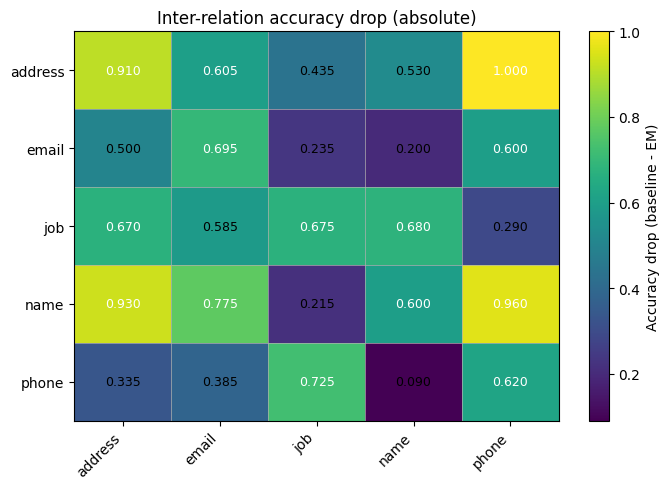

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

FIELDS = ["address", "email", "job", "name", "phone"]
ROW_ORDER = ["address", "email", "job", "name", "phone"]

BASELINE = {'address': 1.0, 'email': 0.995, 'job': 0.985, 'name': 1.0, 'phone': 1.0}

# Ensure order
M = M.reindex(index=ROW_ORDER, columns=FIELDS)

B = pd.Series(BASELINE).reindex(FIELDS)

# Drop matrices
DROP = (B - M).astype(float)                 # absolute drop
DROP_PCT = (DROP.div(B, axis=1) * 100)       # percent drop

# --- ABSOLUTE DROP HEATMAP ---
plt.figure(figsize=(7,5))
im = plt.imshow(DROP.values, aspect="auto")  # no fixed colors

plt.xticks(range(len(FIELDS)), FIELDS, rotation=45, ha="right")
plt.yticks(range(len(ROW_ORDER)), ROW_ORDER)
plt.colorbar(im, label="Accuracy drop (baseline - EM)")

# grid lines
ax = plt.gca()
ax.set_xticks(np.arange(-.5, len(FIELDS), 1), minor=True)
ax.set_yticks(np.arange(-.5, len(ROW_ORDER), 1), minor=True)
ax.grid(which="minor", linewidth=0.5)
ax.tick_params(which="minor", bottom=False, left=False)

# write values inside boxes
maxv = np.nanmax(DROP.values)
for i in range(DROP.shape[0]):
    for j in range(DROP.shape[1]):
        val = float(DROP.iat[i, j])
        txt_color = "white" if val >= 0.6*maxv else "black"
        plt.text(j, i, f"{val:.3f}", ha="center", va="center",
                 color=txt_color, fontsize=9)

plt.title("Inter-relation accuracy drop (absolute)")
plt.tight_layout()
plt.show()


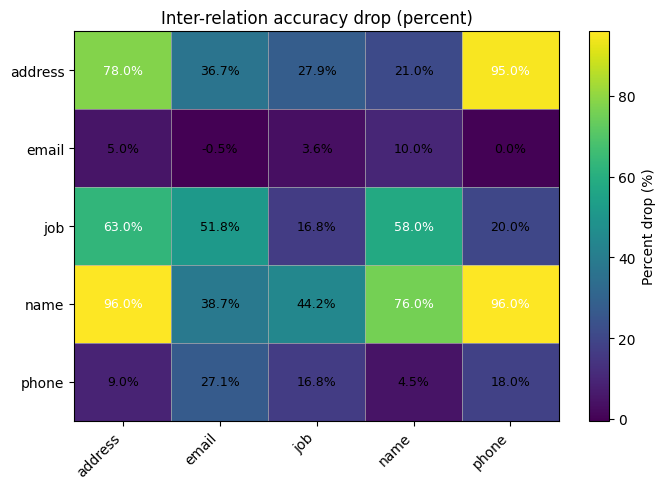

In [ ]:
plt.figure(figsize=(7,5))
im = plt.imshow(DROP_PCT.values, aspect="auto")

plt.xticks(range(len(FIELDS)), FIELDS, rotation=45, ha="right")
plt.yticks(range(len(ROW_ORDER)), ROW_ORDER)
plt.colorbar(im, label="Percent drop (%)")

# grid lines
ax = plt.gca()
ax.set_xticks(np.arange(-.5, len(FIELDS), 1), minor=True)
ax.set_yticks(np.arange(-.5, len(ROW_ORDER), 1), minor=True)
ax.grid(which="minor", linewidth=0.5)
ax.tick_params(which="minor", bottom=False, left=False)

# write values
maxv = np.nanmax(DROP_PCT.values)
for i in range(DROP_PCT.shape[0]):
    for j in range(DROP_PCT.shape[1]):
        val = float(DROP_PCT.iat[i, j])
        txt_color = "white" if val >= 0.6*maxv else "black"
        plt.text(j, i, f"{val:.1f}%", ha="center", va="center",
                 color=txt_color, fontsize=9)

plt.title("Inter-relation accuracy drop (percent)")
plt.tight_layout()
plt.show()


In [ ]:
FIELDS = ["address","email","job","name","phone"]
print("M.columns:", list(M.columns))
print("M.index:", list(M.index))

BASELINE = {'address': 1.0, 'email': 0.995, 'job': 0.985, 'name': 1.0, 'phone': 1.0}
B = pd.Series(BASELINE).reindex(FIELDS)
print("Baseline vector B:")
print(B)

# Force exact alignment
M2 = M.reindex(index=FIELDS, columns=FIELDS).astype(float)

DROP = B - M2   # baseline per column
print("Email drop column (all targets):")
print(DROP["email"])


M.columns: ['address', 'email', 'job', 'name', 'phone']
M.index: ['phone', 'email', 'address', 'name', 'job']
Baseline vector B:
address    1.000
email      0.995
job        0.985
name       1.000
phone      1.000
dtype: float64
Email drop column (all targets):
address    0.605
email      0.695
job        0.585
name       0.775
phone      0.385
Name: email, dtype: float64


Performance matrix M (K=9000):
         address  email   job   name  phone
address    0.070  0.460  0.52  0.750  0.010
email      0.900  0.950  0.95  0.600  0.800
job        0.470  0.470  0.62  0.360  0.710
name       0.100  0.320  0.85  0.360  0.040
phone      0.875  0.785  0.70  0.915  0.585

Accuracy drop DROP = baseline - M (K=9000):
         address  email    job   name  phone
address    0.930  0.538  0.472  0.250  0.990
email      0.100  0.045  0.036  0.400  0.200
job        0.530  0.528  0.371  0.640  0.290
name       0.900  0.678  0.137  0.640  0.960
phone      0.125  0.211  0.289  0.085  0.415


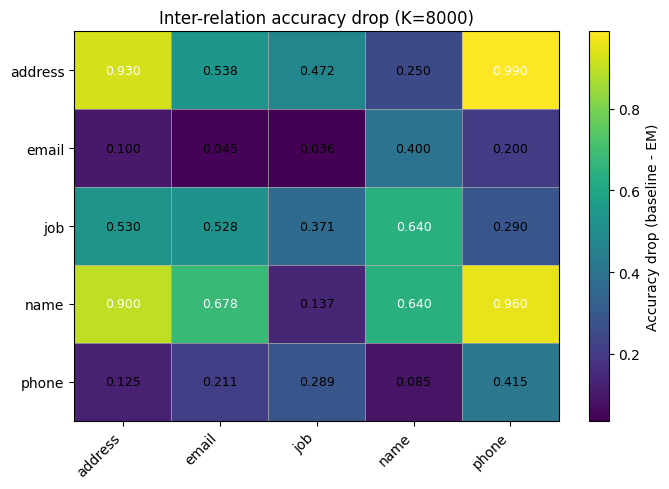

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

FIELDS = ["address", "email", "job", "name", "phone"]
ROW_ORDER = ["address", "email", "job", "name", "phone"]

BASELINE = {'address': 1.0, 'email': 0.995, 'job': 0.985, 'name': 1.0, 'phone': 1.0}
B = pd.Series(BASELINE).reindex(FIELDS).astype(float)

# Your 5 dataframes must already exist:
# phone_df, email_df, address_df, name_df, job_df
dfs = {
    "address": address_df,
    "email": email_df,
    "job": job_df,
    "name": name_df,
    "phone": phone_df,
}

K0 = 8000

# 1) Build performance matrix M at K=9000 (rows=target, cols=fields)
M = pd.DataFrame(index=ROW_ORDER, columns=FIELDS, dtype=float)
for target in ROW_ORDER:
    df = dfs[target]
    row = df.loc[df["K"] == K0, FIELDS]
    if row.empty:
        raise ValueError(f"{target}: no row found for K={K0}")
    M.loc[target] = row.iloc[0].astype(float).values

# 2) Accuracy drop matrix (baseline per column)
DROP = (B - M).div(B, axis=1)

print("Performance matrix M (K=9000):")
print(M.round(3))
print("\nAccuracy drop DROP = baseline - M (K=9000):")
print(DROP.round(3))

# 3) Plot heatmap with values
plt.figure(figsize=(7,5))
im = plt.imshow(DROP.values, aspect="auto")  # no fixed colors

plt.xticks(range(len(FIELDS)), FIELDS, rotation=45, ha="right")
plt.yticks(range(len(ROW_ORDER)), ROW_ORDER)
plt.colorbar(im, label="Accuracy drop (baseline - EM)")

# grid lines (boxes)
ax = plt.gca()
ax.set_xticks(np.arange(-.5, len(FIELDS), 1), minor=True)
ax.set_yticks(np.arange(-.5, len(ROW_ORDER), 1), minor=True)
ax.grid(which="minor", linewidth=0.5)
ax.tick_params(which="minor", bottom=False, left=False)

# numbers inside cells
maxv = np.nanmax(DROP.values)
for i in range(DROP.shape[0]):
    for j in range(DROP.shape[1]):
        val = float(DROP.iat[i, j])
        txt_color = "white" if val >= 0.6*maxv else "black"
        plt.text(j, i, f"{val:.3f}", ha="center", va="center",
                 color=txt_color, fontsize=9)

plt.title(f"Inter-relation accuracy drop (K={K0})")
plt.tight_layout()
plt.show()


Performance M (K=9000) [job removed]:
         address  email  name  phone
address    0.090   0.39  0.47   0.00
email      0.500   0.30  0.80   0.40
name       0.070   0.22  0.40   0.04
phone      0.665   0.61  0.91   0.38

Relative drop (K=9000) [job removed]:
        address   email   name   phone
address   91.0%   60.8%  53.0%  100.0%
email     50.0%  69.85%  20.0%   60.0%
name      93.0%  77.89%  60.0%   96.0%
phone     33.5%  38.69%   9.0%   62.0%


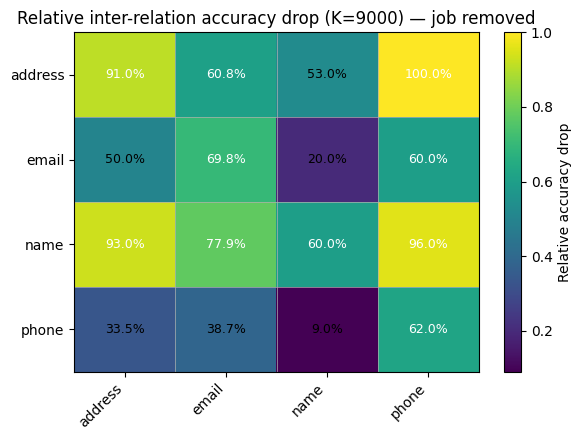

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Remove job
FIELDS = ["address", "email", "name", "phone"]
ROW_ORDER = ["address", "email", "name", "phone"]

BASELINE = {'address': 1.0, 'email': 0.995, 'job': 0.985, 'name': 1.0, 'phone': 1.0}
B = pd.Series(BASELINE).reindex(FIELDS).astype(float)

# Your dataframes must already exist:
# phone_df, email_df, address_df, name_df, job_df
dfs = {
    "address": address_df,
    "email": email_df,
    "job": job_df,
    "name": name_df,
    "phone": phone_df,
}

K0 = 9000

# 1) Build performance matrix M at K=9000 (rows=target, cols=fields) — exclude job
M = pd.DataFrame(index=ROW_ORDER, columns=FIELDS, dtype=float)

for target in ROW_ORDER:
    df = dfs[target]
    row = df.loc[df["K"] == K0, FIELDS]
    if row.empty:
        raise ValueError(f"{target}: no row found for K={K0}")
    M.loc[target] = row.iloc[0].astype(float).values

# 2) Relative drop: (old - new) / old  (baseline per COLUMN)
REL_DROP = (B - M).div(B, axis=1)

print("Performance M (K=9000) [job removed]:")
print(M.round(3))
print("\nRelative drop (K=9000) [job removed]:")
print((REL_DROP * 100).round(2).astype(str) + "%")

# 3) Heatmap
plt.figure(figsize=(6,4.5))
im = plt.imshow(REL_DROP.values, aspect="auto")

plt.xticks(range(len(FIELDS)), FIELDS, rotation=45, ha="right")
plt.yticks(range(len(ROW_ORDER)), ROW_ORDER)
plt.colorbar(im, label="Relative accuracy drop")

# grid lines
ax = plt.gca()
ax.set_xticks(np.arange(-.5, len(FIELDS), 1), minor=True)
ax.set_yticks(np.arange(-.5, len(ROW_ORDER), 1), minor=True)
ax.grid(which="minor", linewidth=0.5)
ax.tick_params(which="minor", bottom=False, left=False)

# values inside cells (percent)
maxv = np.nanmax(REL_DROP.values)
for i in range(REL_DROP.shape[0]):
    for j in range(REL_DROP.shape[1]):
        val = float(REL_DROP.iat[i, j])
        txt_color = "white" if val >= 0.6*maxv else "black"
        plt.text(j, i, f"{val*100:.1f}%", ha="center", va="center",
                 color=txt_color, fontsize=9)

plt.title(f"Relative inter-relation accuracy drop (K={K0}) — job removed")
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from dataclasses import dataclass
from typing import Dict, List, Tuple, Optional

RELATIONS = ["address", "email", "job", "name", "phone"]

def build_results_dataset() -> pd.DataFrame:
    rows = []

    # Target: phone
    rows += [
        dict(target="phone", K=5000, neurons=5000, layers=31, address=0.98,  email=0.97,  job=0.95, name=1.00, phone=0.98),
        dict(target="phone", K=6000, neurons=6000, layers=31, address=0.97,  email=0.905, job=0.87, name=0.985, phone=0.845),
        dict(target="phone", K=7000, neurons=7000, layers=31, address=0.91,  email=0.725, job=0.82, name=0.955, phone=0.82),
        dict(target="phone", K=8000, neurons=8000, layers=31, address=0.875, email=0.785, job=0.70, name=0.915, phone=0.585),
        dict(target="phone", K=9000, neurons=9000, layers=31, address=0.665, email=0.61,  job=0.26, name=0.91,  phone=0.38),
    ]

    # Target: email
    rows += [
        dict(target="email", K=5000, neurons=4821, layers=19, address=0.95, email=1.00, job=0.90, name=1.00, phone=1.00),
        dict(target="email", K=6000, neurons=5762, layers=21, address=1.00, email=0.90, job=0.95, name=0.90, phone=0.85),
        dict(target="email", K=7000, neurons=6720, layers=24, address=0.95, email=1.00, job=0.95, name=0.90, phone=1.00),
        dict(target="email", K=8000, neurons=7665, layers=25, address=0.90, email=0.95, job=0.95, name=0.60, phone=0.80),
        dict(target="email", K=9000, neurons=8610, layers=27, address=0.50, email=0.30, job=0.75, name=0.80, phone=0.40),
    ]

    # Target: address
    rows += [
        dict(target="address", K=5000, neurons=5000, layers=31, address=0.91, email=0.96, job=0.97, name=0.99, phone=0.92),
        dict(target="address", K=6000, neurons=6000, layers=31, address=0.88, email=0.91, job=0.93, name=0.96, phone=0.82),
        dict(target="address", K=7000, neurons=7000, layers=31, address=0.22, email=0.63, job=0.71, name=0.79, phone=0.05),
        dict(target="address", K=8000, neurons=8000, layers=31, address=0.07, email=0.46, job=0.52, name=0.75, phone=0.01),
        dict(target="address", K=9000, neurons=9000, layers=31, address=0.09, email=0.39, job=0.55, name=0.47, phone=0.00),
    ]

    # Target: name
    rows += [
        dict(target="name", K=5000, neurons=5000, layers=26, address=0.90, email=1.00, job=0.95, name=1.00, phone=0.95),
        dict(target="name", K=6000, neurons=6000, layers=27, address=0.40, email=0.60, job=0.95, name=0.30, phone=0.35),
        dict(target="name", K=7000, neurons=7000, layers=28, address=0.05, email=0.50, job=0.75, name=0.25, phone=0.05),
        dict(target="name", K=8000, neurons=8000, layers=29, address=0.15, email=0.40, job=0.90, name=0.35, phone=0.05),
        dict(target="name", K=9000, neurons=9000, layers=29, address=0.05, email=0.15, job=0.80, name=0.45, phone=0.05),
    ]

    df = pd.DataFrame(rows)
    df["K"] = df["K"].astype(int)
    df["neurons"] = df["neurons"].astype(int)
    df["layers"] = df["layers"].astype(int)
    return df

@dataclass
class TradeoffConfig:
    alpha: float = 0.7
    tau: float = 0.70
    baseline: float = 1.0

def compute_metrics_for_row(row: pd.Series, cfg: TradeoffConfig) -> Dict[str, float]:
    t = row["target"]
    target_acc = float(row[t])
    others = [r for r in RELATIONS if r != t]
    other_accs = np.array([float(row[o]) for o in others], dtype=float)

    U = cfg.baseline - target_acc
    C = float(np.mean(cfg.baseline - other_accs))
    min_other = float(np.min(other_accs))
    mean_other = float(np.mean(other_accs))
    score = cfg.alpha * U - (1.0 - cfg.alpha) * C

    return dict(target_acc=target_acc, U=U, C=C, score=score,
                min_other_acc=min_other, mean_other_acc=mean_other)

def pick_best_K(df: pd.DataFrame, target: str, cfg: TradeoffConfig) -> Tuple[pd.DataFrame, Optional[pd.Series]]:
    sub = df[df["target"] == target].copy().reset_index(drop=True)
    if sub.empty:
        return sub, None
    metrics = sub.apply(lambda r: compute_metrics_for_row(r, cfg), axis=1, result_type="expand")
    out = pd.concat([sub, metrics], axis=1)

    feasible = out[out["min_other_acc"] >= cfg.tau].copy()
    if feasible.empty:
        return out, None
    best = feasible.loc[feasible["score"].idxmax()]
    return out, best

def run_all(df: pd.DataFrame, cfg: TradeoffConfig, targets=("phone","email","address","name")) -> pd.DataFrame:
    print(f"alpha={cfg.alpha} | tau={cfg.tau} | baseline={cfg.baseline}\n")
    summary = []
    for t in targets:
        detailed, best = pick_best_K(df, t, cfg)

        print("-"*60)
        print("TARGET =", t.upper())
        print("-"*60)

        show_cols = ["K","neurons","layers"] + RELATIONS + ["U","C","score","min_other_acc"]
        print(detailed[show_cols].sort_values("K").to_string(index=False))
        print()

        if best is None:
            print(f">>> No feasible K meets min_other_acc >= {cfg.tau}\n")
            continue

        print(f">>> CHOSEN: K={int(best['K'])} | neurons={int(best['neurons'])} | layers={int(best['layers'])}")
        print(f"    target_acc={best['target_acc']:.3f} | U={best['U']:.3f} | C={best['C']:.3f} | score={best['score']:.3f} | min_other_acc={best['min_other_acc']:.3f}\n")

        summary.append(dict(
            target=t, K=int(best["K"]), neurons=int(best["neurons"]), layers=int(best["layers"]),
            target_acc=float(best["target_acc"]), U=float(best["U"]), C=float(best["C"]),
            score=float(best["score"]), min_other_acc=float(best["min_other_acc"])
        ))
    return pd.DataFrame(summary).sort_values("target").reset_index(drop=True)

# ---- RUN ----
df = build_results_dataset()
cfg = TradeoffConfig(alpha=0.7, tau=0.70, baseline=1.0)
summary = run_all(df, cfg)
summary

alpha=0.7 | tau=0.7 | baseline=1.0

------------------------------------------------------------
TARGET = PHONE
------------------------------------------------------------
   K  neurons  layers  address  email  job  name  phone     U       C    score  min_other_acc
5000     5000      31    0.980  0.970 0.95 1.000  0.980 0.020 0.02500 0.006500          0.950
6000     6000      31    0.970  0.905 0.87 0.985  0.845 0.155 0.06750 0.088250          0.870
7000     7000      31    0.910  0.725 0.82 0.955  0.820 0.180 0.14750 0.081750          0.725
8000     8000      31    0.875  0.785 0.70 0.915  0.585 0.415 0.18125 0.236125          0.700
9000     9000      31    0.665  0.610 0.26 0.910  0.380 0.620 0.38875 0.317375          0.260

>>> CHOSEN: K=8000 | neurons=8000 | layers=31
    target_acc=0.585 | U=0.415 | C=0.181 | score=0.236 | min_other_acc=0.700

------------------------------------------------------------
TARGET = EMAIL
------------------------------------------------------------
 

,target,K,neurons,layers,target_acc,U,C,score,min_other_acc
0,address,6000,6000,31,0.880,0.120,0.09500,0.055500,0.82
1,email,6000,5762,21,0.900,0.100,0.07500,0.047500,0.85
2,name,5000,5000,26,1.000,0.000,0.05000,-0.015000,0.90
3,phone,8000,8000,31,0.585,0.415,0.18125,0.236125,0.70


In [ ]:
import numpy as np
import pandas as pd
from dataclasses import dataclass
from typing import Dict, List, Tuple, Optional

RELATIONS = ["address", "email", "job", "name", "phone"]

# -----------------------------
# 1) Paste/keep your dataset builder
# -----------------------------
def build_results_dataset() -> pd.DataFrame:
    rows = []

    # Target: phone
    rows += [
        dict(target="phone", K=5000, neurons=5000, layers=31, address=0.98,  email=0.97,  job=0.95, name=1.00, phone=0.98),
        dict(target="phone", K=6000, neurons=6000, layers=31, address=0.97,  email=0.905, job=0.87, name=0.985, phone=0.845),
        dict(target="phone", K=7000, neurons=7000, layers=31, address=0.91,  email=0.725, job=0.82, name=0.955, phone=0.82),
        dict(target="phone", K=8000, neurons=8000, layers=31, address=0.875, email=0.785, job=0.70, name=0.915, phone=0.585),
        dict(target="phone", K=9000, neurons=9000, layers=31, address=0.665, email=0.61,  job=0.26, name=0.91,  phone=0.38),
    ]

    # Target: email
    rows += [
        dict(target="email", K=5000, neurons=4821, layers=19, address=0.95, email=1.00, job=0.90, name=1.00, phone=1.00),
        dict(target="email", K=6000, neurons=5762, layers=21, address=1.00, email=0.90, job=0.95, name=0.90, phone=0.85),
        dict(target="email", K=7000, neurons=6720, layers=24, address=0.95, email=1.00, job=0.95, name=0.90, phone=1.00),
        dict(target="email", K=8000, neurons=7665, layers=25, address=0.90, email=0.95, job=0.95, name=0.60, phone=0.80),
        dict(target="email", K=9000, neurons=8610, layers=27, address=0.50, email=0.30, job=0.75, name=0.80, phone=0.40),
    ]

    # Target: address
    rows += [
        dict(target="address", K=5000, neurons=5000, layers=31, address=0.91, email=0.96, job=0.97, name=0.99, phone=0.92),
        dict(target="address", K=6000, neurons=6000, layers=31, address=0.88, email=0.91, job=0.93, name=0.96, phone=0.82),
        dict(target="address", K=7000, neurons=7000, layers=31, address=0.22, email=0.63, job=0.71, name=0.79, phone=0.05),
        dict(target="address", K=8000, neurons=8000, layers=31, address=0.07, email=0.46, job=0.52, name=0.75, phone=0.01),
        dict(target="address", K=9000, neurons=9000, layers=31, address=0.09, email=0.39, job=0.55, name=0.47, phone=0.00),
    ]

    # Target: name
    rows += [
        dict(target="name", K=5000, neurons=5000, layers=26, address=0.90, email=1.00, job=0.95, name=1.00, phone=0.95),
        dict(target="name", K=6000, neurons=6000, layers=27, address=0.40, email=0.60, job=0.95, name=0.30, phone=0.35),
        dict(target="name", K=7000, neurons=7000, layers=28, address=0.05, email=0.50, job=0.75, name=0.25, phone=0.05),
        dict(target="name", K=8000, neurons=8000, layers=29, address=0.15, email=0.40, job=0.90, name=0.35, phone=0.05),
        dict(target="name", K=9000, neurons=9000, layers=29, address=0.05, email=0.15, job=0.80, name=0.45, phone=0.05),
    ]

    df = pd.DataFrame(rows)
    df["K"] = df["K"].astype(int)
    df["neurons"] = df["neurons"].astype(int)
    df["layers"] = df["layers"].astype(int)
    return df


# -----------------------------
# 2) Selector: target close to 0.5, others close to baseline
# -----------------------------
@dataclass
class Target05Config:
    target_goal: float = 0.50     # desired unlearning accuracy for target
    baseline: float = 1.00        # baseline for others (if you have real baseline, set it)
    tol: float = 0.10             # first filter: keep candidates with |target - goal| <= tol
    lambda_other: float = 1.0     # how strongly to protect other relations
    use_squared: bool = True      # squared penalty vs absolute penalty

def score_row_target05(row: pd.Series, cfg: Target05Config) -> Dict[str, float]:
    t = row["target"]
    At = float(row[t])
    others = [r for r in RELATIONS if r != t]
    Aothers = np.array([float(row[o]) for o in others], dtype=float)

    # 1) make target close to 0.5
    target_dist = abs(At - cfg.target_goal)

    # 2) keep others close to baseline (high accuracy, minimal drop)
    drops = (cfg.baseline - Aothers)
    if cfg.use_squared:
        other_pen = float(np.mean(drops**2))
    else:
        other_pen = float(np.mean(np.abs(drops)))

    # combined objective (lower is better)
    obj = target_dist + cfg.lambda_other * other_pen

    # useful reporting
    return dict(
        target_acc=At,
        target_dist=target_dist,
        other_pen=other_pen,
        obj=obj,
        min_other=float(np.min(Aothers)),
        mean_other=float(np.mean(Aothers)),
    )

def pick_best_for_each_target(df: pd.DataFrame, cfg: Target05Config,
                             targets=("phone","email","address","name","job")) -> Tuple[pd.DataFrame, pd.DataFrame]:
    picks = []
    full_tables = []

    for t in targets:
        sub = df[df["target"] == t].copy().reset_index(drop=True)
        if sub.empty:
            continue

        metrics = sub.apply(lambda r: score_row_target05(r, cfg), axis=1, result_type="expand")
        out = pd.concat([sub, metrics], axis=1)
        full_tables.append(out)

        # prefer candidates within tolerance; if none, use all
        within = out[out["target_dist"] <= cfg.tol].copy()
        cand = within if not within.empty else out

        best = cand.loc[cand["obj"].idxmin()]

        # store
        others = [r for r in RELATIONS if r != t]
        pick = dict(
            target=t,
            K=int(best["K"]),
            neurons=int(best["neurons"]),
            layers=int(best["layers"]),
            target_acc=float(best["target_acc"]),
            target_dist=float(best["target_dist"]),
            mean_other=float(best["mean_other"]),
            min_other=float(best["min_other"]),
            obj=float(best["obj"]),
        )
        # also store the chosen others accuracies
        for o in others:
            pick[f"{o}_acc"] = float(best[o])

        picks.append(pick)

    picks_df = pd.DataFrame(picks).sort_values("target").reset_index(drop=True)
    all_df = pd.concat(full_tables, ignore_index=True) if full_tables else pd.DataFrame()
    return picks_df, all_df


# -----------------------------
# 3) RUN
# -----------------------------
df = build_results_dataset()

cfg = Target05Config(
    target_goal=0.50,
    baseline=1.00,
    tol=0.10,          # only consider K where target is within ±0.10 of 0.5 (else fallback)
    lambda_other=1.0,  # increase to protect others more (e.g., 2.0, 3.0)
    use_squared=True
)

picks_df, all_df = pick_best_for_each_target(df, cfg, targets=("phone","email","address","name"))

print("=== PICKS (best neuron budget per target) ===")
display(picks_df)

print("\nTip: if a target has no value near 0.5, you will see a large target_dist.")
print("Increase tol, or add more K points (e.g., 8500, 9500...) to search better.")

=== PICKS (best neuron budget per target) ===


,target,K,neurons,layers,target_acc,target_dist,mean_other,min_other,obj,address_acc,email_acc,job_acc,name_acc,phone_acc
0,address,6000,6000,31,0.880,0.380,0.90500,0.82,0.391750,NaN,0.910,0.93,0.960,0.82
1,email,9000,8610,27,0.300,0.200,0.61250,0.40,0.378125,0.500,NaN,0.75,0.800,0.40
2,name,9000,9000,29,0.450,0.050,0.26250,0.05,0.691875,0.050,0.150,0.80,NaN,0.05
3,phone,8000,8000,31,0.585,0.085,0.81875,0.70,0.124769,0.875,0.785,0.70,0.915,NaN



Tip: if a target has no value near 0.5, you will see a large target_dist.
Increase tol, or add more K points (e.g., 8500, 9500...) to search better.


In [ ]:
import numpy as np
import pandas as pd
from dataclasses import dataclass
from typing import Dict, List, Tuple, Optional

# ✅ JOB REMOVED
RELATIONS = ["address", "email", "name", "phone"]

# -----------------------------
# 1) Dataset (your pasted results, job column kept but ignored)
# -----------------------------
def build_results_dataset() -> pd.DataFrame:
    rows = []

    # Target: phone
    rows += [
        dict(target="phone", K=5000, neurons=5000, layers=31, address=0.98,  email=0.97,  job=0.95, name=1.00, phone=0.98),
        dict(target="phone", K=6000, neurons=6000, layers=31, address=0.97,  email=0.905, job=0.87, name=0.985, phone=0.845),
        dict(target="phone", K=7000, neurons=7000, layers=31, address=0.91,  email=0.725, job=0.82, name=0.955, phone=0.82),
        dict(target="phone", K=8000, neurons=8000, layers=31, address=0.875, email=0.785, job=0.70, name=0.915, phone=0.585),
        dict(target="phone", K=9000, neurons=9000, layers=31, address=0.665, email=0.61,  job=0.26, name=0.91,  phone=0.38),
    ]

    # Target: email
    rows += [
        dict(target="email", K=5000, neurons=4821, layers=19, address=0.95, email=1.00, job=0.90, name=1.00, phone=1.00),
        dict(target="email", K=6000, neurons=5762, layers=21, address=1.00, email=0.90, job=0.95, name=0.90, phone=0.85),
        dict(target="email", K=7000, neurons=6720, layers=24, address=0.95, email=1.00, job=0.95, name=0.90, phone=1.00),
        dict(target="email", K=8000, neurons=7665, layers=25, address=0.90, email=0.95, job=0.95, name=0.60, phone=0.80),
        dict(target="email", K=9000, neurons=8610, layers=27, address=0.50, email=0.30, job=0.75, name=0.80, phone=0.40),
    ]

    # Target: address
    rows += [
        dict(target="address", K=5000, neurons=5000, layers=31, address=0.91, email=0.96, job=0.97, name=0.99, phone=0.92),
        dict(target="address", K=6000, neurons=6000, layers=31, address=0.88, email=0.91, job=0.93, name=0.96, phone=0.82),
        dict(target="address", K=7000, neurons=7000, layers=31, address=0.22, email=0.63, job=0.71, name=0.79, phone=0.05),
        dict(target="address", K=8000, neurons=8000, layers=31, address=0.07, email=0.46, job=0.52, name=0.75, phone=0.01),
        dict(target="address", K=9000, neurons=9000, layers=31, address=0.09, email=0.39, job=0.55, name=0.47, phone=0.00),
    ]

    # Target: name
    rows += [
        dict(target="name", K=5000, neurons=5000, layers=26, address=0.90, email=1.00, job=0.95, name=1.00, phone=0.95),
        dict(target="name", K=6000, neurons=6000, layers=27, address=0.40, email=0.60, job=0.95, name=0.30, phone=0.35),
        dict(target="name", K=7000, neurons=7000, layers=28, address=0.05, email=0.50, job=0.75, name=0.25, phone=0.05),
        dict(target="name", K=8000, neurons=8000, layers=29, address=0.15, email=0.40, job=0.90, name=0.35, phone=0.05),
        dict(target="name", K=9000, neurons=9000, layers=29, address=0.05, email=0.15, job=0.80, name=0.45, phone=0.05),
    ]

    df = pd.DataFrame(rows)
    df["K"] = df["K"].astype(int)
    df["neurons"] = df["neurons"].astype(int)
    df["layers"] = df["layers"].astype(int)
    return df


# -----------------------------
# 2) Objective: target close to 0.5, others close to baseline
# -----------------------------
@dataclass
class Target05Config:
    target_goal: float = 0.50
    baseline: float = 1.00
    tol: float = 0.10           # first filter: |target-goal| <= tol (else fallback)
    lambda_other: float = 1.0   # increase => protect others more
    use_squared: bool = True    # squared penalty for others

def score_row(row: pd.Series, cfg: Target05Config) -> Dict[str, float]:
    t = row["target"]
    At = float(row[t])  # ✅ target accuracy
    others = [r for r in RELATIONS if r != t]
    Aothers = np.array([float(row[o]) for o in others], dtype=float)

    target_dist = abs(At - cfg.target_goal)

    drops = (cfg.baseline - Aothers)
    other_pen = float(np.mean(drops**2)) if cfg.use_squared else float(np.mean(np.abs(drops)))

    obj = target_dist + cfg.lambda_other * other_pen

    return dict(
        target_acc=At,
        target_dist=target_dist,
        other_pen=other_pen,
        obj=obj,
        min_other=float(np.min(Aothers)),
        mean_other=float(np.mean(Aothers)),
    )

def pick_best_for_each_target(
    df: pd.DataFrame,
    cfg: Target05Config,
    targets=("phone","email","address","name")
) -> Tuple[pd.DataFrame, pd.DataFrame]:

    picks = []
    full_tables = []

    for t in targets:
        sub = df[df["target"] == t].copy().reset_index(drop=True)
        if sub.empty:
            continue

        metrics = sub.apply(lambda r: score_row(r, cfg), axis=1, result_type="expand")
        out = pd.concat([sub, metrics], axis=1)
        full_tables.append(out)

        within = out[out["target_dist"] <= cfg.tol].copy()
        cand = within if not within.empty else out
        best = cand.loc[cand["obj"].idxmin()]

        # ✅ build final row (includes target + others accuracies)
        chosen = {
            "target": t,
            "K": int(best["K"]),
            "neurons": int(best["neurons"]),
            "layers": int(best["layers"]),
            "target_acc": float(best["target_acc"]),
            "target_dist": float(best["target_dist"]),
            "min_other_acc": float(best["min_other"]),
            "mean_other_acc": float(best["mean_other"]),
            "other_pen": float(best["other_pen"]),
            "obj": float(best["obj"]),
        }

        # include accuracies for all relations (target + others) for this chosen K
        for rel in RELATIONS:
            chosen[f"{rel}_acc"] = float(best[rel])

        picks.append(chosen)

    picks_df = pd.DataFrame(picks).sort_values("target").reset_index(drop=True)
    all_df = pd.concat(full_tables, ignore_index=True) if full_tables else pd.DataFrame()
    return picks_df, all_df


# -----------------------------
# 3) RUN
# -----------------------------
df = build_results_dataset()

cfg = Target05Config(
    target_goal=0.50,
    baseline=1.00,
    tol=0.10,          # widen to 0.20 if you don't have points near 0.5
    lambda_other=1.0,  # raise to protect others more
    use_squared=True
)

picks_df, all_df = pick_best_for_each_target(df, cfg)

print("=== BEST CHOICE PER TARGET (target close to 0.5, others preserved) ===")
display(picks_df)

=== BEST CHOICE PER TARGET (target close to 0.5, others preserved) ===


,target,K,neurons,layers,target_acc,target_dist,min_other_acc,mean_other_acc,other_pen,obj,address_acc,email_acc,name_acc,phone_acc
0,address,6000,6000,31,0.880,0.380,0.820,0.896667,0.014033,0.394033,0.880,0.910,0.960,0.820
1,email,6000,5762,21,0.900,0.400,0.850,0.916667,0.010833,0.410833,1.000,0.900,0.900,0.850
2,name,9000,9000,29,0.450,0.050,0.050,0.083333,0.842500,0.892500,0.050,0.150,0.450,0.050
3,phone,8000,8000,31,0.585,0.085,0.785,0.858333,0.023025,0.108025,0.875,0.785,0.915,0.585
